# Doctor's Consultation Fee

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
#load train and test data
df_train = pd.read_csv("doctors_fee_train.csv")
df_test = pd.read_csv("doctors_fee_test.csv")

In [3]:
df_train.head()

,Qualification,Experience,Rating,Place,Profile,Miscellaneous_Info,Fees
0,"BHMS, MD - Homeopathy",24 years experience,100%,"Kakkanad, Ernakulam",Homeopath,"100% 16 Feedback Kakkanad, Ernakulam",100
1,"BAMS, MD - Ayurveda Medicine",12 years experience,98%,"Whitefield, Bangalore",Ayurveda,"98% 76 Feedback Whitefield, Bangalore",350
2,"MBBS, MS - Otorhinolaryngology",9 years experience,NaN,"Mathikere - BEL, Bangalore",ENT Specialist,NaN,300
3,"BSc - Zoology, BAMS",12 years experience,NaN,"Bannerghatta Road, Bangalore",Ayurveda,"Bannerghatta Road, Bangalore ₹250 Available on...",250
4,BAMS,20 years experience,100%,"Keelkattalai, Chennai",Ayurveda,"100% 4 Feedback Keelkattalai, Chennai",250


In [4]:
#check shape of the train and test dataset
print(df_train.shape)
print(df_test.shape)

(5961, 7)
(1987, 6)


In [5]:
#check null values present in train and test data
print(df_train.isnull().sum())
print(df_test.isnull().sum())

Qualification            0
Experience               0
Rating                3302
Place                   25
Profile                  0
Miscellaneous_Info    2620
Fees                     0
dtype: int64
Qualification            0
Experience               0
Rating                1090
Place                    6
Profile                  0
Miscellaneous_Info     834
dtype: int64


There is null values present in data and need to fill.

In [6]:
#check data types
df_train.dtypes

Qualification         object
Experience            object
Rating                object
Place                 object
Profile               object
Miscellaneous_Info    object
Fees                   int64
dtype: object

In [7]:
#split qualification column in qual_1 and qual_2.
df_train["Qual_1"] = df_train["Qualification"].str.split(',').str[0]
df_train["Qual_2"] = df_train["Qualification"].str.split(',').str[1]
df_train["Qual_2"] = df_train["Qual_2"].str.split('-').str[0]

df_test["Qual_1"] = df_test["Qualification"].str.split(",").str[0]
df_test["Qual_2"] = df_test["Qualification"].str.split(",").str[1]
df_test["Qual_2"] = df_test["Qualification"].str.split("-").str[0]

# Here, We don't need to qualification column.so, we drop this column
df_train.drop(["Qualification"],axis=1,inplace=True)
df_test.drop(["Qualification"],axis=1,inplace=True)

In [8]:
# convert experience attribute from object to integer and remove years experience string.
df_train["Experience"] = df_train["Experience"].str.replace("years experience"," ").astype('int')
df_test["Experience"] = df_test["Experience"].str.replace("years experience"," ").astype('int')

In [9]:
# Remove % from the rating column and change data type to float.
df_train["Rating"] = df_train["Rating"].str.replace("%"," ").astype('float')
df_test["Rating"] = df_test["Rating"].str.replace("%"," ").astype('float')

In [10]:
#split place column in city and area.
df_train["area"] = df_train["Place"].str.split(",").str[0]
df_train["city"] = df_train["Place"].str.split(",").str[1]

df_test["area"] = df_test["Place"].str.split(",").str[0]
df_test["city"] = df_test["Place"].str.split(",").str[1]

# Here, we can drop place column.
df_train.drop(["Place"],axis=1,inplace=True)
df_test.drop(["Place"],axis=1,inplace=True)

In [11]:
# miscellaneous_info have data which we already have like city,area and rating.
# This attribute also have too much nan values. so,we drop this column.
df_train.drop(["Miscellaneous_Info"],axis=1,inplace=True)
df_test.drop(["Miscellaneous_Info"],axis=1,inplace=True)

In [12]:
# Area column have almost same relation with city. so, we drop this attribute.
df_train.drop(["area"],axis=1,inplace=True)
df_test.drop(["area"],axis=1,inplace=True)

In [13]:
df_train.head()

,Experience,Rating,Profile,Fees,Qual_1,Qual_2,city
0,24,100.0,Homeopath,100,BHMS,MD,Ernakulam
1,12,98.0,Ayurveda,350,BAMS,MD,Bangalore
2,9,NaN,ENT Specialist,300,MBBS,MS,Bangalore
3,12,NaN,Ayurveda,250,BSc - Zoology,BAMS,Bangalore
4,20,100.0,Ayurveda,250,BAMS,NaN,Chennai


In [14]:
#check null values
df_train.isnull().sum()

Experience       0
Rating        3302
Profile          0
Fees             0
Qual_1           0
Qual_2        1962
city            26
dtype: int64

In [15]:
# fill null value of rating column with zero because almost half of the value is null.
df_train["Rating"] = df_train["Rating"].fillna(0)
df_test["Rating"] = df_test["Rating"].fillna(0)

In [16]:
# There are many null value in Qual_2 column so,we fill null value with unknown.
df_train["Qual_2"] = df_train["Qual_2"].fillna("unknown")
df_test["Qual_2"] = df_test["Qual_2"].fillna("unknown")

In [17]:
# fill null value of city attribute with it's most frequent value.
df_train["city"] = df_train["city"].fillna(df_train["city"].mode()[0])
df_test["city"] = df_test["city"].fillna(df_test["city"].mode()[0])

In [18]:
# check null values and data types
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5961 entries, 0 to 5960
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Experience  5961 non-null   int32  
 1   Rating      5961 non-null   float64
 2   Profile     5961 non-null   object 
 3   Fees        5961 non-null   int64  
 4   Qual_1      5961 non-null   object 
 5   Qual_2      5961 non-null   object 
 6   city        5961 non-null   object 
dtypes: float64(1), int32(1), int64(1), object(4)
memory usage: 302.8+ KB


### Check number of unique values present in each columns

In [19]:
df_train["Experience"].value_counts()

9     323
10    294
11    288
8     282
12    279
     ... 
64      1
65      1
58      1
66      1
61      1
Name: Experience, Length: 64, dtype: int64

In [20]:
df_train["Rating"].value_counts()

0.0      3302
100.0     684
98.0      290
99.0      259
97.0      241
96.0      220
95.0      178
94.0      115
93.0      109
90.0       66
92.0       66
91.0       60
89.0       42
88.0       41
85.0       27
82.0       23
86.0       21
83.0       21
80.0       19
77.0       16
87.0       14
84.0       13
79.0       13
81.0       12
67.0       12
76.0        9
71.0        9
73.0        8
75.0        8
74.0        7
60.0        7
78.0        6
56.0        5
68.0        5
70.0        4
69.0        4
72.0        3
57.0        3
64.0        2
55.0        2
62.0        2
63.0        2
33.0        2
36.0        1
45.0        1
53.0        1
48.0        1
58.0        1
7.0         1
40.0        1
47.0        1
65.0        1
Name: Rating, dtype: int64

In [21]:
df_train["Profile"].value_counts()

Dentist             1397
General Medicine    1173
Dermatologists      1034
Homeopath            843
Ayurveda             786
ENT Specialist       728
Name: Profile, dtype: int64

In [22]:
df_train["Qual_1"].value_counts()

MBBS                                           2448
BDS                                            1208
BAMS                                            711
BHMS                                            706
MD - Dermatology                                 84
                                               ... 
Post Graduate Diploma in Diabetology (PGDD)       1
Certification in Aesthetic Dentistry              1
MBA - Hospital Management                         1
M.Sc - Biochemistry                               1
DNB - Paediatrics                                 1
Name: Qual_1, Length: 151, dtype: int64

In [23]:
df_train["Qual_2"].value_counts()

unknown                                                1962
 MD                                                    1124
 MDS                                                    493
 MS                                                     451
 MBBS                                                   217
                                                       ... 
 Certificate Course in Sports and Fitness Nutrition       1
 Post Graduate Diploma in Holistic Healthcare             1
 Certificate in Food and Nutrition                        1
 Diploma in Clinical Nutrition                            1
 P.G Diploma in Aesthetic Dentistry                       1
Name: Qual_2, Length: 303, dtype: int64

In [24]:
df_train["city"].value_counts()

 Bangalore             1284
 Mumbai                1219
 Delhi                 1184
 Hyderabad              951
 Chennai                855
 Coimbatore             228
 Ernakulam              153
 Thiruvananthapuram      86
 Sector 5                 1
Name: city, dtype: int64

There is no city named Sector 5. so, we need to drop that row.

In [25]:
# drop row with Sector 5 
df_train.drop([2169],inplace=True)

In [26]:
df_train["city"].value_counts()

 Bangalore             1284
 Mumbai                1219
 Delhi                 1184
 Hyderabad              951
 Chennai                855
 Coimbatore             228
 Ernakulam              153
 Thiruvananthapuram      86
Name: city, dtype: int64

## Univariate analysis

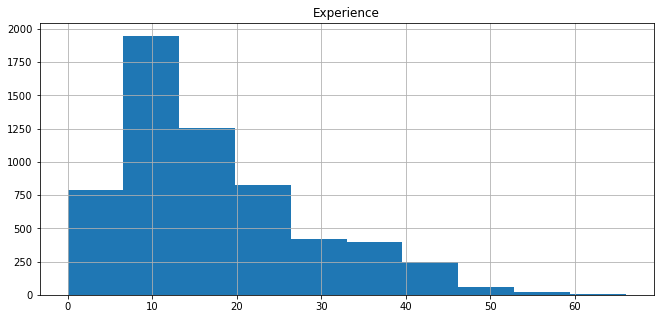

In [27]:
df_train.hist("Experience",bins=10,figsize=(11,5))
plt.show()

1. Most of the doctor's have experience between 6 years to 12 years.
2. Very few doctors's have experience above 60 years.

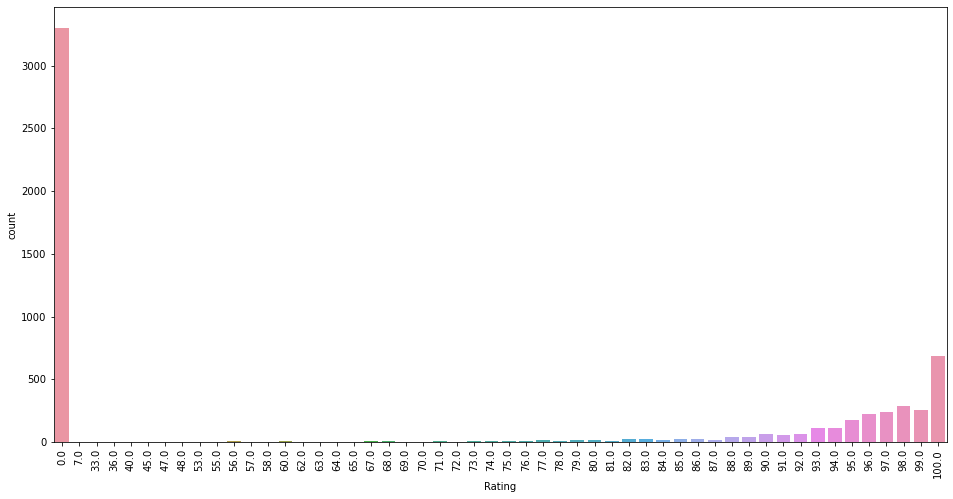

In [28]:
plt.figure(figsize=(16,8))
sns.countplot(df_train["Rating"])
plt.xticks(rotation='vertical')
plt.show()

1. Here, we doesn't consider rating zero because rating zero is unknown rating.
2. Maximam number of doctor's have rating of 100%
3. Most of the doctor's have rating above 90% in our dataset.

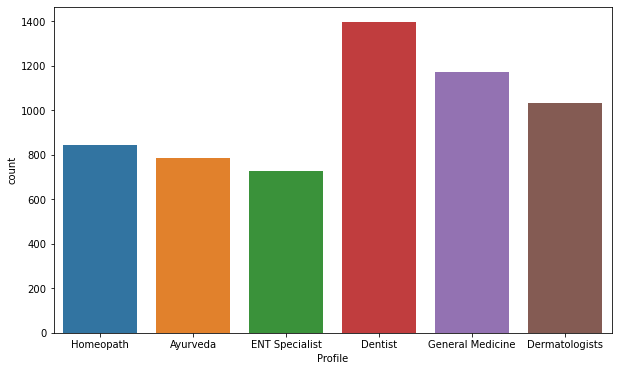

In [29]:
plt.figure(figsize=(10,6))
sns.countplot(df_train["Profile"])
plt.show()

1. Maximam number of doctor's are dentist,general medicine doctors are at second place,while dermatologists are at third place.
2. ENT specialist doctor's are minimum in our dataset compared to others.

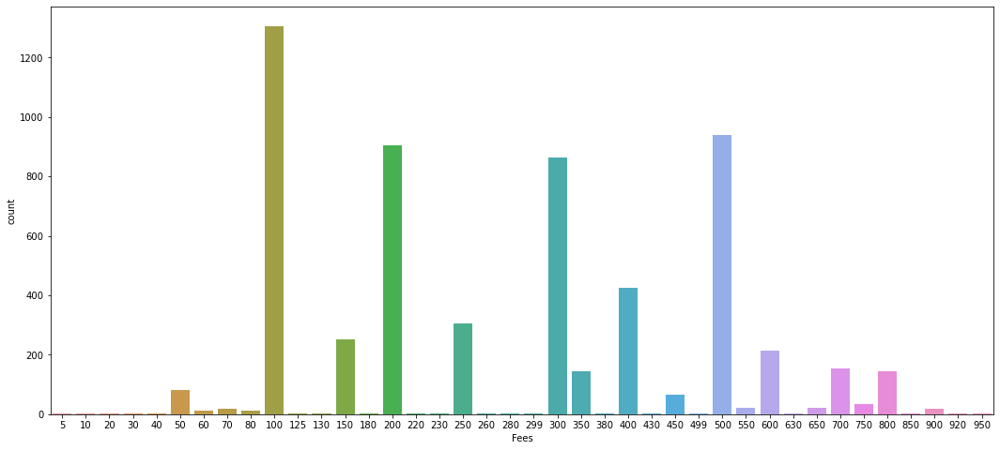

In [30]:
plt.figure(figsize=(18,8))
sns.countplot(df_train["Fees"])
plt.show()

1. Majority of the doctor's consulting fee is in round figure like, 100,200,500 etc.
2. Maximum number of doctor's consulting fee is 100 Rs.  

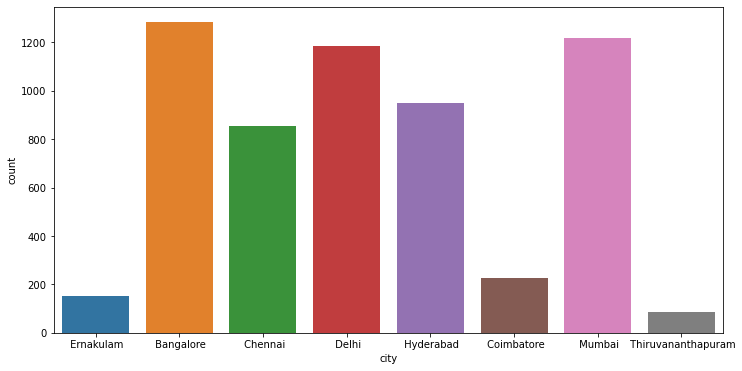

In [31]:
plt.figure(figsize=(12,6))
sns.countplot(df_train["city"])
plt.show()

1. Almost 1300 doctor's are from Bangalore which is maximum.
2. Doctor's from Delhi and Mumbai are almost similar which is nearby 1200.
3. Least number of doctor's are from Thiruvananthapuram.

## Bivariate Analysis

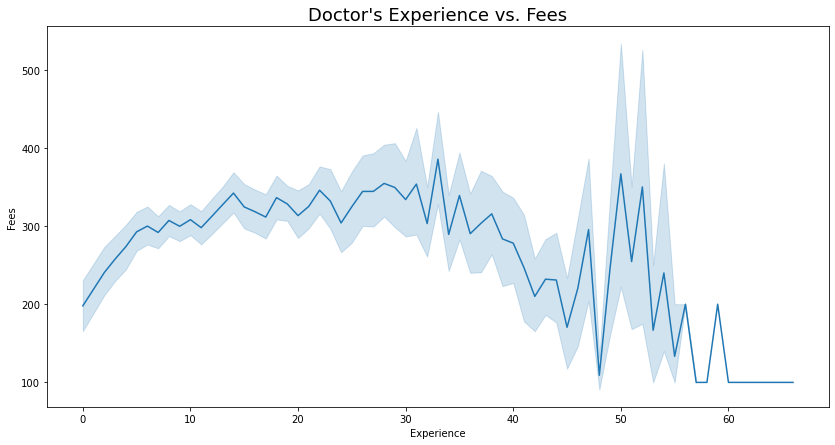

In [32]:
plt.figure(figsize=(14,7))
sns.lineplot(x="Experience",y="Fees",data=df_train)
plt.title("Doctor's Experience vs. Fees",fontsize=18)
plt.show()

Doctor's consulting average fee is high,who have experience between 30 to 35 years.while, fee is low who have experience above 55 years.

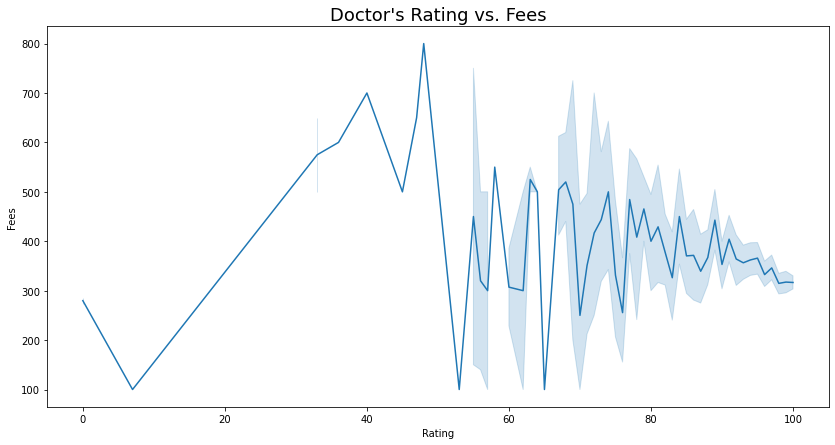

In [33]:
plt.figure(figsize=(14,7))
sns.lineplot(x="Rating",y="Fees",data=df_train)
plt.title("Doctor's Rating vs. Fees",fontsize=18)
plt.show()

1. Doctor's consulting fee is low where rating is high.
2. Doctor's consulting fee is high where rating is low perticularly between 35 to 45 percent.

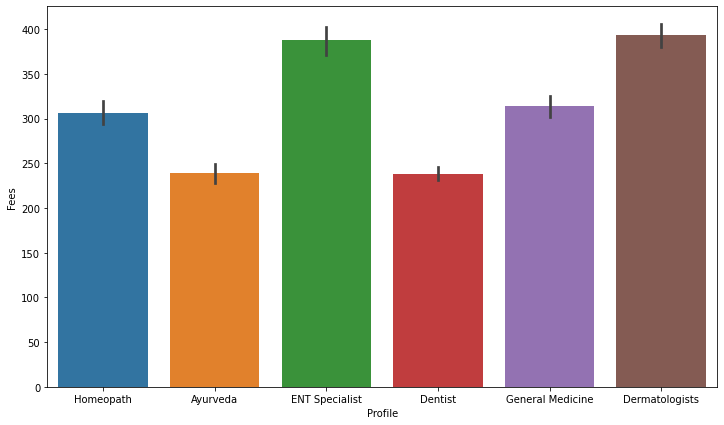

,Profile,Fees
0,Ayurveda,238.968193
1,Dentist,238.191261
2,Dermatologists,393.133462
3,ENT Specialist,387.321429
4,General Medicine,313.908781
5,Homeopath,306.499407


In [34]:
plt.figure(figsize=(12,7))
sns.barplot(x="Profile",y="Fees",data=df_train)
plt.show()

df_train.groupby("Profile")["Fees"].mean().reset_index()

1. Doctor's consulting fee is nearby 400,who have profile of Dermatologist and ENT specialist. 
2. Ayurveda and Dentist doctor's fee is low compared to other doctor's.
3. Ayurveda and Dentist doctor's fee is almost similar. which is nearby 250.
4. Doctor's fee is almost similar with profile of General medicine and homeopath.(fee is nearby 300)

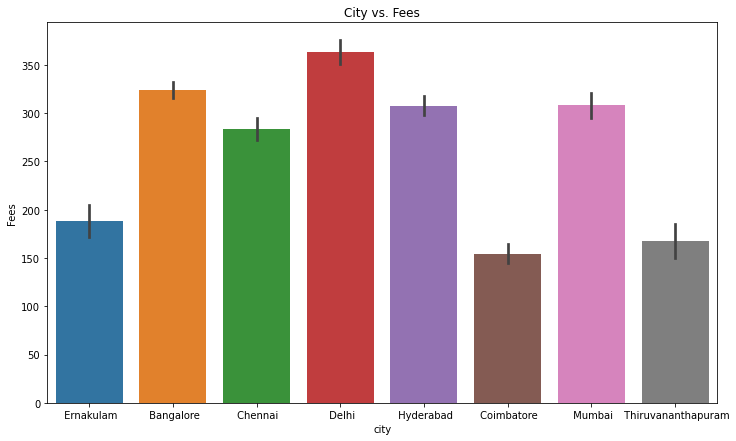

,city,Fees
0,Bangalore,324.364486
1,Chennai,283.602339
2,Coimbatore,154.298246
3,Delhi,363.006757
4,Ernakulam,188.431373
5,Hyderabad,307.507886
6,Mumbai,308.292863
7,Thiruvananthapuram,167.267442


In [35]:
plt.figure(figsize=(12,7))
sns.barplot(x="city",y="Fees",data=df_train)
plt.title("City vs. Fees")
plt.show()

df_train.groupby("city")["Fees"].mean().reset_index()

1. Doctor's consultation fee is maximum in Delhi,Bangalore is at second place.
2. Doctor's consultation fee is low in coimbatore.
3. Doctor's consultation fee is high in tyre-1 cities.like,Bangalore,Chennai,Delhi,Hyderabad and Mumbai.

## Multivariate Analysis

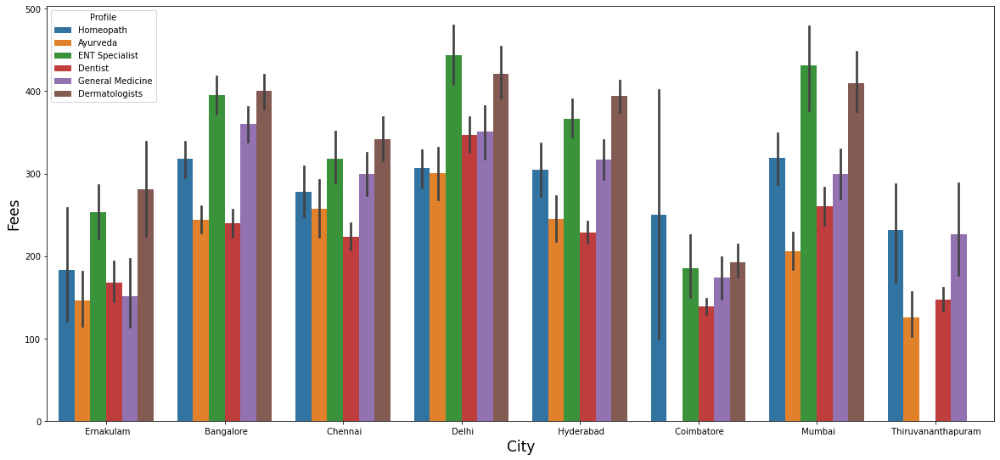

In [36]:
plt.figure(figsize=(20,9))
sns.barplot(x="city",y="Fees",hue="Profile",data=df_train)
plt.xlabel("City",fontsize=17)
plt.ylabel("Fees",fontsize=17)
plt.show()

1. Dermatologists fee is high in 4 cities.(Ernakulam,Bangalore,Chennai,Hyderabad)
2. Homeopath doctor's fee is high in Coimbatore compared to other doctors.
3. ENT specialist doctor's consultation fee is high in Delhi and Mumbai compared to other doctors.
4. Ayurveda and Dentist doctor's fee is almost similar in Bangalore and Hyderabad.
5. Dermatologists and ENT specialist doctor's fee is almost similar in every cities.

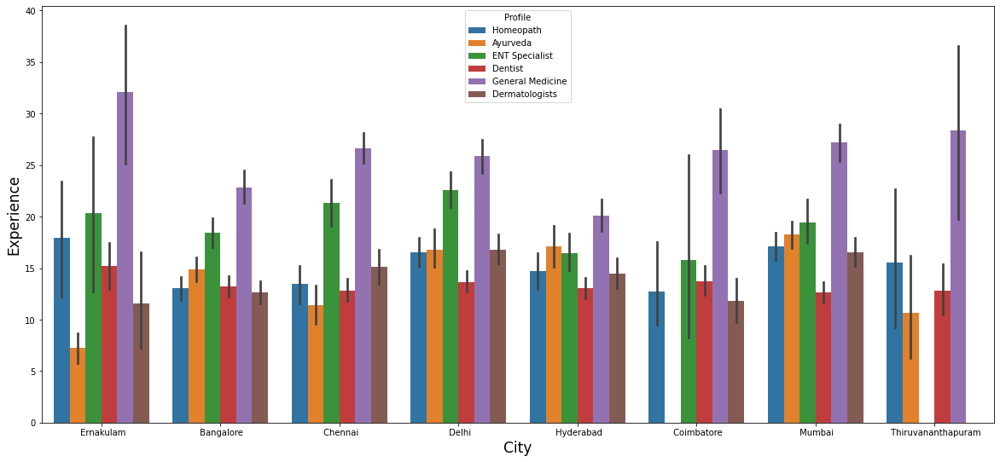

In [37]:
plt.figure(figsize=(20,9))
sns.barplot(x="city",y="Experience",hue="Profile",data=df_train)
plt.xlabel("City",fontsize=17)
plt.ylabel("Experience",fontsize=17)
plt.show()

1. General medicine doctor's experience is maximam in every cities.
2. ENT specialist doctors's experience is at second place in every cities except Hyderabad and Thiruvananthapuram.

In [38]:
df_train.describe()

,Experience,Rating,Fees
count,5960.000000,5960.000000,5960.000000
mean,17.305034,42.224329,307.954362
std,11.143434,47.341747,190.934916
min,0.000000,0.000000,5.000000
25%,9.000000,0.000000,150.000000
50%,14.000000,0.000000,300.000000
75%,23.000000,96.000000,500.000000
max,66.000000,100.000000,950.000000


1. There is large difference between 75% of the data and maximum data in Experience and Fees columns. it depicts that outliers present in our data and need to remove.
2. Doctor's maximum experience is 66 years.
3. Doctor's minimum consultation fee is 5 Rs. and maximum is 950 Rs.

## Handling Outliers

In [39]:
#split numerical and categorical columns.
numerical_col = df_train.drop(["Profile","Qual_1","Qual_2","city"],axis=1)
numerical_col = numerical_col.reset_index()
cate_col = df_train.drop(["Experience","Rating","Fees"],axis=1)
cate_col = cate_col.reset_index()

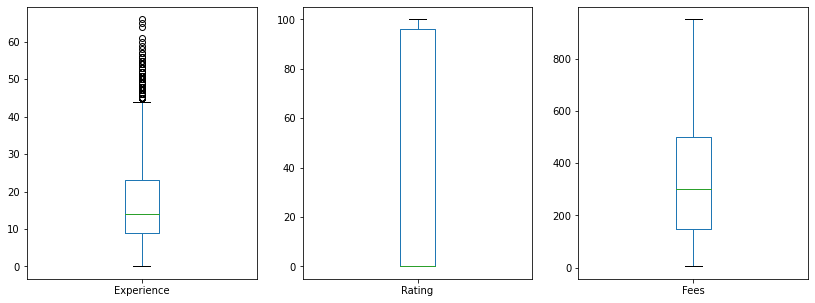

In [40]:
df_train.plot.box(subplots=True,figsize=(14,5))
plt.show()

Experience column have many outliers and need to remove outliers.

In [41]:
# Check and remove outliers using zscore
from scipy.stats import zscore
z = np.abs(zscore(numerical_col))
threshold = 3
print(np.where(z>3))

(array([ 105,  110,  183,  275,  293,  325,  372,  901,  987, 1009, 1111,
       1314, 1631, 1860, 1981, 2023, 2062, 2165, 2201, 2251, 2261, 2280,
       2392, 2427, 2521, 2622, 2630, 2707, 3179, 3364, 3477, 3492, 3607,
       3941, 3959, 4039, 4166, 4211, 4256, 4343, 4580, 4729, 4762, 4774,
       4834, 5194, 5249, 5264, 5276, 5310, 5409, 5421, 5586, 5636, 5663,
       5719, 5806, 5941], dtype=int64), array([1, 1, 1, 3, 3, 1, 1, 1, 3, 1, 1, 3, 3, 1, 1, 1, 1, 3, 1, 3, 1, 1,
       3, 3, 3, 3, 1, 3, 1, 3, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 3, 3, 1, 1,
       3, 3, 3, 1, 1, 3, 1, 1, 1, 1, 1, 1, 1, 1], dtype=int64))


In [42]:
df_train1 = numerical_col[(z<3).all(axis=1)]
df_train1.head()

,index,Experience,Rating,Fees
0,0,24,100.0,100
1,1,12,98.0,350
2,2,9,0.0,300
3,3,12,0.0,250
4,4,20,100.0,250


In [43]:
print(df_train.shape)
print(df_train1.shape)

(5960, 7)
(5902, 4)


In [44]:
percentage_loss = ((5960-5902)/5960)*100
percentage_loss

0.9731543624161074

Percentage loss is very low in our data. so, we use zscore method for removing outliers.

## Preparing data for model training

In [45]:
#remove rows from categorical columns which is already remove from numerical columns.
cate_col = cate_col.drop([105,  110,  183,  275,  293,  325,  372,  901,  987, 1009, 1111,
       1314, 1631, 1860, 1981, 2023, 2062, 2165, 2201, 2251, 2261, 2280,
       2392, 2427, 2521, 2622, 2630, 2707, 3179, 3364, 3477, 3492, 3607,
       3941, 3959, 4039, 4166, 4211, 4256, 4343, 4580, 4729, 4762, 4774,
       4834, 5194, 5249, 5264, 5276, 5310, 5409, 5421, 5586, 5636, 5663,
       5719, 5806, 5941],axis=0)

In [46]:
#mearge numerical and categorical columns.
df_train_new=pd.concat([df_train1,cate_col],axis=1)
df_train_new.head()

,index,Experience,Rating,Fees,index,Profile,Qual_1,Qual_2,city
0,0,24,100.0,100,0,Homeopath,BHMS,MD,Ernakulam
1,1,12,98.0,350,1,Ayurveda,BAMS,MD,Bangalore
2,2,9,0.0,300,2,ENT Specialist,MBBS,MS,Bangalore
3,3,12,0.0,250,3,Ayurveda,BSc - Zoology,BAMS,Bangalore
4,4,20,100.0,250,4,Ayurveda,BAMS,unknown,Chennai


In [47]:
#remove index
df_train_new = df_train_new.drop(["index"],axis=1)

In [48]:
# Our target variable is fees.so, it is regression type of problem and take fees as a y variable.
x = df_train_new.drop(["Fees"],axis=1)
y = df_train_new["Fees"]

In [49]:
print(x.shape)
print(y.shape)

(5902, 6)
(5902,)


## Handling skewness

In [50]:
df_train_new.skew()

Experience    0.897401
Rating        0.240664
Fees          0.710253
dtype: float64

From the above observation, we dont need to remove skewness because skewness is low in each atributes.

## Encoding data

In [51]:
# Convert categorical data into numerical data
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
x["Qual_1"] = le.fit_transform(x["Qual_1"])
x["Qual_2"] = le.fit_transform(x["Qual_2"])
x = pd.get_dummies(x,drop_first=True) 

df_test["Qual_1"] = le.fit_transform(df_test["Qual_1"])
df_test["Qual_2"] = le.fit_transform(df_test["Qual_2"])
df_test = pd.get_dummies(df_test,drop_first=True) 

In [52]:
x.head()

,Experience,Rating,Qual_1,Qual_2,Profile_Dentist,Profile_Dermatologists,Profile_ENT Specialist,Profile_General Medicine,Profile_Homeopath,city_ Chennai,city_ Coimbatore,city_ Delhi,city_ Ernakulam,city_ Hyderabad,city_ Mumbai,city_ Thiruvananthapuram
0,24,100.0,8,206,0,0,0,0,1,0,0,0,1,0,0,0
1,12,98.0,5,206,0,0,0,0,0,0,0,0,0,0,0,0
2,9,0.0,78,223,0,0,1,0,0,0,0,0,0,0,0,0
3,12,0.0,12,7,0,0,0,0,0,0,0,0,0,0,0,0
4,20,100.0,5,301,0,0,0,0,0,1,0,0,0,0,0,0


## Scaling

In [53]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_t = sc.fit_transform(x)
x_test_data= sc.fit_transform(df_test) 

In [54]:
#split train and test data
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x_t,y,test_size=0.20,random_state=0)

## Find Best Model

In [55]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score,mean_squared_error

model = [LinearRegression(),SVR(),KNeighborsRegressor(),DecisionTreeRegressor()]

for i in model:
    i.fit(x_train,y_train)
    train=i.score(x_train,y_train)
    predi=i.predict(x_test)
    print("Accuracy of",i,"is:")
    print("Model training accuracy:",train)
    print("r2 score:",r2_score(y_test,predi))
    print("mean squared error:",mean_squared_error(y_test,predi))
    print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predi)))
    print("******************************************************************")
    print("\n")

Accuracy of LinearRegression() is:
Model training accuracy: 0.17169367234871835
r2 score: 0.16665265161682352
mean squared error: 29859.62009060248
root mean squared error: 172.79936368691432
******************************************************************


Accuracy of SVR() is:
Model training accuracy: 0.11036474400783969
r2 score: 0.08018597749911582
mean squared error: 32957.80243276976
root mean squared error: 181.54283911179135
******************************************************************


Accuracy of KNeighborsRegressor() is:
Model training accuracy: 0.3714599659384019
r2 score: 0.06103237465336031
mean squared error: 33644.094055884845
root mean squared error: 183.42326476182035
******************************************************************


Accuracy of DecisionTreeRegressor() is:
Model training accuracy: 0.8762771204592644
r2 score: -0.4791473773461108
mean squared error: 52999.243150237795
root mean squared error: 230.21564488591517
******************************

## Lasso and Ridge Regression

In [56]:
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

In [57]:
ls = Lasso()
parameters = {'alpha':[0.001,0.01,0.1,0.2,1.0],'max_iter':[200,500,1000],'random_state':list(range(0,20))}
reg = GridSearchCV(ls,parameters)
reg.fit(x_train,y_train)
print(reg.best_params_)

{'alpha': 0.2, 'max_iter': 200, 'random_state': 0}


In [58]:
ls = Lasso(alpha=0.2,max_iter=200,random_state=0)
ls.fit(x_train,y_train)
train = ls.score(x_train,y_train)
predls = ls.predict(x_test)
print("Model training accuracy:",train)
print("r2 score:",r2_score(y_test,predls))
print("mean squared error:",mean_squared_error(y_test,predls))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predls)))

Model training accuracy: 0.17165865387753942
r2 score: 0.16694219464692306
mean squared error: 29849.245491228725
root mean squared error: 172.76934187299761


In [59]:
rd = Ridge()
parameters={'alpha':[0.001,0.01,0.1,0.2,0.3,1.0],'max_iter':[200,400,600,800,1000],'solver':['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag', 'saga'],'random_state':list(range(0,20))}
reg = GridSearchCV(rd,parameters)
reg.fit(x_train,y_train)
print(reg.best_params_)

{'alpha': 0.3, 'max_iter': 200, 'random_state': 1, 'solver': 'sag'}


In [60]:
rd = Ridge(alpha=0.3,max_iter=200,random_state=1,solver='sag')
rd.fit(x_train,y_train)
train = rd.score(x_train,y_train)
predrd = rd.predict(x_test)
print("Model training accuracy:",train)
print("r2 score:",r2_score(y_test,predrd))
print("mean squared error:",mean_squared_error(y_test,predrd))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predrd)))

Model training accuracy: 0.1716935233378012
r2 score: 0.16667412887981714
mean squared error: 29858.850540048534
root mean squared error: 172.79713695558885


## Bagging and Boosting method

In [61]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

model = [RandomForestRegressor(),AdaBoostRegressor(),GradientBoostingRegressor(),ExtraTreesRegressor(),XGBRegressor(),CatBoostRegressor()]

for m in model:
    m.fit(x_train,y_train)
    train = m.score(x_train,y_train)
    predm = m.predict(x_test)
    print("Accuracy of",m,"is:")
    print("Model training accuracy:",train)
    print("r2 score:",r2_score(y_test,predm))
    print("mean squared error:",mean_squared_error(y_test,predm))
    print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predm)))
    print("******************************************************************")
    print("\n")

Accuracy of RandomForestRegressor() is:
Model training accuracy: 0.7803421703306627
r2 score: 0.04879600377372184
mean squared error: 34082.53474506757
root mean squared error: 184.61455724039632
******************************************************************


Accuracy of AdaBoostRegressor() is:
Model training accuracy: 0.13098912609484026
r2 score: 0.1471642264834181
mean squared error: 30557.908711519845
root mean squared error: 174.80820550397468
******************************************************************


Accuracy of GradientBoostingRegressor() is:
Model training accuracy: 0.26336593028067434
r2 score: 0.19406599249991507
mean squared error: 28877.374277051364
root mean squared error: 169.93344072621895
******************************************************************


Accuracy of ExtraTreesRegressor() is:
Model training accuracy: 0.8760627449122175
r2 score: -0.14882639565772582
mean squared error: 41163.53137854224
root mean squared error: 202.88797741251759
*******

155:	learn: 159.4440930	total: 655ms	remaining: 3.54s
156:	learn: 159.3858663	total: 660ms	remaining: 3.55s
157:	learn: 159.3468711	total: 664ms	remaining: 3.54s
158:	learn: 159.3073971	total: 667ms	remaining: 3.53s
159:	learn: 159.2854358	total: 670ms	remaining: 3.52s
160:	learn: 159.2370197	total: 673ms	remaining: 3.51s
161:	learn: 159.1887228	total: 677ms	remaining: 3.5s
162:	learn: 159.1274746	total: 680ms	remaining: 3.49s
163:	learn: 159.1090514	total: 684ms	remaining: 3.48s
164:	learn: 159.0507671	total: 687ms	remaining: 3.48s
165:	learn: 159.0224982	total: 690ms	remaining: 3.47s
166:	learn: 159.0009910	total: 693ms	remaining: 3.46s
167:	learn: 158.9524862	total: 696ms	remaining: 3.45s
168:	learn: 158.9248383	total: 699ms	remaining: 3.44s
169:	learn: 158.8343498	total: 702ms	remaining: 3.43s
170:	learn: 158.7669345	total: 705ms	remaining: 3.42s
171:	learn: 158.7378980	total: 708ms	remaining: 3.41s
172:	learn: 158.7003493	total: 711ms	remaining: 3.4s
173:	learn: 158.6779598	total:

360:	learn: 152.9550550	total: 1.29s	remaining: 2.29s
361:	learn: 152.8929901	total: 1.3s	remaining: 2.29s
362:	learn: 152.8771056	total: 1.3s	remaining: 2.29s
363:	learn: 152.8323153	total: 1.31s	remaining: 2.29s
364:	learn: 152.8093993	total: 1.31s	remaining: 2.28s
365:	learn: 152.8066433	total: 1.31s	remaining: 2.28s
366:	learn: 152.7801874	total: 1.32s	remaining: 2.27s
367:	learn: 152.7777530	total: 1.32s	remaining: 2.27s
368:	learn: 152.7106611	total: 1.32s	remaining: 2.26s
369:	learn: 152.6894502	total: 1.33s	remaining: 2.26s
370:	learn: 152.6861284	total: 1.33s	remaining: 2.25s
371:	learn: 152.6746983	total: 1.33s	remaining: 2.25s
372:	learn: 152.6587900	total: 1.33s	remaining: 2.25s
373:	learn: 152.6581616	total: 1.34s	remaining: 2.24s
374:	learn: 152.6184396	total: 1.34s	remaining: 2.23s
375:	learn: 152.5604933	total: 1.34s	remaining: 2.23s
376:	learn: 152.5508880	total: 1.35s	remaining: 2.23s
377:	learn: 152.5284891	total: 1.35s	remaining: 2.22s
378:	learn: 152.4853906	total:

522:	learn: 148.6075476	total: 1.78s	remaining: 1.63s
523:	learn: 148.5916450	total: 1.79s	remaining: 1.62s
524:	learn: 148.5624121	total: 1.79s	remaining: 1.62s
525:	learn: 148.5411787	total: 1.79s	remaining: 1.61s
526:	learn: 148.5106436	total: 1.8s	remaining: 1.61s
527:	learn: 148.4934811	total: 1.8s	remaining: 1.61s
528:	learn: 148.4507828	total: 1.8s	remaining: 1.6s
529:	learn: 148.4211015	total: 1.81s	remaining: 1.6s
530:	learn: 148.4054423	total: 1.81s	remaining: 1.6s
531:	learn: 148.3629749	total: 1.81s	remaining: 1.59s
532:	learn: 148.3179842	total: 1.81s	remaining: 1.59s
533:	learn: 148.3168893	total: 1.82s	remaining: 1.59s
534:	learn: 148.2978179	total: 1.82s	remaining: 1.58s
535:	learn: 148.2756663	total: 1.82s	remaining: 1.58s
536:	learn: 148.2530296	total: 1.83s	remaining: 1.57s
537:	learn: 148.2344944	total: 1.83s	remaining: 1.57s
538:	learn: 148.2185512	total: 1.83s	remaining: 1.57s
539:	learn: 148.1978163	total: 1.84s	remaining: 1.56s
540:	learn: 148.1912410	total: 1.8

684:	learn: 144.8112991	total: 2.27s	remaining: 1.04s
685:	learn: 144.7889078	total: 2.27s	remaining: 1.04s
686:	learn: 144.7672171	total: 2.28s	remaining: 1.04s
687:	learn: 144.7477017	total: 2.28s	remaining: 1.03s
688:	learn: 144.7343348	total: 2.28s	remaining: 1.03s
689:	learn: 144.7234264	total: 2.29s	remaining: 1.03s
690:	learn: 144.7137408	total: 2.29s	remaining: 1.02s
691:	learn: 144.6865144	total: 2.3s	remaining: 1.02s
692:	learn: 144.6697662	total: 2.3s	remaining: 1.02s
693:	learn: 144.6432834	total: 2.3s	remaining: 1.01s
694:	learn: 144.6259246	total: 2.31s	remaining: 1.01s
695:	learn: 144.5983091	total: 2.31s	remaining: 1.01s
696:	learn: 144.5771989	total: 2.31s	remaining: 1s
697:	learn: 144.5708120	total: 2.32s	remaining: 1s
698:	learn: 144.5375786	total: 2.32s	remaining: 999ms
699:	learn: 144.4921758	total: 2.32s	remaining: 996ms
700:	learn: 144.4647149	total: 2.33s	remaining: 992ms
701:	learn: 144.4464392	total: 2.33s	remaining: 989ms
702:	learn: 144.4188422	total: 2.33s	

884:	learn: 140.9986177	total: 2.91s	remaining: 378ms
885:	learn: 140.9812088	total: 2.91s	remaining: 375ms
886:	learn: 140.9494833	total: 2.92s	remaining: 372ms
887:	learn: 140.9295541	total: 2.92s	remaining: 368ms
888:	learn: 140.9093202	total: 2.92s	remaining: 365ms
889:	learn: 140.8699724	total: 2.93s	remaining: 362ms
890:	learn: 140.8478882	total: 2.93s	remaining: 359ms
891:	learn: 140.8242178	total: 2.94s	remaining: 355ms
892:	learn: 140.8023547	total: 2.94s	remaining: 352ms
893:	learn: 140.7792443	total: 2.94s	remaining: 349ms
894:	learn: 140.7398116	total: 2.94s	remaining: 346ms
895:	learn: 140.7155804	total: 2.95s	remaining: 342ms
896:	learn: 140.7046382	total: 2.95s	remaining: 339ms
897:	learn: 140.6879881	total: 2.95s	remaining: 336ms
898:	learn: 140.6621418	total: 2.96s	remaining: 332ms
899:	learn: 140.6368449	total: 2.96s	remaining: 329ms
900:	learn: 140.6075239	total: 2.96s	remaining: 326ms
901:	learn: 140.5912399	total: 2.97s	remaining: 322ms
902:	learn: 140.5446477	tota

## HyperParameter Tuning

In [62]:
rf = RandomForestRegressor()
parameters = {'n_estimators':[50,100,120,150],'max_depth':[2,3,4,5],'max_features':['auto','sqrt','log2'],'ccp_alpha':[0.0,0.001,0.01,0.1]}
reg = GridSearchCV(rf,parameters)
reg.fit(x_train,y_train)
print(reg.best_params_)

{'ccp_alpha': 0.1, 'max_depth': 5, 'max_features': 'auto', 'n_estimators': 100}


In [73]:
rf = RandomForestRegressor(ccp_alpha=0.1,max_depth=5,max_features='auto',n_estimators=100)
rf.fit(x_train,y_train)
train = rf.score(x_train,y_train)
predrf = rf.predict(x_test)
print("Model training accuracy:",train)
print("r2 score:",r2_score(y_test,predrf))
print("mean squared error:",mean_squared_error(y_test,predrf))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predrf)))

Model training accuracy: 0.22460181668562695
r2 score: 0.17537597860541831
mean squared error: 29547.055071573013
root mean squared error: 171.8925684012343


In [64]:
gb = GradientBoostingRegressor()
parameters = {'n_estimators':[50,100,120,150],'criterion':['friedman_mse', 'mse'],'learning_rate':[0.001,0.01,0.1,0.2]}
reg = GridSearchCV(gb,parameters)
reg.fit(x_train,y_train)
print(reg.best_params_)

{'criterion': 'mse', 'learning_rate': 0.1, 'n_estimators': 120}


In [65]:
gb = GradientBoostingRegressor(criterion='mse',n_estimators=120,learning_rate=0.1)
gb.fit(x_train,y_train)
train = gb.score(x_train,y_train)
predgb = gb.predict(x_test)
print("Model training accuracy:",train)
print("r2 score:",r2_score(y_test,predgb))
print("mean squared error:",mean_squared_error(y_test,predgb))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predgb)))

Model training accuracy: 0.2727131695264252
r2 score: 0.1938325543249808
mean squared error: 28885.73858664172
root mean squared error: 169.95804949057788


In [66]:
cb = CatBoostRegressor()
parameters={'learning_rate':[0.01,0.02,0.04,0.06],'iterations':[150,200,500,1000],'depth':[3,4,5,6,7]}
reg = GridSearchCV(cb,parameters)
reg.fit(x_train,y_train)
print(reg.best_params_)

0:	learn: 186.6260384	total: 3.23ms	remaining: 481ms
1:	learn: 186.4208942	total: 6.71ms	remaining: 497ms
2:	learn: 186.2335054	total: 11.6ms	remaining: 566ms
3:	learn: 186.0280338	total: 15.5ms	remaining: 564ms
4:	learn: 185.8472636	total: 19.1ms	remaining: 554ms
5:	learn: 185.6527390	total: 22.7ms	remaining: 545ms
6:	learn: 185.4420120	total: 25.1ms	remaining: 514ms
7:	learn: 185.2637508	total: 26.9ms	remaining: 477ms
8:	learn: 185.0880655	total: 28.7ms	remaining: 450ms
9:	learn: 184.9073833	total: 30.3ms	remaining: 424ms
10:	learn: 184.7049464	total: 31.8ms	remaining: 402ms
11:	learn: 184.5276189	total: 33.4ms	remaining: 384ms
12:	learn: 184.3551794	total: 34.9ms	remaining: 368ms
13:	learn: 184.1817785	total: 36.4ms	remaining: 354ms
14:	learn: 184.0118003	total: 38ms	remaining: 342ms
15:	learn: 183.8460092	total: 40.1ms	remaining: 336ms
16:	learn: 183.6771080	total: 41.8ms	remaining: 327ms
17:	learn: 183.4990885	total: 43.3ms	remaining: 318ms
18:	learn: 183.3216991	total: 45.1ms	rem

89:	learn: 176.4127377	total: 151ms	remaining: 101ms
90:	learn: 176.3387398	total: 153ms	remaining: 99.4ms
91:	learn: 176.2666781	total: 155ms	remaining: 97.9ms
92:	learn: 176.2041734	total: 157ms	remaining: 96.2ms
93:	learn: 176.1470829	total: 159ms	remaining: 94.6ms
94:	learn: 176.0755757	total: 160ms	remaining: 92.9ms
95:	learn: 176.0063169	total: 162ms	remaining: 91.2ms
96:	learn: 175.9227332	total: 164ms	remaining: 89.4ms
97:	learn: 175.8597868	total: 165ms	remaining: 87.7ms
98:	learn: 175.7820445	total: 168ms	remaining: 86.6ms
99:	learn: 175.7132694	total: 170ms	remaining: 84.8ms
100:	learn: 175.6504131	total: 171ms	remaining: 83.1ms
101:	learn: 175.5823768	total: 173ms	remaining: 81.3ms
102:	learn: 175.5068570	total: 175ms	remaining: 79.7ms
103:	learn: 175.4435856	total: 176ms	remaining: 77.9ms
104:	learn: 175.3731171	total: 178ms	remaining: 76.1ms
105:	learn: 175.3138678	total: 179ms	remaining: 74.4ms
106:	learn: 175.2599645	total: 181ms	remaining: 72.7ms
107:	learn: 175.192239

0:	learn: 187.4117159	total: 3.18ms	remaining: 474ms
1:	learn: 187.2222300	total: 6.74ms	remaining: 499ms
2:	learn: 187.0009786	total: 10.1ms	remaining: 494ms
3:	learn: 186.8198222	total: 13.5ms	remaining: 492ms
4:	learn: 186.6459439	total: 16.4ms	remaining: 476ms
5:	learn: 186.4599413	total: 19.3ms	remaining: 464ms
6:	learn: 186.2532759	total: 21ms	remaining: 429ms
7:	learn: 186.0732376	total: 22.6ms	remaining: 402ms
8:	learn: 185.8744302	total: 24.6ms	remaining: 386ms
9:	learn: 185.6802790	total: 26.3ms	remaining: 368ms
10:	learn: 185.4769632	total: 27.9ms	remaining: 353ms
11:	learn: 185.2957485	total: 29.6ms	remaining: 340ms
12:	learn: 185.1320276	total: 31.1ms	remaining: 328ms
13:	learn: 184.9512061	total: 32.8ms	remaining: 318ms
14:	learn: 184.7766283	total: 34.3ms	remaining: 309ms
15:	learn: 184.6247508	total: 36ms	remaining: 301ms
16:	learn: 184.4503524	total: 37.6ms	remaining: 294ms
17:	learn: 184.2749149	total: 39.1ms	remaining: 287ms
18:	learn: 184.0904565	total: 40.7ms	remai

98:	learn: 177.1983552	total: 150ms	remaining: 77.2ms
99:	learn: 177.1278079	total: 152ms	remaining: 76ms
100:	learn: 177.0705833	total: 154ms	remaining: 74.6ms
101:	learn: 176.9998240	total: 155ms	remaining: 73.1ms
102:	learn: 176.9338755	total: 157ms	remaining: 71.6ms
103:	learn: 176.8614718	total: 159ms	remaining: 70.1ms
104:	learn: 176.7977532	total: 160ms	remaining: 68.7ms
105:	learn: 176.7308590	total: 162ms	remaining: 67.1ms
106:	learn: 176.6774127	total: 163ms	remaining: 65.7ms
107:	learn: 176.5968635	total: 165ms	remaining: 64.1ms
108:	learn: 176.5328720	total: 167ms	remaining: 62.6ms
109:	learn: 176.4617307	total: 168ms	remaining: 61.1ms
110:	learn: 176.4027162	total: 170ms	remaining: 59.6ms
111:	learn: 176.3505088	total: 171ms	remaining: 58.1ms
112:	learn: 176.2915958	total: 173ms	remaining: 56.6ms
113:	learn: 176.2362134	total: 174ms	remaining: 55ms
114:	learn: 176.1846463	total: 176ms	remaining: 53.5ms
115:	learn: 176.1306324	total: 177ms	remaining: 52ms
116:	learn: 176.07

102:	learn: 170.6950886	total: 159ms	remaining: 72.7ms
103:	learn: 170.6515850	total: 161ms	remaining: 71.4ms
104:	learn: 170.6019171	total: 163ms	remaining: 69.9ms
105:	learn: 170.5274240	total: 165ms	remaining: 68.3ms
106:	learn: 170.4924352	total: 166ms	remaining: 66.8ms
107:	learn: 170.4530498	total: 168ms	remaining: 65.2ms
108:	learn: 170.4143850	total: 169ms	remaining: 63.7ms
109:	learn: 170.3862717	total: 171ms	remaining: 62.1ms
110:	learn: 170.3491015	total: 172ms	remaining: 60.6ms
111:	learn: 170.3010873	total: 174ms	remaining: 59ms
112:	learn: 170.2545682	total: 176ms	remaining: 57.6ms
113:	learn: 170.1892456	total: 177ms	remaining: 56ms
114:	learn: 170.1462609	total: 179ms	remaining: 54.5ms
115:	learn: 170.1034515	total: 181ms	remaining: 53ms
116:	learn: 170.0610903	total: 183ms	remaining: 51.5ms
117:	learn: 170.0271730	total: 184ms	remaining: 49.9ms
118:	learn: 169.9766031	total: 185ms	remaining: 48.3ms
119:	learn: 169.9441171	total: 187ms	remaining: 46.7ms
120:	learn: 169.

0:	learn: 187.8614064	total: 1.57ms	remaining: 234ms
1:	learn: 187.5072972	total: 3.25ms	remaining: 241ms
2:	learn: 187.1155179	total: 5ms	remaining: 245ms
3:	learn: 186.8246285	total: 6.57ms	remaining: 240ms
4:	learn: 186.4945902	total: 8.12ms	remaining: 235ms
5:	learn: 186.1335861	total: 9.67ms	remaining: 232ms
6:	learn: 185.7399894	total: 11.2ms	remaining: 229ms
7:	learn: 185.3792005	total: 12.7ms	remaining: 226ms
8:	learn: 185.0330950	total: 14.3ms	remaining: 224ms
9:	learn: 184.6850888	total: 15.8ms	remaining: 222ms
10:	learn: 184.3366799	total: 17.4ms	remaining: 219ms
11:	learn: 184.0217484	total: 18.9ms	remaining: 217ms
12:	learn: 183.7563293	total: 20.5ms	remaining: 216ms
13:	learn: 183.4440647	total: 22ms	remaining: 214ms
14:	learn: 183.1850498	total: 23.5ms	remaining: 212ms
15:	learn: 182.8937297	total: 25.1ms	remaining: 210ms
16:	learn: 182.6227862	total: 26.6ms	remaining: 208ms
17:	learn: 182.3350937	total: 28.2ms	remaining: 207ms
18:	learn: 182.0498986	total: 29.7ms	remain

85:	learn: 172.1414643	total: 141ms	remaining: 105ms
86:	learn: 172.0719207	total: 144ms	remaining: 104ms
87:	learn: 171.9956739	total: 145ms	remaining: 102ms
88:	learn: 171.9332904	total: 147ms	remaining: 101ms
89:	learn: 171.8732755	total: 149ms	remaining: 99.2ms
90:	learn: 171.8240120	total: 150ms	remaining: 97.5ms
91:	learn: 171.7622682	total: 152ms	remaining: 95.8ms
92:	learn: 171.7006540	total: 154ms	remaining: 94.1ms
93:	learn: 171.6452185	total: 155ms	remaining: 92.6ms
94:	learn: 171.5779565	total: 157ms	remaining: 91ms
95:	learn: 171.5242726	total: 159ms	remaining: 89.4ms
96:	learn: 171.4724752	total: 161ms	remaining: 87.9ms
97:	learn: 171.4150605	total: 162ms	remaining: 86.2ms
98:	learn: 171.3492047	total: 164ms	remaining: 84.6ms
99:	learn: 171.2964617	total: 166ms	remaining: 82.9ms
100:	learn: 171.2483103	total: 168ms	remaining: 81.3ms
101:	learn: 171.1863058	total: 169ms	remaining: 79.6ms
102:	learn: 171.1294639	total: 171ms	remaining: 77.9ms
103:	learn: 171.0855479	total: 

0:	learn: 186.0878820	total: 1.9ms	remaining: 283ms
1:	learn: 185.3059924	total: 3.45ms	remaining: 255ms
2:	learn: 184.6270390	total: 5.17ms	remaining: 253ms
3:	learn: 183.8945359	total: 6.91ms	remaining: 252ms
4:	learn: 183.3021865	total: 8.41ms	remaining: 244ms
5:	learn: 182.6757567	total: 10.1ms	remaining: 241ms
6:	learn: 181.9989624	total: 11.8ms	remaining: 241ms
7:	learn: 181.4621892	total: 13.3ms	remaining: 237ms
8:	learn: 180.9719072	total: 14.8ms	remaining: 232ms
9:	learn: 180.4595752	total: 16.4ms	remaining: 230ms
10:	learn: 179.9227150	total: 18ms	remaining: 227ms
11:	learn: 179.5164092	total: 19.5ms	remaining: 224ms
12:	learn: 179.0667049	total: 21ms	remaining: 221ms
13:	learn: 178.5962657	total: 22.6ms	remaining: 219ms
14:	learn: 178.1285797	total: 24.8ms	remaining: 224ms
15:	learn: 177.7768972	total: 26.6ms	remaining: 223ms
16:	learn: 177.4735983	total: 28.2ms	remaining: 221ms
17:	learn: 177.0440831	total: 29.7ms	remaining: 218ms
18:	learn: 176.6525542	total: 31.3ms	remain

102:	learn: 168.0081147	total: 152ms	remaining: 69.5ms
103:	learn: 167.9661393	total: 154ms	remaining: 68.3ms
104:	learn: 167.9322887	total: 156ms	remaining: 66.8ms
105:	learn: 167.8901920	total: 158ms	remaining: 65.4ms
106:	learn: 167.8434820	total: 159ms	remaining: 64ms
107:	learn: 167.8148213	total: 161ms	remaining: 62.6ms
108:	learn: 167.7882271	total: 162ms	remaining: 61.1ms
109:	learn: 167.7598780	total: 164ms	remaining: 59.6ms
110:	learn: 167.7395775	total: 166ms	remaining: 58.2ms
111:	learn: 167.7062699	total: 167ms	remaining: 56.7ms
112:	learn: 167.6785214	total: 169ms	remaining: 55.2ms
113:	learn: 167.6476545	total: 170ms	remaining: 53.8ms
114:	learn: 167.6208995	total: 172ms	remaining: 52.3ms
115:	learn: 167.5993275	total: 173ms	remaining: 50.8ms
116:	learn: 167.5699945	total: 175ms	remaining: 49.4ms
117:	learn: 167.5448610	total: 177ms	remaining: 47.9ms
118:	learn: 167.5173823	total: 178ms	remaining: 46.4ms
119:	learn: 167.4813069	total: 180ms	remaining: 45ms
120:	learn: 16

0:	learn: 186.8271557	total: 1.56ms	remaining: 232ms
1:	learn: 186.1046426	total: 3.33ms	remaining: 247ms
2:	learn: 185.2805390	total: 4.95ms	remaining: 243ms
3:	learn: 184.4833422	total: 6.58ms	remaining: 240ms
4:	learn: 183.9085828	total: 8.16ms	remaining: 237ms
5:	learn: 183.3522353	total: 9.76ms	remaining: 234ms
6:	learn: 182.6958703	total: 11.3ms	remaining: 231ms
7:	learn: 182.1251374	total: 12.8ms	remaining: 226ms
8:	learn: 181.6542704	total: 14.4ms	remaining: 225ms
9:	learn: 181.0971666	total: 16ms	remaining: 224ms
10:	learn: 180.5598457	total: 17.6ms	remaining: 222ms
11:	learn: 180.0475291	total: 19.2ms	remaining: 221ms
12:	learn: 179.6299137	total: 20.7ms	remaining: 218ms
13:	learn: 179.2064820	total: 22.3ms	remaining: 216ms
14:	learn: 178.7659993	total: 23.8ms	remaining: 214ms
15:	learn: 178.3392495	total: 25.4ms	remaining: 212ms
16:	learn: 177.9924792	total: 27.7ms	remaining: 217ms
17:	learn: 177.6026808	total: 29.4ms	remaining: 215ms
18:	learn: 177.2392363	total: 31ms	remai

98:	learn: 169.2792536	total: 156ms	remaining: 80.3ms
99:	learn: 169.2421116	total: 158ms	remaining: 79ms
100:	learn: 169.1963330	total: 160ms	remaining: 77.6ms
101:	learn: 169.1538352	total: 162ms	remaining: 76.1ms
102:	learn: 169.1141584	total: 163ms	remaining: 74.6ms
103:	learn: 169.0835039	total: 165ms	remaining: 73.1ms
104:	learn: 169.0461621	total: 167ms	remaining: 71.6ms
105:	learn: 169.0145205	total: 169ms	remaining: 70.2ms
106:	learn: 168.9663731	total: 171ms	remaining: 68.8ms
107:	learn: 168.9363065	total: 173ms	remaining: 67.2ms
108:	learn: 168.9111647	total: 174ms	remaining: 65.6ms
109:	learn: 168.8709310	total: 176ms	remaining: 64.1ms
110:	learn: 168.8308312	total: 179ms	remaining: 62.8ms
111:	learn: 168.8145945	total: 181ms	remaining: 61.3ms
112:	learn: 168.7851750	total: 182ms	remaining: 59.7ms
113:	learn: 168.7529383	total: 184ms	remaining: 58ms
114:	learn: 168.7310894	total: 185ms	remaining: 56.4ms
115:	learn: 168.7098168	total: 187ms	remaining: 54.7ms
116:	learn: 168.

0:	learn: 186.3668881	total: 1.59ms	remaining: 237ms
1:	learn: 185.3319377	total: 3.35ms	remaining: 248ms
2:	learn: 184.2895599	total: 5.01ms	remaining: 245ms
3:	learn: 183.3496660	total: 6.63ms	remaining: 242ms
4:	learn: 182.5937270	total: 8.25ms	remaining: 239ms
5:	learn: 181.7436581	total: 9.89ms	remaining: 237ms
6:	learn: 180.8530172	total: 11.5ms	remaining: 235ms
7:	learn: 180.0952052	total: 13ms	remaining: 230ms
8:	learn: 179.5061543	total: 14.5ms	remaining: 228ms
9:	learn: 178.7595705	total: 16.1ms	remaining: 226ms
10:	learn: 178.1365667	total: 17.7ms	remaining: 223ms
11:	learn: 177.4887249	total: 19.2ms	remaining: 221ms
12:	learn: 177.0763443	total: 20.8ms	remaining: 219ms
13:	learn: 176.6226739	total: 22.4ms	remaining: 217ms
14:	learn: 176.1516049	total: 23.9ms	remaining: 215ms
15:	learn: 175.7100858	total: 25.5ms	remaining: 214ms
16:	learn: 175.4125608	total: 27.2ms	remaining: 213ms
17:	learn: 175.0204058	total: 28.8ms	remaining: 211ms
18:	learn: 174.6607434	total: 30.4ms	rem

101:	learn: 168.0256376	total: 152ms	remaining: 71.4ms
102:	learn: 167.9793551	total: 154ms	remaining: 70.1ms
103:	learn: 167.9568049	total: 155ms	remaining: 68.7ms
104:	learn: 167.9305346	total: 157ms	remaining: 67.2ms
105:	learn: 167.8968927	total: 158ms	remaining: 65.7ms
106:	learn: 167.8535255	total: 160ms	remaining: 64.3ms
107:	learn: 167.8088049	total: 161ms	remaining: 62.8ms
108:	learn: 167.7894570	total: 163ms	remaining: 61.3ms
109:	learn: 167.7554901	total: 164ms	remaining: 59.8ms
110:	learn: 167.6810363	total: 166ms	remaining: 58.3ms
111:	learn: 167.6516773	total: 168ms	remaining: 56.9ms
112:	learn: 167.6284157	total: 171ms	remaining: 56ms
113:	learn: 167.6012698	total: 172ms	remaining: 54.5ms
114:	learn: 167.5815644	total: 174ms	remaining: 53ms
115:	learn: 167.5639700	total: 176ms	remaining: 51.5ms
116:	learn: 167.5276322	total: 177ms	remaining: 50ms
117:	learn: 167.5019292	total: 179ms	remaining: 48.5ms
118:	learn: 167.4829011	total: 180ms	remaining: 46.9ms
119:	learn: 167.

0:	learn: 188.1370635	total: 1.55ms	remaining: 231ms
1:	learn: 186.9004377	total: 3ms	remaining: 222ms
2:	learn: 185.7563403	total: 4.48ms	remaining: 219ms
3:	learn: 184.8876369	total: 5.91ms	remaining: 216ms
4:	learn: 184.1048026	total: 7.33ms	remaining: 212ms
5:	learn: 183.2416278	total: 8.76ms	remaining: 210ms
6:	learn: 182.4241301	total: 10.2ms	remaining: 208ms
7:	learn: 181.6148969	total: 11.6ms	remaining: 206ms
8:	learn: 180.9356000	total: 13.2ms	remaining: 207ms
9:	learn: 180.2238664	total: 14.7ms	remaining: 206ms
10:	learn: 179.6469568	total: 16.3ms	remaining: 206ms
11:	learn: 179.0583702	total: 17.9ms	remaining: 206ms
12:	learn: 178.6068176	total: 19.4ms	remaining: 205ms
13:	learn: 178.0865956	total: 21ms	remaining: 204ms
14:	learn: 177.6180231	total: 22.6ms	remaining: 203ms
15:	learn: 177.1473510	total: 24.1ms	remaining: 202ms
16:	learn: 176.7642304	total: 25.7ms	remaining: 201ms
17:	learn: 176.3901085	total: 27.3ms	remaining: 200ms
18:	learn: 176.0054832	total: 28.8ms	remain

107:	learn: 174.5627145	total: 161ms	remaining: 137ms
108:	learn: 174.5037268	total: 163ms	remaining: 136ms
109:	learn: 174.4485172	total: 165ms	remaining: 135ms
110:	learn: 174.4008096	total: 166ms	remaining: 133ms
111:	learn: 174.3512712	total: 168ms	remaining: 132ms
112:	learn: 174.2970308	total: 169ms	remaining: 130ms
113:	learn: 174.2316877	total: 171ms	remaining: 129ms
114:	learn: 174.1793917	total: 173ms	remaining: 128ms
115:	learn: 174.1314210	total: 174ms	remaining: 126ms
116:	learn: 174.0761762	total: 176ms	remaining: 125ms
117:	learn: 174.0231320	total: 178ms	remaining: 124ms
118:	learn: 173.9637110	total: 180ms	remaining: 122ms
119:	learn: 173.9213984	total: 181ms	remaining: 121ms
120:	learn: 173.8561948	total: 183ms	remaining: 119ms
121:	learn: 173.8090980	total: 185ms	remaining: 118ms
122:	learn: 173.7630318	total: 186ms	remaining: 117ms
123:	learn: 173.7208003	total: 188ms	remaining: 115ms
124:	learn: 173.6740973	total: 190ms	remaining: 114ms
125:	learn: 173.6120323	tota

79:	learn: 177.1333032	total: 138ms	remaining: 207ms
80:	learn: 177.0756628	total: 140ms	remaining: 206ms
81:	learn: 176.9987314	total: 142ms	remaining: 204ms
82:	learn: 176.9257250	total: 144ms	remaining: 202ms
83:	learn: 176.8547982	total: 145ms	remaining: 201ms
84:	learn: 176.7763412	total: 147ms	remaining: 199ms
85:	learn: 176.6988534	total: 149ms	remaining: 197ms
86:	learn: 176.6257148	total: 151ms	remaining: 196ms
87:	learn: 176.5536947	total: 153ms	remaining: 194ms
88:	learn: 176.4794424	total: 154ms	remaining: 192ms
89:	learn: 176.4127377	total: 156ms	remaining: 191ms
90:	learn: 176.3387398	total: 158ms	remaining: 189ms
91:	learn: 176.2666781	total: 159ms	remaining: 187ms
92:	learn: 176.2041734	total: 161ms	remaining: 185ms
93:	learn: 176.1470829	total: 163ms	remaining: 183ms
94:	learn: 176.0755757	total: 164ms	remaining: 182ms
95:	learn: 176.0063169	total: 166ms	remaining: 180ms
96:	learn: 175.9227332	total: 168ms	remaining: 179ms
97:	learn: 175.8597868	total: 170ms	remaining:

102:	learn: 176.5418501	total: 156ms	remaining: 147ms
103:	learn: 176.4898421	total: 158ms	remaining: 146ms
104:	learn: 176.4354473	total: 160ms	remaining: 145ms
105:	learn: 176.3778473	total: 162ms	remaining: 144ms
106:	learn: 176.3288485	total: 164ms	remaining: 142ms
107:	learn: 176.2607713	total: 166ms	remaining: 141ms
108:	learn: 176.1995919	total: 168ms	remaining: 140ms
109:	learn: 176.1458238	total: 169ms	remaining: 139ms
110:	learn: 176.0997816	total: 171ms	remaining: 137ms
111:	learn: 176.0505915	total: 173ms	remaining: 136ms
112:	learn: 175.9985339	total: 175ms	remaining: 135ms
113:	learn: 175.9464988	total: 177ms	remaining: 134ms
114:	learn: 175.9006646	total: 179ms	remaining: 132ms
115:	learn: 175.8497421	total: 181ms	remaining: 131ms
116:	learn: 175.7958392	total: 182ms	remaining: 129ms
117:	learn: 175.7518454	total: 184ms	remaining: 128ms
118:	learn: 175.7074151	total: 186ms	remaining: 126ms
119:	learn: 175.6597649	total: 187ms	remaining: 125ms
120:	learn: 175.5951588	tota

97:	learn: 175.7493574	total: 146ms	remaining: 152ms
98:	learn: 175.6683678	total: 148ms	remaining: 151ms
99:	learn: 175.5979485	total: 150ms	remaining: 150ms
100:	learn: 175.5446528	total: 152ms	remaining: 149ms
101:	learn: 175.4737631	total: 154ms	remaining: 148ms
102:	learn: 175.4034114	total: 155ms	remaining: 146ms
103:	learn: 175.3367631	total: 157ms	remaining: 145ms
104:	learn: 175.2739466	total: 158ms	remaining: 143ms
105:	learn: 175.1991589	total: 160ms	remaining: 142ms
106:	learn: 175.1446085	total: 162ms	remaining: 140ms
107:	learn: 175.0717625	total: 163ms	remaining: 139ms
108:	learn: 175.0058168	total: 165ms	remaining: 138ms
109:	learn: 174.9495175	total: 167ms	remaining: 137ms
110:	learn: 174.8873304	total: 169ms	remaining: 135ms
111:	learn: 174.8318689	total: 170ms	remaining: 134ms
112:	learn: 174.7748342	total: 172ms	remaining: 132ms
113:	learn: 174.7160024	total: 173ms	remaining: 131ms
114:	learn: 174.6613517	total: 175ms	remaining: 130ms
115:	learn: 174.6140466	total: 

102:	learn: 176.9338755	total: 156ms	remaining: 147ms
103:	learn: 176.8614718	total: 158ms	remaining: 146ms
104:	learn: 176.7977532	total: 160ms	remaining: 145ms
105:	learn: 176.7308590	total: 162ms	remaining: 144ms
106:	learn: 176.6774127	total: 164ms	remaining: 142ms
107:	learn: 176.5968635	total: 165ms	remaining: 141ms
108:	learn: 176.5328720	total: 168ms	remaining: 140ms
109:	learn: 176.4617307	total: 171ms	remaining: 140ms
110:	learn: 176.4027162	total: 174ms	remaining: 140ms
111:	learn: 176.3505088	total: 176ms	remaining: 138ms
112:	learn: 176.2915958	total: 178ms	remaining: 137ms
113:	learn: 176.2362134	total: 179ms	remaining: 135ms
114:	learn: 176.1846463	total: 181ms	remaining: 134ms
115:	learn: 176.1306324	total: 183ms	remaining: 132ms
116:	learn: 176.0761144	total: 184ms	remaining: 131ms
117:	learn: 176.0240987	total: 186ms	remaining: 129ms
118:	learn: 175.9679904	total: 187ms	remaining: 128ms
119:	learn: 175.9182216	total: 189ms	remaining: 126ms
120:	learn: 175.8478341	tota

93:	learn: 171.2257228	total: 148ms	remaining: 167ms
94:	learn: 171.1340051	total: 151ms	remaining: 166ms
95:	learn: 171.0813323	total: 152ms	remaining: 165ms
96:	learn: 171.0267295	total: 154ms	remaining: 163ms
97:	learn: 170.9784775	total: 156ms	remaining: 162ms
98:	learn: 170.8909911	total: 157ms	remaining: 161ms
99:	learn: 170.8503017	total: 159ms	remaining: 159ms
100:	learn: 170.8054226	total: 161ms	remaining: 158ms
101:	learn: 170.7518206	total: 163ms	remaining: 157ms
102:	learn: 170.6950886	total: 165ms	remaining: 155ms
103:	learn: 170.6515850	total: 166ms	remaining: 154ms
104:	learn: 170.6019171	total: 168ms	remaining: 152ms
105:	learn: 170.5274240	total: 170ms	remaining: 151ms
106:	learn: 170.4924352	total: 172ms	remaining: 149ms
107:	learn: 170.4530498	total: 174ms	remaining: 148ms
108:	learn: 170.4143850	total: 175ms	remaining: 146ms
109:	learn: 170.3862717	total: 177ms	remaining: 145ms
110:	learn: 170.3491015	total: 178ms	remaining: 143ms
111:	learn: 170.3010873	total: 180m

97:	learn: 171.5691594	total: 159ms	remaining: 166ms
98:	learn: 171.5110991	total: 161ms	remaining: 165ms
99:	learn: 171.4617901	total: 163ms	remaining: 163ms
100:	learn: 171.3975148	total: 165ms	remaining: 161ms
101:	learn: 171.3442187	total: 166ms	remaining: 160ms
102:	learn: 171.2891205	total: 168ms	remaining: 158ms
103:	learn: 171.2438438	total: 170ms	remaining: 157ms
104:	learn: 171.1862356	total: 171ms	remaining: 155ms
105:	learn: 171.1439046	total: 173ms	remaining: 153ms
106:	learn: 171.1004195	total: 174ms	remaining: 151ms
107:	learn: 171.0640912	total: 176ms	remaining: 150ms
108:	learn: 171.0192789	total: 177ms	remaining: 148ms
109:	learn: 170.9630256	total: 179ms	remaining: 146ms
110:	learn: 170.8884114	total: 181ms	remaining: 145ms
111:	learn: 170.8463976	total: 182ms	remaining: 143ms
112:	learn: 170.8061314	total: 184ms	remaining: 142ms
113:	learn: 170.7593864	total: 186ms	remaining: 140ms
114:	learn: 170.7197351	total: 188ms	remaining: 139ms
115:	learn: 170.6746168	total: 

98:	learn: 172.7706808	total: 150ms	remaining: 153ms
99:	learn: 172.7253496	total: 152ms	remaining: 152ms
100:	learn: 172.6675285	total: 154ms	remaining: 151ms
101:	learn: 172.6144991	total: 155ms	remaining: 149ms
102:	learn: 172.5623955	total: 157ms	remaining: 148ms
103:	learn: 172.5196083	total: 158ms	remaining: 146ms
104:	learn: 172.4710681	total: 160ms	remaining: 145ms
105:	learn: 172.4257583	total: 161ms	remaining: 143ms
106:	learn: 172.3853442	total: 163ms	remaining: 142ms
107:	learn: 172.3230356	total: 165ms	remaining: 140ms
108:	learn: 172.2753598	total: 166ms	remaining: 139ms
109:	learn: 172.2392998	total: 168ms	remaining: 137ms
110:	learn: 172.1933666	total: 170ms	remaining: 136ms
111:	learn: 172.1635790	total: 171ms	remaining: 134ms
112:	learn: 172.1204497	total: 173ms	remaining: 133ms
113:	learn: 172.0707005	total: 175ms	remaining: 132ms
114:	learn: 172.0347239	total: 176ms	remaining: 130ms
115:	learn: 171.9960233	total: 178ms	remaining: 129ms
116:	learn: 171.9579662	total:

96:	learn: 171.4724752	total: 149ms	remaining: 158ms
97:	learn: 171.4150605	total: 151ms	remaining: 157ms
98:	learn: 171.3492047	total: 153ms	remaining: 156ms
99:	learn: 171.2964617	total: 154ms	remaining: 154ms
100:	learn: 171.2483103	total: 156ms	remaining: 153ms
101:	learn: 171.1863058	total: 157ms	remaining: 151ms
102:	learn: 171.1294639	total: 159ms	remaining: 150ms
103:	learn: 171.0855479	total: 161ms	remaining: 148ms
104:	learn: 171.0314293	total: 162ms	remaining: 147ms
105:	learn: 170.9591478	total: 164ms	remaining: 145ms
106:	learn: 170.9241462	total: 165ms	remaining: 144ms
107:	learn: 170.8535259	total: 167ms	remaining: 142ms
108:	learn: 170.7928717	total: 169ms	remaining: 141ms
109:	learn: 170.7463980	total: 170ms	remaining: 139ms
110:	learn: 170.6964622	total: 172ms	remaining: 138ms
111:	learn: 170.6507208	total: 173ms	remaining: 136ms
112:	learn: 170.5971613	total: 175ms	remaining: 135ms
113:	learn: 170.5475101	total: 177ms	remaining: 134ms
114:	learn: 170.5011705	total: 1

91:	learn: 173.1000409	total: 149ms	remaining: 175ms
92:	learn: 173.0382894	total: 150ms	remaining: 173ms
93:	learn: 172.9638221	total: 152ms	remaining: 171ms
94:	learn: 172.8827395	total: 153ms	remaining: 170ms
95:	learn: 172.8191949	total: 155ms	remaining: 168ms
96:	learn: 172.7404336	total: 156ms	remaining: 166ms
97:	learn: 172.6990777	total: 158ms	remaining: 165ms
98:	learn: 172.6483853	total: 160ms	remaining: 163ms
99:	learn: 172.5987209	total: 161ms	remaining: 161ms
100:	learn: 172.5447907	total: 163ms	remaining: 160ms
101:	learn: 172.4886773	total: 165ms	remaining: 158ms
102:	learn: 172.4297186	total: 166ms	remaining: 157ms
103:	learn: 172.3791063	total: 168ms	remaining: 155ms
104:	learn: 172.3271524	total: 169ms	remaining: 153ms
105:	learn: 172.2767888	total: 171ms	remaining: 152ms
106:	learn: 172.2335424	total: 173ms	remaining: 150ms
107:	learn: 172.1746843	total: 174ms	remaining: 148ms
108:	learn: 172.1319880	total: 176ms	remaining: 147ms
109:	learn: 172.0691698	total: 177ms	

88:	learn: 167.8028072	total: 149ms	remaining: 185ms
89:	learn: 167.7503158	total: 150ms	remaining: 183ms
90:	learn: 167.7079938	total: 152ms	remaining: 182ms
91:	learn: 167.6469346	total: 153ms	remaining: 180ms
92:	learn: 167.5941942	total: 155ms	remaining: 178ms
93:	learn: 167.5324268	total: 156ms	remaining: 176ms
94:	learn: 167.4895548	total: 158ms	remaining: 174ms
95:	learn: 167.4095999	total: 159ms	remaining: 173ms
96:	learn: 167.3537987	total: 161ms	remaining: 171ms
97:	learn: 167.3212990	total: 162ms	remaining: 169ms
98:	learn: 167.2425087	total: 164ms	remaining: 167ms
99:	learn: 167.2132767	total: 166ms	remaining: 166ms
100:	learn: 167.1700146	total: 167ms	remaining: 164ms
101:	learn: 167.1291523	total: 169ms	remaining: 162ms
102:	learn: 167.0768248	total: 170ms	remaining: 160ms
103:	learn: 167.0288838	total: 172ms	remaining: 159ms
104:	learn: 166.9925958	total: 174ms	remaining: 158ms
105:	learn: 166.9373876	total: 176ms	remaining: 156ms
106:	learn: 166.9096549	total: 177ms	rem

105:	learn: 167.8901920	total: 160ms	remaining: 142ms
106:	learn: 167.8434820	total: 162ms	remaining: 141ms
107:	learn: 167.8148213	total: 164ms	remaining: 139ms
108:	learn: 167.7882271	total: 165ms	remaining: 138ms
109:	learn: 167.7598780	total: 167ms	remaining: 137ms
110:	learn: 167.7395775	total: 169ms	remaining: 135ms
111:	learn: 167.7062699	total: 170ms	remaining: 134ms
112:	learn: 167.6785214	total: 172ms	remaining: 132ms
113:	learn: 167.6476545	total: 173ms	remaining: 131ms
114:	learn: 167.6208995	total: 175ms	remaining: 129ms
115:	learn: 167.5993275	total: 176ms	remaining: 128ms
116:	learn: 167.5699945	total: 178ms	remaining: 126ms
117:	learn: 167.5448610	total: 180ms	remaining: 125ms
118:	learn: 167.5173823	total: 181ms	remaining: 123ms
119:	learn: 167.4813069	total: 183ms	remaining: 122ms
120:	learn: 167.4451593	total: 184ms	remaining: 120ms
121:	learn: 167.4139246	total: 186ms	remaining: 119ms
122:	learn: 167.3826600	total: 187ms	remaining: 117ms
123:	learn: 167.3493743	tota

100:	learn: 169.6207895	total: 159ms	remaining: 155ms
101:	learn: 169.5852664	total: 161ms	remaining: 154ms
102:	learn: 169.5509163	total: 162ms	remaining: 153ms
103:	learn: 169.5129943	total: 164ms	remaining: 151ms
104:	learn: 169.4783816	total: 165ms	remaining: 150ms
105:	learn: 169.4470134	total: 167ms	remaining: 148ms
106:	learn: 169.4046818	total: 169ms	remaining: 147ms
107:	learn: 169.3595170	total: 170ms	remaining: 145ms
108:	learn: 169.3344484	total: 172ms	remaining: 144ms
109:	learn: 169.2951976	total: 174ms	remaining: 142ms
110:	learn: 169.2254931	total: 176ms	remaining: 141ms
111:	learn: 169.1962262	total: 178ms	remaining: 140ms
112:	learn: 169.1731553	total: 179ms	remaining: 138ms
113:	learn: 169.1508091	total: 181ms	remaining: 137ms
114:	learn: 169.1280978	total: 183ms	remaining: 135ms
115:	learn: 169.0968072	total: 184ms	remaining: 134ms
116:	learn: 169.0710284	total: 186ms	remaining: 132ms
117:	learn: 169.0438614	total: 188ms	remaining: 130ms
118:	learn: 169.0166913	tota

100:	learn: 167.8913978	total: 150ms	remaining: 147ms
101:	learn: 167.8531197	total: 152ms	remaining: 146ms
102:	learn: 167.8137761	total: 154ms	remaining: 145ms
103:	learn: 167.7708187	total: 155ms	remaining: 143ms
104:	learn: 167.7381283	total: 157ms	remaining: 142ms
105:	learn: 167.6829203	total: 158ms	remaining: 140ms
106:	learn: 167.6362411	total: 160ms	remaining: 139ms
107:	learn: 167.6081162	total: 162ms	remaining: 138ms
108:	learn: 167.5806333	total: 163ms	remaining: 136ms
109:	learn: 167.5469220	total: 165ms	remaining: 135ms
110:	learn: 167.5059992	total: 166ms	remaining: 133ms
111:	learn: 167.4641230	total: 168ms	remaining: 132ms
112:	learn: 167.4343650	total: 170ms	remaining: 131ms
113:	learn: 167.3826555	total: 171ms	remaining: 129ms
114:	learn: 167.3608393	total: 173ms	remaining: 128ms
115:	learn: 167.3242457	total: 174ms	remaining: 126ms
116:	learn: 167.2992216	total: 176ms	remaining: 125ms
117:	learn: 167.2741292	total: 177ms	remaining: 123ms
118:	learn: 167.2449975	tota

70:	learn: 170.7692258	total: 145ms	remaining: 264ms
71:	learn: 170.6919718	total: 147ms	remaining: 262ms
72:	learn: 170.5964001	total: 149ms	remaining: 260ms
73:	learn: 170.5261142	total: 152ms	remaining: 258ms
74:	learn: 170.4653034	total: 153ms	remaining: 255ms
75:	learn: 170.3983561	total: 155ms	remaining: 252ms
76:	learn: 170.3440667	total: 156ms	remaining: 250ms
77:	learn: 170.2826155	total: 158ms	remaining: 247ms
78:	learn: 170.2240047	total: 159ms	remaining: 244ms
79:	learn: 170.1749433	total: 161ms	remaining: 242ms
80:	learn: 170.1386488	total: 163ms	remaining: 239ms
81:	learn: 170.0965223	total: 165ms	remaining: 237ms
82:	learn: 170.0521079	total: 166ms	remaining: 234ms
83:	learn: 169.9927777	total: 168ms	remaining: 232ms
84:	learn: 169.9482850	total: 169ms	remaining: 229ms
85:	learn: 169.8835842	total: 171ms	remaining: 226ms
86:	learn: 169.8423390	total: 172ms	remaining: 224ms
87:	learn: 169.7853531	total: 174ms	remaining: 221ms
88:	learn: 169.7411202	total: 175ms	remaining:

90:	learn: 165.9035703	total: 152ms	remaining: 182ms
91:	learn: 165.8632918	total: 154ms	remaining: 180ms
92:	learn: 165.8152580	total: 155ms	remaining: 179ms
93:	learn: 165.7642562	total: 157ms	remaining: 177ms
94:	learn: 165.6772845	total: 158ms	remaining: 175ms
95:	learn: 165.6319403	total: 160ms	remaining: 173ms
96:	learn: 165.5767009	total: 162ms	remaining: 172ms
97:	learn: 165.5526892	total: 164ms	remaining: 170ms
98:	learn: 165.4737343	total: 165ms	remaining: 169ms
99:	learn: 165.4607984	total: 167ms	remaining: 167ms
100:	learn: 165.4244457	total: 168ms	remaining: 165ms
101:	learn: 165.3752655	total: 170ms	remaining: 163ms
102:	learn: 165.3200488	total: 172ms	remaining: 162ms
103:	learn: 165.3065796	total: 174ms	remaining: 160ms
104:	learn: 165.2766898	total: 176ms	remaining: 159ms
105:	learn: 165.2387899	total: 177ms	remaining: 157ms
106:	learn: 165.2142573	total: 179ms	remaining: 156ms
107:	learn: 165.1788311	total: 181ms	remaining: 154ms
108:	learn: 165.1398365	total: 182ms	r

83:	learn: 167.0296649	total: 141ms	remaining: 195ms
84:	learn: 166.9911108	total: 143ms	remaining: 194ms
85:	learn: 166.9501957	total: 145ms	remaining: 193ms
86:	learn: 166.9040675	total: 147ms	remaining: 191ms
87:	learn: 166.8558039	total: 149ms	remaining: 190ms
88:	learn: 166.8269260	total: 151ms	remaining: 188ms
89:	learn: 166.7997686	total: 153ms	remaining: 187ms
90:	learn: 166.7786331	total: 155ms	remaining: 185ms
91:	learn: 166.7463155	total: 156ms	remaining: 183ms
92:	learn: 166.7265091	total: 158ms	remaining: 182ms
93:	learn: 166.6819020	total: 160ms	remaining: 180ms
94:	learn: 166.5978710	total: 162ms	remaining: 179ms
95:	learn: 166.5219601	total: 163ms	remaining: 177ms
96:	learn: 166.4863381	total: 165ms	remaining: 175ms
97:	learn: 166.4518536	total: 167ms	remaining: 174ms
98:	learn: 166.4199789	total: 168ms	remaining: 172ms
99:	learn: 166.4031080	total: 170ms	remaining: 170ms
100:	learn: 166.3652485	total: 172ms	remaining: 168ms
101:	learn: 166.3216700	total: 174ms	remainin

84:	learn: 168.6643317	total: 146ms	remaining: 198ms
85:	learn: 168.6321574	total: 148ms	remaining: 196ms
86:	learn: 168.6049655	total: 150ms	remaining: 195ms
87:	learn: 168.5731939	total: 151ms	remaining: 193ms
88:	learn: 168.5314624	total: 153ms	remaining: 191ms
89:	learn: 168.5050697	total: 155ms	remaining: 189ms
90:	learn: 168.4791895	total: 156ms	remaining: 187ms
91:	learn: 168.4107520	total: 158ms	remaining: 185ms
92:	learn: 168.3663678	total: 160ms	remaining: 184ms
93:	learn: 168.3198540	total: 161ms	remaining: 182ms
94:	learn: 168.2678073	total: 163ms	remaining: 180ms
95:	learn: 168.1910439	total: 165ms	remaining: 178ms
96:	learn: 168.1565399	total: 166ms	remaining: 176ms
97:	learn: 168.1300984	total: 168ms	remaining: 175ms
98:	learn: 168.1000370	total: 170ms	remaining: 173ms
99:	learn: 168.0927006	total: 171ms	remaining: 171ms
100:	learn: 168.0607828	total: 173ms	remaining: 170ms
101:	learn: 168.0256376	total: 175ms	remaining: 168ms
102:	learn: 167.9793551	total: 176ms	remaini

94:	learn: 166.2521027	total: 148ms	remaining: 164ms
95:	learn: 166.2095938	total: 150ms	remaining: 162ms
96:	learn: 166.1707651	total: 151ms	remaining: 161ms
97:	learn: 166.1371468	total: 153ms	remaining: 159ms
98:	learn: 166.0947538	total: 154ms	remaining: 158ms
99:	learn: 166.0674788	total: 156ms	remaining: 156ms
100:	learn: 166.0471740	total: 157ms	remaining: 154ms
101:	learn: 166.0206884	total: 159ms	remaining: 153ms
102:	learn: 165.9919805	total: 160ms	remaining: 151ms
103:	learn: 165.9597408	total: 162ms	remaining: 150ms
104:	learn: 165.9360005	total: 164ms	remaining: 148ms
105:	learn: 165.9118940	total: 165ms	remaining: 146ms
106:	learn: 165.8665459	total: 167ms	remaining: 145ms
107:	learn: 165.8439945	total: 168ms	remaining: 143ms
108:	learn: 165.8273429	total: 170ms	remaining: 142ms
109:	learn: 165.7706197	total: 171ms	remaining: 140ms
110:	learn: 165.7302359	total: 173ms	remaining: 139ms
111:	learn: 165.6719305	total: 175ms	remaining: 137ms
112:	learn: 165.6485974	total: 176

101:	learn: 167.5211639	total: 153ms	remaining: 147ms
102:	learn: 167.4928733	total: 155ms	remaining: 146ms
103:	learn: 167.4770546	total: 157ms	remaining: 145ms
104:	learn: 167.4561873	total: 158ms	remaining: 143ms
105:	learn: 167.4314399	total: 160ms	remaining: 142ms
106:	learn: 167.3783344	total: 162ms	remaining: 140ms
107:	learn: 167.3149497	total: 163ms	remaining: 139ms
108:	learn: 167.2892697	total: 165ms	remaining: 137ms
109:	learn: 167.2297056	total: 166ms	remaining: 136ms
110:	learn: 167.1929405	total: 168ms	remaining: 134ms
111:	learn: 167.1603344	total: 169ms	remaining: 133ms
112:	learn: 167.1354583	total: 171ms	remaining: 132ms
113:	learn: 167.1102546	total: 172ms	remaining: 130ms
114:	learn: 167.0888931	total: 174ms	remaining: 129ms
115:	learn: 167.0590760	total: 175ms	remaining: 127ms
116:	learn: 167.0325430	total: 177ms	remaining: 126ms
117:	learn: 166.9935715	total: 178ms	remaining: 124ms
118:	learn: 166.9573999	total: 180ms	remaining: 122ms
119:	learn: 166.9318373	tota

86:	learn: 175.9661128	total: 148ms	remaining: 703ms
87:	learn: 175.8995581	total: 150ms	remaining: 703ms
88:	learn: 175.8320277	total: 152ms	remaining: 700ms
89:	learn: 175.7659499	total: 153ms	remaining: 698ms
90:	learn: 175.7052629	total: 155ms	remaining: 696ms
91:	learn: 175.6327644	total: 156ms	remaining: 693ms
92:	learn: 175.5480442	total: 158ms	remaining: 691ms
93:	learn: 175.4832816	total: 160ms	remaining: 690ms
94:	learn: 175.4119855	total: 161ms	remaining: 687ms
95:	learn: 175.3428997	total: 163ms	remaining: 685ms
96:	learn: 175.2705453	total: 164ms	remaining: 683ms
97:	learn: 175.2107274	total: 166ms	remaining: 681ms
98:	learn: 175.1277757	total: 168ms	remaining: 680ms
99:	learn: 175.0701519	total: 169ms	remaining: 677ms
100:	learn: 175.0205379	total: 171ms	remaining: 675ms
101:	learn: 174.9566325	total: 173ms	remaining: 673ms
102:	learn: 174.8787855	total: 174ms	remaining: 672ms
103:	learn: 174.8259802	total: 176ms	remaining: 670ms
104:	learn: 174.7620860	total: 177ms	remai

290:	learn: 168.9943797	total: 447ms	remaining: 321ms
291:	learn: 168.9807189	total: 449ms	remaining: 320ms
292:	learn: 168.9575109	total: 451ms	remaining: 318ms
293:	learn: 168.9380510	total: 453ms	remaining: 317ms
294:	learn: 168.9234405	total: 454ms	remaining: 316ms
295:	learn: 168.9068921	total: 456ms	remaining: 314ms
296:	learn: 168.8899908	total: 457ms	remaining: 312ms
297:	learn: 168.8769359	total: 459ms	remaining: 311ms
298:	learn: 168.8610918	total: 460ms	remaining: 310ms
299:	learn: 168.8403722	total: 462ms	remaining: 308ms
300:	learn: 168.8252613	total: 464ms	remaining: 306ms
301:	learn: 168.8107317	total: 465ms	remaining: 305ms
302:	learn: 168.7958608	total: 467ms	remaining: 303ms
303:	learn: 168.7803731	total: 468ms	remaining: 302ms
304:	learn: 168.7663180	total: 470ms	remaining: 300ms
305:	learn: 168.7529193	total: 471ms	remaining: 299ms
306:	learn: 168.7419656	total: 473ms	remaining: 297ms
307:	learn: 168.7267747	total: 475ms	remaining: 296ms
308:	learn: 168.7129781	tota

460:	learn: 166.7851023	total: 706ms	remaining: 59.7ms
461:	learn: 166.7759506	total: 708ms	remaining: 58.2ms
462:	learn: 166.7666631	total: 709ms	remaining: 56.7ms
463:	learn: 166.7598995	total: 711ms	remaining: 55.2ms
464:	learn: 166.7471637	total: 713ms	remaining: 53.7ms
465:	learn: 166.7415715	total: 714ms	remaining: 52.1ms
466:	learn: 166.7322085	total: 716ms	remaining: 50.6ms
467:	learn: 166.7254251	total: 718ms	remaining: 49.1ms
468:	learn: 166.7191628	total: 719ms	remaining: 47.5ms
469:	learn: 166.7108309	total: 721ms	remaining: 46ms
470:	learn: 166.7043050	total: 723ms	remaining: 44.5ms
471:	learn: 166.6972797	total: 724ms	remaining: 43ms
472:	learn: 166.6911908	total: 726ms	remaining: 41.4ms
473:	learn: 166.6805337	total: 727ms	remaining: 39.9ms
474:	learn: 166.6769665	total: 729ms	remaining: 38.4ms
475:	learn: 166.6695346	total: 730ms	remaining: 36.8ms
476:	learn: 166.6583129	total: 732ms	remaining: 35.3ms
477:	learn: 166.6510686	total: 734ms	remaining: 33.8ms
478:	learn: 16

185:	learn: 171.9054254	total: 302ms	remaining: 509ms
186:	learn: 171.8748278	total: 303ms	remaining: 508ms
187:	learn: 171.8454795	total: 305ms	remaining: 507ms
188:	learn: 171.8214229	total: 307ms	remaining: 505ms
189:	learn: 171.7902660	total: 309ms	remaining: 504ms
190:	learn: 171.7496121	total: 311ms	remaining: 502ms
191:	learn: 171.7190032	total: 312ms	remaining: 501ms
192:	learn: 171.6924106	total: 314ms	remaining: 499ms
193:	learn: 171.6674110	total: 315ms	remaining: 497ms
194:	learn: 171.6408262	total: 317ms	remaining: 496ms
195:	learn: 171.6084049	total: 318ms	remaining: 494ms
196:	learn: 171.5788542	total: 320ms	remaining: 492ms
197:	learn: 171.5560070	total: 322ms	remaining: 490ms
198:	learn: 171.5266592	total: 323ms	remaining: 489ms
199:	learn: 171.5057935	total: 325ms	remaining: 487ms
200:	learn: 171.4742902	total: 326ms	remaining: 485ms
201:	learn: 171.4461708	total: 328ms	remaining: 484ms
202:	learn: 171.4162528	total: 329ms	remaining: 482ms
203:	learn: 171.3863360	tota

381:	learn: 168.3422974	total: 598ms	remaining: 185ms
382:	learn: 168.3315213	total: 600ms	remaining: 183ms
383:	learn: 168.3209937	total: 603ms	remaining: 182ms
384:	learn: 168.3097138	total: 605ms	remaining: 181ms
385:	learn: 168.2992044	total: 606ms	remaining: 179ms
386:	learn: 168.2863661	total: 608ms	remaining: 178ms
387:	learn: 168.2742521	total: 609ms	remaining: 176ms
388:	learn: 168.2625035	total: 611ms	remaining: 174ms
389:	learn: 168.2518125	total: 613ms	remaining: 173ms
390:	learn: 168.2449100	total: 614ms	remaining: 171ms
391:	learn: 168.2393842	total: 616ms	remaining: 170ms
392:	learn: 168.2294834	total: 617ms	remaining: 168ms
393:	learn: 168.2163472	total: 619ms	remaining: 167ms
394:	learn: 168.2047803	total: 621ms	remaining: 165ms
395:	learn: 168.1936267	total: 622ms	remaining: 163ms
396:	learn: 168.1776028	total: 624ms	remaining: 162ms
397:	learn: 168.1669699	total: 626ms	remaining: 160ms
398:	learn: 168.1577462	total: 628ms	remaining: 159ms
399:	learn: 168.1486367	tota

101:	learn: 176.6096974	total: 156ms	remaining: 610ms
102:	learn: 176.5418501	total: 159ms	remaining: 611ms
103:	learn: 176.4898421	total: 160ms	remaining: 610ms
104:	learn: 176.4354473	total: 162ms	remaining: 608ms
105:	learn: 176.3778473	total: 163ms	remaining: 607ms
106:	learn: 176.3288485	total: 165ms	remaining: 605ms
107:	learn: 176.2607713	total: 166ms	remaining: 604ms
108:	learn: 176.1995919	total: 168ms	remaining: 602ms
109:	learn: 176.1458238	total: 171ms	remaining: 606ms
110:	learn: 176.0997816	total: 173ms	remaining: 605ms
111:	learn: 176.0505915	total: 174ms	remaining: 603ms
112:	learn: 175.9985339	total: 176ms	remaining: 602ms
113:	learn: 175.9464988	total: 177ms	remaining: 601ms
114:	learn: 175.9006646	total: 179ms	remaining: 599ms
115:	learn: 175.8497421	total: 180ms	remaining: 597ms
116:	learn: 175.7958392	total: 182ms	remaining: 596ms
117:	learn: 175.7518454	total: 184ms	remaining: 595ms
118:	learn: 175.7074151	total: 185ms	remaining: 594ms
119:	learn: 175.6597649	tota

294:	learn: 170.9402429	total: 452ms	remaining: 314ms
295:	learn: 170.9253449	total: 454ms	remaining: 313ms
296:	learn: 170.9080956	total: 456ms	remaining: 312ms
297:	learn: 170.8931969	total: 457ms	remaining: 310ms
298:	learn: 170.8782645	total: 459ms	remaining: 309ms
299:	learn: 170.8627653	total: 461ms	remaining: 307ms
300:	learn: 170.8488955	total: 462ms	remaining: 306ms
301:	learn: 170.8360430	total: 464ms	remaining: 304ms
302:	learn: 170.8174454	total: 466ms	remaining: 303ms
303:	learn: 170.8014243	total: 467ms	remaining: 301ms
304:	learn: 170.7818961	total: 469ms	remaining: 300ms
305:	learn: 170.7708872	total: 471ms	remaining: 298ms
306:	learn: 170.7527807	total: 472ms	remaining: 297ms
307:	learn: 170.7373113	total: 474ms	remaining: 296ms
308:	learn: 170.7258536	total: 476ms	remaining: 294ms
309:	learn: 170.7067215	total: 478ms	remaining: 293ms
310:	learn: 170.6957880	total: 479ms	remaining: 291ms
311:	learn: 170.6813355	total: 481ms	remaining: 290ms
312:	learn: 170.6639802	tota

467:	learn: 169.0707691	total: 739ms	remaining: 50.6ms
468:	learn: 169.0606725	total: 742ms	remaining: 49ms
469:	learn: 169.0551453	total: 743ms	remaining: 47.5ms
470:	learn: 169.0478718	total: 745ms	remaining: 45.9ms
471:	learn: 169.0408769	total: 747ms	remaining: 44.3ms
472:	learn: 169.0329377	total: 748ms	remaining: 42.7ms
473:	learn: 169.0259089	total: 750ms	remaining: 41.1ms
474:	learn: 169.0146512	total: 752ms	remaining: 39.6ms
475:	learn: 169.0069683	total: 753ms	remaining: 38ms
476:	learn: 168.9927452	total: 755ms	remaining: 36.4ms
477:	learn: 168.9815533	total: 757ms	remaining: 34.8ms
478:	learn: 168.9743746	total: 759ms	remaining: 33.3ms
479:	learn: 168.9684252	total: 760ms	remaining: 31.7ms
480:	learn: 168.9587607	total: 762ms	remaining: 30.1ms
481:	learn: 168.9512292	total: 763ms	remaining: 28.5ms
482:	learn: 168.9439336	total: 765ms	remaining: 26.9ms
483:	learn: 168.9323171	total: 767ms	remaining: 25.3ms
484:	learn: 168.9265236	total: 768ms	remaining: 23.8ms
485:	learn: 16

194:	learn: 171.4581871	total: 308ms	remaining: 482ms
195:	learn: 171.4312691	total: 310ms	remaining: 481ms
196:	learn: 171.3994958	total: 312ms	remaining: 480ms
197:	learn: 171.3774671	total: 314ms	remaining: 479ms
198:	learn: 171.3492145	total: 315ms	remaining: 477ms
199:	learn: 171.3259333	total: 317ms	remaining: 475ms
200:	learn: 171.2971503	total: 318ms	remaining: 474ms
201:	learn: 171.2666714	total: 320ms	remaining: 472ms
202:	learn: 171.2415103	total: 322ms	remaining: 470ms
203:	learn: 171.2104423	total: 323ms	remaining: 469ms
204:	learn: 171.1783345	total: 325ms	remaining: 467ms
205:	learn: 171.1553992	total: 326ms	remaining: 466ms
206:	learn: 171.1272678	total: 328ms	remaining: 464ms
207:	learn: 171.1024444	total: 329ms	remaining: 463ms
208:	learn: 171.0740364	total: 331ms	remaining: 461ms
209:	learn: 171.0474485	total: 333ms	remaining: 459ms
210:	learn: 171.0271833	total: 334ms	remaining: 458ms
211:	learn: 170.9926970	total: 336ms	remaining: 456ms
212:	learn: 170.9655807	tota

395:	learn: 167.9528479	total: 605ms	remaining: 159ms
396:	learn: 167.9433104	total: 607ms	remaining: 158ms
397:	learn: 167.9331375	total: 609ms	remaining: 156ms
398:	learn: 167.9188897	total: 611ms	remaining: 155ms
399:	learn: 167.9070352	total: 612ms	remaining: 153ms
400:	learn: 167.8959421	total: 614ms	remaining: 152ms
401:	learn: 167.8853421	total: 615ms	remaining: 150ms
402:	learn: 167.8731760	total: 617ms	remaining: 148ms
403:	learn: 167.8647788	total: 618ms	remaining: 147ms
404:	learn: 167.8506856	total: 620ms	remaining: 145ms
405:	learn: 167.8411948	total: 622ms	remaining: 144ms
406:	learn: 167.8309636	total: 623ms	remaining: 142ms
407:	learn: 167.8228225	total: 625ms	remaining: 141ms
408:	learn: 167.8136854	total: 626ms	remaining: 139ms
409:	learn: 167.7996222	total: 628ms	remaining: 138ms
410:	learn: 167.7917683	total: 629ms	remaining: 136ms
411:	learn: 167.7776812	total: 631ms	remaining: 135ms
412:	learn: 167.7641123	total: 633ms	remaining: 133ms
413:	learn: 167.7525823	tota

99:	learn: 177.1278079	total: 161ms	remaining: 645ms
100:	learn: 177.0705833	total: 163ms	remaining: 645ms
101:	learn: 176.9998240	total: 165ms	remaining: 644ms
102:	learn: 176.9338755	total: 167ms	remaining: 645ms
103:	learn: 176.8614718	total: 169ms	remaining: 643ms
104:	learn: 176.7977532	total: 170ms	remaining: 641ms
105:	learn: 176.7308590	total: 172ms	remaining: 639ms
106:	learn: 176.6774127	total: 174ms	remaining: 638ms
107:	learn: 176.5968635	total: 175ms	remaining: 636ms
108:	learn: 176.5328720	total: 177ms	remaining: 635ms
109:	learn: 176.4617307	total: 179ms	remaining: 633ms
110:	learn: 176.4027162	total: 180ms	remaining: 631ms
111:	learn: 176.3505088	total: 182ms	remaining: 630ms
112:	learn: 176.2915958	total: 183ms	remaining: 628ms
113:	learn: 176.2362134	total: 185ms	remaining: 626ms
114:	learn: 176.1846463	total: 187ms	remaining: 625ms
115:	learn: 176.1306324	total: 188ms	remaining: 623ms
116:	learn: 176.0761144	total: 190ms	remaining: 621ms
117:	learn: 176.0240987	total

301:	learn: 170.6009511	total: 461ms	remaining: 302ms
302:	learn: 170.5772983	total: 463ms	remaining: 301ms
303:	learn: 170.5636155	total: 465ms	remaining: 300ms
304:	learn: 170.5525222	total: 466ms	remaining: 298ms
305:	learn: 170.5412466	total: 468ms	remaining: 297ms
306:	learn: 170.5257786	total: 470ms	remaining: 295ms
307:	learn: 170.5094679	total: 471ms	remaining: 294ms
308:	learn: 170.4965924	total: 473ms	remaining: 292ms
309:	learn: 170.4806002	total: 474ms	remaining: 291ms
310:	learn: 170.4678920	total: 476ms	remaining: 289ms
311:	learn: 170.4529824	total: 477ms	remaining: 288ms
312:	learn: 170.4389610	total: 479ms	remaining: 286ms
313:	learn: 170.4187932	total: 481ms	remaining: 285ms
314:	learn: 170.4069475	total: 482ms	remaining: 283ms
315:	learn: 170.3931157	total: 484ms	remaining: 282ms
316:	learn: 170.3807385	total: 485ms	remaining: 280ms
317:	learn: 170.3751451	total: 487ms	remaining: 279ms
318:	learn: 170.3596932	total: 488ms	remaining: 277ms
319:	learn: 170.3458621	tota

498:	learn: 168.4311267	total: 756ms	remaining: 1.51ms
499:	learn: 168.4236778	total: 759ms	remaining: 0us
0:	learn: 186.4450092	total: 3.2ms	remaining: 1.6s
1:	learn: 186.0412365	total: 7.06ms	remaining: 1.76s
2:	learn: 185.6785480	total: 10.6ms	remaining: 1.75s
3:	learn: 185.2832625	total: 13.5ms	remaining: 1.68s
4:	learn: 184.9435113	total: 16.6ms	remaining: 1.64s
5:	learn: 184.5778109	total: 20.2ms	remaining: 1.66s
6:	learn: 184.1939363	total: 22ms	remaining: 1.55s
7:	learn: 183.8730939	total: 25.9ms	remaining: 1.59s
8:	learn: 183.5223253	total: 27.5ms	remaining: 1.5s
9:	learn: 183.2001987	total: 29ms	remaining: 1.42s
10:	learn: 182.8570758	total: 30.6ms	remaining: 1.36s
11:	learn: 182.5522272	total: 32.2ms	remaining: 1.31s
12:	learn: 182.2581289	total: 33.9ms	remaining: 1.27s
13:	learn: 181.9568358	total: 35.5ms	remaining: 1.23s
14:	learn: 181.7200884	total: 37.1ms	remaining: 1.2s
15:	learn: 181.4769780	total: 38.6ms	remaining: 1.17s
16:	learn: 181.2619510	total: 40.2ms	remaining:

188:	learn: 167.7672578	total: 297ms	remaining: 489ms
189:	learn: 167.7401972	total: 299ms	remaining: 488ms
190:	learn: 167.7247177	total: 302ms	remaining: 488ms
191:	learn: 167.6940956	total: 304ms	remaining: 487ms
192:	learn: 167.6754289	total: 305ms	remaining: 485ms
193:	learn: 167.6397996	total: 307ms	remaining: 484ms
194:	learn: 167.5964536	total: 308ms	remaining: 482ms
195:	learn: 167.5680265	total: 310ms	remaining: 481ms
196:	learn: 167.5467852	total: 312ms	remaining: 479ms
197:	learn: 167.5078545	total: 313ms	remaining: 478ms
198:	learn: 167.4859998	total: 315ms	remaining: 476ms
199:	learn: 167.4702509	total: 316ms	remaining: 475ms
200:	learn: 167.4485777	total: 318ms	remaining: 473ms
201:	learn: 167.4193162	total: 320ms	remaining: 472ms
202:	learn: 167.3713625	total: 321ms	remaining: 470ms
203:	learn: 167.3584506	total: 323ms	remaining: 469ms
204:	learn: 167.3315337	total: 325ms	remaining: 467ms
205:	learn: 167.3108962	total: 326ms	remaining: 465ms
206:	learn: 167.2876842	tota

387:	learn: 164.4836022	total: 594ms	remaining: 171ms
388:	learn: 164.4830879	total: 595ms	remaining: 170ms
389:	learn: 164.4774046	total: 597ms	remaining: 168ms
390:	learn: 164.4634401	total: 599ms	remaining: 167ms
391:	learn: 164.4499654	total: 601ms	remaining: 166ms
392:	learn: 164.4379471	total: 602ms	remaining: 164ms
393:	learn: 164.4271090	total: 604ms	remaining: 162ms
394:	learn: 164.4106645	total: 605ms	remaining: 161ms
395:	learn: 164.4055665	total: 607ms	remaining: 159ms
396:	learn: 164.3731552	total: 608ms	remaining: 158ms
397:	learn: 164.3676294	total: 610ms	remaining: 156ms
398:	learn: 164.3516451	total: 612ms	remaining: 155ms
399:	learn: 164.3456427	total: 613ms	remaining: 153ms
400:	learn: 164.3337994	total: 615ms	remaining: 152ms
401:	learn: 164.3264112	total: 616ms	remaining: 150ms
402:	learn: 164.3058342	total: 618ms	remaining: 149ms
403:	learn: 164.2863794	total: 619ms	remaining: 147ms
404:	learn: 164.2814175	total: 621ms	remaining: 146ms
405:	learn: 164.2711563	tota

87:	learn: 172.2278323	total: 142ms	remaining: 667ms
88:	learn: 172.1642012	total: 145ms	remaining: 668ms
89:	learn: 172.0975211	total: 147ms	remaining: 668ms
90:	learn: 172.0247992	total: 148ms	remaining: 667ms
91:	learn: 171.9623182	total: 150ms	remaining: 665ms
92:	learn: 171.8971517	total: 152ms	remaining: 664ms
93:	learn: 171.8479175	total: 153ms	remaining: 662ms
94:	learn: 171.7631659	total: 155ms	remaining: 660ms
95:	learn: 171.6894562	total: 156ms	remaining: 659ms
96:	learn: 171.6135989	total: 158ms	remaining: 658ms
97:	learn: 171.5691594	total: 161ms	remaining: 658ms
98:	learn: 171.5110991	total: 162ms	remaining: 657ms
99:	learn: 171.4617901	total: 164ms	remaining: 656ms
100:	learn: 171.3975148	total: 166ms	remaining: 654ms
101:	learn: 171.3442187	total: 167ms	remaining: 652ms
102:	learn: 171.2891205	total: 169ms	remaining: 650ms
103:	learn: 171.2438438	total: 170ms	remaining: 649ms
104:	learn: 171.1862356	total: 172ms	remaining: 647ms
105:	learn: 171.1439046	total: 174ms	rema

276:	learn: 166.9091213	total: 439ms	remaining: 354ms
277:	learn: 166.8997208	total: 441ms	remaining: 352ms
278:	learn: 166.8915463	total: 443ms	remaining: 351ms
279:	learn: 166.8725341	total: 445ms	remaining: 349ms
280:	learn: 166.8602293	total: 447ms	remaining: 349ms
281:	learn: 166.8467200	total: 450ms	remaining: 348ms
282:	learn: 166.8354919	total: 452ms	remaining: 346ms
283:	learn: 166.8207248	total: 453ms	remaining: 345ms
284:	learn: 166.8130985	total: 455ms	remaining: 343ms
285:	learn: 166.8003092	total: 456ms	remaining: 342ms
286:	learn: 166.7909261	total: 458ms	remaining: 340ms
287:	learn: 166.7777867	total: 460ms	remaining: 338ms
288:	learn: 166.7682104	total: 461ms	remaining: 337ms
289:	learn: 166.7549769	total: 463ms	remaining: 335ms
290:	learn: 166.7416527	total: 465ms	remaining: 334ms
291:	learn: 166.7156322	total: 466ms	remaining: 332ms
292:	learn: 166.6962459	total: 468ms	remaining: 330ms
293:	learn: 166.6859078	total: 469ms	remaining: 329ms
294:	learn: 166.6749763	tota

459:	learn: 164.8851804	total: 724ms	remaining: 63ms
460:	learn: 164.8675913	total: 727ms	remaining: 61.5ms
461:	learn: 164.8602759	total: 728ms	remaining: 59.9ms
462:	learn: 164.8499458	total: 730ms	remaining: 58.3ms
463:	learn: 164.8410177	total: 732ms	remaining: 56.8ms
464:	learn: 164.8326523	total: 733ms	remaining: 55.2ms
465:	learn: 164.8233535	total: 735ms	remaining: 53.6ms
466:	learn: 164.8160117	total: 736ms	remaining: 52ms
467:	learn: 164.7994852	total: 738ms	remaining: 50.4ms
468:	learn: 164.7913951	total: 739ms	remaining: 48.9ms
469:	learn: 164.7818110	total: 741ms	remaining: 47.3ms
470:	learn: 164.7726759	total: 743ms	remaining: 45.7ms
471:	learn: 164.7523860	total: 744ms	remaining: 44.2ms
472:	learn: 164.7351395	total: 746ms	remaining: 42.6ms
473:	learn: 164.7288639	total: 747ms	remaining: 41ms
474:	learn: 164.7200573	total: 749ms	remaining: 39.4ms
475:	learn: 164.6939865	total: 751ms	remaining: 37.8ms
476:	learn: 164.6875003	total: 752ms	remaining: 36.3ms
477:	learn: 164.

201:	learn: 169.6259335	total: 301ms	remaining: 444ms
202:	learn: 169.5996493	total: 305ms	remaining: 446ms
203:	learn: 169.5800879	total: 306ms	remaining: 444ms
204:	learn: 169.5373053	total: 308ms	remaining: 443ms
205:	learn: 169.5245342	total: 309ms	remaining: 441ms
206:	learn: 169.5084710	total: 311ms	remaining: 440ms
207:	learn: 169.4892454	total: 312ms	remaining: 439ms
208:	learn: 169.4759110	total: 314ms	remaining: 437ms
209:	learn: 169.4458754	total: 316ms	remaining: 436ms
210:	learn: 169.4324615	total: 317ms	remaining: 434ms
211:	learn: 169.4104445	total: 319ms	remaining: 433ms
212:	learn: 169.3932488	total: 321ms	remaining: 432ms
213:	learn: 169.3676691	total: 322ms	remaining: 431ms
214:	learn: 169.3446999	total: 324ms	remaining: 429ms
215:	learn: 169.3237613	total: 326ms	remaining: 428ms
216:	learn: 169.3040557	total: 327ms	remaining: 427ms
217:	learn: 169.2779077	total: 329ms	remaining: 425ms
218:	learn: 169.2529290	total: 330ms	remaining: 424ms
219:	learn: 169.2389530	tota

374:	learn: 167.2322777	total: 589ms	remaining: 196ms
375:	learn: 167.2195543	total: 591ms	remaining: 195ms
376:	learn: 167.2133920	total: 593ms	remaining: 193ms
377:	learn: 167.1989942	total: 595ms	remaining: 192ms
378:	learn: 167.1925660	total: 597ms	remaining: 191ms
379:	learn: 167.1744779	total: 599ms	remaining: 189ms
380:	learn: 167.1663105	total: 600ms	remaining: 187ms
381:	learn: 167.1489890	total: 603ms	remaining: 186ms
382:	learn: 167.1339823	total: 605ms	remaining: 185ms
383:	learn: 167.1212730	total: 607ms	remaining: 183ms
384:	learn: 167.1015595	total: 609ms	remaining: 182ms
385:	learn: 167.0941015	total: 611ms	remaining: 180ms
386:	learn: 167.0855312	total: 613ms	remaining: 179ms
387:	learn: 167.0780176	total: 614ms	remaining: 177ms
388:	learn: 167.0715117	total: 616ms	remaining: 176ms
389:	learn: 167.0572612	total: 617ms	remaining: 174ms
390:	learn: 167.0380429	total: 619ms	remaining: 173ms
391:	learn: 167.0276778	total: 621ms	remaining: 171ms
392:	learn: 167.0216251	tota

69:	learn: 173.3917584	total: 137ms	remaining: 841ms
70:	learn: 173.2972088	total: 139ms	remaining: 839ms
71:	learn: 173.2143896	total: 141ms	remaining: 836ms
72:	learn: 173.1163981	total: 143ms	remaining: 835ms
73:	learn: 173.0287369	total: 145ms	remaining: 833ms
74:	learn: 172.9562644	total: 146ms	remaining: 830ms
75:	learn: 172.8743978	total: 148ms	remaining: 826ms
76:	learn: 172.8021610	total: 150ms	remaining: 822ms
77:	learn: 172.7392152	total: 151ms	remaining: 818ms
78:	learn: 172.6590449	total: 153ms	remaining: 814ms
79:	learn: 172.5899148	total: 155ms	remaining: 812ms
80:	learn: 172.5253067	total: 156ms	remaining: 809ms
81:	learn: 172.4300814	total: 158ms	remaining: 805ms
82:	learn: 172.3304680	total: 160ms	remaining: 801ms
83:	learn: 172.2660864	total: 161ms	remaining: 798ms
84:	learn: 172.2147792	total: 163ms	remaining: 795ms
85:	learn: 172.1414643	total: 165ms	remaining: 792ms
86:	learn: 172.0719207	total: 166ms	remaining: 789ms
87:	learn: 171.9956739	total: 168ms	remaining:

259:	learn: 166.9169068	total: 429ms	remaining: 396ms
260:	learn: 166.9036139	total: 432ms	remaining: 396ms
261:	learn: 166.8875460	total: 434ms	remaining: 394ms
262:	learn: 166.8555243	total: 435ms	remaining: 392ms
263:	learn: 166.8432365	total: 437ms	remaining: 391ms
264:	learn: 166.8366355	total: 439ms	remaining: 389ms
265:	learn: 166.8184196	total: 440ms	remaining: 387ms
266:	learn: 166.8038780	total: 442ms	remaining: 386ms
267:	learn: 166.7929131	total: 444ms	remaining: 384ms
268:	learn: 166.7835017	total: 445ms	remaining: 382ms
269:	learn: 166.7653673	total: 447ms	remaining: 381ms
270:	learn: 166.7536281	total: 449ms	remaining: 379ms
271:	learn: 166.7397698	total: 450ms	remaining: 378ms
272:	learn: 166.7303916	total: 452ms	remaining: 376ms
273:	learn: 166.7155909	total: 454ms	remaining: 374ms
274:	learn: 166.6957977	total: 455ms	remaining: 372ms
275:	learn: 166.6761880	total: 457ms	remaining: 371ms
276:	learn: 166.6664774	total: 458ms	remaining: 369ms
277:	learn: 166.6562034	tota

432:	learn: 164.7510278	total: 720ms	remaining: 111ms
433:	learn: 164.7438956	total: 722ms	remaining: 110ms
434:	learn: 164.7341694	total: 724ms	remaining: 108ms
435:	learn: 164.7234156	total: 726ms	remaining: 107ms
436:	learn: 164.7130372	total: 727ms	remaining: 105ms
437:	learn: 164.7042283	total: 729ms	remaining: 103ms
438:	learn: 164.6938675	total: 731ms	remaining: 102ms
439:	learn: 164.6891489	total: 732ms	remaining: 99.9ms
440:	learn: 164.6810691	total: 734ms	remaining: 98.2ms
441:	learn: 164.6692297	total: 736ms	remaining: 96.6ms
442:	learn: 164.6554928	total: 738ms	remaining: 94.9ms
443:	learn: 164.6455910	total: 739ms	remaining: 93.3ms
444:	learn: 164.6201574	total: 741ms	remaining: 91.6ms
445:	learn: 164.6067001	total: 743ms	remaining: 90ms
446:	learn: 164.5980935	total: 745ms	remaining: 88.3ms
447:	learn: 164.5915334	total: 747ms	remaining: 86.7ms
448:	learn: 164.5830114	total: 748ms	remaining: 85ms
449:	learn: 164.5710112	total: 750ms	remaining: 83.3ms
450:	learn: 164.55932

91:	learn: 173.1000409	total: 153ms	remaining: 678ms
92:	learn: 173.0382894	total: 155ms	remaining: 678ms
93:	learn: 172.9638221	total: 157ms	remaining: 676ms
94:	learn: 172.8827395	total: 158ms	remaining: 675ms
95:	learn: 172.8191949	total: 160ms	remaining: 672ms
96:	learn: 172.7404336	total: 161ms	remaining: 671ms
97:	learn: 172.6990777	total: 163ms	remaining: 670ms
98:	learn: 172.6483853	total: 165ms	remaining: 668ms
99:	learn: 172.5987209	total: 167ms	remaining: 667ms
100:	learn: 172.5447907	total: 169ms	remaining: 666ms
101:	learn: 172.4886773	total: 171ms	remaining: 665ms
102:	learn: 172.4297186	total: 172ms	remaining: 664ms
103:	learn: 172.3791063	total: 174ms	remaining: 663ms
104:	learn: 172.3271524	total: 176ms	remaining: 662ms
105:	learn: 172.2767888	total: 178ms	remaining: 660ms
106:	learn: 172.2335424	total: 179ms	remaining: 658ms
107:	learn: 172.1746843	total: 181ms	remaining: 657ms
108:	learn: 172.1319880	total: 183ms	remaining: 655ms
109:	learn: 172.0691698	total: 184ms	

277:	learn: 168.1037976	total: 441ms	remaining: 352ms
278:	learn: 168.0932833	total: 443ms	remaining: 351ms
279:	learn: 168.0762197	total: 445ms	remaining: 350ms
280:	learn: 168.0531243	total: 447ms	remaining: 348ms
281:	learn: 168.0408247	total: 449ms	remaining: 347ms
282:	learn: 168.0288270	total: 450ms	remaining: 345ms
283:	learn: 168.0141445	total: 452ms	remaining: 343ms
284:	learn: 167.9939044	total: 453ms	remaining: 342ms
285:	learn: 167.9726627	total: 455ms	remaining: 340ms
286:	learn: 167.9540731	total: 456ms	remaining: 339ms
287:	learn: 167.9417249	total: 458ms	remaining: 337ms
288:	learn: 167.9340162	total: 461ms	remaining: 336ms
289:	learn: 167.9094071	total: 462ms	remaining: 335ms
290:	learn: 167.8934483	total: 464ms	remaining: 333ms
291:	learn: 167.8784951	total: 465ms	remaining: 331ms
292:	learn: 167.8622613	total: 467ms	remaining: 330ms
293:	learn: 167.8508104	total: 469ms	remaining: 328ms
294:	learn: 167.8407357	total: 470ms	remaining: 327ms
295:	learn: 167.8299680	tota

479:	learn: 165.8595697	total: 740ms	remaining: 30.8ms
480:	learn: 165.8497187	total: 742ms	remaining: 29.3ms
481:	learn: 165.8433464	total: 744ms	remaining: 27.8ms
482:	learn: 165.8334951	total: 746ms	remaining: 26.2ms
483:	learn: 165.8212474	total: 747ms	remaining: 24.7ms
484:	learn: 165.8153350	total: 749ms	remaining: 23.2ms
485:	learn: 165.7944349	total: 751ms	remaining: 21.6ms
486:	learn: 165.7831765	total: 753ms	remaining: 20.1ms
487:	learn: 165.7762242	total: 754ms	remaining: 18.5ms
488:	learn: 165.7662939	total: 756ms	remaining: 17ms
489:	learn: 165.7580033	total: 758ms	remaining: 15.5ms
490:	learn: 165.7368899	total: 759ms	remaining: 13.9ms
491:	learn: 165.7345910	total: 761ms	remaining: 12.4ms
492:	learn: 165.7262227	total: 763ms	remaining: 10.8ms
493:	learn: 165.7172332	total: 764ms	remaining: 9.28ms
494:	learn: 165.7069137	total: 766ms	remaining: 7.74ms
495:	learn: 165.6981421	total: 768ms	remaining: 6.19ms
496:	learn: 165.6781491	total: 769ms	remaining: 4.64ms
497:	learn: 

170:	learn: 165.0706066	total: 286ms	remaining: 550ms
171:	learn: 165.0414893	total: 288ms	remaining: 550ms
172:	learn: 165.0204384	total: 290ms	remaining: 549ms
173:	learn: 165.0058315	total: 292ms	remaining: 548ms
174:	learn: 164.9642790	total: 294ms	remaining: 547ms
175:	learn: 164.9483157	total: 296ms	remaining: 545ms
176:	learn: 164.9128638	total: 298ms	remaining: 544ms
177:	learn: 164.8925284	total: 300ms	remaining: 543ms
178:	learn: 164.8675300	total: 302ms	remaining: 541ms
179:	learn: 164.8556854	total: 303ms	remaining: 539ms
180:	learn: 164.8382959	total: 305ms	remaining: 538ms
181:	learn: 164.8099029	total: 307ms	remaining: 536ms
182:	learn: 164.7964083	total: 309ms	remaining: 535ms
183:	learn: 164.7821785	total: 311ms	remaining: 533ms
184:	learn: 164.7658527	total: 312ms	remaining: 532ms
185:	learn: 164.7438637	total: 314ms	remaining: 530ms
186:	learn: 164.7315636	total: 316ms	remaining: 529ms
187:	learn: 164.6985553	total: 318ms	remaining: 527ms
188:	learn: 164.6775194	tota

334:	learn: 162.0426661	total: 568ms	remaining: 280ms
335:	learn: 162.0395818	total: 570ms	remaining: 278ms
336:	learn: 162.0373295	total: 571ms	remaining: 276ms
337:	learn: 162.0052720	total: 573ms	remaining: 275ms
338:	learn: 161.9794590	total: 574ms	remaining: 273ms
339:	learn: 161.9498620	total: 576ms	remaining: 271ms
340:	learn: 161.9251562	total: 578ms	remaining: 269ms
341:	learn: 161.9030335	total: 580ms	remaining: 268ms
342:	learn: 161.8953046	total: 581ms	remaining: 266ms
343:	learn: 161.8746339	total: 583ms	remaining: 264ms
344:	learn: 161.8672250	total: 585ms	remaining: 263ms
345:	learn: 161.8643188	total: 586ms	remaining: 261ms
346:	learn: 161.8370291	total: 588ms	remaining: 259ms
347:	learn: 161.8281545	total: 590ms	remaining: 258ms
348:	learn: 161.8186745	total: 591ms	remaining: 256ms
349:	learn: 161.7985320	total: 593ms	remaining: 254ms
350:	learn: 161.7964683	total: 595ms	remaining: 252ms
351:	learn: 161.7787285	total: 596ms	remaining: 251ms
352:	learn: 161.7767708	tota

0:	learn: 186.7510694	total: 3.51ms	remaining: 1.75s
1:	learn: 186.0327276	total: 5.06ms	remaining: 1.26s
2:	learn: 185.2994601	total: 6.56ms	remaining: 1.09s
3:	learn: 184.6240220	total: 8.09ms	remaining: 1s
4:	learn: 184.0519969	total: 9.57ms	remaining: 948ms
5:	learn: 183.4067325	total: 11.5ms	remaining: 948ms
6:	learn: 182.7481942	total: 13.1ms	remaining: 922ms
7:	learn: 182.1548886	total: 14.9ms	remaining: 915ms
8:	learn: 181.5710703	total: 16.4ms	remaining: 896ms
9:	learn: 180.9839187	total: 18ms	remaining: 880ms
10:	learn: 180.4295385	total: 19.4ms	remaining: 863ms
11:	learn: 179.8853805	total: 21.2ms	remaining: 862ms
12:	learn: 179.4945551	total: 22.7ms	remaining: 852ms
13:	learn: 179.0632451	total: 24.5ms	remaining: 851ms
14:	learn: 178.7360597	total: 26.2ms	remaining: 848ms
15:	learn: 178.3389473	total: 27.8ms	remaining: 841ms
16:	learn: 177.9973408	total: 29.3ms	remaining: 834ms
17:	learn: 177.6434133	total: 30.9ms	remaining: 828ms
18:	learn: 177.3042931	total: 32.4ms	remain

178:	learn: 166.0725841	total: 286ms	remaining: 513ms
179:	learn: 166.0624745	total: 288ms	remaining: 512ms
180:	learn: 166.0448180	total: 290ms	remaining: 511ms
181:	learn: 166.0150646	total: 292ms	remaining: 509ms
182:	learn: 166.0066082	total: 293ms	remaining: 508ms
183:	learn: 165.9917016	total: 295ms	remaining: 506ms
184:	learn: 165.9814058	total: 297ms	remaining: 505ms
185:	learn: 165.9616209	total: 298ms	remaining: 503ms
186:	learn: 165.9472267	total: 300ms	remaining: 502ms
187:	learn: 165.9210886	total: 301ms	remaining: 500ms
188:	learn: 165.8922867	total: 303ms	remaining: 498ms
189:	learn: 165.8708651	total: 304ms	remaining: 497ms
190:	learn: 165.8565126	total: 306ms	remaining: 495ms
191:	learn: 165.8199845	total: 308ms	remaining: 494ms
192:	learn: 165.8082966	total: 310ms	remaining: 492ms
193:	learn: 165.7973704	total: 311ms	remaining: 491ms
194:	learn: 165.7498022	total: 313ms	remaining: 489ms
195:	learn: 165.7257320	total: 314ms	remaining: 487ms
196:	learn: 165.7114432	tota

377:	learn: 162.9631083	total: 581ms	remaining: 187ms
378:	learn: 162.9577484	total: 582ms	remaining: 186ms
379:	learn: 162.9447399	total: 584ms	remaining: 184ms
380:	learn: 162.9368605	total: 586ms	remaining: 183ms
381:	learn: 162.9316896	total: 587ms	remaining: 181ms
382:	learn: 162.9162857	total: 589ms	remaining: 180ms
383:	learn: 162.9018635	total: 590ms	remaining: 178ms
384:	learn: 162.8891953	total: 592ms	remaining: 177ms
385:	learn: 162.8827435	total: 593ms	remaining: 175ms
386:	learn: 162.8778414	total: 595ms	remaining: 174ms
387:	learn: 162.8763333	total: 596ms	remaining: 172ms
388:	learn: 162.8553484	total: 598ms	remaining: 171ms
389:	learn: 162.8454389	total: 600ms	remaining: 169ms
390:	learn: 162.8380934	total: 601ms	remaining: 168ms
391:	learn: 162.8265595	total: 603ms	remaining: 166ms
392:	learn: 162.8011673	total: 605ms	remaining: 165ms
393:	learn: 162.7915540	total: 606ms	remaining: 163ms
394:	learn: 162.7603501	total: 608ms	remaining: 162ms
395:	learn: 162.7501863	tota

84:	learn: 170.3589137	total: 143ms	remaining: 697ms
85:	learn: 170.2960003	total: 145ms	remaining: 697ms
86:	learn: 170.2364353	total: 147ms	remaining: 698ms
87:	learn: 170.1791449	total: 149ms	remaining: 697ms
88:	learn: 170.1439947	total: 150ms	remaining: 694ms
89:	learn: 170.1039787	total: 152ms	remaining: 692ms
90:	learn: 170.0735891	total: 154ms	remaining: 690ms
91:	learn: 170.0270838	total: 155ms	remaining: 688ms
92:	learn: 169.9813560	total: 157ms	remaining: 685ms
93:	learn: 169.9234186	total: 158ms	remaining: 683ms
94:	learn: 169.8896327	total: 160ms	remaining: 681ms
95:	learn: 169.8392256	total: 161ms	remaining: 679ms
96:	learn: 169.7836374	total: 163ms	remaining: 678ms
97:	learn: 169.7472507	total: 165ms	remaining: 676ms
98:	learn: 169.7025680	total: 166ms	remaining: 674ms
99:	learn: 169.6701779	total: 168ms	remaining: 671ms
100:	learn: 169.6207895	total: 169ms	remaining: 669ms
101:	learn: 169.5852664	total: 171ms	remaining: 667ms
102:	learn: 169.5509163	total: 173ms	remaini

290:	learn: 165.2262326	total: 442ms	remaining: 318ms
291:	learn: 165.2094091	total: 445ms	remaining: 317ms
292:	learn: 165.1976694	total: 447ms	remaining: 316ms
293:	learn: 165.1957297	total: 448ms	remaining: 314ms
294:	learn: 165.1853788	total: 450ms	remaining: 313ms
295:	learn: 165.1729061	total: 452ms	remaining: 311ms
296:	learn: 165.1547769	total: 454ms	remaining: 310ms
297:	learn: 165.1316336	total: 455ms	remaining: 309ms
298:	learn: 165.1294564	total: 457ms	remaining: 307ms
299:	learn: 165.1044538	total: 459ms	remaining: 306ms
300:	learn: 165.1030783	total: 460ms	remaining: 304ms
301:	learn: 165.0867862	total: 462ms	remaining: 303ms
302:	learn: 165.0660232	total: 464ms	remaining: 301ms
303:	learn: 165.0541458	total: 465ms	remaining: 300ms
304:	learn: 165.0348394	total: 467ms	remaining: 299ms
305:	learn: 165.0325717	total: 469ms	remaining: 297ms
306:	learn: 165.0277059	total: 470ms	remaining: 296ms
307:	learn: 165.0167422	total: 472ms	remaining: 294ms
308:	learn: 165.0028426	tota

494:	learn: 162.8748753	total: 736ms	remaining: 7.44ms
495:	learn: 162.8738246	total: 738ms	remaining: 5.96ms
496:	learn: 162.8630606	total: 740ms	remaining: 4.47ms
497:	learn: 162.8498867	total: 742ms	remaining: 2.98ms
498:	learn: 162.8404564	total: 743ms	remaining: 1.49ms
499:	learn: 162.8367668	total: 745ms	remaining: 0us
0:	learn: 186.8271557	total: 1.56ms	remaining: 778ms
1:	learn: 186.1046426	total: 3.34ms	remaining: 832ms
2:	learn: 185.2805390	total: 4.98ms	remaining: 825ms
3:	learn: 184.4833422	total: 6.63ms	remaining: 822ms
4:	learn: 183.9085828	total: 8.2ms	remaining: 811ms
5:	learn: 183.3522353	total: 9.81ms	remaining: 808ms
6:	learn: 182.6958703	total: 11.4ms	remaining: 801ms
7:	learn: 182.1251374	total: 12.9ms	remaining: 796ms
8:	learn: 181.6542704	total: 14.5ms	remaining: 792ms
9:	learn: 181.0971666	total: 16.1ms	remaining: 788ms
10:	learn: 180.5598457	total: 17.6ms	remaining: 784ms
11:	learn: 180.0475291	total: 19.3ms	remaining: 785ms
12:	learn: 179.6299137	total: 20.9ms

203:	learn: 165.0566627	total: 303ms	remaining: 440ms
204:	learn: 165.0360628	total: 305ms	remaining: 439ms
205:	learn: 165.0170879	total: 307ms	remaining: 438ms
206:	learn: 164.9797284	total: 309ms	remaining: 438ms
207:	learn: 164.9676629	total: 311ms	remaining: 436ms
208:	learn: 164.9461746	total: 312ms	remaining: 435ms
209:	learn: 164.9258341	total: 314ms	remaining: 433ms
210:	learn: 164.9167045	total: 315ms	remaining: 432ms
211:	learn: 164.8787573	total: 317ms	remaining: 430ms
212:	learn: 164.8573908	total: 318ms	remaining: 429ms
213:	learn: 164.8442356	total: 320ms	remaining: 428ms
214:	learn: 164.8243736	total: 322ms	remaining: 426ms
215:	learn: 164.8046803	total: 323ms	remaining: 425ms
216:	learn: 164.7633041	total: 325ms	remaining: 424ms
217:	learn: 164.7505581	total: 326ms	remaining: 422ms
218:	learn: 164.7172234	total: 328ms	remaining: 421ms
219:	learn: 164.7011290	total: 330ms	remaining: 420ms
220:	learn: 164.6898848	total: 332ms	remaining: 419ms
221:	learn: 164.6520200	tota

403:	learn: 162.0323889	total: 598ms	remaining: 142ms
404:	learn: 162.0111077	total: 600ms	remaining: 141ms
405:	learn: 161.9895568	total: 602ms	remaining: 139ms
406:	learn: 161.9732058	total: 603ms	remaining: 138ms
407:	learn: 161.9630436	total: 605ms	remaining: 136ms
408:	learn: 161.9576539	total: 606ms	remaining: 135ms
409:	learn: 161.9442134	total: 608ms	remaining: 133ms
410:	learn: 161.9282601	total: 609ms	remaining: 132ms
411:	learn: 161.9188954	total: 611ms	remaining: 131ms
412:	learn: 161.9067471	total: 613ms	remaining: 129ms
413:	learn: 161.9060869	total: 614ms	remaining: 128ms
414:	learn: 161.8994271	total: 615ms	remaining: 126ms
415:	learn: 161.8673981	total: 617ms	remaining: 125ms
416:	learn: 161.8572538	total: 619ms	remaining: 123ms
417:	learn: 161.8439152	total: 620ms	remaining: 122ms
418:	learn: 161.8431245	total: 622ms	remaining: 120ms
419:	learn: 161.8335038	total: 623ms	remaining: 119ms
420:	learn: 161.8247951	total: 625ms	remaining: 117ms
421:	learn: 161.8149094	tota

105:	learn: 169.0145205	total: 160ms	remaining: 593ms
106:	learn: 168.9663731	total: 162ms	remaining: 594ms
107:	learn: 168.9363065	total: 163ms	remaining: 592ms
108:	learn: 168.9111647	total: 165ms	remaining: 591ms
109:	learn: 168.8709310	total: 166ms	remaining: 589ms
110:	learn: 168.8308312	total: 168ms	remaining: 588ms
111:	learn: 168.8145945	total: 169ms	remaining: 586ms
112:	learn: 168.7851750	total: 171ms	remaining: 586ms
113:	learn: 168.7529383	total: 173ms	remaining: 584ms
114:	learn: 168.7310894	total: 174ms	remaining: 583ms
115:	learn: 168.7098168	total: 176ms	remaining: 581ms
116:	learn: 168.6827826	total: 177ms	remaining: 580ms
117:	learn: 168.6582551	total: 179ms	remaining: 579ms
118:	learn: 168.6305804	total: 180ms	remaining: 578ms
119:	learn: 168.6056830	total: 182ms	remaining: 577ms
120:	learn: 168.5855163	total: 184ms	remaining: 576ms
121:	learn: 168.5570539	total: 185ms	remaining: 574ms
122:	learn: 168.5126099	total: 187ms	remaining: 573ms
123:	learn: 168.4850582	tota

302:	learn: 164.5949417	total: 453ms	remaining: 294ms
303:	learn: 164.5836540	total: 455ms	remaining: 293ms
304:	learn: 164.5577636	total: 456ms	remaining: 292ms
305:	learn: 164.5474599	total: 458ms	remaining: 291ms
306:	learn: 164.5218886	total: 460ms	remaining: 289ms
307:	learn: 164.5174245	total: 461ms	remaining: 288ms
308:	learn: 164.4850922	total: 463ms	remaining: 286ms
309:	learn: 164.4679589	total: 465ms	remaining: 285ms
310:	learn: 164.4474813	total: 467ms	remaining: 284ms
311:	learn: 164.4236439	total: 468ms	remaining: 282ms
312:	learn: 164.4064013	total: 470ms	remaining: 281ms
313:	learn: 164.4004199	total: 471ms	remaining: 279ms
314:	learn: 164.3933148	total: 473ms	remaining: 278ms
315:	learn: 164.3775872	total: 475ms	remaining: 276ms
316:	learn: 164.3671333	total: 476ms	remaining: 275ms
317:	learn: 164.3417668	total: 478ms	remaining: 273ms
318:	learn: 164.3305938	total: 479ms	remaining: 272ms
319:	learn: 164.3268607	total: 481ms	remaining: 270ms
320:	learn: 164.3134713	tota

470:	learn: 162.5109295	total: 713ms	remaining: 43.9ms
471:	learn: 162.5100591	total: 715ms	remaining: 42.4ms
472:	learn: 162.5022648	total: 716ms	remaining: 40.9ms
473:	learn: 162.4854320	total: 718ms	remaining: 39.4ms
474:	learn: 162.4846298	total: 720ms	remaining: 37.9ms
475:	learn: 162.4781329	total: 721ms	remaining: 36.4ms
476:	learn: 162.4773543	total: 722ms	remaining: 34.8ms
477:	learn: 162.4694984	total: 724ms	remaining: 33.3ms
478:	learn: 162.4615179	total: 726ms	remaining: 31.8ms
479:	learn: 162.4456941	total: 727ms	remaining: 30.3ms
480:	learn: 162.4403116	total: 729ms	remaining: 28.8ms
481:	learn: 162.4219626	total: 730ms	remaining: 27.3ms
482:	learn: 162.4211606	total: 732ms	remaining: 25.8ms
483:	learn: 162.4145714	total: 733ms	remaining: 24.2ms
484:	learn: 162.4020750	total: 735ms	remaining: 22.7ms
485:	learn: 162.3893599	total: 737ms	remaining: 21.2ms
486:	learn: 162.3784867	total: 738ms	remaining: 19.7ms
487:	learn: 162.3777108	total: 740ms	remaining: 18.2ms
488:	learn

199:	learn: 162.7181447	total: 308ms	remaining: 462ms
200:	learn: 162.7014821	total: 310ms	remaining: 461ms
201:	learn: 162.6687136	total: 312ms	remaining: 460ms
202:	learn: 162.6537224	total: 313ms	remaining: 458ms
203:	learn: 162.6383048	total: 315ms	remaining: 456ms
204:	learn: 162.6016434	total: 316ms	remaining: 455ms
205:	learn: 162.5992129	total: 318ms	remaining: 453ms
206:	learn: 162.5857565	total: 319ms	remaining: 452ms
207:	learn: 162.5540129	total: 321ms	remaining: 450ms
208:	learn: 162.5234179	total: 322ms	remaining: 449ms
209:	learn: 162.4834643	total: 324ms	remaining: 447ms
210:	learn: 162.4505222	total: 325ms	remaining: 445ms
211:	learn: 162.4271691	total: 327ms	remaining: 444ms
212:	learn: 162.4245461	total: 328ms	remaining: 442ms
213:	learn: 162.3851540	total: 330ms	remaining: 441ms
214:	learn: 162.3724433	total: 331ms	remaining: 439ms
215:	learn: 162.3601733	total: 333ms	remaining: 438ms
216:	learn: 162.3407248	total: 335ms	remaining: 436ms
217:	learn: 162.3074100	tota

404:	learn: 159.2573602	total: 605ms	remaining: 142ms
405:	learn: 159.2569001	total: 607ms	remaining: 141ms
406:	learn: 159.2530190	total: 609ms	remaining: 139ms
407:	learn: 159.2463369	total: 610ms	remaining: 138ms
408:	learn: 159.2358857	total: 612ms	remaining: 136ms
409:	learn: 159.2355619	total: 613ms	remaining: 135ms
410:	learn: 159.2189073	total: 615ms	remaining: 133ms
411:	learn: 159.2101084	total: 616ms	remaining: 132ms
412:	learn: 159.1891306	total: 618ms	remaining: 130ms
413:	learn: 159.1786336	total: 619ms	remaining: 129ms
414:	learn: 159.1625800	total: 621ms	remaining: 127ms
415:	learn: 159.1425346	total: 623ms	remaining: 126ms
416:	learn: 159.1383123	total: 624ms	remaining: 124ms
417:	learn: 159.1213628	total: 626ms	remaining: 123ms
418:	learn: 159.0982673	total: 628ms	remaining: 121ms
419:	learn: 159.0935739	total: 630ms	remaining: 120ms
420:	learn: 159.0842053	total: 631ms	remaining: 118ms
421:	learn: 159.0636897	total: 633ms	remaining: 117ms
422:	learn: 159.0457461	tota

101:	learn: 166.3216700	total: 161ms	remaining: 630ms
102:	learn: 166.2837565	total: 163ms	remaining: 629ms
103:	learn: 166.2424953	total: 165ms	remaining: 629ms
104:	learn: 166.2132946	total: 167ms	remaining: 627ms
105:	learn: 166.1698585	total: 168ms	remaining: 626ms
106:	learn: 166.1248411	total: 170ms	remaining: 624ms
107:	learn: 166.1055922	total: 172ms	remaining: 624ms
108:	learn: 166.0857272	total: 174ms	remaining: 623ms
109:	learn: 166.0702038	total: 176ms	remaining: 622ms
110:	learn: 166.0563624	total: 177ms	remaining: 622ms
111:	learn: 166.0268944	total: 179ms	remaining: 620ms
112:	learn: 166.0013809	total: 181ms	remaining: 619ms
113:	learn: 165.9576921	total: 182ms	remaining: 618ms
114:	learn: 165.9318022	total: 184ms	remaining: 617ms
115:	learn: 165.9043323	total: 186ms	remaining: 615ms
116:	learn: 165.8547470	total: 187ms	remaining: 613ms
117:	learn: 165.8313057	total: 189ms	remaining: 611ms
118:	learn: 165.8076591	total: 190ms	remaining: 610ms
119:	learn: 165.7859388	tota

301:	learn: 161.9678832	total: 455ms	remaining: 298ms
302:	learn: 161.9421713	total: 457ms	remaining: 297ms
303:	learn: 161.9343132	total: 459ms	remaining: 296ms
304:	learn: 161.9051982	total: 461ms	remaining: 295ms
305:	learn: 161.8951696	total: 462ms	remaining: 293ms
306:	learn: 161.8700554	total: 464ms	remaining: 292ms
307:	learn: 161.8566176	total: 465ms	remaining: 290ms
308:	learn: 161.8435941	total: 467ms	remaining: 289ms
309:	learn: 161.8336723	total: 468ms	remaining: 287ms
310:	learn: 161.8319876	total: 470ms	remaining: 286ms
311:	learn: 161.8194113	total: 471ms	remaining: 284ms
312:	learn: 161.7991113	total: 473ms	remaining: 283ms
313:	learn: 161.7775279	total: 475ms	remaining: 281ms
314:	learn: 161.7650092	total: 476ms	remaining: 280ms
315:	learn: 161.7458791	total: 478ms	remaining: 278ms
316:	learn: 161.7396488	total: 479ms	remaining: 277ms
317:	learn: 161.7226701	total: 481ms	remaining: 275ms
318:	learn: 161.7140101	total: 482ms	remaining: 274ms
319:	learn: 161.6937914	tota

0:	learn: 187.1974426	total: 1.72ms	remaining: 858ms
1:	learn: 186.0408194	total: 3.3ms	remaining: 823ms
2:	learn: 185.0127253	total: 5.06ms	remaining: 839ms
3:	learn: 184.0535789	total: 6.65ms	remaining: 825ms
4:	learn: 183.2851310	total: 8.23ms	remaining: 815ms
5:	learn: 182.5503111	total: 10.1ms	remaining: 831ms
6:	learn: 181.6827921	total: 11.7ms	remaining: 826ms
7:	learn: 180.9590409	total: 13.3ms	remaining: 821ms
8:	learn: 180.2038233	total: 14.9ms	remaining: 814ms
9:	learn: 179.5740106	total: 16.5ms	remaining: 806ms
10:	learn: 178.9765228	total: 18ms	remaining: 801ms
11:	learn: 178.4476755	total: 19.6ms	remaining: 797ms
12:	learn: 178.0018073	total: 21.1ms	remaining: 792ms
13:	learn: 177.5682010	total: 22.7ms	remaining: 787ms
14:	learn: 177.1355979	total: 24.2ms	remaining: 783ms
15:	learn: 176.7421287	total: 25.7ms	remaining: 778ms
16:	learn: 176.4286980	total: 27.3ms	remaining: 777ms
17:	learn: 176.0763833	total: 29ms	remaining: 775ms
18:	learn: 175.7089140	total: 30.5ms	remain

198:	learn: 165.3440070	total: 296ms	remaining: 448ms
199:	learn: 165.3293865	total: 298ms	remaining: 447ms
200:	learn: 165.2878325	total: 300ms	remaining: 446ms
201:	learn: 165.2636969	total: 301ms	remaining: 445ms
202:	learn: 165.2383962	total: 303ms	remaining: 443ms
203:	learn: 165.2226424	total: 305ms	remaining: 442ms
204:	learn: 165.1852622	total: 306ms	remaining: 441ms
205:	learn: 165.1633880	total: 308ms	remaining: 440ms
206:	learn: 165.1608834	total: 310ms	remaining: 438ms
207:	learn: 165.1591787	total: 311ms	remaining: 437ms
208:	learn: 165.1039640	total: 313ms	remaining: 435ms
209:	learn: 165.0505655	total: 315ms	remaining: 434ms
210:	learn: 165.0260690	total: 316ms	remaining: 433ms
211:	learn: 165.0025839	total: 318ms	remaining: 432ms
212:	learn: 164.9704159	total: 320ms	remaining: 431ms
213:	learn: 164.9602756	total: 321ms	remaining: 429ms
214:	learn: 164.9252049	total: 323ms	remaining: 428ms
215:	learn: 164.9234437	total: 324ms	remaining: 427ms
216:	learn: 164.8889615	tota

399:	learn: 161.9123802	total: 589ms	remaining: 147ms
400:	learn: 161.8964166	total: 591ms	remaining: 146ms
401:	learn: 161.8898351	total: 592ms	remaining: 144ms
402:	learn: 161.8582301	total: 594ms	remaining: 143ms
403:	learn: 161.8397600	total: 596ms	remaining: 142ms
404:	learn: 161.8239133	total: 597ms	remaining: 140ms
405:	learn: 161.8230035	total: 599ms	remaining: 139ms
406:	learn: 161.8217488	total: 601ms	remaining: 137ms
407:	learn: 161.8058974	total: 603ms	remaining: 136ms
408:	learn: 161.8048938	total: 604ms	remaining: 134ms
409:	learn: 161.7952212	total: 606ms	remaining: 133ms
410:	learn: 161.7594987	total: 607ms	remaining: 132ms
411:	learn: 161.7461479	total: 609ms	remaining: 130ms
412:	learn: 161.7310106	total: 610ms	remaining: 129ms
413:	learn: 161.7083924	total: 612ms	remaining: 127ms
414:	learn: 161.6911277	total: 614ms	remaining: 126ms
415:	learn: 161.6760064	total: 615ms	remaining: 124ms
416:	learn: 161.6754867	total: 617ms	remaining: 123ms
417:	learn: 161.6749403	tota

90:	learn: 166.4499120	total: 152ms	remaining: 681ms
91:	learn: 166.4117519	total: 154ms	remaining: 683ms
92:	learn: 166.3755575	total: 156ms	remaining: 683ms
93:	learn: 166.3321104	total: 158ms	remaining: 683ms
94:	learn: 166.2521027	total: 160ms	remaining: 682ms
95:	learn: 166.2095938	total: 162ms	remaining: 680ms
96:	learn: 166.1707651	total: 163ms	remaining: 678ms
97:	learn: 166.1371468	total: 165ms	remaining: 676ms
98:	learn: 166.0947538	total: 166ms	remaining: 673ms
99:	learn: 166.0674788	total: 168ms	remaining: 671ms
100:	learn: 166.0471740	total: 169ms	remaining: 669ms
101:	learn: 166.0206884	total: 171ms	remaining: 668ms
102:	learn: 165.9919805	total: 173ms	remaining: 666ms
103:	learn: 165.9597408	total: 174ms	remaining: 664ms
104:	learn: 165.9360005	total: 176ms	remaining: 662ms
105:	learn: 165.9118940	total: 177ms	remaining: 660ms
106:	learn: 165.8665459	total: 179ms	remaining: 657ms
107:	learn: 165.8439945	total: 180ms	remaining: 655ms
108:	learn: 165.8273429	total: 182ms	r

295:	learn: 161.5877861	total: 447ms	remaining: 308ms
296:	learn: 161.5717822	total: 449ms	remaining: 307ms
297:	learn: 161.5600124	total: 451ms	remaining: 306ms
298:	learn: 161.5492521	total: 452ms	remaining: 304ms
299:	learn: 161.5362974	total: 454ms	remaining: 303ms
300:	learn: 161.5172771	total: 455ms	remaining: 301ms
301:	learn: 161.5086403	total: 457ms	remaining: 300ms
302:	learn: 161.4737251	total: 459ms	remaining: 298ms
303:	learn: 161.4617445	total: 460ms	remaining: 297ms
304:	learn: 161.4459909	total: 462ms	remaining: 295ms
305:	learn: 161.4322000	total: 463ms	remaining: 294ms
306:	learn: 161.3992207	total: 466ms	remaining: 293ms
307:	learn: 161.3867437	total: 468ms	remaining: 292ms
308:	learn: 161.3743947	total: 469ms	remaining: 290ms
309:	learn: 161.3641335	total: 471ms	remaining: 289ms
310:	learn: 161.3470077	total: 473ms	remaining: 287ms
311:	learn: 161.3088708	total: 474ms	remaining: 286ms
312:	learn: 161.2876603	total: 476ms	remaining: 284ms
313:	learn: 161.2711035	tota

0:	learn: 188.1370635	total: 1.59ms	remaining: 795ms
1:	learn: 186.9004377	total: 3.37ms	remaining: 838ms
2:	learn: 185.7563403	total: 5.02ms	remaining: 831ms
3:	learn: 184.8876369	total: 6.57ms	remaining: 814ms
4:	learn: 184.1048026	total: 8.09ms	remaining: 801ms
5:	learn: 183.2416278	total: 9.66ms	remaining: 795ms
6:	learn: 182.4241301	total: 11.2ms	remaining: 792ms
7:	learn: 181.6148969	total: 12.8ms	remaining: 786ms
8:	learn: 180.9356000	total: 14.4ms	remaining: 783ms
9:	learn: 180.2238664	total: 15.9ms	remaining: 781ms
10:	learn: 179.6469568	total: 17.5ms	remaining: 778ms
11:	learn: 179.0583702	total: 19.1ms	remaining: 775ms
12:	learn: 178.6068176	total: 20.6ms	remaining: 772ms
13:	learn: 178.0865956	total: 22.1ms	remaining: 767ms
14:	learn: 177.6180231	total: 23.7ms	remaining: 766ms
15:	learn: 177.1473510	total: 25.3ms	remaining: 764ms
16:	learn: 176.7642304	total: 26.8ms	remaining: 761ms
17:	learn: 176.3901085	total: 28.4ms	remaining: 759ms
18:	learn: 176.0054832	total: 29.9ms	r

206:	learn: 164.5977995	total: 307ms	remaining: 435ms
207:	learn: 164.5804568	total: 309ms	remaining: 434ms
208:	learn: 164.5701400	total: 311ms	remaining: 433ms
209:	learn: 164.5382087	total: 312ms	remaining: 431ms
210:	learn: 164.5103329	total: 314ms	remaining: 430ms
211:	learn: 164.4915971	total: 316ms	remaining: 429ms
212:	learn: 164.4733945	total: 317ms	remaining: 427ms
213:	learn: 164.4269614	total: 319ms	remaining: 426ms
214:	learn: 164.4112221	total: 320ms	remaining: 425ms
215:	learn: 164.3851700	total: 322ms	remaining: 423ms
216:	learn: 164.3541701	total: 323ms	remaining: 422ms
217:	learn: 164.3357443	total: 325ms	remaining: 420ms
218:	learn: 164.3302898	total: 326ms	remaining: 419ms
219:	learn: 164.3016565	total: 328ms	remaining: 417ms
220:	learn: 164.2837596	total: 330ms	remaining: 416ms
221:	learn: 164.2629687	total: 331ms	remaining: 415ms
222:	learn: 164.2526679	total: 333ms	remaining: 413ms
223:	learn: 164.2212956	total: 334ms	remaining: 412ms
224:	learn: 164.1901690	tota

409:	learn: 161.3231812	total: 601ms	remaining: 132ms
410:	learn: 161.3132749	total: 603ms	remaining: 130ms
411:	learn: 161.2981458	total: 604ms	remaining: 129ms
412:	learn: 161.2804271	total: 606ms	remaining: 128ms
413:	learn: 161.2732725	total: 608ms	remaining: 126ms
414:	learn: 161.2637399	total: 609ms	remaining: 125ms
415:	learn: 161.2435606	total: 611ms	remaining: 123ms
416:	learn: 161.2248571	total: 612ms	remaining: 122ms
417:	learn: 161.2183867	total: 614ms	remaining: 120ms
418:	learn: 161.1942936	total: 615ms	remaining: 119ms
419:	learn: 161.1859502	total: 617ms	remaining: 117ms
420:	learn: 161.1665093	total: 619ms	remaining: 116ms
421:	learn: 161.1529310	total: 620ms	remaining: 115ms
422:	learn: 161.1328720	total: 622ms	remaining: 113ms
423:	learn: 161.0931796	total: 623ms	remaining: 112ms
424:	learn: 161.0866468	total: 625ms	remaining: 110ms
425:	learn: 161.0764900	total: 626ms	remaining: 109ms
426:	learn: 161.0658981	total: 628ms	remaining: 107ms
427:	learn: 161.0563751	tota

99:	learn: 175.0701519	total: 153ms	remaining: 1.38s
100:	learn: 175.0205379	total: 155ms	remaining: 1.38s
101:	learn: 174.9566325	total: 157ms	remaining: 1.38s
102:	learn: 174.8787855	total: 158ms	remaining: 1.38s
103:	learn: 174.8259802	total: 160ms	remaining: 1.38s
104:	learn: 174.7620860	total: 161ms	remaining: 1.38s
105:	learn: 174.6872475	total: 163ms	remaining: 1.37s
106:	learn: 174.6347568	total: 164ms	remaining: 1.37s
107:	learn: 174.5627145	total: 166ms	remaining: 1.37s
108:	learn: 174.5037268	total: 168ms	remaining: 1.37s
109:	learn: 174.4485172	total: 169ms	remaining: 1.37s
110:	learn: 174.4008096	total: 171ms	remaining: 1.37s
111:	learn: 174.3512712	total: 172ms	remaining: 1.37s
112:	learn: 174.2970308	total: 174ms	remaining: 1.36s
113:	learn: 174.2316877	total: 176ms	remaining: 1.36s
114:	learn: 174.1793917	total: 177ms	remaining: 1.36s
115:	learn: 174.1314210	total: 179ms	remaining: 1.36s
116:	learn: 174.0761762	total: 180ms	remaining: 1.36s
117:	learn: 174.0231320	total

299:	learn: 168.8403722	total: 449ms	remaining: 1.05s
300:	learn: 168.8252613	total: 451ms	remaining: 1.05s
301:	learn: 168.8107317	total: 453ms	remaining: 1.05s
302:	learn: 168.7958608	total: 454ms	remaining: 1.04s
303:	learn: 168.7803731	total: 456ms	remaining: 1.04s
304:	learn: 168.7663180	total: 458ms	remaining: 1.04s
305:	learn: 168.7529193	total: 459ms	remaining: 1.04s
306:	learn: 168.7419656	total: 461ms	remaining: 1.04s
307:	learn: 168.7267747	total: 462ms	remaining: 1.04s
308:	learn: 168.7129781	total: 464ms	remaining: 1.04s
309:	learn: 168.6977504	total: 467ms	remaining: 1.04s
310:	learn: 168.6847360	total: 468ms	remaining: 1.04s
311:	learn: 168.6699682	total: 470ms	remaining: 1.03s
312:	learn: 168.6486832	total: 472ms	remaining: 1.03s
313:	learn: 168.6323069	total: 473ms	remaining: 1.03s
314:	learn: 168.6204648	total: 475ms	remaining: 1.03s
315:	learn: 168.6009152	total: 476ms	remaining: 1.03s
316:	learn: 168.5842409	total: 478ms	remaining: 1.03s
317:	learn: 168.5679344	tota

542:	learn: 166.0867026	total: 827ms	remaining: 696ms
543:	learn: 166.0819379	total: 829ms	remaining: 695ms
544:	learn: 166.0783475	total: 831ms	remaining: 694ms
545:	learn: 166.0695709	total: 833ms	remaining: 692ms
546:	learn: 166.0522658	total: 834ms	remaining: 691ms
547:	learn: 166.0426053	total: 836ms	remaining: 690ms
548:	learn: 166.0338508	total: 842ms	remaining: 692ms
549:	learn: 166.0285577	total: 844ms	remaining: 691ms
550:	learn: 166.0234487	total: 846ms	remaining: 689ms
551:	learn: 166.0198508	total: 848ms	remaining: 688ms
552:	learn: 166.0120868	total: 849ms	remaining: 687ms
553:	learn: 166.0031850	total: 851ms	remaining: 685ms
554:	learn: 165.9977626	total: 853ms	remaining: 684ms
555:	learn: 165.9855950	total: 854ms	remaining: 682ms
556:	learn: 165.9791102	total: 856ms	remaining: 681ms
557:	learn: 165.9719489	total: 858ms	remaining: 679ms
558:	learn: 165.9633066	total: 859ms	remaining: 678ms
559:	learn: 165.9564238	total: 861ms	remaining: 676ms
560:	learn: 165.9535207	tota

738:	learn: 164.7228147	total: 1.12s	remaining: 396ms
739:	learn: 164.7120049	total: 1.12s	remaining: 395ms
740:	learn: 164.7041827	total: 1.13s	remaining: 393ms
741:	learn: 164.7014320	total: 1.13s	remaining: 392ms
742:	learn: 164.6940800	total: 1.13s	remaining: 390ms
743:	learn: 164.6890816	total: 1.13s	remaining: 389ms
744:	learn: 164.6855877	total: 1.13s	remaining: 387ms
745:	learn: 164.6836027	total: 1.13s	remaining: 386ms
746:	learn: 164.6809959	total: 1.14s	remaining: 385ms
747:	learn: 164.6774548	total: 1.14s	remaining: 383ms
748:	learn: 164.6737347	total: 1.14s	remaining: 382ms
749:	learn: 164.6704416	total: 1.14s	remaining: 380ms
750:	learn: 164.6652555	total: 1.14s	remaining: 379ms
751:	learn: 164.6635604	total: 1.14s	remaining: 377ms
752:	learn: 164.6627213	total: 1.15s	remaining: 376ms
753:	learn: 164.6557385	total: 1.15s	remaining: 374ms
754:	learn: 164.6476453	total: 1.15s	remaining: 373ms
755:	learn: 164.6421446	total: 1.15s	remaining: 371ms
756:	learn: 164.6350195	tota

936:	learn: 163.6873416	total: 1.41s	remaining: 95.1ms
937:	learn: 163.6840834	total: 1.42s	remaining: 93.6ms
938:	learn: 163.6835809	total: 1.42s	remaining: 92.1ms
939:	learn: 163.6814866	total: 1.42s	remaining: 90.6ms
940:	learn: 163.6709928	total: 1.42s	remaining: 89.1ms
941:	learn: 163.6700650	total: 1.42s	remaining: 87.5ms
942:	learn: 163.6665148	total: 1.42s	remaining: 86ms
943:	learn: 163.6644183	total: 1.42s	remaining: 84.5ms
944:	learn: 163.6623524	total: 1.43s	remaining: 83ms
945:	learn: 163.6540291	total: 1.43s	remaining: 81.5ms
946:	learn: 163.6516366	total: 1.43s	remaining: 80ms
947:	learn: 163.6462540	total: 1.43s	remaining: 78.5ms
948:	learn: 163.6319090	total: 1.43s	remaining: 77ms
949:	learn: 163.6306365	total: 1.43s	remaining: 75.5ms
950:	learn: 163.6165684	total: 1.44s	remaining: 74ms
951:	learn: 163.6112567	total: 1.44s	remaining: 72.5ms
952:	learn: 163.6094883	total: 1.44s	remaining: 71ms
953:	learn: 163.6063798	total: 1.44s	remaining: 69.5ms
954:	learn: 163.604950

95:	learn: 176.0063169	total: 147ms	remaining: 1.38s
96:	learn: 175.9227332	total: 149ms	remaining: 1.39s
97:	learn: 175.8597868	total: 151ms	remaining: 1.39s
98:	learn: 175.7820445	total: 153ms	remaining: 1.39s
99:	learn: 175.7132694	total: 154ms	remaining: 1.39s
100:	learn: 175.6504131	total: 156ms	remaining: 1.39s
101:	learn: 175.5823768	total: 158ms	remaining: 1.39s
102:	learn: 175.5068570	total: 159ms	remaining: 1.39s
103:	learn: 175.4435856	total: 161ms	remaining: 1.38s
104:	learn: 175.3731171	total: 162ms	remaining: 1.38s
105:	learn: 175.3138678	total: 164ms	remaining: 1.38s
106:	learn: 175.2599645	total: 166ms	remaining: 1.38s
107:	learn: 175.1922399	total: 167ms	remaining: 1.38s
108:	learn: 175.1438562	total: 169ms	remaining: 1.38s
109:	learn: 175.0815235	total: 171ms	remaining: 1.38s
110:	learn: 175.0256400	total: 172ms	remaining: 1.38s
111:	learn: 174.9847344	total: 174ms	remaining: 1.38s
112:	learn: 174.9272143	total: 175ms	remaining: 1.38s
113:	learn: 174.8736650	total: 17

294:	learn: 169.5265298	total: 444ms	remaining: 1.06s
295:	learn: 169.5108355	total: 447ms	remaining: 1.06s
296:	learn: 169.4944338	total: 448ms	remaining: 1.06s
297:	learn: 169.4827500	total: 450ms	remaining: 1.06s
298:	learn: 169.4656695	total: 451ms	remaining: 1.06s
299:	learn: 169.4505835	total: 453ms	remaining: 1.06s
300:	learn: 169.4358371	total: 455ms	remaining: 1.05s
301:	learn: 169.4206216	total: 456ms	remaining: 1.05s
302:	learn: 169.4038496	total: 458ms	remaining: 1.05s
303:	learn: 169.3881009	total: 460ms	remaining: 1.05s
304:	learn: 169.3685229	total: 461ms	remaining: 1.05s
305:	learn: 169.3478219	total: 463ms	remaining: 1.05s
306:	learn: 169.3349407	total: 464ms	remaining: 1.05s
307:	learn: 169.3186139	total: 466ms	remaining: 1.05s
308:	learn: 169.3038164	total: 468ms	remaining: 1.04s
309:	learn: 169.2857396	total: 469ms	remaining: 1.04s
310:	learn: 169.2729154	total: 471ms	remaining: 1.04s
311:	learn: 169.2591970	total: 472ms	remaining: 1.04s
312:	learn: 169.2429306	tota

465:	learn: 167.5235334	total: 753ms	remaining: 863ms
466:	learn: 167.5157028	total: 757ms	remaining: 864ms
467:	learn: 167.5096580	total: 759ms	remaining: 862ms
468:	learn: 167.5019373	total: 760ms	remaining: 861ms
469:	learn: 167.4944288	total: 762ms	remaining: 859ms
470:	learn: 167.4886653	total: 764ms	remaining: 858ms
471:	learn: 167.4798254	total: 765ms	remaining: 856ms
472:	learn: 167.4738677	total: 767ms	remaining: 855ms
473:	learn: 167.4636184	total: 769ms	remaining: 853ms
474:	learn: 167.4574229	total: 770ms	remaining: 851ms
475:	learn: 167.4539990	total: 772ms	remaining: 850ms
476:	learn: 167.4443427	total: 773ms	remaining: 848ms
477:	learn: 167.4370158	total: 775ms	remaining: 846ms
478:	learn: 167.4294107	total: 777ms	remaining: 845ms
479:	learn: 167.4225802	total: 778ms	remaining: 843ms
480:	learn: 167.4144465	total: 780ms	remaining: 842ms
481:	learn: 167.4100127	total: 784ms	remaining: 843ms
482:	learn: 167.4008502	total: 786ms	remaining: 841ms
483:	learn: 167.3954896	tota

682:	learn: 166.0175319	total: 1.12s	remaining: 520ms
683:	learn: 166.0126907	total: 1.12s	remaining: 519ms
684:	learn: 166.0095721	total: 1.12s	remaining: 517ms
685:	learn: 166.0045088	total: 1.13s	remaining: 515ms
686:	learn: 165.9971922	total: 1.13s	remaining: 514ms
687:	learn: 165.9918116	total: 1.13s	remaining: 512ms
688:	learn: 165.9864638	total: 1.13s	remaining: 511ms
689:	learn: 165.9812688	total: 1.13s	remaining: 509ms
690:	learn: 165.9779278	total: 1.14s	remaining: 508ms
691:	learn: 165.9737697	total: 1.14s	remaining: 506ms
692:	learn: 165.9700525	total: 1.14s	remaining: 504ms
693:	learn: 165.9641866	total: 1.14s	remaining: 503ms
694:	learn: 165.9604897	total: 1.14s	remaining: 501ms
695:	learn: 165.9545231	total: 1.14s	remaining: 500ms
696:	learn: 165.9489807	total: 1.15s	remaining: 498ms
697:	learn: 165.9442265	total: 1.15s	remaining: 497ms
698:	learn: 165.9391255	total: 1.15s	remaining: 495ms
699:	learn: 165.9361144	total: 1.15s	remaining: 494ms
700:	learn: 165.9283975	tota

849:	learn: 165.1290073	total: 1.4s	remaining: 248ms
850:	learn: 165.1253291	total: 1.41s	remaining: 246ms
851:	learn: 165.1221436	total: 1.41s	remaining: 245ms
852:	learn: 165.1182612	total: 1.41s	remaining: 243ms
853:	learn: 165.1132368	total: 1.41s	remaining: 241ms
854:	learn: 165.1046828	total: 1.41s	remaining: 240ms
855:	learn: 165.0991066	total: 1.41s	remaining: 238ms
856:	learn: 165.0964802	total: 1.42s	remaining: 236ms
857:	learn: 165.0910191	total: 1.42s	remaining: 235ms
858:	learn: 165.0882269	total: 1.42s	remaining: 233ms
859:	learn: 165.0841157	total: 1.42s	remaining: 232ms
860:	learn: 165.0796469	total: 1.42s	remaining: 230ms
861:	learn: 165.0757469	total: 1.43s	remaining: 228ms
862:	learn: 165.0681403	total: 1.43s	remaining: 227ms
863:	learn: 165.0619416	total: 1.43s	remaining: 225ms
864:	learn: 165.0588338	total: 1.43s	remaining: 223ms
865:	learn: 165.0542557	total: 1.43s	remaining: 222ms
866:	learn: 165.0508639	total: 1.43s	remaining: 220ms
867:	learn: 165.0467221	total

79:	learn: 178.1073730	total: 140ms	remaining: 1.61s
80:	learn: 178.0448037	total: 142ms	remaining: 1.61s
81:	learn: 177.9757773	total: 144ms	remaining: 1.61s
82:	learn: 177.9039623	total: 146ms	remaining: 1.61s
83:	learn: 177.8304902	total: 147ms	remaining: 1.61s
84:	learn: 177.7622021	total: 149ms	remaining: 1.6s
85:	learn: 177.6899175	total: 151ms	remaining: 1.6s
86:	learn: 177.6230892	total: 152ms	remaining: 1.6s
87:	learn: 177.5415192	total: 154ms	remaining: 1.6s
88:	learn: 177.4700853	total: 156ms	remaining: 1.59s
89:	learn: 177.4060261	total: 157ms	remaining: 1.59s
90:	learn: 177.3302258	total: 159ms	remaining: 1.59s
91:	learn: 177.2651286	total: 161ms	remaining: 1.59s
92:	learn: 177.1898115	total: 162ms	remaining: 1.58s
93:	learn: 177.1263615	total: 164ms	remaining: 1.58s
94:	learn: 177.0575026	total: 166ms	remaining: 1.58s
95:	learn: 176.9941775	total: 167ms	remaining: 1.58s
96:	learn: 176.9252405	total: 169ms	remaining: 1.57s
97:	learn: 176.8744729	total: 171ms	remaining: 1.5

264:	learn: 171.4334950	total: 434ms	remaining: 1.2s
265:	learn: 171.4120996	total: 436ms	remaining: 1.2s
266:	learn: 171.3954450	total: 437ms	remaining: 1.2s
267:	learn: 171.3768087	total: 439ms	remaining: 1.2s
268:	learn: 171.3613828	total: 441ms	remaining: 1.2s
269:	learn: 171.3447710	total: 442ms	remaining: 1.2s
270:	learn: 171.3310530	total: 444ms	remaining: 1.19s
271:	learn: 171.3163547	total: 446ms	remaining: 1.19s
272:	learn: 171.2986893	total: 447ms	remaining: 1.19s
273:	learn: 171.2801540	total: 449ms	remaining: 1.19s
274:	learn: 171.2639760	total: 450ms	remaining: 1.19s
275:	learn: 171.2473542	total: 452ms	remaining: 1.19s
276:	learn: 171.2339046	total: 453ms	remaining: 1.18s
277:	learn: 171.2182151	total: 455ms	remaining: 1.18s
278:	learn: 171.2030024	total: 457ms	remaining: 1.18s
279:	learn: 171.1870244	total: 459ms	remaining: 1.18s
280:	learn: 171.1663165	total: 460ms	remaining: 1.18s
281:	learn: 171.1497087	total: 462ms	remaining: 1.18s
282:	learn: 171.1329000	total: 463

449:	learn: 169.2372245	total: 723ms	remaining: 884ms
450:	learn: 169.2262571	total: 725ms	remaining: 883ms
451:	learn: 169.2174957	total: 727ms	remaining: 881ms
452:	learn: 169.1986782	total: 728ms	remaining: 880ms
453:	learn: 169.1880829	total: 731ms	remaining: 879ms
454:	learn: 169.1783231	total: 732ms	remaining: 877ms
455:	learn: 169.1706763	total: 734ms	remaining: 875ms
456:	learn: 169.1644390	total: 735ms	remaining: 874ms
457:	learn: 169.1547511	total: 737ms	remaining: 872ms
458:	learn: 169.1483663	total: 739ms	remaining: 870ms
459:	learn: 169.1440738	total: 740ms	remaining: 869ms
460:	learn: 169.1319591	total: 742ms	remaining: 867ms
461:	learn: 169.1231430	total: 743ms	remaining: 866ms
462:	learn: 169.1150582	total: 745ms	remaining: 864ms
463:	learn: 169.1062612	total: 747ms	remaining: 863ms
464:	learn: 169.0979053	total: 748ms	remaining: 861ms
465:	learn: 169.0895323	total: 750ms	remaining: 859ms
466:	learn: 169.0799385	total: 752ms	remaining: 858ms
467:	learn: 169.0707691	tota

615:	learn: 168.0052917	total: 980ms	remaining: 611ms
616:	learn: 167.9948646	total: 982ms	remaining: 610ms
617:	learn: 167.9903712	total: 984ms	remaining: 608ms
618:	learn: 167.9861965	total: 986ms	remaining: 607ms
619:	learn: 167.9820862	total: 988ms	remaining: 605ms
620:	learn: 167.9784555	total: 989ms	remaining: 604ms
621:	learn: 167.9733379	total: 992ms	remaining: 603ms
622:	learn: 167.9661028	total: 994ms	remaining: 602ms
623:	learn: 167.9623330	total: 996ms	remaining: 600ms
624:	learn: 167.9566203	total: 998ms	remaining: 599ms
625:	learn: 167.9509711	total: 1s	remaining: 598ms
626:	learn: 167.9438187	total: 1s	remaining: 596ms
627:	learn: 167.9350059	total: 1s	remaining: 595ms
628:	learn: 167.9296514	total: 1s	remaining: 593ms
629:	learn: 167.9228941	total: 1.01s	remaining: 592ms
630:	learn: 167.9123685	total: 1.01s	remaining: 590ms
631:	learn: 167.9092160	total: 1.01s	remaining: 588ms
632:	learn: 167.9023657	total: 1.01s	remaining: 587ms
633:	learn: 167.8951868	total: 1.01s	rem

808:	learn: 166.8787802	total: 1.27s	remaining: 301ms
809:	learn: 166.8731920	total: 1.27s	remaining: 299ms
810:	learn: 166.8665825	total: 1.28s	remaining: 298ms
811:	learn: 166.8619203	total: 1.28s	remaining: 296ms
812:	learn: 166.8587721	total: 1.28s	remaining: 294ms
813:	learn: 166.8530179	total: 1.28s	remaining: 293ms
814:	learn: 166.8488699	total: 1.28s	remaining: 291ms
815:	learn: 166.8388351	total: 1.28s	remaining: 290ms
816:	learn: 166.8329497	total: 1.29s	remaining: 288ms
817:	learn: 166.8285780	total: 1.29s	remaining: 287ms
818:	learn: 166.8237338	total: 1.29s	remaining: 285ms
819:	learn: 166.8206511	total: 1.29s	remaining: 283ms
820:	learn: 166.8172585	total: 1.29s	remaining: 282ms
821:	learn: 166.8135240	total: 1.29s	remaining: 280ms
822:	learn: 166.8081004	total: 1.3s	remaining: 279ms
823:	learn: 166.8044034	total: 1.3s	remaining: 277ms
824:	learn: 166.8009184	total: 1.3s	remaining: 276ms
825:	learn: 166.7951252	total: 1.3s	remaining: 274ms
826:	learn: 166.7863934	total: 1

0:	learn: 187.4117159	total: 3.21ms	remaining: 3.21s
1:	learn: 187.2222300	total: 6.7ms	remaining: 3.34s
2:	learn: 187.0009786	total: 9.9ms	remaining: 3.29s
3:	learn: 186.8198222	total: 13ms	remaining: 3.25s
4:	learn: 186.6459439	total: 16.4ms	remaining: 3.27s
5:	learn: 186.4599413	total: 19.5ms	remaining: 3.23s
6:	learn: 186.2532759	total: 21.2ms	remaining: 3s
7:	learn: 186.0732376	total: 22.8ms	remaining: 2.82s
8:	learn: 185.8744302	total: 24.4ms	remaining: 2.69s
9:	learn: 185.6802790	total: 26ms	remaining: 2.58s
10:	learn: 185.4769632	total: 27.6ms	remaining: 2.48s
11:	learn: 185.2957485	total: 29.3ms	remaining: 2.41s
12:	learn: 185.1320276	total: 30.8ms	remaining: 2.34s
13:	learn: 184.9512061	total: 32.3ms	remaining: 2.27s
14:	learn: 184.7766283	total: 33.8ms	remaining: 2.22s
15:	learn: 184.6247508	total: 35.4ms	remaining: 2.18s
16:	learn: 184.4503524	total: 37ms	remaining: 2.14s
17:	learn: 184.2749149	total: 38.6ms	remaining: 2.1s
18:	learn: 184.0904565	total: 40.1ms	remaining: 2.

189:	learn: 171.5993025	total: 296ms	remaining: 1.26s
190:	learn: 171.5705272	total: 298ms	remaining: 1.26s
191:	learn: 171.5411371	total: 300ms	remaining: 1.26s
192:	learn: 171.5078467	total: 301ms	remaining: 1.26s
193:	learn: 171.4825274	total: 303ms	remaining: 1.26s
194:	learn: 171.4581871	total: 305ms	remaining: 1.26s
195:	learn: 171.4312691	total: 306ms	remaining: 1.26s
196:	learn: 171.3994958	total: 308ms	remaining: 1.25s
197:	learn: 171.3774671	total: 309ms	remaining: 1.25s
198:	learn: 171.3492145	total: 311ms	remaining: 1.25s
199:	learn: 171.3259333	total: 312ms	remaining: 1.25s
200:	learn: 171.2971503	total: 314ms	remaining: 1.25s
201:	learn: 171.2666714	total: 316ms	remaining: 1.25s
202:	learn: 171.2415103	total: 317ms	remaining: 1.25s
203:	learn: 171.2104423	total: 319ms	remaining: 1.24s
204:	learn: 171.1783345	total: 321ms	remaining: 1.24s
205:	learn: 171.1553992	total: 322ms	remaining: 1.24s
206:	learn: 171.1272678	total: 324ms	remaining: 1.24s
207:	learn: 171.1024444	tota

388:	learn: 168.0293339	total: 593ms	remaining: 931ms
389:	learn: 168.0143358	total: 595ms	remaining: 930ms
390:	learn: 168.0004156	total: 596ms	remaining: 929ms
391:	learn: 167.9913586	total: 598ms	remaining: 927ms
392:	learn: 167.9831974	total: 600ms	remaining: 926ms
393:	learn: 167.9724343	total: 601ms	remaining: 925ms
394:	learn: 167.9604956	total: 603ms	remaining: 923ms
395:	learn: 167.9528479	total: 604ms	remaining: 922ms
396:	learn: 167.9433104	total: 606ms	remaining: 920ms
397:	learn: 167.9331375	total: 608ms	remaining: 919ms
398:	learn: 167.9188897	total: 609ms	remaining: 918ms
399:	learn: 167.9070352	total: 611ms	remaining: 916ms
400:	learn: 167.8959421	total: 612ms	remaining: 915ms
401:	learn: 167.8853421	total: 614ms	remaining: 913ms
402:	learn: 167.8731760	total: 616ms	remaining: 912ms
403:	learn: 167.8647788	total: 617ms	remaining: 911ms
404:	learn: 167.8506856	total: 619ms	remaining: 909ms
405:	learn: 167.8411948	total: 620ms	remaining: 908ms
406:	learn: 167.8309636	tota

588:	learn: 166.2850881	total: 888ms	remaining: 620ms
589:	learn: 166.2811008	total: 890ms	remaining: 618ms
590:	learn: 166.2747946	total: 892ms	remaining: 617ms
591:	learn: 166.2660353	total: 893ms	remaining: 616ms
592:	learn: 166.2597501	total: 895ms	remaining: 614ms
593:	learn: 166.2531719	total: 896ms	remaining: 613ms
594:	learn: 166.2470961	total: 898ms	remaining: 611ms
595:	learn: 166.2394377	total: 901ms	remaining: 610ms
596:	learn: 166.2352670	total: 902ms	remaining: 609ms
597:	learn: 166.2197158	total: 904ms	remaining: 608ms
598:	learn: 166.2118459	total: 905ms	remaining: 606ms
599:	learn: 166.2096682	total: 907ms	remaining: 605ms
600:	learn: 166.2051605	total: 909ms	remaining: 603ms
601:	learn: 166.1991286	total: 910ms	remaining: 602ms
602:	learn: 166.1903649	total: 912ms	remaining: 601ms
603:	learn: 166.1869808	total: 914ms	remaining: 599ms
604:	learn: 166.1822748	total: 915ms	remaining: 598ms
605:	learn: 166.1691625	total: 917ms	remaining: 596ms
606:	learn: 166.1637932	tota

784:	learn: 165.0979441	total: 1.18s	remaining: 324ms
785:	learn: 165.0913803	total: 1.18s	remaining: 323ms
786:	learn: 165.0882901	total: 1.19s	remaining: 321ms
787:	learn: 165.0851909	total: 1.19s	remaining: 320ms
788:	learn: 165.0773092	total: 1.19s	remaining: 318ms
789:	learn: 165.0746047	total: 1.19s	remaining: 317ms
790:	learn: 165.0706227	total: 1.19s	remaining: 315ms
791:	learn: 165.0683101	total: 1.19s	remaining: 314ms
792:	learn: 165.0647726	total: 1.2s	remaining: 312ms
793:	learn: 165.0601416	total: 1.2s	remaining: 311ms
794:	learn: 165.0504908	total: 1.2s	remaining: 309ms
795:	learn: 165.0441047	total: 1.2s	remaining: 308ms
796:	learn: 165.0384832	total: 1.2s	remaining: 306ms
797:	learn: 165.0343133	total: 1.2s	remaining: 305ms
798:	learn: 165.0286806	total: 1.21s	remaining: 303ms
799:	learn: 165.0235801	total: 1.21s	remaining: 302ms
800:	learn: 165.0184352	total: 1.21s	remaining: 301ms
801:	learn: 165.0147368	total: 1.21s	remaining: 299ms
802:	learn: 165.0036497	total: 1.2

941:	learn: 164.3427626	total: 1.43s	remaining: 88.3ms
942:	learn: 164.3373942	total: 1.44s	remaining: 86.8ms
943:	learn: 164.3316374	total: 1.44s	remaining: 85.3ms
944:	learn: 164.3270879	total: 1.44s	remaining: 83.8ms
945:	learn: 164.3193891	total: 1.44s	remaining: 82.3ms
946:	learn: 164.3148203	total: 1.44s	remaining: 80.8ms
947:	learn: 164.3106126	total: 1.45s	remaining: 79.3ms
948:	learn: 164.3085541	total: 1.45s	remaining: 77.7ms
949:	learn: 164.3057491	total: 1.45s	remaining: 76.2ms
950:	learn: 164.3019616	total: 1.45s	remaining: 74.7ms
951:	learn: 164.2997061	total: 1.45s	remaining: 73.2ms
952:	learn: 164.2938013	total: 1.45s	remaining: 71.7ms
953:	learn: 164.2897090	total: 1.45s	remaining: 70.1ms
954:	learn: 164.2852086	total: 1.46s	remaining: 68.6ms
955:	learn: 164.2842122	total: 1.46s	remaining: 67.1ms
956:	learn: 164.2805510	total: 1.46s	remaining: 65.6ms
957:	learn: 164.2770550	total: 1.46s	remaining: 64ms
958:	learn: 164.2700273	total: 1.46s	remaining: 62.5ms
959:	learn: 

106:	learn: 176.6774127	total: 159ms	remaining: 1.32s
107:	learn: 176.5968635	total: 161ms	remaining: 1.33s
108:	learn: 176.5328720	total: 162ms	remaining: 1.33s
109:	learn: 176.4617307	total: 164ms	remaining: 1.32s
110:	learn: 176.4027162	total: 165ms	remaining: 1.32s
111:	learn: 176.3505088	total: 167ms	remaining: 1.32s
112:	learn: 176.2915958	total: 169ms	remaining: 1.32s
113:	learn: 176.2362134	total: 170ms	remaining: 1.32s
114:	learn: 176.1846463	total: 172ms	remaining: 1.32s
115:	learn: 176.1306324	total: 173ms	remaining: 1.32s
116:	learn: 176.0761144	total: 175ms	remaining: 1.32s
117:	learn: 176.0240987	total: 176ms	remaining: 1.32s
118:	learn: 175.9679904	total: 178ms	remaining: 1.32s
119:	learn: 175.9182216	total: 180ms	remaining: 1.32s
120:	learn: 175.8478341	total: 181ms	remaining: 1.32s
121:	learn: 175.7917487	total: 183ms	remaining: 1.32s
122:	learn: 175.7456403	total: 184ms	remaining: 1.31s
123:	learn: 175.6922449	total: 186ms	remaining: 1.31s
124:	learn: 175.6222054	tota

306:	learn: 170.5257786	total: 456ms	remaining: 1.03s
307:	learn: 170.5094679	total: 458ms	remaining: 1.03s
308:	learn: 170.4965924	total: 460ms	remaining: 1.03s
309:	learn: 170.4806002	total: 462ms	remaining: 1.03s
310:	learn: 170.4678920	total: 464ms	remaining: 1.03s
311:	learn: 170.4529824	total: 465ms	remaining: 1.02s
312:	learn: 170.4389610	total: 467ms	remaining: 1.02s
313:	learn: 170.4187932	total: 468ms	remaining: 1.02s
314:	learn: 170.4069475	total: 470ms	remaining: 1.02s
315:	learn: 170.3931157	total: 472ms	remaining: 1.02s
316:	learn: 170.3807385	total: 473ms	remaining: 1.02s
317:	learn: 170.3751451	total: 474ms	remaining: 1.02s
318:	learn: 170.3596932	total: 476ms	remaining: 1.02s
319:	learn: 170.3458621	total: 478ms	remaining: 1.01s
320:	learn: 170.3351393	total: 479ms	remaining: 1.01s
321:	learn: 170.3198448	total: 481ms	remaining: 1.01s
322:	learn: 170.3045701	total: 483ms	remaining: 1.01s
323:	learn: 170.3006049	total: 484ms	remaining: 1.01s
324:	learn: 170.2842471	tota

459:	learn: 168.7811929	total: 705ms	remaining: 828ms
460:	learn: 168.7719118	total: 707ms	remaining: 827ms
461:	learn: 168.7615210	total: 709ms	remaining: 825ms
462:	learn: 168.7534052	total: 711ms	remaining: 824ms
463:	learn: 168.7422057	total: 712ms	remaining: 823ms
464:	learn: 168.7354893	total: 714ms	remaining: 821ms
465:	learn: 168.7259118	total: 715ms	remaining: 820ms
466:	learn: 168.7151966	total: 717ms	remaining: 818ms
467:	learn: 168.7074206	total: 718ms	remaining: 816ms
468:	learn: 168.7008726	total: 720ms	remaining: 815ms
469:	learn: 168.6950742	total: 722ms	remaining: 814ms
470:	learn: 168.6827977	total: 724ms	remaining: 813ms
471:	learn: 168.6749506	total: 725ms	remaining: 811ms
472:	learn: 168.6655180	total: 727ms	remaining: 810ms
473:	learn: 168.6592837	total: 728ms	remaining: 808ms
474:	learn: 168.6491987	total: 730ms	remaining: 807ms
475:	learn: 168.6422729	total: 732ms	remaining: 805ms
476:	learn: 168.6350448	total: 733ms	remaining: 804ms
477:	learn: 168.6266638	tota

659:	learn: 167.3163427	total: 1s	remaining: 515ms
660:	learn: 167.3124167	total: 1s	remaining: 514ms
661:	learn: 167.3085036	total: 1s	remaining: 513ms
662:	learn: 167.2946847	total: 1s	remaining: 511ms
663:	learn: 167.2894327	total: 1.01s	remaining: 510ms
664:	learn: 167.2860956	total: 1.01s	remaining: 508ms
665:	learn: 167.2810332	total: 1.01s	remaining: 507ms
666:	learn: 167.2753281	total: 1.01s	remaining: 505ms
667:	learn: 167.2687454	total: 1.01s	remaining: 504ms
668:	learn: 167.2561685	total: 1.01s	remaining: 503ms
669:	learn: 167.2492179	total: 1.02s	remaining: 501ms
670:	learn: 167.2447676	total: 1.02s	remaining: 500ms
671:	learn: 167.2380241	total: 1.02s	remaining: 498ms
672:	learn: 167.2344296	total: 1.02s	remaining: 497ms
673:	learn: 167.2221047	total: 1.02s	remaining: 495ms
674:	learn: 167.2175713	total: 1.02s	remaining: 494ms
675:	learn: 167.2141502	total: 1.03s	remaining: 492ms
676:	learn: 167.2056416	total: 1.03s	remaining: 491ms
677:	learn: 167.2013500	total: 1.03s	rem

858:	learn: 166.2316858	total: 1.3s	remaining: 213ms
859:	learn: 166.2278198	total: 1.3s	remaining: 211ms
860:	learn: 166.2255985	total: 1.3s	remaining: 210ms
861:	learn: 166.2203127	total: 1.3s	remaining: 208ms
862:	learn: 166.2149532	total: 1.3s	remaining: 207ms
863:	learn: 166.2121756	total: 1.3s	remaining: 205ms
864:	learn: 166.2075713	total: 1.31s	remaining: 204ms
865:	learn: 166.2055204	total: 1.31s	remaining: 202ms
866:	learn: 166.1987667	total: 1.31s	remaining: 201ms
867:	learn: 166.1952953	total: 1.31s	remaining: 199ms
868:	learn: 166.1918017	total: 1.31s	remaining: 198ms
869:	learn: 166.1874076	total: 1.31s	remaining: 197ms
870:	learn: 166.1821701	total: 1.32s	remaining: 195ms
871:	learn: 166.1742377	total: 1.32s	remaining: 194ms
872:	learn: 166.1698754	total: 1.32s	remaining: 192ms
873:	learn: 166.1615661	total: 1.32s	remaining: 191ms
874:	learn: 166.1576327	total: 1.32s	remaining: 189ms
875:	learn: 166.1549341	total: 1.32s	remaining: 188ms
876:	learn: 166.1502917	total: 1.3

92:	learn: 171.2872289	total: 150ms	remaining: 1.46s
93:	learn: 171.2257228	total: 152ms	remaining: 1.46s
94:	learn: 171.1340051	total: 154ms	remaining: 1.46s
95:	learn: 171.0813323	total: 156ms	remaining: 1.47s
96:	learn: 171.0267295	total: 157ms	remaining: 1.46s
97:	learn: 170.9784775	total: 159ms	remaining: 1.46s
98:	learn: 170.8909911	total: 161ms	remaining: 1.46s
99:	learn: 170.8503017	total: 162ms	remaining: 1.46s
100:	learn: 170.8054226	total: 164ms	remaining: 1.46s
101:	learn: 170.7518206	total: 165ms	remaining: 1.45s
102:	learn: 170.6950886	total: 167ms	remaining: 1.45s
103:	learn: 170.6515850	total: 169ms	remaining: 1.45s
104:	learn: 170.6019171	total: 170ms	remaining: 1.45s
105:	learn: 170.5274240	total: 172ms	remaining: 1.45s
106:	learn: 170.4924352	total: 174ms	remaining: 1.45s
107:	learn: 170.4530498	total: 175ms	remaining: 1.45s
108:	learn: 170.4143850	total: 177ms	remaining: 1.44s
109:	learn: 170.3862717	total: 178ms	remaining: 1.44s
110:	learn: 170.3491015	total: 180ms

289:	learn: 165.7380842	total: 447ms	remaining: 1.09s
290:	learn: 165.7241566	total: 449ms	remaining: 1.09s
291:	learn: 165.7083398	total: 451ms	remaining: 1.09s
292:	learn: 165.6898687	total: 452ms	remaining: 1.09s
293:	learn: 165.6736146	total: 454ms	remaining: 1.09s
294:	learn: 165.6620233	total: 455ms	remaining: 1.09s
295:	learn: 165.6508720	total: 457ms	remaining: 1.09s
296:	learn: 165.6392552	total: 458ms	remaining: 1.08s
297:	learn: 165.6314676	total: 460ms	remaining: 1.08s
298:	learn: 165.6176475	total: 462ms	remaining: 1.08s
299:	learn: 165.6008003	total: 463ms	remaining: 1.08s
300:	learn: 165.5890531	total: 465ms	remaining: 1.08s
301:	learn: 165.5791365	total: 467ms	remaining: 1.08s
302:	learn: 165.5662061	total: 468ms	remaining: 1.08s
303:	learn: 165.5570768	total: 470ms	remaining: 1.07s
304:	learn: 165.5459763	total: 471ms	remaining: 1.07s
305:	learn: 165.5383993	total: 473ms	remaining: 1.07s
306:	learn: 165.5291777	total: 474ms	remaining: 1.07s
307:	learn: 165.5204244	tota

487:	learn: 163.4525694	total: 742ms	remaining: 778ms
488:	learn: 163.4473835	total: 744ms	remaining: 777ms
489:	learn: 163.4444404	total: 745ms	remaining: 776ms
490:	learn: 163.4362552	total: 747ms	remaining: 774ms
491:	learn: 163.4321468	total: 748ms	remaining: 772ms
492:	learn: 163.4191557	total: 750ms	remaining: 771ms
493:	learn: 163.4094440	total: 751ms	remaining: 769ms
494:	learn: 163.4000535	total: 753ms	remaining: 768ms
495:	learn: 163.3976180	total: 755ms	remaining: 767ms
496:	learn: 163.3814771	total: 756ms	remaining: 765ms
497:	learn: 163.3743014	total: 758ms	remaining: 764ms
498:	learn: 163.3699956	total: 760ms	remaining: 763ms
499:	learn: 163.3484058	total: 761ms	remaining: 761ms
500:	learn: 163.3409508	total: 763ms	remaining: 760ms
501:	learn: 163.3334209	total: 765ms	remaining: 759ms
502:	learn: 163.3291101	total: 767ms	remaining: 758ms
503:	learn: 163.3068631	total: 768ms	remaining: 756ms
504:	learn: 163.3018167	total: 770ms	remaining: 754ms
505:	learn: 163.2901256	tota

690:	learn: 161.8761259	total: 1.04s	remaining: 465ms
691:	learn: 161.8617281	total: 1.04s	remaining: 464ms
692:	learn: 161.8591876	total: 1.04s	remaining: 462ms
693:	learn: 161.8552581	total: 1.04s	remaining: 461ms
694:	learn: 161.8455877	total: 1.05s	remaining: 459ms
695:	learn: 161.8289972	total: 1.05s	remaining: 458ms
696:	learn: 161.8192989	total: 1.05s	remaining: 456ms
697:	learn: 161.8186034	total: 1.05s	remaining: 455ms
698:	learn: 161.8151616	total: 1.05s	remaining: 453ms
699:	learn: 161.8050280	total: 1.05s	remaining: 452ms
700:	learn: 161.7977090	total: 1.05s	remaining: 450ms
701:	learn: 161.7869799	total: 1.06s	remaining: 449ms
702:	learn: 161.7831491	total: 1.06s	remaining: 447ms
703:	learn: 161.7788790	total: 1.06s	remaining: 446ms
704:	learn: 161.7705306	total: 1.06s	remaining: 444ms
705:	learn: 161.7640772	total: 1.06s	remaining: 443ms
706:	learn: 161.7576626	total: 1.06s	remaining: 441ms
707:	learn: 161.7544208	total: 1.07s	remaining: 440ms
708:	learn: 161.7479586	tota

888:	learn: 160.7194829	total: 1.33s	remaining: 166ms
889:	learn: 160.7116117	total: 1.33s	remaining: 164ms
890:	learn: 160.7065945	total: 1.33s	remaining: 163ms
891:	learn: 160.7061905	total: 1.33s	remaining: 161ms
892:	learn: 160.7006678	total: 1.33s	remaining: 160ms
893:	learn: 160.7003297	total: 1.33s	remaining: 158ms
894:	learn: 160.6818500	total: 1.34s	remaining: 157ms
895:	learn: 160.6726208	total: 1.34s	remaining: 155ms
896:	learn: 160.6721970	total: 1.34s	remaining: 154ms
897:	learn: 160.6690376	total: 1.34s	remaining: 152ms
898:	learn: 160.6687825	total: 1.34s	remaining: 151ms
899:	learn: 160.6643018	total: 1.34s	remaining: 149ms
900:	learn: 160.6606128	total: 1.35s	remaining: 148ms
901:	learn: 160.6600387	total: 1.35s	remaining: 146ms
902:	learn: 160.6554637	total: 1.35s	remaining: 145ms
903:	learn: 160.6439721	total: 1.35s	remaining: 143ms
904:	learn: 160.6346410	total: 1.35s	remaining: 142ms
905:	learn: 160.6343195	total: 1.35s	remaining: 140ms
906:	learn: 160.6340733	tota

103:	learn: 171.2438438	total: 155ms	remaining: 1.34s
104:	learn: 171.1862356	total: 158ms	remaining: 1.34s
105:	learn: 171.1439046	total: 159ms	remaining: 1.34s
106:	learn: 171.1004195	total: 161ms	remaining: 1.34s
107:	learn: 171.0640912	total: 163ms	remaining: 1.34s
108:	learn: 171.0192789	total: 164ms	remaining: 1.34s
109:	learn: 170.9630256	total: 166ms	remaining: 1.34s
110:	learn: 170.8884114	total: 168ms	remaining: 1.34s
111:	learn: 170.8463976	total: 169ms	remaining: 1.34s
112:	learn: 170.8061314	total: 171ms	remaining: 1.34s
113:	learn: 170.7593864	total: 172ms	remaining: 1.34s
114:	learn: 170.7197351	total: 174ms	remaining: 1.34s
115:	learn: 170.6746168	total: 176ms	remaining: 1.34s
116:	learn: 170.6320114	total: 177ms	remaining: 1.34s
117:	learn: 170.5900370	total: 179ms	remaining: 1.34s
118:	learn: 170.5502321	total: 180ms	remaining: 1.33s
119:	learn: 170.5172361	total: 182ms	remaining: 1.33s
120:	learn: 170.4800087	total: 184ms	remaining: 1.34s
121:	learn: 170.4406661	tota

298:	learn: 166.6133119	total: 450ms	remaining: 1.05s
299:	learn: 166.5973158	total: 452ms	remaining: 1.05s
300:	learn: 166.5848766	total: 454ms	remaining: 1.05s
301:	learn: 166.5755690	total: 456ms	remaining: 1.05s
302:	learn: 166.5590227	total: 457ms	remaining: 1.05s
303:	learn: 166.5494229	total: 459ms	remaining: 1.05s
304:	learn: 166.5336025	total: 460ms	remaining: 1.05s
305:	learn: 166.5218744	total: 462ms	remaining: 1.05s
306:	learn: 166.4990992	total: 463ms	remaining: 1.05s
307:	learn: 166.4871388	total: 465ms	remaining: 1.04s
308:	learn: 166.4779697	total: 466ms	remaining: 1.04s
309:	learn: 166.4672529	total: 468ms	remaining: 1.04s
310:	learn: 166.4592296	total: 470ms	remaining: 1.04s
311:	learn: 166.4485767	total: 471ms	remaining: 1.04s
312:	learn: 166.4364617	total: 473ms	remaining: 1.04s
313:	learn: 166.4149902	total: 475ms	remaining: 1.04s
314:	learn: 166.4031577	total: 476ms	remaining: 1.03s
315:	learn: 166.3920555	total: 478ms	remaining: 1.03s
316:	learn: 166.3815121	tota

496:	learn: 164.4947550	total: 743ms	remaining: 752ms
497:	learn: 164.4838389	total: 745ms	remaining: 751ms
498:	learn: 164.4796762	total: 747ms	remaining: 750ms
499:	learn: 164.4707399	total: 748ms	remaining: 748ms
500:	learn: 164.4604915	total: 750ms	remaining: 747ms
501:	learn: 164.4515878	total: 751ms	remaining: 745ms
502:	learn: 164.4467909	total: 753ms	remaining: 744ms
503:	learn: 164.4419968	total: 754ms	remaining: 742ms
504:	learn: 164.4334140	total: 756ms	remaining: 741ms
505:	learn: 164.4190734	total: 757ms	remaining: 739ms
506:	learn: 164.4120891	total: 759ms	remaining: 738ms
507:	learn: 164.4002752	total: 761ms	remaining: 737ms
508:	learn: 164.3900609	total: 763ms	remaining: 736ms
509:	learn: 164.3826748	total: 764ms	remaining: 734ms
510:	learn: 164.3747357	total: 766ms	remaining: 733ms
511:	learn: 164.3535106	total: 768ms	remaining: 732ms
512:	learn: 164.3383918	total: 770ms	remaining: 731ms
513:	learn: 164.3330294	total: 772ms	remaining: 730ms
514:	learn: 164.3268912	tota

697:	learn: 163.1091150	total: 1.04s	remaining: 448ms
698:	learn: 163.0926685	total: 1.04s	remaining: 447ms
699:	learn: 163.0821614	total: 1.04s	remaining: 446ms
700:	learn: 163.0747131	total: 1.04s	remaining: 444ms
701:	learn: 163.0708535	total: 1.04s	remaining: 443ms
702:	learn: 163.0636106	total: 1.04s	remaining: 441ms
703:	learn: 163.0579302	total: 1.05s	remaining: 440ms
704:	learn: 163.0498254	total: 1.05s	remaining: 438ms
705:	learn: 163.0460768	total: 1.05s	remaining: 437ms
706:	learn: 163.0451528	total: 1.05s	remaining: 435ms
707:	learn: 163.0327067	total: 1.05s	remaining: 434ms
708:	learn: 163.0291452	total: 1.05s	remaining: 433ms
709:	learn: 163.0253154	total: 1.05s	remaining: 431ms
710:	learn: 163.0204248	total: 1.06s	remaining: 430ms
711:	learn: 163.0133609	total: 1.06s	remaining: 428ms
712:	learn: 163.0125901	total: 1.06s	remaining: 427ms
713:	learn: 163.0065042	total: 1.06s	remaining: 425ms
714:	learn: 162.9892512	total: 1.06s	remaining: 424ms
715:	learn: 162.9883539	tota

899:	learn: 162.0296337	total: 1.33s	remaining: 148ms
900:	learn: 162.0235367	total: 1.33s	remaining: 146ms
901:	learn: 162.0170953	total: 1.33s	remaining: 145ms
902:	learn: 162.0090008	total: 1.34s	remaining: 144ms
903:	learn: 161.9984669	total: 1.34s	remaining: 142ms
904:	learn: 161.9965039	total: 1.34s	remaining: 141ms
905:	learn: 161.9923398	total: 1.34s	remaining: 139ms
906:	learn: 161.9861396	total: 1.34s	remaining: 138ms
907:	learn: 161.9855988	total: 1.34s	remaining: 136ms
908:	learn: 161.9797238	total: 1.35s	remaining: 135ms
909:	learn: 161.9718954	total: 1.35s	remaining: 133ms
910:	learn: 161.9707459	total: 1.35s	remaining: 132ms
911:	learn: 161.9684290	total: 1.35s	remaining: 130ms
912:	learn: 161.9616888	total: 1.35s	remaining: 129ms
913:	learn: 161.9608409	total: 1.35s	remaining: 127ms
914:	learn: 161.9583287	total: 1.35s	remaining: 126ms
915:	learn: 161.9530242	total: 1.36s	remaining: 124ms
916:	learn: 161.9481619	total: 1.36s	remaining: 123ms
917:	learn: 161.9431692	tota

95:	learn: 172.9558484	total: 146ms	remaining: 1.37s
96:	learn: 172.8815474	total: 148ms	remaining: 1.38s
97:	learn: 172.8265265	total: 149ms	remaining: 1.38s
98:	learn: 172.7706808	total: 151ms	remaining: 1.37s
99:	learn: 172.7253496	total: 153ms	remaining: 1.37s
100:	learn: 172.6675285	total: 154ms	remaining: 1.37s
101:	learn: 172.6144991	total: 156ms	remaining: 1.37s
102:	learn: 172.5623955	total: 157ms	remaining: 1.37s
103:	learn: 172.5196083	total: 159ms	remaining: 1.37s
104:	learn: 172.4710681	total: 160ms	remaining: 1.37s
105:	learn: 172.4257583	total: 162ms	remaining: 1.36s
106:	learn: 172.3853442	total: 163ms	remaining: 1.36s
107:	learn: 172.3230356	total: 165ms	remaining: 1.36s
108:	learn: 172.2753598	total: 167ms	remaining: 1.36s
109:	learn: 172.2392998	total: 168ms	remaining: 1.36s
110:	learn: 172.1933666	total: 170ms	remaining: 1.36s
111:	learn: 172.1635790	total: 172ms	remaining: 1.36s
112:	learn: 172.1204497	total: 173ms	remaining: 1.36s
113:	learn: 172.0707005	total: 17

292:	learn: 168.1671082	total: 440ms	remaining: 1.06s
293:	learn: 168.1510207	total: 442ms	remaining: 1.06s
294:	learn: 168.1433651	total: 444ms	remaining: 1.06s
295:	learn: 168.1332009	total: 445ms	remaining: 1.06s
296:	learn: 168.1204746	total: 447ms	remaining: 1.06s
297:	learn: 168.1118461	total: 448ms	remaining: 1.06s
298:	learn: 168.1007068	total: 450ms	remaining: 1.05s
299:	learn: 168.0933745	total: 451ms	remaining: 1.05s
300:	learn: 168.0692437	total: 453ms	remaining: 1.05s
301:	learn: 168.0579204	total: 454ms	remaining: 1.05s
302:	learn: 168.0392107	total: 456ms	remaining: 1.05s
303:	learn: 168.0304342	total: 458ms	remaining: 1.05s
304:	learn: 168.0125507	total: 459ms	remaining: 1.05s
305:	learn: 168.0040589	total: 461ms	remaining: 1.04s
306:	learn: 167.9793531	total: 462ms	remaining: 1.04s
307:	learn: 167.9728242	total: 464ms	remaining: 1.04s
308:	learn: 167.9627969	total: 466ms	remaining: 1.04s
309:	learn: 167.9505887	total: 467ms	remaining: 1.04s
310:	learn: 167.9412732	tota

491:	learn: 166.0885111	total: 734ms	remaining: 758ms
492:	learn: 166.0830284	total: 738ms	remaining: 759ms
493:	learn: 166.0764392	total: 739ms	remaining: 757ms
494:	learn: 166.0669344	total: 741ms	remaining: 756ms
495:	learn: 166.0609288	total: 742ms	remaining: 754ms
496:	learn: 166.0505942	total: 744ms	remaining: 753ms
497:	learn: 166.0423509	total: 745ms	remaining: 751ms
498:	learn: 166.0358012	total: 747ms	remaining: 750ms
499:	learn: 166.0280709	total: 749ms	remaining: 749ms
500:	learn: 166.0142934	total: 750ms	remaining: 747ms
501:	learn: 165.9955952	total: 752ms	remaining: 746ms
502:	learn: 165.9882907	total: 753ms	remaining: 744ms
503:	learn: 165.9765214	total: 755ms	remaining: 743ms
504:	learn: 165.9712663	total: 756ms	remaining: 741ms
505:	learn: 165.9705694	total: 758ms	remaining: 740ms
506:	learn: 165.9644023	total: 760ms	remaining: 739ms
507:	learn: 165.9574185	total: 761ms	remaining: 737ms
508:	learn: 165.9552893	total: 763ms	remaining: 736ms
509:	learn: 165.9460423	tota

656:	learn: 164.8976586	total: 990ms	remaining: 517ms
657:	learn: 164.8908282	total: 992ms	remaining: 515ms
658:	learn: 164.8903076	total: 993ms	remaining: 514ms
659:	learn: 164.8896411	total: 994ms	remaining: 512ms
660:	learn: 164.8786496	total: 996ms	remaining: 511ms
661:	learn: 164.8732981	total: 997ms	remaining: 509ms
662:	learn: 164.8666101	total: 999ms	remaining: 508ms
663:	learn: 164.8566295	total: 1s	remaining: 506ms
664:	learn: 164.8516221	total: 1s	remaining: 505ms
665:	learn: 164.8470220	total: 1s	remaining: 503ms
666:	learn: 164.8306890	total: 1s	remaining: 502ms
667:	learn: 164.8203799	total: 1.01s	remaining: 501ms
668:	learn: 164.8111581	total: 1.01s	remaining: 499ms
669:	learn: 164.8063901	total: 1.01s	remaining: 498ms
670:	learn: 164.8020492	total: 1.01s	remaining: 496ms
671:	learn: 164.7990623	total: 1.01s	remaining: 495ms
672:	learn: 164.7944753	total: 1.02s	remaining: 494ms
673:	learn: 164.7872973	total: 1.02s	remaining: 492ms
674:	learn: 164.7799020	total: 1.02s	rem

857:	learn: 163.5967893	total: 1.28s	remaining: 212ms
858:	learn: 163.5881076	total: 1.29s	remaining: 211ms
859:	learn: 163.5848080	total: 1.29s	remaining: 210ms
860:	learn: 163.5815877	total: 1.29s	remaining: 208ms
861:	learn: 163.5747305	total: 1.29s	remaining: 207ms
862:	learn: 163.5743808	total: 1.29s	remaining: 205ms
863:	learn: 163.5719034	total: 1.29s	remaining: 204ms
864:	learn: 163.5672231	total: 1.29s	remaining: 202ms
865:	learn: 163.5628518	total: 1.3s	remaining: 201ms
866:	learn: 163.5579244	total: 1.3s	remaining: 199ms
867:	learn: 163.5528372	total: 1.3s	remaining: 198ms
868:	learn: 163.5497335	total: 1.3s	remaining: 196ms
869:	learn: 163.5457585	total: 1.3s	remaining: 195ms
870:	learn: 163.5385047	total: 1.3s	remaining: 193ms
871:	learn: 163.5351814	total: 1.31s	remaining: 192ms
872:	learn: 163.5216946	total: 1.31s	remaining: 190ms
873:	learn: 163.5209854	total: 1.31s	remaining: 189ms
874:	learn: 163.5195188	total: 1.31s	remaining: 187ms
875:	learn: 163.5135864	total: 1.3

101:	learn: 171.1863058	total: 155ms	remaining: 1.37s
102:	learn: 171.1294639	total: 157ms	remaining: 1.37s
103:	learn: 171.0855479	total: 159ms	remaining: 1.37s
104:	learn: 171.0314293	total: 160ms	remaining: 1.36s
105:	learn: 170.9591478	total: 162ms	remaining: 1.36s
106:	learn: 170.9241462	total: 163ms	remaining: 1.36s
107:	learn: 170.8535259	total: 165ms	remaining: 1.36s
108:	learn: 170.7928717	total: 167ms	remaining: 1.36s
109:	learn: 170.7463980	total: 168ms	remaining: 1.36s
110:	learn: 170.6964622	total: 170ms	remaining: 1.36s
111:	learn: 170.6507208	total: 171ms	remaining: 1.36s
112:	learn: 170.5971613	total: 173ms	remaining: 1.36s
113:	learn: 170.5475101	total: 175ms	remaining: 1.36s
114:	learn: 170.5011705	total: 176ms	remaining: 1.36s
115:	learn: 170.4542887	total: 178ms	remaining: 1.36s
116:	learn: 170.4136310	total: 180ms	remaining: 1.36s
117:	learn: 170.3736516	total: 181ms	remaining: 1.36s
118:	learn: 170.3350744	total: 183ms	remaining: 1.35s
119:	learn: 170.3019534	tota

291:	learn: 166.4324851	total: 447ms	remaining: 1.08s
292:	learn: 166.4137704	total: 449ms	remaining: 1.08s
293:	learn: 166.3939696	total: 451ms	remaining: 1.08s
294:	learn: 166.3826528	total: 452ms	remaining: 1.08s
295:	learn: 166.3709756	total: 454ms	remaining: 1.08s
296:	learn: 166.3578235	total: 455ms	remaining: 1.08s
297:	learn: 166.3492664	total: 457ms	remaining: 1.08s
298:	learn: 166.3368061	total: 459ms	remaining: 1.07s
299:	learn: 166.3250671	total: 461ms	remaining: 1.07s
300:	learn: 166.3116707	total: 463ms	remaining: 1.07s
301:	learn: 166.2995241	total: 464ms	remaining: 1.07s
302:	learn: 166.2793410	total: 466ms	remaining: 1.07s
303:	learn: 166.2657300	total: 468ms	remaining: 1.07s
304:	learn: 166.2487114	total: 469ms	remaining: 1.07s
305:	learn: 166.2387868	total: 471ms	remaining: 1.07s
306:	learn: 166.2321497	total: 472ms	remaining: 1.07s
307:	learn: 166.2246631	total: 474ms	remaining: 1.06s
308:	learn: 166.2131132	total: 476ms	remaining: 1.06s
309:	learn: 166.2074278	tota

474:	learn: 164.2810872	total: 738ms	remaining: 816ms
475:	learn: 164.2760952	total: 740ms	remaining: 815ms
476:	learn: 164.2703520	total: 742ms	remaining: 813ms
477:	learn: 164.2502234	total: 744ms	remaining: 812ms
478:	learn: 164.2383135	total: 746ms	remaining: 811ms
479:	learn: 164.2322207	total: 747ms	remaining: 810ms
480:	learn: 164.2126333	total: 749ms	remaining: 809ms
481:	learn: 164.2071829	total: 751ms	remaining: 807ms
482:	learn: 164.1908011	total: 753ms	remaining: 806ms
483:	learn: 164.1791972	total: 754ms	remaining: 804ms
484:	learn: 164.1707879	total: 756ms	remaining: 803ms
485:	learn: 164.1667188	total: 758ms	remaining: 802ms
486:	learn: 164.1646805	total: 760ms	remaining: 800ms
487:	learn: 164.1533309	total: 762ms	remaining: 799ms
488:	learn: 164.1488415	total: 763ms	remaining: 797ms
489:	learn: 164.1403325	total: 765ms	remaining: 796ms
490:	learn: 164.1340748	total: 766ms	remaining: 794ms
491:	learn: 164.1248317	total: 768ms	remaining: 793ms
492:	learn: 164.1152696	tota

646:	learn: 162.9289284	total: 1.02s	remaining: 557ms
647:	learn: 162.9205673	total: 1.02s	remaining: 556ms
648:	learn: 162.9166459	total: 1.02s	remaining: 554ms
649:	learn: 162.9098221	total: 1.03s	remaining: 553ms
650:	learn: 162.9014548	total: 1.03s	remaining: 552ms
651:	learn: 162.8957509	total: 1.03s	remaining: 550ms
652:	learn: 162.8949112	total: 1.03s	remaining: 549ms
653:	learn: 162.8868573	total: 1.03s	remaining: 547ms
654:	learn: 162.8862714	total: 1.03s	remaining: 545ms
655:	learn: 162.8824641	total: 1.04s	remaining: 544ms
656:	learn: 162.8715312	total: 1.04s	remaining: 542ms
657:	learn: 162.8663212	total: 1.04s	remaining: 541ms
658:	learn: 162.8574873	total: 1.04s	remaining: 539ms
659:	learn: 162.8506731	total: 1.04s	remaining: 538ms
660:	learn: 162.8366787	total: 1.04s	remaining: 536ms
661:	learn: 162.8301972	total: 1.05s	remaining: 535ms
662:	learn: 162.8236305	total: 1.05s	remaining: 533ms
663:	learn: 162.8194392	total: 1.05s	remaining: 532ms
664:	learn: 162.8152557	tota

849:	learn: 161.6937005	total: 1.36s	remaining: 241ms
850:	learn: 161.6892639	total: 1.37s	remaining: 239ms
851:	learn: 161.6861349	total: 1.37s	remaining: 238ms
852:	learn: 161.6857366	total: 1.37s	remaining: 236ms
853:	learn: 161.6810205	total: 1.37s	remaining: 234ms
854:	learn: 161.6746784	total: 1.37s	remaining: 233ms
855:	learn: 161.6742856	total: 1.37s	remaining: 231ms
856:	learn: 161.6693244	total: 1.38s	remaining: 230ms
857:	learn: 161.6622142	total: 1.38s	remaining: 228ms
858:	learn: 161.6588584	total: 1.38s	remaining: 226ms
859:	learn: 161.6584695	total: 1.38s	remaining: 225ms
860:	learn: 161.6537014	total: 1.38s	remaining: 223ms
861:	learn: 161.6478655	total: 1.38s	remaining: 222ms
862:	learn: 161.6390976	total: 1.39s	remaining: 220ms
863:	learn: 161.6326945	total: 1.39s	remaining: 219ms
864:	learn: 161.6291761	total: 1.39s	remaining: 217ms
865:	learn: 161.6175293	total: 1.39s	remaining: 216ms
866:	learn: 161.6117708	total: 1.4s	remaining: 214ms
867:	learn: 161.6065925	total

91:	learn: 173.1000409	total: 143ms	remaining: 1.41s
92:	learn: 173.0382894	total: 145ms	remaining: 1.41s
93:	learn: 172.9638221	total: 147ms	remaining: 1.41s
94:	learn: 172.8827395	total: 148ms	remaining: 1.41s
95:	learn: 172.8191949	total: 150ms	remaining: 1.41s
96:	learn: 172.7404336	total: 152ms	remaining: 1.41s
97:	learn: 172.6990777	total: 153ms	remaining: 1.41s
98:	learn: 172.6483853	total: 155ms	remaining: 1.41s
99:	learn: 172.5987209	total: 157ms	remaining: 1.41s
100:	learn: 172.5447907	total: 158ms	remaining: 1.41s
101:	learn: 172.4886773	total: 160ms	remaining: 1.41s
102:	learn: 172.4297186	total: 162ms	remaining: 1.41s
103:	learn: 172.3791063	total: 164ms	remaining: 1.41s
104:	learn: 172.3271524	total: 165ms	remaining: 1.41s
105:	learn: 172.2767888	total: 167ms	remaining: 1.41s
106:	learn: 172.2335424	total: 169ms	remaining: 1.41s
107:	learn: 172.1746843	total: 170ms	remaining: 1.41s
108:	learn: 172.1319880	total: 172ms	remaining: 1.41s
109:	learn: 172.0691698	total: 174ms	

253:	learn: 168.4280187	total: 424ms	remaining: 1.25s
254:	learn: 168.4169458	total: 428ms	remaining: 1.25s
255:	learn: 168.4071646	total: 430ms	remaining: 1.25s
256:	learn: 168.3978436	total: 432ms	remaining: 1.25s
257:	learn: 168.3832865	total: 434ms	remaining: 1.25s
258:	learn: 168.3705067	total: 435ms	remaining: 1.24s
259:	learn: 168.3543409	total: 437ms	remaining: 1.24s
260:	learn: 168.3441437	total: 438ms	remaining: 1.24s
261:	learn: 168.3329430	total: 440ms	remaining: 1.24s
262:	learn: 168.3180936	total: 441ms	remaining: 1.24s
263:	learn: 168.3000874	total: 443ms	remaining: 1.23s
264:	learn: 168.2936571	total: 444ms	remaining: 1.23s
265:	learn: 168.2740260	total: 446ms	remaining: 1.23s
266:	learn: 168.2618173	total: 448ms	remaining: 1.23s
267:	learn: 168.2499068	total: 449ms	remaining: 1.23s
268:	learn: 168.2420206	total: 451ms	remaining: 1.23s
269:	learn: 168.2241817	total: 453ms	remaining: 1.22s
270:	learn: 168.2139481	total: 454ms	remaining: 1.22s
271:	learn: 168.2020348	tota

414:	learn: 166.5138367	total: 678ms	remaining: 956ms
415:	learn: 166.5084443	total: 680ms	remaining: 955ms
416:	learn: 166.4831496	total: 682ms	remaining: 954ms
417:	learn: 166.4737451	total: 684ms	remaining: 952ms
418:	learn: 166.4681896	total: 685ms	remaining: 950ms
419:	learn: 166.4613325	total: 687ms	remaining: 949ms
420:	learn: 166.4356408	total: 689ms	remaining: 947ms
421:	learn: 166.4248800	total: 690ms	remaining: 945ms
422:	learn: 166.4158349	total: 692ms	remaining: 944ms
423:	learn: 166.4064677	total: 693ms	remaining: 942ms
424:	learn: 166.3939776	total: 696ms	remaining: 941ms
425:	learn: 166.3864961	total: 697ms	remaining: 939ms
426:	learn: 166.3720627	total: 699ms	remaining: 938ms
427:	learn: 166.3645366	total: 700ms	remaining: 936ms
428:	learn: 166.3523060	total: 702ms	remaining: 934ms
429:	learn: 166.3484548	total: 704ms	remaining: 933ms
430:	learn: 166.3424600	total: 705ms	remaining: 931ms
431:	learn: 166.3363244	total: 707ms	remaining: 929ms
432:	learn: 166.3122745	tota

614:	learn: 164.6199996	total: 972ms	remaining: 609ms
615:	learn: 164.6075540	total: 974ms	remaining: 607ms
616:	learn: 164.6027021	total: 976ms	remaining: 606ms
617:	learn: 164.5952992	total: 978ms	remaining: 604ms
618:	learn: 164.5889360	total: 979ms	remaining: 603ms
619:	learn: 164.5836943	total: 981ms	remaining: 601ms
620:	learn: 164.5721058	total: 983ms	remaining: 600ms
621:	learn: 164.5654204	total: 984ms	remaining: 598ms
622:	learn: 164.5526047	total: 986ms	remaining: 597ms
623:	learn: 164.5456313	total: 987ms	remaining: 595ms
624:	learn: 164.5332400	total: 989ms	remaining: 593ms
625:	learn: 164.5258851	total: 991ms	remaining: 592ms
626:	learn: 164.5130773	total: 992ms	remaining: 590ms
627:	learn: 164.5067667	total: 994ms	remaining: 589ms
628:	learn: 164.4999826	total: 997ms	remaining: 588ms
629:	learn: 164.4985882	total: 999ms	remaining: 586ms
630:	learn: 164.4843489	total: 1s	remaining: 585ms
631:	learn: 164.4764544	total: 1s	remaining: 583ms
632:	learn: 164.4743178	total: 1s	

815:	learn: 163.3034133	total: 1.27s	remaining: 286ms
816:	learn: 163.2979473	total: 1.27s	remaining: 285ms
817:	learn: 163.2876962	total: 1.27s	remaining: 283ms
818:	learn: 163.2871716	total: 1.27s	remaining: 282ms
819:	learn: 163.2829092	total: 1.28s	remaining: 280ms
820:	learn: 163.2801915	total: 1.28s	remaining: 279ms
821:	learn: 163.2759214	total: 1.28s	remaining: 277ms
822:	learn: 163.2707335	total: 1.28s	remaining: 275ms
823:	learn: 163.2642645	total: 1.28s	remaining: 274ms
824:	learn: 163.2561365	total: 1.28s	remaining: 272ms
825:	learn: 163.2556220	total: 1.28s	remaining: 271ms
826:	learn: 163.2511105	total: 1.29s	remaining: 269ms
827:	learn: 163.2464621	total: 1.29s	remaining: 268ms
828:	learn: 163.2353680	total: 1.29s	remaining: 266ms
829:	learn: 163.2289788	total: 1.29s	remaining: 265ms
830:	learn: 163.2211115	total: 1.29s	remaining: 263ms
831:	learn: 163.2190367	total: 1.29s	remaining: 262ms
832:	learn: 163.2078215	total: 1.3s	remaining: 260ms
833:	learn: 163.2053769	total

979:	learn: 162.4481763	total: 1.52s	remaining: 31.1ms
980:	learn: 162.4416378	total: 1.52s	remaining: 29.5ms
981:	learn: 162.4375945	total: 1.53s	remaining: 28ms
982:	learn: 162.4301717	total: 1.53s	remaining: 26.4ms
983:	learn: 162.4280945	total: 1.53s	remaining: 24.9ms
984:	learn: 162.4191955	total: 1.53s	remaining: 23.3ms
985:	learn: 162.4152575	total: 1.53s	remaining: 21.8ms
986:	learn: 162.4124845	total: 1.53s	remaining: 20.2ms
987:	learn: 162.4102904	total: 1.54s	remaining: 18.7ms
988:	learn: 162.4065556	total: 1.54s	remaining: 17.1ms
989:	learn: 162.3986863	total: 1.54s	remaining: 15.6ms
990:	learn: 162.3900872	total: 1.54s	remaining: 14ms
991:	learn: 162.3814294	total: 1.54s	remaining: 12.4ms
992:	learn: 162.3775291	total: 1.54s	remaining: 10.9ms
993:	learn: 162.3731859	total: 1.55s	remaining: 9.34ms
994:	learn: 162.3685879	total: 1.55s	remaining: 7.78ms
995:	learn: 162.3652681	total: 1.55s	remaining: 6.22ms
996:	learn: 162.3530178	total: 1.55s	remaining: 4.67ms
997:	learn: 16

199:	learn: 164.4307232	total: 302ms	remaining: 1.21s
200:	learn: 164.4166374	total: 304ms	remaining: 1.21s
201:	learn: 164.4077836	total: 306ms	remaining: 1.21s
202:	learn: 164.3941828	total: 307ms	remaining: 1.21s
203:	learn: 164.3374216	total: 309ms	remaining: 1.2s
204:	learn: 164.3200340	total: 310ms	remaining: 1.2s
205:	learn: 164.2996541	total: 312ms	remaining: 1.2s
206:	learn: 164.2504705	total: 314ms	remaining: 1.2s
207:	learn: 164.2266600	total: 315ms	remaining: 1.2s
208:	learn: 164.2174128	total: 317ms	remaining: 1.2s
209:	learn: 164.1767720	total: 319ms	remaining: 1.2s
210:	learn: 164.1728337	total: 320ms	remaining: 1.2s
211:	learn: 164.1484473	total: 322ms	remaining: 1.2s
212:	learn: 164.1279496	total: 323ms	remaining: 1.19s
213:	learn: 164.1022251	total: 325ms	remaining: 1.19s
214:	learn: 164.0844205	total: 326ms	remaining: 1.19s
215:	learn: 164.0715892	total: 328ms	remaining: 1.19s
216:	learn: 164.0527604	total: 329ms	remaining: 1.19s
217:	learn: 164.0105694	total: 331ms	

402:	learn: 161.2065375	total: 597ms	remaining: 884ms
403:	learn: 161.1994781	total: 599ms	remaining: 883ms
404:	learn: 161.1919912	total: 600ms	remaining: 882ms
405:	learn: 161.1721371	total: 602ms	remaining: 881ms
406:	learn: 161.1537178	total: 604ms	remaining: 880ms
407:	learn: 161.1386178	total: 607ms	remaining: 881ms
408:	learn: 161.1305669	total: 608ms	remaining: 879ms
409:	learn: 161.1244070	total: 610ms	remaining: 878ms
410:	learn: 161.1111778	total: 611ms	remaining: 876ms
411:	learn: 161.1103830	total: 613ms	remaining: 875ms
412:	learn: 161.0958937	total: 614ms	remaining: 873ms
413:	learn: 161.0944777	total: 616ms	remaining: 871ms
414:	learn: 161.0850332	total: 617ms	remaining: 870ms
415:	learn: 161.0743881	total: 619ms	remaining: 869ms
416:	learn: 161.0683801	total: 621ms	remaining: 868ms
417:	learn: 161.0478625	total: 622ms	remaining: 867ms
418:	learn: 161.0394425	total: 624ms	remaining: 865ms
419:	learn: 161.0388844	total: 625ms	remaining: 864ms
420:	learn: 161.0148964	tota

559:	learn: 159.5132504	total: 842ms	remaining: 662ms
560:	learn: 159.5085771	total: 844ms	remaining: 661ms
561:	learn: 159.4963537	total: 846ms	remaining: 659ms
562:	learn: 159.4883575	total: 847ms	remaining: 658ms
563:	learn: 159.4734779	total: 849ms	remaining: 656ms
564:	learn: 159.4666878	total: 850ms	remaining: 655ms
565:	learn: 159.4624392	total: 852ms	remaining: 653ms
566:	learn: 159.4478781	total: 853ms	remaining: 652ms
567:	learn: 159.4438946	total: 855ms	remaining: 650ms
568:	learn: 159.4387261	total: 857ms	remaining: 649ms
569:	learn: 159.4279233	total: 858ms	remaining: 648ms
570:	learn: 159.4080942	total: 860ms	remaining: 646ms
571:	learn: 159.3903241	total: 862ms	remaining: 645ms
572:	learn: 159.3856380	total: 863ms	remaining: 643ms
573:	learn: 159.3806711	total: 865ms	remaining: 642ms
574:	learn: 159.3760315	total: 866ms	remaining: 640ms
575:	learn: 159.3703435	total: 868ms	remaining: 639ms
576:	learn: 159.3638839	total: 869ms	remaining: 637ms
577:	learn: 159.3435419	tota

761:	learn: 157.6745746	total: 1.14s	remaining: 355ms
762:	learn: 157.6700938	total: 1.14s	remaining: 354ms
763:	learn: 157.6571973	total: 1.14s	remaining: 352ms
764:	learn: 157.6533881	total: 1.14s	remaining: 351ms
765:	learn: 157.6531796	total: 1.14s	remaining: 350ms
766:	learn: 157.6330359	total: 1.15s	remaining: 348ms
767:	learn: 157.6185167	total: 1.15s	remaining: 347ms
768:	learn: 157.6181384	total: 1.15s	remaining: 345ms
769:	learn: 157.6032660	total: 1.15s	remaining: 344ms
770:	learn: 157.6031270	total: 1.15s	remaining: 342ms
771:	learn: 157.6006942	total: 1.15s	remaining: 341ms
772:	learn: 157.5902762	total: 1.15s	remaining: 339ms
773:	learn: 157.5819605	total: 1.16s	remaining: 338ms
774:	learn: 157.5649121	total: 1.16s	remaining: 336ms
775:	learn: 157.5647754	total: 1.16s	remaining: 335ms
776:	learn: 157.5518603	total: 1.16s	remaining: 333ms
777:	learn: 157.5515809	total: 1.16s	remaining: 332ms
778:	learn: 157.5374751	total: 1.16s	remaining: 330ms
779:	learn: 157.5321205	tota

959:	learn: 156.2727422	total: 1.43s	remaining: 59.7ms
960:	learn: 156.2716621	total: 1.43s	remaining: 58.2ms
961:	learn: 156.2699810	total: 1.44s	remaining: 56.7ms
962:	learn: 156.2567193	total: 1.44s	remaining: 55.2ms
963:	learn: 156.2486209	total: 1.44s	remaining: 53.8ms
964:	learn: 156.2436869	total: 1.44s	remaining: 52.3ms
965:	learn: 156.2419006	total: 1.44s	remaining: 50.8ms
966:	learn: 156.2301293	total: 1.44s	remaining: 49.3ms
967:	learn: 156.2196410	total: 1.45s	remaining: 47.8ms
968:	learn: 156.2042345	total: 1.45s	remaining: 46.3ms
969:	learn: 156.2039777	total: 1.45s	remaining: 44.8ms
970:	learn: 156.1953587	total: 1.45s	remaining: 43.4ms
971:	learn: 156.1891634	total: 1.45s	remaining: 41.9ms
972:	learn: 156.1871092	total: 1.45s	remaining: 40.4ms
973:	learn: 156.1831640	total: 1.46s	remaining: 38.9ms
974:	learn: 156.1829580	total: 1.46s	remaining: 37.4ms
975:	learn: 156.1758515	total: 1.46s	remaining: 35.9ms
976:	learn: 156.1713153	total: 1.46s	remaining: 34.4ms
977:	learn

205:	learn: 165.5281720	total: 307ms	remaining: 1.18s
206:	learn: 165.5033867	total: 309ms	remaining: 1.18s
207:	learn: 165.4888997	total: 311ms	remaining: 1.18s
208:	learn: 165.4654445	total: 312ms	remaining: 1.18s
209:	learn: 165.4258179	total: 314ms	remaining: 1.18s
210:	learn: 165.3912108	total: 315ms	remaining: 1.18s
211:	learn: 165.3725982	total: 317ms	remaining: 1.18s
212:	learn: 165.3592993	total: 319ms	remaining: 1.18s
213:	learn: 165.3375167	total: 320ms	remaining: 1.18s
214:	learn: 165.3217912	total: 322ms	remaining: 1.18s
215:	learn: 165.3040455	total: 323ms	remaining: 1.17s
216:	learn: 165.2820355	total: 325ms	remaining: 1.17s
217:	learn: 165.2559548	total: 327ms	remaining: 1.17s
218:	learn: 165.2312366	total: 328ms	remaining: 1.17s
219:	learn: 165.2245611	total: 330ms	remaining: 1.17s
220:	learn: 165.1999962	total: 332ms	remaining: 1.17s
221:	learn: 165.1609564	total: 333ms	remaining: 1.17s
222:	learn: 165.1326136	total: 335ms	remaining: 1.17s
223:	learn: 165.1056535	tota

405:	learn: 162.6287447	total: 601ms	remaining: 879ms
406:	learn: 162.6219440	total: 603ms	remaining: 879ms
407:	learn: 162.6175653	total: 605ms	remaining: 878ms
408:	learn: 162.6114494	total: 607ms	remaining: 877ms
409:	learn: 162.6003488	total: 608ms	remaining: 876ms
410:	learn: 162.5989138	total: 610ms	remaining: 874ms
411:	learn: 162.5979616	total: 611ms	remaining: 872ms
412:	learn: 162.5927681	total: 613ms	remaining: 871ms
413:	learn: 162.5923661	total: 614ms	remaining: 869ms
414:	learn: 162.5787839	total: 616ms	remaining: 868ms
415:	learn: 162.5769843	total: 617ms	remaining: 866ms
416:	learn: 162.5758288	total: 619ms	remaining: 865ms
417:	learn: 162.5740162	total: 620ms	remaining: 863ms
418:	learn: 162.5728917	total: 622ms	remaining: 862ms
419:	learn: 162.5563840	total: 623ms	remaining: 861ms
420:	learn: 162.5471545	total: 625ms	remaining: 860ms
421:	learn: 162.5189708	total: 627ms	remaining: 858ms
422:	learn: 162.5065023	total: 628ms	remaining: 857ms
423:	learn: 162.5000444	tota

607:	learn: 160.8081604	total: 895ms	remaining: 577ms
608:	learn: 160.7926239	total: 897ms	remaining: 576ms
609:	learn: 160.7735360	total: 898ms	remaining: 574ms
610:	learn: 160.7598618	total: 901ms	remaining: 574ms
611:	learn: 160.7447703	total: 903ms	remaining: 573ms
612:	learn: 160.7299633	total: 905ms	remaining: 571ms
613:	learn: 160.7230824	total: 906ms	remaining: 570ms
614:	learn: 160.7107922	total: 908ms	remaining: 568ms
615:	learn: 160.7102167	total: 909ms	remaining: 567ms
616:	learn: 160.7031896	total: 911ms	remaining: 566ms
617:	learn: 160.6905284	total: 913ms	remaining: 564ms
618:	learn: 160.6885092	total: 914ms	remaining: 563ms
619:	learn: 160.6744553	total: 916ms	remaining: 561ms
620:	learn: 160.6741090	total: 917ms	remaining: 560ms
621:	learn: 160.6713817	total: 919ms	remaining: 558ms
622:	learn: 160.6659144	total: 920ms	remaining: 557ms
623:	learn: 160.6583733	total: 922ms	remaining: 555ms
624:	learn: 160.6521030	total: 924ms	remaining: 554ms
625:	learn: 160.6400119	tota

764:	learn: 159.4251933	total: 1.15s	remaining: 352ms
765:	learn: 159.4161352	total: 1.15s	remaining: 351ms
766:	learn: 159.4136346	total: 1.15s	remaining: 349ms
767:	learn: 159.4098241	total: 1.15s	remaining: 348ms
768:	learn: 159.3978981	total: 1.15s	remaining: 346ms
769:	learn: 159.3976231	total: 1.15s	remaining: 345ms
770:	learn: 159.3893131	total: 1.16s	remaining: 343ms
771:	learn: 159.3812898	total: 1.16s	remaining: 342ms
772:	learn: 159.3772457	total: 1.16s	remaining: 340ms
773:	learn: 159.3701177	total: 1.16s	remaining: 339ms
774:	learn: 159.3570120	total: 1.16s	remaining: 337ms
775:	learn: 159.3566219	total: 1.16s	remaining: 336ms
776:	learn: 159.3510823	total: 1.17s	remaining: 334ms
777:	learn: 159.3328304	total: 1.17s	remaining: 333ms
778:	learn: 159.3209171	total: 1.17s	remaining: 332ms
779:	learn: 159.3202480	total: 1.17s	remaining: 330ms
780:	learn: 159.3146848	total: 1.17s	remaining: 329ms
781:	learn: 159.3067142	total: 1.17s	remaining: 327ms
782:	learn: 159.3060924	tota

968:	learn: 157.9685055	total: 1.44s	remaining: 46.2ms
969:	learn: 157.9645417	total: 1.45s	remaining: 44.7ms
970:	learn: 157.9569909	total: 1.45s	remaining: 43.2ms
971:	learn: 157.9525654	total: 1.45s	remaining: 41.7ms
972:	learn: 157.9465789	total: 1.45s	remaining: 40.2ms
973:	learn: 157.9408141	total: 1.45s	remaining: 38.8ms
974:	learn: 157.9393125	total: 1.45s	remaining: 37.3ms
975:	learn: 157.9378637	total: 1.45s	remaining: 35.8ms
976:	learn: 157.9287375	total: 1.46s	remaining: 34.3ms
977:	learn: 157.9226875	total: 1.46s	remaining: 32.8ms
978:	learn: 157.9225773	total: 1.46s	remaining: 31.3ms
979:	learn: 157.9113864	total: 1.46s	remaining: 29.8ms
980:	learn: 157.8934855	total: 1.46s	remaining: 28.3ms
981:	learn: 157.8894320	total: 1.46s	remaining: 26.8ms
982:	learn: 157.8794119	total: 1.47s	remaining: 25.3ms
983:	learn: 157.8751154	total: 1.47s	remaining: 23.8ms
984:	learn: 157.8713173	total: 1.47s	remaining: 22.4ms
985:	learn: 157.8675461	total: 1.47s	remaining: 20.9ms
986:	learn

195:	learn: 166.8394892	total: 298ms	remaining: 1.22s
196:	learn: 166.8209482	total: 300ms	remaining: 1.22s
197:	learn: 166.8040631	total: 301ms	remaining: 1.22s
198:	learn: 166.7946097	total: 303ms	remaining: 1.22s
199:	learn: 166.7774661	total: 305ms	remaining: 1.22s
200:	learn: 166.7653480	total: 306ms	remaining: 1.22s
201:	learn: 166.7485044	total: 308ms	remaining: 1.22s
202:	learn: 166.7289184	total: 310ms	remaining: 1.22s
203:	learn: 166.7012841	total: 311ms	remaining: 1.21s
204:	learn: 166.6813993	total: 313ms	remaining: 1.21s
205:	learn: 166.6659945	total: 314ms	remaining: 1.21s
206:	learn: 166.6460476	total: 316ms	remaining: 1.21s
207:	learn: 166.6300466	total: 317ms	remaining: 1.21s
208:	learn: 166.6066310	total: 319ms	remaining: 1.21s
209:	learn: 166.5850472	total: 321ms	remaining: 1.21s
210:	learn: 166.5643079	total: 323ms	remaining: 1.21s
211:	learn: 166.5519325	total: 324ms	remaining: 1.21s
212:	learn: 166.5406414	total: 326ms	remaining: 1.2s
213:	learn: 166.5289081	total

425:	learn: 163.6461693	total: 647ms	remaining: 871ms
426:	learn: 163.6335734	total: 649ms	remaining: 871ms
427:	learn: 163.6271695	total: 650ms	remaining: 869ms
428:	learn: 163.6102604	total: 652ms	remaining: 868ms
429:	learn: 163.5895388	total: 654ms	remaining: 866ms
430:	learn: 163.5608684	total: 655ms	remaining: 865ms
431:	learn: 163.5600535	total: 657ms	remaining: 863ms
432:	learn: 163.5593851	total: 658ms	remaining: 862ms
433:	learn: 163.5414240	total: 659ms	remaining: 860ms
434:	learn: 163.5343989	total: 661ms	remaining: 859ms
435:	learn: 163.5053873	total: 663ms	remaining: 857ms
436:	learn: 163.5000254	total: 664ms	remaining: 856ms
437:	learn: 163.4886058	total: 666ms	remaining: 854ms
438:	learn: 163.4722456	total: 667ms	remaining: 853ms
439:	learn: 163.4577504	total: 669ms	remaining: 851ms
440:	learn: 163.4515233	total: 670ms	remaining: 850ms
441:	learn: 163.4492944	total: 672ms	remaining: 848ms
442:	learn: 163.4436260	total: 673ms	remaining: 847ms
443:	learn: 163.4187219	tota

629:	learn: 161.6389686	total: 943ms	remaining: 554ms
630:	learn: 161.6242873	total: 945ms	remaining: 553ms
631:	learn: 161.6162292	total: 947ms	remaining: 551ms
632:	learn: 161.6018146	total: 949ms	remaining: 550ms
633:	learn: 161.5899122	total: 951ms	remaining: 549ms
634:	learn: 161.5714415	total: 952ms	remaining: 547ms
635:	learn: 161.5610886	total: 954ms	remaining: 546ms
636:	learn: 161.5528882	total: 956ms	remaining: 545ms
637:	learn: 161.5506591	total: 957ms	remaining: 543ms
638:	learn: 161.5312980	total: 959ms	remaining: 542ms
639:	learn: 161.5206698	total: 960ms	remaining: 540ms
640:	learn: 161.5203206	total: 962ms	remaining: 539ms
641:	learn: 161.5033467	total: 963ms	remaining: 537ms
642:	learn: 161.5010876	total: 965ms	remaining: 536ms
643:	learn: 161.4933426	total: 966ms	remaining: 534ms
644:	learn: 161.4818784	total: 968ms	remaining: 533ms
645:	learn: 161.4737927	total: 970ms	remaining: 532ms
646:	learn: 161.4733421	total: 972ms	remaining: 530ms
647:	learn: 161.4579722	tota

827:	learn: 159.9604111	total: 1.24s	remaining: 257ms
828:	learn: 159.9519520	total: 1.24s	remaining: 256ms
829:	learn: 159.9437613	total: 1.24s	remaining: 254ms
830:	learn: 159.9407441	total: 1.24s	remaining: 253ms
831:	learn: 159.9363472	total: 1.24s	remaining: 251ms
832:	learn: 159.9253942	total: 1.25s	remaining: 250ms
833:	learn: 159.9191565	total: 1.25s	remaining: 248ms
834:	learn: 159.9066828	total: 1.25s	remaining: 247ms
835:	learn: 159.9006205	total: 1.25s	remaining: 245ms
836:	learn: 159.8897702	total: 1.25s	remaining: 244ms
837:	learn: 159.8800964	total: 1.25s	remaining: 242ms
838:	learn: 159.8762529	total: 1.25s	remaining: 241ms
839:	learn: 159.8663972	total: 1.26s	remaining: 239ms
840:	learn: 159.8540448	total: 1.26s	remaining: 238ms
841:	learn: 159.8490459	total: 1.26s	remaining: 236ms
842:	learn: 159.8476331	total: 1.26s	remaining: 235ms
843:	learn: 159.8407602	total: 1.26s	remaining: 234ms
844:	learn: 159.8367704	total: 1.26s	remaining: 232ms
845:	learn: 159.8363683	tota

0:	learn: 186.8271557	total: 3.08ms	remaining: 3.08s
1:	learn: 186.1046426	total: 6.64ms	remaining: 3.31s
2:	learn: 185.2805390	total: 9.95ms	remaining: 3.31s
3:	learn: 184.4833422	total: 13.1ms	remaining: 3.27s
4:	learn: 183.9085828	total: 16ms	remaining: 3.19s
5:	learn: 183.3522353	total: 18.9ms	remaining: 3.13s
6:	learn: 182.6958703	total: 21.8ms	remaining: 3.09s
7:	learn: 182.1251374	total: 24.5ms	remaining: 3.03s
8:	learn: 181.6542704	total: 26.1ms	remaining: 2.88s
9:	learn: 181.0971666	total: 27.7ms	remaining: 2.74s
10:	learn: 180.5598457	total: 29.3ms	remaining: 2.63s
11:	learn: 180.0475291	total: 30.9ms	remaining: 2.54s
12:	learn: 179.6299137	total: 32.4ms	remaining: 2.46s
13:	learn: 179.2064820	total: 34ms	remaining: 2.39s
14:	learn: 178.7659993	total: 35.6ms	remaining: 2.34s
15:	learn: 178.3392495	total: 37.1ms	remaining: 2.28s
16:	learn: 177.9924792	total: 38.7ms	remaining: 2.24s
17:	learn: 177.6026808	total: 40.3ms	remaining: 2.2s
18:	learn: 177.2392363	total: 41.9ms	remain

193:	learn: 165.2850723	total: 315ms	remaining: 1.31s
194:	learn: 165.2593904	total: 317ms	remaining: 1.31s
195:	learn: 165.2353293	total: 319ms	remaining: 1.31s
196:	learn: 165.2219495	total: 322ms	remaining: 1.31s
197:	learn: 165.1734000	total: 324ms	remaining: 1.31s
198:	learn: 165.1258904	total: 325ms	remaining: 1.31s
199:	learn: 165.1151201	total: 327ms	remaining: 1.31s
200:	learn: 165.0988550	total: 328ms	remaining: 1.3s
201:	learn: 165.0843737	total: 330ms	remaining: 1.3s
202:	learn: 165.0734306	total: 331ms	remaining: 1.3s
203:	learn: 165.0566627	total: 333ms	remaining: 1.3s
204:	learn: 165.0360628	total: 334ms	remaining: 1.3s
205:	learn: 165.0170879	total: 336ms	remaining: 1.29s
206:	learn: 164.9797284	total: 338ms	remaining: 1.29s
207:	learn: 164.9676629	total: 339ms	remaining: 1.29s
208:	learn: 164.9461746	total: 341ms	remaining: 1.29s
209:	learn: 164.9258341	total: 343ms	remaining: 1.29s
210:	learn: 164.9167045	total: 344ms	remaining: 1.29s
211:	learn: 164.8787573	total: 34

388:	learn: 162.2317037	total: 607ms	remaining: 953ms
389:	learn: 162.2198465	total: 609ms	remaining: 953ms
390:	learn: 162.1912413	total: 611ms	remaining: 951ms
391:	learn: 162.1903699	total: 612ms	remaining: 949ms
392:	learn: 162.1822118	total: 614ms	remaining: 948ms
393:	learn: 162.1474496	total: 615ms	remaining: 946ms
394:	learn: 162.1395106	total: 617ms	remaining: 945ms
395:	learn: 162.1219138	total: 619ms	remaining: 945ms
396:	learn: 162.1075641	total: 623ms	remaining: 947ms
397:	learn: 162.0880191	total: 625ms	remaining: 945ms
398:	learn: 162.0808544	total: 627ms	remaining: 944ms
399:	learn: 162.0800111	total: 628ms	remaining: 942ms
400:	learn: 162.0571008	total: 630ms	remaining: 941ms
401:	learn: 162.0490753	total: 631ms	remaining: 939ms
402:	learn: 162.0423949	total: 633ms	remaining: 938ms
403:	learn: 162.0323889	total: 635ms	remaining: 936ms
404:	learn: 162.0111077	total: 636ms	remaining: 935ms
405:	learn: 161.9895568	total: 638ms	remaining: 933ms
406:	learn: 161.9732058	tota

588:	learn: 160.1282624	total: 902ms	remaining: 629ms
589:	learn: 160.1177592	total: 904ms	remaining: 628ms
590:	learn: 160.1046270	total: 906ms	remaining: 627ms
591:	learn: 160.1038443	total: 907ms	remaining: 625ms
592:	learn: 160.0974958	total: 908ms	remaining: 623ms
593:	learn: 160.0834111	total: 910ms	remaining: 622ms
594:	learn: 160.0787963	total: 912ms	remaining: 621ms
595:	learn: 160.0763918	total: 913ms	remaining: 619ms
596:	learn: 160.0587601	total: 915ms	remaining: 617ms
597:	learn: 160.0504259	total: 916ms	remaining: 616ms
598:	learn: 160.0361822	total: 918ms	remaining: 614ms
599:	learn: 160.0291043	total: 919ms	remaining: 613ms
600:	learn: 160.0197709	total: 921ms	remaining: 612ms
601:	learn: 160.0161260	total: 923ms	remaining: 610ms
602:	learn: 160.0083064	total: 925ms	remaining: 609ms
603:	learn: 159.9918869	total: 926ms	remaining: 607ms
604:	learn: 159.9835900	total: 928ms	remaining: 606ms
605:	learn: 159.9749792	total: 929ms	remaining: 604ms
606:	learn: 159.9650193	tota

790:	learn: 158.4697699	total: 1.2s	remaining: 316ms
791:	learn: 158.4641881	total: 1.2s	remaining: 315ms
792:	learn: 158.4617243	total: 1.2s	remaining: 313ms
793:	learn: 158.4494451	total: 1.2s	remaining: 312ms
794:	learn: 158.4405801	total: 1.2s	remaining: 310ms
795:	learn: 158.4207437	total: 1.2s	remaining: 309ms
796:	learn: 158.4090218	total: 1.21s	remaining: 307ms
797:	learn: 158.3978015	total: 1.21s	remaining: 306ms
798:	learn: 158.3911545	total: 1.21s	remaining: 304ms
799:	learn: 158.3852007	total: 1.21s	remaining: 303ms
800:	learn: 158.3795201	total: 1.21s	remaining: 301ms
801:	learn: 158.3669683	total: 1.21s	remaining: 300ms
802:	learn: 158.3641108	total: 1.22s	remaining: 298ms
803:	learn: 158.3567609	total: 1.22s	remaining: 297ms
804:	learn: 158.3525289	total: 1.22s	remaining: 295ms
805:	learn: 158.3488285	total: 1.22s	remaining: 294ms
806:	learn: 158.3420857	total: 1.22s	remaining: 292ms
807:	learn: 158.3366384	total: 1.22s	remaining: 291ms
808:	learn: 158.3340963	total: 1.2

988:	learn: 157.0374629	total: 1.49s	remaining: 16.6ms
989:	learn: 157.0252485	total: 1.49s	remaining: 15.1ms
990:	learn: 157.0170349	total: 1.5s	remaining: 13.6ms
991:	learn: 157.0130785	total: 1.5s	remaining: 12.1ms
992:	learn: 157.0120440	total: 1.5s	remaining: 10.6ms
993:	learn: 157.0117150	total: 1.5s	remaining: 9.05ms
994:	learn: 157.0067137	total: 1.5s	remaining: 7.54ms
995:	learn: 156.9880011	total: 1.5s	remaining: 6.04ms
996:	learn: 156.9867849	total: 1.5s	remaining: 4.53ms
997:	learn: 156.9840146	total: 1.5s	remaining: 3.02ms
998:	learn: 156.9838060	total: 1.51s	remaining: 1.51ms
999:	learn: 156.9752662	total: 1.51s	remaining: 0us
0:	learn: 188.5357405	total: 3.07ms	remaining: 3.07s
1:	learn: 187.6857826	total: 6.59ms	remaining: 3.29s
2:	learn: 186.8792293	total: 9.79ms	remaining: 3.25s
3:	learn: 186.2490309	total: 13ms	remaining: 3.23s
4:	learn: 185.6567936	total: 16.3ms	remaining: 3.24s
5:	learn: 185.0038539	total: 19.5ms	remaining: 3.23s
6:	learn: 184.3834131	total: 22.7ms

194:	learn: 166.6023559	total: 306ms	remaining: 1.26s
195:	learn: 166.5794932	total: 308ms	remaining: 1.26s
196:	learn: 166.5636884	total: 309ms	remaining: 1.26s
197:	learn: 166.5410900	total: 311ms	remaining: 1.26s
198:	learn: 166.5265913	total: 313ms	remaining: 1.26s
199:	learn: 166.5114648	total: 314ms	remaining: 1.26s
200:	learn: 166.4962830	total: 316ms	remaining: 1.25s
201:	learn: 166.4727927	total: 317ms	remaining: 1.25s
202:	learn: 166.4509185	total: 319ms	remaining: 1.25s
203:	learn: 166.4420724	total: 320ms	remaining: 1.25s
204:	learn: 166.4270986	total: 322ms	remaining: 1.25s
205:	learn: 166.4047127	total: 324ms	remaining: 1.25s
206:	learn: 166.3704849	total: 325ms	remaining: 1.25s
207:	learn: 166.3572186	total: 327ms	remaining: 1.24s
208:	learn: 166.3334455	total: 328ms	remaining: 1.24s
209:	learn: 166.3186599	total: 330ms	remaining: 1.24s
210:	learn: 166.2704877	total: 332ms	remaining: 1.24s
211:	learn: 166.2520133	total: 333ms	remaining: 1.24s
212:	learn: 166.2314277	tota

388:	learn: 163.3652253	total: 599ms	remaining: 941ms
389:	learn: 163.3361229	total: 601ms	remaining: 940ms
390:	learn: 163.3283156	total: 602ms	remaining: 938ms
391:	learn: 163.3163588	total: 604ms	remaining: 937ms
392:	learn: 163.3103169	total: 605ms	remaining: 935ms
393:	learn: 163.2979144	total: 607ms	remaining: 934ms
394:	learn: 163.2881956	total: 608ms	remaining: 932ms
395:	learn: 163.2870511	total: 610ms	remaining: 930ms
396:	learn: 163.2807981	total: 611ms	remaining: 929ms
397:	learn: 163.2584835	total: 613ms	remaining: 927ms
398:	learn: 163.2541967	total: 615ms	remaining: 926ms
399:	learn: 163.2404093	total: 616ms	remaining: 924ms
400:	learn: 163.2230054	total: 618ms	remaining: 923ms
401:	learn: 163.2218931	total: 619ms	remaining: 921ms
402:	learn: 163.2110620	total: 621ms	remaining: 920ms
403:	learn: 163.2099586	total: 622ms	remaining: 918ms
404:	learn: 163.1922059	total: 624ms	remaining: 917ms
405:	learn: 163.1745268	total: 626ms	remaining: 915ms
406:	learn: 163.1633505	tota

589:	learn: 161.4464035	total: 892ms	remaining: 620ms
590:	learn: 161.4309657	total: 894ms	remaining: 619ms
591:	learn: 161.4261412	total: 896ms	remaining: 618ms
592:	learn: 161.4167308	total: 899ms	remaining: 617ms
593:	learn: 161.4075805	total: 901ms	remaining: 616ms
594:	learn: 161.3971666	total: 902ms	remaining: 614ms
595:	learn: 161.3808158	total: 904ms	remaining: 613ms
596:	learn: 161.3761611	total: 905ms	remaining: 611ms
597:	learn: 161.3717569	total: 907ms	remaining: 610ms
598:	learn: 161.3578633	total: 908ms	remaining: 608ms
599:	learn: 161.3561243	total: 910ms	remaining: 607ms
600:	learn: 161.3490920	total: 912ms	remaining: 605ms
601:	learn: 161.3432038	total: 913ms	remaining: 604ms
602:	learn: 161.3427445	total: 915ms	remaining: 602ms
603:	learn: 161.3293248	total: 916ms	remaining: 601ms
604:	learn: 161.3223872	total: 918ms	remaining: 599ms
605:	learn: 161.3183184	total: 919ms	remaining: 598ms
606:	learn: 161.3128595	total: 921ms	remaining: 596ms
607:	learn: 161.3060342	tota

746:	learn: 160.2147648	total: 1.15s	remaining: 391ms
747:	learn: 160.2118709	total: 1.16s	remaining: 390ms
748:	learn: 160.2085331	total: 1.16s	remaining: 388ms
749:	learn: 160.1959264	total: 1.16s	remaining: 387ms
750:	learn: 160.1861503	total: 1.16s	remaining: 385ms
751:	learn: 160.1810101	total: 1.16s	remaining: 384ms
752:	learn: 160.1626587	total: 1.17s	remaining: 382ms
753:	learn: 160.1612513	total: 1.17s	remaining: 381ms
754:	learn: 160.1505025	total: 1.17s	remaining: 379ms
755:	learn: 160.1501346	total: 1.17s	remaining: 377ms
756:	learn: 160.1362781	total: 1.17s	remaining: 376ms
757:	learn: 160.1278687	total: 1.17s	remaining: 374ms
758:	learn: 160.1225613	total: 1.17s	remaining: 373ms
759:	learn: 160.1108099	total: 1.18s	remaining: 371ms
760:	learn: 160.1023039	total: 1.18s	remaining: 370ms
761:	learn: 160.0926071	total: 1.18s	remaining: 368ms
762:	learn: 160.0861339	total: 1.18s	remaining: 367ms
763:	learn: 160.0809254	total: 1.18s	remaining: 365ms
764:	learn: 160.0737179	tota

948:	learn: 158.6180465	total: 1.45s	remaining: 77.9ms
949:	learn: 158.6137183	total: 1.45s	remaining: 76.4ms
950:	learn: 158.6085549	total: 1.45s	remaining: 74.9ms
951:	learn: 158.6006816	total: 1.46s	remaining: 73.4ms
952:	learn: 158.5958549	total: 1.46s	remaining: 71.9ms
953:	learn: 158.5835627	total: 1.46s	remaining: 70.3ms
954:	learn: 158.5725523	total: 1.46s	remaining: 68.8ms
955:	learn: 158.5694924	total: 1.46s	remaining: 67.3ms
956:	learn: 158.5677719	total: 1.46s	remaining: 65.7ms
957:	learn: 158.5672629	total: 1.46s	remaining: 64.2ms
958:	learn: 158.5579087	total: 1.47s	remaining: 62.7ms
959:	learn: 158.5501264	total: 1.47s	remaining: 61.2ms
960:	learn: 158.5475910	total: 1.47s	remaining: 59.6ms
961:	learn: 158.5341748	total: 1.47s	remaining: 58.1ms
962:	learn: 158.5239145	total: 1.47s	remaining: 56.6ms
963:	learn: 158.5177194	total: 1.47s	remaining: 55ms
964:	learn: 158.5072596	total: 1.48s	remaining: 53.5ms
965:	learn: 158.4999699	total: 1.48s	remaining: 52ms
966:	learn: 15

199:	learn: 162.7181447	total: 297ms	remaining: 1.19s
200:	learn: 162.7014821	total: 299ms	remaining: 1.19s
201:	learn: 162.6687136	total: 300ms	remaining: 1.19s
202:	learn: 162.6537224	total: 302ms	remaining: 1.19s
203:	learn: 162.6383048	total: 304ms	remaining: 1.18s
204:	learn: 162.6016434	total: 305ms	remaining: 1.18s
205:	learn: 162.5992129	total: 307ms	remaining: 1.18s
206:	learn: 162.5857565	total: 308ms	remaining: 1.18s
207:	learn: 162.5540129	total: 310ms	remaining: 1.18s
208:	learn: 162.5234179	total: 311ms	remaining: 1.18s
209:	learn: 162.4834643	total: 313ms	remaining: 1.18s
210:	learn: 162.4505222	total: 314ms	remaining: 1.17s
211:	learn: 162.4271691	total: 316ms	remaining: 1.17s
212:	learn: 162.4245461	total: 317ms	remaining: 1.17s
213:	learn: 162.3851540	total: 319ms	remaining: 1.17s
214:	learn: 162.3724433	total: 320ms	remaining: 1.17s
215:	learn: 162.3601733	total: 322ms	remaining: 1.17s
216:	learn: 162.3407248	total: 324ms	remaining: 1.17s
217:	learn: 162.3074100	tota

394:	learn: 159.4014947	total: 589ms	remaining: 903ms
395:	learn: 159.3834743	total: 592ms	remaining: 902ms
396:	learn: 159.3753353	total: 593ms	remaining: 901ms
397:	learn: 159.3517021	total: 595ms	remaining: 901ms
398:	learn: 159.3443076	total: 597ms	remaining: 900ms
399:	learn: 159.3229647	total: 602ms	remaining: 903ms
400:	learn: 159.3155569	total: 604ms	remaining: 902ms
401:	learn: 159.3131234	total: 606ms	remaining: 901ms
402:	learn: 159.2877978	total: 608ms	remaining: 900ms
403:	learn: 159.2795901	total: 609ms	remaining: 899ms
404:	learn: 159.2573602	total: 611ms	remaining: 898ms
405:	learn: 159.2569001	total: 613ms	remaining: 897ms
406:	learn: 159.2530190	total: 615ms	remaining: 896ms
407:	learn: 159.2463369	total: 617ms	remaining: 895ms
408:	learn: 159.2358857	total: 619ms	remaining: 894ms
409:	learn: 159.2355619	total: 620ms	remaining: 892ms
410:	learn: 159.2189073	total: 622ms	remaining: 891ms
411:	learn: 159.2101084	total: 624ms	remaining: 890ms
412:	learn: 159.1891306	tota

561:	learn: 157.3561430	total: 867ms	remaining: 676ms
562:	learn: 157.3308192	total: 869ms	remaining: 675ms
563:	learn: 157.3206542	total: 871ms	remaining: 673ms
564:	learn: 157.3068669	total: 873ms	remaining: 672ms
565:	learn: 157.2972310	total: 874ms	remaining: 670ms
566:	learn: 157.2909522	total: 876ms	remaining: 669ms
567:	learn: 157.2905287	total: 877ms	remaining: 667ms
568:	learn: 157.2554864	total: 879ms	remaining: 666ms
569:	learn: 157.2486244	total: 880ms	remaining: 664ms
570:	learn: 157.2342256	total: 882ms	remaining: 663ms
571:	learn: 157.2221089	total: 884ms	remaining: 661ms
572:	learn: 157.2143671	total: 886ms	remaining: 660ms
573:	learn: 157.2123514	total: 887ms	remaining: 658ms
574:	learn: 157.2066805	total: 889ms	remaining: 657ms
575:	learn: 157.1898321	total: 890ms	remaining: 655ms
576:	learn: 157.1743786	total: 892ms	remaining: 654ms
577:	learn: 157.1695925	total: 893ms	remaining: 652ms
578:	learn: 157.1616366	total: 895ms	remaining: 651ms
579:	learn: 157.1402585	tota

734:	learn: 155.5550999	total: 1.15s	remaining: 414ms
735:	learn: 155.5438872	total: 1.15s	remaining: 413ms
736:	learn: 155.5343918	total: 1.15s	remaining: 412ms
737:	learn: 155.5186321	total: 1.16s	remaining: 410ms
738:	learn: 155.5137905	total: 1.16s	remaining: 409ms
739:	learn: 155.5069618	total: 1.16s	remaining: 408ms
740:	learn: 155.5025417	total: 1.16s	remaining: 407ms
741:	learn: 155.4981233	total: 1.16s	remaining: 405ms
742:	learn: 155.4856124	total: 1.17s	remaining: 404ms
743:	learn: 155.4751848	total: 1.17s	remaining: 402ms
744:	learn: 155.4669895	total: 1.17s	remaining: 401ms
745:	learn: 155.4471424	total: 1.17s	remaining: 399ms
746:	learn: 155.4344575	total: 1.17s	remaining: 398ms
747:	learn: 155.4185902	total: 1.18s	remaining: 396ms
748:	learn: 155.4125434	total: 1.18s	remaining: 394ms
749:	learn: 155.4026013	total: 1.18s	remaining: 393ms
750:	learn: 155.3942106	total: 1.18s	remaining: 391ms
751:	learn: 155.3925370	total: 1.18s	remaining: 390ms
752:	learn: 155.3810095	tota

940:	learn: 153.7964244	total: 1.49s	remaining: 93.5ms
941:	learn: 153.7931664	total: 1.49s	remaining: 91.9ms
942:	learn: 153.7925346	total: 1.49s	remaining: 90.3ms
943:	learn: 153.7844508	total: 1.5s	remaining: 88.8ms
944:	learn: 153.7663319	total: 1.5s	remaining: 87.3ms
945:	learn: 153.7649724	total: 1.5s	remaining: 85.7ms
946:	learn: 153.7641379	total: 1.5s	remaining: 84.1ms
947:	learn: 153.7527920	total: 1.5s	remaining: 82.5ms
948:	learn: 153.7366101	total: 1.51s	remaining: 81ms
949:	learn: 153.7330359	total: 1.51s	remaining: 79.4ms
950:	learn: 153.7282116	total: 1.51s	remaining: 77.8ms
951:	learn: 153.7172439	total: 1.51s	remaining: 76.2ms
952:	learn: 153.7053881	total: 1.51s	remaining: 74.6ms
953:	learn: 153.7004253	total: 1.51s	remaining: 73ms
954:	learn: 153.6854413	total: 1.52s	remaining: 71.4ms
955:	learn: 153.6634432	total: 1.52s	remaining: 69.8ms
956:	learn: 153.6470811	total: 1.52s	remaining: 68.3ms
957:	learn: 153.6441870	total: 1.52s	remaining: 66.7ms
958:	learn: 153.633

169:	learn: 164.3254302	total: 285ms	remaining: 1.39s
170:	learn: 164.2964895	total: 287ms	remaining: 1.39s
171:	learn: 164.2814405	total: 289ms	remaining: 1.39s
172:	learn: 164.2520008	total: 291ms	remaining: 1.39s
173:	learn: 164.2256684	total: 292ms	remaining: 1.39s
174:	learn: 164.2064539	total: 294ms	remaining: 1.39s
175:	learn: 164.1809660	total: 296ms	remaining: 1.38s
176:	learn: 164.1552006	total: 297ms	remaining: 1.38s
177:	learn: 164.1348907	total: 299ms	remaining: 1.38s
178:	learn: 164.1201288	total: 301ms	remaining: 1.38s
179:	learn: 164.0996414	total: 302ms	remaining: 1.38s
180:	learn: 164.0802776	total: 304ms	remaining: 1.37s
181:	learn: 164.0379370	total: 305ms	remaining: 1.37s
182:	learn: 163.9971304	total: 307ms	remaining: 1.37s
183:	learn: 163.9871676	total: 309ms	remaining: 1.37s
184:	learn: 163.9663698	total: 310ms	remaining: 1.37s
185:	learn: 163.9530231	total: 312ms	remaining: 1.36s
186:	learn: 163.9197300	total: 313ms	remaining: 1.36s
187:	learn: 163.8935820	tota

324:	learn: 161.6356248	total: 533ms	remaining: 1.11s
325:	learn: 161.6129453	total: 535ms	remaining: 1.11s
326:	learn: 161.5809795	total: 537ms	remaining: 1.1s
327:	learn: 161.5734561	total: 538ms	remaining: 1.1s
328:	learn: 161.5492651	total: 540ms	remaining: 1.1s
329:	learn: 161.5460221	total: 541ms	remaining: 1.1s
330:	learn: 161.5383811	total: 543ms	remaining: 1.1s
331:	learn: 161.5255374	total: 544ms	remaining: 1.09s
332:	learn: 161.5207490	total: 545ms	remaining: 1.09s
333:	learn: 161.5154544	total: 547ms	remaining: 1.09s
334:	learn: 161.5100240	total: 548ms	remaining: 1.09s
335:	learn: 161.5086904	total: 550ms	remaining: 1.09s
336:	learn: 161.4924269	total: 552ms	remaining: 1.08s
337:	learn: 161.4919062	total: 553ms	remaining: 1.08s
338:	learn: 161.4716804	total: 555ms	remaining: 1.08s
339:	learn: 161.4618128	total: 556ms	remaining: 1.08s
340:	learn: 161.4517361	total: 558ms	remaining: 1.08s
341:	learn: 161.4402047	total: 559ms	remaining: 1.08s
342:	learn: 161.4127222	total: 56

521:	learn: 159.2526586	total: 822ms	remaining: 753ms
522:	learn: 159.2479847	total: 824ms	remaining: 752ms
523:	learn: 159.2423940	total: 826ms	remaining: 750ms
524:	learn: 159.2249849	total: 827ms	remaining: 748ms
525:	learn: 159.2156146	total: 829ms	remaining: 747ms
526:	learn: 159.2038525	total: 830ms	remaining: 745ms
527:	learn: 159.1936545	total: 832ms	remaining: 744ms
528:	learn: 159.1912246	total: 833ms	remaining: 742ms
529:	learn: 159.1783613	total: 835ms	remaining: 740ms
530:	learn: 159.1709428	total: 836ms	remaining: 739ms
531:	learn: 159.1585624	total: 838ms	remaining: 737ms
532:	learn: 159.1347313	total: 839ms	remaining: 735ms
533:	learn: 159.1260389	total: 841ms	remaining: 734ms
534:	learn: 159.1073983	total: 843ms	remaining: 733ms
535:	learn: 159.1019103	total: 845ms	remaining: 731ms
536:	learn: 159.0931664	total: 846ms	remaining: 729ms
537:	learn: 159.0814446	total: 848ms	remaining: 728ms
538:	learn: 159.0791462	total: 849ms	remaining: 726ms
539:	learn: 159.0722231	tota

719:	learn: 157.1483775	total: 1.11s	remaining: 434ms
720:	learn: 157.1438661	total: 1.12s	remaining: 432ms
721:	learn: 157.1355198	total: 1.12s	remaining: 431ms
722:	learn: 157.1297753	total: 1.12s	remaining: 429ms
723:	learn: 157.1236486	total: 1.12s	remaining: 428ms
724:	learn: 157.1197280	total: 1.12s	remaining: 426ms
725:	learn: 157.1148071	total: 1.13s	remaining: 425ms
726:	learn: 157.1121611	total: 1.13s	remaining: 423ms
727:	learn: 157.0981217	total: 1.13s	remaining: 422ms
728:	learn: 157.0867321	total: 1.13s	remaining: 420ms
729:	learn: 157.0733466	total: 1.13s	remaining: 419ms
730:	learn: 157.0694686	total: 1.13s	remaining: 417ms
731:	learn: 157.0692748	total: 1.14s	remaining: 416ms
732:	learn: 157.0511604	total: 1.14s	remaining: 414ms
733:	learn: 157.0380030	total: 1.14s	remaining: 413ms
734:	learn: 157.0330906	total: 1.14s	remaining: 411ms
735:	learn: 157.0329006	total: 1.14s	remaining: 410ms
736:	learn: 157.0246238	total: 1.14s	remaining: 408ms
737:	learn: 157.0076407	tota

922:	learn: 155.5385276	total: 1.41s	remaining: 118ms
923:	learn: 155.5309445	total: 1.41s	remaining: 116ms
924:	learn: 155.5242395	total: 1.41s	remaining: 115ms
925:	learn: 155.5168978	total: 1.42s	remaining: 113ms
926:	learn: 155.5090077	total: 1.42s	remaining: 112ms
927:	learn: 155.5037105	total: 1.42s	remaining: 110ms
928:	learn: 155.5032061	total: 1.42s	remaining: 109ms
929:	learn: 155.5030168	total: 1.42s	remaining: 107ms
930:	learn: 155.4866353	total: 1.42s	remaining: 105ms
931:	learn: 155.4861907	total: 1.42s	remaining: 104ms
932:	learn: 155.4801656	total: 1.43s	remaining: 102ms
933:	learn: 155.4780421	total: 1.43s	remaining: 101ms
934:	learn: 155.4729544	total: 1.43s	remaining: 99.3ms
935:	learn: 155.4621622	total: 1.43s	remaining: 97.9ms
936:	learn: 155.4570657	total: 1.43s	remaining: 96.3ms
937:	learn: 155.4532684	total: 1.43s	remaining: 94.8ms
938:	learn: 155.4521388	total: 1.44s	remaining: 93.3ms
939:	learn: 155.4417875	total: 1.44s	remaining: 91.7ms
940:	learn: 155.439578

103:	learn: 167.9568049	total: 160ms	remaining: 1.38s
104:	learn: 167.9305346	total: 162ms	remaining: 1.38s
105:	learn: 167.8968927	total: 164ms	remaining: 1.38s
106:	learn: 167.8535255	total: 165ms	remaining: 1.38s
107:	learn: 167.8088049	total: 167ms	remaining: 1.38s
108:	learn: 167.7894570	total: 169ms	remaining: 1.38s
109:	learn: 167.7554901	total: 170ms	remaining: 1.38s
110:	learn: 167.6810363	total: 172ms	remaining: 1.38s
111:	learn: 167.6516773	total: 173ms	remaining: 1.38s
112:	learn: 167.6284157	total: 175ms	remaining: 1.37s
113:	learn: 167.6012698	total: 177ms	remaining: 1.37s
114:	learn: 167.5815644	total: 178ms	remaining: 1.37s
115:	learn: 167.5639700	total: 180ms	remaining: 1.37s
116:	learn: 167.5276322	total: 181ms	remaining: 1.37s
117:	learn: 167.5019292	total: 183ms	remaining: 1.37s
118:	learn: 167.4829011	total: 185ms	remaining: 1.37s
119:	learn: 167.4633166	total: 186ms	remaining: 1.37s
120:	learn: 167.4279653	total: 188ms	remaining: 1.37s
121:	learn: 167.3987847	tota

301:	learn: 163.2121619	total: 453ms	remaining: 1.05s
302:	learn: 163.2073757	total: 455ms	remaining: 1.05s
303:	learn: 163.1928991	total: 457ms	remaining: 1.05s
304:	learn: 163.1746636	total: 458ms	remaining: 1.04s
305:	learn: 163.1736098	total: 460ms	remaining: 1.04s
306:	learn: 163.1517362	total: 461ms	remaining: 1.04s
307:	learn: 163.1351388	total: 463ms	remaining: 1.04s
308:	learn: 163.1337179	total: 464ms	remaining: 1.04s
309:	learn: 163.1281099	total: 467ms	remaining: 1.04s
310:	learn: 163.1269282	total: 469ms	remaining: 1.04s
311:	learn: 163.0883993	total: 470ms	remaining: 1.04s
312:	learn: 163.0874413	total: 472ms	remaining: 1.03s
313:	learn: 163.0695113	total: 473ms	remaining: 1.03s
314:	learn: 163.0606221	total: 475ms	remaining: 1.03s
315:	learn: 163.0412123	total: 476ms	remaining: 1.03s
316:	learn: 163.0398870	total: 478ms	remaining: 1.03s
317:	learn: 163.0234334	total: 479ms	remaining: 1.03s
318:	learn: 163.0016953	total: 481ms	remaining: 1.03s
319:	learn: 162.9893136	tota

503:	learn: 160.6065673	total: 747ms	remaining: 735ms
504:	learn: 160.5890254	total: 749ms	remaining: 734ms
505:	learn: 160.5763840	total: 750ms	remaining: 732ms
506:	learn: 160.5755031	total: 752ms	remaining: 731ms
507:	learn: 160.5589947	total: 753ms	remaining: 729ms
508:	learn: 160.5535539	total: 755ms	remaining: 728ms
509:	learn: 160.5530407	total: 756ms	remaining: 726ms
510:	learn: 160.5463928	total: 758ms	remaining: 725ms
511:	learn: 160.5410656	total: 759ms	remaining: 723ms
512:	learn: 160.5168406	total: 761ms	remaining: 722ms
513:	learn: 160.4864716	total: 762ms	remaining: 721ms
514:	learn: 160.4795805	total: 763ms	remaining: 719ms
515:	learn: 160.4788310	total: 765ms	remaining: 718ms
516:	learn: 160.4646581	total: 767ms	remaining: 716ms
517:	learn: 160.4591235	total: 768ms	remaining: 715ms
518:	learn: 160.4582486	total: 770ms	remaining: 713ms
519:	learn: 160.4364032	total: 771ms	remaining: 712ms
520:	learn: 160.4360507	total: 773ms	remaining: 710ms
521:	learn: 160.4220293	tota

663:	learn: 158.9427475	total: 1s	remaining: 507ms
664:	learn: 158.9340469	total: 1s	remaining: 506ms
665:	learn: 158.9190874	total: 1s	remaining: 504ms
666:	learn: 158.9120596	total: 1.01s	remaining: 503ms
667:	learn: 158.9072708	total: 1.01s	remaining: 501ms
668:	learn: 158.8999267	total: 1.01s	remaining: 500ms
669:	learn: 158.8856667	total: 1.01s	remaining: 498ms
670:	learn: 158.8764129	total: 1.01s	remaining: 497ms
671:	learn: 158.8694066	total: 1.01s	remaining: 495ms
672:	learn: 158.8524809	total: 1.02s	remaining: 494ms
673:	learn: 158.8393940	total: 1.02s	remaining: 492ms
674:	learn: 158.8274564	total: 1.02s	remaining: 491ms
675:	learn: 158.8267584	total: 1.02s	remaining: 490ms
676:	learn: 158.8159869	total: 1.02s	remaining: 488ms
677:	learn: 158.8135056	total: 1.02s	remaining: 487ms
678:	learn: 158.7985518	total: 1.03s	remaining: 485ms
679:	learn: 158.7912588	total: 1.03s	remaining: 484ms
680:	learn: 158.7885172	total: 1.03s	remaining: 483ms
681:	learn: 158.7782284	total: 1.03s	

863:	learn: 157.2206546	total: 1.29s	remaining: 204ms
864:	learn: 157.2048289	total: 1.3s	remaining: 203ms
865:	learn: 157.2043972	total: 1.3s	remaining: 201ms
866:	learn: 157.1968825	total: 1.3s	remaining: 200ms
867:	learn: 157.1872100	total: 1.3s	remaining: 198ms
868:	learn: 157.1800137	total: 1.3s	remaining: 197ms
869:	learn: 157.1792591	total: 1.31s	remaining: 195ms
870:	learn: 157.1701988	total: 1.31s	remaining: 194ms
871:	learn: 157.1636558	total: 1.31s	remaining: 192ms
872:	learn: 157.1543880	total: 1.31s	remaining: 191ms
873:	learn: 157.1399902	total: 1.31s	remaining: 189ms
874:	learn: 157.1389022	total: 1.31s	remaining: 188ms
875:	learn: 157.1254503	total: 1.31s	remaining: 186ms
876:	learn: 157.1187694	total: 1.32s	remaining: 185ms
877:	learn: 157.1031970	total: 1.32s	remaining: 183ms
878:	learn: 157.1011649	total: 1.32s	remaining: 182ms
879:	learn: 157.0888100	total: 1.32s	remaining: 180ms
880:	learn: 157.0751199	total: 1.32s	remaining: 179ms
881:	learn: 157.0628907	total: 1.

94:	learn: 166.2521027	total: 158ms	remaining: 1.5s
95:	learn: 166.2095938	total: 160ms	remaining: 1.5s
96:	learn: 166.1707651	total: 162ms	remaining: 1.5s
97:	learn: 166.1371468	total: 164ms	remaining: 1.5s
98:	learn: 166.0947538	total: 165ms	remaining: 1.5s
99:	learn: 166.0674788	total: 167ms	remaining: 1.5s
100:	learn: 166.0471740	total: 170ms	remaining: 1.51s
101:	learn: 166.0206884	total: 172ms	remaining: 1.51s
102:	learn: 165.9919805	total: 173ms	remaining: 1.51s
103:	learn: 165.9597408	total: 175ms	remaining: 1.51s
104:	learn: 165.9360005	total: 177ms	remaining: 1.51s
105:	learn: 165.9118940	total: 179ms	remaining: 1.51s
106:	learn: 165.8665459	total: 181ms	remaining: 1.51s
107:	learn: 165.8439945	total: 182ms	remaining: 1.5s
108:	learn: 165.8273429	total: 184ms	remaining: 1.5s
109:	learn: 165.7706197	total: 185ms	remaining: 1.5s
110:	learn: 165.7302359	total: 187ms	remaining: 1.5s
111:	learn: 165.6719305	total: 189ms	remaining: 1.5s
112:	learn: 165.6485974	total: 191ms	remainin

287:	learn: 161.7293121	total: 451ms	remaining: 1.11s
288:	learn: 161.7277655	total: 453ms	remaining: 1.11s
289:	learn: 161.7208151	total: 454ms	remaining: 1.11s
290:	learn: 161.6975381	total: 456ms	remaining: 1.11s
291:	learn: 161.6529345	total: 458ms	remaining: 1.11s
292:	learn: 161.6520228	total: 459ms	remaining: 1.11s
293:	learn: 161.6399170	total: 461ms	remaining: 1.11s
294:	learn: 161.6015144	total: 462ms	remaining: 1.1s
295:	learn: 161.5877861	total: 464ms	remaining: 1.1s
296:	learn: 161.5717822	total: 465ms	remaining: 1.1s
297:	learn: 161.5600124	total: 467ms	remaining: 1.1s
298:	learn: 161.5492521	total: 469ms	remaining: 1.1s
299:	learn: 161.5362974	total: 470ms	remaining: 1.1s
300:	learn: 161.5172771	total: 472ms	remaining: 1.09s
301:	learn: 161.5086403	total: 473ms	remaining: 1.09s
302:	learn: 161.4737251	total: 475ms	remaining: 1.09s
303:	learn: 161.4617445	total: 476ms	remaining: 1.09s
304:	learn: 161.4459909	total: 478ms	remaining: 1.09s
305:	learn: 161.4322000	total: 480

489:	learn: 158.9564881	total: 747ms	remaining: 777ms
490:	learn: 158.9532253	total: 749ms	remaining: 776ms
491:	learn: 158.9444892	total: 750ms	remaining: 775ms
492:	learn: 158.9368685	total: 752ms	remaining: 773ms
493:	learn: 158.9267508	total: 753ms	remaining: 772ms
494:	learn: 158.9215836	total: 755ms	remaining: 770ms
495:	learn: 158.9174696	total: 756ms	remaining: 769ms
496:	learn: 158.9042710	total: 758ms	remaining: 767ms
497:	learn: 158.8922063	total: 759ms	remaining: 766ms
498:	learn: 158.8730455	total: 761ms	remaining: 764ms
499:	learn: 158.8711435	total: 762ms	remaining: 762ms
500:	learn: 158.8438239	total: 764ms	remaining: 761ms
501:	learn: 158.8344224	total: 766ms	remaining: 760ms
502:	learn: 158.8286011	total: 767ms	remaining: 758ms
503:	learn: 158.8145703	total: 769ms	remaining: 757ms
504:	learn: 158.8015586	total: 771ms	remaining: 756ms
505:	learn: 158.7873002	total: 773ms	remaining: 754ms
506:	learn: 158.7846984	total: 774ms	remaining: 753ms
507:	learn: 158.7492632	tota

690:	learn: 156.7392092	total: 1.04s	remaining: 466ms
691:	learn: 156.7300269	total: 1.04s	remaining: 465ms
692:	learn: 156.7180803	total: 1.04s	remaining: 463ms
693:	learn: 156.7087012	total: 1.05s	remaining: 462ms
694:	learn: 156.6967701	total: 1.05s	remaining: 460ms
695:	learn: 156.6875854	total: 1.05s	remaining: 459ms
696:	learn: 156.6677411	total: 1.05s	remaining: 457ms
697:	learn: 156.6647288	total: 1.05s	remaining: 456ms
698:	learn: 156.6641055	total: 1.05s	remaining: 454ms
699:	learn: 156.6629260	total: 1.06s	remaining: 453ms
700:	learn: 156.6566103	total: 1.06s	remaining: 451ms
701:	learn: 156.6486716	total: 1.06s	remaining: 450ms
702:	learn: 156.6359896	total: 1.06s	remaining: 448ms
703:	learn: 156.6216141	total: 1.06s	remaining: 447ms
704:	learn: 156.6000347	total: 1.07s	remaining: 446ms
705:	learn: 156.5892553	total: 1.07s	remaining: 445ms
706:	learn: 156.5887191	total: 1.07s	remaining: 443ms
707:	learn: 156.5839792	total: 1.07s	remaining: 442ms
708:	learn: 156.5663738	tota

869:	learn: 155.0393079	total: 1.32s	remaining: 197ms
870:	learn: 155.0373269	total: 1.32s	remaining: 196ms
871:	learn: 155.0223082	total: 1.32s	remaining: 194ms
872:	learn: 155.0141659	total: 1.32s	remaining: 193ms
873:	learn: 155.0041983	total: 1.33s	remaining: 191ms
874:	learn: 154.9968947	total: 1.33s	remaining: 190ms
875:	learn: 154.9928251	total: 1.33s	remaining: 188ms
876:	learn: 154.9890973	total: 1.33s	remaining: 187ms
877:	learn: 154.9751028	total: 1.33s	remaining: 185ms
878:	learn: 154.9697355	total: 1.33s	remaining: 184ms
879:	learn: 154.9609237	total: 1.33s	remaining: 182ms
880:	learn: 154.9526471	total: 1.34s	remaining: 181ms
881:	learn: 154.9368044	total: 1.34s	remaining: 179ms
882:	learn: 154.9351063	total: 1.34s	remaining: 178ms
883:	learn: 154.9347928	total: 1.34s	remaining: 176ms
884:	learn: 154.9308486	total: 1.34s	remaining: 175ms
885:	learn: 154.9199789	total: 1.35s	remaining: 173ms
886:	learn: 154.8945055	total: 1.35s	remaining: 172ms
887:	learn: 154.8839596	tota

105:	learn: 167.4314399	total: 159ms	remaining: 1.34s
106:	learn: 167.3783344	total: 161ms	remaining: 1.35s
107:	learn: 167.3149497	total: 163ms	remaining: 1.35s
108:	learn: 167.2892697	total: 165ms	remaining: 1.35s
109:	learn: 167.2297056	total: 167ms	remaining: 1.35s
110:	learn: 167.1929405	total: 168ms	remaining: 1.35s
111:	learn: 167.1603344	total: 170ms	remaining: 1.35s
112:	learn: 167.1354583	total: 171ms	remaining: 1.34s
113:	learn: 167.1102546	total: 173ms	remaining: 1.34s
114:	learn: 167.0888931	total: 174ms	remaining: 1.34s
115:	learn: 167.0590760	total: 176ms	remaining: 1.34s
116:	learn: 167.0325430	total: 177ms	remaining: 1.34s
117:	learn: 166.9935715	total: 179ms	remaining: 1.34s
118:	learn: 166.9573999	total: 181ms	remaining: 1.34s
119:	learn: 166.9318373	total: 182ms	remaining: 1.34s
120:	learn: 166.9194725	total: 184ms	remaining: 1.34s
121:	learn: 166.8904334	total: 186ms	remaining: 1.33s
122:	learn: 166.8698082	total: 187ms	remaining: 1.33s
123:	learn: 166.8403176	tota

302:	learn: 162.8116690	total: 454ms	remaining: 1.04s
303:	learn: 162.7980258	total: 456ms	remaining: 1.04s
304:	learn: 162.7853261	total: 458ms	remaining: 1.04s
305:	learn: 162.7708485	total: 459ms	remaining: 1.04s
306:	learn: 162.7518419	total: 461ms	remaining: 1.04s
307:	learn: 162.7481300	total: 462ms	remaining: 1.04s
308:	learn: 162.7309566	total: 464ms	remaining: 1.04s
309:	learn: 162.7145439	total: 465ms	remaining: 1.03s
310:	learn: 162.6997549	total: 467ms	remaining: 1.03s
311:	learn: 162.6770660	total: 469ms	remaining: 1.03s
312:	learn: 162.6614815	total: 470ms	remaining: 1.03s
313:	learn: 162.6571964	total: 472ms	remaining: 1.03s
314:	learn: 162.6392927	total: 473ms	remaining: 1.03s
315:	learn: 162.6232038	total: 475ms	remaining: 1.03s
316:	learn: 162.6134853	total: 476ms	remaining: 1.03s
317:	learn: 162.5952298	total: 478ms	remaining: 1.02s
318:	learn: 162.5864115	total: 480ms	remaining: 1.02s
319:	learn: 162.5732859	total: 481ms	remaining: 1.02s
320:	learn: 162.5594064	tota

552:	learn: 159.4741955	total: 851ms	remaining: 688ms
553:	learn: 159.4687769	total: 853ms	remaining: 687ms
554:	learn: 159.4633850	total: 855ms	remaining: 685ms
555:	learn: 159.4562767	total: 857ms	remaining: 684ms
556:	learn: 159.4410174	total: 859ms	remaining: 683ms
557:	learn: 159.4362571	total: 860ms	remaining: 681ms
558:	learn: 159.4296259	total: 862ms	remaining: 680ms
559:	learn: 159.4223942	total: 863ms	remaining: 678ms
560:	learn: 159.4155412	total: 865ms	remaining: 677ms
561:	learn: 159.4054709	total: 866ms	remaining: 675ms
562:	learn: 159.3879582	total: 869ms	remaining: 674ms
563:	learn: 159.3810389	total: 870ms	remaining: 673ms
564:	learn: 159.3633779	total: 872ms	remaining: 672ms
565:	learn: 159.3619426	total: 874ms	remaining: 670ms
566:	learn: 159.3549996	total: 876ms	remaining: 669ms
567:	learn: 159.3466390	total: 877ms	remaining: 667ms
568:	learn: 159.3367964	total: 879ms	remaining: 665ms
569:	learn: 159.3262207	total: 880ms	remaining: 664ms
570:	learn: 159.3092004	tota

748:	learn: 157.5103732	total: 1.14s	remaining: 383ms
749:	learn: 157.4972541	total: 1.15s	remaining: 382ms
750:	learn: 157.4764889	total: 1.15s	remaining: 381ms
751:	learn: 157.4720827	total: 1.15s	remaining: 379ms
752:	learn: 157.4602650	total: 1.15s	remaining: 378ms
753:	learn: 157.4484060	total: 1.15s	remaining: 376ms
754:	learn: 157.4348504	total: 1.15s	remaining: 374ms
755:	learn: 157.4284274	total: 1.16s	remaining: 373ms
756:	learn: 157.4251590	total: 1.16s	remaining: 371ms
757:	learn: 157.4221642	total: 1.16s	remaining: 370ms
758:	learn: 157.4198439	total: 1.16s	remaining: 368ms
759:	learn: 157.4113942	total: 1.16s	remaining: 367ms
760:	learn: 157.4071109	total: 1.16s	remaining: 365ms
761:	learn: 157.3996898	total: 1.16s	remaining: 364ms
762:	learn: 157.3917872	total: 1.17s	remaining: 362ms
763:	learn: 157.3872584	total: 1.17s	remaining: 361ms
764:	learn: 157.3803031	total: 1.17s	remaining: 360ms
765:	learn: 157.3729383	total: 1.17s	remaining: 358ms
766:	learn: 157.3617986	tota

945:	learn: 155.8801823	total: 1.44s	remaining: 82.1ms
946:	learn: 155.8717620	total: 1.44s	remaining: 80.6ms
947:	learn: 155.8650808	total: 1.44s	remaining: 79.1ms
948:	learn: 155.8482540	total: 1.44s	remaining: 77.5ms
949:	learn: 155.8266446	total: 1.44s	remaining: 76ms
950:	learn: 155.8200288	total: 1.45s	remaining: 74.5ms
951:	learn: 155.8069366	total: 1.45s	remaining: 73ms
952:	learn: 155.8038594	total: 1.45s	remaining: 71.5ms
953:	learn: 155.7939636	total: 1.45s	remaining: 70ms
954:	learn: 155.7799006	total: 1.45s	remaining: 68.5ms
955:	learn: 155.7770486	total: 1.45s	remaining: 66.9ms
956:	learn: 155.7682629	total: 1.46s	remaining: 65.4ms
957:	learn: 155.7625498	total: 1.46s	remaining: 63.9ms
958:	learn: 155.7495700	total: 1.46s	remaining: 62.4ms
959:	learn: 155.7479555	total: 1.46s	remaining: 60.9ms
960:	learn: 155.7451742	total: 1.46s	remaining: 59.3ms
961:	learn: 155.7215535	total: 1.46s	remaining: 57.8ms
962:	learn: 155.7152107	total: 1.47s	remaining: 56.3ms
963:	learn: 155.

0:	learn: 187.3101507	total: 3.76ms	remaining: 560ms
1:	learn: 187.0546463	total: 7.98ms	remaining: 591ms
2:	learn: 186.8101728	total: 11.8ms	remaining: 577ms
3:	learn: 186.6087041	total: 15.6ms	remaining: 568ms
4:	learn: 186.3990928	total: 18.8ms	remaining: 545ms
5:	learn: 186.1797738	total: 20.7ms	remaining: 496ms
6:	learn: 185.9743186	total: 22.6ms	remaining: 461ms
7:	learn: 185.7569319	total: 24.5ms	remaining: 435ms
8:	learn: 185.5632056	total: 26.4ms	remaining: 414ms
9:	learn: 185.3671056	total: 28.3ms	remaining: 397ms
10:	learn: 185.1621589	total: 30.2ms	remaining: 382ms
11:	learn: 184.9575096	total: 32.2ms	remaining: 370ms
12:	learn: 184.7496718	total: 34ms	remaining: 358ms
13:	learn: 184.5213247	total: 35.9ms	remaining: 348ms
14:	learn: 184.3269982	total: 37.7ms	remaining: 339ms
15:	learn: 184.1273847	total: 39.7ms	remaining: 332ms
16:	learn: 183.9812264	total: 41.6ms	remaining: 325ms
17:	learn: 183.7774654	total: 43.4ms	remaining: 318ms
18:	learn: 183.5712510	total: 45.3ms	rem

89:	learn: 176.1013461	total: 162ms	remaining: 108ms
90:	learn: 176.0265580	total: 164ms	remaining: 106ms
91:	learn: 175.9541364	total: 166ms	remaining: 105ms
92:	learn: 175.8732730	total: 169ms	remaining: 103ms
93:	learn: 175.8049339	total: 171ms	remaining: 102ms
94:	learn: 175.7390309	total: 173ms	remaining: 100ms
95:	learn: 175.6534249	total: 175ms	remaining: 98.3ms
96:	learn: 175.5871446	total: 177ms	remaining: 96.6ms
97:	learn: 175.5248100	total: 179ms	remaining: 94.8ms
98:	learn: 175.4584746	total: 181ms	remaining: 93.1ms
99:	learn: 175.3736033	total: 183ms	remaining: 91.4ms
100:	learn: 175.3040158	total: 185ms	remaining: 89.6ms
101:	learn: 175.2384557	total: 187ms	remaining: 87.8ms
102:	learn: 175.1738946	total: 189ms	remaining: 86ms
103:	learn: 175.1082477	total: 190ms	remaining: 84.2ms
104:	learn: 175.0472235	total: 192ms	remaining: 82.4ms
105:	learn: 174.9977736	total: 194ms	remaining: 80.6ms
106:	learn: 174.9439394	total: 196ms	remaining: 78.8ms
107:	learn: 174.8718913	total

0:	learn: 189.1087678	total: 1.9ms	remaining: 284ms
1:	learn: 188.8383847	total: 3.71ms	remaining: 275ms
2:	learn: 188.5990328	total: 5.46ms	remaining: 268ms
3:	learn: 188.3898598	total: 7.16ms	remaining: 261ms
4:	learn: 188.1499080	total: 8.88ms	remaining: 258ms
5:	learn: 187.9361393	total: 10.6ms	remaining: 254ms
6:	learn: 187.7255233	total: 12.3ms	remaining: 251ms
7:	learn: 187.5155612	total: 14.1ms	remaining: 250ms
8:	learn: 187.3066682	total: 16.1ms	remaining: 252ms
9:	learn: 187.1010516	total: 18ms	remaining: 253ms
10:	learn: 186.8838466	total: 19.9ms	remaining: 252ms
11:	learn: 186.6483592	total: 21.8ms	remaining: 251ms
12:	learn: 186.4089024	total: 23.7ms	remaining: 249ms
13:	learn: 186.1699432	total: 25.5ms	remaining: 248ms
14:	learn: 185.9690870	total: 27.4ms	remaining: 247ms
15:	learn: 185.7877257	total: 29.3ms	remaining: 245ms
16:	learn: 185.5771137	total: 31.2ms	remaining: 244ms
17:	learn: 185.3820783	total: 33ms	remaining: 242ms
18:	learn: 185.1958575	total: 34.8ms	remain

90:	learn: 169.7209499	total: 165ms	remaining: 107ms
91:	learn: 169.6503291	total: 167ms	remaining: 105ms
92:	learn: 169.5773537	total: 169ms	remaining: 104ms
93:	learn: 169.4921511	total: 171ms	remaining: 102ms
94:	learn: 169.4269425	total: 175ms	remaining: 101ms
95:	learn: 169.3671504	total: 177ms	remaining: 99.3ms
96:	learn: 169.3255369	total: 179ms	remaining: 97.6ms
97:	learn: 169.2703641	total: 181ms	remaining: 95.9ms
98:	learn: 169.2090225	total: 183ms	remaining: 94.3ms
99:	learn: 169.1311815	total: 185ms	remaining: 92.4ms
100:	learn: 169.0696345	total: 187ms	remaining: 90.6ms
101:	learn: 169.0039775	total: 189ms	remaining: 88.8ms
102:	learn: 168.9385398	total: 191ms	remaining: 87ms
103:	learn: 168.8887722	total: 192ms	remaining: 85.1ms
104:	learn: 168.8325433	total: 194ms	remaining: 83.3ms
105:	learn: 168.7897027	total: 196ms	remaining: 81.5ms
106:	learn: 168.7429157	total: 198ms	remaining: 79.6ms
107:	learn: 168.6985474	total: 200ms	remaining: 77.8ms
108:	learn: 168.6528236	tot

0:	learn: 187.7828781	total: 3.79ms	remaining: 565ms
1:	learn: 187.2852073	total: 7.93ms	remaining: 587ms
2:	learn: 186.8344239	total: 11.7ms	remaining: 576ms
3:	learn: 186.4232288	total: 15.5ms	remaining: 567ms
4:	learn: 186.0282003	total: 19.4ms	remaining: 562ms
5:	learn: 185.6034018	total: 21.3ms	remaining: 511ms
6:	learn: 185.2653119	total: 23.2ms	remaining: 475ms
7:	learn: 184.9212397	total: 25.3ms	remaining: 448ms
8:	learn: 184.5891156	total: 27.2ms	remaining: 427ms
9:	learn: 184.2405892	total: 29.2ms	remaining: 408ms
10:	learn: 183.8857227	total: 31.1ms	remaining: 393ms
11:	learn: 183.4911499	total: 33.1ms	remaining: 380ms
12:	learn: 183.1558597	total: 35ms	remaining: 369ms
13:	learn: 182.7864204	total: 36.9ms	remaining: 358ms
14:	learn: 182.4658630	total: 38.8ms	remaining: 349ms
15:	learn: 182.1794248	total: 40.6ms	remaining: 340ms
16:	learn: 181.8841605	total: 42.5ms	remaining: 333ms
17:	learn: 181.5776453	total: 44.4ms	remaining: 325ms
18:	learn: 181.2691868	total: 46.3ms	rem

85:	learn: 170.5867231	total: 160ms	remaining: 119ms
86:	learn: 170.5251782	total: 162ms	remaining: 117ms
87:	learn: 170.4583254	total: 164ms	remaining: 116ms
88:	learn: 170.3853192	total: 166ms	remaining: 114ms
89:	learn: 170.3059935	total: 168ms	remaining: 112ms
90:	learn: 170.2513103	total: 170ms	remaining: 110ms
91:	learn: 170.1887299	total: 172ms	remaining: 108ms
92:	learn: 170.1325127	total: 174ms	remaining: 106ms
93:	learn: 170.0672086	total: 176ms	remaining: 105ms
94:	learn: 170.0130332	total: 177ms	remaining: 103ms
95:	learn: 169.9609728	total: 179ms	remaining: 101ms
96:	learn: 169.8955984	total: 181ms	remaining: 99ms
97:	learn: 169.8439390	total: 183ms	remaining: 97.3ms
98:	learn: 169.7801810	total: 186ms	remaining: 95.6ms
99:	learn: 169.7097545	total: 188ms	remaining: 93.8ms
100:	learn: 169.6423233	total: 189ms	remaining: 91.9ms
101:	learn: 169.5837396	total: 191ms	remaining: 90ms
102:	learn: 169.5263355	total: 193ms	remaining: 88.2ms
103:	learn: 169.4664991	total: 195ms	rem

0:	learn: 185.9683959	total: 2.93ms	remaining: 437ms
1:	learn: 185.1378682	total: 4.84ms	remaining: 359ms
2:	learn: 184.2708191	total: 6.73ms	remaining: 330ms
3:	learn: 183.5032653	total: 8.59ms	remaining: 314ms
4:	learn: 182.7505756	total: 10.4ms	remaining: 302ms
5:	learn: 182.1104647	total: 12.3ms	remaining: 294ms
6:	learn: 181.5788146	total: 14.1ms	remaining: 288ms
7:	learn: 180.8635001	total: 16.2ms	remaining: 287ms
8:	learn: 180.2906598	total: 18.1ms	remaining: 284ms
9:	learn: 179.7936057	total: 20.2ms	remaining: 283ms
10:	learn: 179.2140390	total: 22.1ms	remaining: 279ms
11:	learn: 178.7133825	total: 24.3ms	remaining: 280ms
12:	learn: 178.2978537	total: 26.2ms	remaining: 276ms
13:	learn: 177.7219047	total: 28.1ms	remaining: 273ms
14:	learn: 177.1886795	total: 30.2ms	remaining: 271ms
15:	learn: 176.8100383	total: 32ms	remaining: 268ms
16:	learn: 176.4301242	total: 33.9ms	remaining: 265ms
17:	learn: 175.9549404	total: 35.8ms	remaining: 263ms
18:	learn: 175.5735789	total: 37.7ms	rem

76:	learn: 167.5226174	total: 148ms	remaining: 141ms
77:	learn: 167.4749074	total: 151ms	remaining: 139ms
78:	learn: 167.4222433	total: 153ms	remaining: 137ms
79:	learn: 167.3636103	total: 155ms	remaining: 136ms
80:	learn: 167.3173786	total: 157ms	remaining: 134ms
81:	learn: 167.2571172	total: 163ms	remaining: 135ms
82:	learn: 167.2015641	total: 165ms	remaining: 133ms
83:	learn: 167.1489022	total: 167ms	remaining: 131ms
84:	learn: 167.1147533	total: 169ms	remaining: 129ms
85:	learn: 167.0663097	total: 171ms	remaining: 127ms
86:	learn: 167.0264144	total: 173ms	remaining: 125ms
87:	learn: 166.9899811	total: 175ms	remaining: 123ms
88:	learn: 166.9389493	total: 177ms	remaining: 121ms
89:	learn: 166.9241762	total: 178ms	remaining: 119ms
90:	learn: 166.8818470	total: 180ms	remaining: 117ms
91:	learn: 166.8405812	total: 182ms	remaining: 115ms
92:	learn: 166.7858862	total: 184ms	remaining: 113ms
93:	learn: 166.7510469	total: 186ms	remaining: 111ms
94:	learn: 166.7033768	total: 188ms	remaining:

139:	learn: 166.1430925	total: 296ms	remaining: 21.2ms
140:	learn: 166.1246419	total: 299ms	remaining: 19.1ms
141:	learn: 166.0704971	total: 300ms	remaining: 16.9ms
142:	learn: 165.9960364	total: 302ms	remaining: 14.8ms
143:	learn: 165.9697992	total: 305ms	remaining: 12.7ms
144:	learn: 165.9439158	total: 307ms	remaining: 10.6ms
145:	learn: 165.9241022	total: 309ms	remaining: 8.46ms
146:	learn: 165.8939245	total: 311ms	remaining: 6.34ms
147:	learn: 165.8639677	total: 313ms	remaining: 4.22ms
148:	learn: 165.8393442	total: 314ms	remaining: 2.11ms
149:	learn: 165.8019029	total: 316ms	remaining: 0us
0:	learn: 186.6848591	total: 1.9ms	remaining: 283ms
1:	learn: 185.7250204	total: 3.69ms	remaining: 273ms
2:	learn: 184.9938473	total: 5.68ms	remaining: 278ms
3:	learn: 184.2014550	total: 7.61ms	remaining: 278ms
4:	learn: 183.3988347	total: 9.53ms	remaining: 276ms
5:	learn: 182.7808422	total: 11.4ms	remaining: 274ms
6:	learn: 182.2409144	total: 13.3ms	remaining: 272ms
7:	learn: 181.6272028	total:

0:	learn: 188.3822865	total: 1.86ms	remaining: 278ms
1:	learn: 187.3532789	total: 3.62ms	remaining: 268ms
2:	learn: 186.5483384	total: 5.35ms	remaining: 262ms
3:	learn: 185.7454007	total: 7.08ms	remaining: 259ms
4:	learn: 185.0232527	total: 8.81ms	remaining: 255ms
5:	learn: 184.2873571	total: 10.6ms	remaining: 254ms
6:	learn: 183.4886837	total: 12.3ms	remaining: 251ms
7:	learn: 182.8949323	total: 14ms	remaining: 249ms
8:	learn: 182.2812337	total: 15.8ms	remaining: 247ms
9:	learn: 181.6487920	total: 17.5ms	remaining: 245ms
10:	learn: 181.0699052	total: 19.2ms	remaining: 243ms
11:	learn: 180.5413546	total: 20.9ms	remaining: 241ms
12:	learn: 180.0741214	total: 22.6ms	remaining: 239ms
13:	learn: 179.5360866	total: 24.3ms	remaining: 236ms
14:	learn: 179.0601612	total: 26ms	remaining: 234ms
15:	learn: 178.7321439	total: 27.7ms	remaining: 232ms
16:	learn: 178.3945451	total: 29.5ms	remaining: 230ms
17:	learn: 178.0153830	total: 31.1ms	remaining: 228ms
18:	learn: 177.5624502	total: 32.8ms	remai

82:	learn: 164.5169476	total: 161ms	remaining: 130ms
83:	learn: 164.4501258	total: 163ms	remaining: 128ms
84:	learn: 164.3869534	total: 165ms	remaining: 126ms
85:	learn: 164.3584480	total: 168ms	remaining: 125ms
86:	learn: 164.3140427	total: 170ms	remaining: 123ms
87:	learn: 164.2808785	total: 172ms	remaining: 121ms
88:	learn: 164.2250473	total: 174ms	remaining: 119ms
89:	learn: 164.2145341	total: 175ms	remaining: 117ms
90:	learn: 164.1273802	total: 177ms	remaining: 115ms
91:	learn: 164.0794586	total: 179ms	remaining: 113ms
92:	learn: 164.0155145	total: 181ms	remaining: 111ms
93:	learn: 163.9715210	total: 183ms	remaining: 109ms
94:	learn: 163.8819314	total: 185ms	remaining: 107ms
95:	learn: 163.8495042	total: 187ms	remaining: 105ms
96:	learn: 163.8216462	total: 189ms	remaining: 103ms
97:	learn: 163.7842959	total: 190ms	remaining: 101ms
98:	learn: 163.7185755	total: 192ms	remaining: 99.2ms
99:	learn: 163.6686291	total: 194ms	remaining: 97.2ms
100:	learn: 163.6454946	total: 196ms	remaini

90:	learn: 164.9822939	total: 164ms	remaining: 107ms
91:	learn: 164.9367170	total: 167ms	remaining: 105ms
92:	learn: 164.8821371	total: 169ms	remaining: 104ms
93:	learn: 164.8370112	total: 172ms	remaining: 102ms
94:	learn: 164.7926773	total: 174ms	remaining: 101ms
95:	learn: 164.7607810	total: 176ms	remaining: 98.9ms
96:	learn: 164.7348129	total: 178ms	remaining: 97.2ms
97:	learn: 164.6861231	total: 180ms	remaining: 95.5ms
98:	learn: 164.6631271	total: 182ms	remaining: 93.9ms
99:	learn: 164.6250514	total: 184ms	remaining: 92.2ms
100:	learn: 164.6002663	total: 187ms	remaining: 90.7ms
101:	learn: 164.5642466	total: 189ms	remaining: 88.9ms
102:	learn: 164.5202283	total: 191ms	remaining: 87.2ms
103:	learn: 164.4940356	total: 193ms	remaining: 85.4ms
104:	learn: 164.4478593	total: 195ms	remaining: 83.6ms
105:	learn: 164.3968406	total: 199ms	remaining: 82.7ms
106:	learn: 164.3669113	total: 201ms	remaining: 80.8ms
107:	learn: 164.2982412	total: 203ms	remaining: 79ms
108:	learn: 164.2798567	tot

0:	learn: 186.2344837	total: 1.87ms	remaining: 279ms
1:	learn: 184.8426281	total: 3.92ms	remaining: 290ms
2:	learn: 183.6366790	total: 5.81ms	remaining: 285ms
3:	learn: 182.5877228	total: 7.66ms	remaining: 280ms
4:	learn: 181.5331579	total: 9.54ms	remaining: 277ms
5:	learn: 180.6618855	total: 11.4ms	remaining: 274ms
6:	learn: 179.9850019	total: 13.2ms	remaining: 271ms
7:	learn: 179.2548659	total: 15.1ms	remaining: 268ms
8:	learn: 178.4884037	total: 17ms	remaining: 266ms
9:	learn: 177.7125310	total: 18.9ms	remaining: 264ms
10:	learn: 177.0562065	total: 20.8ms	remaining: 263ms
11:	learn: 176.4616236	total: 22.7ms	remaining: 261ms
12:	learn: 175.9766737	total: 24.5ms	remaining: 258ms
13:	learn: 175.4851540	total: 26.4ms	remaining: 257ms
14:	learn: 174.8741027	total: 28.3ms	remaining: 255ms
15:	learn: 174.4106432	total: 30.2ms	remaining: 253ms
16:	learn: 174.0245454	total: 32.1ms	remaining: 251ms
17:	learn: 173.5466110	total: 34ms	remaining: 249ms
18:	learn: 173.0969240	total: 35.8ms	remai

82:	learn: 166.4905131	total: 163ms	remaining: 132ms
83:	learn: 166.4238740	total: 165ms	remaining: 130ms
84:	learn: 166.3751614	total: 168ms	remaining: 128ms
85:	learn: 166.3358047	total: 170ms	remaining: 126ms
86:	learn: 166.3038585	total: 172ms	remaining: 124ms
87:	learn: 166.2563306	total: 174ms	remaining: 122ms
88:	learn: 166.2067626	total: 175ms	remaining: 120ms
89:	learn: 166.1978995	total: 177ms	remaining: 118ms
90:	learn: 166.1379236	total: 179ms	remaining: 116ms
91:	learn: 166.0791594	total: 180ms	remaining: 114ms
92:	learn: 166.0177504	total: 182ms	remaining: 112ms
93:	learn: 165.9816172	total: 184ms	remaining: 110ms
94:	learn: 165.9456920	total: 186ms	remaining: 108ms
95:	learn: 165.9146554	total: 188ms	remaining: 106ms
96:	learn: 165.8875378	total: 190ms	remaining: 104ms
97:	learn: 165.8521742	total: 192ms	remaining: 102ms
98:	learn: 165.8295665	total: 194ms	remaining: 99.9ms
99:	learn: 165.7996644	total: 196ms	remaining: 97.8ms
100:	learn: 165.7609630	total: 198ms	remaini

87:	learn: 174.6388173	total: 159ms	remaining: 203ms
88:	learn: 174.5578700	total: 162ms	remaining: 202ms
89:	learn: 174.4897315	total: 164ms	remaining: 200ms
90:	learn: 174.4126307	total: 166ms	remaining: 199ms
91:	learn: 174.3392840	total: 168ms	remaining: 197ms
92:	learn: 174.2578410	total: 170ms	remaining: 195ms
93:	learn: 174.1818591	total: 172ms	remaining: 194ms
94:	learn: 174.1235939	total: 174ms	remaining: 192ms
95:	learn: 174.0366772	total: 176ms	remaining: 190ms
96:	learn: 173.9592037	total: 178ms	remaining: 189ms
97:	learn: 173.8940972	total: 180ms	remaining: 187ms
98:	learn: 173.8253263	total: 182ms	remaining: 185ms
99:	learn: 173.7471273	total: 184ms	remaining: 184ms
100:	learn: 173.6702139	total: 186ms	remaining: 182ms
101:	learn: 173.6022347	total: 188ms	remaining: 181ms
102:	learn: 173.5385952	total: 190ms	remaining: 179ms
103:	learn: 173.4611781	total: 192ms	remaining: 177ms
104:	learn: 173.3938158	total: 194ms	remaining: 175ms
105:	learn: 173.3434342	total: 196ms	rema

87:	learn: 175.2011038	total: 159ms	remaining: 202ms
88:	learn: 175.1208825	total: 161ms	remaining: 201ms
89:	learn: 175.0423376	total: 163ms	remaining: 200ms
90:	learn: 174.9700059	total: 166ms	remaining: 198ms
91:	learn: 174.8971528	total: 168ms	remaining: 197ms
92:	learn: 174.8169245	total: 169ms	remaining: 195ms
93:	learn: 174.7379628	total: 171ms	remaining: 193ms
94:	learn: 174.6718651	total: 173ms	remaining: 191ms
95:	learn: 174.5851889	total: 175ms	remaining: 190ms
96:	learn: 174.5203015	total: 177ms	remaining: 188ms
97:	learn: 174.4549540	total: 179ms	remaining: 187ms
98:	learn: 174.3863131	total: 181ms	remaining: 185ms
99:	learn: 174.2979124	total: 183ms	remaining: 183ms
100:	learn: 174.2185580	total: 185ms	remaining: 181ms
101:	learn: 174.1498766	total: 187ms	remaining: 180ms
102:	learn: 174.0962179	total: 189ms	remaining: 178ms
103:	learn: 174.0135473	total: 191ms	remaining: 176ms
104:	learn: 173.9351798	total: 193ms	remaining: 175ms
105:	learn: 173.8754070	total: 195ms	rema

84:	learn: 176.4629357	total: 160ms	remaining: 216ms
85:	learn: 176.3867888	total: 163ms	remaining: 216ms
86:	learn: 176.3266573	total: 165ms	remaining: 214ms
87:	learn: 176.2572884	total: 166ms	remaining: 212ms
88:	learn: 176.1794087	total: 168ms	remaining: 210ms
89:	learn: 176.1013461	total: 170ms	remaining: 208ms
90:	learn: 176.0265580	total: 172ms	remaining: 206ms
91:	learn: 175.9541364	total: 174ms	remaining: 204ms
92:	learn: 175.8732730	total: 176ms	remaining: 202ms
93:	learn: 175.8049339	total: 178ms	remaining: 201ms
94:	learn: 175.7390309	total: 180ms	remaining: 199ms
95:	learn: 175.6534249	total: 182ms	remaining: 198ms
96:	learn: 175.5871446	total: 184ms	remaining: 196ms
97:	learn: 175.5248100	total: 186ms	remaining: 194ms
98:	learn: 175.4584746	total: 188ms	remaining: 192ms
99:	learn: 175.3736033	total: 190ms	remaining: 190ms
100:	learn: 175.3040158	total: 192ms	remaining: 188ms
101:	learn: 175.2384557	total: 194ms	remaining: 187ms
102:	learn: 175.1738946	total: 196ms	remaini

82:	learn: 175.5251807	total: 165ms	remaining: 232ms
83:	learn: 175.4415907	total: 167ms	remaining: 231ms
84:	learn: 175.3790051	total: 170ms	remaining: 230ms
85:	learn: 175.3015889	total: 172ms	remaining: 228ms
86:	learn: 175.2389883	total: 174ms	remaining: 226ms
87:	learn: 175.1543948	total: 176ms	remaining: 224ms
88:	learn: 175.0739753	total: 178ms	remaining: 222ms
89:	learn: 174.9950526	total: 180ms	remaining: 220ms
90:	learn: 174.9169523	total: 182ms	remaining: 218ms
91:	learn: 174.8419845	total: 184ms	remaining: 215ms
92:	learn: 174.7613006	total: 186ms	remaining: 214ms
93:	learn: 174.6827732	total: 188ms	remaining: 211ms
94:	learn: 174.6220507	total: 189ms	remaining: 209ms
95:	learn: 174.5475119	total: 191ms	remaining: 207ms
96:	learn: 174.4813237	total: 193ms	remaining: 205ms
97:	learn: 174.4105575	total: 195ms	remaining: 203ms
98:	learn: 174.3372669	total: 197ms	remaining: 201ms
99:	learn: 174.2437816	total: 199ms	remaining: 199ms
100:	learn: 174.1649542	total: 201ms	remaining

85:	learn: 176.6645443	total: 156ms	remaining: 207ms
86:	learn: 176.5768106	total: 159ms	remaining: 207ms
87:	learn: 176.5023962	total: 161ms	remaining: 205ms
88:	learn: 176.4305699	total: 163ms	remaining: 204ms
89:	learn: 176.3419854	total: 165ms	remaining: 202ms
90:	learn: 176.2590866	total: 168ms	remaining: 201ms
91:	learn: 176.1910669	total: 170ms	remaining: 199ms
92:	learn: 176.1236256	total: 173ms	remaining: 199ms
93:	learn: 176.0455313	total: 175ms	remaining: 198ms
94:	learn: 175.9735677	total: 177ms	remaining: 196ms
95:	learn: 175.8785459	total: 180ms	remaining: 195ms
96:	learn: 175.8057147	total: 182ms	remaining: 194ms
97:	learn: 175.7344674	total: 184ms	remaining: 192ms
98:	learn: 175.6617399	total: 186ms	remaining: 190ms
99:	learn: 175.5834826	total: 188ms	remaining: 188ms
100:	learn: 175.5008991	total: 191ms	remaining: 187ms
101:	learn: 175.4299508	total: 193ms	remaining: 185ms
102:	learn: 175.3543508	total: 195ms	remaining: 183ms
103:	learn: 175.2731805	total: 197ms	remain

87:	learn: 169.9335913	total: 158ms	remaining: 201ms
88:	learn: 169.8642382	total: 160ms	remaining: 200ms
89:	learn: 169.7871812	total: 162ms	remaining: 198ms
90:	learn: 169.7209499	total: 164ms	remaining: 197ms
91:	learn: 169.6503291	total: 166ms	remaining: 195ms
92:	learn: 169.5773537	total: 168ms	remaining: 193ms
93:	learn: 169.4921511	total: 170ms	remaining: 192ms
94:	learn: 169.4269425	total: 172ms	remaining: 190ms
95:	learn: 169.3671504	total: 174ms	remaining: 188ms
96:	learn: 169.3255369	total: 176ms	remaining: 187ms
97:	learn: 169.2703641	total: 178ms	remaining: 185ms
98:	learn: 169.2090225	total: 180ms	remaining: 183ms
99:	learn: 169.1311815	total: 181ms	remaining: 181ms
100:	learn: 169.0696345	total: 184ms	remaining: 180ms
101:	learn: 169.0039775	total: 186ms	remaining: 178ms
102:	learn: 168.9385398	total: 187ms	remaining: 177ms
103:	learn: 168.8887722	total: 189ms	remaining: 175ms
104:	learn: 168.8325433	total: 191ms	remaining: 173ms
105:	learn: 168.7897027	total: 193ms	rema

82:	learn: 170.9341241	total: 156ms	remaining: 220ms
83:	learn: 170.8749564	total: 159ms	remaining: 219ms
84:	learn: 170.7913011	total: 161ms	remaining: 217ms
85:	learn: 170.7341448	total: 163ms	remaining: 216ms
86:	learn: 170.6733355	total: 165ms	remaining: 214ms
87:	learn: 170.6098180	total: 167ms	remaining: 212ms
88:	learn: 170.5371221	total: 169ms	remaining: 210ms
89:	learn: 170.4555279	total: 171ms	remaining: 209ms
90:	learn: 170.3936342	total: 172ms	remaining: 207ms
91:	learn: 170.3324514	total: 174ms	remaining: 205ms
92:	learn: 170.2606646	total: 176ms	remaining: 203ms
93:	learn: 170.1817326	total: 178ms	remaining: 201ms
94:	learn: 170.1233559	total: 180ms	remaining: 199ms
95:	learn: 170.0604465	total: 182ms	remaining: 197ms
96:	learn: 169.9958246	total: 184ms	remaining: 196ms
97:	learn: 169.9442106	total: 186ms	remaining: 194ms
98:	learn: 169.8963272	total: 188ms	remaining: 192ms
99:	learn: 169.8337454	total: 190ms	remaining: 190ms
100:	learn: 169.7734867	total: 193ms	remaining

81:	learn: 172.3203858	total: 162ms	remaining: 234ms
82:	learn: 172.2485170	total: 165ms	remaining: 232ms
83:	learn: 172.1808700	total: 167ms	remaining: 231ms
84:	learn: 172.1290800	total: 169ms	remaining: 229ms
85:	learn: 172.0784944	total: 173ms	remaining: 229ms
86:	learn: 172.0249794	total: 175ms	remaining: 227ms
87:	learn: 171.9601175	total: 177ms	remaining: 225ms
88:	learn: 171.9025028	total: 179ms	remaining: 223ms
89:	learn: 171.8401424	total: 180ms	remaining: 221ms
90:	learn: 171.7739785	total: 182ms	remaining: 218ms
91:	learn: 171.7117596	total: 184ms	remaining: 216ms
92:	learn: 171.6327068	total: 186ms	remaining: 214ms
93:	learn: 171.5723631	total: 188ms	remaining: 212ms
94:	learn: 171.5191089	total: 190ms	remaining: 210ms
95:	learn: 171.4541806	total: 192ms	remaining: 208ms
96:	learn: 171.4031124	total: 194ms	remaining: 206ms
97:	learn: 171.3519027	total: 196ms	remaining: 204ms
98:	learn: 171.2924206	total: 198ms	remaining: 202ms
99:	learn: 171.2210808	total: 201ms	remaining:

75:	learn: 171.3436952	total: 149ms	remaining: 244ms
76:	learn: 171.2492319	total: 152ms	remaining: 243ms
77:	learn: 171.1630686	total: 154ms	remaining: 241ms
78:	learn: 171.0751546	total: 156ms	remaining: 239ms
79:	learn: 170.9980199	total: 158ms	remaining: 238ms
80:	learn: 170.9467448	total: 160ms	remaining: 236ms
81:	learn: 170.8617820	total: 162ms	remaining: 233ms
82:	learn: 170.7957617	total: 164ms	remaining: 231ms
83:	learn: 170.7126745	total: 167ms	remaining: 230ms
84:	learn: 170.6520376	total: 169ms	remaining: 228ms
85:	learn: 170.5867231	total: 171ms	remaining: 226ms
86:	learn: 170.5251782	total: 173ms	remaining: 224ms
87:	learn: 170.4583254	total: 175ms	remaining: 222ms
88:	learn: 170.3853192	total: 176ms	remaining: 220ms
89:	learn: 170.3059935	total: 178ms	remaining: 218ms
90:	learn: 170.2513103	total: 180ms	remaining: 216ms
91:	learn: 170.1887299	total: 182ms	remaining: 214ms
92:	learn: 170.1325127	total: 184ms	remaining: 212ms
93:	learn: 170.0672086	total: 186ms	remaining:

88:	learn: 171.7989468	total: 158ms	remaining: 198ms
89:	learn: 171.7334951	total: 161ms	remaining: 196ms
90:	learn: 171.6667441	total: 163ms	remaining: 195ms
91:	learn: 171.6029775	total: 164ms	remaining: 193ms
92:	learn: 171.5483007	total: 166ms	remaining: 191ms
93:	learn: 171.4717181	total: 168ms	remaining: 190ms
94:	learn: 171.4169372	total: 170ms	remaining: 188ms
95:	learn: 171.3640701	total: 172ms	remaining: 187ms
96:	learn: 171.3056095	total: 174ms	remaining: 185ms
97:	learn: 171.2449521	total: 176ms	remaining: 183ms
98:	learn: 171.1860281	total: 178ms	remaining: 182ms
99:	learn: 171.1117637	total: 180ms	remaining: 180ms
100:	learn: 171.0483936	total: 182ms	remaining: 178ms
101:	learn: 170.9885878	total: 184ms	remaining: 177ms
102:	learn: 170.9413804	total: 186ms	remaining: 175ms
103:	learn: 170.8879574	total: 188ms	remaining: 173ms
104:	learn: 170.8291532	total: 190ms	remaining: 172ms
105:	learn: 170.7895576	total: 192ms	remaining: 170ms
106:	learn: 170.7346330	total: 194ms	rem

85:	learn: 166.2446616	total: 156ms	remaining: 207ms
86:	learn: 166.1977515	total: 159ms	remaining: 206ms
87:	learn: 166.1598172	total: 161ms	remaining: 205ms
88:	learn: 166.1031230	total: 163ms	remaining: 203ms
89:	learn: 166.0438841	total: 165ms	remaining: 201ms
90:	learn: 165.9659024	total: 167ms	remaining: 200ms
91:	learn: 165.9040069	total: 169ms	remaining: 198ms
92:	learn: 165.7993572	total: 171ms	remaining: 196ms
93:	learn: 165.7670820	total: 173ms	remaining: 195ms
94:	learn: 165.7216713	total: 174ms	remaining: 193ms
95:	learn: 165.6718668	total: 176ms	remaining: 191ms
96:	learn: 165.6330477	total: 178ms	remaining: 189ms
97:	learn: 165.6068858	total: 180ms	remaining: 187ms
98:	learn: 165.5801602	total: 182ms	remaining: 186ms
99:	learn: 165.4916373	total: 184ms	remaining: 184ms
100:	learn: 165.4499883	total: 186ms	remaining: 182ms
101:	learn: 165.3958552	total: 188ms	remaining: 181ms
102:	learn: 165.3470596	total: 190ms	remaining: 179ms
103:	learn: 165.3049504	total: 192ms	remain

89:	learn: 166.9241762	total: 162ms	remaining: 198ms
90:	learn: 166.8818470	total: 165ms	remaining: 197ms
91:	learn: 166.8405812	total: 167ms	remaining: 196ms
92:	learn: 166.7858862	total: 169ms	remaining: 194ms
93:	learn: 166.7510469	total: 171ms	remaining: 192ms
94:	learn: 166.7033768	total: 173ms	remaining: 191ms
95:	learn: 166.6557605	total: 175ms	remaining: 190ms
96:	learn: 166.6296660	total: 177ms	remaining: 188ms
97:	learn: 166.5931818	total: 179ms	remaining: 186ms
98:	learn: 166.5550005	total: 181ms	remaining: 185ms
99:	learn: 166.5055910	total: 183ms	remaining: 183ms
100:	learn: 166.4765953	total: 185ms	remaining: 181ms
101:	learn: 166.4387357	total: 187ms	remaining: 179ms
102:	learn: 166.3961623	total: 189ms	remaining: 178ms
103:	learn: 166.3598316	total: 191ms	remaining: 176ms
104:	learn: 166.3234306	total: 192ms	remaining: 174ms
105:	learn: 166.2819795	total: 194ms	remaining: 172ms
106:	learn: 166.2449991	total: 196ms	remaining: 170ms
107:	learn: 166.1813303	total: 198ms	re

76:	learn: 168.9487383	total: 155ms	remaining: 247ms
77:	learn: 168.9035126	total: 157ms	remaining: 246ms
78:	learn: 168.8431680	total: 159ms	remaining: 244ms
79:	learn: 168.7916564	total: 161ms	remaining: 242ms
80:	learn: 168.7433509	total: 163ms	remaining: 240ms
81:	learn: 168.6942833	total: 165ms	remaining: 238ms
82:	learn: 168.6485836	total: 167ms	remaining: 236ms
83:	learn: 168.5705030	total: 169ms	remaining: 234ms
84:	learn: 168.5319223	total: 171ms	remaining: 232ms
85:	learn: 168.4853453	total: 173ms	remaining: 230ms
86:	learn: 168.4524345	total: 175ms	remaining: 228ms
87:	learn: 168.3876822	total: 177ms	remaining: 225ms
88:	learn: 168.3102966	total: 179ms	remaining: 223ms
89:	learn: 168.2940446	total: 180ms	remaining: 220ms
90:	learn: 168.2252198	total: 182ms	remaining: 218ms
91:	learn: 168.1853538	total: 184ms	remaining: 216ms
92:	learn: 168.1274442	total: 186ms	remaining: 214ms
93:	learn: 168.0839606	total: 188ms	remaining: 212ms
94:	learn: 168.0346492	total: 190ms	remaining:

73:	learn: 167.5517000	total: 148ms	remaining: 252ms
74:	learn: 167.4903429	total: 151ms	remaining: 252ms
75:	learn: 167.4279133	total: 153ms	remaining: 250ms
76:	learn: 167.3682266	total: 156ms	remaining: 248ms
77:	learn: 167.3148599	total: 158ms	remaining: 247ms
78:	learn: 167.2593271	total: 160ms	remaining: 245ms
79:	learn: 167.2095828	total: 162ms	remaining: 243ms
80:	learn: 167.1645915	total: 164ms	remaining: 241ms
81:	learn: 167.1214467	total: 166ms	remaining: 239ms
82:	learn: 167.0722593	total: 168ms	remaining: 237ms
83:	learn: 167.0269543	total: 170ms	remaining: 235ms
84:	learn: 166.9823806	total: 172ms	remaining: 233ms
85:	learn: 166.9228960	total: 174ms	remaining: 231ms
86:	learn: 166.8878745	total: 176ms	remaining: 229ms
87:	learn: 166.8303466	total: 178ms	remaining: 227ms
88:	learn: 166.7785538	total: 180ms	remaining: 225ms
89:	learn: 166.7204390	total: 182ms	remaining: 223ms
90:	learn: 166.6819516	total: 184ms	remaining: 221ms
91:	learn: 166.6351165	total: 186ms	remaining:

74:	learn: 168.9549044	total: 147ms	remaining: 244ms
75:	learn: 168.9060629	total: 149ms	remaining: 243ms
76:	learn: 168.8002010	total: 151ms	remaining: 242ms
77:	learn: 168.7380613	total: 153ms	remaining: 240ms
78:	learn: 168.6890947	total: 156ms	remaining: 238ms
79:	learn: 168.6362020	total: 158ms	remaining: 237ms
80:	learn: 168.5832188	total: 160ms	remaining: 235ms
81:	learn: 168.5149809	total: 164ms	remaining: 236ms
82:	learn: 168.4569081	total: 166ms	remaining: 234ms
83:	learn: 168.3888730	total: 168ms	remaining: 232ms
84:	learn: 168.3401536	total: 170ms	remaining: 230ms
85:	learn: 168.2913350	total: 172ms	remaining: 228ms
86:	learn: 168.2563217	total: 174ms	remaining: 226ms
87:	learn: 168.2235315	total: 176ms	remaining: 224ms
88:	learn: 168.1664322	total: 178ms	remaining: 222ms
89:	learn: 168.1107216	total: 180ms	remaining: 219ms
90:	learn: 168.0658463	total: 181ms	remaining: 217ms
91:	learn: 168.0127060	total: 183ms	remaining: 215ms
92:	learn: 167.9630178	total: 185ms	remaining:

75:	learn: 164.9520255	total: 145ms	remaining: 236ms
76:	learn: 164.8529776	total: 147ms	remaining: 235ms
77:	learn: 164.7935858	total: 149ms	remaining: 234ms
78:	learn: 164.7367741	total: 151ms	remaining: 232ms
79:	learn: 164.6903691	total: 153ms	remaining: 230ms
80:	learn: 164.6092515	total: 155ms	remaining: 228ms
81:	learn: 164.5615006	total: 157ms	remaining: 226ms
82:	learn: 164.5169476	total: 159ms	remaining: 225ms
83:	learn: 164.4501258	total: 162ms	remaining: 223ms
84:	learn: 164.3869534	total: 164ms	remaining: 222ms
85:	learn: 164.3584480	total: 166ms	remaining: 220ms
86:	learn: 164.3140427	total: 168ms	remaining: 218ms
87:	learn: 164.2808785	total: 170ms	remaining: 217ms
88:	learn: 164.2250473	total: 172ms	remaining: 215ms
89:	learn: 164.2145341	total: 173ms	remaining: 212ms
90:	learn: 164.1273802	total: 175ms	remaining: 210ms
91:	learn: 164.0794586	total: 177ms	remaining: 208ms
92:	learn: 164.0155145	total: 179ms	remaining: 206ms
93:	learn: 163.9715210	total: 181ms	remaining:

84:	learn: 165.3040692	total: 164ms	remaining: 221ms
85:	learn: 165.2625406	total: 166ms	remaining: 220ms
86:	learn: 165.1683987	total: 168ms	remaining: 219ms
87:	learn: 165.1319843	total: 172ms	remaining: 219ms
88:	learn: 165.0823756	total: 175ms	remaining: 218ms
89:	learn: 165.0223131	total: 177ms	remaining: 216ms
90:	learn: 164.9822939	total: 179ms	remaining: 214ms
91:	learn: 164.9367170	total: 180ms	remaining: 212ms
92:	learn: 164.8821371	total: 183ms	remaining: 210ms
93:	learn: 164.8370112	total: 185ms	remaining: 208ms
94:	learn: 164.7926773	total: 187ms	remaining: 206ms
95:	learn: 164.7607810	total: 189ms	remaining: 205ms
96:	learn: 164.7348129	total: 191ms	remaining: 202ms
97:	learn: 164.6861231	total: 193ms	remaining: 200ms
98:	learn: 164.6631271	total: 195ms	remaining: 199ms
99:	learn: 164.6250514	total: 196ms	remaining: 196ms
100:	learn: 164.6002663	total: 198ms	remaining: 194ms
101:	learn: 164.5642466	total: 202ms	remaining: 194ms
102:	learn: 164.5202283	total: 204ms	remaini

84:	learn: 166.7480024	total: 154ms	remaining: 209ms
85:	learn: 166.7164759	total: 157ms	remaining: 208ms
86:	learn: 166.6889883	total: 159ms	remaining: 206ms
87:	learn: 166.6165697	total: 161ms	remaining: 205ms
88:	learn: 166.5675912	total: 163ms	remaining: 203ms
89:	learn: 166.5569867	total: 164ms	remaining: 200ms
90:	learn: 166.4788246	total: 166ms	remaining: 199ms
91:	learn: 166.4198049	total: 168ms	remaining: 197ms
92:	learn: 166.3561907	total: 170ms	remaining: 195ms
93:	learn: 166.3196947	total: 172ms	remaining: 194ms
94:	learn: 166.2798263	total: 174ms	remaining: 192ms
95:	learn: 166.2515570	total: 176ms	remaining: 190ms
96:	learn: 166.2227635	total: 178ms	remaining: 189ms
97:	learn: 166.1863059	total: 180ms	remaining: 187ms
98:	learn: 166.1503922	total: 182ms	remaining: 185ms
99:	learn: 166.1050878	total: 183ms	remaining: 183ms
100:	learn: 166.0745389	total: 185ms	remaining: 182ms
101:	learn: 166.0293312	total: 187ms	remaining: 180ms
102:	learn: 165.9571124	total: 189ms	remaini

87:	learn: 164.7520891	total: 158ms	remaining: 201ms
88:	learn: 164.7149861	total: 160ms	remaining: 200ms
89:	learn: 164.7059965	total: 162ms	remaining: 197ms
90:	learn: 164.6715833	total: 164ms	remaining: 196ms
91:	learn: 164.6158286	total: 166ms	remaining: 194ms
92:	learn: 164.5565044	total: 167ms	remaining: 193ms
93:	learn: 164.5309289	total: 171ms	remaining: 193ms
94:	learn: 164.4868446	total: 173ms	remaining: 191ms
95:	learn: 164.4644746	total: 175ms	remaining: 190ms
96:	learn: 164.4112095	total: 177ms	remaining: 188ms
97:	learn: 164.3756811	total: 179ms	remaining: 186ms
98:	learn: 164.3297719	total: 181ms	remaining: 184ms
99:	learn: 164.2605673	total: 183ms	remaining: 183ms
100:	learn: 164.2286760	total: 184ms	remaining: 181ms
101:	learn: 164.1972956	total: 186ms	remaining: 179ms
102:	learn: 164.1368555	total: 188ms	remaining: 177ms
103:	learn: 164.1126654	total: 190ms	remaining: 175ms
104:	learn: 164.0886083	total: 192ms	remaining: 174ms
105:	learn: 163.9862587	total: 194ms	rema

83:	learn: 166.4238740	total: 153ms	remaining: 211ms
84:	learn: 166.3751614	total: 155ms	remaining: 210ms
85:	learn: 166.3358047	total: 157ms	remaining: 208ms
86:	learn: 166.3038585	total: 159ms	remaining: 207ms
87:	learn: 166.2563306	total: 161ms	remaining: 206ms
88:	learn: 166.2067626	total: 163ms	remaining: 204ms
89:	learn: 166.1978995	total: 165ms	remaining: 201ms
90:	learn: 166.1379236	total: 167ms	remaining: 200ms
91:	learn: 166.0791594	total: 169ms	remaining: 198ms
92:	learn: 166.0177504	total: 171ms	remaining: 197ms
93:	learn: 165.9816172	total: 173ms	remaining: 195ms
94:	learn: 165.9456920	total: 175ms	remaining: 193ms
95:	learn: 165.9146554	total: 177ms	remaining: 192ms
96:	learn: 165.8875378	total: 179ms	remaining: 191ms
97:	learn: 165.8521742	total: 182ms	remaining: 189ms
98:	learn: 165.8295665	total: 184ms	remaining: 187ms
99:	learn: 165.7996644	total: 186ms	remaining: 186ms
100:	learn: 165.7609630	total: 187ms	remaining: 184ms
101:	learn: 165.7177148	total: 189ms	remainin

82:	learn: 175.0251669	total: 161ms	remaining: 811ms
83:	learn: 174.9478140	total: 164ms	remaining: 811ms
84:	learn: 174.8618429	total: 166ms	remaining: 809ms
85:	learn: 174.7868434	total: 169ms	remaining: 814ms
86:	learn: 174.7134406	total: 171ms	remaining: 812ms
87:	learn: 174.6388173	total: 173ms	remaining: 810ms
88:	learn: 174.5578700	total: 175ms	remaining: 810ms
89:	learn: 174.4897315	total: 177ms	remaining: 808ms
90:	learn: 174.4126307	total: 179ms	remaining: 806ms
91:	learn: 174.3392840	total: 181ms	remaining: 805ms
92:	learn: 174.2578410	total: 183ms	remaining: 802ms
93:	learn: 174.1818591	total: 185ms	remaining: 800ms
94:	learn: 174.1235939	total: 187ms	remaining: 798ms
95:	learn: 174.0366772	total: 189ms	remaining: 796ms
96:	learn: 173.9592037	total: 191ms	remaining: 793ms
97:	learn: 173.8940972	total: 193ms	remaining: 791ms
98:	learn: 173.8253263	total: 195ms	remaining: 788ms
99:	learn: 173.7471273	total: 197ms	remaining: 787ms
100:	learn: 173.6702139	total: 199ms	remaining

238:	learn: 168.2744882	total: 462ms	remaining: 505ms
239:	learn: 168.2538504	total: 465ms	remaining: 503ms
240:	learn: 168.2283789	total: 466ms	remaining: 501ms
241:	learn: 168.2060168	total: 468ms	remaining: 499ms
242:	learn: 168.1889655	total: 470ms	remaining: 497ms
243:	learn: 168.1732669	total: 472ms	remaining: 496ms
244:	learn: 168.1515221	total: 474ms	remaining: 494ms
245:	learn: 168.1156773	total: 476ms	remaining: 492ms
246:	learn: 168.0954013	total: 478ms	remaining: 490ms
247:	learn: 168.0490636	total: 480ms	remaining: 488ms
248:	learn: 168.0286811	total: 482ms	remaining: 486ms
249:	learn: 168.0061489	total: 484ms	remaining: 484ms
250:	learn: 167.9713198	total: 486ms	remaining: 482ms
251:	learn: 167.9521811	total: 488ms	remaining: 480ms
252:	learn: 167.9282507	total: 490ms	remaining: 478ms
253:	learn: 167.9075992	total: 492ms	remaining: 476ms
254:	learn: 167.8877063	total: 493ms	remaining: 474ms
255:	learn: 167.8633721	total: 495ms	remaining: 472ms
256:	learn: 167.8495825	tota

452:	learn: 164.8900704	total: 874ms	remaining: 90.7ms
453:	learn: 164.8819720	total: 876ms	remaining: 88.8ms
454:	learn: 164.8749408	total: 878ms	remaining: 86.8ms
455:	learn: 164.8601260	total: 880ms	remaining: 84.9ms
456:	learn: 164.8523812	total: 882ms	remaining: 83ms
457:	learn: 164.8442327	total: 884ms	remaining: 81ms
458:	learn: 164.8291829	total: 886ms	remaining: 79.1ms
459:	learn: 164.8205575	total: 887ms	remaining: 77.2ms
460:	learn: 164.8130470	total: 889ms	remaining: 75.2ms
461:	learn: 164.7937870	total: 891ms	remaining: 73.3ms
462:	learn: 164.7714181	total: 893ms	remaining: 71.4ms
463:	learn: 164.7632255	total: 895ms	remaining: 69.5ms
464:	learn: 164.7549454	total: 899ms	remaining: 67.7ms
465:	learn: 164.7402555	total: 901ms	remaining: 65.7ms
466:	learn: 164.7333941	total: 903ms	remaining: 63.8ms
467:	learn: 164.7237188	total: 905ms	remaining: 61.9ms
468:	learn: 164.7046410	total: 907ms	remaining: 59.9ms
469:	learn: 164.7004329	total: 909ms	remaining: 58ms
470:	learn: 164.

168:	learn: 170.8994989	total: 314ms	remaining: 614ms
169:	learn: 170.8568248	total: 316ms	remaining: 613ms
170:	learn: 170.8269910	total: 318ms	remaining: 611ms
171:	learn: 170.7816222	total: 320ms	remaining: 610ms
172:	learn: 170.7537412	total: 322ms	remaining: 608ms
173:	learn: 170.7193908	total: 324ms	remaining: 606ms
174:	learn: 170.6816978	total: 326ms	remaining: 605ms
175:	learn: 170.6469028	total: 328ms	remaining: 604ms
176:	learn: 170.6144420	total: 330ms	remaining: 602ms
177:	learn: 170.5727766	total: 332ms	remaining: 601ms
178:	learn: 170.5439745	total: 334ms	remaining: 599ms
179:	learn: 170.5135316	total: 336ms	remaining: 597ms
180:	learn: 170.4799194	total: 338ms	remaining: 596ms
181:	learn: 170.4452784	total: 340ms	remaining: 594ms
182:	learn: 170.4191214	total: 342ms	remaining: 593ms
183:	learn: 170.3848120	total: 344ms	remaining: 591ms
184:	learn: 170.3627438	total: 346ms	remaining: 588ms
185:	learn: 170.3294480	total: 347ms	remaining: 586ms
186:	learn: 170.2931765	tota

332:	learn: 167.3813502	total: 614ms	remaining: 308ms
333:	learn: 167.3707034	total: 617ms	remaining: 306ms
334:	learn: 167.3625715	total: 619ms	remaining: 305ms
335:	learn: 167.3460815	total: 621ms	remaining: 303ms
336:	learn: 167.3349537	total: 623ms	remaining: 301ms
337:	learn: 167.3195897	total: 625ms	remaining: 299ms
338:	learn: 167.2941938	total: 627ms	remaining: 298ms
339:	learn: 167.2844523	total: 629ms	remaining: 296ms
340:	learn: 167.2678613	total: 630ms	remaining: 294ms
341:	learn: 167.2568638	total: 633ms	remaining: 292ms
342:	learn: 167.2460998	total: 635ms	remaining: 291ms
343:	learn: 167.2272475	total: 637ms	remaining: 289ms
344:	learn: 167.2098974	total: 639ms	remaining: 287ms
345:	learn: 167.1985865	total: 640ms	remaining: 285ms
346:	learn: 167.1882780	total: 642ms	remaining: 283ms
347:	learn: 167.1768387	total: 644ms	remaining: 281ms
348:	learn: 167.1623066	total: 646ms	remaining: 280ms
349:	learn: 167.1477829	total: 648ms	remaining: 278ms
350:	learn: 167.1327033	tota

0:	learn: 187.9918620	total: 1.93ms	remaining: 965ms
1:	learn: 187.7392098	total: 4.12ms	remaining: 1.02s
2:	learn: 187.5262916	total: 6.05ms	remaining: 1s
3:	learn: 187.3112301	total: 7.93ms	remaining: 984ms
4:	learn: 187.1004794	total: 9.8ms	remaining: 971ms
5:	learn: 186.8715253	total: 11.6ms	remaining: 959ms
6:	learn: 186.6636092	total: 13.5ms	remaining: 952ms
7:	learn: 186.4771241	total: 15.4ms	remaining: 946ms
8:	learn: 186.2952403	total: 17.2ms	remaining: 940ms
9:	learn: 186.0979551	total: 19.1ms	remaining: 936ms
10:	learn: 185.8917108	total: 21ms	remaining: 932ms
11:	learn: 185.6630659	total: 22.8ms	remaining: 927ms
12:	learn: 185.4632861	total: 24.6ms	remaining: 922ms
13:	learn: 185.2623629	total: 26.5ms	remaining: 919ms
14:	learn: 185.0655317	total: 28.5ms	remaining: 921ms
15:	learn: 184.8947791	total: 30.4ms	remaining: 921ms
16:	learn: 184.7096763	total: 32.3ms	remaining: 918ms
17:	learn: 184.4994586	total: 34.1ms	remaining: 914ms
18:	learn: 184.3026505	total: 36ms	remaining

170:	learn: 172.1259152	total: 314ms	remaining: 603ms
171:	learn: 172.0912809	total: 316ms	remaining: 603ms
172:	learn: 172.0626665	total: 318ms	remaining: 602ms
173:	learn: 172.0293566	total: 321ms	remaining: 601ms
174:	learn: 171.9998543	total: 322ms	remaining: 599ms
175:	learn: 171.9700171	total: 325ms	remaining: 597ms
176:	learn: 171.9357176	total: 327ms	remaining: 597ms
177:	learn: 171.9054101	total: 329ms	remaining: 595ms
178:	learn: 171.8793479	total: 331ms	remaining: 593ms
179:	learn: 171.8428784	total: 333ms	remaining: 591ms
180:	learn: 171.8087356	total: 335ms	remaining: 591ms
181:	learn: 171.7764470	total: 337ms	remaining: 589ms
182:	learn: 171.7397391	total: 339ms	remaining: 587ms
183:	learn: 171.7031589	total: 341ms	remaining: 586ms
184:	learn: 171.6634619	total: 343ms	remaining: 584ms
185:	learn: 171.6369316	total: 345ms	remaining: 582ms
186:	learn: 171.6068527	total: 347ms	remaining: 580ms
187:	learn: 171.5793565	total: 349ms	remaining: 579ms
188:	learn: 171.5519005	tota

335:	learn: 168.6669750	total: 615ms	remaining: 300ms
336:	learn: 168.6532889	total: 617ms	remaining: 299ms
337:	learn: 168.6404625	total: 619ms	remaining: 297ms
338:	learn: 168.6283902	total: 621ms	remaining: 295ms
339:	learn: 168.6198638	total: 623ms	remaining: 293ms
340:	learn: 168.6113214	total: 625ms	remaining: 291ms
341:	learn: 168.5966333	total: 627ms	remaining: 290ms
342:	learn: 168.5796134	total: 629ms	remaining: 288ms
343:	learn: 168.5662222	total: 630ms	remaining: 286ms
344:	learn: 168.5513665	total: 632ms	remaining: 284ms
345:	learn: 168.5370880	total: 634ms	remaining: 282ms
346:	learn: 168.5264107	total: 635ms	remaining: 280ms
347:	learn: 168.5090645	total: 637ms	remaining: 278ms
348:	learn: 168.4930211	total: 639ms	remaining: 276ms
349:	learn: 168.4820839	total: 641ms	remaining: 275ms
350:	learn: 168.4730546	total: 642ms	remaining: 273ms
351:	learn: 168.4625885	total: 644ms	remaining: 271ms
352:	learn: 168.4498384	total: 646ms	remaining: 269ms
353:	learn: 168.4409010	tota

0:	learn: 187.3757347	total: 2.1ms	remaining: 1.05s
1:	learn: 187.1235321	total: 3.95ms	remaining: 984ms
2:	learn: 186.9139591	total: 6.08ms	remaining: 1.01s
3:	learn: 186.6903206	total: 7.93ms	remaining: 983ms
4:	learn: 186.4575231	total: 9.79ms	remaining: 969ms
5:	learn: 186.2521907	total: 11.7ms	remaining: 963ms
6:	learn: 186.0670037	total: 14.5ms	remaining: 1.02s
7:	learn: 185.8597717	total: 16.5ms	remaining: 1.01s
8:	learn: 185.6551721	total: 18.4ms	remaining: 1.01s
9:	learn: 185.4584976	total: 20.4ms	remaining: 998ms
10:	learn: 185.2505714	total: 22.3ms	remaining: 991ms
11:	learn: 185.0420613	total: 24.2ms	remaining: 986ms
12:	learn: 184.8328766	total: 26.1ms	remaining: 979ms
13:	learn: 184.6153402	total: 28.5ms	remaining: 989ms
14:	learn: 184.4203390	total: 30.5ms	remaining: 985ms
15:	learn: 184.2229509	total: 32.4ms	remaining: 979ms
16:	learn: 184.0489877	total: 34.3ms	remaining: 974ms
17:	learn: 183.8373010	total: 36.1ms	remaining: 967ms
18:	learn: 183.6572331	total: 38ms	rema

165:	learn: 170.8316106	total: 304ms	remaining: 612ms
166:	learn: 170.7999046	total: 306ms	remaining: 611ms
167:	learn: 170.7615409	total: 308ms	remaining: 609ms
168:	learn: 170.7251072	total: 311ms	remaining: 608ms
169:	learn: 170.6893311	total: 312ms	remaining: 606ms
170:	learn: 170.6580786	total: 315ms	remaining: 606ms
171:	learn: 170.6205954	total: 317ms	remaining: 604ms
172:	learn: 170.5932166	total: 319ms	remaining: 603ms
173:	learn: 170.5582061	total: 321ms	remaining: 601ms
174:	learn: 170.5251183	total: 323ms	remaining: 599ms
175:	learn: 170.4963566	total: 325ms	remaining: 597ms
176:	learn: 170.4583389	total: 327ms	remaining: 596ms
177:	learn: 170.4296209	total: 328ms	remaining: 594ms
178:	learn: 170.4003089	total: 332ms	remaining: 595ms
179:	learn: 170.3658878	total: 334ms	remaining: 593ms
180:	learn: 170.3318455	total: 336ms	remaining: 591ms
181:	learn: 170.2951101	total: 337ms	remaining: 589ms
182:	learn: 170.2670947	total: 339ms	remaining: 588ms
183:	learn: 170.2324389	tota

326:	learn: 167.1543362	total: 599ms	remaining: 317ms
327:	learn: 167.1381501	total: 602ms	remaining: 316ms
328:	learn: 167.1246968	total: 604ms	remaining: 314ms
329:	learn: 167.1127294	total: 606ms	remaining: 312ms
330:	learn: 167.0973467	total: 608ms	remaining: 310ms
331:	learn: 167.0762654	total: 610ms	remaining: 309ms
332:	learn: 167.0665446	total: 612ms	remaining: 307ms
333:	learn: 167.0546516	total: 614ms	remaining: 305ms
334:	learn: 167.0419495	total: 616ms	remaining: 303ms
335:	learn: 167.0258409	total: 618ms	remaining: 302ms
336:	learn: 167.0073731	total: 620ms	remaining: 300ms
337:	learn: 166.9934047	total: 622ms	remaining: 298ms
338:	learn: 166.9783909	total: 624ms	remaining: 296ms
339:	learn: 166.9652646	total: 626ms	remaining: 294ms
340:	learn: 166.9560110	total: 628ms	remaining: 293ms
341:	learn: 166.9412507	total: 629ms	remaining: 291ms
342:	learn: 166.9196849	total: 631ms	remaining: 289ms
343:	learn: 166.9139884	total: 633ms	remaining: 287ms
344:	learn: 166.8992250	tota

479:	learn: 165.2682256	total: 887ms	remaining: 37ms
480:	learn: 165.2591066	total: 889ms	remaining: 35.1ms
481:	learn: 165.2518031	total: 891ms	remaining: 33.3ms
482:	learn: 165.2450167	total: 893ms	remaining: 31.4ms
483:	learn: 165.2284561	total: 895ms	remaining: 29.6ms
484:	learn: 165.2207276	total: 897ms	remaining: 27.7ms
485:	learn: 165.2061380	total: 899ms	remaining: 25.9ms
486:	learn: 165.1965408	total: 901ms	remaining: 24ms
487:	learn: 165.1910892	total: 904ms	remaining: 22.2ms
488:	learn: 165.1757616	total: 906ms	remaining: 20.4ms
489:	learn: 165.1724770	total: 908ms	remaining: 18.5ms
490:	learn: 165.1604044	total: 910ms	remaining: 16.7ms
491:	learn: 165.1500575	total: 912ms	remaining: 14.8ms
492:	learn: 165.1390215	total: 914ms	remaining: 13ms
493:	learn: 165.1327004	total: 916ms	remaining: 11.1ms
494:	learn: 165.1228102	total: 918ms	remaining: 9.27ms
495:	learn: 165.1158747	total: 920ms	remaining: 7.42ms
496:	learn: 165.1085489	total: 922ms	remaining: 5.56ms
497:	learn: 165.

159:	learn: 172.3658662	total: 301ms	remaining: 640ms
160:	learn: 172.3307103	total: 304ms	remaining: 639ms
161:	learn: 172.2944719	total: 306ms	remaining: 638ms
162:	learn: 172.2637736	total: 308ms	remaining: 636ms
163:	learn: 172.2288838	total: 310ms	remaining: 634ms
164:	learn: 172.1993308	total: 312ms	remaining: 633ms
165:	learn: 172.1608839	total: 314ms	remaining: 632ms
166:	learn: 172.1202492	total: 316ms	remaining: 631ms
167:	learn: 172.0815358	total: 318ms	remaining: 629ms
168:	learn: 172.0440289	total: 320ms	remaining: 628ms
169:	learn: 172.0109904	total: 322ms	remaining: 626ms
170:	learn: 171.9788881	total: 324ms	remaining: 624ms
171:	learn: 171.9379061	total: 326ms	remaining: 622ms
172:	learn: 171.9054005	total: 328ms	remaining: 621ms
173:	learn: 171.8691413	total: 330ms	remaining: 619ms
174:	learn: 171.8395667	total: 332ms	remaining: 617ms
175:	learn: 171.8059049	total: 334ms	remaining: 615ms
176:	learn: 171.7709559	total: 336ms	remaining: 613ms
177:	learn: 171.7404920	tota

320:	learn: 168.5462566	total: 601ms	remaining: 335ms
321:	learn: 168.5362502	total: 604ms	remaining: 334ms
322:	learn: 168.5247099	total: 606ms	remaining: 332ms
323:	learn: 168.5128675	total: 608ms	remaining: 330ms
324:	learn: 168.4986386	total: 610ms	remaining: 328ms
325:	learn: 168.4806223	total: 611ms	remaining: 326ms
326:	learn: 168.4675141	total: 613ms	remaining: 324ms
327:	learn: 168.4510409	total: 615ms	remaining: 323ms
328:	learn: 168.4385763	total: 617ms	remaining: 321ms
329:	learn: 168.4274588	total: 619ms	remaining: 319ms
330:	learn: 168.4095650	total: 621ms	remaining: 317ms
331:	learn: 168.3971487	total: 623ms	remaining: 315ms
332:	learn: 168.3798692	total: 625ms	remaining: 313ms
333:	learn: 168.3719819	total: 627ms	remaining: 311ms
334:	learn: 168.3370783	total: 629ms	remaining: 310ms
335:	learn: 168.3217772	total: 631ms	remaining: 308ms
336:	learn: 168.3062998	total: 632ms	remaining: 306ms
337:	learn: 168.2928470	total: 635ms	remaining: 304ms
338:	learn: 168.2775920	tota

485:	learn: 166.5437141	total: 901ms	remaining: 26ms
486:	learn: 166.5358637	total: 904ms	remaining: 24.1ms
487:	learn: 166.5293829	total: 906ms	remaining: 22.3ms
488:	learn: 166.5186475	total: 908ms	remaining: 20.4ms
489:	learn: 166.5130647	total: 910ms	remaining: 18.6ms
490:	learn: 166.5039637	total: 912ms	remaining: 16.7ms
491:	learn: 166.4954018	total: 913ms	remaining: 14.9ms
492:	learn: 166.4828744	total: 915ms	remaining: 13ms
493:	learn: 166.4733510	total: 917ms	remaining: 11.1ms
494:	learn: 166.4654246	total: 919ms	remaining: 9.29ms
495:	learn: 166.4571686	total: 921ms	remaining: 7.43ms
496:	learn: 166.4487551	total: 923ms	remaining: 5.57ms
497:	learn: 166.4385870	total: 925ms	remaining: 3.71ms
498:	learn: 166.4285374	total: 927ms	remaining: 1.86ms
499:	learn: 166.4180944	total: 929ms	remaining: 0us
0:	learn: 186.3848418	total: 1.92ms	remaining: 956ms
1:	learn: 185.9562065	total: 3.76ms	remaining: 936ms
2:	learn: 185.5364813	total: 5.91ms	remaining: 980ms
3:	learn: 185.1134835	t

166:	learn: 166.3463663	total: 315ms	remaining: 627ms
167:	learn: 166.3189610	total: 317ms	remaining: 626ms
168:	learn: 166.2886400	total: 319ms	remaining: 625ms
169:	learn: 166.2583070	total: 321ms	remaining: 624ms
170:	learn: 166.2391687	total: 323ms	remaining: 622ms
171:	learn: 166.2105250	total: 325ms	remaining: 620ms
172:	learn: 166.1947945	total: 327ms	remaining: 618ms
173:	learn: 166.1705913	total: 329ms	remaining: 617ms
174:	learn: 166.1479040	total: 331ms	remaining: 615ms
175:	learn: 166.1265552	total: 333ms	remaining: 613ms
176:	learn: 166.1062659	total: 335ms	remaining: 611ms
177:	learn: 166.0840225	total: 337ms	remaining: 609ms
178:	learn: 166.0593151	total: 339ms	remaining: 608ms
179:	learn: 166.0283283	total: 342ms	remaining: 607ms
180:	learn: 165.9972835	total: 343ms	remaining: 605ms
181:	learn: 165.9791197	total: 345ms	remaining: 603ms
182:	learn: 165.9291170	total: 347ms	remaining: 602ms
183:	learn: 165.9039818	total: 349ms	remaining: 600ms
184:	learn: 165.8895413	tota

327:	learn: 163.1590036	total: 614ms	remaining: 322ms
328:	learn: 163.1509139	total: 619ms	remaining: 322ms
329:	learn: 163.1428689	total: 621ms	remaining: 320ms
330:	learn: 163.1337102	total: 622ms	remaining: 318ms
331:	learn: 163.1228769	total: 624ms	remaining: 316ms
332:	learn: 163.1104137	total: 626ms	remaining: 314ms
333:	learn: 163.0919119	total: 628ms	remaining: 312ms
334:	learn: 163.0866623	total: 630ms	remaining: 310ms
335:	learn: 163.0630918	total: 632ms	remaining: 309ms
336:	learn: 163.0385452	total: 634ms	remaining: 307ms
337:	learn: 163.0202021	total: 636ms	remaining: 305ms
338:	learn: 163.0121016	total: 638ms	remaining: 303ms
339:	learn: 162.9939687	total: 640ms	remaining: 301ms
340:	learn: 162.9890779	total: 642ms	remaining: 299ms
341:	learn: 162.9802000	total: 644ms	remaining: 298ms
342:	learn: 162.9540275	total: 648ms	remaining: 297ms
343:	learn: 162.9301178	total: 650ms	remaining: 295ms
344:	learn: 162.9117431	total: 652ms	remaining: 293ms
345:	learn: 162.9038502	tota

493:	learn: 161.0642074	total: 920ms	remaining: 11.2ms
494:	learn: 161.0602406	total: 922ms	remaining: 9.31ms
495:	learn: 161.0564377	total: 924ms	remaining: 7.45ms
496:	learn: 161.0404391	total: 926ms	remaining: 5.59ms
497:	learn: 161.0259155	total: 928ms	remaining: 3.73ms
498:	learn: 161.0088150	total: 930ms	remaining: 1.86ms
499:	learn: 161.0046600	total: 932ms	remaining: 0us
0:	learn: 187.0815382	total: 1.84ms	remaining: 920ms
1:	learn: 186.5787897	total: 3.97ms	remaining: 990ms
2:	learn: 186.1256448	total: 5.88ms	remaining: 974ms
3:	learn: 185.7427555	total: 7.76ms	remaining: 962ms
4:	learn: 185.3479709	total: 9.59ms	remaining: 950ms
5:	learn: 184.9357667	total: 11.5ms	remaining: 947ms
6:	learn: 184.5785827	total: 13.5ms	remaining: 949ms
7:	learn: 184.1776649	total: 15.6ms	remaining: 957ms
8:	learn: 183.8284428	total: 17.6ms	remaining: 961ms
9:	learn: 183.4795525	total: 19.5ms	remaining: 956ms
10:	learn: 183.1172903	total: 21.4ms	remaining: 953ms
11:	learn: 182.7428291	total: 23.3

160:	learn: 167.4749012	total: 296ms	remaining: 623ms
161:	learn: 167.4524093	total: 298ms	remaining: 623ms
162:	learn: 167.4265112	total: 301ms	remaining: 622ms
163:	learn: 167.3767756	total: 303ms	remaining: 621ms
164:	learn: 167.3414867	total: 307ms	remaining: 622ms
165:	learn: 167.3204157	total: 309ms	remaining: 621ms
166:	learn: 167.3009777	total: 310ms	remaining: 619ms
167:	learn: 167.2821598	total: 312ms	remaining: 617ms
168:	learn: 167.2562550	total: 314ms	remaining: 616ms
169:	learn: 167.2294014	total: 316ms	remaining: 614ms
170:	learn: 167.2077663	total: 318ms	remaining: 612ms
171:	learn: 167.1756484	total: 320ms	remaining: 610ms
172:	learn: 167.1548146	total: 322ms	remaining: 608ms
173:	learn: 167.1270021	total: 324ms	remaining: 607ms
174:	learn: 167.0992244	total: 326ms	remaining: 605ms
175:	learn: 167.0790845	total: 328ms	remaining: 603ms
176:	learn: 167.0565885	total: 330ms	remaining: 601ms
177:	learn: 167.0403374	total: 331ms	remaining: 600ms
178:	learn: 167.0142242	tota

325:	learn: 164.4792129	total: 597ms	remaining: 319ms
326:	learn: 164.4586571	total: 599ms	remaining: 317ms
327:	learn: 164.4492664	total: 601ms	remaining: 315ms
328:	learn: 164.4400447	total: 603ms	remaining: 313ms
329:	learn: 164.4311635	total: 605ms	remaining: 312ms
330:	learn: 164.4097061	total: 607ms	remaining: 310ms
331:	learn: 164.3887442	total: 609ms	remaining: 308ms
332:	learn: 164.3608430	total: 611ms	remaining: 306ms
333:	learn: 164.3445901	total: 613ms	remaining: 304ms
334:	learn: 164.3372515	total: 615ms	remaining: 303ms
335:	learn: 164.3223060	total: 617ms	remaining: 301ms
336:	learn: 164.3155600	total: 619ms	remaining: 299ms
337:	learn: 164.3050194	total: 621ms	remaining: 297ms
338:	learn: 164.2954394	total: 623ms	remaining: 296ms
339:	learn: 164.2887268	total: 624ms	remaining: 294ms
340:	learn: 164.2743855	total: 626ms	remaining: 292ms
341:	learn: 164.2666898	total: 628ms	remaining: 290ms
342:	learn: 164.2568627	total: 630ms	remaining: 288ms
343:	learn: 164.2460718	tota

491:	learn: 162.3274544	total: 900ms	remaining: 14.6ms
492:	learn: 162.3191640	total: 902ms	remaining: 12.8ms
493:	learn: 162.3119350	total: 904ms	remaining: 11ms
494:	learn: 162.2956749	total: 907ms	remaining: 9.16ms
495:	learn: 162.2729206	total: 909ms	remaining: 7.33ms
496:	learn: 162.2709371	total: 911ms	remaining: 5.5ms
497:	learn: 162.2620919	total: 912ms	remaining: 3.66ms
498:	learn: 162.2523255	total: 914ms	remaining: 1.83ms
499:	learn: 162.2472770	total: 916ms	remaining: 0us
0:	learn: 187.7828781	total: 3.73ms	remaining: 1.86s
1:	learn: 187.2852073	total: 7.68ms	remaining: 1.91s
2:	learn: 186.8344239	total: 10.3ms	remaining: 1.7s
3:	learn: 186.4232288	total: 12.1ms	remaining: 1.5s
4:	learn: 186.0282003	total: 14ms	remaining: 1.38s
5:	learn: 185.6034018	total: 15.8ms	remaining: 1.3s
6:	learn: 185.2653119	total: 17.6ms	remaining: 1.24s
7:	learn: 184.9212397	total: 19.5ms	remaining: 1.2s
8:	learn: 184.5891156	total: 21.4ms	remaining: 1.17s
9:	learn: 184.2405892	total: 23.3ms	rema

165:	learn: 168.7169392	total: 308ms	remaining: 620ms
166:	learn: 168.6946185	total: 311ms	remaining: 619ms
167:	learn: 168.6773578	total: 312ms	remaining: 618ms
168:	learn: 168.6504604	total: 314ms	remaining: 616ms
169:	learn: 168.6296066	total: 316ms	remaining: 614ms
170:	learn: 168.6115630	total: 318ms	remaining: 612ms
171:	learn: 168.5862618	total: 320ms	remaining: 610ms
172:	learn: 168.5588650	total: 322ms	remaining: 608ms
173:	learn: 168.5262566	total: 324ms	remaining: 607ms
174:	learn: 168.5098001	total: 326ms	remaining: 605ms
175:	learn: 168.4872325	total: 328ms	remaining: 604ms
176:	learn: 168.4688013	total: 330ms	remaining: 602ms
177:	learn: 168.4481347	total: 332ms	remaining: 601ms
178:	learn: 168.4138309	total: 334ms	remaining: 599ms
179:	learn: 168.3847425	total: 336ms	remaining: 598ms
180:	learn: 168.3597904	total: 338ms	remaining: 596ms
181:	learn: 168.3337383	total: 340ms	remaining: 594ms
182:	learn: 168.3090473	total: 342ms	remaining: 592ms
183:	learn: 168.2783538	tota

326:	learn: 165.5425746	total: 608ms	remaining: 322ms
327:	learn: 165.5302817	total: 610ms	remaining: 320ms
328:	learn: 165.5183768	total: 612ms	remaining: 318ms
329:	learn: 165.5141904	total: 614ms	remaining: 316ms
330:	learn: 165.5024149	total: 616ms	remaining: 314ms
331:	learn: 165.4873733	total: 618ms	remaining: 313ms
332:	learn: 165.4773485	total: 620ms	remaining: 311ms
333:	learn: 165.4620753	total: 622ms	remaining: 309ms
334:	learn: 165.4556868	total: 624ms	remaining: 307ms
335:	learn: 165.4480690	total: 625ms	remaining: 305ms
336:	learn: 165.4388356	total: 627ms	remaining: 303ms
337:	learn: 165.4208989	total: 630ms	remaining: 302ms
338:	learn: 165.4140572	total: 632ms	remaining: 300ms
339:	learn: 165.4072951	total: 633ms	remaining: 298ms
340:	learn: 165.4002813	total: 635ms	remaining: 296ms
341:	learn: 165.3883797	total: 637ms	remaining: 295ms
342:	learn: 165.3634982	total: 640ms	remaining: 293ms
343:	learn: 165.3425206	total: 642ms	remaining: 291ms
344:	learn: 165.3295938	tota

0:	learn: 187.1434112	total: 2.15ms	remaining: 1.07s
1:	learn: 186.6472384	total: 4.19ms	remaining: 1.04s
2:	learn: 186.2410803	total: 6.19ms	remaining: 1.02s
3:	learn: 185.8134970	total: 8.17ms	remaining: 1.01s
4:	learn: 185.3710529	total: 10.2ms	remaining: 1.01s
5:	learn: 184.9900166	total: 12.1ms	remaining: 992ms
6:	learn: 184.6546632	total: 14.1ms	remaining: 994ms
7:	learn: 184.2962677	total: 16.4ms	remaining: 1.01s
8:	learn: 183.9236128	total: 18.4ms	remaining: 1s
9:	learn: 183.5778963	total: 20.7ms	remaining: 1.01s
10:	learn: 183.2141128	total: 22.8ms	remaining: 1.01s
11:	learn: 182.8575108	total: 26.3ms	remaining: 1.07s
12:	learn: 182.4840154	total: 28.2ms	remaining: 1.06s
13:	learn: 182.1141723	total: 30.3ms	remaining: 1.05s
14:	learn: 181.7529244	total: 32.3ms	remaining: 1.04s
15:	learn: 181.4307503	total: 34.4ms	remaining: 1.04s
16:	learn: 181.1543353	total: 36.8ms	remaining: 1.04s
17:	learn: 180.8148735	total: 38.9ms	remaining: 1.04s
18:	learn: 180.5346353	total: 40.9ms	rema

216:	learn: 165.7538224	total: 438ms	remaining: 572ms
217:	learn: 165.7331544	total: 440ms	remaining: 570ms
218:	learn: 165.7192835	total: 442ms	remaining: 568ms
219:	learn: 165.7027596	total: 445ms	remaining: 566ms
220:	learn: 165.6803238	total: 447ms	remaining: 564ms
221:	learn: 165.6586325	total: 449ms	remaining: 562ms
222:	learn: 165.6376358	total: 451ms	remaining: 560ms
223:	learn: 165.6126539	total: 453ms	remaining: 559ms
224:	learn: 165.5992841	total: 456ms	remaining: 557ms
225:	learn: 165.5827690	total: 458ms	remaining: 555ms
226:	learn: 165.5606031	total: 460ms	remaining: 553ms
227:	learn: 165.5412016	total: 462ms	remaining: 551ms
228:	learn: 165.5331418	total: 464ms	remaining: 549ms
229:	learn: 165.5148108	total: 466ms	remaining: 547ms
230:	learn: 165.4972585	total: 468ms	remaining: 545ms
231:	learn: 165.4738518	total: 470ms	remaining: 543ms
232:	learn: 165.4436803	total: 472ms	remaining: 541ms
233:	learn: 165.4281274	total: 474ms	remaining: 538ms
234:	learn: 165.4113180	tota

425:	learn: 162.5648497	total: 877ms	remaining: 152ms
426:	learn: 162.5609929	total: 879ms	remaining: 150ms
427:	learn: 162.5352598	total: 881ms	remaining: 148ms
428:	learn: 162.5318358	total: 883ms	remaining: 146ms
429:	learn: 162.5257215	total: 885ms	remaining: 144ms
430:	learn: 162.5123263	total: 887ms	remaining: 142ms
431:	learn: 162.4995197	total: 889ms	remaining: 140ms
432:	learn: 162.4863994	total: 891ms	remaining: 138ms
433:	learn: 162.4737325	total: 894ms	remaining: 136ms
434:	learn: 162.4703710	total: 896ms	remaining: 134ms
435:	learn: 162.4635224	total: 898ms	remaining: 132ms
436:	learn: 162.4526311	total: 900ms	remaining: 130ms
437:	learn: 162.4452192	total: 902ms	remaining: 128ms
438:	learn: 162.4207698	total: 904ms	remaining: 126ms
439:	learn: 162.4114290	total: 906ms	remaining: 124ms
440:	learn: 162.3912340	total: 908ms	remaining: 121ms
441:	learn: 162.3847300	total: 910ms	remaining: 119ms
442:	learn: 162.3757281	total: 912ms	remaining: 117ms
443:	learn: 162.3701429	tota

86:	learn: 171.9077958	total: 155ms	remaining: 738ms
87:	learn: 171.8573206	total: 158ms	remaining: 738ms
88:	learn: 171.7989468	total: 160ms	remaining: 738ms
89:	learn: 171.7334951	total: 162ms	remaining: 738ms
90:	learn: 171.6667441	total: 164ms	remaining: 737ms
91:	learn: 171.6029775	total: 166ms	remaining: 736ms
92:	learn: 171.5483007	total: 168ms	remaining: 735ms
93:	learn: 171.4717181	total: 170ms	remaining: 734ms
94:	learn: 171.4169372	total: 173ms	remaining: 739ms
95:	learn: 171.3640701	total: 175ms	remaining: 738ms
96:	learn: 171.3056095	total: 178ms	remaining: 738ms
97:	learn: 171.2449521	total: 180ms	remaining: 737ms
98:	learn: 171.1860281	total: 182ms	remaining: 736ms
99:	learn: 171.1117637	total: 184ms	remaining: 735ms
100:	learn: 171.0483936	total: 186ms	remaining: 733ms
101:	learn: 170.9885878	total: 188ms	remaining: 732ms
102:	learn: 170.9413804	total: 190ms	remaining: 731ms
103:	learn: 170.8879574	total: 192ms	remaining: 730ms
104:	learn: 170.8291532	total: 193ms	remai

245:	learn: 166.5842125	total: 456ms	remaining: 471ms
246:	learn: 166.5649039	total: 458ms	remaining: 469ms
247:	learn: 166.5459899	total: 460ms	remaining: 467ms
248:	learn: 166.5329411	total: 462ms	remaining: 466ms
249:	learn: 166.4932682	total: 464ms	remaining: 464ms
250:	learn: 166.4700923	total: 466ms	remaining: 462ms
251:	learn: 166.4501752	total: 467ms	remaining: 460ms
252:	learn: 166.4296991	total: 469ms	remaining: 458ms
253:	learn: 166.4101451	total: 471ms	remaining: 456ms
254:	learn: 166.4034471	total: 473ms	remaining: 455ms
255:	learn: 166.3957368	total: 475ms	remaining: 453ms
256:	learn: 166.3885756	total: 477ms	remaining: 451ms
257:	learn: 166.3716463	total: 479ms	remaining: 449ms
258:	learn: 166.3502510	total: 481ms	remaining: 447ms
259:	learn: 166.3336998	total: 483ms	remaining: 446ms
260:	learn: 166.3136371	total: 485ms	remaining: 444ms
261:	learn: 166.2925212	total: 487ms	remaining: 442ms
262:	learn: 166.2717551	total: 488ms	remaining: 440ms
263:	learn: 166.2587815	tota

408:	learn: 164.0905791	total: 755ms	remaining: 168ms
409:	learn: 164.0770764	total: 757ms	remaining: 166ms
410:	learn: 164.0652972	total: 759ms	remaining: 164ms
411:	learn: 164.0450702	total: 761ms	remaining: 163ms
412:	learn: 164.0371445	total: 763ms	remaining: 161ms
413:	learn: 164.0115952	total: 765ms	remaining: 159ms
414:	learn: 164.0055600	total: 767ms	remaining: 157ms
415:	learn: 163.9982816	total: 769ms	remaining: 155ms
416:	learn: 163.9913235	total: 771ms	remaining: 153ms
417:	learn: 163.9794126	total: 773ms	remaining: 152ms
418:	learn: 163.9718912	total: 774ms	remaining: 150ms
419:	learn: 163.9639428	total: 777ms	remaining: 148ms
420:	learn: 163.9352127	total: 779ms	remaining: 146ms
421:	learn: 163.9213483	total: 780ms	remaining: 144ms
422:	learn: 163.9112894	total: 782ms	remaining: 142ms
423:	learn: 163.9027818	total: 784ms	remaining: 141ms
424:	learn: 163.8934921	total: 786ms	remaining: 139ms
425:	learn: 163.8865751	total: 788ms	remaining: 137ms
426:	learn: 163.8676812	tota

67:	learn: 167.3891255	total: 142ms	remaining: 905ms
68:	learn: 167.3200820	total: 145ms	remaining: 903ms
69:	learn: 167.2443774	total: 147ms	remaining: 900ms
70:	learn: 167.1856909	total: 149ms	remaining: 898ms
71:	learn: 167.1130462	total: 151ms	remaining: 895ms
72:	learn: 167.0267624	total: 152ms	remaining: 892ms
73:	learn: 166.9551329	total: 154ms	remaining: 888ms
74:	learn: 166.9005800	total: 156ms	remaining: 885ms
75:	learn: 166.8345718	total: 158ms	remaining: 882ms
76:	learn: 166.7545302	total: 160ms	remaining: 878ms
77:	learn: 166.6963910	total: 162ms	remaining: 875ms
78:	learn: 166.6437920	total: 164ms	remaining: 872ms
79:	learn: 166.5780200	total: 166ms	remaining: 869ms
80:	learn: 166.5226458	total: 167ms	remaining: 866ms
81:	learn: 166.4634026	total: 169ms	remaining: 862ms
82:	learn: 166.4011456	total: 171ms	remaining: 859ms
83:	learn: 166.3341045	total: 173ms	remaining: 856ms
84:	learn: 166.2900830	total: 175ms	remaining: 853ms
85:	learn: 166.2446616	total: 177ms	remaining:

230:	learn: 161.4248997	total: 443ms	remaining: 516ms
231:	learn: 161.3987633	total: 447ms	remaining: 516ms
232:	learn: 161.3774478	total: 448ms	remaining: 514ms
233:	learn: 161.3688768	total: 450ms	remaining: 512ms
234:	learn: 161.3613475	total: 452ms	remaining: 510ms
235:	learn: 161.3199538	total: 454ms	remaining: 508ms
236:	learn: 161.3110500	total: 455ms	remaining: 505ms
237:	learn: 161.3035877	total: 458ms	remaining: 504ms
238:	learn: 161.2671890	total: 459ms	remaining: 502ms
239:	learn: 161.2579758	total: 461ms	remaining: 500ms
240:	learn: 161.2492312	total: 463ms	remaining: 497ms
241:	learn: 161.2258877	total: 465ms	remaining: 495ms
242:	learn: 161.2138140	total: 466ms	remaining: 493ms
243:	learn: 161.1802002	total: 468ms	remaining: 491ms
244:	learn: 161.1638500	total: 470ms	remaining: 489ms
245:	learn: 161.1390440	total: 472ms	remaining: 487ms
246:	learn: 161.1356703	total: 474ms	remaining: 485ms
247:	learn: 161.0877953	total: 476ms	remaining: 483ms
248:	learn: 161.0746861	tota

391:	learn: 158.2378057	total: 740ms	remaining: 204ms
392:	learn: 158.2103684	total: 742ms	remaining: 202ms
393:	learn: 158.1644004	total: 744ms	remaining: 200ms
394:	learn: 158.1514545	total: 746ms	remaining: 198ms
395:	learn: 158.1332443	total: 747ms	remaining: 196ms
396:	learn: 158.1072559	total: 749ms	remaining: 194ms
397:	learn: 158.0910273	total: 751ms	remaining: 192ms
398:	learn: 158.0904629	total: 753ms	remaining: 190ms
399:	learn: 158.0573476	total: 754ms	remaining: 189ms
400:	learn: 158.0419111	total: 756ms	remaining: 187ms
401:	learn: 158.0073261	total: 758ms	remaining: 185ms
402:	learn: 157.9862642	total: 760ms	remaining: 183ms
403:	learn: 157.9599729	total: 762ms	remaining: 181ms
404:	learn: 157.9594629	total: 763ms	remaining: 179ms
405:	learn: 157.9420929	total: 765ms	remaining: 177ms
406:	learn: 157.9394052	total: 767ms	remaining: 175ms
407:	learn: 157.9388716	total: 768ms	remaining: 173ms
408:	learn: 157.8965995	total: 770ms	remaining: 171ms
409:	learn: 157.8701608	tota

74:	learn: 167.6622086	total: 144ms	remaining: 813ms
75:	learn: 167.6039109	total: 145ms	remaining: 811ms
76:	learn: 167.5226174	total: 147ms	remaining: 809ms
77:	learn: 167.4749074	total: 149ms	remaining: 807ms
78:	learn: 167.4222433	total: 151ms	remaining: 804ms
79:	learn: 167.3636103	total: 153ms	remaining: 803ms
80:	learn: 167.3173786	total: 155ms	remaining: 800ms
81:	learn: 167.2571172	total: 157ms	remaining: 798ms
82:	learn: 167.2015641	total: 158ms	remaining: 796ms
83:	learn: 167.1489022	total: 160ms	remaining: 794ms
84:	learn: 167.1147533	total: 162ms	remaining: 792ms
85:	learn: 167.0663097	total: 164ms	remaining: 790ms
86:	learn: 167.0264144	total: 166ms	remaining: 788ms
87:	learn: 166.9899811	total: 168ms	remaining: 785ms
88:	learn: 166.9389493	total: 170ms	remaining: 783ms
89:	learn: 166.9241762	total: 171ms	remaining: 778ms
90:	learn: 166.8818470	total: 173ms	remaining: 776ms
91:	learn: 166.8405812	total: 174ms	remaining: 774ms
92:	learn: 166.7858862	total: 176ms	remaining:

300:	learn: 161.2701433	total: 588ms	remaining: 389ms
301:	learn: 161.2676564	total: 590ms	remaining: 387ms
302:	learn: 161.2483320	total: 592ms	remaining: 385ms
303:	learn: 161.2440086	total: 594ms	remaining: 383ms
304:	learn: 161.2255613	total: 595ms	remaining: 381ms
305:	learn: 161.2091627	total: 597ms	remaining: 379ms
306:	learn: 161.1919182	total: 599ms	remaining: 377ms
307:	learn: 161.1611400	total: 601ms	remaining: 375ms
308:	learn: 161.1416073	total: 603ms	remaining: 373ms
309:	learn: 161.1187279	total: 605ms	remaining: 371ms
310:	learn: 161.1056276	total: 607ms	remaining: 369ms
311:	learn: 161.0958976	total: 609ms	remaining: 367ms
312:	learn: 161.0893657	total: 611ms	remaining: 365ms
313:	learn: 161.0768028	total: 613ms	remaining: 363ms
314:	learn: 161.0582982	total: 614ms	remaining: 361ms
315:	learn: 161.0382993	total: 616ms	remaining: 359ms
316:	learn: 161.0212366	total: 618ms	remaining: 357ms
317:	learn: 161.0086996	total: 620ms	remaining: 355ms
318:	learn: 160.9825788	tota

0:	learn: 187.3704956	total: 1.91ms	remaining: 951ms
1:	learn: 186.4053047	total: 4.01ms	remaining: 999ms
2:	learn: 185.5533385	total: 5.92ms	remaining: 981ms
3:	learn: 184.8008987	total: 7.8ms	remaining: 968ms
4:	learn: 184.1050447	total: 9.65ms	remaining: 955ms
5:	learn: 183.4618753	total: 11.5ms	remaining: 948ms
6:	learn: 182.9004589	total: 13.4ms	remaining: 943ms
7:	learn: 182.3421478	total: 15.3ms	remaining: 939ms
8:	learn: 181.7886502	total: 17.2ms	remaining: 939ms
9:	learn: 181.2491996	total: 19.1ms	remaining: 937ms
10:	learn: 180.7065755	total: 21ms	remaining: 933ms
11:	learn: 180.1244098	total: 22.8ms	remaining: 928ms
12:	learn: 179.6047852	total: 24.7ms	remaining: 924ms
13:	learn: 179.1013682	total: 26.5ms	remaining: 919ms
14:	learn: 178.6199339	total: 28.3ms	remaining: 916ms
15:	learn: 178.2205655	total: 30.2ms	remaining: 914ms
16:	learn: 177.8316584	total: 32.1ms	remaining: 912ms
17:	learn: 177.4036236	total: 33.9ms	remaining: 909ms
18:	learn: 177.0172289	total: 35.8ms	rema

168:	learn: 165.3326364	total: 305ms	remaining: 598ms
169:	learn: 165.3109303	total: 308ms	remaining: 597ms
170:	learn: 165.2868240	total: 310ms	remaining: 597ms
171:	learn: 165.2409319	total: 312ms	remaining: 595ms
172:	learn: 165.1981052	total: 314ms	remaining: 593ms
173:	learn: 165.1726689	total: 316ms	remaining: 592ms
174:	learn: 165.1608087	total: 318ms	remaining: 590ms
175:	learn: 165.1330947	total: 320ms	remaining: 588ms
176:	learn: 165.1219323	total: 322ms	remaining: 587ms
177:	learn: 165.0975071	total: 324ms	remaining: 585ms
178:	learn: 165.0825102	total: 325ms	remaining: 584ms
179:	learn: 165.0602200	total: 327ms	remaining: 582ms
180:	learn: 165.0459576	total: 329ms	remaining: 580ms
181:	learn: 165.0308809	total: 331ms	remaining: 579ms
182:	learn: 164.9996448	total: 333ms	remaining: 577ms
183:	learn: 164.9504968	total: 335ms	remaining: 576ms
184:	learn: 164.9302724	total: 338ms	remaining: 576ms
185:	learn: 164.9191476	total: 340ms	remaining: 574ms
186:	learn: 164.8725970	tota

334:	learn: 161.7026041	total: 606ms	remaining: 299ms
335:	learn: 161.6847068	total: 609ms	remaining: 297ms
336:	learn: 161.6717466	total: 611ms	remaining: 295ms
337:	learn: 161.6479507	total: 612ms	remaining: 293ms
338:	learn: 161.6266078	total: 614ms	remaining: 292ms
339:	learn: 161.6192133	total: 616ms	remaining: 290ms
340:	learn: 161.5911190	total: 618ms	remaining: 288ms
341:	learn: 161.5783041	total: 620ms	remaining: 286ms
342:	learn: 161.5641665	total: 621ms	remaining: 284ms
343:	learn: 161.5398060	total: 623ms	remaining: 283ms
344:	learn: 161.5122085	total: 625ms	remaining: 281ms
345:	learn: 161.5099983	total: 627ms	remaining: 279ms
346:	learn: 161.4994671	total: 629ms	remaining: 277ms
347:	learn: 161.4528299	total: 630ms	remaining: 275ms
348:	learn: 161.4231044	total: 632ms	remaining: 274ms
349:	learn: 161.4130911	total: 634ms	remaining: 272ms
350:	learn: 161.4094637	total: 636ms	remaining: 270ms
351:	learn: 161.4084107	total: 638ms	remaining: 268ms
352:	learn: 161.4060010	tota

0:	learn: 186.6848591	total: 1.9ms	remaining: 947ms
1:	learn: 185.7250204	total: 3.74ms	remaining: 932ms
2:	learn: 184.9938473	total: 5.95ms	remaining: 986ms
3:	learn: 184.2014550	total: 7.93ms	remaining: 983ms
4:	learn: 183.3988347	total: 9.82ms	remaining: 972ms
5:	learn: 182.7808422	total: 11.7ms	remaining: 967ms
6:	learn: 182.2409144	total: 13.6ms	remaining: 959ms
7:	learn: 181.6272028	total: 15.5ms	remaining: 952ms
8:	learn: 181.0181078	total: 17.4ms	remaining: 947ms
9:	learn: 180.4798412	total: 19.2ms	remaining: 943ms
10:	learn: 179.9032214	total: 21.1ms	remaining: 940ms
11:	learn: 179.3650779	total: 23.1ms	remaining: 940ms
12:	learn: 178.7872941	total: 24.9ms	remaining: 935ms
13:	learn: 178.2433145	total: 26.8ms	remaining: 931ms
14:	learn: 177.7156373	total: 28.7ms	remaining: 928ms
15:	learn: 177.2861310	total: 30.4ms	remaining: 919ms
16:	learn: 176.9197849	total: 32.3ms	remaining: 916ms
17:	learn: 176.4709435	total: 34.1ms	remaining: 913ms
18:	learn: 176.0808186	total: 36ms	rema

167:	learn: 163.9113166	total: 311ms	remaining: 615ms
168:	learn: 163.8974465	total: 314ms	remaining: 614ms
169:	learn: 163.8815310	total: 316ms	remaining: 612ms
170:	learn: 163.8341775	total: 317ms	remaining: 611ms
171:	learn: 163.7952118	total: 319ms	remaining: 609ms
172:	learn: 163.7453455	total: 321ms	remaining: 607ms
173:	learn: 163.7294753	total: 323ms	remaining: 606ms
174:	learn: 163.7142900	total: 325ms	remaining: 604ms
175:	learn: 163.6572906	total: 327ms	remaining: 603ms
176:	learn: 163.6341877	total: 329ms	remaining: 601ms
177:	learn: 163.6230414	total: 331ms	remaining: 599ms
178:	learn: 163.6097514	total: 333ms	remaining: 597ms
179:	learn: 163.5862472	total: 335ms	remaining: 596ms
180:	learn: 163.5692520	total: 337ms	remaining: 595ms
181:	learn: 163.5540458	total: 339ms	remaining: 593ms
182:	learn: 163.5364496	total: 341ms	remaining: 591ms
183:	learn: 163.5030451	total: 343ms	remaining: 589ms
184:	learn: 163.4873511	total: 345ms	remaining: 587ms
185:	learn: 163.4730484	tota

383:	learn: 159.4174143	total: 719ms	remaining: 217ms
384:	learn: 159.3953853	total: 722ms	remaining: 216ms
385:	learn: 159.3941602	total: 723ms	remaining: 214ms
386:	learn: 159.3869893	total: 725ms	remaining: 212ms
387:	learn: 159.3723432	total: 727ms	remaining: 210ms
388:	learn: 159.3581862	total: 729ms	remaining: 208ms
389:	learn: 159.3433717	total: 731ms	remaining: 206ms
390:	learn: 159.3343999	total: 733ms	remaining: 204ms
391:	learn: 159.2894219	total: 735ms	remaining: 202ms
392:	learn: 159.2750866	total: 736ms	remaining: 201ms
393:	learn: 159.2528198	total: 738ms	remaining: 199ms
394:	learn: 159.2331361	total: 740ms	remaining: 197ms
395:	learn: 159.2242605	total: 742ms	remaining: 195ms
396:	learn: 159.2003925	total: 744ms	remaining: 193ms
397:	learn: 159.1860394	total: 746ms	remaining: 191ms
398:	learn: 159.1566847	total: 748ms	remaining: 189ms
399:	learn: 159.1322269	total: 750ms	remaining: 187ms
400:	learn: 159.1192045	total: 752ms	remaining: 186ms
401:	learn: 159.0966520	tota

84:	learn: 168.3401536	total: 166ms	remaining: 809ms
85:	learn: 168.2913350	total: 168ms	remaining: 809ms
86:	learn: 168.2563217	total: 170ms	remaining: 807ms
87:	learn: 168.2235315	total: 172ms	remaining: 805ms
88:	learn: 168.1664322	total: 174ms	remaining: 803ms
89:	learn: 168.1107216	total: 176ms	remaining: 801ms
90:	learn: 168.0658463	total: 178ms	remaining: 798ms
91:	learn: 168.0127060	total: 179ms	remaining: 796ms
92:	learn: 167.9630178	total: 181ms	remaining: 794ms
93:	learn: 167.9233987	total: 183ms	remaining: 792ms
94:	learn: 167.8767970	total: 185ms	remaining: 790ms
95:	learn: 167.8166506	total: 187ms	remaining: 788ms
96:	learn: 167.7759636	total: 189ms	remaining: 785ms
97:	learn: 167.7388922	total: 191ms	remaining: 783ms
98:	learn: 167.7134945	total: 193ms	remaining: 781ms
99:	learn: 167.6206775	total: 195ms	remaining: 779ms
100:	learn: 167.5740824	total: 197ms	remaining: 777ms
101:	learn: 167.5314935	total: 199ms	remaining: 775ms
102:	learn: 167.4927398	total: 201ms	remaini

291:	learn: 162.2843113	total: 562ms	remaining: 401ms
292:	learn: 162.2700360	total: 565ms	remaining: 399ms
293:	learn: 162.2627838	total: 566ms	remaining: 397ms
294:	learn: 162.2246145	total: 568ms	remaining: 395ms
295:	learn: 162.2095013	total: 570ms	remaining: 393ms
296:	learn: 162.1679404	total: 572ms	remaining: 391ms
297:	learn: 162.1420453	total: 574ms	remaining: 389ms
298:	learn: 162.1062874	total: 576ms	remaining: 387ms
299:	learn: 162.0782928	total: 578ms	remaining: 385ms
300:	learn: 162.0762472	total: 580ms	remaining: 383ms
301:	learn: 162.0448690	total: 582ms	remaining: 381ms
302:	learn: 162.0428906	total: 583ms	remaining: 379ms
303:	learn: 162.0208379	total: 585ms	remaining: 377ms
304:	learn: 161.9874105	total: 587ms	remaining: 375ms
305:	learn: 161.9823808	total: 589ms	remaining: 373ms
306:	learn: 161.9265957	total: 591ms	remaining: 371ms
307:	learn: 161.8873073	total: 593ms	remaining: 369ms
308:	learn: 161.8570844	total: 595ms	remaining: 368ms
309:	learn: 161.8317969	tota

453:	learn: 159.4645137	total: 861ms	remaining: 87.2ms
454:	learn: 159.4466590	total: 863ms	remaining: 85.4ms
455:	learn: 159.4268349	total: 865ms	remaining: 83.5ms
456:	learn: 159.4211332	total: 867ms	remaining: 81.6ms
457:	learn: 159.4103193	total: 869ms	remaining: 79.7ms
458:	learn: 159.4003294	total: 871ms	remaining: 77.8ms
459:	learn: 159.3810261	total: 872ms	remaining: 75.9ms
460:	learn: 159.3672108	total: 875ms	remaining: 74ms
461:	learn: 159.3663559	total: 876ms	remaining: 72.1ms
462:	learn: 159.3518800	total: 878ms	remaining: 70.2ms
463:	learn: 159.3384685	total: 880ms	remaining: 68.3ms
464:	learn: 159.3310088	total: 882ms	remaining: 66.4ms
465:	learn: 159.3233560	total: 884ms	remaining: 64.5ms
466:	learn: 159.3223308	total: 886ms	remaining: 62.6ms
467:	learn: 159.2973527	total: 888ms	remaining: 60.7ms
468:	learn: 159.2844902	total: 889ms	remaining: 58.8ms
469:	learn: 159.2669674	total: 891ms	remaining: 56.9ms
470:	learn: 159.2514579	total: 893ms	remaining: 55ms
471:	learn: 15

163:	learn: 161.2994788	total: 305ms	remaining: 626ms
164:	learn: 161.2811774	total: 308ms	remaining: 625ms
165:	learn: 161.2553190	total: 310ms	remaining: 623ms
166:	learn: 161.2111281	total: 311ms	remaining: 621ms
167:	learn: 161.1788205	total: 313ms	remaining: 619ms
168:	learn: 161.1546514	total: 315ms	remaining: 617ms
169:	learn: 161.1319554	total: 317ms	remaining: 616ms
170:	learn: 161.1104680	total: 319ms	remaining: 614ms
171:	learn: 161.1034904	total: 321ms	remaining: 612ms
172:	learn: 161.0059462	total: 323ms	remaining: 610ms
173:	learn: 160.9261237	total: 325ms	remaining: 608ms
174:	learn: 160.9020796	total: 327ms	remaining: 607ms
175:	learn: 160.9001134	total: 329ms	remaining: 605ms
176:	learn: 160.8802626	total: 332ms	remaining: 606ms
177:	learn: 160.8632296	total: 334ms	remaining: 604ms
178:	learn: 160.8297029	total: 336ms	remaining: 602ms
179:	learn: 160.7601424	total: 338ms	remaining: 600ms
180:	learn: 160.7570959	total: 339ms	remaining: 598ms
181:	learn: 160.7268184	tota

324:	learn: 156.5547206	total: 600ms	remaining: 323ms
325:	learn: 156.5506645	total: 602ms	remaining: 321ms
326:	learn: 156.5263740	total: 604ms	remaining: 320ms
327:	learn: 156.4815952	total: 606ms	remaining: 318ms
328:	learn: 156.4405916	total: 608ms	remaining: 316ms
329:	learn: 156.4108398	total: 611ms	remaining: 315ms
330:	learn: 156.3857202	total: 613ms	remaining: 313ms
331:	learn: 156.3650933	total: 615ms	remaining: 311ms
332:	learn: 156.3642867	total: 616ms	remaining: 309ms
333:	learn: 156.3328450	total: 618ms	remaining: 307ms
334:	learn: 156.3143656	total: 620ms	remaining: 306ms
335:	learn: 156.2991773	total: 622ms	remaining: 304ms
336:	learn: 156.2797095	total: 624ms	remaining: 302ms
337:	learn: 156.2789004	total: 626ms	remaining: 300ms
338:	learn: 156.2670655	total: 628ms	remaining: 298ms
339:	learn: 156.2363721	total: 630ms	remaining: 296ms
340:	learn: 156.2200677	total: 632ms	remaining: 295ms
341:	learn: 156.2053431	total: 634ms	remaining: 293ms
342:	learn: 156.1841371	tota

492:	learn: 153.2631624	total: 900ms	remaining: 12.8ms
493:	learn: 153.2383028	total: 902ms	remaining: 11ms
494:	learn: 153.1982743	total: 904ms	remaining: 9.13ms
495:	learn: 153.1834206	total: 906ms	remaining: 7.31ms
496:	learn: 153.1667473	total: 908ms	remaining: 5.48ms
497:	learn: 153.1520336	total: 910ms	remaining: 3.65ms
498:	learn: 153.1229196	total: 912ms	remaining: 1.83ms
499:	learn: 153.1059128	total: 914ms	remaining: 0us
0:	learn: 186.1871584	total: 1.96ms	remaining: 980ms
1:	learn: 184.9374402	total: 4ms	remaining: 995ms
2:	learn: 183.6250568	total: 5.91ms	remaining: 980ms
3:	learn: 182.5461297	total: 7.81ms	remaining: 969ms
4:	learn: 181.6268236	total: 9.66ms	remaining: 957ms
5:	learn: 180.7686868	total: 11.5ms	remaining: 950ms
6:	learn: 180.0054144	total: 13.4ms	remaining: 945ms
7:	learn: 179.1880023	total: 15.4ms	remaining: 944ms
8:	learn: 178.4568299	total: 17.4ms	remaining: 950ms
9:	learn: 177.7546708	total: 19.3ms	remaining: 947ms
10:	learn: 177.1131207	total: 21.2ms	r

171:	learn: 161.9100374	total: 313ms	remaining: 597ms
172:	learn: 161.8879029	total: 315ms	remaining: 596ms
173:	learn: 161.8484149	total: 318ms	remaining: 595ms
174:	learn: 161.8293393	total: 320ms	remaining: 593ms
175:	learn: 161.7955809	total: 322ms	remaining: 592ms
176:	learn: 161.7790090	total: 323ms	remaining: 590ms
177:	learn: 161.7199684	total: 325ms	remaining: 588ms
178:	learn: 161.6408554	total: 327ms	remaining: 587ms
179:	learn: 161.6113293	total: 329ms	remaining: 585ms
180:	learn: 161.5677659	total: 331ms	remaining: 583ms
181:	learn: 161.5337286	total: 333ms	remaining: 582ms
182:	learn: 161.5098432	total: 335ms	remaining: 580ms
183:	learn: 161.4822730	total: 337ms	remaining: 579ms
184:	learn: 161.4697559	total: 339ms	remaining: 577ms
185:	learn: 161.4269748	total: 341ms	remaining: 576ms
186:	learn: 161.4148514	total: 343ms	remaining: 574ms
187:	learn: 161.3923011	total: 345ms	remaining: 572ms
188:	learn: 161.3723529	total: 347ms	remaining: 570ms
189:	learn: 161.3678979	tota

337:	learn: 157.9951549	total: 616ms	remaining: 295ms
338:	learn: 157.9825877	total: 619ms	remaining: 294ms
339:	learn: 157.9448498	total: 621ms	remaining: 292ms
340:	learn: 157.9322778	total: 623ms	remaining: 290ms
341:	learn: 157.9149695	total: 625ms	remaining: 289ms
342:	learn: 157.9048736	total: 627ms	remaining: 287ms
343:	learn: 157.8827792	total: 628ms	remaining: 285ms
344:	learn: 157.8464798	total: 631ms	remaining: 283ms
345:	learn: 157.7973935	total: 633ms	remaining: 282ms
346:	learn: 157.7311118	total: 635ms	remaining: 280ms
347:	learn: 157.7092295	total: 637ms	remaining: 278ms
348:	learn: 157.6856794	total: 639ms	remaining: 276ms
349:	learn: 157.6738296	total: 641ms	remaining: 275ms
350:	learn: 157.6633890	total: 643ms	remaining: 273ms
351:	learn: 157.6608964	total: 644ms	remaining: 271ms
352:	learn: 157.6333673	total: 646ms	remaining: 269ms
353:	learn: 157.6167385	total: 648ms	remaining: 267ms
354:	learn: 157.6126336	total: 650ms	remaining: 266ms
355:	learn: 157.6106961	tota

0:	learn: 186.9656010	total: 3.78ms	remaining: 1.89s
1:	learn: 185.5622648	total: 7.83ms	remaining: 1.95s
2:	learn: 184.3552087	total: 11.6ms	remaining: 1.92s
3:	learn: 183.3241546	total: 15.4ms	remaining: 1.92s
4:	learn: 182.4069242	total: 19.3ms	remaining: 1.91s
5:	learn: 181.5482357	total: 21.3ms	remaining: 1.75s
6:	learn: 180.8461907	total: 23.2ms	remaining: 1.63s
7:	learn: 180.1278999	total: 25.2ms	remaining: 1.55s
8:	learn: 179.4501212	total: 27.1ms	remaining: 1.48s
9:	learn: 178.8196360	total: 29ms	remaining: 1.42s
10:	learn: 178.1905593	total: 31ms	remaining: 1.38s
11:	learn: 177.5078371	total: 32.9ms	remaining: 1.34s
12:	learn: 177.0080857	total: 34.8ms	remaining: 1.3s
13:	learn: 176.5819436	total: 36.7ms	remaining: 1.27s
14:	learn: 176.1280854	total: 38.6ms	remaining: 1.25s
15:	learn: 175.7611981	total: 40.5ms	remaining: 1.22s
16:	learn: 175.4004990	total: 42.3ms	remaining: 1.2s
17:	learn: 174.9254071	total: 44.4ms	remaining: 1.19s
18:	learn: 174.5127527	total: 46.5ms	remaini

164:	learn: 163.5102681	total: 313ms	remaining: 636ms
165:	learn: 163.4916074	total: 315ms	remaining: 635ms
166:	learn: 163.4549559	total: 317ms	remaining: 633ms
167:	learn: 163.4520707	total: 319ms	remaining: 631ms
168:	learn: 163.4331841	total: 321ms	remaining: 630ms
169:	learn: 163.4028839	total: 323ms	remaining: 628ms
170:	learn: 163.3426167	total: 325ms	remaining: 626ms
171:	learn: 163.3350527	total: 327ms	remaining: 623ms
172:	learn: 163.3179450	total: 329ms	remaining: 621ms
173:	learn: 163.2745760	total: 331ms	remaining: 620ms
174:	learn: 163.2439685	total: 333ms	remaining: 618ms
175:	learn: 163.1839758	total: 335ms	remaining: 617ms
176:	learn: 163.1590651	total: 337ms	remaining: 615ms
177:	learn: 163.1514979	total: 339ms	remaining: 613ms
178:	learn: 163.1441772	total: 341ms	remaining: 611ms
179:	learn: 163.1266549	total: 343ms	remaining: 609ms
180:	learn: 163.1211773	total: 344ms	remaining: 607ms
181:	learn: 163.0712314	total: 346ms	remaining: 605ms
182:	learn: 163.0688800	tota

332:	learn: 158.8820560	total: 616ms	remaining: 309ms
333:	learn: 158.8570735	total: 619ms	remaining: 308ms
334:	learn: 158.8430925	total: 621ms	remaining: 306ms
335:	learn: 158.8350039	total: 623ms	remaining: 304ms
336:	learn: 158.7830632	total: 624ms	remaining: 302ms
337:	learn: 158.7488786	total: 626ms	remaining: 300ms
338:	learn: 158.7284455	total: 628ms	remaining: 298ms
339:	learn: 158.7195928	total: 630ms	remaining: 297ms
340:	learn: 158.7072963	total: 632ms	remaining: 295ms
341:	learn: 158.6866705	total: 634ms	remaining: 293ms
342:	learn: 158.6495194	total: 636ms	remaining: 291ms
343:	learn: 158.6372379	total: 638ms	remaining: 289ms
344:	learn: 158.6070129	total: 640ms	remaining: 287ms
345:	learn: 158.6009910	total: 642ms	remaining: 286ms
346:	learn: 158.5918974	total: 643ms	remaining: 284ms
347:	learn: 158.5398791	total: 645ms	remaining: 282ms
348:	learn: 158.5186773	total: 647ms	remaining: 280ms
349:	learn: 158.4984596	total: 649ms	remaining: 278ms
350:	learn: 158.4691374	tota

0:	learn: 186.2344837	total: 1.89ms	remaining: 945ms
1:	learn: 184.8426281	total: 6.01ms	remaining: 1.5s
2:	learn: 183.6366790	total: 9.58ms	remaining: 1.59s
3:	learn: 182.5877228	total: 13.4ms	remaining: 1.67s
4:	learn: 181.5331579	total: 16.9ms	remaining: 1.67s
5:	learn: 180.6618855	total: 20.5ms	remaining: 1.69s
6:	learn: 179.9850019	total: 24ms	remaining: 1.69s
7:	learn: 179.2548659	total: 27.1ms	remaining: 1.67s
8:	learn: 178.4884037	total: 29.1ms	remaining: 1.59s
9:	learn: 177.7125310	total: 31.1ms	remaining: 1.52s
10:	learn: 177.0562065	total: 33ms	remaining: 1.47s
11:	learn: 176.4616236	total: 34.8ms	remaining: 1.42s
12:	learn: 175.9766737	total: 37ms	remaining: 1.39s
13:	learn: 175.4851540	total: 39.1ms	remaining: 1.36s
14:	learn: 174.8741027	total: 41.3ms	remaining: 1.34s
15:	learn: 174.4106432	total: 43.4ms	remaining: 1.31s
16:	learn: 174.0245454	total: 45.3ms	remaining: 1.29s
17:	learn: 173.5466110	total: 47.2ms	remaining: 1.26s
18:	learn: 173.0969240	total: 49.7ms	remainin

159:	learn: 161.8157451	total: 306ms	remaining: 650ms
160:	learn: 161.7884069	total: 309ms	remaining: 652ms
161:	learn: 161.7653858	total: 311ms	remaining: 650ms
162:	learn: 161.7564632	total: 313ms	remaining: 647ms
163:	learn: 161.7365450	total: 315ms	remaining: 645ms
164:	learn: 161.7109326	total: 317ms	remaining: 643ms
165:	learn: 161.6853525	total: 319ms	remaining: 641ms
166:	learn: 161.6560143	total: 321ms	remaining: 639ms
167:	learn: 161.6282125	total: 323ms	remaining: 637ms
168:	learn: 161.5905014	total: 324ms	remaining: 635ms
169:	learn: 161.5575741	total: 326ms	remaining: 633ms
170:	learn: 161.5388288	total: 328ms	remaining: 631ms
171:	learn: 161.5308104	total: 330ms	remaining: 629ms
172:	learn: 161.5009647	total: 332ms	remaining: 627ms
173:	learn: 161.4622934	total: 334ms	remaining: 625ms
174:	learn: 161.4561795	total: 335ms	remaining: 623ms
175:	learn: 161.4352377	total: 337ms	remaining: 621ms
176:	learn: 161.3976128	total: 339ms	remaining: 619ms
177:	learn: 161.3940375	tota

379:	learn: 156.3826336	total: 741ms	remaining: 234ms
380:	learn: 156.3647081	total: 744ms	remaining: 232ms
381:	learn: 156.3607686	total: 746ms	remaining: 230ms
382:	learn: 156.3359512	total: 750ms	remaining: 229ms
383:	learn: 156.3245200	total: 752ms	remaining: 227ms
384:	learn: 156.2987455	total: 755ms	remaining: 225ms
385:	learn: 156.2824625	total: 757ms	remaining: 224ms
386:	learn: 156.2687031	total: 759ms	remaining: 222ms
387:	learn: 156.2422560	total: 761ms	remaining: 220ms
388:	learn: 156.2198401	total: 763ms	remaining: 218ms
389:	learn: 156.2012236	total: 765ms	remaining: 216ms
390:	learn: 156.1864182	total: 767ms	remaining: 214ms
391:	learn: 156.1627911	total: 770ms	remaining: 212ms
392:	learn: 156.1409152	total: 771ms	remaining: 210ms
393:	learn: 156.1199716	total: 773ms	remaining: 208ms
394:	learn: 156.1029139	total: 775ms	remaining: 206ms
395:	learn: 156.0791200	total: 780ms	remaining: 205ms
396:	learn: 156.0553743	total: 782ms	remaining: 203ms
397:	learn: 156.0360758	tota

76:	learn: 166.8387357	total: 151ms	remaining: 829ms
77:	learn: 166.7676203	total: 153ms	remaining: 828ms
78:	learn: 166.7344118	total: 155ms	remaining: 826ms
79:	learn: 166.6670051	total: 157ms	remaining: 825ms
80:	learn: 166.6001124	total: 159ms	remaining: 823ms
81:	learn: 166.5319919	total: 161ms	remaining: 821ms
82:	learn: 166.4905131	total: 163ms	remaining: 818ms
83:	learn: 166.4238740	total: 165ms	remaining: 817ms
84:	learn: 166.3751614	total: 167ms	remaining: 815ms
85:	learn: 166.3358047	total: 169ms	remaining: 814ms
86:	learn: 166.3038585	total: 171ms	remaining: 812ms
87:	learn: 166.2563306	total: 173ms	remaining: 811ms
88:	learn: 166.2067626	total: 175ms	remaining: 809ms
89:	learn: 166.1978995	total: 177ms	remaining: 805ms
90:	learn: 166.1379236	total: 179ms	remaining: 803ms
91:	learn: 166.0791594	total: 181ms	remaining: 801ms
92:	learn: 166.0177504	total: 183ms	remaining: 799ms
93:	learn: 165.9816172	total: 185ms	remaining: 797ms
94:	learn: 165.9456920	total: 187ms	remaining:

296:	learn: 159.6934473	total: 592ms	remaining: 405ms
297:	learn: 159.6546654	total: 594ms	remaining: 403ms
298:	learn: 159.6468690	total: 596ms	remaining: 401ms
299:	learn: 159.6145093	total: 598ms	remaining: 399ms
300:	learn: 159.5939051	total: 600ms	remaining: 397ms
301:	learn: 159.5780988	total: 602ms	remaining: 395ms
302:	learn: 159.5414491	total: 604ms	remaining: 393ms
303:	learn: 159.5399549	total: 606ms	remaining: 391ms
304:	learn: 159.4999340	total: 608ms	remaining: 389ms
305:	learn: 159.4828596	total: 610ms	remaining: 387ms
306:	learn: 159.4675936	total: 612ms	remaining: 385ms
307:	learn: 159.4425527	total: 614ms	remaining: 383ms
308:	learn: 159.4206013	total: 616ms	remaining: 381ms
309:	learn: 159.4073191	total: 618ms	remaining: 379ms
310:	learn: 159.3785566	total: 620ms	remaining: 377ms
311:	learn: 159.3624655	total: 622ms	remaining: 375ms
312:	learn: 159.3501537	total: 623ms	remaining: 372ms
313:	learn: 159.3372236	total: 625ms	remaining: 371ms
314:	learn: 159.3216272	tota

0:	learn: 186.5958494	total: 3.73ms	remaining: 3.73s
1:	learn: 186.3781438	total: 7.28ms	remaining: 3.63s
2:	learn: 186.1620400	total: 10.7ms	remaining: 3.57s
3:	learn: 185.9809951	total: 14.6ms	remaining: 3.64s
4:	learn: 185.7408065	total: 18.3ms	remaining: 3.64s
5:	learn: 185.5336996	total: 20.2ms	remaining: 3.35s
6:	learn: 185.3456494	total: 22.2ms	remaining: 3.15s
7:	learn: 185.1417055	total: 24.1ms	remaining: 2.98s
8:	learn: 184.9482191	total: 26ms	remaining: 2.86s
9:	learn: 184.7478565	total: 28.2ms	remaining: 2.79s
10:	learn: 184.5379415	total: 30.1ms	remaining: 2.71s
11:	learn: 184.3242277	total: 32ms	remaining: 2.64s
12:	learn: 184.1100103	total: 33.9ms	remaining: 2.57s
13:	learn: 183.9049540	total: 35.8ms	remaining: 2.52s
14:	learn: 183.7103907	total: 37.6ms	remaining: 2.47s
15:	learn: 183.5261690	total: 39.5ms	remaining: 2.43s
16:	learn: 183.3539484	total: 41.3ms	remaining: 2.39s
17:	learn: 183.1463708	total: 43.2ms	remaining: 2.36s
18:	learn: 182.9791016	total: 45.1ms	remai

163:	learn: 170.4492052	total: 307ms	remaining: 1.56s
164:	learn: 170.4108825	total: 312ms	remaining: 1.58s
165:	learn: 170.3771721	total: 314ms	remaining: 1.58s
166:	learn: 170.3321974	total: 316ms	remaining: 1.57s
167:	learn: 170.2984111	total: 318ms	remaining: 1.57s
168:	learn: 170.2627176	total: 320ms	remaining: 1.57s
169:	learn: 170.2193319	total: 322ms	remaining: 1.57s
170:	learn: 170.1888860	total: 324ms	remaining: 1.57s
171:	learn: 170.1547363	total: 326ms	remaining: 1.57s
172:	learn: 170.1242557	total: 328ms	remaining: 1.57s
173:	learn: 170.0835181	total: 330ms	remaining: 1.56s
174:	learn: 170.0543940	total: 332ms	remaining: 1.56s
175:	learn: 170.0214625	total: 334ms	remaining: 1.56s
176:	learn: 169.9884314	total: 335ms	remaining: 1.56s
177:	learn: 169.9550272	total: 337ms	remaining: 1.56s
178:	learn: 169.9212660	total: 339ms	remaining: 1.55s
179:	learn: 169.8868547	total: 341ms	remaining: 1.55s
180:	learn: 169.8521413	total: 343ms	remaining: 1.55s
181:	learn: 169.8178044	tota

324:	learn: 166.6228061	total: 607ms	remaining: 1.26s
325:	learn: 166.6027575	total: 610ms	remaining: 1.26s
326:	learn: 166.5811822	total: 612ms	remaining: 1.26s
327:	learn: 166.5603967	total: 614ms	remaining: 1.26s
328:	learn: 166.5286842	total: 616ms	remaining: 1.26s
329:	learn: 166.5156548	total: 618ms	remaining: 1.25s
330:	learn: 166.5007267	total: 620ms	remaining: 1.25s
331:	learn: 166.4862398	total: 622ms	remaining: 1.25s
332:	learn: 166.4727502	total: 624ms	remaining: 1.25s
333:	learn: 166.4542451	total: 626ms	remaining: 1.25s
334:	learn: 166.4429985	total: 628ms	remaining: 1.25s
335:	learn: 166.4222546	total: 630ms	remaining: 1.24s
336:	learn: 166.4081744	total: 632ms	remaining: 1.24s
337:	learn: 166.3956431	total: 634ms	remaining: 1.24s
338:	learn: 166.3790798	total: 636ms	remaining: 1.24s
339:	learn: 166.3699409	total: 638ms	remaining: 1.24s
340:	learn: 166.3607015	total: 640ms	remaining: 1.24s
341:	learn: 166.3467011	total: 643ms	remaining: 1.24s
342:	learn: 166.3300663	tota

549:	learn: 163.9593946	total: 1.03s	remaining: 843ms
550:	learn: 163.9461749	total: 1.03s	remaining: 841ms
551:	learn: 163.9407196	total: 1.03s	remaining: 839ms
552:	learn: 163.9292294	total: 1.04s	remaining: 838ms
553:	learn: 163.9249395	total: 1.04s	remaining: 836ms
554:	learn: 163.9180331	total: 1.04s	remaining: 834ms
555:	learn: 163.9118646	total: 1.04s	remaining: 832ms
556:	learn: 163.9064405	total: 1.04s	remaining: 830ms
557:	learn: 163.8888729	total: 1.04s	remaining: 828ms
558:	learn: 163.8796845	total: 1.05s	remaining: 826ms
559:	learn: 163.8701556	total: 1.05s	remaining: 825ms
560:	learn: 163.8619568	total: 1.05s	remaining: 823ms
561:	learn: 163.8563813	total: 1.05s	remaining: 821ms
562:	learn: 163.8425856	total: 1.05s	remaining: 819ms
563:	learn: 163.8354011	total: 1.06s	remaining: 817ms
564:	learn: 163.8280376	total: 1.06s	remaining: 815ms
565:	learn: 163.8208422	total: 1.06s	remaining: 813ms
566:	learn: 163.8106345	total: 1.06s	remaining: 812ms
567:	learn: 163.8026543	tota

715:	learn: 162.7255374	total: 1.33s	remaining: 528ms
716:	learn: 162.7213259	total: 1.33s	remaining: 526ms
717:	learn: 162.7166712	total: 1.33s	remaining: 525ms
718:	learn: 162.7058891	total: 1.34s	remaining: 523ms
719:	learn: 162.7033392	total: 1.34s	remaining: 521ms
720:	learn: 162.6989712	total: 1.34s	remaining: 519ms
721:	learn: 162.6938412	total: 1.34s	remaining: 517ms
722:	learn: 162.6902976	total: 1.34s	remaining: 516ms
723:	learn: 162.6781446	total: 1.35s	remaining: 514ms
724:	learn: 162.6700453	total: 1.35s	remaining: 512ms
725:	learn: 162.6654118	total: 1.35s	remaining: 510ms
726:	learn: 162.6569293	total: 1.35s	remaining: 508ms
727:	learn: 162.6537832	total: 1.35s	remaining: 506ms
728:	learn: 162.6494713	total: 1.36s	remaining: 504ms
729:	learn: 162.6415514	total: 1.36s	remaining: 503ms
730:	learn: 162.6368702	total: 1.36s	remaining: 501ms
731:	learn: 162.6299611	total: 1.36s	remaining: 499ms
732:	learn: 162.6254127	total: 1.36s	remaining: 497ms
733:	learn: 162.6195328	tota

881:	learn: 161.7255046	total: 1.63s	remaining: 218ms
882:	learn: 161.7176608	total: 1.64s	remaining: 217ms
883:	learn: 161.7116789	total: 1.64s	remaining: 215ms
884:	learn: 161.7060737	total: 1.64s	remaining: 213ms
885:	learn: 161.7031641	total: 1.64s	remaining: 211ms
886:	learn: 161.6987756	total: 1.64s	remaining: 209ms
887:	learn: 161.6969556	total: 1.64s	remaining: 207ms
888:	learn: 161.6826643	total: 1.65s	remaining: 206ms
889:	learn: 161.6775720	total: 1.65s	remaining: 204ms
890:	learn: 161.6746256	total: 1.65s	remaining: 202ms
891:	learn: 161.6659997	total: 1.65s	remaining: 200ms
892:	learn: 161.6609293	total: 1.65s	remaining: 198ms
893:	learn: 161.6549706	total: 1.66s	remaining: 196ms
894:	learn: 161.6449869	total: 1.66s	remaining: 195ms
895:	learn: 161.6370269	total: 1.66s	remaining: 193ms
896:	learn: 161.6351867	total: 1.66s	remaining: 191ms
897:	learn: 161.6237380	total: 1.66s	remaining: 189ms
898:	learn: 161.6217897	total: 1.67s	remaining: 187ms
899:	learn: 161.6167272	tota

81:	learn: 175.6804260	total: 157ms	remaining: 1.76s
82:	learn: 175.6057788	total: 159ms	remaining: 1.76s
83:	learn: 175.5202607	total: 161ms	remaining: 1.76s
84:	learn: 175.4435658	total: 163ms	remaining: 1.76s
85:	learn: 175.3657133	total: 165ms	remaining: 1.75s
86:	learn: 175.2780868	total: 167ms	remaining: 1.75s
87:	learn: 175.2011038	total: 170ms	remaining: 1.76s
88:	learn: 175.1208825	total: 172ms	remaining: 1.76s
89:	learn: 175.0423376	total: 174ms	remaining: 1.75s
90:	learn: 174.9700059	total: 176ms	remaining: 1.75s
91:	learn: 174.8971528	total: 177ms	remaining: 1.75s
92:	learn: 174.8169245	total: 179ms	remaining: 1.75s
93:	learn: 174.7379628	total: 181ms	remaining: 1.75s
94:	learn: 174.6718651	total: 183ms	remaining: 1.75s
95:	learn: 174.5851889	total: 185ms	remaining: 1.74s
96:	learn: 174.5203015	total: 187ms	remaining: 1.74s
97:	learn: 174.4549540	total: 189ms	remaining: 1.74s
98:	learn: 174.3863131	total: 191ms	remaining: 1.74s
99:	learn: 174.2979124	total: 193ms	remaining:

238:	learn: 168.9602678	total: 455ms	remaining: 1.45s
239:	learn: 168.9354211	total: 458ms	remaining: 1.45s
240:	learn: 168.9126980	total: 460ms	remaining: 1.45s
241:	learn: 168.8891536	total: 462ms	remaining: 1.45s
242:	learn: 168.8684962	total: 464ms	remaining: 1.45s
243:	learn: 168.8490849	total: 466ms	remaining: 1.44s
244:	learn: 168.8277219	total: 469ms	remaining: 1.44s
245:	learn: 168.8058950	total: 471ms	remaining: 1.44s
246:	learn: 168.7826592	total: 472ms	remaining: 1.44s
247:	learn: 168.7688400	total: 474ms	remaining: 1.44s
248:	learn: 168.7530135	total: 476ms	remaining: 1.44s
249:	learn: 168.7354073	total: 479ms	remaining: 1.44s
250:	learn: 168.7193778	total: 480ms	remaining: 1.43s
251:	learn: 168.7072347	total: 482ms	remaining: 1.43s
252:	learn: 168.6825985	total: 485ms	remaining: 1.43s
253:	learn: 168.6621870	total: 487ms	remaining: 1.43s
254:	learn: 168.6432888	total: 489ms	remaining: 1.43s
255:	learn: 168.6272003	total: 491ms	remaining: 1.43s
256:	learn: 168.6060961	tota

397:	learn: 166.5461632	total: 754ms	remaining: 1.14s
398:	learn: 166.5375544	total: 756ms	remaining: 1.14s
399:	learn: 166.5269811	total: 758ms	remaining: 1.14s
400:	learn: 166.5145882	total: 760ms	remaining: 1.14s
401:	learn: 166.5041872	total: 762ms	remaining: 1.13s
402:	learn: 166.4932585	total: 764ms	remaining: 1.13s
403:	learn: 166.4874825	total: 766ms	remaining: 1.13s
404:	learn: 166.4777567	total: 767ms	remaining: 1.13s
405:	learn: 166.4683332	total: 769ms	remaining: 1.13s
406:	learn: 166.4622406	total: 771ms	remaining: 1.12s
407:	learn: 166.4502331	total: 773ms	remaining: 1.12s
408:	learn: 166.4387087	total: 775ms	remaining: 1.12s
409:	learn: 166.4306412	total: 778ms	remaining: 1.12s
410:	learn: 166.4190050	total: 780ms	remaining: 1.12s
411:	learn: 166.4116297	total: 782ms	remaining: 1.11s
412:	learn: 166.4067584	total: 784ms	remaining: 1.11s
413:	learn: 166.4012681	total: 786ms	remaining: 1.11s
414:	learn: 166.3773044	total: 787ms	remaining: 1.11s
415:	learn: 166.3688514	tota

611:	learn: 164.6627066	total: 1.17s	remaining: 742ms
612:	learn: 164.6586629	total: 1.17s	remaining: 740ms
613:	learn: 164.6558512	total: 1.17s	remaining: 738ms
614:	learn: 164.6483055	total: 1.18s	remaining: 736ms
615:	learn: 164.6414977	total: 1.18s	remaining: 734ms
616:	learn: 164.6365989	total: 1.18s	remaining: 732ms
617:	learn: 164.6242395	total: 1.18s	remaining: 731ms
618:	learn: 164.6173160	total: 1.18s	remaining: 729ms
619:	learn: 164.6116899	total: 1.19s	remaining: 727ms
620:	learn: 164.6047311	total: 1.19s	remaining: 725ms
621:	learn: 164.5991978	total: 1.19s	remaining: 723ms
622:	learn: 164.5942303	total: 1.19s	remaining: 721ms
623:	learn: 164.5833141	total: 1.19s	remaining: 719ms
624:	learn: 164.5715703	total: 1.2s	remaining: 718ms
625:	learn: 164.5640652	total: 1.2s	remaining: 716ms
626:	learn: 164.5524572	total: 1.2s	remaining: 714ms
627:	learn: 164.5469939	total: 1.2s	remaining: 712ms
628:	learn: 164.5411685	total: 1.2s	remaining: 710ms
629:	learn: 164.5356750	total: 1.

769:	learn: 163.6085939	total: 1.47s	remaining: 438ms
770:	learn: 163.6050193	total: 1.47s	remaining: 436ms
771:	learn: 163.5943319	total: 1.47s	remaining: 434ms
772:	learn: 163.5840297	total: 1.47s	remaining: 433ms
773:	learn: 163.5782807	total: 1.47s	remaining: 431ms
774:	learn: 163.5746020	total: 1.48s	remaining: 429ms
775:	learn: 163.5726043	total: 1.48s	remaining: 427ms
776:	learn: 163.5706930	total: 1.48s	remaining: 425ms
777:	learn: 163.5674667	total: 1.48s	remaining: 423ms
778:	learn: 163.5644994	total: 1.48s	remaining: 421ms
779:	learn: 163.5484421	total: 1.49s	remaining: 419ms
780:	learn: 163.5394293	total: 1.49s	remaining: 417ms
781:	learn: 163.5339911	total: 1.49s	remaining: 416ms
782:	learn: 163.5274433	total: 1.49s	remaining: 414ms
783:	learn: 163.5237115	total: 1.49s	remaining: 412ms
784:	learn: 163.5089475	total: 1.5s	remaining: 410ms
785:	learn: 163.5046996	total: 1.5s	remaining: 408ms
786:	learn: 163.5019126	total: 1.5s	remaining: 406ms
787:	learn: 163.4986329	total: 

933:	learn: 162.5513406	total: 1.77s	remaining: 125ms
934:	learn: 162.5462320	total: 1.77s	remaining: 123ms
935:	learn: 162.5374541	total: 1.77s	remaining: 121ms
936:	learn: 162.5342532	total: 1.77s	remaining: 119ms
937:	learn: 162.5297509	total: 1.78s	remaining: 118ms
938:	learn: 162.5269399	total: 1.78s	remaining: 116ms
939:	learn: 162.5230439	total: 1.78s	remaining: 114ms
940:	learn: 162.5175253	total: 1.78s	remaining: 112ms
941:	learn: 162.5107740	total: 1.78s	remaining: 110ms
942:	learn: 162.5071260	total: 1.79s	remaining: 108ms
943:	learn: 162.4993168	total: 1.79s	remaining: 106ms
944:	learn: 162.4933630	total: 1.79s	remaining: 104ms
945:	learn: 162.4884649	total: 1.79s	remaining: 102ms
946:	learn: 162.4832643	total: 1.79s	remaining: 100ms
947:	learn: 162.4795201	total: 1.8s	remaining: 98.6ms
948:	learn: 162.4708449	total: 1.8s	remaining: 96.7ms
949:	learn: 162.4682303	total: 1.8s	remaining: 94.8ms
950:	learn: 162.4655932	total: 1.8s	remaining: 92.9ms
951:	learn: 162.4619196	tota

164:	learn: 172.3322723	total: 310ms	remaining: 1.57s
165:	learn: 172.3009132	total: 312ms	remaining: 1.57s
166:	learn: 172.2695701	total: 314ms	remaining: 1.57s
167:	learn: 172.2393103	total: 316ms	remaining: 1.57s
168:	learn: 172.2038222	total: 318ms	remaining: 1.56s
169:	learn: 172.1563611	total: 320ms	remaining: 1.56s
170:	learn: 172.1259152	total: 322ms	remaining: 1.56s
171:	learn: 172.0912809	total: 324ms	remaining: 1.56s
172:	learn: 172.0626665	total: 326ms	remaining: 1.56s
173:	learn: 172.0293566	total: 328ms	remaining: 1.56s
174:	learn: 171.9998543	total: 330ms	remaining: 1.56s
175:	learn: 171.9700171	total: 332ms	remaining: 1.55s
176:	learn: 171.9357176	total: 334ms	remaining: 1.55s
177:	learn: 171.9054101	total: 336ms	remaining: 1.55s
178:	learn: 171.8793479	total: 338ms	remaining: 1.55s
179:	learn: 171.8428784	total: 340ms	remaining: 1.55s
180:	learn: 171.8087356	total: 342ms	remaining: 1.54s
181:	learn: 171.7764470	total: 344ms	remaining: 1.54s
182:	learn: 171.7397391	tota

327:	learn: 168.7736780	total: 611ms	remaining: 1.25s
328:	learn: 168.7611114	total: 613ms	remaining: 1.25s
329:	learn: 168.7504000	total: 616ms	remaining: 1.25s
330:	learn: 168.7356757	total: 618ms	remaining: 1.25s
331:	learn: 168.7251682	total: 619ms	remaining: 1.25s
332:	learn: 168.7088170	total: 621ms	remaining: 1.24s
333:	learn: 168.6985097	total: 623ms	remaining: 1.24s
334:	learn: 168.6827235	total: 625ms	remaining: 1.24s
335:	learn: 168.6669750	total: 627ms	remaining: 1.24s
336:	learn: 168.6532889	total: 629ms	remaining: 1.24s
337:	learn: 168.6404625	total: 631ms	remaining: 1.24s
338:	learn: 168.6283902	total: 633ms	remaining: 1.23s
339:	learn: 168.6198638	total: 635ms	remaining: 1.23s
340:	learn: 168.6113214	total: 637ms	remaining: 1.23s
341:	learn: 168.5966333	total: 639ms	remaining: 1.23s
342:	learn: 168.5796134	total: 641ms	remaining: 1.23s
343:	learn: 168.5662222	total: 643ms	remaining: 1.23s
344:	learn: 168.5513665	total: 645ms	remaining: 1.22s
345:	learn: 168.5370880	tota

490:	learn: 166.9172749	total: 913ms	remaining: 947ms
491:	learn: 166.9069285	total: 916ms	remaining: 946ms
492:	learn: 166.8878510	total: 918ms	remaining: 944ms
493:	learn: 166.8814097	total: 920ms	remaining: 942ms
494:	learn: 166.8732626	total: 922ms	remaining: 941ms
495:	learn: 166.8666125	total: 924ms	remaining: 939ms
496:	learn: 166.8605164	total: 926ms	remaining: 937ms
497:	learn: 166.8517175	total: 928ms	remaining: 935ms
498:	learn: 166.8455116	total: 930ms	remaining: 933ms
499:	learn: 166.8415034	total: 931ms	remaining: 931ms
500:	learn: 166.8275603	total: 933ms	remaining: 930ms
501:	learn: 166.8221036	total: 935ms	remaining: 928ms
502:	learn: 166.8139336	total: 937ms	remaining: 926ms
503:	learn: 166.7974515	total: 939ms	remaining: 924ms
504:	learn: 166.7923743	total: 941ms	remaining: 922ms
505:	learn: 166.7826725	total: 943ms	remaining: 921ms
506:	learn: 166.7725240	total: 945ms	remaining: 919ms
507:	learn: 166.7652739	total: 946ms	remaining: 917ms
508:	learn: 166.7581145	tota

700:	learn: 165.3354318	total: 1.32s	remaining: 563ms
701:	learn: 165.3284878	total: 1.32s	remaining: 563ms
702:	learn: 165.3205044	total: 1.33s	remaining: 561ms
703:	learn: 165.3161576	total: 1.33s	remaining: 559ms
704:	learn: 165.3119165	total: 1.33s	remaining: 557ms
705:	learn: 165.3006868	total: 1.33s	remaining: 555ms
706:	learn: 165.2969638	total: 1.33s	remaining: 553ms
707:	learn: 165.2923351	total: 1.34s	remaining: 552ms
708:	learn: 165.2840194	total: 1.34s	remaining: 550ms
709:	learn: 165.2812958	total: 1.34s	remaining: 548ms
710:	learn: 165.2736415	total: 1.34s	remaining: 546ms
711:	learn: 165.2678892	total: 1.35s	remaining: 544ms
712:	learn: 165.2604264	total: 1.35s	remaining: 543ms
713:	learn: 165.2546077	total: 1.35s	remaining: 541ms
714:	learn: 165.2497675	total: 1.35s	remaining: 539ms
715:	learn: 165.2387510	total: 1.35s	remaining: 537ms
716:	learn: 165.2319980	total: 1.35s	remaining: 535ms
717:	learn: 165.2189189	total: 1.36s	remaining: 533ms
718:	learn: 165.2132451	tota

862:	learn: 164.3795498	total: 1.62s	remaining: 258ms
863:	learn: 164.3721856	total: 1.62s	remaining: 256ms
864:	learn: 164.3655321	total: 1.63s	remaining: 254ms
865:	learn: 164.3616457	total: 1.63s	remaining: 252ms
866:	learn: 164.3582230	total: 1.63s	remaining: 250ms
867:	learn: 164.3520305	total: 1.63s	remaining: 249ms
868:	learn: 164.3477922	total: 1.64s	remaining: 247ms
869:	learn: 164.3377306	total: 1.64s	remaining: 245ms
870:	learn: 164.3335569	total: 1.64s	remaining: 243ms
871:	learn: 164.3253482	total: 1.64s	remaining: 241ms
872:	learn: 164.3165472	total: 1.64s	remaining: 239ms
873:	learn: 164.3120455	total: 1.65s	remaining: 237ms
874:	learn: 164.3054765	total: 1.65s	remaining: 235ms
875:	learn: 164.3023222	total: 1.65s	remaining: 233ms
876:	learn: 164.2987865	total: 1.65s	remaining: 232ms
877:	learn: 164.2966514	total: 1.65s	remaining: 230ms
878:	learn: 164.2900989	total: 1.65s	remaining: 228ms
879:	learn: 164.2790306	total: 1.66s	remaining: 226ms
880:	learn: 164.2735647	tota

77:	learn: 175.9372683	total: 158ms	remaining: 1.87s
78:	learn: 175.8372038	total: 160ms	remaining: 1.87s
79:	learn: 175.7550633	total: 163ms	remaining: 1.87s
80:	learn: 175.6838606	total: 165ms	remaining: 1.87s
81:	learn: 175.6070702	total: 167ms	remaining: 1.87s
82:	learn: 175.5251807	total: 171ms	remaining: 1.89s
83:	learn: 175.4415907	total: 173ms	remaining: 1.89s
84:	learn: 175.3790051	total: 175ms	remaining: 1.88s
85:	learn: 175.3015889	total: 177ms	remaining: 1.88s
86:	learn: 175.2389883	total: 179ms	remaining: 1.88s
87:	learn: 175.1543948	total: 181ms	remaining: 1.88s
88:	learn: 175.0739753	total: 183ms	remaining: 1.87s
89:	learn: 174.9950526	total: 185ms	remaining: 1.87s
90:	learn: 174.9169523	total: 187ms	remaining: 1.87s
91:	learn: 174.8419845	total: 189ms	remaining: 1.86s
92:	learn: 174.7613006	total: 191ms	remaining: 1.86s
93:	learn: 174.6827732	total: 193ms	remaining: 1.85s
94:	learn: 174.6220507	total: 194ms	remaining: 1.85s
95:	learn: 174.5475119	total: 196ms	remaining:

234:	learn: 168.8451832	total: 459ms	remaining: 1.49s
235:	learn: 168.8231428	total: 461ms	remaining: 1.49s
236:	learn: 168.8022299	total: 463ms	remaining: 1.49s
237:	learn: 168.7804258	total: 466ms	remaining: 1.49s
238:	learn: 168.7594679	total: 468ms	remaining: 1.49s
239:	learn: 168.7413354	total: 469ms	remaining: 1.49s
240:	learn: 168.7188151	total: 471ms	remaining: 1.48s
241:	learn: 168.6959632	total: 474ms	remaining: 1.48s
242:	learn: 168.6647105	total: 475ms	remaining: 1.48s
243:	learn: 168.6388268	total: 477ms	remaining: 1.48s
244:	learn: 168.6164183	total: 479ms	remaining: 1.48s
245:	learn: 168.5945334	total: 481ms	remaining: 1.48s
246:	learn: 168.5739337	total: 483ms	remaining: 1.47s
247:	learn: 168.5427698	total: 485ms	remaining: 1.47s
248:	learn: 168.5235148	total: 487ms	remaining: 1.47s
249:	learn: 168.5002663	total: 489ms	remaining: 1.47s
250:	learn: 168.4826629	total: 491ms	remaining: 1.46s
251:	learn: 168.4614411	total: 493ms	remaining: 1.46s
252:	learn: 168.4423730	tota

394:	learn: 166.2465940	total: 757ms	remaining: 1.16s
395:	learn: 166.2197191	total: 760ms	remaining: 1.16s
396:	learn: 166.2095530	total: 762ms	remaining: 1.16s
397:	learn: 166.2004864	total: 764ms	remaining: 1.16s
398:	learn: 166.1923091	total: 766ms	remaining: 1.15s
399:	learn: 166.1828390	total: 768ms	remaining: 1.15s
400:	learn: 166.1693147	total: 770ms	remaining: 1.15s
401:	learn: 166.1574338	total: 771ms	remaining: 1.15s
402:	learn: 166.1500290	total: 774ms	remaining: 1.15s
403:	learn: 166.1388609	total: 775ms	remaining: 1.14s
404:	learn: 166.1286423	total: 778ms	remaining: 1.14s
405:	learn: 166.1146816	total: 780ms	remaining: 1.14s
406:	learn: 166.1082177	total: 782ms	remaining: 1.14s
407:	learn: 166.0979060	total: 784ms	remaining: 1.14s
408:	learn: 166.0791900	total: 786ms	remaining: 1.14s
409:	learn: 166.0642371	total: 787ms	remaining: 1.13s
410:	learn: 166.0490768	total: 789ms	remaining: 1.13s
411:	learn: 166.0373335	total: 791ms	remaining: 1.13s
412:	learn: 166.0227696	tota

559:	learn: 164.6130567	total: 1.06s	remaining: 832ms
560:	learn: 164.6011668	total: 1.06s	remaining: 831ms
561:	learn: 164.5939590	total: 1.06s	remaining: 830ms
562:	learn: 164.5870340	total: 1.07s	remaining: 828ms
563:	learn: 164.5824191	total: 1.07s	remaining: 827ms
564:	learn: 164.5657727	total: 1.07s	remaining: 825ms
565:	learn: 164.5544820	total: 1.07s	remaining: 823ms
566:	learn: 164.5490618	total: 1.07s	remaining: 821ms
567:	learn: 164.5387353	total: 1.08s	remaining: 819ms
568:	learn: 164.5318154	total: 1.08s	remaining: 817ms
569:	learn: 164.5243648	total: 1.08s	remaining: 816ms
570:	learn: 164.5175848	total: 1.08s	remaining: 814ms
571:	learn: 164.5147319	total: 1.08s	remaining: 812ms
572:	learn: 164.5071613	total: 1.09s	remaining: 810ms
573:	learn: 164.5005682	total: 1.09s	remaining: 808ms
574:	learn: 164.4945154	total: 1.09s	remaining: 806ms
575:	learn: 164.4888263	total: 1.09s	remaining: 805ms
576:	learn: 164.4837195	total: 1.09s	remaining: 803ms
577:	learn: 164.4756228	tota

716:	learn: 163.4949214	total: 1.35s	remaining: 535ms
717:	learn: 163.4908247	total: 1.36s	remaining: 533ms
718:	learn: 163.4806575	total: 1.36s	remaining: 531ms
719:	learn: 163.4795341	total: 1.36s	remaining: 529ms
720:	learn: 163.4735117	total: 1.36s	remaining: 528ms
721:	learn: 163.4690053	total: 1.36s	remaining: 526ms
722:	learn: 163.4613478	total: 1.37s	remaining: 524ms
723:	learn: 163.4588634	total: 1.37s	remaining: 522ms
724:	learn: 163.4546305	total: 1.37s	remaining: 520ms
725:	learn: 163.4488130	total: 1.37s	remaining: 518ms
726:	learn: 163.4450853	total: 1.38s	remaining: 517ms
727:	learn: 163.4402271	total: 1.38s	remaining: 515ms
728:	learn: 163.4341479	total: 1.38s	remaining: 513ms
729:	learn: 163.4278904	total: 1.38s	remaining: 511ms
730:	learn: 163.4200604	total: 1.38s	remaining: 509ms
731:	learn: 163.4157731	total: 1.39s	remaining: 507ms
732:	learn: 163.4099865	total: 1.39s	remaining: 505ms
733:	learn: 163.4072680	total: 1.39s	remaining: 504ms
734:	learn: 163.3984486	tota

882:	learn: 162.4374920	total: 1.66s	remaining: 220ms
883:	learn: 162.4318411	total: 1.66s	remaining: 218ms
884:	learn: 162.4297044	total: 1.66s	remaining: 216ms
885:	learn: 162.4244276	total: 1.66s	remaining: 214ms
886:	learn: 162.4199902	total: 1.67s	remaining: 212ms
887:	learn: 162.4121006	total: 1.67s	remaining: 210ms
888:	learn: 162.4060075	total: 1.67s	remaining: 209ms
889:	learn: 162.4014302	total: 1.67s	remaining: 207ms
890:	learn: 162.3962918	total: 1.67s	remaining: 205ms
891:	learn: 162.3946223	total: 1.68s	remaining: 203ms
892:	learn: 162.3899517	total: 1.68s	remaining: 201ms
893:	learn: 162.3852576	total: 1.68s	remaining: 199ms
894:	learn: 162.3821228	total: 1.68s	remaining: 197ms
895:	learn: 162.3709482	total: 1.69s	remaining: 196ms
896:	learn: 162.3684357	total: 1.69s	remaining: 194ms
897:	learn: 162.3593950	total: 1.69s	remaining: 192ms
898:	learn: 162.3578608	total: 1.69s	remaining: 190ms
899:	learn: 162.3536406	total: 1.69s	remaining: 188ms
900:	learn: 162.3451481	tota

84:	learn: 176.7423096	total: 153ms	remaining: 1.65s
85:	learn: 176.6645443	total: 155ms	remaining: 1.65s
86:	learn: 176.5768106	total: 157ms	remaining: 1.65s
87:	learn: 176.5023962	total: 160ms	remaining: 1.65s
88:	learn: 176.4305699	total: 162ms	remaining: 1.65s
89:	learn: 176.3419854	total: 163ms	remaining: 1.65s
90:	learn: 176.2590866	total: 165ms	remaining: 1.65s
91:	learn: 176.1910669	total: 167ms	remaining: 1.65s
92:	learn: 176.1236256	total: 169ms	remaining: 1.65s
93:	learn: 176.0455313	total: 171ms	remaining: 1.65s
94:	learn: 175.9735677	total: 173ms	remaining: 1.65s
95:	learn: 175.8785459	total: 175ms	remaining: 1.65s
96:	learn: 175.8057147	total: 177ms	remaining: 1.65s
97:	learn: 175.7344674	total: 179ms	remaining: 1.65s
98:	learn: 175.6617399	total: 182ms	remaining: 1.65s
99:	learn: 175.5834826	total: 183ms	remaining: 1.65s
100:	learn: 175.5008991	total: 185ms	remaining: 1.65s
101:	learn: 175.4299508	total: 187ms	remaining: 1.65s
102:	learn: 175.3543508	total: 189ms	remaini

246:	learn: 169.8832281	total: 456ms	remaining: 1.39s
247:	learn: 169.8612457	total: 459ms	remaining: 1.39s
248:	learn: 169.8380724	total: 461ms	remaining: 1.39s
249:	learn: 169.8160640	total: 463ms	remaining: 1.39s
250:	learn: 169.7972385	total: 465ms	remaining: 1.39s
251:	learn: 169.7782690	total: 467ms	remaining: 1.39s
252:	learn: 169.7546292	total: 469ms	remaining: 1.38s
253:	learn: 169.7326720	total: 471ms	remaining: 1.38s
254:	learn: 169.7144832	total: 474ms	remaining: 1.38s
255:	learn: 169.6936678	total: 476ms	remaining: 1.38s
256:	learn: 169.6796495	total: 478ms	remaining: 1.38s
257:	learn: 169.6619758	total: 480ms	remaining: 1.38s
258:	learn: 169.6445801	total: 482ms	remaining: 1.38s
259:	learn: 169.6278662	total: 484ms	remaining: 1.38s
260:	learn: 169.6100400	total: 486ms	remaining: 1.38s
261:	learn: 169.5870451	total: 488ms	remaining: 1.37s
262:	learn: 169.5684379	total: 490ms	remaining: 1.37s
263:	learn: 169.5506320	total: 492ms	remaining: 1.37s
264:	learn: 169.5375351	tota

407:	learn: 167.4033783	total: 757ms	remaining: 1.1s
408:	learn: 167.3917007	total: 760ms	remaining: 1.1s
409:	learn: 167.3772718	total: 761ms	remaining: 1.09s
410:	learn: 167.3666245	total: 764ms	remaining: 1.09s
411:	learn: 167.3607174	total: 766ms	remaining: 1.09s
412:	learn: 167.3459082	total: 768ms	remaining: 1.09s
413:	learn: 167.3307467	total: 770ms	remaining: 1.09s
414:	learn: 167.3162907	total: 772ms	remaining: 1.09s
415:	learn: 167.3074806	total: 774ms	remaining: 1.09s
416:	learn: 167.2936612	total: 776ms	remaining: 1.08s
417:	learn: 167.2835498	total: 778ms	remaining: 1.08s
418:	learn: 167.2743676	total: 781ms	remaining: 1.08s
419:	learn: 167.2661405	total: 783ms	remaining: 1.08s
420:	learn: 167.2547534	total: 784ms	remaining: 1.08s
421:	learn: 167.2415612	total: 786ms	remaining: 1.08s
422:	learn: 167.2297495	total: 788ms	remaining: 1.07s
423:	learn: 167.2237732	total: 790ms	remaining: 1.07s
424:	learn: 167.2174356	total: 792ms	remaining: 1.07s
425:	learn: 167.2053302	total:

567:	learn: 165.8391957	total: 1.06s	remaining: 804ms
568:	learn: 165.8297698	total: 1.06s	remaining: 802ms
569:	learn: 165.8229088	total: 1.06s	remaining: 800ms
570:	learn: 165.8164454	total: 1.06s	remaining: 799ms
571:	learn: 165.8094957	total: 1.06s	remaining: 797ms
572:	learn: 165.8025326	total: 1.07s	remaining: 795ms
573:	learn: 165.7946342	total: 1.07s	remaining: 793ms
574:	learn: 165.7893511	total: 1.07s	remaining: 791ms
575:	learn: 165.7829571	total: 1.07s	remaining: 789ms
576:	learn: 165.7767853	total: 1.07s	remaining: 788ms
577:	learn: 165.7693322	total: 1.08s	remaining: 786ms
578:	learn: 165.7669582	total: 1.08s	remaining: 784ms
579:	learn: 165.7572323	total: 1.08s	remaining: 783ms
580:	learn: 165.7464493	total: 1.08s	remaining: 781ms
581:	learn: 165.7360657	total: 1.08s	remaining: 779ms
582:	learn: 165.7317371	total: 1.09s	remaining: 778ms
583:	learn: 165.7261650	total: 1.09s	remaining: 776ms
584:	learn: 165.7230862	total: 1.09s	remaining: 774ms
585:	learn: 165.7160483	tota

770:	learn: 164.4462549	total: 1.46s	remaining: 435ms
771:	learn: 164.4361739	total: 1.47s	remaining: 433ms
772:	learn: 164.4319067	total: 1.47s	remaining: 431ms
773:	learn: 164.4298872	total: 1.47s	remaining: 429ms
774:	learn: 164.4253949	total: 1.47s	remaining: 427ms
775:	learn: 164.4203518	total: 1.47s	remaining: 425ms
776:	learn: 164.4133078	total: 1.48s	remaining: 424ms
777:	learn: 164.4081424	total: 1.48s	remaining: 422ms
778:	learn: 164.4052383	total: 1.48s	remaining: 420ms
779:	learn: 164.4019698	total: 1.48s	remaining: 418ms
780:	learn: 164.3928095	total: 1.48s	remaining: 416ms
781:	learn: 164.3893253	total: 1.49s	remaining: 414ms
782:	learn: 164.3866301	total: 1.49s	remaining: 412ms
783:	learn: 164.3818248	total: 1.49s	remaining: 410ms
784:	learn: 164.3772822	total: 1.49s	remaining: 408ms
785:	learn: 164.3746608	total: 1.49s	remaining: 406ms
786:	learn: 164.3720226	total: 1.49s	remaining: 404ms
787:	learn: 164.3641480	total: 1.5s	remaining: 403ms
788:	learn: 164.3550369	total

933:	learn: 163.4797515	total: 1.76s	remaining: 125ms
934:	learn: 163.4763757	total: 1.77s	remaining: 123ms
935:	learn: 163.4698971	total: 1.77s	remaining: 121ms
936:	learn: 163.4608515	total: 1.77s	remaining: 119ms
937:	learn: 163.4529664	total: 1.77s	remaining: 117ms
938:	learn: 163.4455324	total: 1.77s	remaining: 115ms
939:	learn: 163.4383337	total: 1.78s	remaining: 113ms
940:	learn: 163.4332928	total: 1.78s	remaining: 112ms
941:	learn: 163.4256763	total: 1.78s	remaining: 110ms
942:	learn: 163.4194937	total: 1.78s	remaining: 108ms
943:	learn: 163.4154155	total: 1.79s	remaining: 106ms
944:	learn: 163.4114557	total: 1.79s	remaining: 104ms
945:	learn: 163.4085190	total: 1.79s	remaining: 102ms
946:	learn: 163.4035970	total: 1.79s	remaining: 100ms
947:	learn: 163.3985484	total: 1.79s	remaining: 98.5ms
948:	learn: 163.3924821	total: 1.8s	remaining: 96.6ms
949:	learn: 163.3865387	total: 1.8s	remaining: 94.7ms
950:	learn: 163.3771682	total: 1.8s	remaining: 92.8ms
951:	learn: 163.3743129	tot

142:	learn: 167.1667723	total: 295ms	remaining: 1.77s
143:	learn: 167.1392688	total: 298ms	remaining: 1.77s
144:	learn: 167.1026440	total: 300ms	remaining: 1.77s
145:	learn: 167.0349178	total: 302ms	remaining: 1.77s
146:	learn: 166.9990051	total: 304ms	remaining: 1.76s
147:	learn: 166.9683168	total: 306ms	remaining: 1.76s
148:	learn: 166.9339165	total: 309ms	remaining: 1.76s
149:	learn: 166.9023888	total: 311ms	remaining: 1.76s
150:	learn: 166.8720954	total: 313ms	remaining: 1.76s
151:	learn: 166.8281634	total: 315ms	remaining: 1.76s
152:	learn: 166.8050720	total: 317ms	remaining: 1.75s
153:	learn: 166.7704219	total: 319ms	remaining: 1.75s
154:	learn: 166.7362188	total: 321ms	remaining: 1.75s
155:	learn: 166.6953330	total: 323ms	remaining: 1.75s
156:	learn: 166.6682450	total: 325ms	remaining: 1.74s
157:	learn: 166.6432856	total: 327ms	remaining: 1.74s
158:	learn: 166.6039707	total: 329ms	remaining: 1.74s
159:	learn: 166.5789958	total: 331ms	remaining: 1.74s
160:	learn: 166.5281265	tota

357:	learn: 162.7487574	total: 734ms	remaining: 1.31s
358:	learn: 162.7284078	total: 736ms	remaining: 1.31s
359:	learn: 162.7228952	total: 738ms	remaining: 1.31s
360:	learn: 162.7175409	total: 741ms	remaining: 1.31s
361:	learn: 162.7051839	total: 743ms	remaining: 1.31s
362:	learn: 162.6947556	total: 745ms	remaining: 1.31s
363:	learn: 162.6727214	total: 747ms	remaining: 1.3s
364:	learn: 162.6624669	total: 749ms	remaining: 1.3s
365:	learn: 162.6509253	total: 751ms	remaining: 1.3s
366:	learn: 162.6337038	total: 754ms	remaining: 1.3s
367:	learn: 162.6215308	total: 756ms	remaining: 1.3s
368:	learn: 162.6067740	total: 758ms	remaining: 1.29s
369:	learn: 162.5933770	total: 760ms	remaining: 1.29s
370:	learn: 162.5833504	total: 762ms	remaining: 1.29s
371:	learn: 162.5790281	total: 763ms	remaining: 1.29s
372:	learn: 162.5662773	total: 766ms	remaining: 1.29s
373:	learn: 162.5544541	total: 767ms	remaining: 1.28s
374:	learn: 162.5347519	total: 769ms	remaining: 1.28s
375:	learn: 162.5241108	total: 77

569:	learn: 160.3820147	total: 1.17s	remaining: 881ms
570:	learn: 160.3680013	total: 1.17s	remaining: 879ms
571:	learn: 160.3506976	total: 1.17s	remaining: 877ms
572:	learn: 160.3496344	total: 1.17s	remaining: 874ms
573:	learn: 160.3362612	total: 1.18s	remaining: 872ms
574:	learn: 160.3265390	total: 1.18s	remaining: 870ms
575:	learn: 160.3256761	total: 1.18s	remaining: 868ms
576:	learn: 160.3060500	total: 1.18s	remaining: 866ms
577:	learn: 160.2973657	total: 1.18s	remaining: 863ms
578:	learn: 160.2956688	total: 1.18s	remaining: 861ms
579:	learn: 160.2941659	total: 1.19s	remaining: 859ms
580:	learn: 160.2926771	total: 1.19s	remaining: 857ms
581:	learn: 160.2915257	total: 1.19s	remaining: 854ms
582:	learn: 160.2907278	total: 1.19s	remaining: 852ms
583:	learn: 160.2796848	total: 1.19s	remaining: 850ms
584:	learn: 160.2613520	total: 1.2s	remaining: 849ms
585:	learn: 160.2608995	total: 1.2s	remaining: 847ms
586:	learn: 160.2481109	total: 1.2s	remaining: 845ms
587:	learn: 160.2293317	total: 

790:	learn: 158.0778881	total: 1.6s	remaining: 423ms
791:	learn: 158.0711247	total: 1.6s	remaining: 421ms
792:	learn: 158.0560121	total: 1.61s	remaining: 419ms
793:	learn: 158.0543397	total: 1.61s	remaining: 417ms
794:	learn: 158.0475537	total: 1.61s	remaining: 415ms
795:	learn: 158.0310086	total: 1.61s	remaining: 413ms
796:	learn: 158.0145801	total: 1.61s	remaining: 411ms
797:	learn: 158.0051138	total: 1.62s	remaining: 409ms
798:	learn: 158.0041176	total: 1.62s	remaining: 407ms
799:	learn: 157.9902639	total: 1.62s	remaining: 405ms
800:	learn: 157.9760424	total: 1.62s	remaining: 403ms
801:	learn: 157.9709332	total: 1.63s	remaining: 401ms
802:	learn: 157.9587905	total: 1.63s	remaining: 399ms
803:	learn: 157.9501990	total: 1.63s	remaining: 397ms
804:	learn: 157.9296067	total: 1.63s	remaining: 396ms
805:	learn: 157.9191859	total: 1.63s	remaining: 394ms
806:	learn: 157.9016694	total: 1.64s	remaining: 391ms
807:	learn: 157.8948208	total: 1.64s	remaining: 389ms
808:	learn: 157.8876033	total:

0:	learn: 187.0815382	total: 4.11ms	remaining: 4.11s
1:	learn: 186.5787897	total: 8.15ms	remaining: 4.07s
2:	learn: 186.1256448	total: 11.8ms	remaining: 3.92s
3:	learn: 185.7427555	total: 13.7ms	remaining: 3.41s
4:	learn: 185.3479709	total: 15.6ms	remaining: 3.1s
5:	learn: 184.9357667	total: 17.7ms	remaining: 2.93s
6:	learn: 184.5785827	total: 19.5ms	remaining: 2.77s
7:	learn: 184.1776649	total: 21.7ms	remaining: 2.69s
8:	learn: 183.8284428	total: 23.6ms	remaining: 2.6s
9:	learn: 183.4795525	total: 25.4ms	remaining: 2.52s
10:	learn: 183.1172903	total: 27.4ms	remaining: 2.46s
11:	learn: 182.7428291	total: 29.4ms	remaining: 2.42s
12:	learn: 182.3896525	total: 31.4ms	remaining: 2.38s
13:	learn: 182.0179527	total: 33.3ms	remaining: 2.35s
14:	learn: 181.6949320	total: 35.4ms	remaining: 2.33s
15:	learn: 181.3514209	total: 37.4ms	remaining: 2.3s
16:	learn: 181.0640850	total: 39.4ms	remaining: 2.28s
17:	learn: 180.7366863	total: 41.3ms	remaining: 2.25s
18:	learn: 180.4078323	total: 43.2ms	rema

165:	learn: 167.3204157	total: 312ms	remaining: 1.57s
166:	learn: 167.3009777	total: 314ms	remaining: 1.57s
167:	learn: 167.2821598	total: 316ms	remaining: 1.57s
168:	learn: 167.2562550	total: 318ms	remaining: 1.56s
169:	learn: 167.2294014	total: 321ms	remaining: 1.56s
170:	learn: 167.2077663	total: 322ms	remaining: 1.56s
171:	learn: 167.1756484	total: 324ms	remaining: 1.56s
172:	learn: 167.1548146	total: 326ms	remaining: 1.56s
173:	learn: 167.1270021	total: 328ms	remaining: 1.56s
174:	learn: 167.0992244	total: 330ms	remaining: 1.56s
175:	learn: 167.0790845	total: 332ms	remaining: 1.55s
176:	learn: 167.0565885	total: 336ms	remaining: 1.56s
177:	learn: 167.0403374	total: 338ms	remaining: 1.56s
178:	learn: 167.0142242	total: 340ms	remaining: 1.56s
179:	learn: 166.9864328	total: 341ms	remaining: 1.55s
180:	learn: 166.9567781	total: 343ms	remaining: 1.55s
181:	learn: 166.9369125	total: 345ms	remaining: 1.55s
182:	learn: 166.9155667	total: 347ms	remaining: 1.55s
183:	learn: 166.8928438	tota

327:	learn: 164.4492664	total: 613ms	remaining: 1.26s
328:	learn: 164.4400447	total: 618ms	remaining: 1.26s
329:	learn: 164.4311635	total: 620ms	remaining: 1.26s
330:	learn: 164.4097061	total: 623ms	remaining: 1.26s
331:	learn: 164.3887442	total: 625ms	remaining: 1.26s
332:	learn: 164.3608430	total: 627ms	remaining: 1.26s
333:	learn: 164.3445901	total: 629ms	remaining: 1.25s
334:	learn: 164.3372515	total: 632ms	remaining: 1.25s
335:	learn: 164.3223060	total: 634ms	remaining: 1.25s
336:	learn: 164.3155600	total: 636ms	remaining: 1.25s
337:	learn: 164.3050194	total: 638ms	remaining: 1.25s
338:	learn: 164.2954394	total: 640ms	remaining: 1.25s
339:	learn: 164.2887268	total: 642ms	remaining: 1.25s
340:	learn: 164.2743855	total: 644ms	remaining: 1.24s
341:	learn: 164.2666898	total: 646ms	remaining: 1.24s
342:	learn: 164.2568627	total: 648ms	remaining: 1.24s
343:	learn: 164.2460718	total: 649ms	remaining: 1.24s
344:	learn: 164.2176969	total: 651ms	remaining: 1.24s
345:	learn: 164.2065266	tota

490:	learn: 162.3401188	total: 917ms	remaining: 951ms
491:	learn: 162.3274544	total: 919ms	remaining: 949ms
492:	learn: 162.3191640	total: 921ms	remaining: 947ms
493:	learn: 162.3119350	total: 923ms	remaining: 946ms
494:	learn: 162.2956749	total: 925ms	remaining: 944ms
495:	learn: 162.2729206	total: 927ms	remaining: 942ms
496:	learn: 162.2709371	total: 929ms	remaining: 940ms
497:	learn: 162.2620919	total: 931ms	remaining: 938ms
498:	learn: 162.2523255	total: 933ms	remaining: 936ms
499:	learn: 162.2472770	total: 934ms	remaining: 934ms
500:	learn: 162.2273790	total: 936ms	remaining: 933ms
501:	learn: 162.2169965	total: 938ms	remaining: 931ms
502:	learn: 162.2080287	total: 940ms	remaining: 929ms
503:	learn: 162.1893395	total: 942ms	remaining: 927ms
504:	learn: 162.1746608	total: 944ms	remaining: 926ms
505:	learn: 162.1577859	total: 946ms	remaining: 924ms
506:	learn: 162.1483888	total: 948ms	remaining: 922ms
507:	learn: 162.1414529	total: 950ms	remaining: 920ms
508:	learn: 162.1343112	tota

643:	learn: 160.8628293	total: 1.19s	remaining: 661ms
644:	learn: 160.8563844	total: 1.2s	remaining: 659ms
645:	learn: 160.8556733	total: 1.2s	remaining: 657ms
646:	learn: 160.8425158	total: 1.2s	remaining: 655ms
647:	learn: 160.8265038	total: 1.2s	remaining: 653ms
648:	learn: 160.8026775	total: 1.2s	remaining: 652ms
649:	learn: 160.7981428	total: 1.21s	remaining: 650ms
650:	learn: 160.7935143	total: 1.21s	remaining: 648ms
651:	learn: 160.7822626	total: 1.21s	remaining: 646ms
652:	learn: 160.7812332	total: 1.21s	remaining: 644ms
653:	learn: 160.7753861	total: 1.21s	remaining: 642ms
654:	learn: 160.7600022	total: 1.22s	remaining: 641ms
655:	learn: 160.7565653	total: 1.22s	remaining: 639ms
656:	learn: 160.7556726	total: 1.22s	remaining: 637ms
657:	learn: 160.7428979	total: 1.22s	remaining: 635ms
658:	learn: 160.7308317	total: 1.22s	remaining: 634ms
659:	learn: 160.7219502	total: 1.23s	remaining: 632ms
660:	learn: 160.7129594	total: 1.23s	remaining: 630ms
661:	learn: 160.6999252	total: 1.

810:	learn: 159.5219453	total: 1.5s	remaining: 349ms
811:	learn: 159.5152220	total: 1.5s	remaining: 347ms
812:	learn: 159.5023700	total: 1.5s	remaining: 345ms
813:	learn: 159.5006857	total: 1.5s	remaining: 343ms
814:	learn: 159.4908107	total: 1.5s	remaining: 341ms
815:	learn: 159.4835105	total: 1.51s	remaining: 340ms
816:	learn: 159.4753137	total: 1.51s	remaining: 338ms
817:	learn: 159.4622786	total: 1.51s	remaining: 336ms
818:	learn: 159.4436470	total: 1.51s	remaining: 334ms
819:	learn: 159.4363310	total: 1.51s	remaining: 332ms
820:	learn: 159.4318727	total: 1.51s	remaining: 330ms
821:	learn: 159.4270769	total: 1.52s	remaining: 329ms
822:	learn: 159.4174454	total: 1.52s	remaining: 327ms
823:	learn: 159.4031333	total: 1.52s	remaining: 325ms
824:	learn: 159.4016258	total: 1.52s	remaining: 323ms
825:	learn: 159.3826669	total: 1.52s	remaining: 321ms
826:	learn: 159.3710385	total: 1.53s	remaining: 320ms
827:	learn: 159.3662833	total: 1.53s	remaining: 318ms
828:	learn: 159.3523045	total: 1.

976:	learn: 158.2767569	total: 1.8s	remaining: 42.3ms
977:	learn: 158.2764443	total: 1.8s	remaining: 40.5ms
978:	learn: 158.2674965	total: 1.8s	remaining: 38.6ms
979:	learn: 158.2668412	total: 1.8s	remaining: 36.8ms
980:	learn: 158.2631447	total: 1.8s	remaining: 35ms
981:	learn: 158.2551407	total: 1.81s	remaining: 33.1ms
982:	learn: 158.2464679	total: 1.81s	remaining: 31.3ms
983:	learn: 158.2409149	total: 1.81s	remaining: 29.4ms
984:	learn: 158.2304539	total: 1.81s	remaining: 27.6ms
985:	learn: 158.2271760	total: 1.81s	remaining: 25.8ms
986:	learn: 158.2111857	total: 1.82s	remaining: 23.9ms
987:	learn: 158.2052405	total: 1.82s	remaining: 22.1ms
988:	learn: 158.1999970	total: 1.82s	remaining: 20.2ms
989:	learn: 158.1935353	total: 1.82s	remaining: 18.4ms
990:	learn: 158.1858365	total: 1.82s	remaining: 16.6ms
991:	learn: 158.1747063	total: 1.83s	remaining: 14.7ms
992:	learn: 158.1680758	total: 1.83s	remaining: 12.9ms
993:	learn: 158.1623006	total: 1.83s	remaining: 11ms
994:	learn: 158.157

160:	learn: 168.8678120	total: 308ms	remaining: 1.6s
161:	learn: 168.8464111	total: 310ms	remaining: 1.6s
162:	learn: 168.8237897	total: 313ms	remaining: 1.6s
163:	learn: 168.7658773	total: 315ms	remaining: 1.6s
164:	learn: 168.7360754	total: 317ms	remaining: 1.6s
165:	learn: 168.7169392	total: 319ms	remaining: 1.6s
166:	learn: 168.6946185	total: 320ms	remaining: 1.6s
167:	learn: 168.6773578	total: 322ms	remaining: 1.59s
168:	learn: 168.6504604	total: 324ms	remaining: 1.59s
169:	learn: 168.6296066	total: 326ms	remaining: 1.59s
170:	learn: 168.6115630	total: 328ms	remaining: 1.59s
171:	learn: 168.5862618	total: 330ms	remaining: 1.59s
172:	learn: 168.5588650	total: 332ms	remaining: 1.59s
173:	learn: 168.5262566	total: 334ms	remaining: 1.58s
174:	learn: 168.5098001	total: 336ms	remaining: 1.58s
175:	learn: 168.4872325	total: 338ms	remaining: 1.58s
176:	learn: 168.4688013	total: 340ms	remaining: 1.58s
177:	learn: 168.4481347	total: 342ms	remaining: 1.58s
178:	learn: 168.4138309	total: 344m

318:	learn: 165.6424928	total: 607ms	remaining: 1.3s
319:	learn: 165.6302219	total: 610ms	remaining: 1.3s
320:	learn: 165.6203163	total: 612ms	remaining: 1.29s
321:	learn: 165.6092609	total: 616ms	remaining: 1.3s
322:	learn: 165.5980684	total: 618ms	remaining: 1.29s
323:	learn: 165.5893602	total: 620ms	remaining: 1.29s
324:	learn: 165.5754751	total: 622ms	remaining: 1.29s
325:	learn: 165.5623114	total: 624ms	remaining: 1.29s
326:	learn: 165.5425746	total: 625ms	remaining: 1.29s
327:	learn: 165.5302817	total: 627ms	remaining: 1.28s
328:	learn: 165.5183768	total: 629ms	remaining: 1.28s
329:	learn: 165.5141904	total: 631ms	remaining: 1.28s
330:	learn: 165.5024149	total: 633ms	remaining: 1.28s
331:	learn: 165.4873733	total: 635ms	remaining: 1.28s
332:	learn: 165.4773485	total: 637ms	remaining: 1.27s
333:	learn: 165.4620753	total: 639ms	remaining: 1.27s
334:	learn: 165.4556868	total: 641ms	remaining: 1.27s
335:	learn: 165.4480690	total: 642ms	remaining: 1.27s
336:	learn: 165.4388356	total: 

477:	learn: 163.6315874	total: 904ms	remaining: 987ms
478:	learn: 163.6215684	total: 906ms	remaining: 986ms
479:	learn: 163.6091668	total: 909ms	remaining: 984ms
480:	learn: 163.6022909	total: 911ms	remaining: 983ms
481:	learn: 163.5779354	total: 913ms	remaining: 981ms
482:	learn: 163.5739591	total: 914ms	remaining: 979ms
483:	learn: 163.5686615	total: 916ms	remaining: 977ms
484:	learn: 163.5604140	total: 918ms	remaining: 975ms
485:	learn: 163.5548994	total: 920ms	remaining: 973ms
486:	learn: 163.5541894	total: 922ms	remaining: 971ms
487:	learn: 163.5477140	total: 924ms	remaining: 969ms
488:	learn: 163.5440575	total: 926ms	remaining: 967ms
489:	learn: 163.5419712	total: 928ms	remaining: 965ms
490:	learn: 163.5221960	total: 930ms	remaining: 964ms
491:	learn: 163.4927341	total: 932ms	remaining: 962ms
492:	learn: 163.4814023	total: 934ms	remaining: 961ms
493:	learn: 163.4783143	total: 936ms	remaining: 959ms
494:	learn: 163.4635022	total: 938ms	remaining: 957ms
495:	learn: 163.4556828	tota

695:	learn: 161.6016155	total: 1.31s	remaining: 573ms
696:	learn: 161.5957122	total: 1.31s	remaining: 572ms
697:	learn: 161.5951737	total: 1.32s	remaining: 570ms
698:	learn: 161.5904273	total: 1.32s	remaining: 568ms
699:	learn: 161.5872890	total: 1.32s	remaining: 566ms
700:	learn: 161.5754551	total: 1.32s	remaining: 564ms
701:	learn: 161.5650336	total: 1.32s	remaining: 562ms
702:	learn: 161.5456534	total: 1.33s	remaining: 560ms
703:	learn: 161.5414885	total: 1.33s	remaining: 558ms
704:	learn: 161.5313154	total: 1.33s	remaining: 556ms
705:	learn: 161.5279760	total: 1.33s	remaining: 555ms
706:	learn: 161.5265169	total: 1.33s	remaining: 553ms
707:	learn: 161.5106226	total: 1.34s	remaining: 551ms
708:	learn: 161.5100974	total: 1.34s	remaining: 549ms
709:	learn: 161.4952169	total: 1.34s	remaining: 548ms
710:	learn: 161.4819321	total: 1.34s	remaining: 546ms
711:	learn: 161.4677551	total: 1.34s	remaining: 544ms
712:	learn: 161.4540629	total: 1.35s	remaining: 542ms
713:	learn: 161.4376275	tota

859:	learn: 160.0644566	total: 1.61s	remaining: 263ms
860:	learn: 160.0515321	total: 1.62s	remaining: 261ms
861:	learn: 160.0436788	total: 1.62s	remaining: 259ms
862:	learn: 160.0321657	total: 1.62s	remaining: 257ms
863:	learn: 160.0224453	total: 1.62s	remaining: 255ms
864:	learn: 160.0127474	total: 1.62s	remaining: 253ms
865:	learn: 160.0053479	total: 1.63s	remaining: 252ms
866:	learn: 159.9991285	total: 1.63s	remaining: 250ms
867:	learn: 159.9900829	total: 1.63s	remaining: 248ms
868:	learn: 159.9890691	total: 1.63s	remaining: 246ms
869:	learn: 159.9685097	total: 1.63s	remaining: 244ms
870:	learn: 159.9583740	total: 1.64s	remaining: 242ms
871:	learn: 159.9505599	total: 1.64s	remaining: 240ms
872:	learn: 159.9407448	total: 1.64s	remaining: 238ms
873:	learn: 159.9374276	total: 1.64s	remaining: 237ms
874:	learn: 159.9284319	total: 1.64s	remaining: 235ms
875:	learn: 159.9189512	total: 1.65s	remaining: 233ms
876:	learn: 159.9124075	total: 1.65s	remaining: 231ms
877:	learn: 159.8938122	tota

84:	learn: 170.6520376	total: 157ms	remaining: 1.69s
85:	learn: 170.5867231	total: 160ms	remaining: 1.7s
86:	learn: 170.5251782	total: 161ms	remaining: 1.69s
87:	learn: 170.4583254	total: 163ms	remaining: 1.69s
88:	learn: 170.3853192	total: 165ms	remaining: 1.69s
89:	learn: 170.3059935	total: 167ms	remaining: 1.69s
90:	learn: 170.2513103	total: 169ms	remaining: 1.69s
91:	learn: 170.1887299	total: 173ms	remaining: 1.71s
92:	learn: 170.1325127	total: 175ms	remaining: 1.71s
93:	learn: 170.0672086	total: 177ms	remaining: 1.71s
94:	learn: 170.0130332	total: 179ms	remaining: 1.71s
95:	learn: 169.9609728	total: 181ms	remaining: 1.7s
96:	learn: 169.8955984	total: 183ms	remaining: 1.7s
97:	learn: 169.8439390	total: 185ms	remaining: 1.7s
98:	learn: 169.7801810	total: 187ms	remaining: 1.7s
99:	learn: 169.7097545	total: 189ms	remaining: 1.7s
100:	learn: 169.6423233	total: 191ms	remaining: 1.7s
101:	learn: 169.5837396	total: 193ms	remaining: 1.7s
102:	learn: 169.5263355	total: 195ms	remaining: 1.69

245:	learn: 165.1981001	total: 459ms	remaining: 1.41s
246:	learn: 165.1733617	total: 461ms	remaining: 1.41s
247:	learn: 165.1376207	total: 464ms	remaining: 1.41s
248:	learn: 165.1229974	total: 466ms	remaining: 1.4s
249:	learn: 165.0855075	total: 468ms	remaining: 1.4s
250:	learn: 165.0698273	total: 470ms	remaining: 1.4s
251:	learn: 165.0568933	total: 471ms	remaining: 1.4s
252:	learn: 165.0441011	total: 473ms	remaining: 1.4s
253:	learn: 165.0225553	total: 475ms	remaining: 1.4s
254:	learn: 165.0146584	total: 477ms	remaining: 1.39s
255:	learn: 165.0010862	total: 479ms	remaining: 1.39s
256:	learn: 164.9917925	total: 481ms	remaining: 1.39s
257:	learn: 164.9797688	total: 483ms	remaining: 1.39s
258:	learn: 164.9683557	total: 485ms	remaining: 1.39s
259:	learn: 164.9575886	total: 487ms	remaining: 1.39s
260:	learn: 164.9022856	total: 489ms	remaining: 1.38s
261:	learn: 164.8878464	total: 491ms	remaining: 1.38s
262:	learn: 164.8706670	total: 493ms	remaining: 1.38s
263:	learn: 164.8598482	total: 494

405:	learn: 162.8231183	total: 757ms	remaining: 1.11s
406:	learn: 162.8165103	total: 760ms	remaining: 1.11s
407:	learn: 162.8029149	total: 761ms	remaining: 1.1s
408:	learn: 162.7748260	total: 763ms	remaining: 1.1s
409:	learn: 162.7585544	total: 765ms	remaining: 1.1s
410:	learn: 162.7492414	total: 767ms	remaining: 1.1s
411:	learn: 162.7392322	total: 769ms	remaining: 1.1s
412:	learn: 162.7146693	total: 771ms	remaining: 1.09s
413:	learn: 162.7024290	total: 773ms	remaining: 1.09s
414:	learn: 162.6968607	total: 775ms	remaining: 1.09s
415:	learn: 162.6780400	total: 777ms	remaining: 1.09s
416:	learn: 162.6708571	total: 779ms	remaining: 1.09s
417:	learn: 162.6526489	total: 781ms	remaining: 1.09s
418:	learn: 162.6430279	total: 783ms	remaining: 1.08s
419:	learn: 162.6366774	total: 785ms	remaining: 1.08s
420:	learn: 162.6259113	total: 787ms	remaining: 1.08s
421:	learn: 162.6130300	total: 788ms	remaining: 1.08s
422:	learn: 162.6018780	total: 790ms	remaining: 1.08s
423:	learn: 162.5816620	total: 79

572:	learn: 161.0995347	total: 1.06s	remaining: 790ms
573:	learn: 161.0753876	total: 1.06s	remaining: 789ms
574:	learn: 161.0637993	total: 1.06s	remaining: 787ms
575:	learn: 161.0627875	total: 1.07s	remaining: 786ms
576:	learn: 161.0485636	total: 1.07s	remaining: 784ms
577:	learn: 161.0407047	total: 1.07s	remaining: 782ms
578:	learn: 161.0290348	total: 1.07s	remaining: 780ms
579:	learn: 161.0278699	total: 1.07s	remaining: 778ms
580:	learn: 161.0141321	total: 1.08s	remaining: 776ms
581:	learn: 161.0007566	total: 1.08s	remaining: 775ms
582:	learn: 160.9952329	total: 1.08s	remaining: 773ms
583:	learn: 160.9816394	total: 1.08s	remaining: 771ms
584:	learn: 160.9680879	total: 1.08s	remaining: 769ms
585:	learn: 160.9670353	total: 1.09s	remaining: 767ms
586:	learn: 160.9557033	total: 1.09s	remaining: 765ms
587:	learn: 160.9469310	total: 1.09s	remaining: 764ms
588:	learn: 160.9400490	total: 1.09s	remaining: 762ms
589:	learn: 160.9323895	total: 1.09s	remaining: 760ms
590:	learn: 160.9222109	tota

738:	learn: 159.4529721	total: 1.36s	remaining: 480ms
739:	learn: 159.4454599	total: 1.36s	remaining: 478ms
740:	learn: 159.4412143	total: 1.36s	remaining: 476ms
741:	learn: 159.4328213	total: 1.36s	remaining: 475ms
742:	learn: 159.4293624	total: 1.37s	remaining: 473ms
743:	learn: 159.4245537	total: 1.37s	remaining: 471ms
744:	learn: 159.4199053	total: 1.37s	remaining: 469ms
745:	learn: 159.4171463	total: 1.37s	remaining: 467ms
746:	learn: 159.4118030	total: 1.37s	remaining: 466ms
747:	learn: 159.4023581	total: 1.38s	remaining: 464ms
748:	learn: 159.3957286	total: 1.38s	remaining: 462ms
749:	learn: 159.3917640	total: 1.38s	remaining: 460ms
750:	learn: 159.3777905	total: 1.38s	remaining: 458ms
751:	learn: 159.3771843	total: 1.38s	remaining: 456ms
752:	learn: 159.3728978	total: 1.39s	remaining: 455ms
753:	learn: 159.3679230	total: 1.39s	remaining: 453ms
754:	learn: 159.3625826	total: 1.39s	remaining: 451ms
755:	learn: 159.3536191	total: 1.39s	remaining: 449ms
756:	learn: 159.3415313	tota

899:	learn: 158.1628206	total: 1.66s	remaining: 184ms
900:	learn: 158.1562333	total: 1.66s	remaining: 182ms
901:	learn: 158.1474491	total: 1.66s	remaining: 181ms
902:	learn: 158.1407136	total: 1.66s	remaining: 179ms
903:	learn: 158.1326396	total: 1.67s	remaining: 177ms
904:	learn: 158.1189426	total: 1.67s	remaining: 175ms
905:	learn: 158.1121051	total: 1.67s	remaining: 173ms
906:	learn: 158.1049432	total: 1.67s	remaining: 171ms
907:	learn: 158.0962164	total: 1.67s	remaining: 170ms
908:	learn: 158.0934662	total: 1.68s	remaining: 168ms
909:	learn: 158.0802025	total: 1.68s	remaining: 166ms
910:	learn: 158.0740145	total: 1.68s	remaining: 164ms
911:	learn: 158.0690143	total: 1.68s	remaining: 162ms
912:	learn: 158.0632756	total: 1.68s	remaining: 160ms
913:	learn: 158.0606109	total: 1.69s	remaining: 159ms
914:	learn: 158.0513116	total: 1.69s	remaining: 157ms
915:	learn: 158.0465875	total: 1.69s	remaining: 155ms
916:	learn: 158.0358782	total: 1.69s	remaining: 153ms
917:	learn: 158.0230331	tota

84:	learn: 172.0570295	total: 156ms	remaining: 1.68s
85:	learn: 171.9887690	total: 159ms	remaining: 1.69s
86:	learn: 171.9077958	total: 161ms	remaining: 1.69s
87:	learn: 171.8573206	total: 164ms	remaining: 1.69s
88:	learn: 171.7989468	total: 166ms	remaining: 1.7s
89:	learn: 171.7334951	total: 168ms	remaining: 1.7s
90:	learn: 171.6667441	total: 170ms	remaining: 1.7s
91:	learn: 171.6029775	total: 172ms	remaining: 1.7s
92:	learn: 171.5483007	total: 175ms	remaining: 1.7s
93:	learn: 171.4717181	total: 177ms	remaining: 1.7s
94:	learn: 171.4169372	total: 179ms	remaining: 1.7s
95:	learn: 171.3640701	total: 181ms	remaining: 1.7s
96:	learn: 171.3056095	total: 183ms	remaining: 1.7s
97:	learn: 171.2449521	total: 185ms	remaining: 1.7s
98:	learn: 171.1860281	total: 186ms	remaining: 1.7s
99:	learn: 171.1117637	total: 188ms	remaining: 1.69s
100:	learn: 171.0483936	total: 190ms	remaining: 1.69s
101:	learn: 170.9885878	total: 192ms	remaining: 1.69s
102:	learn: 170.9413804	total: 194ms	remaining: 1.69s
1

243:	learn: 166.6236376	total: 455ms	remaining: 1.41s
244:	learn: 166.5975375	total: 457ms	remaining: 1.41s
245:	learn: 166.5842125	total: 460ms	remaining: 1.41s
246:	learn: 166.5649039	total: 462ms	remaining: 1.41s
247:	learn: 166.5459899	total: 464ms	remaining: 1.41s
248:	learn: 166.5329411	total: 466ms	remaining: 1.4s
249:	learn: 166.4932682	total: 468ms	remaining: 1.4s
250:	learn: 166.4700923	total: 469ms	remaining: 1.4s
251:	learn: 166.4501752	total: 471ms	remaining: 1.4s
252:	learn: 166.4296991	total: 473ms	remaining: 1.4s
253:	learn: 166.4101451	total: 475ms	remaining: 1.4s
254:	learn: 166.4034471	total: 477ms	remaining: 1.39s
255:	learn: 166.3957368	total: 479ms	remaining: 1.39s
256:	learn: 166.3885756	total: 481ms	remaining: 1.39s
257:	learn: 166.3716463	total: 483ms	remaining: 1.39s
258:	learn: 166.3502510	total: 485ms	remaining: 1.39s
259:	learn: 166.3336998	total: 487ms	remaining: 1.39s
260:	learn: 166.3136371	total: 489ms	remaining: 1.38s
261:	learn: 166.2925212	total: 490

405:	learn: 164.1297113	total: 756ms	remaining: 1.1s
406:	learn: 164.1241318	total: 758ms	remaining: 1.1s
407:	learn: 164.1125905	total: 760ms	remaining: 1.1s
408:	learn: 164.0905791	total: 762ms	remaining: 1.1s
409:	learn: 164.0770764	total: 764ms	remaining: 1.1s
410:	learn: 164.0652972	total: 766ms	remaining: 1.1s
411:	learn: 164.0450702	total: 768ms	remaining: 1.1s
412:	learn: 164.0371445	total: 770ms	remaining: 1.09s
413:	learn: 164.0115952	total: 772ms	remaining: 1.09s
414:	learn: 164.0055600	total: 774ms	remaining: 1.09s
415:	learn: 163.9982816	total: 776ms	remaining: 1.09s
416:	learn: 163.9913235	total: 778ms	remaining: 1.09s
417:	learn: 163.9794126	total: 780ms	remaining: 1.09s
418:	learn: 163.9718912	total: 782ms	remaining: 1.08s
419:	learn: 163.9639428	total: 784ms	remaining: 1.08s
420:	learn: 163.9352127	total: 786ms	remaining: 1.08s
421:	learn: 163.9213483	total: 788ms	remaining: 1.08s
422:	learn: 163.9112894	total: 790ms	remaining: 1.08s
423:	learn: 163.9027818	total: 791m

568:	learn: 162.2701746	total: 1.05s	remaining: 800ms
569:	learn: 162.2517017	total: 1.06s	remaining: 798ms
570:	learn: 162.2468113	total: 1.06s	remaining: 797ms
571:	learn: 162.2409146	total: 1.06s	remaining: 795ms
572:	learn: 162.2317164	total: 1.06s	remaining: 793ms
573:	learn: 162.2235284	total: 1.07s	remaining: 792ms
574:	learn: 162.2172570	total: 1.07s	remaining: 790ms
575:	learn: 162.2087168	total: 1.07s	remaining: 788ms
576:	learn: 162.2013252	total: 1.07s	remaining: 786ms
577:	learn: 162.1886137	total: 1.07s	remaining: 784ms
578:	learn: 162.1776275	total: 1.08s	remaining: 783ms
579:	learn: 162.1700837	total: 1.08s	remaining: 781ms
580:	learn: 162.1660117	total: 1.08s	remaining: 779ms
581:	learn: 162.1523126	total: 1.08s	remaining: 778ms
582:	learn: 162.1370933	total: 1.08s	remaining: 776ms
583:	learn: 162.1256619	total: 1.09s	remaining: 774ms
584:	learn: 162.1132006	total: 1.09s	remaining: 772ms
585:	learn: 162.1103866	total: 1.09s	remaining: 770ms
586:	learn: 162.0929163	tota

731:	learn: 160.6843868	total: 1.35s	remaining: 496ms
732:	learn: 160.6836687	total: 1.36s	remaining: 494ms
733:	learn: 160.6735210	total: 1.36s	remaining: 493ms
734:	learn: 160.6672811	total: 1.36s	remaining: 491ms
735:	learn: 160.6593862	total: 1.36s	remaining: 489ms
736:	learn: 160.6502034	total: 1.36s	remaining: 487ms
737:	learn: 160.6441927	total: 1.37s	remaining: 485ms
738:	learn: 160.6437403	total: 1.37s	remaining: 484ms
739:	learn: 160.6287718	total: 1.37s	remaining: 482ms
740:	learn: 160.6210977	total: 1.37s	remaining: 480ms
741:	learn: 160.6091267	total: 1.37s	remaining: 478ms
742:	learn: 160.6026440	total: 1.38s	remaining: 476ms
743:	learn: 160.5941315	total: 1.38s	remaining: 474ms
744:	learn: 160.5817260	total: 1.38s	remaining: 473ms
745:	learn: 160.5732394	total: 1.38s	remaining: 471ms
746:	learn: 160.5615120	total: 1.38s	remaining: 469ms
747:	learn: 160.5527842	total: 1.39s	remaining: 467ms
748:	learn: 160.5455387	total: 1.39s	remaining: 465ms
749:	learn: 160.5387133	tota

894:	learn: 159.2932188	total: 1.65s	remaining: 194ms
895:	learn: 159.2822118	total: 1.65s	remaining: 192ms
896:	learn: 159.2740508	total: 1.66s	remaining: 190ms
897:	learn: 159.2671523	total: 1.66s	remaining: 188ms
898:	learn: 159.2527024	total: 1.66s	remaining: 187ms
899:	learn: 159.2458328	total: 1.66s	remaining: 185ms
900:	learn: 159.2397347	total: 1.67s	remaining: 183ms
901:	learn: 159.2366864	total: 1.67s	remaining: 181ms
902:	learn: 159.2326898	total: 1.67s	remaining: 179ms
903:	learn: 159.2287870	total: 1.67s	remaining: 178ms
904:	learn: 159.2226210	total: 1.67s	remaining: 176ms
905:	learn: 159.2116200	total: 1.68s	remaining: 174ms
906:	learn: 159.2018957	total: 1.68s	remaining: 172ms
907:	learn: 159.1954702	total: 1.68s	remaining: 170ms
908:	learn: 159.1889988	total: 1.68s	remaining: 168ms
909:	learn: 159.1884229	total: 1.68s	remaining: 166ms
910:	learn: 159.1778235	total: 1.68s	remaining: 165ms
911:	learn: 159.1705024	total: 1.69s	remaining: 163ms
912:	learn: 159.1594787	tota

89:	learn: 166.0438841	total: 160ms	remaining: 1.61s
90:	learn: 165.9659024	total: 162ms	remaining: 1.62s
91:	learn: 165.9040069	total: 164ms	remaining: 1.62s
92:	learn: 165.7993572	total: 166ms	remaining: 1.62s
93:	learn: 165.7670820	total: 168ms	remaining: 1.61s
94:	learn: 165.7216713	total: 169ms	remaining: 1.61s
95:	learn: 165.6718668	total: 171ms	remaining: 1.61s
96:	learn: 165.6330477	total: 173ms	remaining: 1.61s
97:	learn: 165.6068858	total: 175ms	remaining: 1.61s
98:	learn: 165.5801602	total: 177ms	remaining: 1.61s
99:	learn: 165.4916373	total: 179ms	remaining: 1.61s
100:	learn: 165.4499883	total: 181ms	remaining: 1.61s
101:	learn: 165.3958552	total: 183ms	remaining: 1.61s
102:	learn: 165.3470596	total: 185ms	remaining: 1.61s
103:	learn: 165.3049504	total: 187ms	remaining: 1.61s
104:	learn: 165.2622858	total: 189ms	remaining: 1.61s
105:	learn: 165.2127696	total: 191ms	remaining: 1.61s
106:	learn: 165.1804205	total: 193ms	remaining: 1.61s
107:	learn: 165.1005812	total: 194ms	re

286:	learn: 160.3077088	total: 548ms	remaining: 1.36s
287:	learn: 160.2845688	total: 551ms	remaining: 1.36s
288:	learn: 160.2542412	total: 553ms	remaining: 1.36s
289:	learn: 160.2449582	total: 555ms	remaining: 1.36s
290:	learn: 160.2392342	total: 557ms	remaining: 1.36s
291:	learn: 160.2100890	total: 559ms	remaining: 1.35s
292:	learn: 160.1930650	total: 561ms	remaining: 1.35s
293:	learn: 160.1813798	total: 563ms	remaining: 1.35s
294:	learn: 160.1572992	total: 566ms	remaining: 1.35s
295:	learn: 160.1275285	total: 568ms	remaining: 1.35s
296:	learn: 160.1120509	total: 570ms	remaining: 1.35s
297:	learn: 160.0911163	total: 572ms	remaining: 1.35s
298:	learn: 160.0754976	total: 574ms	remaining: 1.34s
299:	learn: 160.0742168	total: 576ms	remaining: 1.34s
300:	learn: 160.0614121	total: 578ms	remaining: 1.34s
301:	learn: 160.0447750	total: 580ms	remaining: 1.34s
302:	learn: 160.0180564	total: 582ms	remaining: 1.34s
303:	learn: 159.9582219	total: 584ms	remaining: 1.34s
304:	learn: 159.9483801	tota

446:	learn: 157.2162447	total: 841ms	remaining: 1.04s
447:	learn: 157.2074402	total: 844ms	remaining: 1.04s
448:	learn: 157.1948993	total: 846ms	remaining: 1.04s
449:	learn: 157.1938180	total: 848ms	remaining: 1.04s
450:	learn: 157.1753965	total: 850ms	remaining: 1.03s
451:	learn: 157.1373551	total: 852ms	remaining: 1.03s
452:	learn: 157.1158941	total: 854ms	remaining: 1.03s
453:	learn: 157.0810794	total: 856ms	remaining: 1.03s
454:	learn: 157.0800546	total: 857ms	remaining: 1.03s
455:	learn: 157.0616608	total: 859ms	remaining: 1.02s
456:	learn: 157.0611712	total: 861ms	remaining: 1.02s
457:	learn: 157.0287726	total: 863ms	remaining: 1.02s
458:	learn: 157.0092389	total: 865ms	remaining: 1.02s
459:	learn: 157.0059650	total: 867ms	remaining: 1.02s
460:	learn: 157.0055470	total: 868ms	remaining: 1.01s
461:	learn: 156.9809329	total: 870ms	remaining: 1.01s
462:	learn: 156.9611158	total: 872ms	remaining: 1.01s
463:	learn: 156.9511376	total: 874ms	remaining: 1.01s
464:	learn: 156.9304303	tota

613:	learn: 154.6738663	total: 1.14s	remaining: 718ms
614:	learn: 154.6426085	total: 1.14s	remaining: 716ms
615:	learn: 154.6301265	total: 1.15s	remaining: 714ms
616:	learn: 154.6151352	total: 1.15s	remaining: 712ms
617:	learn: 154.6012686	total: 1.15s	remaining: 711ms
618:	learn: 154.5923146	total: 1.15s	remaining: 709ms
619:	learn: 154.5912736	total: 1.15s	remaining: 707ms
620:	learn: 154.5813827	total: 1.16s	remaining: 705ms
621:	learn: 154.5632611	total: 1.16s	remaining: 703ms
622:	learn: 154.5554487	total: 1.16s	remaining: 701ms
623:	learn: 154.5530332	total: 1.16s	remaining: 699ms
624:	learn: 154.5399797	total: 1.16s	remaining: 698ms
625:	learn: 154.5263291	total: 1.16s	remaining: 696ms
626:	learn: 154.5125068	total: 1.17s	remaining: 694ms
627:	learn: 154.4938227	total: 1.17s	remaining: 692ms
628:	learn: 154.4635654	total: 1.17s	remaining: 690ms
629:	learn: 154.4542479	total: 1.17s	remaining: 688ms
630:	learn: 154.4343382	total: 1.17s	remaining: 687ms
631:	learn: 154.4098416	tota

776:	learn: 152.7420785	total: 1.44s	remaining: 413ms
777:	learn: 152.7245189	total: 1.44s	remaining: 411ms
778:	learn: 152.7213108	total: 1.44s	remaining: 410ms
779:	learn: 152.7140478	total: 1.45s	remaining: 408ms
780:	learn: 152.7088000	total: 1.45s	remaining: 406ms
781:	learn: 152.6915119	total: 1.45s	remaining: 404ms
782:	learn: 152.6736705	total: 1.45s	remaining: 402ms
783:	learn: 152.6618289	total: 1.45s	remaining: 400ms
784:	learn: 152.6384935	total: 1.46s	remaining: 399ms
785:	learn: 152.6125974	total: 1.46s	remaining: 397ms
786:	learn: 152.6111158	total: 1.46s	remaining: 395ms
787:	learn: 152.6010306	total: 1.46s	remaining: 393ms
788:	learn: 152.6007213	total: 1.46s	remaining: 391ms
789:	learn: 152.5932075	total: 1.46s	remaining: 389ms
790:	learn: 152.5896913	total: 1.47s	remaining: 387ms
791:	learn: 152.5799706	total: 1.47s	remaining: 386ms
792:	learn: 152.5794190	total: 1.47s	remaining: 384ms
793:	learn: 152.5786502	total: 1.47s	remaining: 382ms
794:	learn: 152.5781533	tota

943:	learn: 151.0940770	total: 1.74s	remaining: 103ms
944:	learn: 151.0843445	total: 1.74s	remaining: 101ms
945:	learn: 151.0759825	total: 1.75s	remaining: 99.6ms
946:	learn: 151.0648286	total: 1.75s	remaining: 97.9ms
947:	learn: 151.0530393	total: 1.75s	remaining: 96.1ms
948:	learn: 151.0381665	total: 1.75s	remaining: 94.2ms
949:	learn: 151.0276296	total: 1.75s	remaining: 92.4ms
950:	learn: 151.0076598	total: 1.76s	remaining: 90.5ms
951:	learn: 150.9931731	total: 1.76s	remaining: 88.7ms
952:	learn: 150.9929486	total: 1.76s	remaining: 86.8ms
953:	learn: 150.9669806	total: 1.76s	remaining: 85ms
954:	learn: 150.9606187	total: 1.76s	remaining: 83.2ms
955:	learn: 150.9472961	total: 1.77s	remaining: 81.3ms
956:	learn: 150.9307416	total: 1.77s	remaining: 79.5ms
957:	learn: 150.9248237	total: 1.77s	remaining: 77.6ms
958:	learn: 150.9115137	total: 1.77s	remaining: 75.8ms
959:	learn: 150.8924108	total: 1.77s	remaining: 73.9ms
960:	learn: 150.8922858	total: 1.78s	remaining: 72.1ms
961:	learn: 15

143:	learn: 164.7142920	total: 290ms	remaining: 1.72s
144:	learn: 164.6839866	total: 293ms	remaining: 1.73s
145:	learn: 164.6380517	total: 295ms	remaining: 1.73s
146:	learn: 164.6239294	total: 297ms	remaining: 1.72s
147:	learn: 164.5985230	total: 299ms	remaining: 1.72s
148:	learn: 164.5731912	total: 301ms	remaining: 1.72s
149:	learn: 164.5403687	total: 303ms	remaining: 1.72s
150:	learn: 164.5102736	total: 305ms	remaining: 1.72s
151:	learn: 164.4927772	total: 307ms	remaining: 1.71s
152:	learn: 164.4523889	total: 309ms	remaining: 1.71s
153:	learn: 164.3900325	total: 311ms	remaining: 1.71s
154:	learn: 164.3692370	total: 314ms	remaining: 1.71s
155:	learn: 164.3464068	total: 316ms	remaining: 1.71s
156:	learn: 164.3131002	total: 318ms	remaining: 1.71s
157:	learn: 164.2829037	total: 320ms	remaining: 1.7s
158:	learn: 164.2616431	total: 321ms	remaining: 1.7s
159:	learn: 164.2302861	total: 323ms	remaining: 1.7s
160:	learn: 164.2205710	total: 325ms	remaining: 1.69s
161:	learn: 164.1828722	total: 

359:	learn: 160.5113345	total: 715ms	remaining: 1.27s
360:	learn: 160.5004858	total: 717ms	remaining: 1.27s
361:	learn: 160.4865261	total: 719ms	remaining: 1.27s
362:	learn: 160.4848713	total: 721ms	remaining: 1.26s
363:	learn: 160.4635959	total: 723ms	remaining: 1.26s
364:	learn: 160.4568620	total: 725ms	remaining: 1.26s
365:	learn: 160.4520455	total: 727ms	remaining: 1.26s
366:	learn: 160.4101108	total: 729ms	remaining: 1.26s
367:	learn: 160.4029255	total: 731ms	remaining: 1.25s
368:	learn: 160.3993327	total: 733ms	remaining: 1.25s
369:	learn: 160.3982969	total: 734ms	remaining: 1.25s
370:	learn: 160.3790923	total: 736ms	remaining: 1.25s
371:	learn: 160.3321481	total: 738ms	remaining: 1.25s
372:	learn: 160.3190381	total: 740ms	remaining: 1.24s
373:	learn: 160.2929094	total: 742ms	remaining: 1.24s
374:	learn: 160.2743448	total: 744ms	remaining: 1.24s
375:	learn: 160.2572904	total: 746ms	remaining: 1.24s
376:	learn: 160.2432604	total: 748ms	remaining: 1.24s
377:	learn: 160.2358192	tota

579:	learn: 157.2071939	total: 1.15s	remaining: 831ms
580:	learn: 157.1995777	total: 1.15s	remaining: 829ms
581:	learn: 157.1923552	total: 1.15s	remaining: 827ms
582:	learn: 157.1821526	total: 1.16s	remaining: 826ms
583:	learn: 157.1701766	total: 1.16s	remaining: 824ms
584:	learn: 157.1404909	total: 1.16s	remaining: 822ms
585:	learn: 157.1361994	total: 1.16s	remaining: 820ms
586:	learn: 157.1150274	total: 1.16s	remaining: 818ms
587:	learn: 157.1070124	total: 1.17s	remaining: 816ms
588:	learn: 157.1014510	total: 1.17s	remaining: 814ms
589:	learn: 157.0930000	total: 1.17s	remaining: 812ms
590:	learn: 157.0702941	total: 1.17s	remaining: 811ms
591:	learn: 157.0533289	total: 1.17s	remaining: 809ms
592:	learn: 157.0346146	total: 1.18s	remaining: 807ms
593:	learn: 157.0260244	total: 1.18s	remaining: 805ms
594:	learn: 157.0036801	total: 1.18s	remaining: 802ms
595:	learn: 156.9857614	total: 1.18s	remaining: 800ms
596:	learn: 156.9788168	total: 1.18s	remaining: 798ms
597:	learn: 156.9678230	tota

767:	learn: 154.8060528	total: 1.52s	remaining: 458ms
768:	learn: 154.8043888	total: 1.52s	remaining: 457ms
769:	learn: 154.7991858	total: 1.52s	remaining: 455ms
770:	learn: 154.7899164	total: 1.52s	remaining: 453ms
771:	learn: 154.7849176	total: 1.52s	remaining: 451ms
772:	learn: 154.7660427	total: 1.53s	remaining: 449ms
773:	learn: 154.7437109	total: 1.53s	remaining: 447ms
774:	learn: 154.7376624	total: 1.53s	remaining: 445ms
775:	learn: 154.7034794	total: 1.53s	remaining: 443ms
776:	learn: 154.6958981	total: 1.54s	remaining: 442ms
777:	learn: 154.6956805	total: 1.54s	remaining: 440ms
778:	learn: 154.6665193	total: 1.54s	remaining: 438ms
779:	learn: 154.6611242	total: 1.54s	remaining: 436ms
780:	learn: 154.6610073	total: 1.55s	remaining: 434ms
781:	learn: 154.6490697	total: 1.55s	remaining: 432ms
782:	learn: 154.6312254	total: 1.55s	remaining: 430ms
783:	learn: 154.6151731	total: 1.55s	remaining: 428ms
784:	learn: 154.6037956	total: 1.55s	remaining: 426ms
785:	learn: 154.5820972	tota

992:	learn: 152.3951636	total: 1.96s	remaining: 13.8ms
993:	learn: 152.3876818	total: 1.96s	remaining: 11.8ms
994:	learn: 152.3826796	total: 1.96s	remaining: 9.86ms
995:	learn: 152.3729063	total: 1.96s	remaining: 7.88ms
996:	learn: 152.3626302	total: 1.97s	remaining: 5.91ms
997:	learn: 152.3477080	total: 1.97s	remaining: 3.94ms
998:	learn: 152.3369842	total: 1.97s	remaining: 1.97ms
999:	learn: 152.3298576	total: 1.97s	remaining: 0us
0:	learn: 187.3704956	total: 1.88ms	remaining: 1.88s
1:	learn: 186.4053047	total: 4.12ms	remaining: 2.06s
2:	learn: 185.5533385	total: 6.07ms	remaining: 2.02s
3:	learn: 184.8008987	total: 8.09ms	remaining: 2.01s
4:	learn: 184.1050447	total: 10.3ms	remaining: 2.05s
5:	learn: 183.4618753	total: 12.3ms	remaining: 2.03s
6:	learn: 182.9004589	total: 14.1ms	remaining: 2.01s
7:	learn: 182.3421478	total: 16.1ms	remaining: 1.99s
8:	learn: 181.7886502	total: 18.6ms	remaining: 2.05s
9:	learn: 181.2491996	total: 20.7ms	remaining: 2.05s
10:	learn: 180.7065755	total: 22.

166:	learn: 165.3778514	total: 305ms	remaining: 1.52s
167:	learn: 165.3457473	total: 308ms	remaining: 1.53s
168:	learn: 165.3326364	total: 310ms	remaining: 1.53s
169:	learn: 165.3109303	total: 313ms	remaining: 1.53s
170:	learn: 165.2868240	total: 315ms	remaining: 1.53s
171:	learn: 165.2409319	total: 317ms	remaining: 1.52s
172:	learn: 165.1981052	total: 319ms	remaining: 1.52s
173:	learn: 165.1726689	total: 321ms	remaining: 1.52s
174:	learn: 165.1608087	total: 323ms	remaining: 1.52s
175:	learn: 165.1330947	total: 325ms	remaining: 1.52s
176:	learn: 165.1219323	total: 327ms	remaining: 1.52s
177:	learn: 165.0975071	total: 329ms	remaining: 1.52s
178:	learn: 165.0825102	total: 332ms	remaining: 1.52s
179:	learn: 165.0602200	total: 334ms	remaining: 1.52s
180:	learn: 165.0459576	total: 335ms	remaining: 1.52s
181:	learn: 165.0308809	total: 337ms	remaining: 1.52s
182:	learn: 164.9996448	total: 339ms	remaining: 1.51s
183:	learn: 164.9504968	total: 341ms	remaining: 1.51s
184:	learn: 164.9302724	tota

327:	learn: 161.8956139	total: 604ms	remaining: 1.24s
328:	learn: 161.8713157	total: 606ms	remaining: 1.24s
329:	learn: 161.8485107	total: 608ms	remaining: 1.23s
330:	learn: 161.8034837	total: 610ms	remaining: 1.23s
331:	learn: 161.7532998	total: 612ms	remaining: 1.23s
332:	learn: 161.7300428	total: 614ms	remaining: 1.23s
333:	learn: 161.7261549	total: 616ms	remaining: 1.23s
334:	learn: 161.7026041	total: 617ms	remaining: 1.23s
335:	learn: 161.6847068	total: 620ms	remaining: 1.22s
336:	learn: 161.6717466	total: 621ms	remaining: 1.22s
337:	learn: 161.6479507	total: 623ms	remaining: 1.22s
338:	learn: 161.6266078	total: 625ms	remaining: 1.22s
339:	learn: 161.6192133	total: 627ms	remaining: 1.22s
340:	learn: 161.5911190	total: 629ms	remaining: 1.22s
341:	learn: 161.5783041	total: 631ms	remaining: 1.21s
342:	learn: 161.5641665	total: 633ms	remaining: 1.21s
343:	learn: 161.5398060	total: 635ms	remaining: 1.21s
344:	learn: 161.5122085	total: 636ms	remaining: 1.21s
345:	learn: 161.5099983	tota

490:	learn: 159.2194473	total: 903ms	remaining: 936ms
491:	learn: 159.2045882	total: 905ms	remaining: 934ms
492:	learn: 159.1875823	total: 907ms	remaining: 933ms
493:	learn: 159.1857826	total: 909ms	remaining: 931ms
494:	learn: 159.1633807	total: 911ms	remaining: 929ms
495:	learn: 159.1393886	total: 913ms	remaining: 928ms
496:	learn: 159.1387932	total: 915ms	remaining: 926ms
497:	learn: 159.1110101	total: 916ms	remaining: 924ms
498:	learn: 159.0974660	total: 918ms	remaining: 922ms
499:	learn: 159.0743134	total: 920ms	remaining: 920ms
500:	learn: 159.0411517	total: 922ms	remaining: 919ms
501:	learn: 159.0239999	total: 924ms	remaining: 917ms
502:	learn: 159.0080711	total: 926ms	remaining: 915ms
503:	learn: 158.9973566	total: 928ms	remaining: 913ms
504:	learn: 158.9886382	total: 931ms	remaining: 912ms
505:	learn: 158.9881058	total: 932ms	remaining: 910ms
506:	learn: 158.9622522	total: 934ms	remaining: 909ms
507:	learn: 158.9525787	total: 936ms	remaining: 907ms
508:	learn: 158.9313887	tota

647:	learn: 157.0378583	total: 1.2s	remaining: 653ms
648:	learn: 157.0168073	total: 1.2s	remaining: 652ms
649:	learn: 157.0153002	total: 1.21s	remaining: 650ms
650:	learn: 157.0061083	total: 1.21s	remaining: 648ms
651:	learn: 156.9929976	total: 1.21s	remaining: 646ms
652:	learn: 156.9926040	total: 1.21s	remaining: 644ms
653:	learn: 156.9894734	total: 1.21s	remaining: 642ms
654:	learn: 156.9795915	total: 1.22s	remaining: 640ms
655:	learn: 156.9719995	total: 1.22s	remaining: 639ms
656:	learn: 156.9624069	total: 1.22s	remaining: 637ms
657:	learn: 156.9500483	total: 1.22s	remaining: 635ms
658:	learn: 156.9495379	total: 1.22s	remaining: 633ms
659:	learn: 156.9411283	total: 1.23s	remaining: 631ms
660:	learn: 156.9290834	total: 1.23s	remaining: 631ms
661:	learn: 156.9180349	total: 1.23s	remaining: 629ms
662:	learn: 156.9074022	total: 1.23s	remaining: 627ms
663:	learn: 156.8783530	total: 1.24s	remaining: 625ms
664:	learn: 156.8682914	total: 1.24s	remaining: 623ms
665:	learn: 156.8531615	total:

857:	learn: 154.4690223	total: 1.61s	remaining: 266ms
858:	learn: 154.4685624	total: 1.61s	remaining: 265ms
859:	learn: 154.4556573	total: 1.61s	remaining: 263ms
860:	learn: 154.4548423	total: 1.61s	remaining: 261ms
861:	learn: 154.4446763	total: 1.62s	remaining: 259ms
862:	learn: 154.4258222	total: 1.62s	remaining: 257ms
863:	learn: 154.4101377	total: 1.62s	remaining: 255ms
864:	learn: 154.4098264	total: 1.62s	remaining: 253ms
865:	learn: 154.3972407	total: 1.62s	remaining: 251ms
866:	learn: 154.3848735	total: 1.63s	remaining: 250ms
867:	learn: 154.3758562	total: 1.63s	remaining: 248ms
868:	learn: 154.3745799	total: 1.63s	remaining: 246ms
869:	learn: 154.3713563	total: 1.63s	remaining: 244ms
870:	learn: 154.3608851	total: 1.63s	remaining: 242ms
871:	learn: 154.3445665	total: 1.64s	remaining: 240ms
872:	learn: 154.3302208	total: 1.64s	remaining: 238ms
873:	learn: 154.3229829	total: 1.64s	remaining: 236ms
874:	learn: 154.3207982	total: 1.64s	remaining: 235ms
875:	learn: 154.3128557	tota

86:	learn: 166.8878745	total: 166ms	remaining: 1.74s
87:	learn: 166.8303466	total: 168ms	remaining: 1.74s
88:	learn: 166.7785538	total: 172ms	remaining: 1.76s
89:	learn: 166.7204390	total: 174ms	remaining: 1.76s
90:	learn: 166.6819516	total: 176ms	remaining: 1.76s
91:	learn: 166.6351165	total: 178ms	remaining: 1.76s
92:	learn: 166.5680951	total: 180ms	remaining: 1.75s
93:	learn: 166.5361701	total: 182ms	remaining: 1.75s
94:	learn: 166.4994797	total: 184ms	remaining: 1.75s
95:	learn: 166.4609637	total: 186ms	remaining: 1.75s
96:	learn: 166.4172804	total: 188ms	remaining: 1.75s
97:	learn: 166.3805829	total: 190ms	remaining: 1.75s
98:	learn: 166.3472854	total: 192ms	remaining: 1.75s
99:	learn: 166.2567482	total: 194ms	remaining: 1.75s
100:	learn: 166.1962545	total: 196ms	remaining: 1.74s
101:	learn: 166.1576420	total: 198ms	remaining: 1.74s
102:	learn: 166.1021134	total: 200ms	remaining: 1.75s
103:	learn: 166.0482371	total: 202ms	remaining: 1.74s
104:	learn: 166.0066216	total: 204ms	remai

248:	learn: 161.9435407	total: 466ms	remaining: 1.4s
249:	learn: 161.9176853	total: 468ms	remaining: 1.4s
250:	learn: 161.9152188	total: 470ms	remaining: 1.4s
251:	learn: 161.9060356	total: 473ms	remaining: 1.4s
252:	learn: 161.8886700	total: 475ms	remaining: 1.4s
253:	learn: 161.8873345	total: 476ms	remaining: 1.4s
254:	learn: 161.8372044	total: 478ms	remaining: 1.4s
255:	learn: 161.8163200	total: 480ms	remaining: 1.4s
256:	learn: 161.7872623	total: 482ms	remaining: 1.39s
257:	learn: 161.7544349	total: 485ms	remaining: 1.39s
258:	learn: 161.7404589	total: 487ms	remaining: 1.39s
259:	learn: 161.7309019	total: 489ms	remaining: 1.39s
260:	learn: 161.7040385	total: 491ms	remaining: 1.39s
261:	learn: 161.6816290	total: 493ms	remaining: 1.39s
262:	learn: 161.6633169	total: 494ms	remaining: 1.39s
263:	learn: 161.6427999	total: 496ms	remaining: 1.38s
264:	learn: 161.5941483	total: 498ms	remaining: 1.38s
265:	learn: 161.5928638	total: 500ms	remaining: 1.38s
266:	learn: 161.5671465	total: 504ms

424:	learn: 158.7765396	total: 810ms	remaining: 1.09s
425:	learn: 158.7753378	total: 812ms	remaining: 1.09s
426:	learn: 158.7654613	total: 813ms	remaining: 1.09s
427:	learn: 158.7642636	total: 815ms	remaining: 1.09s
428:	learn: 158.7516194	total: 817ms	remaining: 1.09s
429:	learn: 158.7259561	total: 819ms	remaining: 1.08s
430:	learn: 158.7164565	total: 821ms	remaining: 1.08s
431:	learn: 158.7054873	total: 823ms	remaining: 1.08s
432:	learn: 158.6808319	total: 826ms	remaining: 1.08s
433:	learn: 158.6715506	total: 827ms	remaining: 1.08s
434:	learn: 158.6564191	total: 830ms	remaining: 1.08s
435:	learn: 158.6441545	total: 832ms	remaining: 1.07s
436:	learn: 158.6434448	total: 833ms	remaining: 1.07s
437:	learn: 158.6284687	total: 835ms	remaining: 1.07s
438:	learn: 158.6151223	total: 837ms	remaining: 1.07s
439:	learn: 158.6065368	total: 839ms	remaining: 1.07s
440:	learn: 158.5923607	total: 841ms	remaining: 1.07s
441:	learn: 158.5727079	total: 843ms	remaining: 1.06s
442:	learn: 158.5557614	tota

591:	learn: 156.2475542	total: 1.11s	remaining: 766ms
592:	learn: 156.2329037	total: 1.11s	remaining: 765ms
593:	learn: 156.2168472	total: 1.12s	remaining: 763ms
594:	learn: 156.1972468	total: 1.12s	remaining: 761ms
595:	learn: 156.1916165	total: 1.12s	remaining: 759ms
596:	learn: 156.1845143	total: 1.12s	remaining: 757ms
597:	learn: 156.1797760	total: 1.12s	remaining: 755ms
598:	learn: 156.1637098	total: 1.13s	remaining: 754ms
599:	learn: 156.1567642	total: 1.13s	remaining: 752ms
600:	learn: 156.1447238	total: 1.13s	remaining: 750ms
601:	learn: 156.1352119	total: 1.13s	remaining: 748ms
602:	learn: 156.1207600	total: 1.13s	remaining: 746ms
603:	learn: 156.1191128	total: 1.13s	remaining: 744ms
604:	learn: 156.1116519	total: 1.14s	remaining: 742ms
605:	learn: 156.1000028	total: 1.14s	remaining: 740ms
606:	learn: 156.0911159	total: 1.14s	remaining: 738ms
607:	learn: 156.0704204	total: 1.14s	remaining: 737ms
608:	learn: 156.0621398	total: 1.14s	remaining: 735ms
609:	learn: 156.0611319	tota

756:	learn: 154.3439493	total: 1.41s	remaining: 453ms
757:	learn: 154.3319543	total: 1.41s	remaining: 451ms
758:	learn: 154.3294864	total: 1.41s	remaining: 449ms
759:	learn: 154.3173889	total: 1.42s	remaining: 447ms
760:	learn: 154.3089344	total: 1.42s	remaining: 446ms
761:	learn: 154.2947538	total: 1.42s	remaining: 444ms
762:	learn: 154.2800144	total: 1.42s	remaining: 442ms
763:	learn: 154.2663298	total: 1.42s	remaining: 440ms
764:	learn: 154.2586202	total: 1.43s	remaining: 438ms
765:	learn: 154.2452200	total: 1.43s	remaining: 436ms
766:	learn: 154.2347589	total: 1.43s	remaining: 435ms
767:	learn: 154.2248565	total: 1.43s	remaining: 433ms
768:	learn: 154.2090391	total: 1.43s	remaining: 431ms
769:	learn: 154.2012981	total: 1.44s	remaining: 429ms
770:	learn: 154.1904307	total: 1.44s	remaining: 427ms
771:	learn: 154.1823324	total: 1.44s	remaining: 425ms
772:	learn: 154.1797900	total: 1.44s	remaining: 424ms
773:	learn: 154.1714415	total: 1.44s	remaining: 422ms
774:	learn: 154.1587784	tota

921:	learn: 152.6183003	total: 1.71s	remaining: 145ms
922:	learn: 152.6104628	total: 1.71s	remaining: 143ms
923:	learn: 152.6053287	total: 1.72s	remaining: 141ms
924:	learn: 152.6028628	total: 1.72s	remaining: 139ms
925:	learn: 152.5958158	total: 1.72s	remaining: 137ms
926:	learn: 152.5713128	total: 1.72s	remaining: 136ms
927:	learn: 152.5615724	total: 1.72s	remaining: 134ms
928:	learn: 152.5545717	total: 1.73s	remaining: 132ms
929:	learn: 152.5533672	total: 1.73s	remaining: 130ms
930:	learn: 152.5379590	total: 1.73s	remaining: 128ms
931:	learn: 152.5313120	total: 1.73s	remaining: 126ms
932:	learn: 152.5307948	total: 1.73s	remaining: 124ms
933:	learn: 152.5211301	total: 1.74s	remaining: 123ms
934:	learn: 152.5156025	total: 1.74s	remaining: 121ms
935:	learn: 152.5021331	total: 1.74s	remaining: 119ms
936:	learn: 152.4911053	total: 1.74s	remaining: 117ms
937:	learn: 152.4769525	total: 1.74s	remaining: 115ms
938:	learn: 152.4691016	total: 1.75s	remaining: 113ms
939:	learn: 152.4519100	tota

84:	learn: 168.3401536	total: 163ms	remaining: 1.76s
85:	learn: 168.2913350	total: 166ms	remaining: 1.76s
86:	learn: 168.2563217	total: 168ms	remaining: 1.76s
87:	learn: 168.2235315	total: 171ms	remaining: 1.77s
88:	learn: 168.1664322	total: 173ms	remaining: 1.77s
89:	learn: 168.1107216	total: 175ms	remaining: 1.77s
90:	learn: 168.0658463	total: 177ms	remaining: 1.77s
91:	learn: 168.0127060	total: 179ms	remaining: 1.76s
92:	learn: 167.9630178	total: 181ms	remaining: 1.77s
93:	learn: 167.9233987	total: 184ms	remaining: 1.77s
94:	learn: 167.8767970	total: 185ms	remaining: 1.77s
95:	learn: 167.8166506	total: 188ms	remaining: 1.77s
96:	learn: 167.7759636	total: 189ms	remaining: 1.76s
97:	learn: 167.7388922	total: 191ms	remaining: 1.76s
98:	learn: 167.7134945	total: 193ms	remaining: 1.76s
99:	learn: 167.6206775	total: 195ms	remaining: 1.75s
100:	learn: 167.5740824	total: 197ms	remaining: 1.75s
101:	learn: 167.5314935	total: 201ms	remaining: 1.77s
102:	learn: 167.4927398	total: 203ms	remaini

246:	learn: 163.1691120	total: 463ms	remaining: 1.41s
247:	learn: 163.1480667	total: 465ms	remaining: 1.41s
248:	learn: 163.1255379	total: 467ms	remaining: 1.41s
249:	learn: 163.0997210	total: 469ms	remaining: 1.41s
250:	learn: 163.0724955	total: 471ms	remaining: 1.41s
251:	learn: 163.0544147	total: 473ms	remaining: 1.4s
252:	learn: 163.0315278	total: 475ms	remaining: 1.4s
253:	learn: 162.9927309	total: 477ms	remaining: 1.4s
254:	learn: 162.9810132	total: 478ms	remaining: 1.4s
255:	learn: 162.9699142	total: 480ms	remaining: 1.4s
256:	learn: 162.9484846	total: 482ms	remaining: 1.39s
257:	learn: 162.9234420	total: 484ms	remaining: 1.39s
258:	learn: 162.9143209	total: 486ms	remaining: 1.39s
259:	learn: 162.8988892	total: 488ms	remaining: 1.39s
260:	learn: 162.8746030	total: 490ms	remaining: 1.39s
261:	learn: 162.8619082	total: 491ms	remaining: 1.38s
262:	learn: 162.8410710	total: 493ms	remaining: 1.38s
263:	learn: 162.8150072	total: 495ms	remaining: 1.38s
264:	learn: 162.8036622	total: 49

410:	learn: 160.1172877	total: 763ms	remaining: 1.09s
411:	learn: 160.1087592	total: 765ms	remaining: 1.09s
412:	learn: 160.0957256	total: 767ms	remaining: 1.09s
413:	learn: 160.0778431	total: 769ms	remaining: 1.09s
414:	learn: 160.0698053	total: 771ms	remaining: 1.09s
415:	learn: 160.0595094	total: 773ms	remaining: 1.08s
416:	learn: 160.0294583	total: 775ms	remaining: 1.08s
417:	learn: 160.0144651	total: 777ms	remaining: 1.08s
418:	learn: 160.0038927	total: 779ms	remaining: 1.08s
419:	learn: 160.0027124	total: 781ms	remaining: 1.08s
420:	learn: 159.9886929	total: 783ms	remaining: 1.08s
421:	learn: 159.9792167	total: 785ms	remaining: 1.07s
422:	learn: 159.9620778	total: 787ms	remaining: 1.07s
423:	learn: 159.9454967	total: 789ms	remaining: 1.07s
424:	learn: 159.9313559	total: 790ms	remaining: 1.07s
425:	learn: 159.9172288	total: 792ms	remaining: 1.07s
426:	learn: 159.9025386	total: 794ms	remaining: 1.06s
427:	learn: 159.8918419	total: 796ms	remaining: 1.06s
428:	learn: 159.8752461	tota

576:	learn: 157.8614809	total: 1.06s	remaining: 779ms
577:	learn: 157.8531068	total: 1.06s	remaining: 778ms
578:	learn: 157.8302791	total: 1.07s	remaining: 776ms
579:	learn: 157.8223511	total: 1.07s	remaining: 774ms
580:	learn: 157.8130558	total: 1.07s	remaining: 772ms
581:	learn: 157.8002443	total: 1.07s	remaining: 770ms
582:	learn: 157.7887674	total: 1.07s	remaining: 769ms
583:	learn: 157.7785049	total: 1.08s	remaining: 767ms
584:	learn: 157.7559738	total: 1.08s	remaining: 765ms
585:	learn: 157.7415035	total: 1.08s	remaining: 763ms
586:	learn: 157.7298459	total: 1.08s	remaining: 762ms
587:	learn: 157.7168396	total: 1.08s	remaining: 761ms
588:	learn: 157.7108411	total: 1.09s	remaining: 759ms
589:	learn: 157.6924809	total: 1.09s	remaining: 757ms
590:	learn: 157.6796782	total: 1.09s	remaining: 755ms
591:	learn: 157.6666670	total: 1.09s	remaining: 753ms
592:	learn: 157.6359287	total: 1.09s	remaining: 752ms
593:	learn: 157.6189662	total: 1.1s	remaining: 750ms
594:	learn: 157.6079042	total

738:	learn: 155.8550902	total: 1.35s	remaining: 479ms
739:	learn: 155.8472159	total: 1.36s	remaining: 478ms
740:	learn: 155.8393927	total: 1.36s	remaining: 476ms
741:	learn: 155.8360183	total: 1.36s	remaining: 475ms
742:	learn: 155.8176020	total: 1.37s	remaining: 473ms
743:	learn: 155.7843835	total: 1.37s	remaining: 471ms
744:	learn: 155.7760157	total: 1.37s	remaining: 469ms
745:	learn: 155.7555670	total: 1.37s	remaining: 467ms
746:	learn: 155.7517104	total: 1.37s	remaining: 466ms
747:	learn: 155.7310482	total: 1.38s	remaining: 464ms
748:	learn: 155.6531387	total: 1.38s	remaining: 462ms
749:	learn: 155.6459031	total: 1.38s	remaining: 460ms
750:	learn: 155.6355881	total: 1.38s	remaining: 458ms
751:	learn: 155.6217730	total: 1.38s	remaining: 456ms
752:	learn: 155.6068295	total: 1.39s	remaining: 455ms
753:	learn: 155.5927402	total: 1.39s	remaining: 453ms
754:	learn: 155.5913513	total: 1.39s	remaining: 451ms
755:	learn: 155.5708263	total: 1.39s	remaining: 449ms
756:	learn: 155.5598372	tota

899:	learn: 153.9710984	total: 1.65s	remaining: 183ms
900:	learn: 153.9640353	total: 1.65s	remaining: 182ms
901:	learn: 153.9636560	total: 1.66s	remaining: 180ms
902:	learn: 153.9578604	total: 1.66s	remaining: 178ms
903:	learn: 153.9414128	total: 1.66s	remaining: 176ms
904:	learn: 153.9364884	total: 1.66s	remaining: 174ms
905:	learn: 153.9271484	total: 1.66s	remaining: 173ms
906:	learn: 153.9239139	total: 1.66s	remaining: 171ms
907:	learn: 153.9180677	total: 1.67s	remaining: 169ms
908:	learn: 153.9133085	total: 1.67s	remaining: 167ms
909:	learn: 153.8960423	total: 1.67s	remaining: 165ms
910:	learn: 153.8917003	total: 1.67s	remaining: 163ms
911:	learn: 153.8757699	total: 1.67s	remaining: 162ms
912:	learn: 153.8753866	total: 1.68s	remaining: 160ms
913:	learn: 153.8505273	total: 1.68s	remaining: 158ms
914:	learn: 153.8374335	total: 1.68s	remaining: 156ms
915:	learn: 153.8346104	total: 1.68s	remaining: 154ms
916:	learn: 153.8289759	total: 1.68s	remaining: 152ms
917:	learn: 153.8254716	tota

84:	learn: 164.3869534	total: 153ms	remaining: 1.64s
85:	learn: 164.3584480	total: 155ms	remaining: 1.65s
86:	learn: 164.3140427	total: 157ms	remaining: 1.65s
87:	learn: 164.2808785	total: 159ms	remaining: 1.65s
88:	learn: 164.2250473	total: 161ms	remaining: 1.65s
89:	learn: 164.2145341	total: 163ms	remaining: 1.64s
90:	learn: 164.1273802	total: 165ms	remaining: 1.64s
91:	learn: 164.0794586	total: 166ms	remaining: 1.64s
92:	learn: 164.0155145	total: 168ms	remaining: 1.64s
93:	learn: 163.9715210	total: 170ms	remaining: 1.64s
94:	learn: 163.8819314	total: 172ms	remaining: 1.64s
95:	learn: 163.8495042	total: 174ms	remaining: 1.64s
96:	learn: 163.8216462	total: 177ms	remaining: 1.65s
97:	learn: 163.7842959	total: 179ms	remaining: 1.64s
98:	learn: 163.7185755	total: 181ms	remaining: 1.64s
99:	learn: 163.6686291	total: 182ms	remaining: 1.64s
100:	learn: 163.6454946	total: 184ms	remaining: 1.64s
101:	learn: 163.5954879	total: 186ms	remaining: 1.64s
102:	learn: 163.5634557	total: 188ms	remaini

266:	learn: 158.2293694	total: 514ms	remaining: 1.41s
267:	learn: 158.1843187	total: 516ms	remaining: 1.41s
268:	learn: 158.1568613	total: 518ms	remaining: 1.41s
269:	learn: 158.1553872	total: 520ms	remaining: 1.41s
270:	learn: 158.1541952	total: 522ms	remaining: 1.4s
271:	learn: 158.0916890	total: 524ms	remaining: 1.4s
272:	learn: 158.0466025	total: 525ms	remaining: 1.4s
273:	learn: 158.0060649	total: 528ms	remaining: 1.4s
274:	learn: 157.9751806	total: 529ms	remaining: 1.4s
275:	learn: 157.9738632	total: 531ms	remaining: 1.39s
276:	learn: 157.9324717	total: 533ms	remaining: 1.39s
277:	learn: 157.8824884	total: 535ms	remaining: 1.39s
278:	learn: 157.8345231	total: 537ms	remaining: 1.39s
279:	learn: 157.7776067	total: 539ms	remaining: 1.39s
280:	learn: 157.7343638	total: 541ms	remaining: 1.38s
281:	learn: 157.7000375	total: 543ms	remaining: 1.38s
282:	learn: 157.6498880	total: 544ms	remaining: 1.38s
283:	learn: 157.6483301	total: 546ms	remaining: 1.38s
284:	learn: 157.5902884	total: 54

426:	learn: 154.3962749	total: 811ms	remaining: 1.09s
427:	learn: 154.3670077	total: 813ms	remaining: 1.09s
428:	learn: 154.3504099	total: 817ms	remaining: 1.09s
429:	learn: 154.3497946	total: 819ms	remaining: 1.08s
430:	learn: 154.3409482	total: 821ms	remaining: 1.08s
431:	learn: 154.3081683	total: 823ms	remaining: 1.08s
432:	learn: 154.3075755	total: 824ms	remaining: 1.08s
433:	learn: 154.3070024	total: 826ms	remaining: 1.08s
434:	learn: 154.2926791	total: 828ms	remaining: 1.07s
435:	learn: 154.2718790	total: 830ms	remaining: 1.07s
436:	learn: 154.2635287	total: 832ms	remaining: 1.07s
437:	learn: 154.2466143	total: 834ms	remaining: 1.07s
438:	learn: 154.2171692	total: 836ms	remaining: 1.07s
439:	learn: 154.2061048	total: 838ms	remaining: 1.07s
440:	learn: 154.1834277	total: 840ms	remaining: 1.06s
441:	learn: 154.1829727	total: 841ms	remaining: 1.06s
442:	learn: 154.1733299	total: 843ms	remaining: 1.06s
443:	learn: 154.1579088	total: 845ms	remaining: 1.06s
444:	learn: 154.1385675	tota

590:	learn: 151.5256054	total: 1.11s	remaining: 769ms
591:	learn: 151.5086223	total: 1.11s	remaining: 767ms
592:	learn: 151.4888644	total: 1.11s	remaining: 766ms
593:	learn: 151.4753894	total: 1.12s	remaining: 764ms
594:	learn: 151.4637673	total: 1.12s	remaining: 762ms
595:	learn: 151.4469530	total: 1.12s	remaining: 760ms
596:	learn: 151.4391528	total: 1.12s	remaining: 758ms
597:	learn: 151.3900453	total: 1.13s	remaining: 757ms
598:	learn: 151.3451480	total: 1.13s	remaining: 755ms
599:	learn: 151.3343189	total: 1.13s	remaining: 753ms
600:	learn: 151.3157502	total: 1.13s	remaining: 751ms
601:	learn: 151.2746295	total: 1.13s	remaining: 749ms
602:	learn: 151.2611818	total: 1.14s	remaining: 747ms
603:	learn: 151.2551648	total: 1.14s	remaining: 745ms
604:	learn: 151.2548595	total: 1.14s	remaining: 743ms
605:	learn: 151.2360249	total: 1.14s	remaining: 742ms
606:	learn: 151.2250233	total: 1.14s	remaining: 740ms
607:	learn: 151.2245183	total: 1.14s	remaining: 738ms
608:	learn: 151.2120086	tota

754:	learn: 148.8578757	total: 1.41s	remaining: 459ms
755:	learn: 148.8304003	total: 1.42s	remaining: 457ms
756:	learn: 148.8226193	total: 1.42s	remaining: 455ms
757:	learn: 148.8138727	total: 1.42s	remaining: 453ms
758:	learn: 148.7973059	total: 1.42s	remaining: 452ms
759:	learn: 148.7901689	total: 1.42s	remaining: 450ms
760:	learn: 148.7651906	total: 1.43s	remaining: 448ms
761:	learn: 148.7599347	total: 1.43s	remaining: 447ms
762:	learn: 148.7548298	total: 1.43s	remaining: 445ms
763:	learn: 148.7333693	total: 1.43s	remaining: 443ms
764:	learn: 148.7037286	total: 1.44s	remaining: 441ms
765:	learn: 148.6776875	total: 1.44s	remaining: 439ms
766:	learn: 148.6668566	total: 1.44s	remaining: 438ms
767:	learn: 148.6607070	total: 1.44s	remaining: 436ms
768:	learn: 148.6423799	total: 1.44s	remaining: 434ms
769:	learn: 148.6291172	total: 1.45s	remaining: 432ms
770:	learn: 148.6008663	total: 1.45s	remaining: 430ms
771:	learn: 148.6005708	total: 1.45s	remaining: 428ms
772:	learn: 148.5885649	tota

914:	learn: 146.9108236	total: 1.71s	remaining: 159ms
915:	learn: 146.9009478	total: 1.71s	remaining: 157ms
916:	learn: 146.8891860	total: 1.72s	remaining: 155ms
917:	learn: 146.8620128	total: 1.72s	remaining: 153ms
918:	learn: 146.8541143	total: 1.72s	remaining: 152ms
919:	learn: 146.8406275	total: 1.72s	remaining: 150ms
920:	learn: 146.8395188	total: 1.72s	remaining: 148ms
921:	learn: 146.8353670	total: 1.73s	remaining: 146ms
922:	learn: 146.8224910	total: 1.73s	remaining: 144ms
923:	learn: 146.8080526	total: 1.73s	remaining: 142ms
924:	learn: 146.7918518	total: 1.73s	remaining: 140ms
925:	learn: 146.7801204	total: 1.73s	remaining: 139ms
926:	learn: 146.7671598	total: 1.74s	remaining: 137ms
927:	learn: 146.7528619	total: 1.74s	remaining: 135ms
928:	learn: 146.7481338	total: 1.74s	remaining: 133ms
929:	learn: 146.7397604	total: 1.74s	remaining: 131ms
930:	learn: 146.7278613	total: 1.74s	remaining: 129ms
931:	learn: 146.7231068	total: 1.75s	remaining: 127ms
932:	learn: 146.7227630	tota

84:	learn: 165.3040692	total: 153ms	remaining: 1.65s
85:	learn: 165.2625406	total: 155ms	remaining: 1.65s
86:	learn: 165.1683987	total: 157ms	remaining: 1.65s
87:	learn: 165.1319843	total: 159ms	remaining: 1.65s
88:	learn: 165.0823756	total: 161ms	remaining: 1.65s
89:	learn: 165.0223131	total: 163ms	remaining: 1.65s
90:	learn: 164.9822939	total: 165ms	remaining: 1.65s
91:	learn: 164.9367170	total: 167ms	remaining: 1.65s
92:	learn: 164.8821371	total: 169ms	remaining: 1.65s
93:	learn: 164.8370112	total: 171ms	remaining: 1.65s
94:	learn: 164.7926773	total: 173ms	remaining: 1.65s
95:	learn: 164.7607810	total: 175ms	remaining: 1.65s
96:	learn: 164.7348129	total: 177ms	remaining: 1.65s
97:	learn: 164.6861231	total: 179ms	remaining: 1.65s
98:	learn: 164.6631271	total: 181ms	remaining: 1.65s
99:	learn: 164.6250514	total: 183ms	remaining: 1.65s
100:	learn: 164.6002663	total: 185ms	remaining: 1.64s
101:	learn: 164.5642466	total: 187ms	remaining: 1.64s
102:	learn: 164.5202283	total: 189ms	remaini

256:	learn: 159.7081721	total: 494ms	remaining: 1.43s
257:	learn: 159.6602972	total: 496ms	remaining: 1.43s
258:	learn: 159.6486675	total: 498ms	remaining: 1.42s
259:	learn: 159.6192639	total: 499ms	remaining: 1.42s
260:	learn: 159.6177744	total: 501ms	remaining: 1.42s
261:	learn: 159.6010702	total: 503ms	remaining: 1.42s
262:	learn: 159.5644412	total: 505ms	remaining: 1.41s
263:	learn: 159.5524527	total: 507ms	remaining: 1.41s
264:	learn: 159.5264459	total: 509ms	remaining: 1.41s
265:	learn: 159.5133955	total: 511ms	remaining: 1.41s
266:	learn: 159.5082061	total: 512ms	remaining: 1.41s
267:	learn: 159.4970318	total: 514ms	remaining: 1.4s
268:	learn: 159.4827760	total: 516ms	remaining: 1.4s
269:	learn: 159.4451734	total: 518ms	remaining: 1.4s
270:	learn: 159.4287733	total: 520ms	remaining: 1.4s
271:	learn: 159.3899919	total: 522ms	remaining: 1.4s
272:	learn: 159.3884298	total: 524ms	remaining: 1.4s
273:	learn: 159.3846768	total: 526ms	remaining: 1.39s
274:	learn: 159.3707856	total: 528

418:	learn: 156.2832579	total: 793ms	remaining: 1.1s
419:	learn: 156.2738219	total: 795ms	remaining: 1.1s
420:	learn: 156.2707940	total: 797ms	remaining: 1.1s
421:	learn: 156.2275772	total: 799ms	remaining: 1.09s
422:	learn: 156.2113156	total: 801ms	remaining: 1.09s
423:	learn: 156.1986439	total: 803ms	remaining: 1.09s
424:	learn: 156.1610005	total: 805ms	remaining: 1.09s
425:	learn: 156.1390977	total: 807ms	remaining: 1.09s
426:	learn: 156.1312720	total: 809ms	remaining: 1.08s
427:	learn: 156.0942325	total: 811ms	remaining: 1.08s
428:	learn: 156.0671065	total: 813ms	remaining: 1.08s
429:	learn: 156.0498340	total: 815ms	remaining: 1.08s
430:	learn: 156.0486665	total: 816ms	remaining: 1.08s
431:	learn: 156.0352971	total: 818ms	remaining: 1.07s
432:	learn: 156.0147204	total: 820ms	remaining: 1.07s
433:	learn: 155.9991816	total: 822ms	remaining: 1.07s
434:	learn: 155.9782163	total: 824ms	remaining: 1.07s
435:	learn: 155.9499189	total: 826ms	remaining: 1.07s
436:	learn: 155.9248804	total: 

584:	learn: 153.3822582	total: 1.09s	remaining: 776ms
585:	learn: 153.3756955	total: 1.1s	remaining: 775ms
586:	learn: 153.3495399	total: 1.1s	remaining: 773ms
587:	learn: 153.3374669	total: 1.1s	remaining: 771ms
588:	learn: 153.3316516	total: 1.1s	remaining: 769ms
589:	learn: 153.3004521	total: 1.1s	remaining: 767ms
590:	learn: 153.2841768	total: 1.11s	remaining: 765ms
591:	learn: 153.2645833	total: 1.11s	remaining: 764ms
592:	learn: 153.2318761	total: 1.11s	remaining: 762ms
593:	learn: 153.2052540	total: 1.11s	remaining: 760ms
594:	learn: 153.1865811	total: 1.11s	remaining: 758ms
595:	learn: 153.1738622	total: 1.11s	remaining: 756ms
596:	learn: 153.1657402	total: 1.12s	remaining: 755ms
597:	learn: 153.1503307	total: 1.12s	remaining: 753ms
598:	learn: 153.1386620	total: 1.12s	remaining: 751ms
599:	learn: 153.1231500	total: 1.12s	remaining: 750ms
600:	learn: 153.0958845	total: 1.13s	remaining: 748ms
601:	learn: 153.0796146	total: 1.13s	remaining: 746ms
602:	learn: 153.0482887	total: 1.

800:	learn: 150.5201202	total: 1.5s	remaining: 373ms
801:	learn: 150.5105506	total: 1.5s	remaining: 372ms
802:	learn: 150.4939926	total: 1.51s	remaining: 370ms
803:	learn: 150.4844215	total: 1.51s	remaining: 368ms
804:	learn: 150.4706383	total: 1.51s	remaining: 366ms
805:	learn: 150.4554977	total: 1.51s	remaining: 364ms
806:	learn: 150.4423493	total: 1.51s	remaining: 362ms
807:	learn: 150.4341989	total: 1.52s	remaining: 361ms
808:	learn: 150.4135532	total: 1.52s	remaining: 359ms
809:	learn: 150.4135298	total: 1.52s	remaining: 357ms
810:	learn: 150.4061400	total: 1.52s	remaining: 355ms
811:	learn: 150.3936035	total: 1.52s	remaining: 353ms
812:	learn: 150.3747281	total: 1.53s	remaining: 351ms
813:	learn: 150.3457365	total: 1.53s	remaining: 349ms
814:	learn: 150.3388733	total: 1.53s	remaining: 348ms
815:	learn: 150.3269087	total: 1.53s	remaining: 346ms
816:	learn: 150.3254681	total: 1.53s	remaining: 344ms
817:	learn: 150.3143324	total: 1.54s	remaining: 342ms
818:	learn: 150.2809006	total:

958:	learn: 148.5930026	total: 1.8s	remaining: 77ms
959:	learn: 148.5874517	total: 1.8s	remaining: 75.2ms
960:	learn: 148.5766855	total: 1.81s	remaining: 73.3ms
961:	learn: 148.5657373	total: 1.81s	remaining: 71.5ms
962:	learn: 148.5656635	total: 1.81s	remaining: 69.7ms
963:	learn: 148.5427740	total: 1.81s	remaining: 67.8ms
964:	learn: 148.5272772	total: 1.82s	remaining: 65.9ms
965:	learn: 148.5200090	total: 1.82s	remaining: 64ms
966:	learn: 148.5014485	total: 1.82s	remaining: 62.2ms
967:	learn: 148.4998170	total: 1.82s	remaining: 60.3ms
968:	learn: 148.4841932	total: 1.82s	remaining: 58.4ms
969:	learn: 148.4697957	total: 1.83s	remaining: 56.5ms
970:	learn: 148.4691546	total: 1.83s	remaining: 54.6ms
971:	learn: 148.4467426	total: 1.83s	remaining: 52.8ms
972:	learn: 148.4435834	total: 1.83s	remaining: 50.9ms
973:	learn: 148.4395082	total: 1.83s	remaining: 49ms
974:	learn: 148.4338970	total: 1.84s	remaining: 47.1ms
975:	learn: 148.4312356	total: 1.84s	remaining: 45.2ms
976:	learn: 148.39

144:	learn: 164.1817786	total: 289ms	remaining: 1.7s
145:	learn: 164.1202251	total: 291ms	remaining: 1.7s
146:	learn: 164.0575325	total: 293ms	remaining: 1.7s
147:	learn: 164.0184393	total: 295ms	remaining: 1.7s
148:	learn: 163.9979497	total: 297ms	remaining: 1.7s
149:	learn: 163.9523108	total: 300ms	remaining: 1.7s
150:	learn: 163.9390153	total: 302ms	remaining: 1.7s
151:	learn: 163.9140677	total: 304ms	remaining: 1.7s
152:	learn: 163.8635177	total: 306ms	remaining: 1.69s
153:	learn: 163.7398928	total: 308ms	remaining: 1.69s
154:	learn: 163.7198590	total: 310ms	remaining: 1.69s
155:	learn: 163.6863047	total: 312ms	remaining: 1.69s
156:	learn: 163.6735628	total: 314ms	remaining: 1.69s
157:	learn: 163.6543917	total: 316ms	remaining: 1.68s
158:	learn: 163.6393586	total: 318ms	remaining: 1.68s
159:	learn: 163.6063331	total: 320ms	remaining: 1.68s
160:	learn: 163.6009960	total: 322ms	remaining: 1.68s
161:	learn: 163.5879181	total: 323ms	remaining: 1.67s
162:	learn: 163.5548374	total: 325ms

359:	learn: 158.2384031	total: 718ms	remaining: 1.28s
360:	learn: 158.2179230	total: 721ms	remaining: 1.27s
361:	learn: 158.1912609	total: 723ms	remaining: 1.27s
362:	learn: 158.1535064	total: 725ms	remaining: 1.27s
363:	learn: 158.1383622	total: 727ms	remaining: 1.27s
364:	learn: 158.1280448	total: 729ms	remaining: 1.27s
365:	learn: 158.0753126	total: 732ms	remaining: 1.27s
366:	learn: 158.0441074	total: 734ms	remaining: 1.26s
367:	learn: 158.0177549	total: 736ms	remaining: 1.26s
368:	learn: 158.0033028	total: 738ms	remaining: 1.26s
369:	learn: 157.9801466	total: 740ms	remaining: 1.26s
370:	learn: 157.9573811	total: 742ms	remaining: 1.26s
371:	learn: 157.9537170	total: 744ms	remaining: 1.26s
372:	learn: 157.9454570	total: 746ms	remaining: 1.25s
373:	learn: 157.9436510	total: 748ms	remaining: 1.25s
374:	learn: 157.9165782	total: 750ms	remaining: 1.25s
375:	learn: 157.8985502	total: 752ms	remaining: 1.25s
376:	learn: 157.8873815	total: 754ms	remaining: 1.25s
377:	learn: 157.8634373	tota

581:	learn: 154.0533033	total: 1.15s	remaining: 829ms
582:	learn: 154.0314214	total: 1.16s	remaining: 827ms
583:	learn: 154.0082150	total: 1.16s	remaining: 825ms
584:	learn: 153.9914068	total: 1.16s	remaining: 823ms
585:	learn: 153.9652794	total: 1.16s	remaining: 821ms
586:	learn: 153.9441634	total: 1.17s	remaining: 820ms
587:	learn: 153.9214209	total: 1.17s	remaining: 818ms
588:	learn: 153.9054549	total: 1.17s	remaining: 816ms
589:	learn: 153.8838429	total: 1.17s	remaining: 815ms
590:	learn: 153.8664836	total: 1.18s	remaining: 814ms
591:	learn: 153.8600919	total: 1.18s	remaining: 812ms
592:	learn: 153.8543560	total: 1.18s	remaining: 810ms
593:	learn: 153.8314908	total: 1.18s	remaining: 808ms
594:	learn: 153.8175217	total: 1.19s	remaining: 808ms
595:	learn: 153.7952297	total: 1.19s	remaining: 806ms
596:	learn: 153.7781944	total: 1.19s	remaining: 804ms
597:	learn: 153.7728211	total: 1.2s	remaining: 808ms
598:	learn: 153.7545835	total: 1.2s	remaining: 806ms
599:	learn: 153.7444485	total:

783:	learn: 151.0977513	total: 1.54s	remaining: 426ms
784:	learn: 151.0871621	total: 1.55s	remaining: 424ms
785:	learn: 151.0699326	total: 1.55s	remaining: 422ms
786:	learn: 151.0414409	total: 1.55s	remaining: 420ms
787:	learn: 151.0075962	total: 1.55s	remaining: 418ms
788:	learn: 150.9944935	total: 1.55s	remaining: 416ms
789:	learn: 150.9738940	total: 1.56s	remaining: 414ms
790:	learn: 150.9579598	total: 1.56s	remaining: 412ms
791:	learn: 150.9479681	total: 1.56s	remaining: 410ms
792:	learn: 150.9388638	total: 1.56s	remaining: 408ms
793:	learn: 150.9376204	total: 1.56s	remaining: 406ms
794:	learn: 150.9072638	total: 1.57s	remaining: 404ms
795:	learn: 150.8980087	total: 1.57s	remaining: 402ms
796:	learn: 150.8798376	total: 1.57s	remaining: 400ms
797:	learn: 150.8656236	total: 1.57s	remaining: 398ms
798:	learn: 150.8531752	total: 1.57s	remaining: 396ms
799:	learn: 150.8425540	total: 1.58s	remaining: 394ms
800:	learn: 150.8346438	total: 1.58s	remaining: 392ms
801:	learn: 150.8231347	tota

949:	learn: 148.8172491	total: 1.84s	remaining: 97.2ms
950:	learn: 148.8112978	total: 1.85s	remaining: 95.2ms
951:	learn: 148.8052372	total: 1.85s	remaining: 93.3ms
952:	learn: 148.7929950	total: 1.85s	remaining: 91.3ms
953:	learn: 148.7904476	total: 1.85s	remaining: 89.4ms
954:	learn: 148.7877188	total: 1.85s	remaining: 87.4ms
955:	learn: 148.7729568	total: 1.86s	remaining: 85.5ms
956:	learn: 148.7614486	total: 1.86s	remaining: 83.5ms
957:	learn: 148.7453414	total: 1.86s	remaining: 81.6ms
958:	learn: 148.7436457	total: 1.86s	remaining: 79.6ms
959:	learn: 148.7278048	total: 1.86s	remaining: 77.7ms
960:	learn: 148.7164574	total: 1.87s	remaining: 75.8ms
961:	learn: 148.7045113	total: 1.87s	remaining: 73.8ms
962:	learn: 148.6973974	total: 1.87s	remaining: 71.9ms
963:	learn: 148.6917112	total: 1.87s	remaining: 69.9ms
964:	learn: 148.6824452	total: 1.87s	remaining: 68ms
965:	learn: 148.6817951	total: 1.88s	remaining: 66.1ms
966:	learn: 148.6815651	total: 1.88s	remaining: 64.2ms
967:	learn: 

169:	learn: 161.5575741	total: 309ms	remaining: 1.51s
170:	learn: 161.5388288	total: 311ms	remaining: 1.51s
171:	learn: 161.5308104	total: 313ms	remaining: 1.51s
172:	learn: 161.5009647	total: 315ms	remaining: 1.5s
173:	learn: 161.4622934	total: 317ms	remaining: 1.5s
174:	learn: 161.4561795	total: 318ms	remaining: 1.5s
175:	learn: 161.4352377	total: 320ms	remaining: 1.5s
176:	learn: 161.3976128	total: 322ms	remaining: 1.5s
177:	learn: 161.3940375	total: 324ms	remaining: 1.5s
178:	learn: 161.3635834	total: 326ms	remaining: 1.5s
179:	learn: 161.3270958	total: 328ms	remaining: 1.5s
180:	learn: 161.2933526	total: 330ms	remaining: 1.49s
181:	learn: 161.2592890	total: 332ms	remaining: 1.49s
182:	learn: 161.2137230	total: 334ms	remaining: 1.49s
183:	learn: 161.1964845	total: 336ms	remaining: 1.49s
184:	learn: 161.1931005	total: 338ms	remaining: 1.49s
185:	learn: 161.1728445	total: 339ms	remaining: 1.49s
186:	learn: 161.1493294	total: 341ms	remaining: 1.48s
187:	learn: 161.1204764	total: 343ms

335:	learn: 157.4235162	total: 609ms	remaining: 1.2s
336:	learn: 157.4018756	total: 613ms	remaining: 1.21s
337:	learn: 157.3919779	total: 615ms	remaining: 1.2s
338:	learn: 157.3618197	total: 617ms	remaining: 1.2s
339:	learn: 157.3294623	total: 619ms	remaining: 1.2s
340:	learn: 157.2990836	total: 621ms	remaining: 1.2s
341:	learn: 157.2694281	total: 623ms	remaining: 1.2s
342:	learn: 157.2410722	total: 624ms	remaining: 1.2s
343:	learn: 157.2146061	total: 626ms	remaining: 1.19s
344:	learn: 157.1739240	total: 628ms	remaining: 1.19s
345:	learn: 157.1581147	total: 630ms	remaining: 1.19s
346:	learn: 157.1414213	total: 632ms	remaining: 1.19s
347:	learn: 157.0608373	total: 634ms	remaining: 1.19s
348:	learn: 157.0374564	total: 636ms	remaining: 1.19s
349:	learn: 157.0337093	total: 638ms	remaining: 1.18s
350:	learn: 157.0253938	total: 640ms	remaining: 1.18s
351:	learn: 156.9963154	total: 641ms	remaining: 1.18s
352:	learn: 156.9831274	total: 643ms	remaining: 1.18s
353:	learn: 156.9348694	total: 645m

496:	learn: 154.2636241	total: 907ms	remaining: 918ms
497:	learn: 154.2564696	total: 909ms	remaining: 917ms
498:	learn: 154.2559296	total: 911ms	remaining: 915ms
499:	learn: 154.2423889	total: 914ms	remaining: 914ms
500:	learn: 154.2078371	total: 915ms	remaining: 912ms
501:	learn: 154.1706017	total: 919ms	remaining: 912ms
502:	learn: 154.1583903	total: 921ms	remaining: 910ms
503:	learn: 154.1354138	total: 923ms	remaining: 909ms
504:	learn: 154.1121125	total: 925ms	remaining: 907ms
505:	learn: 154.0981350	total: 927ms	remaining: 905ms
506:	learn: 154.0876709	total: 929ms	remaining: 903ms
507:	learn: 154.0840071	total: 931ms	remaining: 902ms
508:	learn: 154.0778762	total: 933ms	remaining: 900ms
509:	learn: 154.0650168	total: 935ms	remaining: 898ms
510:	learn: 154.0423062	total: 937ms	remaining: 896ms
511:	learn: 154.0268682	total: 939ms	remaining: 895ms
512:	learn: 154.0043558	total: 940ms	remaining: 893ms
513:	learn: 153.9788779	total: 942ms	remaining: 891ms
514:	learn: 153.9673834	tota

659:	learn: 151.8690898	total: 1.21s	remaining: 622ms
660:	learn: 151.8505467	total: 1.21s	remaining: 621ms
661:	learn: 151.8369313	total: 1.21s	remaining: 619ms
662:	learn: 151.8157687	total: 1.22s	remaining: 618ms
663:	learn: 151.8080998	total: 1.22s	remaining: 616ms
664:	learn: 151.7923358	total: 1.22s	remaining: 614ms
665:	learn: 151.7794888	total: 1.22s	remaining: 612ms
666:	learn: 151.7682790	total: 1.22s	remaining: 610ms
667:	learn: 151.7270776	total: 1.22s	remaining: 609ms
668:	learn: 151.7103058	total: 1.23s	remaining: 607ms
669:	learn: 151.7098780	total: 1.23s	remaining: 605ms
670:	learn: 151.7093733	total: 1.23s	remaining: 603ms
671:	learn: 151.6863703	total: 1.23s	remaining: 602ms
672:	learn: 151.6710117	total: 1.23s	remaining: 600ms
673:	learn: 151.6427406	total: 1.24s	remaining: 598ms
674:	learn: 151.6302042	total: 1.24s	remaining: 596ms
675:	learn: 151.6134819	total: 1.24s	remaining: 594ms
676:	learn: 151.6057601	total: 1.24s	remaining: 592ms
677:	learn: 151.5643000	tota

889:	learn: 148.5047147	total: 1.62s	remaining: 200ms
890:	learn: 148.4877909	total: 1.62s	remaining: 199ms
891:	learn: 148.4588251	total: 1.63s	remaining: 197ms
892:	learn: 148.4444340	total: 1.63s	remaining: 195ms
893:	learn: 148.4344940	total: 1.63s	remaining: 193ms
894:	learn: 148.4289935	total: 1.63s	remaining: 191ms
895:	learn: 148.4146152	total: 1.63s	remaining: 190ms
896:	learn: 148.4064950	total: 1.64s	remaining: 188ms
897:	learn: 148.4037780	total: 1.64s	remaining: 186ms
898:	learn: 148.3838286	total: 1.64s	remaining: 184ms
899:	learn: 148.3687111	total: 1.64s	remaining: 182ms
900:	learn: 148.3445586	total: 1.64s	remaining: 181ms
901:	learn: 148.3376499	total: 1.64s	remaining: 179ms
902:	learn: 148.3310768	total: 1.65s	remaining: 177ms
903:	learn: 148.3254438	total: 1.65s	remaining: 175ms
904:	learn: 148.3161633	total: 1.65s	remaining: 173ms
905:	learn: 148.3064241	total: 1.65s	remaining: 171ms
906:	learn: 148.2819025	total: 1.65s	remaining: 170ms
907:	learn: 148.2652345	tota

87:	learn: 166.2563306	total: 160ms	remaining: 1.66s
88:	learn: 166.2067626	total: 162ms	remaining: 1.66s
89:	learn: 166.1978995	total: 164ms	remaining: 1.65s
90:	learn: 166.1379236	total: 166ms	remaining: 1.66s
91:	learn: 166.0791594	total: 168ms	remaining: 1.66s
92:	learn: 166.0177504	total: 170ms	remaining: 1.66s
93:	learn: 165.9816172	total: 172ms	remaining: 1.66s
94:	learn: 165.9456920	total: 174ms	remaining: 1.66s
95:	learn: 165.9146554	total: 176ms	remaining: 1.65s
96:	learn: 165.8875378	total: 178ms	remaining: 1.65s
97:	learn: 165.8521742	total: 180ms	remaining: 1.65s
98:	learn: 165.8295665	total: 182ms	remaining: 1.65s
99:	learn: 165.7996644	total: 184ms	remaining: 1.65s
100:	learn: 165.7609630	total: 186ms	remaining: 1.66s
101:	learn: 165.7177148	total: 188ms	remaining: 1.65s
102:	learn: 165.6531051	total: 190ms	remaining: 1.65s
103:	learn: 165.5751222	total: 192ms	remaining: 1.65s
104:	learn: 165.4541875	total: 194ms	remaining: 1.65s
105:	learn: 165.4021741	total: 196ms	rema

245:	learn: 160.7577056	total: 457ms	remaining: 1.4s
246:	learn: 160.7489858	total: 460ms	remaining: 1.4s
247:	learn: 160.7253283	total: 461ms	remaining: 1.4s
248:	learn: 160.7040540	total: 463ms	remaining: 1.4s
249:	learn: 160.7021569	total: 465ms	remaining: 1.4s
250:	learn: 160.6904716	total: 467ms	remaining: 1.39s
251:	learn: 160.6685193	total: 469ms	remaining: 1.39s
252:	learn: 160.6663601	total: 471ms	remaining: 1.39s
253:	learn: 160.6310002	total: 473ms	remaining: 1.39s
254:	learn: 160.5925244	total: 475ms	remaining: 1.39s
255:	learn: 160.5736251	total: 477ms	remaining: 1.39s
256:	learn: 160.5510334	total: 479ms	remaining: 1.38s
257:	learn: 160.5212767	total: 481ms	remaining: 1.38s
258:	learn: 160.4935519	total: 483ms	remaining: 1.38s
259:	learn: 160.4704008	total: 484ms	remaining: 1.38s
260:	learn: 160.4487513	total: 486ms	remaining: 1.38s
261:	learn: 160.4005850	total: 488ms	remaining: 1.37s
262:	learn: 160.3875316	total: 490ms	remaining: 1.37s
263:	learn: 160.3404311	total: 49

432:	learn: 157.0250356	total: 809ms	remaining: 1.06s
433:	learn: 157.0022746	total: 812ms	remaining: 1.06s
434:	learn: 156.9943127	total: 813ms	remaining: 1.06s
435:	learn: 156.9761518	total: 816ms	remaining: 1.05s
436:	learn: 156.9654532	total: 818ms	remaining: 1.05s
437:	learn: 156.9282899	total: 820ms	remaining: 1.05s
438:	learn: 156.9153415	total: 821ms	remaining: 1.05s
439:	learn: 156.8976472	total: 823ms	remaining: 1.05s
440:	learn: 156.8922108	total: 825ms	remaining: 1.04s
441:	learn: 156.8862795	total: 828ms	remaining: 1.04s
442:	learn: 156.8688411	total: 831ms	remaining: 1.04s
443:	learn: 156.8474220	total: 833ms	remaining: 1.04s
444:	learn: 156.8189490	total: 835ms	remaining: 1.04s
445:	learn: 156.8058033	total: 837ms	remaining: 1.04s
446:	learn: 156.7999346	total: 839ms	remaining: 1.04s
447:	learn: 156.7882878	total: 841ms	remaining: 1.04s
448:	learn: 156.7390432	total: 843ms	remaining: 1.03s
449:	learn: 156.7135264	total: 845ms	remaining: 1.03s
450:	learn: 156.6877800	tota

590:	learn: 154.3729875	total: 1.1s	remaining: 765ms
591:	learn: 154.3641730	total: 1.11s	remaining: 764ms
592:	learn: 154.3407511	total: 1.11s	remaining: 762ms
593:	learn: 154.3208421	total: 1.11s	remaining: 760ms
594:	learn: 154.3068555	total: 1.11s	remaining: 758ms
595:	learn: 154.2794905	total: 1.11s	remaining: 756ms
596:	learn: 154.2721943	total: 1.12s	remaining: 755ms
597:	learn: 154.2660888	total: 1.12s	remaining: 753ms
598:	learn: 154.2540772	total: 1.12s	remaining: 751ms
599:	learn: 154.2388928	total: 1.12s	remaining: 749ms
600:	learn: 154.2247164	total: 1.13s	remaining: 747ms
601:	learn: 154.2069505	total: 1.13s	remaining: 745ms
602:	learn: 154.2029510	total: 1.13s	remaining: 743ms
603:	learn: 154.1705285	total: 1.13s	remaining: 742ms
604:	learn: 154.1524513	total: 1.13s	remaining: 740ms
605:	learn: 154.1430136	total: 1.13s	remaining: 738ms
606:	learn: 154.1256161	total: 1.14s	remaining: 736ms
607:	learn: 154.1229070	total: 1.14s	remaining: 734ms
608:	learn: 154.1184598	total

821:	learn: 150.8468203	total: 1.54s	remaining: 333ms
822:	learn: 150.8360701	total: 1.54s	remaining: 331ms
823:	learn: 150.8331933	total: 1.54s	remaining: 329ms
824:	learn: 150.8162197	total: 1.54s	remaining: 328ms
825:	learn: 150.8117241	total: 1.55s	remaining: 326ms
826:	learn: 150.8111750	total: 1.55s	remaining: 324ms
827:	learn: 150.7918233	total: 1.55s	remaining: 322ms
828:	learn: 150.7796912	total: 1.55s	remaining: 320ms
829:	learn: 150.7655627	total: 1.55s	remaining: 318ms
830:	learn: 150.7188637	total: 1.55s	remaining: 316ms
831:	learn: 150.7007413	total: 1.56s	remaining: 315ms
832:	learn: 150.6704994	total: 1.56s	remaining: 313ms
833:	learn: 150.6571352	total: 1.56s	remaining: 311ms
834:	learn: 150.6180650	total: 1.56s	remaining: 309ms
835:	learn: 150.6018955	total: 1.56s	remaining: 307ms
836:	learn: 150.6014347	total: 1.57s	remaining: 305ms
837:	learn: 150.5839991	total: 1.57s	remaining: 303ms
838:	learn: 150.5631059	total: 1.57s	remaining: 301ms
839:	learn: 150.5534427	tota

982:	learn: 148.7519855	total: 1.83s	remaining: 31.7ms
983:	learn: 148.7432781	total: 1.84s	remaining: 29.9ms
984:	learn: 148.7430608	total: 1.84s	remaining: 28ms
985:	learn: 148.7261209	total: 1.84s	remaining: 26.2ms
986:	learn: 148.7151489	total: 1.84s	remaining: 24.3ms
987:	learn: 148.7142329	total: 1.85s	remaining: 22.4ms
988:	learn: 148.7062114	total: 1.85s	remaining: 20.6ms
989:	learn: 148.6896977	total: 1.85s	remaining: 18.7ms
990:	learn: 148.6832149	total: 1.85s	remaining: 16.8ms
991:	learn: 148.6759949	total: 1.85s	remaining: 15ms
992:	learn: 148.6638917	total: 1.86s	remaining: 13.1ms
993:	learn: 148.6563655	total: 1.86s	remaining: 11.2ms
994:	learn: 148.6487440	total: 1.86s	remaining: 9.35ms
995:	learn: 148.6437473	total: 1.86s	remaining: 7.48ms
996:	learn: 148.6247529	total: 1.86s	remaining: 5.61ms
997:	learn: 148.5947567	total: 1.86s	remaining: 3.74ms
998:	learn: 148.5828198	total: 1.87s	remaining: 1.87ms
999:	learn: 148.5748617	total: 1.87s	remaining: 0us
0:	learn: 186.568

138:	learn: 170.1405275	total: 315ms	remaining: 24.9ms
139:	learn: 170.0933098	total: 317ms	remaining: 22.7ms
140:	learn: 170.0484380	total: 320ms	remaining: 20.4ms
141:	learn: 169.9960745	total: 323ms	remaining: 18.2ms
142:	learn: 169.9556039	total: 325ms	remaining: 15.9ms
143:	learn: 169.9124703	total: 327ms	remaining: 13.6ms
144:	learn: 169.8771771	total: 330ms	remaining: 11.4ms
145:	learn: 169.8258333	total: 332ms	remaining: 9.1ms
146:	learn: 169.7625550	total: 335ms	remaining: 6.83ms
147:	learn: 169.7327171	total: 337ms	remaining: 4.56ms
148:	learn: 169.6810659	total: 340ms	remaining: 2.28ms
149:	learn: 169.6367389	total: 342ms	remaining: 0us
0:	learn: 187.2700740	total: 4.92ms	remaining: 733ms
1:	learn: 187.0336415	total: 9.39ms	remaining: 695ms
2:	learn: 186.8036452	total: 11.7ms	remaining: 574ms
3:	learn: 186.5634007	total: 14.1ms	remaining: 514ms
4:	learn: 186.3298213	total: 16.6ms	remaining: 482ms
5:	learn: 186.0580529	total: 19.1ms	remaining: 459ms
6:	learn: 185.8340814	tota

0:	learn: 187.9592682	total: 3.58ms	remaining: 534ms
1:	learn: 187.7280387	total: 8.37ms	remaining: 620ms
2:	learn: 187.4967223	total: 13.3ms	remaining: 652ms
3:	learn: 187.2515196	total: 18.3ms	remaining: 667ms
4:	learn: 187.0475660	total: 22.9ms	remaining: 664ms
5:	learn: 186.7746713	total: 27.4ms	remaining: 658ms
6:	learn: 186.5205490	total: 29.9ms	remaining: 610ms
7:	learn: 186.3089418	total: 32.2ms	remaining: 571ms
8:	learn: 186.0418751	total: 34.6ms	remaining: 542ms
9:	learn: 185.7940874	total: 37ms	remaining: 517ms
10:	learn: 185.5550233	total: 39.3ms	remaining: 496ms
11:	learn: 185.3341694	total: 41.4ms	remaining: 476ms
12:	learn: 185.1148933	total: 43.7ms	remaining: 461ms
13:	learn: 184.9034805	total: 46ms	remaining: 446ms
14:	learn: 184.7047075	total: 48.2ms	remaining: 434ms
15:	learn: 184.5134748	total: 50.6ms	remaining: 423ms
16:	learn: 184.3009545	total: 52.8ms	remaining: 413ms
17:	learn: 184.0823299	total: 55.1ms	remaining: 404ms
18:	learn: 183.9097209	total: 57.4ms	remai

70:	learn: 175.4454712	total: 156ms	remaining: 174ms
71:	learn: 175.3521625	total: 159ms	remaining: 173ms
72:	learn: 175.2544861	total: 162ms	remaining: 171ms
73:	learn: 175.1494363	total: 165ms	remaining: 169ms
74:	learn: 175.0607325	total: 169ms	remaining: 169ms
75:	learn: 174.9549560	total: 171ms	remaining: 167ms
76:	learn: 174.8665187	total: 174ms	remaining: 165ms
77:	learn: 174.7560515	total: 177ms	remaining: 163ms
78:	learn: 174.6523609	total: 179ms	remaining: 161ms
79:	learn: 174.5450504	total: 182ms	remaining: 159ms
80:	learn: 174.4567885	total: 184ms	remaining: 157ms
81:	learn: 174.3536093	total: 187ms	remaining: 155ms
82:	learn: 174.2808179	total: 189ms	remaining: 153ms
83:	learn: 174.2001761	total: 191ms	remaining: 150ms
84:	learn: 174.1143902	total: 194ms	remaining: 148ms
85:	learn: 174.0258220	total: 196ms	remaining: 146ms
86:	learn: 173.9457517	total: 198ms	remaining: 144ms
87:	learn: 173.8636952	total: 201ms	remaining: 141ms
88:	learn: 173.7940890	total: 203ms	remaining:

138:	learn: 171.8683495	total: 314ms	remaining: 24.8ms
139:	learn: 171.8218080	total: 316ms	remaining: 22.6ms
140:	learn: 171.7755992	total: 319ms	remaining: 20.4ms
141:	learn: 171.7286041	total: 322ms	remaining: 18.1ms
142:	learn: 171.6751913	total: 324ms	remaining: 15.9ms
143:	learn: 171.6316781	total: 327ms	remaining: 13.6ms
144:	learn: 171.5946147	total: 329ms	remaining: 11.3ms
145:	learn: 171.5260607	total: 331ms	remaining: 9.08ms
146:	learn: 171.4838503	total: 334ms	remaining: 6.81ms
147:	learn: 171.4428836	total: 336ms	remaining: 4.54ms
148:	learn: 171.3931875	total: 339ms	remaining: 2.28ms
149:	learn: 171.3507167	total: 342ms	remaining: 0us
0:	learn: 186.3300053	total: 2.68ms	remaining: 399ms
1:	learn: 185.8936087	total: 4.99ms	remaining: 369ms
2:	learn: 185.3611608	total: 7.56ms	remaining: 370ms
3:	learn: 184.8926593	total: 9.88ms	remaining: 361ms
4:	learn: 184.4832949	total: 12.4ms	remaining: 361ms
5:	learn: 183.9831932	total: 14.7ms	remaining: 354ms
6:	learn: 183.6053868	tot

0:	learn: 187.0016611	total: 2.6ms	remaining: 387ms
1:	learn: 186.5381561	total: 4.99ms	remaining: 370ms
2:	learn: 186.0023469	total: 7.35ms	remaining: 360ms
3:	learn: 185.5448975	total: 9.73ms	remaining: 355ms
4:	learn: 185.1261240	total: 12ms	remaining: 349ms
5:	learn: 184.6225025	total: 14.2ms	remaining: 342ms
6:	learn: 184.1828574	total: 16.4ms	remaining: 336ms
7:	learn: 183.7501911	total: 18.7ms	remaining: 331ms
8:	learn: 183.2739694	total: 20.9ms	remaining: 328ms
9:	learn: 182.8204247	total: 23.4ms	remaining: 328ms
10:	learn: 182.4362108	total: 25.8ms	remaining: 326ms
11:	learn: 182.0273771	total: 28.1ms	remaining: 323ms
12:	learn: 181.6715114	total: 30.5ms	remaining: 322ms
13:	learn: 181.3190653	total: 32.8ms	remaining: 319ms
14:	learn: 181.0132520	total: 35.3ms	remaining: 318ms
15:	learn: 180.6523659	total: 37.7ms	remaining: 316ms
16:	learn: 180.3117165	total: 39.9ms	remaining: 312ms
17:	learn: 179.9610099	total: 42.2ms	remaining: 310ms
18:	learn: 179.6711987	total: 44.6ms	rema

67:	learn: 172.1876429	total: 155ms	remaining: 187ms
68:	learn: 172.1039571	total: 158ms	remaining: 185ms
69:	learn: 172.0575795	total: 160ms	remaining: 183ms
70:	learn: 171.9578162	total: 162ms	remaining: 180ms
71:	learn: 171.8763202	total: 165ms	remaining: 179ms
72:	learn: 171.7987826	total: 168ms	remaining: 177ms
73:	learn: 171.7172013	total: 170ms	remaining: 175ms
74:	learn: 171.6185372	total: 173ms	remaining: 173ms
75:	learn: 171.5241137	total: 176ms	remaining: 171ms
76:	learn: 171.4337066	total: 179ms	remaining: 169ms
77:	learn: 171.3516316	total: 181ms	remaining: 167ms
78:	learn: 171.2747671	total: 183ms	remaining: 165ms
79:	learn: 171.1885142	total: 186ms	remaining: 162ms
80:	learn: 171.0971833	total: 188ms	remaining: 160ms
81:	learn: 171.0198459	total: 190ms	remaining: 158ms
82:	learn: 170.9412777	total: 193ms	remaining: 155ms
83:	learn: 170.8570402	total: 195ms	remaining: 153ms
84:	learn: 170.7944412	total: 197ms	remaining: 151ms
85:	learn: 170.7344542	total: 200ms	remaining:

134:	learn: 166.6287288	total: 309ms	remaining: 34.3ms
135:	learn: 166.5912025	total: 311ms	remaining: 32.1ms
136:	learn: 166.5562284	total: 314ms	remaining: 29.8ms
137:	learn: 166.5125132	total: 317ms	remaining: 27.5ms
138:	learn: 166.4793310	total: 319ms	remaining: 25.3ms
139:	learn: 166.4226806	total: 322ms	remaining: 23ms
140:	learn: 166.3823965	total: 324ms	remaining: 20.7ms
141:	learn: 166.3507430	total: 327ms	remaining: 18.4ms
142:	learn: 166.3202039	total: 329ms	remaining: 16.1ms
143:	learn: 166.2877062	total: 332ms	remaining: 13.8ms
144:	learn: 166.2582692	total: 335ms	remaining: 11.6ms
145:	learn: 166.2326433	total: 338ms	remaining: 9.25ms
146:	learn: 166.1929682	total: 340ms	remaining: 6.94ms
147:	learn: 166.1437135	total: 342ms	remaining: 4.63ms
148:	learn: 166.1065386	total: 345ms	remaining: 2.31ms
149:	learn: 166.0741174	total: 347ms	remaining: 0us
0:	learn: 188.7902672	total: 2.32ms	remaining: 345ms
1:	learn: 188.3491658	total: 20.2ms	remaining: 1.5s
2:	learn: 187.850221

0:	learn: 185.8594813	total: 2.99ms	remaining: 446ms
1:	learn: 185.0191374	total: 5.22ms	remaining: 387ms
2:	learn: 184.0970888	total: 7.48ms	remaining: 366ms
3:	learn: 183.2054843	total: 9.81ms	remaining: 358ms
4:	learn: 182.3892574	total: 12.3ms	remaining: 357ms
5:	learn: 181.5279358	total: 14.6ms	remaining: 351ms
6:	learn: 180.8121007	total: 17ms	remaining: 347ms
7:	learn: 180.1521087	total: 19.2ms	remaining: 341ms
8:	learn: 179.4606788	total: 21.7ms	remaining: 340ms
9:	learn: 178.7776944	total: 24.2ms	remaining: 338ms
10:	learn: 178.1139429	total: 26.5ms	remaining: 335ms
11:	learn: 177.6063599	total: 28.8ms	remaining: 331ms
12:	learn: 177.0800181	total: 31ms	remaining: 327ms
13:	learn: 176.5652785	total: 33.2ms	remaining: 323ms
14:	learn: 176.1937331	total: 35.6ms	remaining: 320ms
15:	learn: 175.7451166	total: 37.8ms	remaining: 317ms
16:	learn: 175.3018301	total: 40.1ms	remaining: 314ms
17:	learn: 174.9352836	total: 42.6ms	remaining: 312ms
18:	learn: 174.5958616	total: 44.8ms	remai

62:	learn: 167.1384649	total: 149ms	remaining: 206ms
63:	learn: 167.0626483	total: 152ms	remaining: 204ms
64:	learn: 166.9446282	total: 154ms	remaining: 202ms
65:	learn: 166.8722242	total: 157ms	remaining: 200ms
66:	learn: 166.8113114	total: 159ms	remaining: 197ms
67:	learn: 166.7368381	total: 162ms	remaining: 195ms
68:	learn: 166.6576233	total: 165ms	remaining: 194ms
69:	learn: 166.6277950	total: 167ms	remaining: 191ms
70:	learn: 166.5547470	total: 169ms	remaining: 188ms
71:	learn: 166.4915886	total: 172ms	remaining: 186ms
72:	learn: 166.4294984	total: 174ms	remaining: 184ms
73:	learn: 166.3863136	total: 177ms	remaining: 181ms
74:	learn: 166.3197196	total: 179ms	remaining: 179ms
75:	learn: 166.2408175	total: 181ms	remaining: 177ms
76:	learn: 166.1911256	total: 184ms	remaining: 174ms
77:	learn: 166.1331728	total: 186ms	remaining: 172ms
78:	learn: 166.0384235	total: 188ms	remaining: 169ms
79:	learn: 165.9675056	total: 191ms	remaining: 167ms
80:	learn: 165.8890252	total: 195ms	remaining:

117:	learn: 165.6460398	total: 298ms	remaining: 80.8ms
118:	learn: 165.5199894	total: 301ms	remaining: 78.3ms
119:	learn: 165.4965166	total: 303ms	remaining: 75.8ms
120:	learn: 165.4726879	total: 306ms	remaining: 73.3ms
121:	learn: 165.4535636	total: 308ms	remaining: 70.7ms
122:	learn: 165.4119419	total: 311ms	remaining: 68.2ms
123:	learn: 165.3219414	total: 314ms	remaining: 65.7ms
124:	learn: 165.3044158	total: 316ms	remaining: 63.2ms
125:	learn: 165.2750091	total: 319ms	remaining: 60.7ms
126:	learn: 165.2315976	total: 321ms	remaining: 58.2ms
127:	learn: 165.1916008	total: 324ms	remaining: 55.7ms
128:	learn: 165.1744787	total: 326ms	remaining: 53.1ms
129:	learn: 165.1499062	total: 329ms	remaining: 50.6ms
130:	learn: 165.1127527	total: 331ms	remaining: 48.1ms
131:	learn: 165.0929212	total: 334ms	remaining: 45.5ms
132:	learn: 165.0532258	total: 337ms	remaining: 43ms
133:	learn: 164.9866681	total: 339ms	remaining: 40.5ms
134:	learn: 164.8932357	total: 344ms	remaining: 38.2ms
135:	learn: 

126:	learn: 163.2437600	total: 305ms	remaining: 55.3ms
127:	learn: 163.2220653	total: 308ms	remaining: 52.9ms
128:	learn: 163.2009106	total: 311ms	remaining: 50.6ms
129:	learn: 163.1489041	total: 313ms	remaining: 48.2ms
130:	learn: 163.1067997	total: 316ms	remaining: 45.8ms
131:	learn: 163.0852407	total: 318ms	remaining: 43.4ms
132:	learn: 162.9883334	total: 321ms	remaining: 41ms
133:	learn: 162.9600876	total: 323ms	remaining: 38.6ms
134:	learn: 162.9224784	total: 326ms	remaining: 36.2ms
135:	learn: 162.9084589	total: 328ms	remaining: 33.8ms
136:	learn: 162.8669517	total: 331ms	remaining: 31.4ms
137:	learn: 162.8322567	total: 333ms	remaining: 29ms
138:	learn: 162.8145937	total: 336ms	remaining: 26.6ms
139:	learn: 162.7962197	total: 339ms	remaining: 24.2ms
140:	learn: 162.7723975	total: 343ms	remaining: 21.9ms
141:	learn: 162.7147484	total: 345ms	remaining: 19.5ms
142:	learn: 162.6503742	total: 348ms	remaining: 17ms
143:	learn: 162.5954551	total: 351ms	remaining: 14.6ms
144:	learn: 162.

138:	learn: 164.0602131	total: 317ms	remaining: 25.1ms
139:	learn: 164.0250130	total: 320ms	remaining: 22.9ms
140:	learn: 163.9320692	total: 323ms	remaining: 20.6ms
141:	learn: 163.9087536	total: 325ms	remaining: 18.3ms
142:	learn: 163.8521527	total: 328ms	remaining: 16.1ms
143:	learn: 163.8249869	total: 330ms	remaining: 13.8ms
144:	learn: 163.8014620	total: 333ms	remaining: 11.5ms
145:	learn: 163.7831510	total: 335ms	remaining: 9.18ms
146:	learn: 163.7599498	total: 337ms	remaining: 6.89ms
147:	learn: 163.7338983	total: 340ms	remaining: 4.59ms
148:	learn: 163.6919159	total: 342ms	remaining: 2.3ms
149:	learn: 163.6678182	total: 344ms	remaining: 0us
0:	learn: 185.3971952	total: 4.42ms	remaining: 659ms
1:	learn: 184.2237383	total: 9.53ms	remaining: 705ms
2:	learn: 182.8189447	total: 14.4ms	remaining: 708ms
3:	learn: 181.6103350	total: 19.3ms	remaining: 704ms
4:	learn: 180.5430663	total: 24ms	remaining: 697ms
5:	learn: 179.3924171	total: 29.5ms	remaining: 707ms
6:	learn: 178.4400177	total:

0:	learn: 185.9508913	total: 2.26ms	remaining: 336ms
1:	learn: 184.8203024	total: 4.78ms	remaining: 353ms
2:	learn: 183.5122376	total: 7.15ms	remaining: 350ms
3:	learn: 182.2685820	total: 9.47ms	remaining: 346ms
4:	learn: 181.2400426	total: 11.8ms	remaining: 343ms
5:	learn: 180.0647348	total: 14.1ms	remaining: 339ms
6:	learn: 179.1785514	total: 16.4ms	remaining: 336ms
7:	learn: 178.3738125	total: 19.1ms	remaining: 339ms
8:	learn: 177.5097326	total: 21.7ms	remaining: 339ms
9:	learn: 176.6552226	total: 24.1ms	remaining: 338ms
10:	learn: 175.9328321	total: 26.4ms	remaining: 334ms
11:	learn: 175.2512930	total: 28.8ms	remaining: 331ms
12:	learn: 174.7157537	total: 31.3ms	remaining: 330ms
13:	learn: 174.2477019	total: 33.6ms	remaining: 327ms
14:	learn: 173.7152751	total: 35.9ms	remaining: 324ms
15:	learn: 173.2009093	total: 38.5ms	remaining: 322ms
16:	learn: 172.7556727	total: 41ms	remaining: 321ms
17:	learn: 172.3387739	total: 43.6ms	remaining: 320ms
18:	learn: 172.0793121	total: 46ms	remai

72:	learn: 165.8015843	total: 160ms	remaining: 168ms
73:	learn: 165.7697740	total: 162ms	remaining: 167ms
74:	learn: 165.7099391	total: 165ms	remaining: 165ms
75:	learn: 165.6277478	total: 169ms	remaining: 165ms
76:	learn: 165.5759975	total: 171ms	remaining: 163ms
77:	learn: 165.4805157	total: 174ms	remaining: 160ms
78:	learn: 165.3591534	total: 176ms	remaining: 158ms
79:	learn: 165.3328077	total: 178ms	remaining: 156ms
80:	learn: 165.2751792	total: 181ms	remaining: 154ms
81:	learn: 165.1545053	total: 184ms	remaining: 153ms
82:	learn: 165.0776903	total: 187ms	remaining: 151ms
83:	learn: 165.0414857	total: 190ms	remaining: 149ms
84:	learn: 165.0111007	total: 192ms	remaining: 147ms
85:	learn: 164.9293388	total: 195ms	remaining: 145ms
86:	learn: 164.8812703	total: 197ms	remaining: 143ms
87:	learn: 164.8118605	total: 200ms	remaining: 141ms
88:	learn: 164.7739074	total: 202ms	remaining: 138ms
89:	learn: 164.6840502	total: 204ms	remaining: 136ms
90:	learn: 164.6143351	total: 207ms	remaining:

137:	learn: 160.4605530	total: 307ms	remaining: 26.7ms
138:	learn: 160.4559210	total: 310ms	remaining: 24.5ms
139:	learn: 160.4288688	total: 315ms	remaining: 22.5ms
140:	learn: 160.3705927	total: 318ms	remaining: 20.3ms
141:	learn: 160.3246776	total: 320ms	remaining: 18ms
142:	learn: 160.2599802	total: 323ms	remaining: 15.8ms
143:	learn: 160.2381801	total: 325ms	remaining: 13.6ms
144:	learn: 160.2170630	total: 328ms	remaining: 11.3ms
145:	learn: 160.2005753	total: 330ms	remaining: 9.05ms
146:	learn: 160.1506055	total: 333ms	remaining: 6.79ms
147:	learn: 160.0934643	total: 335ms	remaining: 4.53ms
148:	learn: 160.0128424	total: 338ms	remaining: 2.27ms
149:	learn: 159.9733384	total: 340ms	remaining: 0us
0:	learn: 187.6890215	total: 2.5ms	remaining: 372ms
1:	learn: 186.4689970	total: 4.97ms	remaining: 368ms
2:	learn: 185.1241280	total: 7.38ms	remaining: 361ms
3:	learn: 183.8714178	total: 9.7ms	remaining: 354ms
4:	learn: 182.8606911	total: 11.9ms	remaining: 346ms
5:	learn: 181.6044150	total

140:	learn: 161.7758873	total: 317ms	remaining: 20.2ms
141:	learn: 161.7460128	total: 319ms	remaining: 18ms
142:	learn: 161.6761829	total: 322ms	remaining: 15.8ms
143:	learn: 161.6300060	total: 325ms	remaining: 13.5ms
144:	learn: 161.5821361	total: 327ms	remaining: 11.3ms
145:	learn: 161.5504006	total: 329ms	remaining: 9.02ms
146:	learn: 161.4309248	total: 332ms	remaining: 6.77ms
147:	learn: 161.2913980	total: 334ms	remaining: 4.51ms
148:	learn: 161.2158415	total: 337ms	remaining: 2.26ms
149:	learn: 161.1749731	total: 339ms	remaining: 0us
0:	learn: 186.5683371	total: 4.51ms	remaining: 898ms
1:	learn: 186.3460135	total: 9.34ms	remaining: 925ms
2:	learn: 186.1138839	total: 14.1ms	remaining: 924ms
3:	learn: 185.8678293	total: 18.8ms	remaining: 920ms
4:	learn: 185.6487634	total: 21.6ms	remaining: 842ms
5:	learn: 185.3677802	total: 24ms	remaining: 775ms
6:	learn: 185.1439245	total: 26.2ms	remaining: 724ms
7:	learn: 184.9228221	total: 28.5ms	remaining: 684ms
8:	learn: 184.6811681	total: 30.8

0:	learn: 187.2700740	total: 4.67ms	remaining: 929ms
1:	learn: 187.0336415	total: 10.4ms	remaining: 1.03s
2:	learn: 186.8036452	total: 15.2ms	remaining: 997ms
3:	learn: 186.5634007	total: 18.7ms	remaining: 916ms
4:	learn: 186.3298213	total: 21ms	remaining: 821ms
5:	learn: 186.0580529	total: 23.4ms	remaining: 755ms
6:	learn: 185.8340814	total: 25.7ms	remaining: 709ms
7:	learn: 185.5979475	total: 28ms	remaining: 672ms
8:	learn: 185.3297529	total: 30.6ms	remaining: 649ms
9:	learn: 185.0649608	total: 33ms	remaining: 626ms
10:	learn: 184.8231169	total: 35.4ms	remaining: 608ms
11:	learn: 184.5951814	total: 37.7ms	remaining: 590ms
12:	learn: 184.3964039	total: 40ms	remaining: 575ms
13:	learn: 184.1826488	total: 42.4ms	remaining: 563ms
14:	learn: 183.9794262	total: 44.7ms	remaining: 551ms
15:	learn: 183.7585238	total: 47ms	remaining: 540ms
16:	learn: 183.5387205	total: 49.3ms	remaining: 530ms
17:	learn: 183.3050727	total: 51.5ms	remaining: 521ms
18:	learn: 183.1180944	total: 53.9ms	remaining: 

199:	learn: 168.5199264	total: 470ms	remaining: 0us
0:	learn: 187.9592682	total: 2.28ms	remaining: 453ms
1:	learn: 187.7280387	total: 4.67ms	remaining: 462ms
2:	learn: 187.4967223	total: 7.02ms	remaining: 461ms
3:	learn: 187.2515196	total: 9.54ms	remaining: 468ms
4:	learn: 187.0475660	total: 11.9ms	remaining: 463ms
5:	learn: 186.7746713	total: 14.1ms	remaining: 456ms
6:	learn: 186.5205490	total: 16.4ms	remaining: 453ms
7:	learn: 186.3089418	total: 18.8ms	remaining: 450ms
8:	learn: 186.0418751	total: 21ms	remaining: 446ms
9:	learn: 185.7940874	total: 23.3ms	remaining: 442ms
10:	learn: 185.5550233	total: 25.6ms	remaining: 440ms
11:	learn: 185.3341694	total: 28.1ms	remaining: 441ms
12:	learn: 185.1148933	total: 30.4ms	remaining: 438ms
13:	learn: 184.9034805	total: 32.7ms	remaining: 435ms
14:	learn: 184.7047075	total: 35.2ms	remaining: 434ms
15:	learn: 184.5134748	total: 37.5ms	remaining: 431ms
16:	learn: 184.3009545	total: 39.9ms	remaining: 429ms
17:	learn: 184.0823299	total: 42.1ms	remai

0:	learn: 187.3386058	total: 4.5ms	remaining: 896ms
1:	learn: 187.0927457	total: 7.83ms	remaining: 775ms
2:	learn: 186.8550533	total: 10.3ms	remaining: 673ms
3:	learn: 186.6003241	total: 12.7ms	remaining: 623ms
4:	learn: 186.3801873	total: 15.1ms	remaining: 589ms
5:	learn: 186.1146103	total: 17.4ms	remaining: 564ms
6:	learn: 185.8761499	total: 19.7ms	remaining: 543ms
7:	learn: 185.6545426	total: 21.8ms	remaining: 523ms
8:	learn: 185.3996057	total: 24.1ms	remaining: 512ms
9:	learn: 185.1530290	total: 26.5ms	remaining: 503ms
10:	learn: 184.8911778	total: 28.8ms	remaining: 494ms
11:	learn: 184.6581528	total: 31.1ms	remaining: 487ms
12:	learn: 184.4379147	total: 33.3ms	remaining: 478ms
13:	learn: 184.1962904	total: 35.6ms	remaining: 473ms
14:	learn: 183.9930484	total: 37.8ms	remaining: 467ms
15:	learn: 183.7489266	total: 40ms	remaining: 460ms
16:	learn: 183.5142639	total: 42.2ms	remaining: 455ms
17:	learn: 183.3061885	total: 44.5ms	remaining: 450ms
18:	learn: 183.1204330	total: 46.7ms	rema

197:	learn: 168.2468261	total: 464ms	remaining: 4.68ms
198:	learn: 168.2179552	total: 466ms	remaining: 2.34ms
199:	learn: 168.1892275	total: 469ms	remaining: 0us
0:	learn: 189.0715361	total: 2.81ms	remaining: 559ms
1:	learn: 188.8465581	total: 5.44ms	remaining: 539ms
2:	learn: 188.5781187	total: 8.01ms	remaining: 526ms
3:	learn: 188.3195509	total: 10.7ms	remaining: 524ms
4:	learn: 188.0739202	total: 13.1ms	remaining: 511ms
5:	learn: 187.8037935	total: 15.5ms	remaining: 500ms
6:	learn: 187.5296908	total: 17.8ms	remaining: 491ms
7:	learn: 187.2781621	total: 20.2ms	remaining: 484ms
8:	learn: 187.0220490	total: 22.5ms	remaining: 478ms
9:	learn: 186.7793248	total: 24.9ms	remaining: 473ms
10:	learn: 186.5194603	total: 29ms	remaining: 498ms
11:	learn: 186.2648456	total: 31.1ms	remaining: 487ms
12:	learn: 186.0529327	total: 33.4ms	remaining: 480ms
13:	learn: 185.8358151	total: 35.9ms	remaining: 477ms
14:	learn: 185.6168928	total: 38.1ms	remaining: 470ms
15:	learn: 185.3815060	total: 40.4ms	rem

196:	learn: 169.5844608	total: 456ms	remaining: 6.94ms
197:	learn: 169.5506660	total: 458ms	remaining: 4.63ms
198:	learn: 169.5188384	total: 460ms	remaining: 2.31ms
199:	learn: 169.4899813	total: 463ms	remaining: 0us
0:	learn: 186.3300053	total: 2.33ms	remaining: 464ms
1:	learn: 185.8936087	total: 4.77ms	remaining: 472ms
2:	learn: 185.3611608	total: 7.07ms	remaining: 464ms
3:	learn: 184.8926593	total: 9.52ms	remaining: 466ms
4:	learn: 184.4832949	total: 12.1ms	remaining: 472ms
5:	learn: 183.9831932	total: 14.5ms	remaining: 469ms
6:	learn: 183.6053868	total: 16.9ms	remaining: 467ms
7:	learn: 183.2047795	total: 19.3ms	remaining: 463ms
8:	learn: 182.7736706	total: 21.7ms	remaining: 460ms
9:	learn: 182.3334072	total: 24ms	remaining: 456ms
10:	learn: 181.8967270	total: 26.3ms	remaining: 452ms
11:	learn: 181.4874682	total: 28.6ms	remaining: 449ms
12:	learn: 181.1220491	total: 30.9ms	remaining: 445ms
13:	learn: 180.7540599	total: 33.2ms	remaining: 442ms
14:	learn: 180.4416072	total: 35.5ms	re

0:	learn: 187.0016611	total: 2.3ms	remaining: 458ms
1:	learn: 186.5381561	total: 4.49ms	remaining: 444ms
2:	learn: 186.0023469	total: 6.83ms	remaining: 448ms
3:	learn: 185.5448975	total: 9.18ms	remaining: 450ms
4:	learn: 185.1261240	total: 11.5ms	remaining: 449ms
5:	learn: 184.6225025	total: 13.8ms	remaining: 446ms
6:	learn: 184.1828574	total: 16ms	remaining: 442ms
7:	learn: 183.7501911	total: 18.3ms	remaining: 439ms
8:	learn: 183.2739694	total: 20.6ms	remaining: 438ms
9:	learn: 182.8204247	total: 22.9ms	remaining: 435ms
10:	learn: 182.4362108	total: 25.2ms	remaining: 433ms
11:	learn: 182.0273771	total: 27.4ms	remaining: 430ms
12:	learn: 181.6715114	total: 29.7ms	remaining: 427ms
13:	learn: 181.3190653	total: 32ms	remaining: 425ms
14:	learn: 181.0132520	total: 34.3ms	remaining: 423ms
15:	learn: 180.6523659	total: 36.5ms	remaining: 420ms
16:	learn: 180.3117165	total: 38.8ms	remaining: 418ms
17:	learn: 179.9610099	total: 41.1ms	remaining: 415ms
18:	learn: 179.6711987	total: 43.3ms	remain

0:	learn: 187.7179119	total: 4.44ms	remaining: 884ms
1:	learn: 187.2622620	total: 9.1ms	remaining: 901ms
2:	learn: 186.8140333	total: 13.6ms	remaining: 894ms
3:	learn: 186.3436035	total: 18.3ms	remaining: 898ms
4:	learn: 185.9598637	total: 22.1ms	remaining: 861ms
5:	learn: 185.4533070	total: 24.4ms	remaining: 789ms
6:	learn: 184.9844644	total: 26.7ms	remaining: 735ms
7:	learn: 184.6011165	total: 28.9ms	remaining: 694ms
8:	learn: 184.1758900	total: 31.3ms	remaining: 664ms
9:	learn: 183.7336356	total: 33.6ms	remaining: 638ms
10:	learn: 183.3165924	total: 35.8ms	remaining: 615ms
11:	learn: 182.9369896	total: 38ms	remaining: 595ms
12:	learn: 182.5672145	total: 40.3ms	remaining: 579ms
13:	learn: 182.2246475	total: 42.5ms	remaining: 565ms
14:	learn: 181.8951679	total: 44.8ms	remaining: 553ms
15:	learn: 181.5614874	total: 47.2ms	remaining: 543ms
16:	learn: 181.2422548	total: 49.5ms	remaining: 533ms
17:	learn: 180.8951530	total: 51.7ms	remaining: 523ms
18:	learn: 180.6428220	total: 53.9ms	rema

0:	learn: 187.0694107	total: 2.29ms	remaining: 455ms
1:	learn: 186.6619407	total: 4.42ms	remaining: 438ms
2:	learn: 186.1999079	total: 6.75ms	remaining: 443ms
3:	learn: 185.7067387	total: 9.05ms	remaining: 444ms
4:	learn: 185.2923303	total: 11.3ms	remaining: 441ms
5:	learn: 184.7878433	total: 13.7ms	remaining: 443ms
6:	learn: 184.3293575	total: 15.9ms	remaining: 440ms
7:	learn: 183.9244578	total: 18.2ms	remaining: 436ms
8:	learn: 183.4701849	total: 20.5ms	remaining: 435ms
9:	learn: 183.0334110	total: 22.7ms	remaining: 432ms
10:	learn: 182.6030807	total: 24.9ms	remaining: 429ms
11:	learn: 182.2091506	total: 27.2ms	remaining: 426ms
12:	learn: 181.8342110	total: 29.5ms	remaining: 424ms
13:	learn: 181.4261153	total: 31.7ms	remaining: 421ms
14:	learn: 181.0862260	total: 33.9ms	remaining: 418ms
15:	learn: 180.7614943	total: 36.2ms	remaining: 416ms
16:	learn: 180.3813683	total: 38.4ms	remaining: 413ms
17:	learn: 180.0197647	total: 40.6ms	remaining: 411ms
18:	learn: 179.6879299	total: 42.9ms	r

0:	learn: 188.7902672	total: 4.77ms	remaining: 950ms
1:	learn: 188.3491658	total: 9.75ms	remaining: 966ms
2:	learn: 187.8502217	total: 14.4ms	remaining: 948ms
3:	learn: 187.3541061	total: 19.4ms	remaining: 952ms
4:	learn: 186.9142773	total: 24ms	remaining: 938ms
5:	learn: 186.3642347	total: 27.3ms	remaining: 884ms
6:	learn: 185.9009796	total: 29.6ms	remaining: 816ms
7:	learn: 185.4757640	total: 31.9ms	remaining: 767ms
8:	learn: 185.0188505	total: 34.3ms	remaining: 727ms
9:	learn: 184.5493338	total: 36.5ms	remaining: 693ms
10:	learn: 184.1225828	total: 38.7ms	remaining: 665ms
11:	learn: 183.7185593	total: 40.9ms	remaining: 641ms
12:	learn: 183.3587121	total: 43.2ms	remaining: 621ms
13:	learn: 182.9956896	total: 45.4ms	remaining: 604ms
14:	learn: 182.5940652	total: 47.7ms	remaining: 589ms
15:	learn: 182.2067151	total: 50.1ms	remaining: 576ms
16:	learn: 181.8479128	total: 52.3ms	remaining: 563ms
17:	learn: 181.5105643	total: 54.6ms	remaining: 552ms
18:	learn: 181.2177754	total: 56.8ms	rem

0:	learn: 185.8594813	total: 2.34ms	remaining: 466ms
1:	learn: 185.0191374	total: 4.83ms	remaining: 479ms
2:	learn: 184.0970888	total: 7.1ms	remaining: 466ms
3:	learn: 183.2054843	total: 9.48ms	remaining: 464ms
4:	learn: 182.3892574	total: 11.8ms	remaining: 460ms
5:	learn: 181.5279358	total: 14.1ms	remaining: 455ms
6:	learn: 180.8121007	total: 16.4ms	remaining: 452ms
7:	learn: 180.1521087	total: 18.5ms	remaining: 445ms
8:	learn: 179.4606788	total: 20.9ms	remaining: 444ms
9:	learn: 178.7776944	total: 23.1ms	remaining: 440ms
10:	learn: 178.1139429	total: 25.4ms	remaining: 436ms
11:	learn: 177.6063599	total: 27.6ms	remaining: 433ms
12:	learn: 177.0800181	total: 29.8ms	remaining: 429ms
13:	learn: 176.5652785	total: 32.5ms	remaining: 432ms
14:	learn: 176.1937331	total: 34.7ms	remaining: 428ms
15:	learn: 175.7451166	total: 37ms	remaining: 425ms
16:	learn: 175.3018301	total: 39.3ms	remaining: 423ms
17:	learn: 174.9352836	total: 41.6ms	remaining: 420ms
18:	learn: 174.5958616	total: 43.8ms	rema

0:	learn: 186.4716804	total: 2.25ms	remaining: 449ms
1:	learn: 185.5814851	total: 4.54ms	remaining: 449ms
2:	learn: 184.6604512	total: 6.85ms	remaining: 450ms
3:	learn: 183.7653532	total: 9.1ms	remaining: 446ms
4:	learn: 183.0077690	total: 11.4ms	remaining: 444ms
5:	learn: 182.1218331	total: 13.6ms	remaining: 441ms
6:	learn: 181.3753917	total: 15.9ms	remaining: 439ms
7:	learn: 180.7539728	total: 18.3ms	remaining: 438ms
8:	learn: 180.0465313	total: 20.7ms	remaining: 439ms
9:	learn: 179.3924070	total: 22.9ms	remaining: 434ms
10:	learn: 178.7628095	total: 25.1ms	remaining: 431ms
11:	learn: 178.1463778	total: 27.2ms	remaining: 426ms
12:	learn: 177.5865541	total: 29.7ms	remaining: 427ms
13:	learn: 177.0995552	total: 31.9ms	remaining: 424ms
14:	learn: 176.6074724	total: 34.1ms	remaining: 421ms
15:	learn: 176.1232867	total: 36.2ms	remaining: 417ms
16:	learn: 175.6666407	total: 38.4ms	remaining: 413ms
17:	learn: 175.2767764	total: 40.5ms	remaining: 409ms
18:	learn: 174.9695587	total: 42.6ms	re

0:	learn: 187.2414560	total: 2.58ms	remaining: 514ms
1:	learn: 186.3570111	total: 5.21ms	remaining: 515ms
2:	learn: 185.5161722	total: 7.43ms	remaining: 488ms
3:	learn: 184.6502300	total: 9.7ms	remaining: 475ms
4:	learn: 183.9649567	total: 12.2ms	remaining: 477ms
5:	learn: 183.0737396	total: 14.5ms	remaining: 468ms
6:	learn: 182.2717947	total: 16.9ms	remaining: 465ms
7:	learn: 181.6339776	total: 19.1ms	remaining: 459ms
8:	learn: 180.9511130	total: 21.6ms	remaining: 459ms
9:	learn: 180.2590330	total: 23.9ms	remaining: 454ms
10:	learn: 179.6334241	total: 26.4ms	remaining: 453ms
11:	learn: 179.1060029	total: 28.5ms	remaining: 447ms
12:	learn: 178.5742529	total: 31ms	remaining: 446ms
13:	learn: 178.1013413	total: 33.1ms	remaining: 440ms
14:	learn: 177.6516224	total: 35.6ms	remaining: 439ms
15:	learn: 177.2143838	total: 37.8ms	remaining: 435ms
16:	learn: 176.8022171	total: 40.7ms	remaining: 438ms
17:	learn: 176.3999702	total: 43.4ms	remaining: 439ms
18:	learn: 176.1346640	total: 45.9ms	rema

188:	learn: 162.9089785	total: 458ms	remaining: 26.6ms
189:	learn: 162.8920255	total: 460ms	remaining: 24.2ms
190:	learn: 162.8510215	total: 463ms	remaining: 21.8ms
191:	learn: 162.8456277	total: 465ms	remaining: 19.4ms
192:	learn: 162.8115438	total: 467ms	remaining: 16.9ms
193:	learn: 162.8014943	total: 470ms	remaining: 14.5ms
194:	learn: 162.7611185	total: 472ms	remaining: 12.1ms
195:	learn: 162.7469492	total: 475ms	remaining: 9.69ms
196:	learn: 162.6891348	total: 478ms	remaining: 7.28ms
197:	learn: 162.6625486	total: 480ms	remaining: 4.85ms
198:	learn: 162.6296529	total: 483ms	remaining: 2.43ms
199:	learn: 162.5743508	total: 486ms	remaining: 0us
0:	learn: 186.5378971	total: 2.6ms	remaining: 518ms
1:	learn: 185.7531781	total: 5.29ms	remaining: 524ms
2:	learn: 184.8684500	total: 7.95ms	remaining: 522ms
3:	learn: 183.9612937	total: 10.6ms	remaining: 521ms
4:	learn: 183.2292191	total: 13.1ms	remaining: 512ms
5:	learn: 182.3292657	total: 15.8ms	remaining: 510ms
6:	learn: 181.5560335	tota

185:	learn: 161.2525727	total: 452ms	remaining: 34ms
186:	learn: 161.2147879	total: 454ms	remaining: 31.6ms
187:	learn: 161.1741067	total: 457ms	remaining: 29.2ms
188:	learn: 161.1472870	total: 459ms	remaining: 26.7ms
189:	learn: 161.1293738	total: 462ms	remaining: 24.3ms
190:	learn: 161.0683609	total: 465ms	remaining: 21.9ms
191:	learn: 161.0541773	total: 467ms	remaining: 19.5ms
192:	learn: 161.0146190	total: 470ms	remaining: 17ms
193:	learn: 160.9991466	total: 472ms	remaining: 14.6ms
194:	learn: 160.8966356	total: 475ms	remaining: 12.2ms
195:	learn: 160.8737813	total: 477ms	remaining: 9.74ms
196:	learn: 160.8519612	total: 480ms	remaining: 7.31ms
197:	learn: 160.7444294	total: 482ms	remaining: 4.87ms
198:	learn: 160.7089444	total: 485ms	remaining: 2.43ms
199:	learn: 160.6766771	total: 487ms	remaining: 0us
0:	learn: 188.2348573	total: 2.36ms	remaining: 470ms
1:	learn: 187.3874803	total: 4.61ms	remaining: 456ms
2:	learn: 186.4413966	total: 6.96ms	remaining: 457ms
3:	learn: 185.5312967	t

189:	learn: 162.3919995	total: 458ms	remaining: 24.1ms
190:	learn: 162.3254287	total: 460ms	remaining: 21.7ms
191:	learn: 162.2928388	total: 462ms	remaining: 19.3ms
192:	learn: 162.2664987	total: 465ms	remaining: 16.9ms
193:	learn: 162.2351696	total: 467ms	remaining: 14.4ms
194:	learn: 162.1721343	total: 470ms	remaining: 12ms
195:	learn: 162.1419152	total: 472ms	remaining: 9.63ms
196:	learn: 162.1038719	total: 474ms	remaining: 7.22ms
197:	learn: 162.0745559	total: 477ms	remaining: 4.81ms
198:	learn: 161.9702911	total: 479ms	remaining: 2.41ms
199:	learn: 161.9254918	total: 482ms	remaining: 0us
0:	learn: 185.3971952	total: 2.47ms	remaining: 491ms
1:	learn: 184.2237383	total: 4.89ms	remaining: 484ms
2:	learn: 182.8189447	total: 7.45ms	remaining: 489ms
3:	learn: 181.6103350	total: 9.87ms	remaining: 483ms
4:	learn: 180.5430663	total: 12.2ms	remaining: 475ms
5:	learn: 179.3924171	total: 14.4ms	remaining: 467ms
6:	learn: 178.4400177	total: 16.7ms	remaining: 460ms
7:	learn: 177.7052238	total: 

0:	learn: 185.9508913	total: 4.47ms	remaining: 889ms
1:	learn: 184.8203024	total: 8.75ms	remaining: 866ms
2:	learn: 183.5122376	total: 13ms	remaining: 854ms
3:	learn: 182.2685820	total: 17.5ms	remaining: 857ms
4:	learn: 181.2400426	total: 20.2ms	remaining: 787ms
5:	learn: 180.0647348	total: 22.5ms	remaining: 726ms
6:	learn: 179.1785514	total: 24.8ms	remaining: 684ms
7:	learn: 178.3738125	total: 27.1ms	remaining: 650ms
8:	learn: 177.5097326	total: 29.4ms	remaining: 624ms
9:	learn: 176.6552226	total: 31.9ms	remaining: 605ms
10:	learn: 175.9328321	total: 34ms	remaining: 584ms
11:	learn: 175.2512930	total: 36.2ms	remaining: 568ms
12:	learn: 174.7157537	total: 38.6ms	remaining: 555ms
13:	learn: 174.2477019	total: 40.9ms	remaining: 543ms
14:	learn: 173.7152751	total: 43.1ms	remaining: 532ms
15:	learn: 173.2009093	total: 45.4ms	remaining: 523ms
16:	learn: 172.7556727	total: 47.7ms	remaining: 514ms
17:	learn: 172.3387739	total: 50ms	remaining: 505ms
18:	learn: 172.0793121	total: 52.2ms	remaini

0:	learn: 186.7733956	total: 2.23ms	remaining: 444ms
1:	learn: 185.4862412	total: 4.61ms	remaining: 457ms
2:	learn: 184.3044792	total: 6.88ms	remaining: 452ms
3:	learn: 183.1286288	total: 9.18ms	remaining: 450ms
4:	learn: 182.2039661	total: 11.4ms	remaining: 446ms
5:	learn: 181.0292016	total: 13.6ms	remaining: 439ms
6:	learn: 180.0069640	total: 15.8ms	remaining: 437ms
7:	learn: 179.2363974	total: 18.1ms	remaining: 434ms
8:	learn: 178.3786559	total: 20.4ms	remaining: 433ms
9:	learn: 177.5748232	total: 22.6ms	remaining: 430ms
10:	learn: 176.9554575	total: 24.9ms	remaining: 428ms
11:	learn: 176.3742689	total: 27.2ms	remaining: 426ms
12:	learn: 175.8299824	total: 29.5ms	remaining: 425ms
13:	learn: 175.2988314	total: 31.7ms	remaining: 421ms
14:	learn: 174.8407034	total: 33.8ms	remaining: 417ms
15:	learn: 174.3549031	total: 36.2ms	remaining: 416ms
16:	learn: 173.8995123	total: 38.4ms	remaining: 414ms
17:	learn: 173.5179724	total: 40.7ms	remaining: 412ms
18:	learn: 173.2491632	total: 43.1ms	r

0:	learn: 186.0156176	total: 2.31ms	remaining: 459ms
1:	learn: 184.8828196	total: 6.66ms	remaining: 660ms
2:	learn: 183.6297729	total: 10.9ms	remaining: 719ms
3:	learn: 182.3805979	total: 15.4ms	remaining: 752ms
4:	learn: 181.2868773	total: 19.6ms	remaining: 766ms
5:	learn: 180.1242277	total: 23.9ms	remaining: 774ms
6:	learn: 179.1428703	total: 28.1ms	remaining: 775ms
7:	learn: 178.1775119	total: 30.3ms	remaining: 728ms
8:	learn: 177.3220910	total: 32.5ms	remaining: 690ms
9:	learn: 176.6010750	total: 34.8ms	remaining: 661ms
10:	learn: 175.8331087	total: 37.1ms	remaining: 637ms
11:	learn: 175.2028744	total: 39.2ms	remaining: 614ms
12:	learn: 174.6611093	total: 41.3ms	remaining: 594ms
13:	learn: 174.0577110	total: 43.4ms	remaining: 576ms
14:	learn: 173.5685713	total: 45.5ms	remaining: 561ms
15:	learn: 173.1149320	total: 47.6ms	remaining: 548ms
16:	learn: 172.6242654	total: 49.8ms	remaining: 536ms
17:	learn: 172.2294560	total: 51.9ms	remaining: 525ms
18:	learn: 171.9192448	total: 54ms	rem

167:	learn: 159.3307852	total: 392ms	remaining: 74.8ms
168:	learn: 159.3158127	total: 397ms	remaining: 72.9ms
169:	learn: 159.2854454	total: 402ms	remaining: 71ms
170:	learn: 159.2569546	total: 407ms	remaining: 69ms
171:	learn: 159.2375520	total: 412ms	remaining: 67.1ms
172:	learn: 159.2162757	total: 415ms	remaining: 64.7ms
173:	learn: 159.1695930	total: 419ms	remaining: 62.6ms
174:	learn: 159.1419740	total: 421ms	remaining: 60.2ms
175:	learn: 159.0921128	total: 423ms	remaining: 57.7ms
176:	learn: 159.0028408	total: 426ms	remaining: 55.3ms
177:	learn: 158.8940686	total: 428ms	remaining: 52.9ms
178:	learn: 158.8286959	total: 430ms	remaining: 50.5ms
179:	learn: 158.7830741	total: 433ms	remaining: 48.1ms
180:	learn: 158.7789201	total: 435ms	remaining: 45.6ms
181:	learn: 158.7534490	total: 437ms	remaining: 43.2ms
182:	learn: 158.7096181	total: 439ms	remaining: 40.8ms
183:	learn: 158.6816978	total: 442ms	remaining: 38.4ms
184:	learn: 158.6637789	total: 444ms	remaining: 36ms
185:	learn: 158.

141:	learn: 161.7460128	total: 316ms	remaining: 129ms
142:	learn: 161.6761829	total: 319ms	remaining: 127ms
143:	learn: 161.6300060	total: 321ms	remaining: 125ms
144:	learn: 161.5821361	total: 324ms	remaining: 123ms
145:	learn: 161.5504006	total: 326ms	remaining: 121ms
146:	learn: 161.4309248	total: 329ms	remaining: 119ms
147:	learn: 161.2913980	total: 331ms	remaining: 116ms
148:	learn: 161.2158415	total: 333ms	remaining: 114ms
149:	learn: 161.1749731	total: 336ms	remaining: 112ms
150:	learn: 161.1368564	total: 338ms	remaining: 110ms
151:	learn: 161.1081654	total: 341ms	remaining: 108ms
152:	learn: 160.9695586	total: 343ms	remaining: 105ms
153:	learn: 160.9209447	total: 345ms	remaining: 103ms
154:	learn: 160.8127334	total: 348ms	remaining: 101ms
155:	learn: 160.7750968	total: 350ms	remaining: 98.7ms
156:	learn: 160.7517401	total: 352ms	remaining: 96.4ms
157:	learn: 160.7026572	total: 354ms	remaining: 94.2ms
158:	learn: 160.6426519	total: 357ms	remaining: 92ms
159:	learn: 160.5502493	to

139:	learn: 170.0933098	total: 317ms	remaining: 814ms
140:	learn: 170.0484380	total: 319ms	remaining: 813ms
141:	learn: 169.9960745	total: 322ms	remaining: 811ms
142:	learn: 169.9556039	total: 324ms	remaining: 809ms
143:	learn: 169.9124703	total: 326ms	remaining: 807ms
144:	learn: 169.8771771	total: 329ms	remaining: 805ms
145:	learn: 169.8258333	total: 331ms	remaining: 803ms
146:	learn: 169.7625550	total: 334ms	remaining: 801ms
147:	learn: 169.7327171	total: 336ms	remaining: 799ms
148:	learn: 169.6810659	total: 338ms	remaining: 797ms
149:	learn: 169.6367389	total: 342ms	remaining: 797ms
150:	learn: 169.5869452	total: 344ms	remaining: 795ms
151:	learn: 169.5443492	total: 346ms	remaining: 792ms
152:	learn: 169.5061384	total: 348ms	remaining: 790ms
153:	learn: 169.4476131	total: 351ms	remaining: 788ms
154:	learn: 169.3971506	total: 353ms	remaining: 786ms
155:	learn: 169.3558380	total: 355ms	remaining: 783ms
156:	learn: 169.3018176	total: 358ms	remaining: 781ms
157:	learn: 169.2670773	tota

340:	learn: 164.5308700	total: 776ms	remaining: 362ms
341:	learn: 164.5189271	total: 779ms	remaining: 360ms
342:	learn: 164.5002724	total: 782ms	remaining: 358ms
343:	learn: 164.4870745	total: 784ms	remaining: 356ms
344:	learn: 164.4556105	total: 787ms	remaining: 353ms
345:	learn: 164.4412640	total: 789ms	remaining: 351ms
346:	learn: 164.4302396	total: 791ms	remaining: 349ms
347:	learn: 164.4205699	total: 794ms	remaining: 347ms
348:	learn: 164.4057615	total: 796ms	remaining: 345ms
349:	learn: 164.3821229	total: 799ms	remaining: 342ms
350:	learn: 164.3711601	total: 801ms	remaining: 340ms
351:	learn: 164.3600682	total: 803ms	remaining: 338ms
352:	learn: 164.3476651	total: 806ms	remaining: 336ms
353:	learn: 164.3379332	total: 808ms	remaining: 333ms
354:	learn: 164.3215268	total: 811ms	remaining: 331ms
355:	learn: 164.3027720	total: 813ms	remaining: 329ms
356:	learn: 164.2910683	total: 815ms	remaining: 326ms
357:	learn: 164.2806396	total: 818ms	remaining: 325ms
358:	learn: 164.2681746	tota

0:	learn: 187.2700740	total: 2.29ms	remaining: 1.15s
1:	learn: 187.0336415	total: 4.76ms	remaining: 1.18s
2:	learn: 186.8036452	total: 7.09ms	remaining: 1.17s
3:	learn: 186.5634007	total: 9.5ms	remaining: 1.18s
4:	learn: 186.3298213	total: 11.8ms	remaining: 1.17s
5:	learn: 186.0580529	total: 14.1ms	remaining: 1.16s
6:	learn: 185.8340814	total: 16.4ms	remaining: 1.16s
7:	learn: 185.5979475	total: 18.7ms	remaining: 1.15s
8:	learn: 185.3297529	total: 21.1ms	remaining: 1.15s
9:	learn: 185.0649608	total: 23.4ms	remaining: 1.15s
10:	learn: 184.8231169	total: 25.8ms	remaining: 1.15s
11:	learn: 184.5951814	total: 28.1ms	remaining: 1.14s
12:	learn: 184.3964039	total: 30.4ms	remaining: 1.14s
13:	learn: 184.1826488	total: 32.7ms	remaining: 1.13s
14:	learn: 183.9794262	total: 35.2ms	remaining: 1.14s
15:	learn: 183.7585238	total: 37.7ms	remaining: 1.14s
16:	learn: 183.5387205	total: 40.1ms	remaining: 1.14s
17:	learn: 183.3050727	total: 42.4ms	remaining: 1.14s
18:	learn: 183.1180944	total: 44.6ms	re

206:	learn: 168.3461269	total: 470ms	remaining: 665ms
207:	learn: 168.3186039	total: 473ms	remaining: 664ms
208:	learn: 168.2868003	total: 475ms	remaining: 661ms
209:	learn: 168.2643245	total: 478ms	remaining: 660ms
210:	learn: 168.2409535	total: 480ms	remaining: 658ms
211:	learn: 168.2154565	total: 486ms	remaining: 660ms
212:	learn: 168.1981589	total: 488ms	remaining: 658ms
213:	learn: 168.1760994	total: 490ms	remaining: 655ms
214:	learn: 168.1435225	total: 493ms	remaining: 653ms
215:	learn: 168.1256566	total: 495ms	remaining: 651ms
216:	learn: 168.1060651	total: 498ms	remaining: 649ms
217:	learn: 168.0814062	total: 500ms	remaining: 647ms
218:	learn: 168.0506686	total: 502ms	remaining: 645ms
219:	learn: 168.0212883	total: 505ms	remaining: 642ms
220:	learn: 167.9951474	total: 507ms	remaining: 640ms
221:	learn: 167.9523324	total: 509ms	remaining: 638ms
222:	learn: 167.9293549	total: 512ms	remaining: 635ms
223:	learn: 167.8986889	total: 516ms	remaining: 636ms
224:	learn: 167.8624716	tota

404:	learn: 164.7714459	total: 930ms	remaining: 218ms
405:	learn: 164.7608551	total: 932ms	remaining: 216ms
406:	learn: 164.7497358	total: 935ms	remaining: 214ms
407:	learn: 164.7400914	total: 937ms	remaining: 211ms
408:	learn: 164.7305153	total: 940ms	remaining: 209ms
409:	learn: 164.7020174	total: 942ms	remaining: 207ms
410:	learn: 164.6904561	total: 945ms	remaining: 205ms
411:	learn: 164.6748880	total: 947ms	remaining: 202ms
412:	learn: 164.6629913	total: 949ms	remaining: 200ms
413:	learn: 164.6481710	total: 952ms	remaining: 198ms
414:	learn: 164.6327218	total: 954ms	remaining: 195ms
415:	learn: 164.6010359	total: 957ms	remaining: 193ms
416:	learn: 164.5856000	total: 959ms	remaining: 191ms
417:	learn: 164.5743811	total: 962ms	remaining: 189ms
418:	learn: 164.5596344	total: 964ms	remaining: 186ms
419:	learn: 164.5513333	total: 967ms	remaining: 184ms
420:	learn: 164.5330842	total: 970ms	remaining: 182ms
421:	learn: 164.5179372	total: 972ms	remaining: 180ms
422:	learn: 164.5088094	tota

68:	learn: 176.8270834	total: 162ms	remaining: 1.01s
69:	learn: 176.7274431	total: 164ms	remaining: 1.01s
70:	learn: 176.6337972	total: 167ms	remaining: 1.01s
71:	learn: 176.5256678	total: 170ms	remaining: 1.01s
72:	learn: 176.4469624	total: 172ms	remaining: 1.01s
73:	learn: 176.3522599	total: 174ms	remaining: 1s
74:	learn: 176.2739496	total: 177ms	remaining: 1s
75:	learn: 176.2070411	total: 179ms	remaining: 1000ms
76:	learn: 176.1216415	total: 182ms	remaining: 998ms
77:	learn: 176.0192410	total: 184ms	remaining: 997ms
78:	learn: 175.9440531	total: 187ms	remaining: 994ms
79:	learn: 175.8522918	total: 189ms	remaining: 992ms
80:	learn: 175.7762185	total: 191ms	remaining: 989ms
81:	learn: 175.6746997	total: 194ms	remaining: 988ms
82:	learn: 175.5896928	total: 196ms	remaining: 986ms
83:	learn: 175.5173962	total: 199ms	remaining: 984ms
84:	learn: 175.4400214	total: 201ms	remaining: 981ms
85:	learn: 175.3845884	total: 203ms	remaining: 978ms
86:	learn: 175.3104153	total: 205ms	remaining: 975m

263:	learn: 168.3922096	total: 620ms	remaining: 554ms
264:	learn: 168.3688209	total: 623ms	remaining: 552ms
265:	learn: 168.3463675	total: 625ms	remaining: 550ms
266:	learn: 168.3279297	total: 627ms	remaining: 547ms
267:	learn: 168.3097218	total: 630ms	remaining: 545ms
268:	learn: 168.2973525	total: 632ms	remaining: 543ms
269:	learn: 168.2698330	total: 634ms	remaining: 540ms
270:	learn: 168.2485888	total: 637ms	remaining: 538ms
271:	learn: 168.2306370	total: 639ms	remaining: 536ms
272:	learn: 168.2154700	total: 642ms	remaining: 533ms
273:	learn: 168.2000157	total: 644ms	remaining: 531ms
274:	learn: 168.1838317	total: 647ms	remaining: 529ms
275:	learn: 168.1557266	total: 649ms	remaining: 527ms
276:	learn: 168.1379850	total: 651ms	remaining: 524ms
277:	learn: 168.1164895	total: 653ms	remaining: 522ms
278:	learn: 168.0975739	total: 656ms	remaining: 519ms
279:	learn: 168.0786763	total: 658ms	remaining: 517ms
280:	learn: 168.0643133	total: 660ms	remaining: 515ms
281:	learn: 168.0511222	tota

458:	learn: 165.5365997	total: 1.07s	remaining: 95.8ms
459:	learn: 165.5263342	total: 1.07s	remaining: 93.5ms
460:	learn: 165.5090327	total: 1.08s	remaining: 91.2ms
461:	learn: 165.5023442	total: 1.08s	remaining: 88.9ms
462:	learn: 165.4814466	total: 1.08s	remaining: 86.5ms
463:	learn: 165.4755636	total: 1.08s	remaining: 84.2ms
464:	learn: 165.4665625	total: 1.09s	remaining: 81.8ms
465:	learn: 165.4580139	total: 1.09s	remaining: 79.5ms
466:	learn: 165.4479670	total: 1.09s	remaining: 77.2ms
467:	learn: 165.4181356	total: 1.09s	remaining: 74.8ms
468:	learn: 165.4103705	total: 1.1s	remaining: 72.5ms
469:	learn: 165.4022651	total: 1.1s	remaining: 70.2ms
470:	learn: 165.3956175	total: 1.1s	remaining: 67.9ms
471:	learn: 165.3807252	total: 1.1s	remaining: 65.5ms
472:	learn: 165.3645111	total: 1.11s	remaining: 63.2ms
473:	learn: 165.3575578	total: 1.11s	remaining: 60.9ms
474:	learn: 165.3360057	total: 1.11s	remaining: 58.5ms
475:	learn: 165.3310280	total: 1.11s	remaining: 56.2ms
476:	learn: 16

140:	learn: 170.4635775	total: 317ms	remaining: 807ms
141:	learn: 170.4178263	total: 319ms	remaining: 805ms
142:	learn: 170.3821035	total: 322ms	remaining: 804ms
143:	learn: 170.3361678	total: 324ms	remaining: 801ms
144:	learn: 170.3016475	total: 326ms	remaining: 799ms
145:	learn: 170.2406913	total: 329ms	remaining: 798ms
146:	learn: 170.1836324	total: 331ms	remaining: 796ms
147:	learn: 170.1456064	total: 334ms	remaining: 793ms
148:	learn: 170.0999088	total: 336ms	remaining: 792ms
149:	learn: 170.0537088	total: 338ms	remaining: 790ms
150:	learn: 170.0077284	total: 341ms	remaining: 788ms
151:	learn: 169.9679282	total: 343ms	remaining: 786ms
152:	learn: 169.9278455	total: 346ms	remaining: 784ms
153:	learn: 169.8755568	total: 348ms	remaining: 782ms
154:	learn: 169.8226896	total: 350ms	remaining: 779ms
155:	learn: 169.7800341	total: 352ms	remaining: 777ms
156:	learn: 169.7283887	total: 355ms	remaining: 775ms
157:	learn: 169.6923304	total: 357ms	remaining: 773ms
158:	learn: 169.6333546	tota

339:	learn: 165.2442223	total: 804ms	remaining: 378ms
340:	learn: 165.2295932	total: 806ms	remaining: 376ms
341:	learn: 165.2145119	total: 809ms	remaining: 374ms
342:	learn: 165.2004874	total: 814ms	remaining: 373ms
343:	learn: 165.1825312	total: 817ms	remaining: 370ms
344:	learn: 165.1730819	total: 819ms	remaining: 368ms
345:	learn: 165.1597011	total: 821ms	remaining: 366ms
346:	learn: 165.1489085	total: 824ms	remaining: 363ms
347:	learn: 165.1395213	total: 826ms	remaining: 361ms
348:	learn: 165.1288451	total: 828ms	remaining: 358ms
349:	learn: 165.1099470	total: 831ms	remaining: 356ms
350:	learn: 165.0986145	total: 833ms	remaining: 354ms
351:	learn: 165.0841917	total: 836ms	remaining: 351ms
352:	learn: 165.0704298	total: 838ms	remaining: 349ms
353:	learn: 165.0576601	total: 840ms	remaining: 347ms
354:	learn: 165.0473082	total: 845ms	remaining: 345ms
355:	learn: 165.0319115	total: 847ms	remaining: 343ms
356:	learn: 165.0227254	total: 849ms	remaining: 340ms
357:	learn: 165.0120316	tota

0:	learn: 189.0715361	total: 2.29ms	remaining: 1.14s
1:	learn: 188.8465581	total: 4.69ms	remaining: 1.17s
2:	learn: 188.5781187	total: 6.95ms	remaining: 1.15s
3:	learn: 188.3195509	total: 9.24ms	remaining: 1.15s
4:	learn: 188.0739202	total: 11.5ms	remaining: 1.14s
5:	learn: 187.8037935	total: 13.7ms	remaining: 1.13s
6:	learn: 187.5296908	total: 16ms	remaining: 1.13s
7:	learn: 187.2781621	total: 18.3ms	remaining: 1.13s
8:	learn: 187.0220490	total: 20.7ms	remaining: 1.13s
9:	learn: 186.7793248	total: 23ms	remaining: 1.13s
10:	learn: 186.5194603	total: 25.2ms	remaining: 1.12s
11:	learn: 186.2648456	total: 27.5ms	remaining: 1.12s
12:	learn: 186.0529327	total: 29.7ms	remaining: 1.11s
13:	learn: 185.8358151	total: 32ms	remaining: 1.11s
14:	learn: 185.6168928	total: 34.2ms	remaining: 1.1s
15:	learn: 185.3815060	total: 36.5ms	remaining: 1.1s
16:	learn: 185.1591889	total: 38.6ms	remaining: 1.1s
17:	learn: 184.9353142	total: 40.9ms	remaining: 1.09s
18:	learn: 184.7493201	total: 43.1ms	remaining:

200:	learn: 169.4600717	total: 469ms	remaining: 697ms
201:	learn: 169.4314305	total: 471ms	remaining: 695ms
202:	learn: 169.4078517	total: 474ms	remaining: 693ms
203:	learn: 169.3813561	total: 476ms	remaining: 691ms
204:	learn: 169.3569552	total: 478ms	remaining: 688ms
205:	learn: 169.3366058	total: 481ms	remaining: 686ms
206:	learn: 169.3068233	total: 483ms	remaining: 684ms
207:	learn: 169.2718727	total: 485ms	remaining: 682ms
208:	learn: 169.2439477	total: 488ms	remaining: 679ms
209:	learn: 169.2139303	total: 490ms	remaining: 677ms
210:	learn: 169.1890328	total: 493ms	remaining: 675ms
211:	learn: 169.1621175	total: 495ms	remaining: 673ms
212:	learn: 169.1358298	total: 498ms	remaining: 671ms
213:	learn: 169.1113524	total: 500ms	remaining: 669ms
214:	learn: 169.0671710	total: 503ms	remaining: 666ms
215:	learn: 169.0420212	total: 505ms	remaining: 664ms
216:	learn: 169.0219690	total: 511ms	remaining: 666ms
217:	learn: 168.9969773	total: 513ms	remaining: 663ms
218:	learn: 168.9678841	tota

398:	learn: 165.7083778	total: 929ms	remaining: 235ms
399:	learn: 165.6955703	total: 932ms	remaining: 233ms
400:	learn: 165.6826439	total: 934ms	remaining: 231ms
401:	learn: 165.6656923	total: 937ms	remaining: 228ms
402:	learn: 165.6484921	total: 939ms	remaining: 226ms
403:	learn: 165.6290921	total: 942ms	remaining: 224ms
404:	learn: 165.6195180	total: 945ms	remaining: 222ms
405:	learn: 165.6048883	total: 948ms	remaining: 219ms
406:	learn: 165.5854679	total: 950ms	remaining: 217ms
407:	learn: 165.5735175	total: 953ms	remaining: 215ms
408:	learn: 165.5604605	total: 955ms	remaining: 213ms
409:	learn: 165.5387679	total: 960ms	remaining: 211ms
410:	learn: 165.5262350	total: 962ms	remaining: 208ms
411:	learn: 165.5155609	total: 964ms	remaining: 206ms
412:	learn: 165.5063571	total: 967ms	remaining: 204ms
413:	learn: 165.4918482	total: 969ms	remaining: 201ms
414:	learn: 165.4823882	total: 971ms	remaining: 199ms
415:	learn: 165.4671543	total: 974ms	remaining: 197ms
416:	learn: 165.4566185	tota

72:	learn: 169.8098820	total: 166ms	remaining: 970ms
73:	learn: 169.7229720	total: 169ms	remaining: 970ms
74:	learn: 169.6472761	total: 171ms	remaining: 969ms
75:	learn: 169.5548313	total: 173ms	remaining: 967ms
76:	learn: 169.4723699	total: 178ms	remaining: 976ms
77:	learn: 169.3806296	total: 180ms	remaining: 977ms
78:	learn: 169.2506963	total: 183ms	remaining: 975ms
79:	learn: 169.1668232	total: 185ms	remaining: 973ms
80:	learn: 169.0804173	total: 188ms	remaining: 972ms
81:	learn: 168.9880782	total: 190ms	remaining: 971ms
82:	learn: 168.9481546	total: 193ms	remaining: 969ms
83:	learn: 168.8739193	total: 195ms	remaining: 966ms
84:	learn: 168.8144725	total: 197ms	remaining: 964ms
85:	learn: 168.7030555	total: 200ms	remaining: 961ms
86:	learn: 168.6324609	total: 202ms	remaining: 958ms
87:	learn: 168.5637655	total: 204ms	remaining: 956ms
88:	learn: 168.5236803	total: 206ms	remaining: 953ms
89:	learn: 168.4467656	total: 209ms	remaining: 951ms
90:	learn: 168.3792105	total: 211ms	remaining:

263:	learn: 162.3646777	total: 624ms	remaining: 558ms
264:	learn: 162.3529614	total: 627ms	remaining: 556ms
265:	learn: 162.3253728	total: 629ms	remaining: 553ms
266:	learn: 162.3174353	total: 632ms	remaining: 551ms
267:	learn: 162.2727523	total: 635ms	remaining: 549ms
268:	learn: 162.2572373	total: 637ms	remaining: 547ms
269:	learn: 162.2085591	total: 640ms	remaining: 545ms
270:	learn: 162.1668345	total: 642ms	remaining: 543ms
271:	learn: 162.1512021	total: 645ms	remaining: 540ms
272:	learn: 162.1169112	total: 648ms	remaining: 538ms
273:	learn: 162.1129573	total: 650ms	remaining: 536ms
274:	learn: 162.0998180	total: 653ms	remaining: 534ms
275:	learn: 162.0812930	total: 655ms	remaining: 531ms
276:	learn: 162.0599698	total: 657ms	remaining: 529ms
277:	learn: 162.0348025	total: 660ms	remaining: 527ms
278:	learn: 162.0227314	total: 662ms	remaining: 524ms
279:	learn: 162.0010655	total: 664ms	remaining: 522ms
280:	learn: 161.9816755	total: 667ms	remaining: 520ms
281:	learn: 161.9605108	tota

445:	learn: 159.2258093	total: 1.07s	remaining: 129ms
446:	learn: 159.2200496	total: 1.07s	remaining: 127ms
447:	learn: 159.2094441	total: 1.07s	remaining: 125ms
448:	learn: 159.2040365	total: 1.08s	remaining: 122ms
449:	learn: 159.1862436	total: 1.08s	remaining: 120ms
450:	learn: 159.1801366	total: 1.08s	remaining: 118ms
451:	learn: 159.1671876	total: 1.08s	remaining: 115ms
452:	learn: 159.1593413	total: 1.09s	remaining: 113ms
453:	learn: 159.1443320	total: 1.09s	remaining: 111ms
454:	learn: 159.1388745	total: 1.09s	remaining: 108ms
455:	learn: 159.1154251	total: 1.1s	remaining: 106ms
456:	learn: 159.0992193	total: 1.1s	remaining: 103ms
457:	learn: 159.0879066	total: 1.1s	remaining: 101ms
458:	learn: 159.0679998	total: 1.1s	remaining: 98.7ms
459:	learn: 159.0650794	total: 1.11s	remaining: 96.3ms
460:	learn: 159.0373962	total: 1.11s	remaining: 93.9ms
461:	learn: 159.0298505	total: 1.11s	remaining: 91.5ms
462:	learn: 159.0237660	total: 1.12s	remaining: 89.3ms
463:	learn: 159.0047002	tot

122:	learn: 167.3871032	total: 303ms	remaining: 929ms
123:	learn: 167.3511474	total: 306ms	remaining: 929ms
124:	learn: 167.3035778	total: 309ms	remaining: 927ms
125:	learn: 167.2706040	total: 312ms	remaining: 925ms
126:	learn: 167.2295173	total: 314ms	remaining: 923ms
127:	learn: 167.1934522	total: 317ms	remaining: 921ms
128:	learn: 167.1477359	total: 320ms	remaining: 920ms
129:	learn: 167.1112714	total: 322ms	remaining: 918ms
130:	learn: 167.0694600	total: 325ms	remaining: 916ms
131:	learn: 167.0309676	total: 328ms	remaining: 914ms
132:	learn: 166.9835261	total: 330ms	remaining: 911ms
133:	learn: 166.9320593	total: 333ms	remaining: 909ms
134:	learn: 166.9030763	total: 335ms	remaining: 906ms
135:	learn: 166.8625546	total: 337ms	remaining: 903ms
136:	learn: 166.8274137	total: 340ms	remaining: 900ms
137:	learn: 166.7872691	total: 342ms	remaining: 897ms
138:	learn: 166.7458072	total: 345ms	remaining: 895ms
139:	learn: 166.7164703	total: 347ms	remaining: 892ms
140:	learn: 166.6759541	tota

294:	learn: 162.9960305	total: 739ms	remaining: 513ms
295:	learn: 162.9603767	total: 741ms	remaining: 511ms
296:	learn: 162.9512853	total: 744ms	remaining: 508ms
297:	learn: 162.9341867	total: 746ms	remaining: 506ms
298:	learn: 162.9026829	total: 749ms	remaining: 503ms
299:	learn: 162.8857326	total: 751ms	remaining: 501ms
300:	learn: 162.8717842	total: 754ms	remaining: 498ms
301:	learn: 162.8648095	total: 756ms	remaining: 496ms
302:	learn: 162.8528204	total: 759ms	remaining: 494ms
303:	learn: 162.8427357	total: 763ms	remaining: 492ms
304:	learn: 162.8226026	total: 766ms	remaining: 490ms
305:	learn: 162.8041593	total: 768ms	remaining: 487ms
306:	learn: 162.7887119	total: 771ms	remaining: 484ms
307:	learn: 162.7702316	total: 773ms	remaining: 482ms
308:	learn: 162.7571657	total: 775ms	remaining: 479ms
309:	learn: 162.7458853	total: 778ms	remaining: 477ms
310:	learn: 162.7215513	total: 780ms	remaining: 474ms
311:	learn: 162.7011248	total: 782ms	remaining: 471ms
312:	learn: 162.6936288	tota

473:	learn: 160.1331269	total: 1.19s	remaining: 65.1ms
474:	learn: 160.1244400	total: 1.19s	remaining: 62.8ms
475:	learn: 160.1109189	total: 1.2s	remaining: 60.3ms
476:	learn: 160.1016438	total: 1.2s	remaining: 57.8ms
477:	learn: 160.0878875	total: 1.2s	remaining: 55.3ms
478:	learn: 160.0785662	total: 1.2s	remaining: 52.7ms
479:	learn: 160.0605808	total: 1.21s	remaining: 50.2ms
480:	learn: 160.0407136	total: 1.21s	remaining: 47.7ms
481:	learn: 160.0142404	total: 1.21s	remaining: 45.2ms
482:	learn: 160.0027989	total: 1.21s	remaining: 42.7ms
483:	learn: 159.9575129	total: 1.22s	remaining: 40.2ms
484:	learn: 159.9265230	total: 1.22s	remaining: 37.7ms
485:	learn: 159.9161900	total: 1.22s	remaining: 35.2ms
486:	learn: 159.9098332	total: 1.22s	remaining: 32.7ms
487:	learn: 159.9015010	total: 1.23s	remaining: 30.1ms
488:	learn: 159.8902002	total: 1.23s	remaining: 27.6ms
489:	learn: 159.8804130	total: 1.23s	remaining: 25.1ms
490:	learn: 159.8690431	total: 1.23s	remaining: 22.6ms
491:	learn: 15

134:	learn: 168.2368732	total: 313ms	remaining: 846ms
135:	learn: 168.1984927	total: 315ms	remaining: 844ms
136:	learn: 168.1662339	total: 318ms	remaining: 842ms
137:	learn: 168.1343614	total: 320ms	remaining: 840ms
138:	learn: 168.0925689	total: 322ms	remaining: 838ms
139:	learn: 168.0572551	total: 325ms	remaining: 835ms
140:	learn: 168.0240259	total: 328ms	remaining: 834ms
141:	learn: 167.9988700	total: 330ms	remaining: 832ms
142:	learn: 167.9770005	total: 332ms	remaining: 830ms
143:	learn: 167.9503100	total: 335ms	remaining: 828ms
144:	learn: 167.9297274	total: 338ms	remaining: 828ms
145:	learn: 167.9034221	total: 341ms	remaining: 826ms
146:	learn: 167.8597913	total: 343ms	remaining: 824ms
147:	learn: 167.8286033	total: 345ms	remaining: 821ms
148:	learn: 167.7983950	total: 347ms	remaining: 819ms
149:	learn: 167.7664019	total: 350ms	remaining: 816ms
150:	learn: 167.7431466	total: 352ms	remaining: 814ms
151:	learn: 167.7137119	total: 354ms	remaining: 811ms
152:	learn: 167.6890185	tota

336:	learn: 163.4154297	total: 776ms	remaining: 375ms
337:	learn: 163.4081210	total: 779ms	remaining: 373ms
338:	learn: 163.3995784	total: 781ms	remaining: 371ms
339:	learn: 163.3857294	total: 784ms	remaining: 369ms
340:	learn: 163.3678544	total: 786ms	remaining: 367ms
341:	learn: 163.3584273	total: 789ms	remaining: 364ms
342:	learn: 163.3431777	total: 791ms	remaining: 362ms
343:	learn: 163.3331788	total: 794ms	remaining: 360ms
344:	learn: 163.3152166	total: 797ms	remaining: 358ms
345:	learn: 163.2706863	total: 799ms	remaining: 356ms
346:	learn: 163.2642009	total: 802ms	remaining: 353ms
347:	learn: 163.2494469	total: 804ms	remaining: 351ms
348:	learn: 163.2231226	total: 806ms	remaining: 349ms
349:	learn: 163.2151746	total: 808ms	remaining: 346ms
350:	learn: 163.2015024	total: 811ms	remaining: 344ms
351:	learn: 163.1748081	total: 813ms	remaining: 342ms
352:	learn: 163.1660278	total: 815ms	remaining: 339ms
353:	learn: 163.1606715	total: 818ms	remaining: 337ms
354:	learn: 163.1479356	tota

0:	learn: 187.0694107	total: 2.27ms	remaining: 1.14s
1:	learn: 186.6619407	total: 4.76ms	remaining: 1.18s
2:	learn: 186.1999079	total: 7.2ms	remaining: 1.19s
3:	learn: 185.7067387	total: 9.39ms	remaining: 1.16s
4:	learn: 185.2923303	total: 11.8ms	remaining: 1.17s
5:	learn: 184.7878433	total: 14.1ms	remaining: 1.16s
6:	learn: 184.3293575	total: 16.4ms	remaining: 1.16s
7:	learn: 183.9244578	total: 18.8ms	remaining: 1.16s
8:	learn: 183.4701849	total: 21.2ms	remaining: 1.16s
9:	learn: 183.0334110	total: 23.5ms	remaining: 1.15s
10:	learn: 182.6030807	total: 25.6ms	remaining: 1.14s
11:	learn: 182.2091506	total: 27.9ms	remaining: 1.14s
12:	learn: 181.8342110	total: 30.3ms	remaining: 1.14s
13:	learn: 181.4261153	total: 32.6ms	remaining: 1.13s
14:	learn: 181.0862260	total: 35ms	remaining: 1.13s
15:	learn: 180.7614943	total: 37.3ms	remaining: 1.13s
16:	learn: 180.3813683	total: 39.4ms	remaining: 1.12s
17:	learn: 180.0197647	total: 41.7ms	remaining: 1.11s
18:	learn: 179.6879299	total: 43.9ms	rema

206:	learn: 164.4498922	total: 475ms	remaining: 672ms
207:	learn: 164.4128427	total: 477ms	remaining: 670ms
208:	learn: 164.3960920	total: 480ms	remaining: 668ms
209:	learn: 164.3718371	total: 483ms	remaining: 667ms
210:	learn: 164.3483425	total: 486ms	remaining: 665ms
211:	learn: 164.3334095	total: 488ms	remaining: 663ms
212:	learn: 164.3177870	total: 490ms	remaining: 661ms
213:	learn: 164.2872470	total: 493ms	remaining: 658ms
214:	learn: 164.2611006	total: 495ms	remaining: 657ms
215:	learn: 164.2433269	total: 498ms	remaining: 654ms
216:	learn: 164.2320066	total: 500ms	remaining: 652ms
217:	learn: 164.2108023	total: 502ms	remaining: 650ms
218:	learn: 164.1655739	total: 505ms	remaining: 647ms
219:	learn: 164.1402693	total: 507ms	remaining: 645ms
220:	learn: 164.1223028	total: 509ms	remaining: 643ms
221:	learn: 164.1064406	total: 512ms	remaining: 642ms
222:	learn: 164.0873727	total: 515ms	remaining: 640ms
223:	learn: 164.0467244	total: 517ms	remaining: 637ms
224:	learn: 164.0193120	tota

405:	learn: 160.7645052	total: 935ms	remaining: 216ms
406:	learn: 160.7568974	total: 938ms	remaining: 214ms
407:	learn: 160.7322458	total: 941ms	remaining: 212ms
408:	learn: 160.7258761	total: 943ms	remaining: 210ms
409:	learn: 160.7097278	total: 945ms	remaining: 207ms
410:	learn: 160.6881648	total: 947ms	remaining: 205ms
411:	learn: 160.6534406	total: 950ms	remaining: 203ms
412:	learn: 160.6413586	total: 952ms	remaining: 201ms
413:	learn: 160.6218316	total: 955ms	remaining: 198ms
414:	learn: 160.6136418	total: 957ms	remaining: 196ms
415:	learn: 160.5915140	total: 960ms	remaining: 194ms
416:	learn: 160.5777577	total: 962ms	remaining: 192ms
417:	learn: 160.5558098	total: 965ms	remaining: 189ms
418:	learn: 160.5288124	total: 970ms	remaining: 187ms
419:	learn: 160.5112082	total: 975ms	remaining: 186ms
420:	learn: 160.4946115	total: 979ms	remaining: 184ms
421:	learn: 160.4779508	total: 983ms	remaining: 182ms
422:	learn: 160.4531955	total: 988ms	remaining: 180ms
423:	learn: 160.4309171	tota

63:	learn: 172.3654166	total: 152ms	remaining: 1.04s
64:	learn: 172.2471324	total: 155ms	remaining: 1.04s
65:	learn: 172.1279163	total: 158ms	remaining: 1.04s
66:	learn: 172.0349819	total: 160ms	remaining: 1.03s
67:	learn: 171.9300394	total: 163ms	remaining: 1.03s
68:	learn: 171.8157178	total: 165ms	remaining: 1.03s
69:	learn: 171.7066780	total: 167ms	remaining: 1.03s
70:	learn: 171.6206571	total: 170ms	remaining: 1.02s
71:	learn: 171.5185362	total: 172ms	remaining: 1.02s
72:	learn: 171.4289258	total: 175ms	remaining: 1.02s
73:	learn: 171.3272900	total: 177ms	remaining: 1.02s
74:	learn: 171.2578695	total: 179ms	remaining: 1.02s
75:	learn: 171.1552513	total: 182ms	remaining: 1.01s
76:	learn: 171.0730008	total: 184ms	remaining: 1.01s
77:	learn: 170.9956198	total: 186ms	remaining: 1.01s
78:	learn: 170.8968516	total: 189ms	remaining: 1.01s
79:	learn: 170.8161912	total: 191ms	remaining: 1s
80:	learn: 170.7364573	total: 194ms	remaining: 1s
81:	learn: 170.6176291	total: 196ms	remaining: 998ms

265:	learn: 164.3294771	total: 614ms	remaining: 540ms
266:	learn: 164.2876126	total: 620ms	remaining: 541ms
267:	learn: 164.2788236	total: 622ms	remaining: 539ms
268:	learn: 164.2479821	total: 625ms	remaining: 536ms
269:	learn: 164.2312285	total: 627ms	remaining: 534ms
270:	learn: 164.1885803	total: 630ms	remaining: 533ms
271:	learn: 164.1627509	total: 633ms	remaining: 530ms
272:	learn: 164.1424325	total: 635ms	remaining: 528ms
273:	learn: 164.1138838	total: 638ms	remaining: 526ms
274:	learn: 164.1058020	total: 640ms	remaining: 524ms
275:	learn: 164.0944697	total: 643ms	remaining: 522ms
276:	learn: 164.0794590	total: 645ms	remaining: 519ms
277:	learn: 164.0513954	total: 649ms	remaining: 518ms
278:	learn: 164.0371585	total: 651ms	remaining: 516ms
279:	learn: 164.0191660	total: 653ms	remaining: 513ms
280:	learn: 163.9867533	total: 656ms	remaining: 511ms
281:	learn: 163.9758201	total: 659ms	remaining: 509ms
282:	learn: 163.9596809	total: 661ms	remaining: 507ms
283:	learn: 163.9418550	tota

450:	learn: 160.9935178	total: 1.04s	remaining: 113ms
451:	learn: 160.9661919	total: 1.04s	remaining: 111ms
452:	learn: 160.9415650	total: 1.04s	remaining: 108ms
453:	learn: 160.9320725	total: 1.04s	remaining: 106ms
454:	learn: 160.9124218	total: 1.05s	remaining: 104ms
455:	learn: 160.8932165	total: 1.05s	remaining: 101ms
456:	learn: 160.8841933	total: 1.05s	remaining: 99.1ms
457:	learn: 160.8765402	total: 1.06s	remaining: 96.9ms
458:	learn: 160.8681401	total: 1.06s	remaining: 94.7ms
459:	learn: 160.8495882	total: 1.06s	remaining: 92.4ms
460:	learn: 160.8103663	total: 1.06s	remaining: 90.1ms
461:	learn: 160.7830206	total: 1.07s	remaining: 87.8ms
462:	learn: 160.7703707	total: 1.07s	remaining: 85.5ms
463:	learn: 160.7524033	total: 1.07s	remaining: 83.2ms
464:	learn: 160.7376779	total: 1.07s	remaining: 80.9ms
465:	learn: 160.7319171	total: 1.08s	remaining: 78.5ms
466:	learn: 160.7181332	total: 1.08s	remaining: 76.2ms
467:	learn: 160.7049886	total: 1.08s	remaining: 73.9ms
468:	learn: 160.

133:	learn: 162.1033798	total: 309ms	remaining: 843ms
134:	learn: 162.0817711	total: 311ms	remaining: 841ms
135:	learn: 162.0501075	total: 313ms	remaining: 839ms
136:	learn: 162.0317531	total: 316ms	remaining: 837ms
137:	learn: 161.9993738	total: 318ms	remaining: 835ms
138:	learn: 161.9402399	total: 321ms	remaining: 833ms
139:	learn: 161.9007816	total: 323ms	remaining: 832ms
140:	learn: 161.8795049	total: 326ms	remaining: 830ms
141:	learn: 161.8628864	total: 329ms	remaining: 829ms
142:	learn: 161.8163627	total: 331ms	remaining: 827ms
143:	learn: 161.7709401	total: 333ms	remaining: 824ms
144:	learn: 161.7489147	total: 336ms	remaining: 822ms
145:	learn: 161.6843295	total: 338ms	remaining: 819ms
146:	learn: 161.6674156	total: 340ms	remaining: 817ms
147:	learn: 161.6474894	total: 342ms	remaining: 814ms
148:	learn: 161.6144882	total: 345ms	remaining: 812ms
149:	learn: 161.5824828	total: 347ms	remaining: 810ms
150:	learn: 161.5442798	total: 349ms	remaining: 807ms
151:	learn: 161.4982108	tota

335:	learn: 156.1933177	total: 767ms	remaining: 374ms
336:	learn: 156.1624021	total: 769ms	remaining: 372ms
337:	learn: 156.1614703	total: 771ms	remaining: 370ms
338:	learn: 156.1330569	total: 774ms	remaining: 368ms
339:	learn: 156.1079751	total: 777ms	remaining: 365ms
340:	learn: 156.0601828	total: 779ms	remaining: 363ms
341:	learn: 156.0455233	total: 781ms	remaining: 361ms
342:	learn: 155.9890875	total: 784ms	remaining: 359ms
343:	learn: 155.9439088	total: 786ms	remaining: 357ms
344:	learn: 155.9416285	total: 791ms	remaining: 356ms
345:	learn: 155.9081868	total: 794ms	remaining: 353ms
346:	learn: 155.9071687	total: 796ms	remaining: 351ms
347:	learn: 155.8827089	total: 798ms	remaining: 349ms
348:	learn: 155.8394966	total: 800ms	remaining: 346ms
349:	learn: 155.8012656	total: 803ms	remaining: 344ms
350:	learn: 155.7666098	total: 805ms	remaining: 342ms
351:	learn: 155.7636894	total: 807ms	remaining: 339ms
352:	learn: 155.7511035	total: 809ms	remaining: 337ms
353:	learn: 155.7347505	tota

0:	learn: 186.4716804	total: 2.27ms	remaining: 1.13s
1:	learn: 185.5814851	total: 4.69ms	remaining: 1.17s
2:	learn: 184.6604512	total: 7ms	remaining: 1.16s
3:	learn: 183.7653532	total: 9.32ms	remaining: 1.16s
4:	learn: 183.0077690	total: 11.6ms	remaining: 1.15s
5:	learn: 182.1218331	total: 13.9ms	remaining: 1.14s
6:	learn: 181.3753917	total: 16.2ms	remaining: 1.14s
7:	learn: 180.7539728	total: 18.5ms	remaining: 1.14s
8:	learn: 180.0465313	total: 20.8ms	remaining: 1.13s
9:	learn: 179.3924070	total: 23ms	remaining: 1.13s
10:	learn: 178.7628095	total: 25.4ms	remaining: 1.13s
11:	learn: 178.1463778	total: 27.6ms	remaining: 1.12s
12:	learn: 177.5865541	total: 29.9ms	remaining: 1.12s
13:	learn: 177.0995552	total: 32.2ms	remaining: 1.12s
14:	learn: 176.6074724	total: 34.6ms	remaining: 1.12s
15:	learn: 176.1232867	total: 36.9ms	remaining: 1.11s
16:	learn: 175.6666407	total: 39.1ms	remaining: 1.11s
17:	learn: 175.2767764	total: 41.4ms	remaining: 1.11s
18:	learn: 174.9695587	total: 43.6ms	remain

209:	learn: 160.8081782	total: 477ms	remaining: 658ms
210:	learn: 160.7777497	total: 479ms	remaining: 656ms
211:	learn: 160.7320503	total: 482ms	remaining: 654ms
212:	learn: 160.6913865	total: 484ms	remaining: 652ms
213:	learn: 160.6772721	total: 486ms	remaining: 650ms
214:	learn: 160.6270643	total: 489ms	remaining: 648ms
215:	learn: 160.6080516	total: 491ms	remaining: 646ms
216:	learn: 160.5688590	total: 493ms	remaining: 644ms
217:	learn: 160.5435240	total: 496ms	remaining: 641ms
218:	learn: 160.5165067	total: 498ms	remaining: 639ms
219:	learn: 160.4835471	total: 501ms	remaining: 637ms
220:	learn: 160.4387916	total: 503ms	remaining: 635ms
221:	learn: 160.4260901	total: 505ms	remaining: 633ms
222:	learn: 160.3945127	total: 508ms	remaining: 630ms
223:	learn: 160.3614218	total: 510ms	remaining: 628ms
224:	learn: 160.3089346	total: 512ms	remaining: 626ms
225:	learn: 160.2676621	total: 514ms	remaining: 624ms
226:	learn: 160.2513295	total: 517ms	remaining: 622ms
227:	learn: 160.2253468	tota

410:	learn: 155.9799527	total: 935ms	remaining: 202ms
411:	learn: 155.9627162	total: 938ms	remaining: 200ms
412:	learn: 155.9374944	total: 940ms	remaining: 198ms
413:	learn: 155.9262938	total: 943ms	remaining: 196ms
414:	learn: 155.9028244	total: 945ms	remaining: 194ms
415:	learn: 155.8894087	total: 947ms	remaining: 191ms
416:	learn: 155.8511949	total: 950ms	remaining: 189ms
417:	learn: 155.8394425	total: 952ms	remaining: 187ms
418:	learn: 155.8080378	total: 955ms	remaining: 185ms
419:	learn: 155.7945231	total: 957ms	remaining: 182ms
420:	learn: 155.7829473	total: 960ms	remaining: 180ms
421:	learn: 155.7661235	total: 962ms	remaining: 178ms
422:	learn: 155.7527923	total: 964ms	remaining: 175ms
423:	learn: 155.7135709	total: 966ms	remaining: 173ms
424:	learn: 155.6830250	total: 968ms	remaining: 171ms
425:	learn: 155.6583142	total: 971ms	remaining: 169ms
426:	learn: 155.6248737	total: 973ms	remaining: 166ms
427:	learn: 155.6093885	total: 975ms	remaining: 164ms
428:	learn: 155.6047633	tota

121:	learn: 165.4535636	total: 305ms	remaining: 943ms
122:	learn: 165.4119419	total: 307ms	remaining: 941ms
123:	learn: 165.3219414	total: 310ms	remaining: 939ms
124:	learn: 165.3044158	total: 312ms	remaining: 937ms
125:	learn: 165.2750091	total: 316ms	remaining: 939ms
126:	learn: 165.2315976	total: 319ms	remaining: 937ms
127:	learn: 165.1916008	total: 322ms	remaining: 935ms
128:	learn: 165.1744787	total: 325ms	remaining: 933ms
129:	learn: 165.1499062	total: 327ms	remaining: 931ms
130:	learn: 165.1127527	total: 330ms	remaining: 929ms
131:	learn: 165.0929212	total: 332ms	remaining: 926ms
132:	learn: 165.0532258	total: 335ms	remaining: 923ms
133:	learn: 164.9866681	total: 338ms	remaining: 922ms
134:	learn: 164.8932357	total: 340ms	remaining: 920ms
135:	learn: 164.8755851	total: 343ms	remaining: 918ms
136:	learn: 164.8425001	total: 345ms	remaining: 915ms
137:	learn: 164.8141727	total: 348ms	remaining: 913ms
138:	learn: 164.7830072	total: 351ms	remaining: 911ms
139:	learn: 164.7509532	tota

303:	learn: 159.7530872	total: 755ms	remaining: 487ms
304:	learn: 159.7333561	total: 757ms	remaining: 484ms
305:	learn: 159.6967694	total: 759ms	remaining: 481ms
306:	learn: 159.6954275	total: 761ms	remaining: 479ms
307:	learn: 159.6913148	total: 763ms	remaining: 476ms
308:	learn: 159.6673513	total: 765ms	remaining: 473ms
309:	learn: 159.6049020	total: 767ms	remaining: 470ms
310:	learn: 159.5991196	total: 769ms	remaining: 467ms
311:	learn: 159.5741482	total: 771ms	remaining: 465ms
312:	learn: 159.5382471	total: 773ms	remaining: 462ms
313:	learn: 159.5370687	total: 775ms	remaining: 459ms
314:	learn: 159.5142458	total: 777ms	remaining: 456ms
315:	learn: 159.5110592	total: 779ms	remaining: 454ms
316:	learn: 159.4582594	total: 781ms	remaining: 451ms
317:	learn: 159.4193036	total: 783ms	remaining: 448ms
318:	learn: 159.3966456	total: 786ms	remaining: 446ms
319:	learn: 159.3774229	total: 788ms	remaining: 443ms
320:	learn: 159.3650089	total: 790ms	remaining: 441ms
321:	learn: 159.3166585	tota

0:	learn: 186.5378971	total: 2.27ms	remaining: 1.13s
1:	learn: 185.7531781	total: 4.69ms	remaining: 1.17s
2:	learn: 184.8684500	total: 6.85ms	remaining: 1.14s
3:	learn: 183.9612937	total: 9.09ms	remaining: 1.13s
4:	learn: 183.2292191	total: 11.4ms	remaining: 1.13s
5:	learn: 182.3292657	total: 13.6ms	remaining: 1.12s
6:	learn: 181.5560335	total: 15.8ms	remaining: 1.11s
7:	learn: 180.8852398	total: 17.9ms	remaining: 1.1s
8:	learn: 180.1619076	total: 20.3ms	remaining: 1.1s
9:	learn: 179.5707082	total: 22.5ms	remaining: 1.1s
10:	learn: 178.9019119	total: 24.7ms	remaining: 1.1s
11:	learn: 178.3292666	total: 27ms	remaining: 1.1s
12:	learn: 177.7797958	total: 29.2ms	remaining: 1.09s
13:	learn: 177.2850287	total: 31.5ms	remaining: 1.09s
14:	learn: 176.8729634	total: 33.6ms	remaining: 1.09s
15:	learn: 176.3963819	total: 35.9ms	remaining: 1.08s
16:	learn: 175.8780886	total: 38.1ms	remaining: 1.08s
17:	learn: 175.4056656	total: 40.5ms	remaining: 1.08s
18:	learn: 175.0415009	total: 42.6ms	remainin

200:	learn: 160.6580836	total: 461ms	remaining: 686ms
201:	learn: 160.6463531	total: 464ms	remaining: 684ms
202:	learn: 160.6208328	total: 466ms	remaining: 682ms
203:	learn: 160.6147593	total: 469ms	remaining: 680ms
204:	learn: 160.5954853	total: 471ms	remaining: 678ms
205:	learn: 160.5639726	total: 473ms	remaining: 676ms
206:	learn: 160.5333761	total: 476ms	remaining: 673ms
207:	learn: 160.4596598	total: 478ms	remaining: 671ms
208:	learn: 160.4304724	total: 481ms	remaining: 669ms
209:	learn: 160.4045543	total: 483ms	remaining: 667ms
210:	learn: 160.3640464	total: 485ms	remaining: 664ms
211:	learn: 160.3366521	total: 487ms	remaining: 662ms
212:	learn: 160.2737330	total: 490ms	remaining: 660ms
213:	learn: 160.2247474	total: 492ms	remaining: 657ms
214:	learn: 160.1620034	total: 494ms	remaining: 655ms
215:	learn: 160.1293163	total: 496ms	remaining: 652ms
216:	learn: 160.0692217	total: 498ms	remaining: 650ms
217:	learn: 160.0444836	total: 501ms	remaining: 648ms
218:	learn: 160.0189367	tota

407:	learn: 155.3832823	total: 921ms	remaining: 208ms
408:	learn: 155.3613875	total: 923ms	remaining: 205ms
409:	learn: 155.3353818	total: 925ms	remaining: 203ms
410:	learn: 155.3219657	total: 927ms	remaining: 201ms
411:	learn: 155.3039814	total: 930ms	remaining: 199ms
412:	learn: 155.2722984	total: 932ms	remaining: 196ms
413:	learn: 155.2712361	total: 934ms	remaining: 194ms
414:	learn: 155.2624413	total: 936ms	remaining: 192ms
415:	learn: 155.2593355	total: 938ms	remaining: 189ms
416:	learn: 155.2408779	total: 940ms	remaining: 187ms
417:	learn: 155.2145209	total: 942ms	remaining: 185ms
418:	learn: 155.2014412	total: 944ms	remaining: 183ms
419:	learn: 155.1853152	total: 947ms	remaining: 180ms
420:	learn: 155.1523000	total: 949ms	remaining: 178ms
421:	learn: 155.1468522	total: 951ms	remaining: 176ms
422:	learn: 155.1113789	total: 954ms	remaining: 174ms
423:	learn: 155.1103526	total: 956ms	remaining: 171ms
424:	learn: 155.0971523	total: 958ms	remaining: 169ms
425:	learn: 155.0659801	tota

69:	learn: 167.7002820	total: 154ms	remaining: 943ms
70:	learn: 167.6285716	total: 156ms	remaining: 943ms
71:	learn: 167.5258254	total: 158ms	remaining: 942ms
72:	learn: 167.4280206	total: 161ms	remaining: 941ms
73:	learn: 167.3674493	total: 163ms	remaining: 939ms
74:	learn: 167.2914951	total: 166ms	remaining: 938ms
75:	learn: 167.2359998	total: 169ms	remaining: 943ms
76:	learn: 167.1815717	total: 171ms	remaining: 942ms
77:	learn: 167.1217997	total: 174ms	remaining: 941ms
78:	learn: 167.0271330	total: 177ms	remaining: 941ms
79:	learn: 166.9510911	total: 179ms	remaining: 940ms
80:	learn: 166.7910675	total: 181ms	remaining: 938ms
81:	learn: 166.6753928	total: 184ms	remaining: 936ms
82:	learn: 166.6155466	total: 186ms	remaining: 934ms
83:	learn: 166.5489108	total: 188ms	remaining: 933ms
84:	learn: 166.4196155	total: 191ms	remaining: 931ms
85:	learn: 166.3587116	total: 193ms	remaining: 929ms
86:	learn: 166.2995026	total: 195ms	remaining: 927ms
87:	learn: 166.2342046	total: 198ms	remaining:

271:	learn: 159.5250992	total: 613ms	remaining: 514ms
272:	learn: 159.5012930	total: 615ms	remaining: 512ms
273:	learn: 159.4912395	total: 619ms	remaining: 511ms
274:	learn: 159.4740715	total: 622ms	remaining: 509ms
275:	learn: 159.4492353	total: 624ms	remaining: 507ms
276:	learn: 159.4010911	total: 627ms	remaining: 504ms
277:	learn: 159.3726370	total: 629ms	remaining: 502ms
278:	learn: 159.3584910	total: 631ms	remaining: 500ms
279:	learn: 159.3392622	total: 633ms	remaining: 498ms
280:	learn: 159.2826531	total: 636ms	remaining: 496ms
281:	learn: 159.2731649	total: 638ms	remaining: 493ms
282:	learn: 159.2682117	total: 640ms	remaining: 491ms
283:	learn: 159.2333611	total: 643ms	remaining: 489ms
284:	learn: 159.2071304	total: 645ms	remaining: 487ms
285:	learn: 159.1874062	total: 647ms	remaining: 484ms
286:	learn: 159.1508292	total: 649ms	remaining: 482ms
287:	learn: 159.1483798	total: 651ms	remaining: 480ms
288:	learn: 159.1123771	total: 654ms	remaining: 477ms
289:	learn: 159.0729761	tota

463:	learn: 155.2419187	total: 1.07s	remaining: 82.9ms
464:	learn: 155.2188871	total: 1.07s	remaining: 80.7ms
465:	learn: 155.1993657	total: 1.07s	remaining: 78.4ms
466:	learn: 155.1825371	total: 1.08s	remaining: 76.1ms
467:	learn: 155.1593566	total: 1.08s	remaining: 73.8ms
468:	learn: 155.1476719	total: 1.08s	remaining: 71.5ms
469:	learn: 155.1330586	total: 1.08s	remaining: 69.2ms
470:	learn: 155.0991150	total: 1.09s	remaining: 66.9ms
471:	learn: 155.0776061	total: 1.09s	remaining: 64.6ms
472:	learn: 155.0694795	total: 1.09s	remaining: 62.3ms
473:	learn: 155.0575547	total: 1.09s	remaining: 60ms
474:	learn: 155.0423823	total: 1.1s	remaining: 57.7ms
475:	learn: 155.0317823	total: 1.1s	remaining: 55.4ms
476:	learn: 155.0140413	total: 1.1s	remaining: 53.1ms
477:	learn: 155.0026793	total: 1.1s	remaining: 50.8ms
478:	learn: 154.9877872	total: 1.1s	remaining: 48.5ms
479:	learn: 154.9802890	total: 1.11s	remaining: 46.2ms
480:	learn: 154.9427034	total: 1.11s	remaining: 43.9ms
481:	learn: 154.9

119:	learn: 160.4645148	total: 306ms	remaining: 968ms
120:	learn: 160.4394098	total: 308ms	remaining: 965ms
121:	learn: 160.4101003	total: 311ms	remaining: 964ms
122:	learn: 160.3671159	total: 314ms	remaining: 961ms
123:	learn: 160.3341045	total: 316ms	remaining: 959ms
124:	learn: 160.2633378	total: 319ms	remaining: 956ms
125:	learn: 160.2055478	total: 322ms	remaining: 954ms
126:	learn: 160.2034466	total: 323ms	remaining: 949ms
127:	learn: 160.1484610	total: 326ms	remaining: 946ms
128:	learn: 160.1329672	total: 328ms	remaining: 944ms
129:	learn: 160.0512208	total: 331ms	remaining: 942ms
130:	learn: 160.0071963	total: 333ms	remaining: 939ms
131:	learn: 159.9984054	total: 336ms	remaining: 936ms
132:	learn: 159.9400019	total: 338ms	remaining: 933ms
133:	learn: 159.9100015	total: 340ms	remaining: 930ms
134:	learn: 159.8539633	total: 343ms	remaining: 927ms
135:	learn: 159.7950562	total: 346ms	remaining: 925ms
136:	learn: 159.7478852	total: 348ms	remaining: 922ms
137:	learn: 159.6525942	tota

304:	learn: 153.2233723	total: 756ms	remaining: 483ms
305:	learn: 153.1761996	total: 758ms	remaining: 481ms
306:	learn: 153.1473106	total: 761ms	remaining: 478ms
307:	learn: 153.1108904	total: 763ms	remaining: 476ms
308:	learn: 153.0822970	total: 765ms	remaining: 473ms
309:	learn: 153.0647656	total: 768ms	remaining: 471ms
310:	learn: 152.9659362	total: 770ms	remaining: 468ms
311:	learn: 152.9444882	total: 773ms	remaining: 466ms
312:	learn: 152.9208021	total: 775ms	remaining: 463ms
313:	learn: 152.8986720	total: 778ms	remaining: 461ms
314:	learn: 152.8724275	total: 780ms	remaining: 458ms
315:	learn: 152.8457550	total: 782ms	remaining: 456ms
316:	learn: 152.8201520	total: 785ms	remaining: 453ms
317:	learn: 152.7569965	total: 787ms	remaining: 450ms
318:	learn: 152.6848589	total: 789ms	remaining: 448ms
319:	learn: 152.6786959	total: 792ms	remaining: 445ms
320:	learn: 152.6399614	total: 794ms	remaining: 443ms
321:	learn: 152.6108997	total: 796ms	remaining: 440ms
322:	learn: 152.5893106	tota

490:	learn: 147.8654105	total: 1.21s	remaining: 22.1ms
491:	learn: 147.8598465	total: 1.21s	remaining: 19.7ms
492:	learn: 147.8478005	total: 1.21s	remaining: 17.2ms
493:	learn: 147.8225540	total: 1.21s	remaining: 14.8ms
494:	learn: 147.7897775	total: 1.22s	remaining: 12.3ms
495:	learn: 147.7862709	total: 1.22s	remaining: 9.83ms
496:	learn: 147.7736022	total: 1.22s	remaining: 7.38ms
497:	learn: 147.7730855	total: 1.22s	remaining: 4.92ms
498:	learn: 147.7725880	total: 1.23s	remaining: 2.46ms
499:	learn: 147.7439882	total: 1.23s	remaining: 0us
0:	learn: 185.9508913	total: 2.49ms	remaining: 1.24s
1:	learn: 184.8203024	total: 4.93ms	remaining: 1.23s
2:	learn: 183.5122376	total: 7.07ms	remaining: 1.17s
3:	learn: 182.2685820	total: 9.37ms	remaining: 1.16s
4:	learn: 181.2400426	total: 11.8ms	remaining: 1.17s
5:	learn: 180.0647348	total: 13.9ms	remaining: 1.15s
6:	learn: 179.1785514	total: 16.2ms	remaining: 1.14s
7:	learn: 178.3738125	total: 18.4ms	remaining: 1.13s
8:	learn: 177.5097326	total: 

208:	learn: 158.2353931	total: 469ms	remaining: 653ms
209:	learn: 158.2192761	total: 472ms	remaining: 651ms
210:	learn: 158.1762044	total: 474ms	remaining: 649ms
211:	learn: 158.1551096	total: 476ms	remaining: 647ms
212:	learn: 158.1272727	total: 478ms	remaining: 645ms
213:	learn: 158.0940627	total: 481ms	remaining: 642ms
214:	learn: 158.0695678	total: 483ms	remaining: 640ms
215:	learn: 158.0037023	total: 485ms	remaining: 638ms
216:	learn: 157.9922779	total: 488ms	remaining: 636ms
217:	learn: 157.9862757	total: 490ms	remaining: 634ms
218:	learn: 157.9099738	total: 492ms	remaining: 632ms
219:	learn: 157.8811565	total: 495ms	remaining: 629ms
220:	learn: 157.8699149	total: 497ms	remaining: 627ms
221:	learn: 157.8624945	total: 499ms	remaining: 625ms
222:	learn: 157.8101032	total: 501ms	remaining: 623ms
223:	learn: 157.7834064	total: 503ms	remaining: 620ms
224:	learn: 157.7338173	total: 506ms	remaining: 618ms
225:	learn: 157.7213104	total: 508ms	remaining: 616ms
226:	learn: 157.6881249	tota

392:	learn: 152.7129805	total: 887ms	remaining: 241ms
393:	learn: 152.6908505	total: 889ms	remaining: 239ms
394:	learn: 152.6546701	total: 891ms	remaining: 237ms
395:	learn: 152.6286451	total: 894ms	remaining: 235ms
396:	learn: 152.6096145	total: 896ms	remaining: 232ms
397:	learn: 152.5928432	total: 898ms	remaining: 230ms
398:	learn: 152.5529317	total: 900ms	remaining: 228ms
399:	learn: 152.5290034	total: 903ms	remaining: 226ms
400:	learn: 152.4596119	total: 905ms	remaining: 223ms
401:	learn: 152.4372780	total: 908ms	remaining: 221ms
402:	learn: 152.4287954	total: 910ms	remaining: 219ms
403:	learn: 152.4076791	total: 913ms	remaining: 217ms
404:	learn: 152.3884552	total: 915ms	remaining: 215ms
405:	learn: 152.3402040	total: 917ms	remaining: 212ms
406:	learn: 152.3110172	total: 919ms	remaining: 210ms
407:	learn: 152.2631035	total: 922ms	remaining: 208ms
408:	learn: 152.2194990	total: 924ms	remaining: 206ms
409:	learn: 152.2146441	total: 926ms	remaining: 203ms
410:	learn: 152.1806299	tota

68:	learn: 166.0597150	total: 155ms	remaining: 968ms
69:	learn: 166.0416340	total: 157ms	remaining: 963ms
70:	learn: 165.9317963	total: 159ms	remaining: 963ms
71:	learn: 165.8710807	total: 162ms	remaining: 963ms
72:	learn: 165.8015843	total: 164ms	remaining: 961ms
73:	learn: 165.7697740	total: 167ms	remaining: 959ms
74:	learn: 165.7099391	total: 169ms	remaining: 957ms
75:	learn: 165.6277478	total: 172ms	remaining: 958ms
76:	learn: 165.5759975	total: 174ms	remaining: 957ms
77:	learn: 165.4805157	total: 177ms	remaining: 955ms
78:	learn: 165.3591534	total: 179ms	remaining: 954ms
79:	learn: 165.3328077	total: 181ms	remaining: 952ms
80:	learn: 165.2751792	total: 184ms	remaining: 950ms
81:	learn: 165.1545053	total: 186ms	remaining: 947ms
82:	learn: 165.0776903	total: 188ms	remaining: 945ms
83:	learn: 165.0414857	total: 190ms	remaining: 942ms
84:	learn: 165.0111007	total: 192ms	remaining: 939ms
85:	learn: 164.9293388	total: 195ms	remaining: 937ms
86:	learn: 164.8812703	total: 197ms	remaining:

255:	learn: 158.1731127	total: 619ms	remaining: 590ms
256:	learn: 158.1399682	total: 621ms	remaining: 588ms
257:	learn: 158.1105752	total: 624ms	remaining: 585ms
258:	learn: 158.1061333	total: 627ms	remaining: 583ms
259:	learn: 158.1047577	total: 629ms	remaining: 581ms
260:	learn: 158.0988070	total: 631ms	remaining: 578ms
261:	learn: 158.0610297	total: 633ms	remaining: 575ms
262:	learn: 158.0147116	total: 636ms	remaining: 573ms
263:	learn: 157.9669289	total: 638ms	remaining: 570ms
264:	learn: 157.9101067	total: 641ms	remaining: 569ms
265:	learn: 157.8648172	total: 644ms	remaining: 566ms
266:	learn: 157.7929701	total: 646ms	remaining: 564ms
267:	learn: 157.7903375	total: 649ms	remaining: 561ms
268:	learn: 157.7326914	total: 651ms	remaining: 559ms
269:	learn: 157.6731436	total: 654ms	remaining: 557ms
270:	learn: 157.6560090	total: 656ms	remaining: 554ms
271:	learn: 157.6354933	total: 658ms	remaining: 552ms
272:	learn: 157.5837634	total: 661ms	remaining: 549ms
273:	learn: 157.5436750	tota

455:	learn: 151.8368486	total: 1.08s	remaining: 104ms
456:	learn: 151.8357396	total: 1.08s	remaining: 102ms
457:	learn: 151.8078861	total: 1.08s	remaining: 99.5ms
458:	learn: 151.7865905	total: 1.09s	remaining: 97.1ms
459:	learn: 151.7278854	total: 1.09s	remaining: 94.7ms
460:	learn: 151.7026164	total: 1.09s	remaining: 92.4ms
461:	learn: 151.6848402	total: 1.09s	remaining: 90ms
462:	learn: 151.6575532	total: 1.1s	remaining: 87.7ms
463:	learn: 151.6565068	total: 1.1s	remaining: 85.3ms
464:	learn: 151.6330839	total: 1.1s	remaining: 82.9ms
465:	learn: 151.6125725	total: 1.1s	remaining: 80.6ms
466:	learn: 151.5721323	total: 1.11s	remaining: 78.2ms
467:	learn: 151.5482708	total: 1.11s	remaining: 75.8ms
468:	learn: 151.5249160	total: 1.11s	remaining: 73.4ms
469:	learn: 151.5054111	total: 1.11s	remaining: 71.1ms
470:	learn: 151.4922013	total: 1.11s	remaining: 68.7ms
471:	learn: 151.4608686	total: 1.12s	remaining: 66.3ms
472:	learn: 151.4166362	total: 1.12s	remaining: 63.9ms
473:	learn: 151.39

139:	learn: 160.4288688	total: 321ms	remaining: 826ms
140:	learn: 160.3705927	total: 324ms	remaining: 824ms
141:	learn: 160.3246776	total: 326ms	remaining: 823ms
142:	learn: 160.2599802	total: 329ms	remaining: 821ms
143:	learn: 160.2381801	total: 331ms	remaining: 819ms
144:	learn: 160.2170630	total: 334ms	remaining: 818ms
145:	learn: 160.2005753	total: 336ms	remaining: 815ms
146:	learn: 160.1506055	total: 339ms	remaining: 813ms
147:	learn: 160.0934643	total: 341ms	remaining: 811ms
148:	learn: 160.0128424	total: 344ms	remaining: 809ms
149:	learn: 159.9733384	total: 346ms	remaining: 807ms
150:	learn: 159.9412032	total: 348ms	remaining: 804ms
151:	learn: 159.9046581	total: 350ms	remaining: 802ms
152:	learn: 159.8792719	total: 353ms	remaining: 800ms
153:	learn: 159.8775864	total: 354ms	remaining: 796ms
154:	learn: 159.8125180	total: 356ms	remaining: 793ms
155:	learn: 159.7696685	total: 359ms	remaining: 792ms
156:	learn: 159.7503300	total: 361ms	remaining: 789ms
157:	learn: 159.7133234	tota

340:	learn: 153.4369581	total: 777ms	remaining: 362ms
341:	learn: 153.4022228	total: 780ms	remaining: 360ms
342:	learn: 153.3734148	total: 782ms	remaining: 358ms
343:	learn: 153.3611796	total: 785ms	remaining: 356ms
344:	learn: 153.3186828	total: 787ms	remaining: 354ms
345:	learn: 153.2936940	total: 789ms	remaining: 351ms
346:	learn: 153.2647941	total: 791ms	remaining: 349ms
347:	learn: 153.2462927	total: 795ms	remaining: 347ms
348:	learn: 153.2330238	total: 797ms	remaining: 345ms
349:	learn: 153.1969401	total: 800ms	remaining: 343ms
350:	learn: 153.1665762	total: 803ms	remaining: 341ms
351:	learn: 153.1452880	total: 805ms	remaining: 338ms
352:	learn: 153.1292934	total: 807ms	remaining: 336ms
353:	learn: 153.1066298	total: 809ms	remaining: 334ms
354:	learn: 153.0608824	total: 812ms	remaining: 332ms
355:	learn: 153.0498437	total: 814ms	remaining: 329ms
356:	learn: 153.0050435	total: 816ms	remaining: 327ms
357:	learn: 152.9743224	total: 818ms	remaining: 324ms
358:	learn: 152.9405026	tota

0:	learn: 187.6890215	total: 4.57ms	remaining: 2.28s
1:	learn: 186.4689970	total: 9.34ms	remaining: 2.33s
2:	learn: 185.1241280	total: 12.8ms	remaining: 2.13s
3:	learn: 183.8714178	total: 15.2ms	remaining: 1.89s
4:	learn: 182.8606911	total: 17.6ms	remaining: 1.74s
5:	learn: 181.6044150	total: 19.9ms	remaining: 1.64s
6:	learn: 180.5278519	total: 22.1ms	remaining: 1.56s
7:	learn: 179.6223721	total: 24.4ms	remaining: 1.5s
8:	learn: 178.7411403	total: 26.7ms	remaining: 1.46s
9:	learn: 177.8678032	total: 29.1ms	remaining: 1.42s
10:	learn: 177.1944933	total: 31.4ms	remaining: 1.4s
11:	learn: 176.5727109	total: 33.5ms	remaining: 1.36s
12:	learn: 176.0236805	total: 35.9ms	remaining: 1.34s
13:	learn: 175.5092088	total: 38ms	remaining: 1.32s
14:	learn: 174.8766792	total: 40.4ms	remaining: 1.31s
15:	learn: 174.3828090	total: 42.7ms	remaining: 1.29s
16:	learn: 173.8899376	total: 45ms	remaining: 1.28s
17:	learn: 173.3816013	total: 47.4ms	remaining: 1.27s
18:	learn: 173.0872720	total: 49.6ms	remaini

204:	learn: 158.5302106	total: 469ms	remaining: 675ms
205:	learn: 158.4632868	total: 472ms	remaining: 673ms
206:	learn: 158.4411292	total: 474ms	remaining: 671ms
207:	learn: 158.4386898	total: 477ms	remaining: 669ms
208:	learn: 158.4183637	total: 479ms	remaining: 667ms
209:	learn: 158.3521795	total: 481ms	remaining: 664ms
210:	learn: 158.3215392	total: 483ms	remaining: 662ms
211:	learn: 158.2851826	total: 486ms	remaining: 660ms
212:	learn: 158.2353876	total: 488ms	remaining: 658ms
213:	learn: 158.2177146	total: 491ms	remaining: 656ms
214:	learn: 158.1875916	total: 493ms	remaining: 653ms
215:	learn: 158.1694988	total: 495ms	remaining: 651ms
216:	learn: 158.1388204	total: 497ms	remaining: 649ms
217:	learn: 158.1365384	total: 500ms	remaining: 646ms
218:	learn: 158.1329059	total: 502ms	remaining: 644ms
219:	learn: 158.0965182	total: 504ms	remaining: 641ms
220:	learn: 158.0573886	total: 506ms	remaining: 639ms
221:	learn: 158.0489612	total: 508ms	remaining: 637ms
222:	learn: 158.0410752	tota

399:	learn: 152.5380915	total: 924ms	remaining: 231ms
400:	learn: 152.5050319	total: 928ms	remaining: 229ms
401:	learn: 152.4901482	total: 930ms	remaining: 227ms
402:	learn: 152.4544181	total: 933ms	remaining: 225ms
403:	learn: 152.4378752	total: 935ms	remaining: 222ms
404:	learn: 152.4257147	total: 938ms	remaining: 220ms
405:	learn: 152.4219011	total: 940ms	remaining: 218ms
406:	learn: 152.4079871	total: 942ms	remaining: 215ms
407:	learn: 152.3842008	total: 945ms	remaining: 213ms
408:	learn: 152.3363789	total: 948ms	remaining: 211ms
409:	learn: 152.3260644	total: 950ms	remaining: 209ms
410:	learn: 152.2866695	total: 953ms	remaining: 206ms
411:	learn: 152.2578350	total: 955ms	remaining: 204ms
412:	learn: 152.2400397	total: 958ms	remaining: 202ms
413:	learn: 152.2238314	total: 960ms	remaining: 199ms
414:	learn: 152.1743786	total: 962ms	remaining: 197ms
415:	learn: 152.1499062	total: 965ms	remaining: 195ms
416:	learn: 152.1369081	total: 967ms	remaining: 192ms
417:	learn: 152.1150128	tota

70:	learn: 175.0238445	total: 165ms	remaining: 2.16s
71:	learn: 174.9066556	total: 170ms	remaining: 2.19s
72:	learn: 174.8037223	total: 173ms	remaining: 2.19s
73:	learn: 174.7076685	total: 175ms	remaining: 2.19s
74:	learn: 174.6203894	total: 178ms	remaining: 2.19s
75:	learn: 174.5196252	total: 180ms	remaining: 2.19s
76:	learn: 174.4361956	total: 183ms	remaining: 2.19s
77:	learn: 174.3386559	total: 185ms	remaining: 2.19s
78:	learn: 174.2277905	total: 187ms	remaining: 2.18s
79:	learn: 174.1172537	total: 190ms	remaining: 2.18s
80:	learn: 174.0276515	total: 192ms	remaining: 2.18s
81:	learn: 173.9255395	total: 195ms	remaining: 2.18s
82:	learn: 173.8476746	total: 197ms	remaining: 2.18s
83:	learn: 173.7490365	total: 200ms	remaining: 2.18s
84:	learn: 173.6671457	total: 202ms	remaining: 2.17s
85:	learn: 173.5719737	total: 204ms	remaining: 2.17s
86:	learn: 173.4889290	total: 207ms	remaining: 2.17s
87:	learn: 173.4141056	total: 209ms	remaining: 2.16s
88:	learn: 173.3440799	total: 211ms	remaining:

264:	learn: 165.9354497	total: 625ms	remaining: 1.73s
265:	learn: 165.9080574	total: 627ms	remaining: 1.73s
266:	learn: 165.8937264	total: 630ms	remaining: 1.73s
267:	learn: 165.8705741	total: 632ms	remaining: 1.73s
268:	learn: 165.8543076	total: 634ms	remaining: 1.72s
269:	learn: 165.8211272	total: 637ms	remaining: 1.72s
270:	learn: 165.7925130	total: 639ms	remaining: 1.72s
271:	learn: 165.7672048	total: 642ms	remaining: 1.72s
272:	learn: 165.7482172	total: 644ms	remaining: 1.71s
273:	learn: 165.7308536	total: 646ms	remaining: 1.71s
274:	learn: 165.7095710	total: 649ms	remaining: 1.71s
275:	learn: 165.6768770	total: 652ms	remaining: 1.71s
276:	learn: 165.6583727	total: 655ms	remaining: 1.71s
277:	learn: 165.6379889	total: 657ms	remaining: 1.71s
278:	learn: 165.6141638	total: 660ms	remaining: 1.7s
279:	learn: 165.5889487	total: 662ms	remaining: 1.7s
280:	learn: 165.5672153	total: 664ms	remaining: 1.7s
281:	learn: 165.5497850	total: 667ms	remaining: 1.7s
282:	learn: 165.5210120	total: 6

431:	learn: 163.2602693	total: 1.04s	remaining: 1.36s
432:	learn: 163.2487458	total: 1.04s	remaining: 1.36s
433:	learn: 163.2313609	total: 1.04s	remaining: 1.36s
434:	learn: 163.2247793	total: 1.04s	remaining: 1.35s
435:	learn: 163.2157835	total: 1.05s	remaining: 1.35s
436:	learn: 163.1979252	total: 1.05s	remaining: 1.35s
437:	learn: 163.1901483	total: 1.05s	remaining: 1.35s
438:	learn: 163.1816217	total: 1.05s	remaining: 1.35s
439:	learn: 163.1689100	total: 1.05s	remaining: 1.34s
440:	learn: 163.1615524	total: 1.06s	remaining: 1.34s
441:	learn: 163.1521962	total: 1.06s	remaining: 1.34s
442:	learn: 163.1444371	total: 1.06s	remaining: 1.34s
443:	learn: 163.1371489	total: 1.07s	remaining: 1.33s
444:	learn: 163.1225103	total: 1.07s	remaining: 1.33s
445:	learn: 163.1025903	total: 1.07s	remaining: 1.33s
446:	learn: 163.0986201	total: 1.07s	remaining: 1.33s
447:	learn: 163.0908659	total: 1.07s	remaining: 1.32s
448:	learn: 163.0800382	total: 1.08s	remaining: 1.32s
449:	learn: 163.0605065	tota

626:	learn: 161.2952767	total: 1.5s	remaining: 889ms
627:	learn: 161.2908621	total: 1.5s	remaining: 887ms
628:	learn: 161.2792342	total: 1.5s	remaining: 885ms
629:	learn: 161.2750212	total: 1.5s	remaining: 882ms
630:	learn: 161.2672941	total: 1.5s	remaining: 880ms
631:	learn: 161.2523081	total: 1.51s	remaining: 877ms
632:	learn: 161.2484139	total: 1.51s	remaining: 875ms
633:	learn: 161.2475038	total: 1.51s	remaining: 872ms
634:	learn: 161.2403859	total: 1.51s	remaining: 870ms
635:	learn: 161.2347711	total: 1.51s	remaining: 867ms
636:	learn: 161.2312516	total: 1.52s	remaining: 866ms
637:	learn: 161.2256507	total: 1.52s	remaining: 863ms
638:	learn: 161.2133926	total: 1.52s	remaining: 861ms
639:	learn: 161.2043499	total: 1.53s	remaining: 858ms
640:	learn: 161.2001453	total: 1.53s	remaining: 856ms
641:	learn: 161.1886307	total: 1.53s	remaining: 854ms
642:	learn: 161.1773280	total: 1.53s	remaining: 851ms
643:	learn: 161.1627507	total: 1.53s	remaining: 849ms
644:	learn: 161.1506957	total: 1.

822:	learn: 159.7431311	total: 1.95s	remaining: 420ms
823:	learn: 159.7334630	total: 1.96s	remaining: 418ms
824:	learn: 159.7288859	total: 1.96s	remaining: 415ms
825:	learn: 159.7200427	total: 1.96s	remaining: 413ms
826:	learn: 159.7115835	total: 1.96s	remaining: 411ms
827:	learn: 159.7058652	total: 1.97s	remaining: 408ms
828:	learn: 159.7016419	total: 1.97s	remaining: 406ms
829:	learn: 159.6896426	total: 1.97s	remaining: 404ms
830:	learn: 159.6784432	total: 1.97s	remaining: 401ms
831:	learn: 159.6694145	total: 1.98s	remaining: 399ms
832:	learn: 159.6530970	total: 1.98s	remaining: 396ms
833:	learn: 159.6419189	total: 1.98s	remaining: 394ms
834:	learn: 159.6395277	total: 1.98s	remaining: 392ms
835:	learn: 159.6321094	total: 1.98s	remaining: 389ms
836:	learn: 159.6270214	total: 1.99s	remaining: 387ms
837:	learn: 159.6230518	total: 1.99s	remaining: 384ms
838:	learn: 159.6096230	total: 1.99s	remaining: 382ms
839:	learn: 159.6077380	total: 1.99s	remaining: 380ms
840:	learn: 159.5978186	tota

0:	learn: 187.2700740	total: 2.28ms	remaining: 2.28s
1:	learn: 187.0336415	total: 4.73ms	remaining: 2.36s
2:	learn: 186.8036452	total: 7.04ms	remaining: 2.34s
3:	learn: 186.5634007	total: 9.35ms	remaining: 2.33s
4:	learn: 186.3298213	total: 11.6ms	remaining: 2.31s
5:	learn: 186.0580529	total: 13.9ms	remaining: 2.3s
6:	learn: 185.8340814	total: 16.2ms	remaining: 2.29s
7:	learn: 185.5979475	total: 18.4ms	remaining: 2.28s
8:	learn: 185.3297529	total: 20.6ms	remaining: 2.27s
9:	learn: 185.0649608	total: 22.9ms	remaining: 2.26s
10:	learn: 184.8231169	total: 25.1ms	remaining: 2.26s
11:	learn: 184.5951814	total: 27.4ms	remaining: 2.26s
12:	learn: 184.3964039	total: 29.7ms	remaining: 2.25s
13:	learn: 184.1826488	total: 32ms	remaining: 2.25s
14:	learn: 183.9794262	total: 34.5ms	remaining: 2.27s
15:	learn: 183.7585238	total: 37.1ms	remaining: 2.28s
16:	learn: 183.5387205	total: 39.7ms	remaining: 2.29s
17:	learn: 183.3050727	total: 42.1ms	remaining: 2.3s
18:	learn: 183.1180944	total: 44.4ms	remai

198:	learn: 168.5482756	total: 463ms	remaining: 1.86s
199:	learn: 168.5199264	total: 466ms	remaining: 1.86s
200:	learn: 168.4924605	total: 469ms	remaining: 1.86s
201:	learn: 168.4667657	total: 471ms	remaining: 1.86s
202:	learn: 168.4421465	total: 473ms	remaining: 1.86s
203:	learn: 168.4128730	total: 476ms	remaining: 1.86s
204:	learn: 168.3886958	total: 479ms	remaining: 1.85s
205:	learn: 168.3709780	total: 483ms	remaining: 1.86s
206:	learn: 168.3461269	total: 487ms	remaining: 1.87s
207:	learn: 168.3186039	total: 492ms	remaining: 1.87s
208:	learn: 168.2868003	total: 496ms	remaining: 1.88s
209:	learn: 168.2643245	total: 501ms	remaining: 1.88s
210:	learn: 168.2409535	total: 505ms	remaining: 1.89s
211:	learn: 168.2154565	total: 509ms	remaining: 1.89s
212:	learn: 168.1981589	total: 511ms	remaining: 1.89s
213:	learn: 168.1760994	total: 514ms	remaining: 1.89s
214:	learn: 168.1435225	total: 516ms	remaining: 1.88s
215:	learn: 168.1256566	total: 518ms	remaining: 1.88s
216:	learn: 168.1060651	tota

354:	learn: 165.4188366	total: 843ms	remaining: 1.53s
355:	learn: 165.4015200	total: 846ms	remaining: 1.53s
356:	learn: 165.3900744	total: 848ms	remaining: 1.53s
357:	learn: 165.3776903	total: 851ms	remaining: 1.52s
358:	learn: 165.3699850	total: 854ms	remaining: 1.52s
359:	learn: 165.3611435	total: 856ms	remaining: 1.52s
360:	learn: 165.3520178	total: 859ms	remaining: 1.52s
361:	learn: 165.3362713	total: 862ms	remaining: 1.52s
362:	learn: 165.3103660	total: 865ms	remaining: 1.52s
363:	learn: 165.2854156	total: 868ms	remaining: 1.51s
364:	learn: 165.2728462	total: 870ms	remaining: 1.51s
365:	learn: 165.2607012	total: 872ms	remaining: 1.51s
366:	learn: 165.2437172	total: 875ms	remaining: 1.51s
367:	learn: 165.2324076	total: 877ms	remaining: 1.51s
368:	learn: 165.2205487	total: 879ms	remaining: 1.5s
369:	learn: 165.2055369	total: 882ms	remaining: 1.5s
370:	learn: 165.1948854	total: 884ms	remaining: 1.5s
371:	learn: 165.1843249	total: 886ms	remaining: 1.5s
372:	learn: 165.1734119	total: 8

545:	learn: 163.2253589	total: 1.3s	remaining: 1.08s
546:	learn: 163.2144835	total: 1.3s	remaining: 1.08s
547:	learn: 163.2089580	total: 1.3s	remaining: 1.07s
548:	learn: 163.2017284	total: 1.3s	remaining: 1.07s
549:	learn: 163.1926065	total: 1.31s	remaining: 1.07s
550:	learn: 163.1833973	total: 1.31s	remaining: 1.07s
551:	learn: 163.1745220	total: 1.31s	remaining: 1.06s
552:	learn: 163.1667908	total: 1.31s	remaining: 1.06s
553:	learn: 163.1554300	total: 1.32s	remaining: 1.06s
554:	learn: 163.1482267	total: 1.32s	remaining: 1.06s
555:	learn: 163.1442252	total: 1.32s	remaining: 1.05s
556:	learn: 163.1295849	total: 1.32s	remaining: 1.05s
557:	learn: 163.1209665	total: 1.32s	remaining: 1.05s
558:	learn: 163.1154300	total: 1.33s	remaining: 1.05s
559:	learn: 163.1106660	total: 1.33s	remaining: 1.04s
560:	learn: 163.1020769	total: 1.33s	remaining: 1.04s
561:	learn: 163.0899170	total: 1.33s	remaining: 1.04s
562:	learn: 163.0802984	total: 1.34s	remaining: 1.04s
563:	learn: 163.0608249	total: 1

729:	learn: 161.6385788	total: 1.74s	remaining: 645ms
730:	learn: 161.6321851	total: 1.75s	remaining: 643ms
731:	learn: 161.6137075	total: 1.75s	remaining: 641ms
732:	learn: 161.6095317	total: 1.75s	remaining: 638ms
733:	learn: 161.6030404	total: 1.75s	remaining: 636ms
734:	learn: 161.5884792	total: 1.76s	remaining: 634ms
735:	learn: 161.5804951	total: 1.76s	remaining: 631ms
736:	learn: 161.5701338	total: 1.76s	remaining: 629ms
737:	learn: 161.5669514	total: 1.76s	remaining: 626ms
738:	learn: 161.5629207	total: 1.77s	remaining: 624ms
739:	learn: 161.5542308	total: 1.77s	remaining: 622ms
740:	learn: 161.5470337	total: 1.77s	remaining: 619ms
741:	learn: 161.5415882	total: 1.77s	remaining: 617ms
742:	learn: 161.5402452	total: 1.77s	remaining: 614ms
743:	learn: 161.5355418	total: 1.78s	remaining: 612ms
744:	learn: 161.5296239	total: 1.78s	remaining: 609ms
745:	learn: 161.5205731	total: 1.78s	remaining: 607ms
746:	learn: 161.5111392	total: 1.78s	remaining: 604ms
747:	learn: 161.5020247	tota

920:	learn: 160.2005355	total: 2.2s	remaining: 188ms
921:	learn: 160.1973499	total: 2.2s	remaining: 186ms
922:	learn: 160.1875022	total: 2.2s	remaining: 184ms
923:	learn: 160.1826155	total: 2.2s	remaining: 181ms
924:	learn: 160.1790003	total: 2.21s	remaining: 179ms
925:	learn: 160.1748133	total: 2.21s	remaining: 177ms
926:	learn: 160.1708675	total: 2.21s	remaining: 174ms
927:	learn: 160.1610384	total: 2.21s	remaining: 172ms
928:	learn: 160.1556940	total: 2.21s	remaining: 169ms
929:	learn: 160.1464029	total: 2.22s	remaining: 167ms
930:	learn: 160.1381319	total: 2.22s	remaining: 165ms
931:	learn: 160.1257135	total: 2.22s	remaining: 162ms
932:	learn: 160.1139117	total: 2.23s	remaining: 160ms
933:	learn: 160.1079112	total: 2.23s	remaining: 158ms
934:	learn: 160.1016883	total: 2.23s	remaining: 155ms
935:	learn: 160.0788597	total: 2.23s	remaining: 153ms
936:	learn: 160.0736355	total: 2.24s	remaining: 150ms
937:	learn: 160.0571456	total: 2.24s	remaining: 148ms
938:	learn: 160.0452378	total: 2

109:	learn: 173.7201998	total: 322ms	remaining: 2.61s
110:	learn: 173.6598852	total: 325ms	remaining: 2.6s
111:	learn: 173.6086357	total: 327ms	remaining: 2.59s
112:	learn: 173.5375555	total: 329ms	remaining: 2.59s
113:	learn: 173.4837564	total: 332ms	remaining: 2.58s
114:	learn: 173.4246520	total: 335ms	remaining: 2.58s
115:	learn: 173.3638729	total: 337ms	remaining: 2.57s
116:	learn: 173.3104786	total: 340ms	remaining: 2.57s
117:	learn: 173.2427693	total: 343ms	remaining: 2.56s
118:	learn: 173.1861713	total: 346ms	remaining: 2.56s
119:	learn: 173.1311957	total: 348ms	remaining: 2.56s
120:	learn: 173.0846434	total: 353ms	remaining: 2.56s
121:	learn: 173.0295620	total: 355ms	remaining: 2.56s
122:	learn: 172.9734060	total: 358ms	remaining: 2.55s
123:	learn: 172.9285082	total: 360ms	remaining: 2.54s
124:	learn: 172.8681779	total: 363ms	remaining: 2.54s
125:	learn: 172.8153232	total: 365ms	remaining: 2.53s
126:	learn: 172.7645814	total: 368ms	remaining: 2.53s
127:	learn: 172.7207419	total

271:	learn: 168.2306370	total: 750ms	remaining: 2.01s
272:	learn: 168.2154700	total: 752ms	remaining: 2s
273:	learn: 168.2000157	total: 755ms	remaining: 2s
274:	learn: 168.1838317	total: 757ms	remaining: 2s
275:	learn: 168.1557266	total: 760ms	remaining: 1.99s
276:	learn: 168.1379850	total: 762ms	remaining: 1.99s
277:	learn: 168.1164895	total: 764ms	remaining: 1.99s
278:	learn: 168.0975739	total: 767ms	remaining: 1.98s
279:	learn: 168.0786763	total: 769ms	remaining: 1.98s
280:	learn: 168.0643133	total: 773ms	remaining: 1.98s
281:	learn: 168.0511222	total: 775ms	remaining: 1.97s
282:	learn: 168.0325909	total: 779ms	remaining: 1.97s
283:	learn: 168.0192037	total: 781ms	remaining: 1.97s
284:	learn: 167.9992018	total: 783ms	remaining: 1.97s
285:	learn: 167.9877612	total: 786ms	remaining: 1.96s
286:	learn: 167.9700933	total: 789ms	remaining: 1.96s
287:	learn: 167.9533230	total: 791ms	remaining: 1.96s
288:	learn: 167.9324517	total: 794ms	remaining: 1.95s
289:	learn: 167.9209573	total: 797ms	

443:	learn: 165.6762249	total: 1.19s	remaining: 1.49s
444:	learn: 165.6681327	total: 1.2s	remaining: 1.49s
445:	learn: 165.6450222	total: 1.2s	remaining: 1.49s
446:	learn: 165.6347018	total: 1.2s	remaining: 1.49s
447:	learn: 165.6263389	total: 1.2s	remaining: 1.48s
448:	learn: 165.6176833	total: 1.21s	remaining: 1.48s
449:	learn: 165.6108115	total: 1.21s	remaining: 1.48s
450:	learn: 165.6013930	total: 1.21s	remaining: 1.47s
451:	learn: 165.5938841	total: 1.21s	remaining: 1.47s
452:	learn: 165.5835175	total: 1.22s	remaining: 1.47s
453:	learn: 165.5751860	total: 1.22s	remaining: 1.47s
454:	learn: 165.5647046	total: 1.22s	remaining: 1.46s
455:	learn: 165.5598384	total: 1.22s	remaining: 1.46s
456:	learn: 165.5519695	total: 1.23s	remaining: 1.46s
457:	learn: 165.5381283	total: 1.23s	remaining: 1.45s
458:	learn: 165.5365997	total: 1.23s	remaining: 1.45s
459:	learn: 165.5263342	total: 1.23s	remaining: 1.45s
460:	learn: 165.5090327	total: 1.23s	remaining: 1.44s
461:	learn: 165.5023442	total: 1

597:	learn: 164.1215695	total: 1.59s	remaining: 1.07s
598:	learn: 164.1150281	total: 1.59s	remaining: 1.07s
599:	learn: 164.1030409	total: 1.59s	remaining: 1.06s
600:	learn: 164.0860743	total: 1.6s	remaining: 1.06s
601:	learn: 164.0779689	total: 1.6s	remaining: 1.06s
602:	learn: 164.0735782	total: 1.6s	remaining: 1.05s
603:	learn: 164.0629887	total: 1.61s	remaining: 1.05s
604:	learn: 164.0546301	total: 1.61s	remaining: 1.05s
605:	learn: 164.0448358	total: 1.61s	remaining: 1.05s
606:	learn: 164.0399189	total: 1.61s	remaining: 1.04s
607:	learn: 164.0300268	total: 1.61s	remaining: 1.04s
608:	learn: 164.0259298	total: 1.62s	remaining: 1.04s
609:	learn: 164.0179185	total: 1.62s	remaining: 1.04s
610:	learn: 164.0127639	total: 1.62s	remaining: 1.03s
611:	learn: 164.0070792	total: 1.63s	remaining: 1.03s
612:	learn: 164.0026688	total: 1.63s	remaining: 1.03s
613:	learn: 163.9944383	total: 1.63s	remaining: 1.03s
614:	learn: 163.9779668	total: 1.63s	remaining: 1.02s
615:	learn: 163.9734050	total: 

770:	learn: 162.6324061	total: 2.03s	remaining: 604ms
771:	learn: 162.6305465	total: 2.03s	remaining: 601ms
772:	learn: 162.6262434	total: 2.04s	remaining: 598ms
773:	learn: 162.6220713	total: 2.04s	remaining: 596ms
774:	learn: 162.6148571	total: 2.04s	remaining: 593ms
775:	learn: 162.6060863	total: 2.04s	remaining: 590ms
776:	learn: 162.5886301	total: 2.05s	remaining: 587ms
777:	learn: 162.5732507	total: 2.05s	remaining: 585ms
778:	learn: 162.5673991	total: 2.05s	remaining: 582ms
779:	learn: 162.5593695	total: 2.05s	remaining: 580ms
780:	learn: 162.5563387	total: 2.06s	remaining: 577ms
781:	learn: 162.5505861	total: 2.06s	remaining: 574ms
782:	learn: 162.5407532	total: 2.06s	remaining: 572ms
783:	learn: 162.5324449	total: 2.06s	remaining: 569ms
784:	learn: 162.5285588	total: 2.07s	remaining: 566ms
785:	learn: 162.5116991	total: 2.07s	remaining: 564ms
786:	learn: 162.5058489	total: 2.07s	remaining: 561ms
787:	learn: 162.4957617	total: 2.07s	remaining: 558ms
788:	learn: 162.4843132	tota

934:	learn: 161.3009235	total: 2.47s	remaining: 172ms
935:	learn: 161.2980261	total: 2.47s	remaining: 169ms
936:	learn: 161.2942701	total: 2.48s	remaining: 166ms
937:	learn: 161.2850278	total: 2.48s	remaining: 164ms
938:	learn: 161.2722857	total: 2.48s	remaining: 161ms
939:	learn: 161.2679217	total: 2.48s	remaining: 159ms
940:	learn: 161.2641110	total: 2.48s	remaining: 156ms
941:	learn: 161.2598947	total: 2.49s	remaining: 153ms
942:	learn: 161.2571117	total: 2.49s	remaining: 151ms
943:	learn: 161.2478485	total: 2.49s	remaining: 148ms
944:	learn: 161.2475174	total: 2.5s	remaining: 145ms
945:	learn: 161.2425229	total: 2.5s	remaining: 143ms
946:	learn: 161.2304250	total: 2.5s	remaining: 140ms
947:	learn: 161.2231384	total: 2.5s	remaining: 137ms
948:	learn: 161.2159628	total: 2.5s	remaining: 135ms
949:	learn: 161.2122728	total: 2.51s	remaining: 132ms
950:	learn: 161.2034546	total: 2.51s	remaining: 129ms
951:	learn: 161.2008166	total: 2.51s	remaining: 127ms
952:	learn: 161.1996066	total: 2.

121:	learn: 171.4520770	total: 298ms	remaining: 2.15s
122:	learn: 171.3877318	total: 301ms	remaining: 2.14s
123:	learn: 171.3389826	total: 303ms	remaining: 2.14s
124:	learn: 171.2831421	total: 306ms	remaining: 2.14s
125:	learn: 171.2287135	total: 309ms	remaining: 2.14s
126:	learn: 171.1690970	total: 312ms	remaining: 2.14s
127:	learn: 171.1185760	total: 314ms	remaining: 2.14s
128:	learn: 171.0651998	total: 317ms	remaining: 2.14s
129:	learn: 171.0098913	total: 320ms	remaining: 2.14s
130:	learn: 170.9620007	total: 322ms	remaining: 2.14s
131:	learn: 170.9178796	total: 325ms	remaining: 2.14s
132:	learn: 170.8668637	total: 330ms	remaining: 2.15s
133:	learn: 170.8128568	total: 336ms	remaining: 2.17s
134:	learn: 170.7553694	total: 341ms	remaining: 2.19s
135:	learn: 170.7061933	total: 347ms	remaining: 2.2s
136:	learn: 170.6585958	total: 352ms	remaining: 2.21s
137:	learn: 170.6105280	total: 357ms	remaining: 2.23s
138:	learn: 170.5530033	total: 359ms	remaining: 2.22s
139:	learn: 170.5122220	total

326:	learn: 165.4649153	total: 794ms	remaining: 1.63s
327:	learn: 165.4478015	total: 796ms	remaining: 1.63s
328:	learn: 165.4358953	total: 798ms	remaining: 1.63s
329:	learn: 165.4215808	total: 801ms	remaining: 1.63s
330:	learn: 165.4072574	total: 803ms	remaining: 1.62s
331:	learn: 165.3944598	total: 806ms	remaining: 1.62s
332:	learn: 165.3708594	total: 809ms	remaining: 1.62s
333:	learn: 165.3464512	total: 811ms	remaining: 1.62s
334:	learn: 165.3253682	total: 814ms	remaining: 1.61s
335:	learn: 165.3121448	total: 816ms	remaining: 1.61s
336:	learn: 165.2990891	total: 819ms	remaining: 1.61s
337:	learn: 165.2859258	total: 821ms	remaining: 1.61s
338:	learn: 165.2711971	total: 823ms	remaining: 1.6s
339:	learn: 165.2442223	total: 825ms	remaining: 1.6s
340:	learn: 165.2295932	total: 828ms	remaining: 1.6s
341:	learn: 165.2145119	total: 830ms	remaining: 1.6s
342:	learn: 165.2004874	total: 832ms	remaining: 1.59s
343:	learn: 165.1825312	total: 835ms	remaining: 1.59s
344:	learn: 165.1730819	total: 8

524:	learn: 163.0149128	total: 1.25s	remaining: 1.13s
525:	learn: 163.0035458	total: 1.26s	remaining: 1.13s
526:	learn: 162.9939342	total: 1.26s	remaining: 1.13s
527:	learn: 162.9771370	total: 1.26s	remaining: 1.13s
528:	learn: 162.9714502	total: 1.27s	remaining: 1.13s
529:	learn: 162.9637347	total: 1.27s	remaining: 1.12s
530:	learn: 162.9501009	total: 1.27s	remaining: 1.12s
531:	learn: 162.9411833	total: 1.27s	remaining: 1.12s
532:	learn: 162.9316406	total: 1.27s	remaining: 1.12s
533:	learn: 162.9245412	total: 1.28s	remaining: 1.11s
534:	learn: 162.9032097	total: 1.28s	remaining: 1.11s
535:	learn: 162.8883078	total: 1.28s	remaining: 1.11s
536:	learn: 162.8790392	total: 1.28s	remaining: 1.11s
537:	learn: 162.8715897	total: 1.29s	remaining: 1.1s
538:	learn: 162.8641314	total: 1.29s	remaining: 1.1s
539:	learn: 162.8577125	total: 1.29s	remaining: 1.1s
540:	learn: 162.8429730	total: 1.29s	remaining: 1.1s
541:	learn: 162.8377792	total: 1.3s	remaining: 1.09s
542:	learn: 162.8305641	total: 1.

709:	learn: 161.3310133	total: 1.68s	remaining: 685ms
710:	learn: 161.3143951	total: 1.68s	remaining: 683ms
711:	learn: 161.3087429	total: 1.68s	remaining: 681ms
712:	learn: 161.2945042	total: 1.69s	remaining: 678ms
713:	learn: 161.2877495	total: 1.69s	remaining: 676ms
714:	learn: 161.2790138	total: 1.69s	remaining: 674ms
715:	learn: 161.2709422	total: 1.69s	remaining: 672ms
716:	learn: 161.2529340	total: 1.7s	remaining: 669ms
717:	learn: 161.2476832	total: 1.7s	remaining: 667ms
718:	learn: 161.2393069	total: 1.7s	remaining: 665ms
719:	learn: 161.2266936	total: 1.7s	remaining: 662ms
720:	learn: 161.2194145	total: 1.71s	remaining: 660ms
721:	learn: 161.2110881	total: 1.71s	remaining: 658ms
722:	learn: 161.2043449	total: 1.71s	remaining: 655ms
723:	learn: 161.1909556	total: 1.71s	remaining: 653ms
724:	learn: 161.1849410	total: 1.71s	remaining: 650ms
725:	learn: 161.1805472	total: 1.72s	remaining: 648ms
726:	learn: 161.1597959	total: 1.72s	remaining: 646ms
727:	learn: 161.1503863	total: 1

898:	learn: 159.9253716	total: 2.11s	remaining: 237ms
899:	learn: 159.9224171	total: 2.12s	remaining: 235ms
900:	learn: 159.9170644	total: 2.12s	remaining: 233ms
901:	learn: 159.9141913	total: 2.12s	remaining: 230ms
902:	learn: 159.9057652	total: 2.12s	remaining: 228ms
903:	learn: 159.9015756	total: 2.13s	remaining: 226ms
904:	learn: 159.8874010	total: 2.13s	remaining: 223ms
905:	learn: 159.8732898	total: 2.13s	remaining: 221ms
906:	learn: 159.8613180	total: 2.13s	remaining: 219ms
907:	learn: 159.8548855	total: 2.13s	remaining: 216ms
908:	learn: 159.8472521	total: 2.14s	remaining: 214ms
909:	learn: 159.8409506	total: 2.14s	remaining: 212ms
910:	learn: 159.8339741	total: 2.14s	remaining: 209ms
911:	learn: 159.8236448	total: 2.14s	remaining: 207ms
912:	learn: 159.8156649	total: 2.15s	remaining: 205ms
913:	learn: 159.8085128	total: 2.15s	remaining: 202ms
914:	learn: 159.7955388	total: 2.15s	remaining: 200ms
915:	learn: 159.7857290	total: 2.15s	remaining: 197ms
916:	learn: 159.7815224	tota

66:	learn: 177.2761940	total: 160ms	remaining: 2.23s
67:	learn: 177.1703806	total: 163ms	remaining: 2.24s
68:	learn: 177.0498966	total: 166ms	remaining: 2.23s
69:	learn: 176.9424254	total: 168ms	remaining: 2.23s
70:	learn: 176.8285373	total: 171ms	remaining: 2.23s
71:	learn: 176.7101267	total: 173ms	remaining: 2.23s
72:	learn: 176.6122576	total: 176ms	remaining: 2.23s
73:	learn: 176.5067806	total: 179ms	remaining: 2.24s
74:	learn: 176.4238324	total: 182ms	remaining: 2.24s
75:	learn: 176.3170376	total: 184ms	remaining: 2.23s
76:	learn: 176.2286708	total: 186ms	remaining: 2.23s
77:	learn: 176.1130271	total: 189ms	remaining: 2.23s
78:	learn: 176.0137846	total: 191ms	remaining: 2.23s
79:	learn: 175.9083714	total: 193ms	remaining: 2.22s
80:	learn: 175.8238787	total: 196ms	remaining: 2.22s
81:	learn: 175.7138766	total: 198ms	remaining: 2.21s
82:	learn: 175.6299399	total: 200ms	remaining: 2.21s
83:	learn: 175.5505016	total: 203ms	remaining: 2.21s
84:	learn: 175.4651313	total: 205ms	remaining:

262:	learn: 167.8999514	total: 621ms	remaining: 1.74s
263:	learn: 167.8839327	total: 623ms	remaining: 1.74s
264:	learn: 167.8564684	total: 626ms	remaining: 1.74s
265:	learn: 167.8243947	total: 631ms	remaining: 1.74s
266:	learn: 167.8032137	total: 634ms	remaining: 1.74s
267:	learn: 167.7853790	total: 636ms	remaining: 1.74s
268:	learn: 167.7659811	total: 639ms	remaining: 1.74s
269:	learn: 167.7341254	total: 641ms	remaining: 1.73s
270:	learn: 167.7015976	total: 643ms	remaining: 1.73s
271:	learn: 167.6763521	total: 646ms	remaining: 1.73s
272:	learn: 167.6429251	total: 648ms	remaining: 1.73s
273:	learn: 167.6282356	total: 651ms	remaining: 1.72s
274:	learn: 167.6113980	total: 653ms	remaining: 1.72s
275:	learn: 167.5788583	total: 655ms	remaining: 1.72s
276:	learn: 167.5589006	total: 657ms	remaining: 1.72s
277:	learn: 167.5356092	total: 662ms	remaining: 1.72s
278:	learn: 167.5193807	total: 664ms	remaining: 1.72s
279:	learn: 167.4994115	total: 667ms	remaining: 1.71s
280:	learn: 167.4796331	tota

433:	learn: 165.2625122	total: 1.03s	remaining: 1.35s
434:	learn: 165.2585035	total: 1.04s	remaining: 1.35s
435:	learn: 165.2462170	total: 1.04s	remaining: 1.34s
436:	learn: 165.2290525	total: 1.04s	remaining: 1.34s
437:	learn: 165.2207886	total: 1.04s	remaining: 1.34s
438:	learn: 165.2123369	total: 1.05s	remaining: 1.34s
439:	learn: 165.1968385	total: 1.05s	remaining: 1.34s
440:	learn: 165.1886121	total: 1.05s	remaining: 1.33s
441:	learn: 165.1589280	total: 1.05s	remaining: 1.33s
442:	learn: 165.1476634	total: 1.06s	remaining: 1.33s
443:	learn: 165.1418397	total: 1.06s	remaining: 1.33s
444:	learn: 165.1319884	total: 1.06s	remaining: 1.32s
445:	learn: 165.1269590	total: 1.06s	remaining: 1.32s
446:	learn: 165.1164179	total: 1.07s	remaining: 1.32s
447:	learn: 165.1099203	total: 1.07s	remaining: 1.32s
448:	learn: 165.0966371	total: 1.07s	remaining: 1.31s
449:	learn: 165.0804984	total: 1.07s	remaining: 1.31s
450:	learn: 165.0642049	total: 1.07s	remaining: 1.31s
451:	learn: 165.0547881	tota

631:	learn: 163.2077134	total: 1.49s	remaining: 870ms
632:	learn: 163.1978691	total: 1.5s	remaining: 868ms
633:	learn: 163.1929903	total: 1.5s	remaining: 866ms
634:	learn: 163.1870541	total: 1.5s	remaining: 865ms
635:	learn: 163.1819885	total: 1.51s	remaining: 862ms
636:	learn: 163.1761400	total: 1.51s	remaining: 860ms
637:	learn: 163.1717629	total: 1.51s	remaining: 857ms
638:	learn: 163.1618820	total: 1.51s	remaining: 855ms
639:	learn: 163.1595554	total: 1.51s	remaining: 853ms
640:	learn: 163.1513005	total: 1.52s	remaining: 850ms
641:	learn: 163.1423037	total: 1.52s	remaining: 848ms
642:	learn: 163.1358494	total: 1.52s	remaining: 846ms
643:	learn: 163.1237223	total: 1.52s	remaining: 843ms
644:	learn: 163.1161860	total: 1.53s	remaining: 841ms
645:	learn: 163.1113697	total: 1.53s	remaining: 838ms
646:	learn: 163.1063027	total: 1.53s	remaining: 836ms
647:	learn: 163.1028977	total: 1.53s	remaining: 834ms
648:	learn: 163.0895660	total: 1.54s	remaining: 831ms
649:	learn: 163.0844098	total: 

804:	learn: 161.8276260	total: 1.91s	remaining: 462ms
805:	learn: 161.8247847	total: 1.91s	remaining: 460ms
806:	learn: 161.8170531	total: 1.92s	remaining: 459ms
807:	learn: 161.8106500	total: 1.92s	remaining: 457ms
808:	learn: 161.8096534	total: 1.92s	remaining: 454ms
809:	learn: 161.7931025	total: 1.93s	remaining: 452ms
810:	learn: 161.7795937	total: 1.93s	remaining: 450ms
811:	learn: 161.7737276	total: 1.93s	remaining: 447ms
812:	learn: 161.7694654	total: 1.93s	remaining: 445ms
813:	learn: 161.7403478	total: 1.94s	remaining: 442ms
814:	learn: 161.7339203	total: 1.94s	remaining: 440ms
815:	learn: 161.7238113	total: 1.94s	remaining: 438ms
816:	learn: 161.7207588	total: 1.94s	remaining: 435ms
817:	learn: 161.7126099	total: 1.95s	remaining: 433ms
818:	learn: 161.6998870	total: 1.95s	remaining: 431ms
819:	learn: 161.6940838	total: 1.95s	remaining: 428ms
820:	learn: 161.6891050	total: 1.95s	remaining: 426ms
821:	learn: 161.6778219	total: 1.95s	remaining: 423ms
822:	learn: 161.6650034	tota

998:	learn: 160.3453582	total: 2.36s	remaining: 2.36ms
999:	learn: 160.3344078	total: 2.36s	remaining: 0us
0:	learn: 186.3300053	total: 2.93ms	remaining: 2.93s
1:	learn: 185.8936087	total: 5.76ms	remaining: 2.87s
2:	learn: 185.3611608	total: 9.29ms	remaining: 3.09s
3:	learn: 184.8926593	total: 11.9ms	remaining: 2.97s
4:	learn: 184.4832949	total: 14.6ms	remaining: 2.9s
5:	learn: 183.9831932	total: 16.9ms	remaining: 2.8s
6:	learn: 183.6053868	total: 19.2ms	remaining: 2.72s
7:	learn: 183.2047795	total: 21.5ms	remaining: 2.66s
8:	learn: 182.7736706	total: 23.7ms	remaining: 2.61s
9:	learn: 182.3334072	total: 26.2ms	remaining: 2.59s
10:	learn: 181.8967270	total: 28.4ms	remaining: 2.55s
11:	learn: 181.4874682	total: 30.7ms	remaining: 2.53s
12:	learn: 181.1220491	total: 33.1ms	remaining: 2.51s
13:	learn: 180.7540599	total: 35.3ms	remaining: 2.49s
14:	learn: 180.4416072	total: 37.6ms	remaining: 2.47s
15:	learn: 180.1028853	total: 40ms	remaining: 2.46s
16:	learn: 179.7406635	total: 42.3ms	remain

197:	learn: 163.9159692	total: 458ms	remaining: 1.86s
198:	learn: 163.8925587	total: 461ms	remaining: 1.85s
199:	learn: 163.8692137	total: 463ms	remaining: 1.85s
200:	learn: 163.8421768	total: 465ms	remaining: 1.85s
201:	learn: 163.8239475	total: 468ms	remaining: 1.85s
202:	learn: 163.8083728	total: 470ms	remaining: 1.84s
203:	learn: 163.7804369	total: 472ms	remaining: 1.84s
204:	learn: 163.7640523	total: 475ms	remaining: 1.84s
205:	learn: 163.7491790	total: 477ms	remaining: 1.84s
206:	learn: 163.7318822	total: 480ms	remaining: 1.84s
207:	learn: 163.7025143	total: 483ms	remaining: 1.84s
208:	learn: 163.6889165	total: 485ms	remaining: 1.83s
209:	learn: 163.6602684	total: 487ms	remaining: 1.83s
210:	learn: 163.6404800	total: 490ms	remaining: 1.83s
211:	learn: 163.6136876	total: 492ms	remaining: 1.83s
212:	learn: 163.5861821	total: 494ms	remaining: 1.82s
213:	learn: 163.5538804	total: 496ms	remaining: 1.82s
214:	learn: 163.5074994	total: 499ms	remaining: 1.82s
215:	learn: 163.4729238	tota

400:	learn: 159.9299499	total: 916ms	remaining: 1.37s
401:	learn: 159.9145963	total: 919ms	remaining: 1.37s
402:	learn: 159.9046084	total: 921ms	remaining: 1.36s
403:	learn: 159.8948216	total: 923ms	remaining: 1.36s
404:	learn: 159.8695212	total: 926ms	remaining: 1.36s
405:	learn: 159.8583981	total: 929ms	remaining: 1.36s
406:	learn: 159.8327780	total: 931ms	remaining: 1.36s
407:	learn: 159.7960463	total: 933ms	remaining: 1.35s
408:	learn: 159.7819783	total: 936ms	remaining: 1.35s
409:	learn: 159.7694729	total: 939ms	remaining: 1.35s
410:	learn: 159.7391533	total: 941ms	remaining: 1.35s
411:	learn: 159.7286449	total: 943ms	remaining: 1.35s
412:	learn: 159.7111047	total: 945ms	remaining: 1.34s
413:	learn: 159.7045884	total: 948ms	remaining: 1.34s
414:	learn: 159.6926102	total: 950ms	remaining: 1.34s
415:	learn: 159.6575321	total: 952ms	remaining: 1.34s
416:	learn: 159.6382945	total: 955ms	remaining: 1.33s
417:	learn: 159.6262662	total: 957ms	remaining: 1.33s
418:	learn: 159.6134582	tota

603:	learn: 157.1890168	total: 1.37s	remaining: 901ms
604:	learn: 157.1710212	total: 1.38s	remaining: 899ms
605:	learn: 157.1693572	total: 1.38s	remaining: 897ms
606:	learn: 157.1545770	total: 1.38s	remaining: 895ms
607:	learn: 157.1524775	total: 1.38s	remaining: 892ms
608:	learn: 157.1513520	total: 1.39s	remaining: 890ms
609:	learn: 157.1357379	total: 1.39s	remaining: 888ms
610:	learn: 157.1204262	total: 1.39s	remaining: 885ms
611:	learn: 157.1036102	total: 1.39s	remaining: 883ms
612:	learn: 157.0909644	total: 1.4s	remaining: 881ms
613:	learn: 157.0889280	total: 1.4s	remaining: 878ms
614:	learn: 157.0600393	total: 1.4s	remaining: 876ms
615:	learn: 157.0423778	total: 1.4s	remaining: 874ms
616:	learn: 157.0409416	total: 1.4s	remaining: 872ms
617:	learn: 157.0257966	total: 1.41s	remaining: 869ms
618:	learn: 157.0010489	total: 1.41s	remaining: 867ms
619:	learn: 156.9841140	total: 1.41s	remaining: 865ms
620:	learn: 156.9695963	total: 1.41s	remaining: 862ms
621:	learn: 156.9475975	total: 1.

809:	learn: 154.6318634	total: 1.85s	remaining: 434ms
810:	learn: 154.6051034	total: 1.85s	remaining: 432ms
811:	learn: 154.5947027	total: 1.85s	remaining: 429ms
812:	learn: 154.5854915	total: 1.86s	remaining: 427ms
813:	learn: 154.5745866	total: 1.86s	remaining: 425ms
814:	learn: 154.5648905	total: 1.86s	remaining: 422ms
815:	learn: 154.5515118	total: 1.86s	remaining: 420ms
816:	learn: 154.5324714	total: 1.87s	remaining: 418ms
817:	learn: 154.5176337	total: 1.87s	remaining: 416ms
818:	learn: 154.5107552	total: 1.87s	remaining: 414ms
819:	learn: 154.4861380	total: 1.88s	remaining: 412ms
820:	learn: 154.4859165	total: 1.88s	remaining: 410ms
821:	learn: 154.4727038	total: 1.88s	remaining: 407ms
822:	learn: 154.4649369	total: 1.88s	remaining: 405ms
823:	learn: 154.4508279	total: 1.89s	remaining: 403ms
824:	learn: 154.4434494	total: 1.89s	remaining: 400ms
825:	learn: 154.4430532	total: 1.89s	remaining: 398ms
826:	learn: 154.4298743	total: 1.89s	remaining: 396ms
827:	learn: 154.4199140	tota

0:	learn: 187.0016611	total: 5.01ms	remaining: 5s
1:	learn: 186.5381561	total: 9.33ms	remaining: 4.66s
2:	learn: 186.0023469	total: 14ms	remaining: 4.66s
3:	learn: 185.5448975	total: 18.9ms	remaining: 4.71s
4:	learn: 185.1261240	total: 21.4ms	remaining: 4.26s
5:	learn: 184.6225025	total: 23.7ms	remaining: 3.93s
6:	learn: 184.1828574	total: 26ms	remaining: 3.69s
7:	learn: 183.7501911	total: 28.3ms	remaining: 3.51s
8:	learn: 183.2739694	total: 30.6ms	remaining: 3.37s
9:	learn: 182.8204247	total: 32.9ms	remaining: 3.25s
10:	learn: 182.4362108	total: 35.2ms	remaining: 3.17s
11:	learn: 182.0273771	total: 37.5ms	remaining: 3.08s
12:	learn: 181.6715114	total: 39.7ms	remaining: 3.02s
13:	learn: 181.3190653	total: 42ms	remaining: 2.96s
14:	learn: 181.0132520	total: 44.3ms	remaining: 2.91s
15:	learn: 180.6523659	total: 46.6ms	remaining: 2.86s
16:	learn: 180.3117165	total: 48.9ms	remaining: 2.83s
17:	learn: 179.9610099	total: 51.1ms	remaining: 2.79s
18:	learn: 179.6711987	total: 53.4ms	remaining:

204:	learn: 164.8252729	total: 475ms	remaining: 1.84s
205:	learn: 164.8091836	total: 478ms	remaining: 1.84s
206:	learn: 164.7889054	total: 480ms	remaining: 1.84s
207:	learn: 164.7688880	total: 483ms	remaining: 1.84s
208:	learn: 164.7434619	total: 485ms	remaining: 1.84s
209:	learn: 164.7206432	total: 488ms	remaining: 1.83s
210:	learn: 164.6939060	total: 490ms	remaining: 1.83s
211:	learn: 164.6744049	total: 492ms	remaining: 1.83s
212:	learn: 164.6462701	total: 495ms	remaining: 1.83s
213:	learn: 164.6070414	total: 497ms	remaining: 1.83s
214:	learn: 164.5963721	total: 500ms	remaining: 1.82s
215:	learn: 164.5624120	total: 502ms	remaining: 1.82s
216:	learn: 164.5459906	total: 504ms	remaining: 1.82s
217:	learn: 164.5076922	total: 507ms	remaining: 1.82s
218:	learn: 164.4971614	total: 509ms	remaining: 1.81s
219:	learn: 164.4792699	total: 511ms	remaining: 1.81s
220:	learn: 164.4591818	total: 513ms	remaining: 1.81s
221:	learn: 164.4376885	total: 516ms	remaining: 1.81s
222:	learn: 164.3982126	tota

398:	learn: 161.2738458	total: 930ms	remaining: 1.4s
399:	learn: 161.2568943	total: 933ms	remaining: 1.4s
400:	learn: 161.2438630	total: 937ms	remaining: 1.4s
401:	learn: 161.2323400	total: 939ms	remaining: 1.4s
402:	learn: 161.2107321	total: 942ms	remaining: 1.39s
403:	learn: 161.2019484	total: 944ms	remaining: 1.39s
404:	learn: 161.1818136	total: 946ms	remaining: 1.39s
405:	learn: 161.1674588	total: 948ms	remaining: 1.39s
406:	learn: 161.1442585	total: 951ms	remaining: 1.39s
407:	learn: 161.1276874	total: 953ms	remaining: 1.38s
408:	learn: 161.1150124	total: 955ms	remaining: 1.38s
409:	learn: 161.1035184	total: 958ms	remaining: 1.38s
410:	learn: 161.0660062	total: 960ms	remaining: 1.38s
411:	learn: 161.0579769	total: 962ms	remaining: 1.37s
412:	learn: 161.0425753	total: 964ms	remaining: 1.37s
413:	learn: 161.0311168	total: 966ms	remaining: 1.37s
414:	learn: 161.0160567	total: 969ms	remaining: 1.36s
415:	learn: 161.0062749	total: 971ms	remaining: 1.36s
416:	learn: 160.9888935	total: 9

596:	learn: 158.6475138	total: 1.38s	remaining: 935ms
597:	learn: 158.6238272	total: 1.39s	remaining: 933ms
598:	learn: 158.6134919	total: 1.39s	remaining: 930ms
599:	learn: 158.6106924	total: 1.39s	remaining: 928ms
600:	learn: 158.6011264	total: 1.39s	remaining: 926ms
601:	learn: 158.5779923	total: 1.4s	remaining: 924ms
602:	learn: 158.5715444	total: 1.4s	remaining: 921ms
603:	learn: 158.5616994	total: 1.4s	remaining: 919ms
604:	learn: 158.5515755	total: 1.4s	remaining: 917ms
605:	learn: 158.5345283	total: 1.41s	remaining: 914ms
606:	learn: 158.5318052	total: 1.41s	remaining: 912ms
607:	learn: 158.5291300	total: 1.41s	remaining: 910ms
608:	learn: 158.5145168	total: 1.41s	remaining: 907ms
609:	learn: 158.4947336	total: 1.42s	remaining: 905ms
610:	learn: 158.4925677	total: 1.42s	remaining: 902ms
611:	learn: 158.4489449	total: 1.42s	remaining: 900ms
612:	learn: 158.4330926	total: 1.42s	remaining: 898ms
613:	learn: 158.4128091	total: 1.42s	remaining: 895ms
614:	learn: 158.4020683	total: 1

795:	learn: 156.4669915	total: 1.84s	remaining: 472ms
796:	learn: 156.4642146	total: 1.84s	remaining: 470ms
797:	learn: 156.4350396	total: 1.85s	remaining: 467ms
798:	learn: 156.4296349	total: 1.85s	remaining: 465ms
799:	learn: 156.4212149	total: 1.85s	remaining: 463ms
800:	learn: 156.3853619	total: 1.85s	remaining: 461ms
801:	learn: 156.3658396	total: 1.86s	remaining: 458ms
802:	learn: 156.3500022	total: 1.86s	remaining: 456ms
803:	learn: 156.3414561	total: 1.86s	remaining: 454ms
804:	learn: 156.3088638	total: 1.86s	remaining: 452ms
805:	learn: 156.3017617	total: 1.87s	remaining: 449ms
806:	learn: 156.2932444	total: 1.87s	remaining: 447ms
807:	learn: 156.2852679	total: 1.87s	remaining: 445ms
808:	learn: 156.2824354	total: 1.87s	remaining: 442ms
809:	learn: 156.2702499	total: 1.88s	remaining: 440ms
810:	learn: 156.2514887	total: 1.88s	remaining: 438ms
811:	learn: 156.2441181	total: 1.88s	remaining: 435ms
812:	learn: 156.2355688	total: 1.88s	remaining: 433ms
813:	learn: 156.2276595	tota

985:	learn: 154.5142449	total: 2.29s	remaining: 32.5ms
986:	learn: 154.5068491	total: 2.29s	remaining: 30.2ms
987:	learn: 154.5063875	total: 2.3s	remaining: 27.9ms
988:	learn: 154.4928430	total: 2.3s	remaining: 25.6ms
989:	learn: 154.4824007	total: 2.3s	remaining: 23.3ms
990:	learn: 154.4708677	total: 2.3s	remaining: 20.9ms
991:	learn: 154.4630173	total: 2.31s	remaining: 18.6ms
992:	learn: 154.4431829	total: 2.31s	remaining: 16.3ms
993:	learn: 154.4303206	total: 2.31s	remaining: 14ms
994:	learn: 154.4286655	total: 2.31s	remaining: 11.6ms
995:	learn: 154.4217121	total: 2.32s	remaining: 9.3ms
996:	learn: 154.4140701	total: 2.32s	remaining: 6.98ms
997:	learn: 154.4065912	total: 2.32s	remaining: 4.65ms
998:	learn: 154.3985335	total: 2.32s	remaining: 2.33ms
999:	learn: 154.3933968	total: 2.33s	remaining: 0us
0:	learn: 187.7179119	total: 2.46ms	remaining: 2.46s
1:	learn: 187.2622620	total: 4.75ms	remaining: 2.37s
2:	learn: 186.8140333	total: 7.02ms	remaining: 2.33s
3:	learn: 186.3436035	tota

180:	learn: 166.8392508	total: 450ms	remaining: 2.04s
181:	learn: 166.8141250	total: 453ms	remaining: 2.03s
182:	learn: 166.7679482	total: 455ms	remaining: 2.03s
183:	learn: 166.7415458	total: 457ms	remaining: 2.03s
184:	learn: 166.7064433	total: 460ms	remaining: 2.03s
185:	learn: 166.6848742	total: 463ms	remaining: 2.02s
186:	learn: 166.6555653	total: 465ms	remaining: 2.02s
187:	learn: 166.6127946	total: 468ms	remaining: 2.02s
188:	learn: 166.5958908	total: 471ms	remaining: 2.02s
189:	learn: 166.5740664	total: 473ms	remaining: 2.02s
190:	learn: 166.5225595	total: 476ms	remaining: 2.01s
191:	learn: 166.5170956	total: 480ms	remaining: 2.02s
192:	learn: 166.4916465	total: 483ms	remaining: 2.02s
193:	learn: 166.4739592	total: 485ms	remaining: 2.02s
194:	learn: 166.4493567	total: 488ms	remaining: 2.01s
195:	learn: 166.4286110	total: 490ms	remaining: 2.01s
196:	learn: 166.4008318	total: 493ms	remaining: 2.01s
197:	learn: 166.3778542	total: 496ms	remaining: 2.01s
198:	learn: 166.3587615	tota

339:	learn: 163.3857294	total: 857ms	remaining: 1.66s
340:	learn: 163.3678544	total: 860ms	remaining: 1.66s
341:	learn: 163.3584273	total: 863ms	remaining: 1.66s
342:	learn: 163.3431777	total: 865ms	remaining: 1.66s
343:	learn: 163.3331788	total: 868ms	remaining: 1.65s
344:	learn: 163.3152166	total: 871ms	remaining: 1.65s
345:	learn: 163.2706863	total: 874ms	remaining: 1.65s
346:	learn: 163.2642009	total: 876ms	remaining: 1.65s
347:	learn: 163.2494469	total: 878ms	remaining: 1.65s
348:	learn: 163.2231226	total: 881ms	remaining: 1.64s
349:	learn: 163.2151746	total: 883ms	remaining: 1.64s
350:	learn: 163.2015024	total: 885ms	remaining: 1.64s
351:	learn: 163.1748081	total: 888ms	remaining: 1.63s
352:	learn: 163.1660278	total: 890ms	remaining: 1.63s
353:	learn: 163.1606715	total: 892ms	remaining: 1.63s
354:	learn: 163.1479356	total: 895ms	remaining: 1.63s
355:	learn: 163.1378908	total: 897ms	remaining: 1.62s
356:	learn: 163.1233169	total: 899ms	remaining: 1.62s
357:	learn: 163.1104188	tota

522:	learn: 160.6934456	total: 1.3s	remaining: 1.19s
523:	learn: 160.6765406	total: 1.31s	remaining: 1.19s
524:	learn: 160.6604020	total: 1.31s	remaining: 1.18s
525:	learn: 160.6344966	total: 1.31s	remaining: 1.18s
526:	learn: 160.6273980	total: 1.31s	remaining: 1.18s
527:	learn: 160.6134429	total: 1.31s	remaining: 1.18s
528:	learn: 160.6074381	total: 1.32s	remaining: 1.17s
529:	learn: 160.5990827	total: 1.32s	remaining: 1.17s
530:	learn: 160.5913427	total: 1.32s	remaining: 1.17s
531:	learn: 160.5818430	total: 1.32s	remaining: 1.17s
532:	learn: 160.5715185	total: 1.33s	remaining: 1.16s
533:	learn: 160.5484723	total: 1.33s	remaining: 1.16s
534:	learn: 160.5269173	total: 1.33s	remaining: 1.16s
535:	learn: 160.5207065	total: 1.33s	remaining: 1.16s
536:	learn: 160.5154877	total: 1.34s	remaining: 1.15s
537:	learn: 160.4918755	total: 1.34s	remaining: 1.15s
538:	learn: 160.4903700	total: 1.34s	remaining: 1.15s
539:	learn: 160.4781328	total: 1.34s	remaining: 1.15s
540:	learn: 160.4540976	total

705:	learn: 158.3227239	total: 1.75s	remaining: 728ms
706:	learn: 158.3167699	total: 1.75s	remaining: 725ms
707:	learn: 158.3054301	total: 1.75s	remaining: 723ms
708:	learn: 158.2889721	total: 1.75s	remaining: 721ms
709:	learn: 158.2763651	total: 1.76s	remaining: 718ms
710:	learn: 158.2621663	total: 1.76s	remaining: 716ms
711:	learn: 158.2477870	total: 1.76s	remaining: 713ms
712:	learn: 158.2465273	total: 1.76s	remaining: 711ms
713:	learn: 158.2317921	total: 1.77s	remaining: 708ms
714:	learn: 158.2284787	total: 1.77s	remaining: 706ms
715:	learn: 158.2099533	total: 1.77s	remaining: 703ms
716:	learn: 158.2021551	total: 1.78s	remaining: 701ms
717:	learn: 158.1816835	total: 1.78s	remaining: 699ms
718:	learn: 158.1710827	total: 1.78s	remaining: 697ms
719:	learn: 158.1599124	total: 1.78s	remaining: 694ms
720:	learn: 158.1463876	total: 1.79s	remaining: 692ms
721:	learn: 158.1316295	total: 1.79s	remaining: 689ms
722:	learn: 158.1310262	total: 1.79s	remaining: 687ms
723:	learn: 158.1236907	tota

875:	learn: 156.4566856	total: 2.16s	remaining: 306ms
876:	learn: 156.4478845	total: 2.16s	remaining: 303ms
877:	learn: 156.4323149	total: 2.16s	remaining: 301ms
878:	learn: 156.4226200	total: 2.17s	remaining: 298ms
879:	learn: 156.4040361	total: 2.17s	remaining: 296ms
880:	learn: 156.4031374	total: 2.17s	remaining: 293ms
881:	learn: 156.3863680	total: 2.17s	remaining: 291ms
882:	learn: 156.3695580	total: 2.18s	remaining: 288ms
883:	learn: 156.3511745	total: 2.18s	remaining: 286ms
884:	learn: 156.3502681	total: 2.18s	remaining: 283ms
885:	learn: 156.3389295	total: 2.18s	remaining: 281ms
886:	learn: 156.3243467	total: 2.19s	remaining: 278ms
887:	learn: 156.3238914	total: 2.19s	remaining: 276ms
888:	learn: 156.3223842	total: 2.19s	remaining: 273ms
889:	learn: 156.3220318	total: 2.19s	remaining: 271ms
890:	learn: 156.3037858	total: 2.19s	remaining: 268ms
891:	learn: 156.2937925	total: 2.19s	remaining: 266ms
892:	learn: 156.2733286	total: 2.2s	remaining: 264ms
893:	learn: 156.2689025	total

71:	learn: 170.3727740	total: 171ms	remaining: 2.21s
72:	learn: 170.2966659	total: 176ms	remaining: 2.23s
73:	learn: 170.1959087	total: 178ms	remaining: 2.23s
74:	learn: 170.1229271	total: 181ms	remaining: 2.23s
75:	learn: 170.0284352	total: 183ms	remaining: 2.23s
76:	learn: 169.9399151	total: 186ms	remaining: 2.22s
77:	learn: 169.8507300	total: 188ms	remaining: 2.22s
78:	learn: 169.7633816	total: 190ms	remaining: 2.22s
79:	learn: 169.6905535	total: 193ms	remaining: 2.21s
80:	learn: 169.6132118	total: 195ms	remaining: 2.21s
81:	learn: 169.5048070	total: 198ms	remaining: 2.21s
82:	learn: 169.4457083	total: 200ms	remaining: 2.21s
83:	learn: 169.3727624	total: 202ms	remaining: 2.21s
84:	learn: 169.3087630	total: 207ms	remaining: 2.22s
85:	learn: 169.2305579	total: 209ms	remaining: 2.22s
86:	learn: 169.1556603	total: 212ms	remaining: 2.22s
87:	learn: 169.0792977	total: 214ms	remaining: 2.22s
88:	learn: 169.0268364	total: 216ms	remaining: 2.21s
89:	learn: 168.9395884	total: 219ms	remaining:

264:	learn: 163.1397025	total: 631ms	remaining: 1.75s
265:	learn: 163.1176922	total: 635ms	remaining: 1.75s
266:	learn: 163.1032355	total: 638ms	remaining: 1.75s
267:	learn: 163.0853944	total: 640ms	remaining: 1.75s
268:	learn: 163.0631058	total: 643ms	remaining: 1.75s
269:	learn: 163.0474207	total: 645ms	remaining: 1.74s
270:	learn: 163.0327103	total: 647ms	remaining: 1.74s
271:	learn: 163.0185321	total: 650ms	remaining: 1.74s
272:	learn: 163.0037099	total: 652ms	remaining: 1.74s
273:	learn: 162.9758315	total: 654ms	remaining: 1.73s
274:	learn: 162.9597304	total: 657ms	remaining: 1.73s
275:	learn: 162.9427530	total: 659ms	remaining: 1.73s
276:	learn: 162.9274571	total: 661ms	remaining: 1.73s
277:	learn: 162.8994266	total: 664ms	remaining: 1.72s
278:	learn: 162.8831331	total: 666ms	remaining: 1.72s
279:	learn: 162.8613232	total: 668ms	remaining: 1.72s
280:	learn: 162.8283549	total: 670ms	remaining: 1.72s
281:	learn: 162.8109635	total: 673ms	remaining: 1.71s
282:	learn: 162.7879924	tota

460:	learn: 159.8599379	total: 1.09s	remaining: 1.27s
461:	learn: 159.8217305	total: 1.09s	remaining: 1.27s
462:	learn: 159.7872079	total: 1.09s	remaining: 1.26s
463:	learn: 159.7711419	total: 1.09s	remaining: 1.26s
464:	learn: 159.7511998	total: 1.1s	remaining: 1.26s
465:	learn: 159.7387267	total: 1.1s	remaining: 1.26s
466:	learn: 159.7239220	total: 1.1s	remaining: 1.26s
467:	learn: 159.7026663	total: 1.1s	remaining: 1.25s
468:	learn: 159.6924928	total: 1.1s	remaining: 1.25s
469:	learn: 159.6776662	total: 1.11s	remaining: 1.25s
470:	learn: 159.6729293	total: 1.11s	remaining: 1.25s
471:	learn: 159.6627010	total: 1.11s	remaining: 1.24s
472:	learn: 159.6514428	total: 1.11s	remaining: 1.24s
473:	learn: 159.6320681	total: 1.12s	remaining: 1.24s
474:	learn: 159.6294602	total: 1.12s	remaining: 1.24s
475:	learn: 159.6178722	total: 1.12s	remaining: 1.23s
476:	learn: 159.6010910	total: 1.12s	remaining: 1.23s
477:	learn: 159.5777091	total: 1.13s	remaining: 1.23s
478:	learn: 159.5617649	total: 1.

641:	learn: 157.6787841	total: 1.51s	remaining: 843ms
642:	learn: 157.6622646	total: 1.51s	remaining: 840ms
643:	learn: 157.6558659	total: 1.51s	remaining: 838ms
644:	learn: 157.6440471	total: 1.52s	remaining: 835ms
645:	learn: 157.6302538	total: 1.52s	remaining: 833ms
646:	learn: 157.6190714	total: 1.52s	remaining: 831ms
647:	learn: 157.6136324	total: 1.52s	remaining: 828ms
648:	learn: 157.5897828	total: 1.53s	remaining: 826ms
649:	learn: 157.5704697	total: 1.53s	remaining: 823ms
650:	learn: 157.5587018	total: 1.53s	remaining: 821ms
651:	learn: 157.5409843	total: 1.53s	remaining: 819ms
652:	learn: 157.5319278	total: 1.54s	remaining: 817ms
653:	learn: 157.5132249	total: 1.54s	remaining: 814ms
654:	learn: 157.5027501	total: 1.54s	remaining: 812ms
655:	learn: 157.4936792	total: 1.54s	remaining: 810ms
656:	learn: 157.4926275	total: 1.55s	remaining: 807ms
657:	learn: 157.4699845	total: 1.55s	remaining: 805ms
658:	learn: 157.4618158	total: 1.55s	remaining: 803ms
659:	learn: 157.4515609	tota

841:	learn: 155.2510448	total: 1.97s	remaining: 369ms
842:	learn: 155.2403519	total: 1.97s	remaining: 367ms
843:	learn: 155.2291615	total: 1.97s	remaining: 365ms
844:	learn: 155.2280101	total: 1.97s	remaining: 362ms
845:	learn: 155.2068241	total: 1.98s	remaining: 360ms
846:	learn: 155.1938115	total: 1.98s	remaining: 358ms
847:	learn: 155.1772026	total: 1.98s	remaining: 355ms
848:	learn: 155.1664469	total: 1.98s	remaining: 353ms
849:	learn: 155.1595174	total: 1.99s	remaining: 351ms
850:	learn: 155.1578709	total: 1.99s	remaining: 349ms
851:	learn: 155.1495250	total: 1.99s	remaining: 346ms
852:	learn: 155.1409473	total: 2s	remaining: 344ms
853:	learn: 155.1277147	total: 2s	remaining: 342ms
854:	learn: 155.1161353	total: 2s	remaining: 339ms
855:	learn: 155.1154220	total: 2s	remaining: 337ms
856:	learn: 155.1077532	total: 2s	remaining: 335ms
857:	learn: 155.0974675	total: 2.01s	remaining: 332ms
858:	learn: 155.0848908	total: 2.01s	remaining: 330ms
859:	learn: 155.0745342	total: 2.01s	remain

0:	learn: 188.7902672	total: 2.41ms	remaining: 2.41s
1:	learn: 188.3491658	total: 4.96ms	remaining: 2.48s
2:	learn: 187.8502217	total: 7.23ms	remaining: 2.4s
3:	learn: 187.3541061	total: 9.39ms	remaining: 2.34s
4:	learn: 186.9142773	total: 11.7ms	remaining: 2.34s
5:	learn: 186.3642347	total: 14ms	remaining: 2.32s
6:	learn: 185.9009796	total: 16.2ms	remaining: 2.3s
7:	learn: 185.4757640	total: 18.4ms	remaining: 2.28s
8:	learn: 185.0188505	total: 20.7ms	remaining: 2.28s
9:	learn: 184.5493338	total: 23ms	remaining: 2.27s
10:	learn: 184.1225828	total: 25.2ms	remaining: 2.27s
11:	learn: 183.7185593	total: 27.5ms	remaining: 2.26s
12:	learn: 183.3587121	total: 29.8ms	remaining: 2.26s
13:	learn: 182.9956896	total: 32ms	remaining: 2.26s
14:	learn: 182.5940652	total: 34.3ms	remaining: 2.25s
15:	learn: 182.2067151	total: 36.6ms	remaining: 2.25s
16:	learn: 181.8479128	total: 38.9ms	remaining: 2.25s
17:	learn: 181.5105643	total: 41.2ms	remaining: 2.25s
18:	learn: 181.2177754	total: 43.4ms	remaining

204:	learn: 165.6698822	total: 468ms	remaining: 1.81s
205:	learn: 165.6469220	total: 471ms	remaining: 1.81s
206:	learn: 165.6305417	total: 473ms	remaining: 1.81s
207:	learn: 165.6074959	total: 475ms	remaining: 1.81s
208:	learn: 165.5860255	total: 478ms	remaining: 1.81s
209:	learn: 165.5639837	total: 480ms	remaining: 1.8s
210:	learn: 165.5453631	total: 482ms	remaining: 1.8s
211:	learn: 165.5290615	total: 485ms	remaining: 1.8s
212:	learn: 165.5080966	total: 487ms	remaining: 1.8s
213:	learn: 165.4807399	total: 490ms	remaining: 1.8s
214:	learn: 165.4610982	total: 493ms	remaining: 1.8s
215:	learn: 165.4141936	total: 495ms	remaining: 1.8s
216:	learn: 165.3931744	total: 498ms	remaining: 1.8s
217:	learn: 165.3586276	total: 500ms	remaining: 1.79s
218:	learn: 165.3401857	total: 502ms	remaining: 1.79s
219:	learn: 165.3214721	total: 505ms	remaining: 1.79s
220:	learn: 165.3020148	total: 507ms	remaining: 1.79s
221:	learn: 165.2830627	total: 510ms	remaining: 1.78s
222:	learn: 165.2656013	total: 512ms

397:	learn: 161.9063579	total: 925ms	remaining: 1.4s
398:	learn: 161.8694074	total: 927ms	remaining: 1.4s
399:	learn: 161.8424717	total: 930ms	remaining: 1.39s
400:	learn: 161.8218913	total: 932ms	remaining: 1.39s
401:	learn: 161.8131631	total: 934ms	remaining: 1.39s
402:	learn: 161.7847722	total: 937ms	remaining: 1.39s
403:	learn: 161.7759122	total: 939ms	remaining: 1.39s
404:	learn: 161.7569679	total: 941ms	remaining: 1.38s
405:	learn: 161.7512910	total: 944ms	remaining: 1.38s
406:	learn: 161.7341446	total: 947ms	remaining: 1.38s
407:	learn: 161.7218131	total: 949ms	remaining: 1.38s
408:	learn: 161.6968082	total: 951ms	remaining: 1.37s
409:	learn: 161.6866915	total: 954ms	remaining: 1.37s
410:	learn: 161.6746575	total: 956ms	remaining: 1.37s
411:	learn: 161.6671713	total: 958ms	remaining: 1.37s
412:	learn: 161.6231579	total: 960ms	remaining: 1.36s
413:	learn: 161.5929580	total: 962ms	remaining: 1.36s
414:	learn: 161.5783966	total: 964ms	remaining: 1.36s
415:	learn: 161.5695165	total:

583:	learn: 159.1580557	total: 1.34s	remaining: 958ms
584:	learn: 159.1362901	total: 1.35s	remaining: 956ms
585:	learn: 159.1075722	total: 1.35s	remaining: 953ms
586:	learn: 159.0841635	total: 1.35s	remaining: 951ms
587:	learn: 159.0633279	total: 1.35s	remaining: 949ms
588:	learn: 159.0560964	total: 1.36s	remaining: 946ms
589:	learn: 159.0377030	total: 1.36s	remaining: 945ms
590:	learn: 159.0158981	total: 1.36s	remaining: 942ms
591:	learn: 159.0147265	total: 1.36s	remaining: 940ms
592:	learn: 159.0135735	total: 1.36s	remaining: 937ms
593:	learn: 158.9959919	total: 1.37s	remaining: 935ms
594:	learn: 158.9767578	total: 1.37s	remaining: 933ms
595:	learn: 158.9744055	total: 1.37s	remaining: 931ms
596:	learn: 158.9734989	total: 1.38s	remaining: 928ms
597:	learn: 158.9656800	total: 1.38s	remaining: 926ms
598:	learn: 158.9525785	total: 1.38s	remaining: 924ms
599:	learn: 158.9402453	total: 1.38s	remaining: 922ms
600:	learn: 158.9253798	total: 1.38s	remaining: 919ms
601:	learn: 158.9067518	tota

779:	learn: 156.7973698	total: 1.8s	remaining: 509ms
780:	learn: 156.7952935	total: 1.8s	remaining: 506ms
781:	learn: 156.7772928	total: 1.81s	remaining: 504ms
782:	learn: 156.7644002	total: 1.81s	remaining: 502ms
783:	learn: 156.7603719	total: 1.81s	remaining: 500ms
784:	learn: 156.7483577	total: 1.82s	remaining: 498ms
785:	learn: 156.7366925	total: 1.82s	remaining: 495ms
786:	learn: 156.7276748	total: 1.82s	remaining: 493ms
787:	learn: 156.7175591	total: 1.82s	remaining: 491ms
788:	learn: 156.7003829	total: 1.83s	remaining: 489ms
789:	learn: 156.6874936	total: 1.83s	remaining: 486ms
790:	learn: 156.6733254	total: 1.83s	remaining: 484ms
791:	learn: 156.6693625	total: 1.83s	remaining: 482ms
792:	learn: 156.6574378	total: 1.84s	remaining: 479ms
793:	learn: 156.6463477	total: 1.84s	remaining: 477ms
794:	learn: 156.6394686	total: 1.84s	remaining: 475ms
795:	learn: 156.6292462	total: 1.84s	remaining: 473ms
796:	learn: 156.6170120	total: 1.85s	remaining: 470ms
797:	learn: 156.6045124	total:

959:	learn: 154.9313360	total: 2.22s	remaining: 92.7ms
960:	learn: 154.9248078	total: 2.23s	remaining: 90.4ms
961:	learn: 154.9151833	total: 2.23s	remaining: 88ms
962:	learn: 154.9069328	total: 2.23s	remaining: 85.7ms
963:	learn: 154.8881170	total: 2.23s	remaining: 83.4ms
964:	learn: 154.8787986	total: 2.23s	remaining: 81.1ms
965:	learn: 154.8697549	total: 2.24s	remaining: 78.8ms
966:	learn: 154.8643316	total: 2.24s	remaining: 76.5ms
967:	learn: 154.8550428	total: 2.24s	remaining: 74.1ms
968:	learn: 154.8471318	total: 2.25s	remaining: 71.8ms
969:	learn: 154.8394635	total: 2.25s	remaining: 69.5ms
970:	learn: 154.8327108	total: 2.25s	remaining: 67.2ms
971:	learn: 154.8257339	total: 2.25s	remaining: 64.9ms
972:	learn: 154.8128068	total: 2.25s	remaining: 62.6ms
973:	learn: 154.7979064	total: 2.26s	remaining: 60.3ms
974:	learn: 154.7889416	total: 2.26s	remaining: 57.9ms
975:	learn: 154.7792557	total: 2.26s	remaining: 55.6ms
976:	learn: 154.7759834	total: 2.26s	remaining: 53.3ms
977:	learn: 

140:	learn: 161.8795049	total: 318ms	remaining: 1.94s
141:	learn: 161.8628864	total: 320ms	remaining: 1.93s
142:	learn: 161.8163627	total: 322ms	remaining: 1.93s
143:	learn: 161.7709401	total: 324ms	remaining: 1.93s
144:	learn: 161.7489147	total: 326ms	remaining: 1.92s
145:	learn: 161.6843295	total: 329ms	remaining: 1.92s
146:	learn: 161.6674156	total: 331ms	remaining: 1.92s
147:	learn: 161.6474894	total: 333ms	remaining: 1.92s
148:	learn: 161.6144882	total: 336ms	remaining: 1.92s
149:	learn: 161.5824828	total: 338ms	remaining: 1.92s
150:	learn: 161.5442798	total: 340ms	remaining: 1.91s
151:	learn: 161.4982108	total: 343ms	remaining: 1.91s
152:	learn: 161.4795022	total: 345ms	remaining: 1.91s
153:	learn: 161.4537442	total: 347ms	remaining: 1.91s
154:	learn: 161.4186912	total: 350ms	remaining: 1.91s
155:	learn: 161.3548440	total: 352ms	remaining: 1.91s
156:	learn: 161.3397261	total: 355ms	remaining: 1.9s
157:	learn: 161.3153918	total: 357ms	remaining: 1.9s
158:	learn: 161.3007517	total:

330:	learn: 156.3398948	total: 755ms	remaining: 1.52s
331:	learn: 156.2889384	total: 757ms	remaining: 1.52s
332:	learn: 156.2611476	total: 760ms	remaining: 1.52s
333:	learn: 156.2282792	total: 762ms	remaining: 1.52s
334:	learn: 156.2249148	total: 765ms	remaining: 1.52s
335:	learn: 156.1933177	total: 767ms	remaining: 1.52s
336:	learn: 156.1624021	total: 770ms	remaining: 1.51s
337:	learn: 156.1614703	total: 772ms	remaining: 1.51s
338:	learn: 156.1330569	total: 774ms	remaining: 1.51s
339:	learn: 156.1079751	total: 776ms	remaining: 1.51s
340:	learn: 156.0601828	total: 779ms	remaining: 1.5s
341:	learn: 156.0455233	total: 782ms	remaining: 1.5s
342:	learn: 155.9890875	total: 784ms	remaining: 1.5s
343:	learn: 155.9439088	total: 787ms	remaining: 1.5s
344:	learn: 155.9416285	total: 789ms	remaining: 1.5s
345:	learn: 155.9081868	total: 791ms	remaining: 1.5s
346:	learn: 155.9071687	total: 793ms	remaining: 1.49s
347:	learn: 155.8827089	total: 796ms	remaining: 1.49s
348:	learn: 155.8394966	total: 798

528:	learn: 151.7504842	total: 1.21s	remaining: 1.08s
529:	learn: 151.7317923	total: 1.21s	remaining: 1.07s
530:	learn: 151.7194455	total: 1.21s	remaining: 1.07s
531:	learn: 151.7013045	total: 1.22s	remaining: 1.07s
532:	learn: 151.6591411	total: 1.22s	remaining: 1.07s
533:	learn: 151.6288835	total: 1.22s	remaining: 1.06s
534:	learn: 151.6023196	total: 1.22s	remaining: 1.06s
535:	learn: 151.5803089	total: 1.23s	remaining: 1.06s
536:	learn: 151.5567473	total: 1.23s	remaining: 1.06s
537:	learn: 151.5251475	total: 1.23s	remaining: 1.06s
538:	learn: 151.5023927	total: 1.23s	remaining: 1.06s
539:	learn: 151.4874203	total: 1.24s	remaining: 1.05s
540:	learn: 151.4601577	total: 1.24s	remaining: 1.05s
541:	learn: 151.4428299	total: 1.24s	remaining: 1.05s
542:	learn: 151.4230904	total: 1.24s	remaining: 1.05s
543:	learn: 151.4120552	total: 1.25s	remaining: 1.04s
544:	learn: 151.3959972	total: 1.25s	remaining: 1.04s
545:	learn: 151.3697807	total: 1.25s	remaining: 1.04s
546:	learn: 151.3266370	tota

724:	learn: 148.4122951	total: 1.67s	remaining: 632ms
725:	learn: 148.4118088	total: 1.67s	remaining: 630ms
726:	learn: 148.4113330	total: 1.67s	remaining: 628ms
727:	learn: 148.4009710	total: 1.67s	remaining: 625ms
728:	learn: 148.3944225	total: 1.68s	remaining: 623ms
729:	learn: 148.3544276	total: 1.68s	remaining: 621ms
730:	learn: 148.3320034	total: 1.68s	remaining: 618ms
731:	learn: 148.3121798	total: 1.68s	remaining: 616ms
732:	learn: 148.3066553	total: 1.68s	remaining: 614ms
733:	learn: 148.3062531	total: 1.69s	remaining: 611ms
734:	learn: 148.3008171	total: 1.69s	remaining: 609ms
735:	learn: 148.2815438	total: 1.69s	remaining: 607ms
736:	learn: 148.2302762	total: 1.69s	remaining: 605ms
737:	learn: 148.2013372	total: 1.7s	remaining: 602ms
738:	learn: 148.1703732	total: 1.7s	remaining: 600ms
739:	learn: 148.1542681	total: 1.7s	remaining: 598ms
740:	learn: 148.1345508	total: 1.7s	remaining: 595ms
741:	learn: 148.1307801	total: 1.71s	remaining: 593ms
742:	learn: 148.1095024	total: 1

905:	learn: 145.6390077	total: 2.08s	remaining: 216ms
906:	learn: 145.6382092	total: 2.08s	remaining: 214ms
907:	learn: 145.6232151	total: 2.09s	remaining: 211ms
908:	learn: 145.6228064	total: 2.09s	remaining: 209ms
909:	learn: 145.6092353	total: 2.09s	remaining: 207ms
910:	learn: 145.5937170	total: 2.09s	remaining: 205ms
911:	learn: 145.5708412	total: 2.1s	remaining: 202ms
912:	learn: 145.5560594	total: 2.1s	remaining: 200ms
913:	learn: 145.5460447	total: 2.1s	remaining: 198ms
914:	learn: 145.5456843	total: 2.1s	remaining: 195ms
915:	learn: 145.5450948	total: 2.1s	remaining: 193ms
916:	learn: 145.5245044	total: 2.11s	remaining: 191ms
917:	learn: 145.5164456	total: 2.11s	remaining: 188ms
918:	learn: 145.5044153	total: 2.11s	remaining: 186ms
919:	learn: 145.4867185	total: 2.11s	remaining: 184ms
920:	learn: 145.4719115	total: 2.12s	remaining: 182ms
921:	learn: 145.4640325	total: 2.12s	remaining: 179ms
922:	learn: 145.4537956	total: 2.12s	remaining: 177ms
923:	learn: 145.4434267	total: 2.

67:	learn: 166.7368381	total: 162ms	remaining: 2.22s
68:	learn: 166.6576233	total: 164ms	remaining: 2.22s
69:	learn: 166.6277950	total: 166ms	remaining: 2.21s
70:	learn: 166.5547470	total: 168ms	remaining: 2.2s
71:	learn: 166.4915886	total: 171ms	remaining: 2.2s
72:	learn: 166.4294984	total: 175ms	remaining: 2.22s
73:	learn: 166.3863136	total: 177ms	remaining: 2.22s
74:	learn: 166.3197196	total: 180ms	remaining: 2.21s
75:	learn: 166.2408175	total: 182ms	remaining: 2.21s
76:	learn: 166.1911256	total: 184ms	remaining: 2.21s
77:	learn: 166.1331728	total: 187ms	remaining: 2.21s
78:	learn: 166.0384235	total: 189ms	remaining: 2.21s
79:	learn: 165.9675056	total: 191ms	remaining: 2.2s
80:	learn: 165.8890252	total: 194ms	remaining: 2.2s
81:	learn: 165.7948331	total: 196ms	remaining: 2.19s
82:	learn: 165.7398604	total: 198ms	remaining: 2.19s
83:	learn: 165.6849771	total: 201ms	remaining: 2.19s
84:	learn: 165.6373285	total: 203ms	remaining: 2.19s
85:	learn: 165.5707943	total: 205ms	remaining: 2.1

261:	learn: 159.2541640	total: 618ms	remaining: 1.74s
262:	learn: 159.2350101	total: 621ms	remaining: 1.74s
263:	learn: 159.2001776	total: 623ms	remaining: 1.74s
264:	learn: 159.1869425	total: 626ms	remaining: 1.74s
265:	learn: 159.1652574	total: 628ms	remaining: 1.73s
266:	learn: 159.1397606	total: 631ms	remaining: 1.73s
267:	learn: 159.1249460	total: 633ms	remaining: 1.73s
268:	learn: 159.1173240	total: 635ms	remaining: 1.73s
269:	learn: 159.0909012	total: 638ms	remaining: 1.72s
270:	learn: 159.0618008	total: 640ms	remaining: 1.72s
271:	learn: 159.0235033	total: 643ms	remaining: 1.72s
272:	learn: 158.9958578	total: 646ms	remaining: 1.72s
273:	learn: 158.9729560	total: 648ms	remaining: 1.72s
274:	learn: 158.9680518	total: 651ms	remaining: 1.72s
275:	learn: 158.9609987	total: 653ms	remaining: 1.71s
276:	learn: 158.9368767	total: 655ms	remaining: 1.71s
277:	learn: 158.8949581	total: 657ms	remaining: 1.71s
278:	learn: 158.8831242	total: 660ms	remaining: 1.7s
279:	learn: 158.8670281	total

458:	learn: 154.8351052	total: 1.07s	remaining: 1.27s
459:	learn: 154.8156531	total: 1.08s	remaining: 1.26s
460:	learn: 154.8008096	total: 1.08s	remaining: 1.26s
461:	learn: 154.7979503	total: 1.08s	remaining: 1.26s
462:	learn: 154.7852513	total: 1.08s	remaining: 1.26s
463:	learn: 154.7700110	total: 1.09s	remaining: 1.25s
464:	learn: 154.7590555	total: 1.09s	remaining: 1.25s
465:	learn: 154.7382552	total: 1.09s	remaining: 1.25s
466:	learn: 154.7234486	total: 1.09s	remaining: 1.25s
467:	learn: 154.7030934	total: 1.1s	remaining: 1.25s
468:	learn: 154.6944528	total: 1.1s	remaining: 1.24s
469:	learn: 154.6736789	total: 1.1s	remaining: 1.24s
470:	learn: 154.6699805	total: 1.1s	remaining: 1.24s
471:	learn: 154.6289991	total: 1.1s	remaining: 1.24s
472:	learn: 154.5825215	total: 1.11s	remaining: 1.23s
473:	learn: 154.5467476	total: 1.11s	remaining: 1.23s
474:	learn: 154.5372055	total: 1.11s	remaining: 1.23s
475:	learn: 154.5261485	total: 1.11s	remaining: 1.23s
476:	learn: 154.4956399	total: 1.

654:	learn: 151.4911890	total: 1.53s	remaining: 805ms
655:	learn: 151.4699501	total: 1.53s	remaining: 803ms
656:	learn: 151.4576172	total: 1.53s	remaining: 801ms
657:	learn: 151.4378449	total: 1.53s	remaining: 798ms
658:	learn: 151.4287570	total: 1.54s	remaining: 796ms
659:	learn: 151.4226248	total: 1.54s	remaining: 793ms
660:	learn: 151.3956522	total: 1.54s	remaining: 791ms
661:	learn: 151.3838842	total: 1.54s	remaining: 789ms
662:	learn: 151.3835386	total: 1.55s	remaining: 787ms
663:	learn: 151.3562273	total: 1.55s	remaining: 784ms
664:	learn: 151.3444675	total: 1.55s	remaining: 782ms
665:	learn: 151.3255711	total: 1.55s	remaining: 780ms
666:	learn: 151.2882858	total: 1.56s	remaining: 778ms
667:	learn: 151.2712705	total: 1.56s	remaining: 775ms
668:	learn: 151.2557229	total: 1.56s	remaining: 773ms
669:	learn: 151.2410612	total: 1.56s	remaining: 771ms
670:	learn: 151.2114645	total: 1.57s	remaining: 768ms
671:	learn: 151.1976874	total: 1.57s	remaining: 766ms
672:	learn: 151.1804419	tota

848:	learn: 148.1863547	total: 1.98s	remaining: 353ms
849:	learn: 148.1851323	total: 1.99s	remaining: 351ms
850:	learn: 148.1590842	total: 1.99s	remaining: 348ms
851:	learn: 148.1554446	total: 1.99s	remaining: 346ms
852:	learn: 148.1439442	total: 1.99s	remaining: 343ms
853:	learn: 148.1165450	total: 2s	remaining: 341ms
854:	learn: 148.0993194	total: 2s	remaining: 339ms
855:	learn: 148.0913211	total: 2s	remaining: 337ms
856:	learn: 148.0847391	total: 2s	remaining: 334ms
857:	learn: 148.0793103	total: 2s	remaining: 332ms
858:	learn: 148.0735919	total: 2.01s	remaining: 329ms
859:	learn: 148.0664367	total: 2.01s	remaining: 327ms
860:	learn: 148.0662432	total: 2.01s	remaining: 325ms
861:	learn: 148.0512210	total: 2.02s	remaining: 323ms
862:	learn: 148.0490627	total: 2.02s	remaining: 320ms
863:	learn: 148.0474328	total: 2.02s	remaining: 318ms
864:	learn: 148.0338759	total: 2.02s	remaining: 316ms
865:	learn: 148.0168513	total: 2.02s	remaining: 313ms
866:	learn: 148.0070288	total: 2.03s	remain

0:	learn: 187.2414560	total: 2.48ms	remaining: 2.48s
1:	learn: 186.3570111	total: 4.98ms	remaining: 2.49s
2:	learn: 185.5161722	total: 7.44ms	remaining: 2.47s
3:	learn: 184.6502300	total: 9.8ms	remaining: 2.44s
4:	learn: 183.9649567	total: 12.4ms	remaining: 2.48s
5:	learn: 183.0737396	total: 14.9ms	remaining: 2.47s
6:	learn: 182.2717947	total: 17.4ms	remaining: 2.46s
7:	learn: 181.6339776	total: 19.8ms	remaining: 2.45s
8:	learn: 180.9511130	total: 22.2ms	remaining: 2.45s
9:	learn: 180.2590330	total: 24.6ms	remaining: 2.44s
10:	learn: 179.6334241	total: 27.1ms	remaining: 2.44s
11:	learn: 179.1060029	total: 29.6ms	remaining: 2.43s
12:	learn: 178.5742529	total: 32.1ms	remaining: 2.44s
13:	learn: 178.1013413	total: 34.6ms	remaining: 2.44s
14:	learn: 177.6516224	total: 36.9ms	remaining: 2.42s
15:	learn: 177.2143838	total: 39ms	remaining: 2.4s
16:	learn: 176.8022171	total: 41.3ms	remaining: 2.39s
17:	learn: 176.3999702	total: 43.6ms	remaining: 2.38s
18:	learn: 176.1346640	total: 46.1ms	remai

180:	learn: 163.1767311	total: 454ms	remaining: 2.06s
181:	learn: 163.1465161	total: 457ms	remaining: 2.05s
182:	learn: 163.1030380	total: 459ms	remaining: 2.05s
183:	learn: 163.0698127	total: 461ms	remaining: 2.04s
184:	learn: 163.0189721	total: 463ms	remaining: 2.04s
185:	learn: 162.9983518	total: 466ms	remaining: 2.04s
186:	learn: 162.9629189	total: 468ms	remaining: 2.04s
187:	learn: 162.9327731	total: 471ms	remaining: 2.03s
188:	learn: 162.9089785	total: 473ms	remaining: 2.03s
189:	learn: 162.8920255	total: 476ms	remaining: 2.03s
190:	learn: 162.8510215	total: 479ms	remaining: 2.03s
191:	learn: 162.8456277	total: 481ms	remaining: 2.02s
192:	learn: 162.8115438	total: 483ms	remaining: 2.02s
193:	learn: 162.8014943	total: 486ms	remaining: 2.02s
194:	learn: 162.7611185	total: 489ms	remaining: 2.02s
195:	learn: 162.7469492	total: 491ms	remaining: 2.01s
196:	learn: 162.6891348	total: 493ms	remaining: 2.01s
197:	learn: 162.6625486	total: 496ms	remaining: 2.01s
198:	learn: 162.6296529	tota

359:	learn: 158.3197708	total: 902ms	remaining: 1.6s
360:	learn: 158.3059939	total: 905ms	remaining: 1.6s
361:	learn: 158.2878043	total: 907ms	remaining: 1.6s
362:	learn: 158.2827266	total: 909ms	remaining: 1.59s
363:	learn: 158.2463188	total: 911ms	remaining: 1.59s
364:	learn: 158.2451962	total: 914ms	remaining: 1.59s
365:	learn: 158.2092622	total: 916ms	remaining: 1.59s
366:	learn: 158.1858942	total: 918ms	remaining: 1.58s
367:	learn: 158.1464196	total: 921ms	remaining: 1.58s
368:	learn: 158.1034910	total: 923ms	remaining: 1.58s
369:	learn: 158.0862443	total: 926ms	remaining: 1.58s
370:	learn: 158.0561918	total: 929ms	remaining: 1.57s
371:	learn: 158.0211932	total: 931ms	remaining: 1.57s
372:	learn: 157.9946830	total: 936ms	remaining: 1.57s
373:	learn: 157.9570935	total: 938ms	remaining: 1.57s
374:	learn: 157.9223334	total: 941ms	remaining: 1.57s
375:	learn: 157.9006069	total: 943ms	remaining: 1.56s
376:	learn: 157.8420373	total: 946ms	remaining: 1.56s
377:	learn: 157.8386916	total: 

540:	learn: 154.3554161	total: 1.34s	remaining: 1.14s
541:	learn: 154.3333334	total: 1.34s	remaining: 1.14s
542:	learn: 154.3080936	total: 1.35s	remaining: 1.13s
543:	learn: 154.2790686	total: 1.35s	remaining: 1.13s
544:	learn: 154.2785048	total: 1.35s	remaining: 1.13s
545:	learn: 154.2698362	total: 1.35s	remaining: 1.13s
546:	learn: 154.2661971	total: 1.35s	remaining: 1.12s
547:	learn: 154.2471924	total: 1.36s	remaining: 1.12s
548:	learn: 154.2123074	total: 1.36s	remaining: 1.12s
549:	learn: 154.1923181	total: 1.36s	remaining: 1.11s
550:	learn: 154.1632261	total: 1.37s	remaining: 1.11s
551:	learn: 154.1437963	total: 1.37s	remaining: 1.11s
552:	learn: 154.1423526	total: 1.37s	remaining: 1.11s
553:	learn: 154.1410254	total: 1.37s	remaining: 1.1s
554:	learn: 154.1320104	total: 1.38s	remaining: 1.1s
555:	learn: 154.1138901	total: 1.38s	remaining: 1.1s
556:	learn: 154.0822420	total: 1.38s	remaining: 1.1s
557:	learn: 154.0649460	total: 1.38s	remaining: 1.09s
558:	learn: 154.0216051	total: 1

727:	learn: 150.8698710	total: 1.79s	remaining: 669ms
728:	learn: 150.8397505	total: 1.79s	remaining: 667ms
729:	learn: 150.8123050	total: 1.8s	remaining: 664ms
730:	learn: 150.7961576	total: 1.8s	remaining: 662ms
731:	learn: 150.7886494	total: 1.8s	remaining: 659ms
732:	learn: 150.7817866	total: 1.8s	remaining: 657ms
733:	learn: 150.7619012	total: 1.81s	remaining: 655ms
734:	learn: 150.7559574	total: 1.81s	remaining: 652ms
735:	learn: 150.7295923	total: 1.81s	remaining: 650ms
736:	learn: 150.7051589	total: 1.81s	remaining: 647ms
737:	learn: 150.6872430	total: 1.81s	remaining: 645ms
738:	learn: 150.6776369	total: 1.82s	remaining: 642ms
739:	learn: 150.6663519	total: 1.82s	remaining: 640ms
740:	learn: 150.6260313	total: 1.82s	remaining: 637ms
741:	learn: 150.6015084	total: 1.82s	remaining: 635ms
742:	learn: 150.5964097	total: 1.83s	remaining: 632ms
743:	learn: 150.5749444	total: 1.83s	remaining: 630ms
744:	learn: 150.5590077	total: 1.83s	remaining: 627ms
745:	learn: 150.5402897	total: 1

902:	learn: 148.0241792	total: 2.21s	remaining: 237ms
903:	learn: 148.0091851	total: 2.21s	remaining: 235ms
904:	learn: 147.9970665	total: 2.21s	remaining: 232ms
905:	learn: 147.9886237	total: 2.21s	remaining: 230ms
906:	learn: 147.9741513	total: 2.22s	remaining: 227ms
907:	learn: 147.9503271	total: 2.22s	remaining: 225ms
908:	learn: 147.9265959	total: 2.22s	remaining: 222ms
909:	learn: 147.9250801	total: 2.23s	remaining: 220ms
910:	learn: 147.9156571	total: 2.23s	remaining: 218ms
911:	learn: 147.9143210	total: 2.23s	remaining: 215ms
912:	learn: 147.8915044	total: 2.23s	remaining: 213ms
913:	learn: 147.8703649	total: 2.24s	remaining: 210ms
914:	learn: 147.8529184	total: 2.24s	remaining: 208ms
915:	learn: 147.8407773	total: 2.24s	remaining: 205ms
916:	learn: 147.8187433	total: 2.24s	remaining: 203ms
917:	learn: 147.8012408	total: 2.25s	remaining: 201ms
918:	learn: 147.7638870	total: 2.25s	remaining: 198ms
919:	learn: 147.7517468	total: 2.25s	remaining: 196ms
920:	learn: 147.7424406	tota

70:	learn: 166.2210349	total: 157ms	remaining: 2.05s
71:	learn: 166.1664561	total: 159ms	remaining: 2.05s
72:	learn: 166.0954437	total: 162ms	remaining: 2.05s
73:	learn: 166.0337916	total: 164ms	remaining: 2.06s
74:	learn: 165.9511612	total: 167ms	remaining: 2.06s
75:	learn: 165.8699376	total: 170ms	remaining: 2.06s
76:	learn: 165.8111219	total: 174ms	remaining: 2.08s
77:	learn: 165.7538174	total: 176ms	remaining: 2.08s
78:	learn: 165.6503955	total: 179ms	remaining: 2.08s
79:	learn: 165.5890268	total: 181ms	remaining: 2.08s
80:	learn: 165.5282588	total: 184ms	remaining: 2.08s
81:	learn: 165.4641458	total: 186ms	remaining: 2.08s
82:	learn: 165.3809904	total: 188ms	remaining: 2.08s
83:	learn: 165.3225176	total: 190ms	remaining: 2.08s
84:	learn: 165.2682355	total: 193ms	remaining: 2.07s
85:	learn: 165.2160063	total: 195ms	remaining: 2.07s
86:	learn: 165.1644907	total: 197ms	remaining: 2.07s
87:	learn: 165.1038824	total: 200ms	remaining: 2.07s
88:	learn: 165.0789077	total: 204ms	remaining:

253:	learn: 159.0965173	total: 577ms	remaining: 1.69s
254:	learn: 159.0808958	total: 579ms	remaining: 1.69s
255:	learn: 159.0799041	total: 581ms	remaining: 1.69s
256:	learn: 159.0415245	total: 583ms	remaining: 1.69s
257:	learn: 159.0263113	total: 585ms	remaining: 1.68s
258:	learn: 158.9931447	total: 587ms	remaining: 1.68s
259:	learn: 158.9475296	total: 590ms	remaining: 1.68s
260:	learn: 158.9159354	total: 592ms	remaining: 1.68s
261:	learn: 158.8999707	total: 595ms	remaining: 1.68s
262:	learn: 158.8617424	total: 598ms	remaining: 1.68s
263:	learn: 158.8348705	total: 601ms	remaining: 1.67s
264:	learn: 158.8183217	total: 603ms	remaining: 1.67s
265:	learn: 158.8104681	total: 605ms	remaining: 1.67s
266:	learn: 158.7762904	total: 607ms	remaining: 1.67s
267:	learn: 158.7621293	total: 609ms	remaining: 1.66s
268:	learn: 158.7554922	total: 612ms	remaining: 1.66s
269:	learn: 158.7327926	total: 614ms	remaining: 1.66s
270:	learn: 158.7007930	total: 616ms	remaining: 1.66s
271:	learn: 158.6701372	tota

453:	learn: 154.4658270	total: 1.03s	remaining: 1.24s
454:	learn: 154.4346690	total: 1.03s	remaining: 1.24s
455:	learn: 154.4264621	total: 1.03s	remaining: 1.24s
456:	learn: 154.3986582	total: 1.04s	remaining: 1.23s
457:	learn: 154.3795295	total: 1.04s	remaining: 1.23s
458:	learn: 154.3527834	total: 1.04s	remaining: 1.23s
459:	learn: 154.3156192	total: 1.05s	remaining: 1.23s
460:	learn: 154.3146425	total: 1.05s	remaining: 1.23s
461:	learn: 154.3076745	total: 1.05s	remaining: 1.22s
462:	learn: 154.2781467	total: 1.05s	remaining: 1.22s
463:	learn: 154.2595851	total: 1.06s	remaining: 1.22s
464:	learn: 154.2403695	total: 1.06s	remaining: 1.22s
465:	learn: 154.2264251	total: 1.06s	remaining: 1.22s
466:	learn: 154.2011878	total: 1.06s	remaining: 1.21s
467:	learn: 154.1918326	total: 1.06s	remaining: 1.21s
468:	learn: 154.1778148	total: 1.07s	remaining: 1.21s
469:	learn: 154.1560188	total: 1.07s	remaining: 1.21s
470:	learn: 154.1519492	total: 1.07s	remaining: 1.2s
471:	learn: 154.1512603	total

647:	learn: 150.8296474	total: 1.49s	remaining: 808ms
648:	learn: 150.8173334	total: 1.49s	remaining: 806ms
649:	learn: 150.8169215	total: 1.49s	remaining: 803ms
650:	learn: 150.7826548	total: 1.49s	remaining: 801ms
651:	learn: 150.7564792	total: 1.5s	remaining: 799ms
652:	learn: 150.7470857	total: 1.5s	remaining: 797ms
653:	learn: 150.7361955	total: 1.5s	remaining: 794ms
654:	learn: 150.7208046	total: 1.5s	remaining: 792ms
655:	learn: 150.7086459	total: 1.51s	remaining: 790ms
656:	learn: 150.6950112	total: 1.51s	remaining: 788ms
657:	learn: 150.6734188	total: 1.51s	remaining: 785ms
658:	learn: 150.6533242	total: 1.51s	remaining: 783ms
659:	learn: 150.6530526	total: 1.51s	remaining: 780ms
660:	learn: 150.6407879	total: 1.52s	remaining: 778ms
661:	learn: 150.6205285	total: 1.52s	remaining: 776ms
662:	learn: 150.6022667	total: 1.52s	remaining: 773ms
663:	learn: 150.5862129	total: 1.52s	remaining: 771ms
664:	learn: 150.5587978	total: 1.53s	remaining: 769ms
665:	learn: 150.5542428	total: 1

831:	learn: 148.0584617	total: 1.9s	remaining: 385ms
832:	learn: 148.0455398	total: 1.91s	remaining: 382ms
833:	learn: 148.0393874	total: 1.91s	remaining: 380ms
834:	learn: 148.0297747	total: 1.91s	remaining: 378ms
835:	learn: 148.0249786	total: 1.91s	remaining: 375ms
836:	learn: 148.0162811	total: 1.92s	remaining: 373ms
837:	learn: 148.0046153	total: 1.92s	remaining: 371ms
838:	learn: 147.9693888	total: 1.92s	remaining: 369ms
839:	learn: 147.9612662	total: 1.92s	remaining: 366ms
840:	learn: 147.9451629	total: 1.92s	remaining: 364ms
841:	learn: 147.9152179	total: 1.93s	remaining: 362ms
842:	learn: 147.9069160	total: 1.93s	remaining: 359ms
843:	learn: 147.9061568	total: 1.93s	remaining: 357ms
844:	learn: 147.8867560	total: 1.93s	remaining: 355ms
845:	learn: 147.8749810	total: 1.94s	remaining: 353ms
846:	learn: 147.8601112	total: 1.94s	remaining: 350ms
847:	learn: 147.8530479	total: 1.94s	remaining: 348ms
848:	learn: 147.8340086	total: 1.94s	remaining: 346ms
849:	learn: 147.8025611	total

0:	learn: 188.2348573	total: 2.29ms	remaining: 2.29s
1:	learn: 187.3874803	total: 6.94ms	remaining: 3.46s
2:	learn: 186.4413966	total: 11.5ms	remaining: 3.82s
3:	learn: 185.5312967	total: 16ms	remaining: 3.99s
4:	learn: 184.7058209	total: 20.5ms	remaining: 4.07s
5:	learn: 183.7612972	total: 24.7ms	remaining: 4.1s
6:	learn: 182.9115094	total: 28.6ms	remaining: 4.06s
7:	learn: 182.1986359	total: 30.8ms	remaining: 3.83s
8:	learn: 181.4669054	total: 33.1ms	remaining: 3.64s
9:	learn: 180.7340699	total: 35.3ms	remaining: 3.49s
10:	learn: 180.1327873	total: 37.5ms	remaining: 3.37s
11:	learn: 179.6161247	total: 39.7ms	remaining: 3.27s
12:	learn: 179.1023691	total: 42ms	remaining: 3.19s
13:	learn: 178.6357318	total: 44.3ms	remaining: 3.12s
14:	learn: 178.1980904	total: 46.5ms	remaining: 3.05s
15:	learn: 177.7356408	total: 48.7ms	remaining: 2.99s
16:	learn: 177.1907948	total: 50.9ms	remaining: 2.94s
17:	learn: 176.7544291	total: 53.2ms	remaining: 2.9s
18:	learn: 176.4205024	total: 55.7ms	remaini

195:	learn: 162.1419152	total: 466ms	remaining: 1.91s
196:	learn: 162.1038719	total: 468ms	remaining: 1.91s
197:	learn: 162.0745559	total: 471ms	remaining: 1.91s
198:	learn: 161.9702911	total: 473ms	remaining: 1.9s
199:	learn: 161.9254918	total: 475ms	remaining: 1.9s
200:	learn: 161.8790067	total: 478ms	remaining: 1.9s
201:	learn: 161.8253548	total: 480ms	remaining: 1.9s
202:	learn: 161.7923879	total: 483ms	remaining: 1.89s
203:	learn: 161.7700055	total: 485ms	remaining: 1.89s
204:	learn: 161.7358068	total: 487ms	remaining: 1.89s
205:	learn: 161.7169045	total: 490ms	remaining: 1.89s
206:	learn: 161.6851155	total: 492ms	remaining: 1.89s
207:	learn: 161.6604693	total: 495ms	remaining: 1.88s
208:	learn: 161.6165447	total: 497ms	remaining: 1.88s
209:	learn: 161.5841514	total: 499ms	remaining: 1.88s
210:	learn: 161.5537830	total: 502ms	remaining: 1.88s
211:	learn: 161.5025691	total: 504ms	remaining: 1.87s
212:	learn: 161.4846707	total: 506ms	remaining: 1.87s
213:	learn: 161.4522690	total: 5

392:	learn: 156.6429737	total: 924ms	remaining: 1.43s
393:	learn: 156.6334108	total: 926ms	remaining: 1.42s
394:	learn: 156.6017338	total: 929ms	remaining: 1.42s
395:	learn: 156.5792380	total: 931ms	remaining: 1.42s
396:	learn: 156.5744274	total: 934ms	remaining: 1.42s
397:	learn: 156.5546813	total: 936ms	remaining: 1.42s
398:	learn: 156.5402120	total: 939ms	remaining: 1.41s
399:	learn: 156.5342465	total: 941ms	remaining: 1.41s
400:	learn: 156.5125291	total: 943ms	remaining: 1.41s
401:	learn: 156.4891716	total: 946ms	remaining: 1.41s
402:	learn: 156.4616758	total: 948ms	remaining: 1.4s
403:	learn: 156.4280247	total: 950ms	remaining: 1.4s
404:	learn: 156.3927589	total: 952ms	remaining: 1.4s
405:	learn: 156.3687578	total: 955ms	remaining: 1.4s
406:	learn: 156.3549550	total: 957ms	remaining: 1.39s
407:	learn: 156.3328413	total: 959ms	remaining: 1.39s
408:	learn: 156.3085815	total: 962ms	remaining: 1.39s
409:	learn: 156.2881837	total: 964ms	remaining: 1.39s
410:	learn: 156.2662051	total: 9

581:	learn: 153.0179127	total: 1.36s	remaining: 981ms
582:	learn: 153.0028263	total: 1.37s	remaining: 979ms
583:	learn: 152.9923881	total: 1.37s	remaining: 977ms
584:	learn: 152.9763926	total: 1.37s	remaining: 974ms
585:	learn: 152.9575388	total: 1.38s	remaining: 972ms
586:	learn: 152.9434843	total: 1.38s	remaining: 969ms
587:	learn: 152.9294298	total: 1.38s	remaining: 967ms
588:	learn: 152.9159612	total: 1.38s	remaining: 965ms
589:	learn: 152.8971621	total: 1.38s	remaining: 962ms
590:	learn: 152.8813258	total: 1.39s	remaining: 960ms
591:	learn: 152.8616921	total: 1.39s	remaining: 958ms
592:	learn: 152.8363419	total: 1.39s	remaining: 956ms
593:	learn: 152.8198237	total: 1.39s	remaining: 953ms
594:	learn: 152.8172422	total: 1.4s	remaining: 951ms
595:	learn: 152.7831744	total: 1.4s	remaining: 949ms
596:	learn: 152.7744524	total: 1.4s	remaining: 946ms
597:	learn: 152.7528650	total: 1.4s	remaining: 944ms
598:	learn: 152.7425726	total: 1.41s	remaining: 942ms
599:	learn: 152.7169318	total: 1

779:	learn: 149.8966065	total: 1.82s	remaining: 514ms
780:	learn: 149.8831016	total: 1.82s	remaining: 512ms
781:	learn: 149.8763263	total: 1.83s	remaining: 509ms
782:	learn: 149.8634479	total: 1.83s	remaining: 507ms
783:	learn: 149.8347832	total: 1.83s	remaining: 505ms
784:	learn: 149.8177609	total: 1.83s	remaining: 502ms
785:	learn: 149.8154150	total: 1.83s	remaining: 500ms
786:	learn: 149.8047791	total: 1.84s	remaining: 497ms
787:	learn: 149.7961538	total: 1.84s	remaining: 495ms
788:	learn: 149.7899234	total: 1.84s	remaining: 493ms
789:	learn: 149.7738449	total: 1.84s	remaining: 490ms
790:	learn: 149.7702302	total: 1.85s	remaining: 488ms
791:	learn: 149.7390060	total: 1.85s	remaining: 486ms
792:	learn: 149.7385039	total: 1.85s	remaining: 484ms
793:	learn: 149.7060750	total: 1.85s	remaining: 481ms
794:	learn: 149.6859720	total: 1.86s	remaining: 479ms
795:	learn: 149.6777123	total: 1.86s	remaining: 476ms
796:	learn: 149.6672416	total: 1.86s	remaining: 474ms
797:	learn: 149.6473598	tota

975:	learn: 147.0677865	total: 2.28s	remaining: 56ms
976:	learn: 147.0641208	total: 2.28s	remaining: 53.6ms
977:	learn: 147.0638928	total: 2.28s	remaining: 51.3ms
978:	learn: 147.0558773	total: 2.28s	remaining: 49ms
979:	learn: 147.0528266	total: 2.28s	remaining: 46.6ms
980:	learn: 147.0268515	total: 2.29s	remaining: 44.3ms
981:	learn: 147.0207418	total: 2.29s	remaining: 42ms
982:	learn: 147.0086783	total: 2.29s	remaining: 39.6ms
983:	learn: 147.0046561	total: 2.29s	remaining: 37.3ms
984:	learn: 146.9920748	total: 2.3s	remaining: 35ms
985:	learn: 146.9784060	total: 2.3s	remaining: 32.6ms
986:	learn: 146.9540883	total: 2.3s	remaining: 30.3ms
987:	learn: 146.9336196	total: 2.3s	remaining: 28ms
988:	learn: 146.9252669	total: 2.31s	remaining: 25.6ms
989:	learn: 146.9112197	total: 2.31s	remaining: 23.3ms
990:	learn: 146.9027774	total: 2.31s	remaining: 21ms
991:	learn: 146.8778732	total: 2.31s	remaining: 18.6ms
992:	learn: 146.8712292	total: 2.31s	remaining: 16.3ms
993:	learn: 146.8582191	to

142:	learn: 159.4335394	total: 318ms	remaining: 1.9s
143:	learn: 159.4061443	total: 320ms	remaining: 1.9s
144:	learn: 159.3240927	total: 322ms	remaining: 1.9s
145:	learn: 159.2888938	total: 324ms	remaining: 1.9s
146:	learn: 159.2676499	total: 326ms	remaining: 1.89s
147:	learn: 159.2356089	total: 328ms	remaining: 1.89s
148:	learn: 159.1527990	total: 331ms	remaining: 1.89s
149:	learn: 159.1151347	total: 333ms	remaining: 1.89s
150:	learn: 159.1042168	total: 336ms	remaining: 1.89s
151:	learn: 159.0782790	total: 338ms	remaining: 1.89s
152:	learn: 158.9661958	total: 341ms	remaining: 1.89s
153:	learn: 158.9571506	total: 343ms	remaining: 1.88s
154:	learn: 158.9358141	total: 345ms	remaining: 1.88s
155:	learn: 158.9106422	total: 347ms	remaining: 1.88s
156:	learn: 158.8809538	total: 349ms	remaining: 1.88s
157:	learn: 158.8565005	total: 352ms	remaining: 1.87s
158:	learn: 158.8297923	total: 354ms	remaining: 1.87s
159:	learn: 158.7779096	total: 356ms	remaining: 1.87s
160:	learn: 158.7375555	total: 3

335:	learn: 152.0672643	total: 769ms	remaining: 1.52s
336:	learn: 152.0318302	total: 771ms	remaining: 1.52s
337:	learn: 152.0309486	total: 774ms	remaining: 1.51s
338:	learn: 151.9890705	total: 776ms	remaining: 1.51s
339:	learn: 151.9880436	total: 778ms	remaining: 1.51s
340:	learn: 151.9673629	total: 780ms	remaining: 1.51s
341:	learn: 151.9199243	total: 783ms	remaining: 1.51s
342:	learn: 151.8832197	total: 786ms	remaining: 1.5s
343:	learn: 151.8640508	total: 788ms	remaining: 1.5s
344:	learn: 151.8403273	total: 790ms	remaining: 1.5s
345:	learn: 151.8003908	total: 792ms	remaining: 1.5s
346:	learn: 151.7629315	total: 795ms	remaining: 1.5s
347:	learn: 151.7024072	total: 797ms	remaining: 1.49s
348:	learn: 151.6665947	total: 799ms	remaining: 1.49s
349:	learn: 151.6636944	total: 801ms	remaining: 1.49s
350:	learn: 151.6382600	total: 803ms	remaining: 1.49s
351:	learn: 151.6102403	total: 806ms	remaining: 1.48s
352:	learn: 151.5580317	total: 808ms	remaining: 1.48s
353:	learn: 151.5439742	total: 81

514:	learn: 147.3999108	total: 1.18s	remaining: 1.11s
515:	learn: 147.3807706	total: 1.18s	remaining: 1.11s
516:	learn: 147.3566603	total: 1.19s	remaining: 1.11s
517:	learn: 147.3493337	total: 1.19s	remaining: 1.1s
518:	learn: 147.3265576	total: 1.19s	remaining: 1.1s
519:	learn: 147.2932542	total: 1.19s	remaining: 1.1s
520:	learn: 147.2777716	total: 1.19s	remaining: 1.1s
521:	learn: 147.2579543	total: 1.2s	remaining: 1.1s
522:	learn: 147.2200467	total: 1.2s	remaining: 1.09s
523:	learn: 147.2013258	total: 1.2s	remaining: 1.09s
524:	learn: 147.1965634	total: 1.2s	remaining: 1.09s
525:	learn: 147.1801344	total: 1.21s	remaining: 1.09s
526:	learn: 147.1564544	total: 1.21s	remaining: 1.08s
527:	learn: 147.1417647	total: 1.21s	remaining: 1.08s
528:	learn: 147.1156645	total: 1.21s	remaining: 1.08s
529:	learn: 147.0952243	total: 1.22s	remaining: 1.08s
530:	learn: 147.0658133	total: 1.22s	remaining: 1.07s
531:	learn: 147.0653355	total: 1.22s	remaining: 1.07s
532:	learn: 147.0648674	total: 1.22s	

707:	learn: 143.7097157	total: 1.63s	remaining: 673ms
708:	learn: 143.6796845	total: 1.63s	remaining: 671ms
709:	learn: 143.6486682	total: 1.64s	remaining: 669ms
710:	learn: 143.6380884	total: 1.64s	remaining: 666ms
711:	learn: 143.6377882	total: 1.64s	remaining: 664ms
712:	learn: 143.6166457	total: 1.64s	remaining: 662ms
713:	learn: 143.6147625	total: 1.65s	remaining: 659ms
714:	learn: 143.5885425	total: 1.65s	remaining: 657ms
715:	learn: 143.5722728	total: 1.65s	remaining: 655ms
716:	learn: 143.5595967	total: 1.65s	remaining: 652ms
717:	learn: 143.5466722	total: 1.65s	remaining: 650ms
718:	learn: 143.5167867	total: 1.66s	remaining: 648ms
719:	learn: 143.5165548	total: 1.66s	remaining: 645ms
720:	learn: 143.4926315	total: 1.66s	remaining: 643ms
721:	learn: 143.4569524	total: 1.66s	remaining: 641ms
722:	learn: 143.4533516	total: 1.67s	remaining: 638ms
723:	learn: 143.4391891	total: 1.67s	remaining: 636ms
724:	learn: 143.4388060	total: 1.67s	remaining: 634ms
725:	learn: 143.4380128	tota

884:	learn: 140.9467671	total: 2.04s	remaining: 265ms
885:	learn: 140.9340897	total: 2.04s	remaining: 263ms
886:	learn: 140.9206145	total: 2.04s	remaining: 260ms
887:	learn: 140.9107940	total: 2.04s	remaining: 258ms
888:	learn: 140.8866020	total: 2.05s	remaining: 256ms
889:	learn: 140.8698494	total: 2.05s	remaining: 253ms
890:	learn: 140.8504068	total: 2.05s	remaining: 251ms
891:	learn: 140.8296003	total: 2.06s	remaining: 249ms
892:	learn: 140.8277047	total: 2.06s	remaining: 247ms
893:	learn: 140.8155257	total: 2.06s	remaining: 244ms
894:	learn: 140.8154573	total: 2.06s	remaining: 242ms
895:	learn: 140.8152894	total: 2.06s	remaining: 240ms
896:	learn: 140.8077079	total: 2.07s	remaining: 237ms
897:	learn: 140.7907341	total: 2.07s	remaining: 235ms
898:	learn: 140.7768283	total: 2.07s	remaining: 233ms
899:	learn: 140.7701804	total: 2.07s	remaining: 230ms
900:	learn: 140.7688093	total: 2.08s	remaining: 228ms
901:	learn: 140.7536397	total: 2.08s	remaining: 226ms
902:	learn: 140.7198003	tota

73:	learn: 164.4577013	total: 163ms	remaining: 2.04s
74:	learn: 164.3971913	total: 166ms	remaining: 2.05s
75:	learn: 164.3268677	total: 168ms	remaining: 2.05s
76:	learn: 164.2827669	total: 171ms	remaining: 2.05s
77:	learn: 164.2395675	total: 173ms	remaining: 2.05s
78:	learn: 164.2009520	total: 176ms	remaining: 2.05s
79:	learn: 164.1520433	total: 178ms	remaining: 2.04s
80:	learn: 164.0787340	total: 180ms	remaining: 2.04s
81:	learn: 163.9225934	total: 183ms	remaining: 2.04s
82:	learn: 163.8825335	total: 185ms	remaining: 2.04s
83:	learn: 163.8339326	total: 187ms	remaining: 2.04s
84:	learn: 163.7983536	total: 190ms	remaining: 2.04s
85:	learn: 163.7681358	total: 192ms	remaining: 2.04s
86:	learn: 163.7441882	total: 194ms	remaining: 2.04s
87:	learn: 163.6842908	total: 197ms	remaining: 2.04s
88:	learn: 163.6416546	total: 199ms	remaining: 2.04s
89:	learn: 163.5770400	total: 202ms	remaining: 2.04s
90:	learn: 163.5117727	total: 204ms	remaining: 2.04s
91:	learn: 163.4802081	total: 206ms	remaining:

259:	learn: 156.7286377	total: 591ms	remaining: 1.68s
260:	learn: 156.6777839	total: 594ms	remaining: 1.68s
261:	learn: 156.6698557	total: 596ms	remaining: 1.68s
262:	learn: 156.6397422	total: 598ms	remaining: 1.68s
263:	learn: 156.5566907	total: 600ms	remaining: 1.67s
264:	learn: 156.5179077	total: 603ms	remaining: 1.67s
265:	learn: 156.4968507	total: 605ms	remaining: 1.67s
266:	learn: 156.4453167	total: 607ms	remaining: 1.67s
267:	learn: 156.4236434	total: 609ms	remaining: 1.66s
268:	learn: 156.3686035	total: 614ms	remaining: 1.67s
269:	learn: 156.3482168	total: 616ms	remaining: 1.67s
270:	learn: 156.3380026	total: 618ms	remaining: 1.66s
271:	learn: 156.2854711	total: 620ms	remaining: 1.66s
272:	learn: 156.2541802	total: 623ms	remaining: 1.66s
273:	learn: 156.2165232	total: 625ms	remaining: 1.66s
274:	learn: 156.1500443	total: 627ms	remaining: 1.65s
275:	learn: 156.1481438	total: 629ms	remaining: 1.65s
276:	learn: 156.1121418	total: 631ms	remaining: 1.65s
277:	learn: 156.0394859	tota

454:	learn: 151.0154016	total: 1.05s	remaining: 1.25s
455:	learn: 151.0040835	total: 1.05s	remaining: 1.25s
456:	learn: 150.9805549	total: 1.05s	remaining: 1.25s
457:	learn: 150.9690252	total: 1.05s	remaining: 1.25s
458:	learn: 150.9515511	total: 1.06s	remaining: 1.25s
459:	learn: 150.9115727	total: 1.06s	remaining: 1.24s
460:	learn: 150.8994142	total: 1.06s	remaining: 1.24s
461:	learn: 150.8931068	total: 1.06s	remaining: 1.24s
462:	learn: 150.8784268	total: 1.07s	remaining: 1.24s
463:	learn: 150.8674413	total: 1.07s	remaining: 1.24s
464:	learn: 150.8446197	total: 1.07s	remaining: 1.23s
465:	learn: 150.8311521	total: 1.07s	remaining: 1.23s
466:	learn: 150.8104672	total: 1.08s	remaining: 1.23s
467:	learn: 150.7871306	total: 1.08s	remaining: 1.23s
468:	learn: 150.7745321	total: 1.08s	remaining: 1.22s
469:	learn: 150.7488351	total: 1.08s	remaining: 1.22s
470:	learn: 150.7208219	total: 1.08s	remaining: 1.22s
471:	learn: 150.7168409	total: 1.09s	remaining: 1.22s
472:	learn: 150.7007243	tota

652:	learn: 146.8827609	total: 1.5s	remaining: 799ms
653:	learn: 146.8464555	total: 1.51s	remaining: 797ms
654:	learn: 146.8366860	total: 1.51s	remaining: 794ms
655:	learn: 146.8265998	total: 1.51s	remaining: 792ms
656:	learn: 146.8021568	total: 1.51s	remaining: 790ms
657:	learn: 146.7654972	total: 1.51s	remaining: 787ms
658:	learn: 146.7555321	total: 1.52s	remaining: 785ms
659:	learn: 146.7456889	total: 1.52s	remaining: 783ms
660:	learn: 146.7278525	total: 1.52s	remaining: 781ms
661:	learn: 146.7131042	total: 1.52s	remaining: 778ms
662:	learn: 146.7125948	total: 1.53s	remaining: 776ms
663:	learn: 146.6905444	total: 1.53s	remaining: 774ms
664:	learn: 146.6480905	total: 1.53s	remaining: 771ms
665:	learn: 146.6218991	total: 1.53s	remaining: 769ms
666:	learn: 146.6154454	total: 1.53s	remaining: 767ms
667:	learn: 146.5954107	total: 1.54s	remaining: 764ms
668:	learn: 146.5831942	total: 1.54s	remaining: 762ms
669:	learn: 146.5799575	total: 1.54s	remaining: 760ms
670:	learn: 146.5727450	total

841:	learn: 143.6208563	total: 1.95s	remaining: 367ms
842:	learn: 143.6045722	total: 1.96s	remaining: 364ms
843:	learn: 143.5827574	total: 1.96s	remaining: 362ms
844:	learn: 143.5512824	total: 1.96s	remaining: 360ms
845:	learn: 143.5478830	total: 1.96s	remaining: 358ms
846:	learn: 143.5368406	total: 1.97s	remaining: 355ms
847:	learn: 143.5334812	total: 1.97s	remaining: 353ms
848:	learn: 143.5228782	total: 1.97s	remaining: 351ms
849:	learn: 143.5166112	total: 1.97s	remaining: 348ms
850:	learn: 143.5075390	total: 1.98s	remaining: 346ms
851:	learn: 143.5069073	total: 1.98s	remaining: 344ms
852:	learn: 143.4906401	total: 1.98s	remaining: 342ms
853:	learn: 143.4673861	total: 1.99s	remaining: 339ms
854:	learn: 143.4530293	total: 1.99s	remaining: 337ms
855:	learn: 143.4502531	total: 1.99s	remaining: 335ms
856:	learn: 143.4492852	total: 1.99s	remaining: 332ms
857:	learn: 143.4136632	total: 1.99s	remaining: 330ms
858:	learn: 143.3912166	total: 2s	remaining: 328ms
859:	learn: 143.3877726	total: 

0:	learn: 186.7733956	total: 2.58ms	remaining: 2.58s
1:	learn: 185.4862412	total: 4.92ms	remaining: 2.45s
2:	learn: 184.3044792	total: 7.25ms	remaining: 2.41s
3:	learn: 183.1286288	total: 9.75ms	remaining: 2.43s
4:	learn: 182.2039661	total: 12.2ms	remaining: 2.43s
5:	learn: 181.0292016	total: 14.5ms	remaining: 2.41s
6:	learn: 180.0069640	total: 17ms	remaining: 2.41s
7:	learn: 179.2363974	total: 19.6ms	remaining: 2.43s
8:	learn: 178.3786559	total: 22.1ms	remaining: 2.43s
9:	learn: 177.5748232	total: 24.6ms	remaining: 2.43s
10:	learn: 176.9554575	total: 26.9ms	remaining: 2.42s
11:	learn: 176.3742689	total: 29.1ms	remaining: 2.4s
12:	learn: 175.8299824	total: 31.4ms	remaining: 2.38s
13:	learn: 175.2988314	total: 33.6ms	remaining: 2.37s
14:	learn: 174.8407034	total: 35.9ms	remaining: 2.36s
15:	learn: 174.3549031	total: 38.2ms	remaining: 2.35s
16:	learn: 173.8995123	total: 40.5ms	remaining: 2.34s
17:	learn: 173.5179724	total: 42.8ms	remaining: 2.33s
18:	learn: 173.2491632	total: 45ms	remain

185:	learn: 160.3625316	total: 449ms	remaining: 1.96s
186:	learn: 160.3411314	total: 451ms	remaining: 1.96s
187:	learn: 160.2889789	total: 453ms	remaining: 1.96s
188:	learn: 160.2826268	total: 455ms	remaining: 1.95s
189:	learn: 160.2773235	total: 457ms	remaining: 1.95s
190:	learn: 160.2753284	total: 460ms	remaining: 1.95s
191:	learn: 160.2733975	total: 462ms	remaining: 1.95s
192:	learn: 160.2283130	total: 465ms	remaining: 1.94s
193:	learn: 160.2068782	total: 467ms	remaining: 1.94s
194:	learn: 160.1517238	total: 469ms	remaining: 1.94s
195:	learn: 160.0595121	total: 472ms	remaining: 1.94s
196:	learn: 160.0532295	total: 474ms	remaining: 1.93s
197:	learn: 160.0338123	total: 477ms	remaining: 1.93s
198:	learn: 160.0316592	total: 479ms	remaining: 1.93s
199:	learn: 159.9877255	total: 481ms	remaining: 1.92s
200:	learn: 159.9283788	total: 483ms	remaining: 1.92s
201:	learn: 159.9264550	total: 485ms	remaining: 1.92s
202:	learn: 159.8552897	total: 488ms	remaining: 1.91s
203:	learn: 159.8519638	tota

364:	learn: 154.7186516	total: 891ms	remaining: 1.55s
365:	learn: 154.6718443	total: 894ms	remaining: 1.55s
366:	learn: 154.6307825	total: 896ms	remaining: 1.54s
367:	learn: 154.5947382	total: 899ms	remaining: 1.54s
368:	learn: 154.5496095	total: 901ms	remaining: 1.54s
369:	learn: 154.5235314	total: 903ms	remaining: 1.54s
370:	learn: 154.4914176	total: 906ms	remaining: 1.53s
371:	learn: 154.4422950	total: 908ms	remaining: 1.53s
372:	learn: 154.4372283	total: 910ms	remaining: 1.53s
373:	learn: 154.3996220	total: 913ms	remaining: 1.53s
374:	learn: 154.3586139	total: 915ms	remaining: 1.52s
375:	learn: 154.3432679	total: 917ms	remaining: 1.52s
376:	learn: 154.3270165	total: 920ms	remaining: 1.52s
377:	learn: 154.3029720	total: 922ms	remaining: 1.52s
378:	learn: 154.2672986	total: 924ms	remaining: 1.51s
379:	learn: 154.2227781	total: 926ms	remaining: 1.51s
380:	learn: 154.1835295	total: 929ms	remaining: 1.51s
381:	learn: 154.1296401	total: 931ms	remaining: 1.51s
382:	learn: 154.1165346	tota

543:	learn: 149.7119418	total: 1.33s	remaining: 1.12s
544:	learn: 149.7114825	total: 1.33s	remaining: 1.11s
545:	learn: 149.6984564	total: 1.34s	remaining: 1.11s
546:	learn: 149.6802288	total: 1.34s	remaining: 1.11s
547:	learn: 149.6518514	total: 1.34s	remaining: 1.11s
548:	learn: 149.6276895	total: 1.34s	remaining: 1.1s
549:	learn: 149.6107879	total: 1.35s	remaining: 1.1s
550:	learn: 149.5945788	total: 1.35s	remaining: 1.1s
551:	learn: 149.5893206	total: 1.35s	remaining: 1.1s
552:	learn: 149.5856502	total: 1.35s	remaining: 1.09s
553:	learn: 149.5692292	total: 1.36s	remaining: 1.09s
554:	learn: 149.5675317	total: 1.36s	remaining: 1.09s
555:	learn: 149.5532692	total: 1.36s	remaining: 1.09s
556:	learn: 149.5252223	total: 1.36s	remaining: 1.08s
557:	learn: 149.4832218	total: 1.36s	remaining: 1.08s
558:	learn: 149.4557205	total: 1.37s	remaining: 1.08s
559:	learn: 149.4535044	total: 1.37s	remaining: 1.08s
560:	learn: 149.4100905	total: 1.38s	remaining: 1.08s
561:	learn: 149.3838122	total: 1

727:	learn: 146.0311941	total: 1.78s	remaining: 664ms
728:	learn: 146.0085875	total: 1.78s	remaining: 662ms
729:	learn: 145.9732981	total: 1.78s	remaining: 659ms
730:	learn: 145.9026792	total: 1.78s	remaining: 657ms
731:	learn: 145.8620467	total: 1.79s	remaining: 654ms
732:	learn: 145.8473469	total: 1.79s	remaining: 652ms
733:	learn: 145.8062582	total: 1.79s	remaining: 649ms
734:	learn: 145.7935179	total: 1.79s	remaining: 647ms
735:	learn: 145.7930709	total: 1.8s	remaining: 644ms
736:	learn: 145.7551816	total: 1.8s	remaining: 642ms
737:	learn: 145.7418945	total: 1.8s	remaining: 639ms
738:	learn: 145.7137548	total: 1.8s	remaining: 637ms
739:	learn: 145.6953508	total: 1.8s	remaining: 634ms
740:	learn: 145.6641488	total: 1.81s	remaining: 632ms
741:	learn: 145.6464093	total: 1.81s	remaining: 630ms
742:	learn: 145.6265897	total: 1.81s	remaining: 627ms
743:	learn: 145.5964226	total: 1.81s	remaining: 625ms
744:	learn: 145.5706089	total: 1.82s	remaining: 622ms
745:	learn: 145.5530594	total: 1.

911:	learn: 142.7428339	total: 2.21s	remaining: 213ms
912:	learn: 142.7220989	total: 2.21s	remaining: 211ms
913:	learn: 142.6950027	total: 2.21s	remaining: 208ms
914:	learn: 142.6801624	total: 2.21s	remaining: 206ms
915:	learn: 142.6718142	total: 2.22s	remaining: 203ms
916:	learn: 142.6599827	total: 2.22s	remaining: 201ms
917:	learn: 142.6487181	total: 2.22s	remaining: 198ms
918:	learn: 142.6050513	total: 2.22s	remaining: 196ms
919:	learn: 142.5743577	total: 2.23s	remaining: 194ms
920:	learn: 142.5578912	total: 2.23s	remaining: 191ms
921:	learn: 142.5406925	total: 2.23s	remaining: 189ms
922:	learn: 142.5148145	total: 2.23s	remaining: 186ms
923:	learn: 142.4937154	total: 2.23s	remaining: 184ms
924:	learn: 142.4617620	total: 2.24s	remaining: 181ms
925:	learn: 142.4456221	total: 2.24s	remaining: 179ms
926:	learn: 142.4358537	total: 2.24s	remaining: 177ms
927:	learn: 142.4247845	total: 2.25s	remaining: 174ms
928:	learn: 142.4010379	total: 2.25s	remaining: 172ms
929:	learn: 142.3954200	tota

74:	learn: 163.7967979	total: 165ms	remaining: 2.03s
75:	learn: 163.7157434	total: 167ms	remaining: 2.03s
76:	learn: 163.6580149	total: 169ms	remaining: 2.03s
77:	learn: 163.6269120	total: 172ms	remaining: 2.03s
78:	learn: 163.5023564	total: 175ms	remaining: 2.04s
79:	learn: 163.4462145	total: 177ms	remaining: 2.03s
80:	learn: 163.3512555	total: 179ms	remaining: 2.03s
81:	learn: 163.2447194	total: 182ms	remaining: 2.03s
82:	learn: 163.1718656	total: 184ms	remaining: 2.03s
83:	learn: 163.1399094	total: 186ms	remaining: 2.03s
84:	learn: 163.0270152	total: 189ms	remaining: 2.03s
85:	learn: 162.9842047	total: 191ms	remaining: 2.03s
86:	learn: 162.9284942	total: 194ms	remaining: 2.03s
87:	learn: 162.8859206	total: 196ms	remaining: 2.03s
88:	learn: 162.8632851	total: 198ms	remaining: 2.03s
89:	learn: 162.7999863	total: 201ms	remaining: 2.03s
90:	learn: 162.7798691	total: 203ms	remaining: 2.03s
91:	learn: 162.7355945	total: 205ms	remaining: 2.03s
92:	learn: 162.6831344	total: 209ms	remaining:

268:	learn: 155.7015186	total: 622ms	remaining: 1.69s
269:	learn: 155.6584912	total: 625ms	remaining: 1.69s
270:	learn: 155.6409257	total: 627ms	remaining: 1.69s
271:	learn: 155.5976142	total: 629ms	remaining: 1.68s
272:	learn: 155.5667165	total: 631ms	remaining: 1.68s
273:	learn: 155.5328586	total: 633ms	remaining: 1.68s
274:	learn: 155.4843251	total: 635ms	remaining: 1.67s
275:	learn: 155.4537396	total: 638ms	remaining: 1.67s
276:	learn: 155.4326785	total: 640ms	remaining: 1.67s
277:	learn: 155.4077661	total: 642ms	remaining: 1.67s
278:	learn: 155.3672598	total: 645ms	remaining: 1.67s
279:	learn: 155.3641587	total: 647ms	remaining: 1.66s
280:	learn: 155.3258471	total: 650ms	remaining: 1.66s
281:	learn: 155.2827117	total: 652ms	remaining: 1.66s
282:	learn: 155.2573639	total: 654ms	remaining: 1.66s
283:	learn: 155.1983773	total: 657ms	remaining: 1.66s
284:	learn: 155.1438625	total: 659ms	remaining: 1.65s
285:	learn: 155.0906936	total: 662ms	remaining: 1.65s
286:	learn: 155.0238531	tota

466:	learn: 150.3004813	total: 1.08s	remaining: 1.23s
467:	learn: 150.2729090	total: 1.08s	remaining: 1.23s
468:	learn: 150.2546914	total: 1.08s	remaining: 1.23s
469:	learn: 150.2538857	total: 1.08s	remaining: 1.22s
470:	learn: 150.2342360	total: 1.09s	remaining: 1.22s
471:	learn: 150.2106843	total: 1.09s	remaining: 1.22s
472:	learn: 150.1747570	total: 1.09s	remaining: 1.22s
473:	learn: 150.1417918	total: 1.09s	remaining: 1.21s
474:	learn: 150.1178081	total: 1.1s	remaining: 1.21s
475:	learn: 150.0864379	total: 1.1s	remaining: 1.21s
476:	learn: 150.0816156	total: 1.1s	remaining: 1.21s
477:	learn: 150.0502024	total: 1.1s	remaining: 1.21s
478:	learn: 150.0143771	total: 1.1s	remaining: 1.2s
479:	learn: 149.9701877	total: 1.11s	remaining: 1.2s
480:	learn: 149.9531003	total: 1.11s	remaining: 1.2s
481:	learn: 149.9205170	total: 1.11s	remaining: 1.2s
482:	learn: 149.8914422	total: 1.11s	remaining: 1.19s
483:	learn: 149.8748833	total: 1.12s	remaining: 1.19s
484:	learn: 149.8744001	total: 1.12s	

658:	learn: 146.1734212	total: 1.53s	remaining: 793ms
659:	learn: 146.1465347	total: 1.54s	remaining: 791ms
660:	learn: 146.1239076	total: 1.54s	remaining: 789ms
661:	learn: 146.0825098	total: 1.54s	remaining: 787ms
662:	learn: 146.0639129	total: 1.54s	remaining: 785ms
663:	learn: 146.0303084	total: 1.54s	remaining: 782ms
664:	learn: 146.0103489	total: 1.55s	remaining: 780ms
665:	learn: 145.9935309	total: 1.55s	remaining: 778ms
666:	learn: 145.9759570	total: 1.55s	remaining: 775ms
667:	learn: 145.9636871	total: 1.55s	remaining: 773ms
668:	learn: 145.9446332	total: 1.56s	remaining: 771ms
669:	learn: 145.9345273	total: 1.56s	remaining: 768ms
670:	learn: 145.9177970	total: 1.56s	remaining: 766ms
671:	learn: 145.9022598	total: 1.56s	remaining: 764ms
672:	learn: 145.8873563	total: 1.57s	remaining: 762ms
673:	learn: 145.8795436	total: 1.57s	remaining: 759ms
674:	learn: 145.8466955	total: 1.57s	remaining: 757ms
675:	learn: 145.8268834	total: 1.57s	remaining: 754ms
676:	learn: 145.8081864	tota

838:	learn: 142.9699478	total: 1.95s	remaining: 374ms
839:	learn: 142.9579673	total: 1.95s	remaining: 372ms
840:	learn: 142.9441148	total: 1.95s	remaining: 369ms
841:	learn: 142.9381074	total: 1.96s	remaining: 367ms
842:	learn: 142.9214929	total: 1.96s	remaining: 365ms
843:	learn: 142.8845953	total: 1.96s	remaining: 362ms
844:	learn: 142.8653888	total: 1.96s	remaining: 360ms
845:	learn: 142.8414639	total: 1.97s	remaining: 358ms
846:	learn: 142.8311751	total: 1.97s	remaining: 355ms
847:	learn: 142.8142793	total: 1.97s	remaining: 353ms
848:	learn: 142.7878041	total: 1.97s	remaining: 351ms
849:	learn: 142.7581132	total: 1.98s	remaining: 349ms
850:	learn: 142.7373039	total: 1.98s	remaining: 346ms
851:	learn: 142.7240223	total: 1.98s	remaining: 344ms
852:	learn: 142.7119759	total: 1.98s	remaining: 342ms
853:	learn: 142.6952642	total: 1.98s	remaining: 339ms
854:	learn: 142.6851251	total: 1.99s	remaining: 337ms
855:	learn: 142.6364288	total: 1.99s	remaining: 335ms
856:	learn: 142.5907217	tota

0:	learn: 187.6890215	total: 2.24ms	remaining: 2.23s
1:	learn: 186.4689970	total: 4.34ms	remaining: 2.17s
2:	learn: 185.1241280	total: 6.72ms	remaining: 2.23s
3:	learn: 183.8714178	total: 9.13ms	remaining: 2.27s
4:	learn: 182.8606911	total: 11.5ms	remaining: 2.28s
5:	learn: 181.6044150	total: 13.7ms	remaining: 2.27s
6:	learn: 180.5278519	total: 16ms	remaining: 2.27s
7:	learn: 179.6223721	total: 18.2ms	remaining: 2.26s
8:	learn: 178.7411403	total: 20.6ms	remaining: 2.27s
9:	learn: 177.8678032	total: 22.9ms	remaining: 2.27s
10:	learn: 177.1944933	total: 25.5ms	remaining: 2.29s
11:	learn: 176.5727109	total: 30.6ms	remaining: 2.52s
12:	learn: 176.0236805	total: 33.2ms	remaining: 2.52s
13:	learn: 175.5092088	total: 36ms	remaining: 2.54s
14:	learn: 174.8766792	total: 38.4ms	remaining: 2.52s
15:	learn: 174.3828090	total: 40.6ms	remaining: 2.5s
16:	learn: 173.8899376	total: 42.9ms	remaining: 2.48s
17:	learn: 173.3816013	total: 45.1ms	remaining: 2.46s
18:	learn: 173.0872720	total: 47.3ms	remain

202:	learn: 158.6126252	total: 467ms	remaining: 1.83s
203:	learn: 158.6097301	total: 469ms	remaining: 1.83s
204:	learn: 158.5302106	total: 472ms	remaining: 1.83s
205:	learn: 158.4632868	total: 474ms	remaining: 1.83s
206:	learn: 158.4411292	total: 476ms	remaining: 1.82s
207:	learn: 158.4386898	total: 478ms	remaining: 1.82s
208:	learn: 158.4183637	total: 481ms	remaining: 1.82s
209:	learn: 158.3521795	total: 484ms	remaining: 1.82s
210:	learn: 158.3215392	total: 486ms	remaining: 1.82s
211:	learn: 158.2851826	total: 488ms	remaining: 1.81s
212:	learn: 158.2353876	total: 490ms	remaining: 1.81s
213:	learn: 158.2177146	total: 493ms	remaining: 1.81s
214:	learn: 158.1875916	total: 495ms	remaining: 1.81s
215:	learn: 158.1694988	total: 497ms	remaining: 1.8s
216:	learn: 158.1388204	total: 499ms	remaining: 1.8s
217:	learn: 158.1365384	total: 502ms	remaining: 1.8s
218:	learn: 158.1329059	total: 504ms	remaining: 1.79s
219:	learn: 158.0965182	total: 506ms	remaining: 1.79s
220:	learn: 158.0573886	total: 

397:	learn: 152.6015975	total: 921ms	remaining: 1.39s
398:	learn: 152.5786589	total: 923ms	remaining: 1.39s
399:	learn: 152.5380915	total: 925ms	remaining: 1.39s
400:	learn: 152.5050319	total: 928ms	remaining: 1.39s
401:	learn: 152.4901482	total: 930ms	remaining: 1.38s
402:	learn: 152.4544181	total: 933ms	remaining: 1.38s
403:	learn: 152.4378752	total: 936ms	remaining: 1.38s
404:	learn: 152.4257147	total: 938ms	remaining: 1.38s
405:	learn: 152.4219011	total: 940ms	remaining: 1.38s
406:	learn: 152.4079871	total: 942ms	remaining: 1.37s
407:	learn: 152.3842008	total: 945ms	remaining: 1.37s
408:	learn: 152.3363789	total: 947ms	remaining: 1.37s
409:	learn: 152.3260644	total: 950ms	remaining: 1.37s
410:	learn: 152.2866695	total: 952ms	remaining: 1.36s
411:	learn: 152.2578350	total: 954ms	remaining: 1.36s
412:	learn: 152.2400397	total: 957ms	remaining: 1.36s
413:	learn: 152.2238314	total: 959ms	remaining: 1.36s
414:	learn: 152.1743786	total: 961ms	remaining: 1.35s
415:	learn: 152.1499062	tota

592:	learn: 148.4361215	total: 1.37s	remaining: 943ms
593:	learn: 148.4139305	total: 1.38s	remaining: 940ms
594:	learn: 148.3935976	total: 1.38s	remaining: 938ms
595:	learn: 148.3558452	total: 1.38s	remaining: 936ms
596:	learn: 148.3405134	total: 1.38s	remaining: 934ms
597:	learn: 148.3335511	total: 1.39s	remaining: 932ms
598:	learn: 148.3216131	total: 1.39s	remaining: 929ms
599:	learn: 148.3035536	total: 1.39s	remaining: 927ms
600:	learn: 148.2918142	total: 1.39s	remaining: 924ms
601:	learn: 148.2856214	total: 1.39s	remaining: 922ms
602:	learn: 148.2653359	total: 1.4s	remaining: 920ms
603:	learn: 148.2395385	total: 1.4s	remaining: 918ms
604:	learn: 148.2378874	total: 1.4s	remaining: 915ms
605:	learn: 148.2295041	total: 1.4s	remaining: 913ms
606:	learn: 148.2058779	total: 1.41s	remaining: 911ms
607:	learn: 148.1887237	total: 1.41s	remaining: 909ms
608:	learn: 148.1846050	total: 1.41s	remaining: 906ms
609:	learn: 148.1724394	total: 1.41s	remaining: 904ms
610:	learn: 148.1497139	total: 1

775:	learn: 144.9536656	total: 1.79s	remaining: 516ms
776:	learn: 144.9509375	total: 1.79s	remaining: 514ms
777:	learn: 144.9505376	total: 1.79s	remaining: 512ms
778:	learn: 144.9369617	total: 1.79s	remaining: 509ms
779:	learn: 144.9365352	total: 1.8s	remaining: 507ms
780:	learn: 144.9075858	total: 1.8s	remaining: 505ms
781:	learn: 144.9037669	total: 1.8s	remaining: 502ms
782:	learn: 144.8926750	total: 1.8s	remaining: 500ms
783:	learn: 144.8825398	total: 1.81s	remaining: 498ms
784:	learn: 144.8728205	total: 1.81s	remaining: 495ms
785:	learn: 144.8528115	total: 1.81s	remaining: 493ms
786:	learn: 144.8384709	total: 1.81s	remaining: 491ms
787:	learn: 144.8257664	total: 1.81s	remaining: 489ms
788:	learn: 144.8162230	total: 1.82s	remaining: 486ms
789:	learn: 144.8137622	total: 1.82s	remaining: 484ms
790:	learn: 144.7832434	total: 1.82s	remaining: 482ms
791:	learn: 144.7660817	total: 1.82s	remaining: 479ms
792:	learn: 144.7390081	total: 1.83s	remaining: 477ms
793:	learn: 144.7034479	total: 1

972:	learn: 141.8511972	total: 2.24s	remaining: 62.3ms
973:	learn: 141.8484854	total: 2.25s	remaining: 60ms
974:	learn: 141.8346721	total: 2.25s	remaining: 57.7ms
975:	learn: 141.8333662	total: 2.25s	remaining: 55.4ms
976:	learn: 141.8181947	total: 2.25s	remaining: 53.1ms
977:	learn: 141.7996957	total: 2.26s	remaining: 50.8ms
978:	learn: 141.7597186	total: 2.26s	remaining: 48.5ms
979:	learn: 141.7510295	total: 2.26s	remaining: 46.2ms
980:	learn: 141.7238402	total: 2.27s	remaining: 43.9ms
981:	learn: 141.7160268	total: 2.27s	remaining: 41.6ms
982:	learn: 141.7088919	total: 2.27s	remaining: 39.3ms
983:	learn: 141.6672237	total: 2.27s	remaining: 37ms
984:	learn: 141.6618375	total: 2.27s	remaining: 34.6ms
985:	learn: 141.6516077	total: 2.28s	remaining: 32.3ms
986:	learn: 141.6359181	total: 2.28s	remaining: 30ms
987:	learn: 141.6338802	total: 2.28s	remaining: 27.7ms
988:	learn: 141.6241374	total: 2.28s	remaining: 25.4ms
989:	learn: 141.5917020	total: 2.29s	remaining: 23.1ms
990:	learn: 141.

0:	learn: 187.2344205	total: 3.66ms	remaining: 545ms
1:	learn: 186.9741287	total: 7.05ms	remaining: 522ms
2:	learn: 186.6998756	total: 10.5ms	remaining: 517ms
3:	learn: 186.4578667	total: 13.5ms	remaining: 493ms
4:	learn: 186.1847363	total: 16.4ms	remaining: 475ms
5:	learn: 185.9018346	total: 19.3ms	remaining: 463ms
6:	learn: 185.6355861	total: 22.1ms	remaining: 452ms
7:	learn: 185.3420472	total: 25ms	remaining: 444ms
8:	learn: 185.0784183	total: 27.9ms	remaining: 437ms
9:	learn: 184.8483971	total: 30.8ms	remaining: 431ms
10:	learn: 184.6190682	total: 33.6ms	remaining: 425ms
11:	learn: 184.3476992	total: 36.5ms	remaining: 420ms
12:	learn: 184.0996401	total: 39.5ms	remaining: 416ms
13:	learn: 183.8784636	total: 42.4ms	remaining: 411ms
14:	learn: 183.6399587	total: 45.3ms	remaining: 407ms
15:	learn: 183.4247060	total: 48ms	remaining: 402ms
16:	learn: 183.1887665	total: 50.8ms	remaining: 397ms
17:	learn: 182.9477009	total: 53.7ms	remaining: 394ms
18:	learn: 182.7365619	total: 56.5ms	remai

54:	learn: 177.4430737	total: 158ms	remaining: 273ms
55:	learn: 177.3265553	total: 161ms	remaining: 271ms
56:	learn: 177.2086991	total: 165ms	remaining: 268ms
57:	learn: 177.0668355	total: 168ms	remaining: 266ms
58:	learn: 176.9407932	total: 173ms	remaining: 268ms
59:	learn: 176.8418138	total: 177ms	remaining: 265ms
60:	learn: 176.7428247	total: 180ms	remaining: 263ms
61:	learn: 176.6107450	total: 184ms	remaining: 261ms
62:	learn: 176.5149553	total: 187ms	remaining: 258ms
63:	learn: 176.4046599	total: 190ms	remaining: 256ms
64:	learn: 176.2944635	total: 193ms	remaining: 253ms
65:	learn: 176.1902726	total: 196ms	remaining: 250ms
66:	learn: 176.0737727	total: 199ms	remaining: 246ms
67:	learn: 175.9611302	total: 202ms	remaining: 244ms
68:	learn: 175.8380667	total: 205ms	remaining: 241ms
69:	learn: 175.7365120	total: 208ms	remaining: 238ms
70:	learn: 175.6261154	total: 211ms	remaining: 235ms
71:	learn: 175.5321575	total: 214ms	remaining: 232ms
72:	learn: 175.4527834	total: 217ms	remaining:

107:	learn: 171.2877873	total: 324ms	remaining: 126ms
108:	learn: 171.2262437	total: 327ms	remaining: 123ms
109:	learn: 171.1500745	total: 330ms	remaining: 120ms
110:	learn: 171.0752818	total: 333ms	remaining: 117ms
111:	learn: 170.9948699	total: 336ms	remaining: 114ms
112:	learn: 170.9404195	total: 339ms	remaining: 111ms
113:	learn: 170.8827090	total: 342ms	remaining: 108ms
114:	learn: 170.8203206	total: 345ms	remaining: 105ms
115:	learn: 170.7437323	total: 348ms	remaining: 102ms
116:	learn: 170.6805815	total: 351ms	remaining: 99.1ms
117:	learn: 170.6202485	total: 354ms	remaining: 96ms
118:	learn: 170.5623975	total: 357ms	remaining: 93ms
119:	learn: 170.5064465	total: 360ms	remaining: 90.1ms
120:	learn: 170.4436793	total: 363ms	remaining: 87.1ms
121:	learn: 170.3800627	total: 367ms	remaining: 84.2ms
122:	learn: 170.3240815	total: 370ms	remaining: 81.1ms
123:	learn: 170.2652594	total: 372ms	remaining: 78.1ms
124:	learn: 170.2036813	total: 375ms	remaining: 75ms
125:	learn: 170.1361756	t

116:	learn: 171.8728751	total: 329ms	remaining: 92.7ms
117:	learn: 171.7909109	total: 332ms	remaining: 89.9ms
118:	learn: 171.7333567	total: 335ms	remaining: 87.2ms
119:	learn: 171.6736261	total: 338ms	remaining: 84.4ms
120:	learn: 171.6029145	total: 341ms	remaining: 81.7ms
121:	learn: 171.5454436	total: 344ms	remaining: 78.9ms
122:	learn: 171.4783716	total: 347ms	remaining: 76.2ms
123:	learn: 171.4200387	total: 350ms	remaining: 73.4ms
124:	learn: 171.3499083	total: 353ms	remaining: 70.7ms
125:	learn: 171.2965710	total: 356ms	remaining: 67.9ms
126:	learn: 171.2408476	total: 359ms	remaining: 65.1ms
127:	learn: 171.1818476	total: 362ms	remaining: 62.2ms
128:	learn: 171.1114951	total: 365ms	remaining: 59.4ms
129:	learn: 171.0435182	total: 368ms	remaining: 56.6ms
130:	learn: 170.9917335	total: 371ms	remaining: 53.7ms
131:	learn: 170.9354252	total: 373ms	remaining: 50.9ms
132:	learn: 170.8872764	total: 376ms	remaining: 48.1ms
133:	learn: 170.8150064	total: 379ms	remaining: 45.3ms
134:	learn

0:	learn: 186.9305574	total: 3.12ms	remaining: 465ms
1:	learn: 186.4192141	total: 5.83ms	remaining: 432ms
2:	learn: 185.8878014	total: 9.21ms	remaining: 452ms
3:	learn: 185.4260708	total: 11.9ms	remaining: 435ms
4:	learn: 184.9124792	total: 14.7ms	remaining: 425ms
5:	learn: 184.3857906	total: 17.4ms	remaining: 417ms
6:	learn: 183.8992164	total: 20.1ms	remaining: 410ms
7:	learn: 183.3873825	total: 22.7ms	remaining: 403ms
8:	learn: 182.9101339	total: 25.4ms	remaining: 398ms
9:	learn: 182.5028624	total: 28.1ms	remaining: 394ms
10:	learn: 182.1027963	total: 30.8ms	remaining: 389ms
11:	learn: 181.6356677	total: 33.5ms	remaining: 385ms
12:	learn: 181.2832480	total: 36.2ms	remaining: 381ms
13:	learn: 180.9145520	total: 38.8ms	remaining: 377ms
14:	learn: 180.5471185	total: 41.5ms	remaining: 373ms
15:	learn: 180.2078706	total: 44.2ms	remaining: 370ms
16:	learn: 179.8359299	total: 46.9ms	remaining: 367ms
17:	learn: 179.4500894	total: 49.5ms	remaining: 363ms
18:	learn: 179.1201001	total: 52.2ms	r

55:	learn: 172.3206220	total: 164ms	remaining: 275ms
56:	learn: 172.1919294	total: 167ms	remaining: 273ms
57:	learn: 172.0481750	total: 171ms	remaining: 270ms
58:	learn: 171.9367042	total: 174ms	remaining: 269ms
59:	learn: 171.8341714	total: 181ms	remaining: 272ms
60:	learn: 171.7356773	total: 190ms	remaining: 277ms
61:	learn: 171.6104097	total: 193ms	remaining: 274ms
62:	learn: 171.5131829	total: 196ms	remaining: 271ms
63:	learn: 171.4052720	total: 200ms	remaining: 268ms
64:	learn: 171.2857724	total: 203ms	remaining: 266ms
65:	learn: 171.1721787	total: 209ms	remaining: 267ms
66:	learn: 171.0831259	total: 213ms	remaining: 264ms
67:	learn: 170.9797805	total: 216ms	remaining: 261ms
68:	learn: 170.8479869	total: 219ms	remaining: 257ms
69:	learn: 170.7661469	total: 222ms	remaining: 254ms
70:	learn: 170.6677339	total: 225ms	remaining: 251ms
71:	learn: 170.6008393	total: 228ms	remaining: 247ms
72:	learn: 170.5135645	total: 231ms	remaining: 244ms
73:	learn: 170.4158727	total: 234ms	remaining:

100:	learn: 166.8144423	total: 313ms	remaining: 152ms
101:	learn: 166.7496202	total: 317ms	remaining: 149ms
102:	learn: 166.6859297	total: 320ms	remaining: 146ms
103:	learn: 166.6207947	total: 323ms	remaining: 143ms
104:	learn: 166.5559361	total: 326ms	remaining: 140ms
105:	learn: 166.5175122	total: 329ms	remaining: 137ms
106:	learn: 166.4586960	total: 332ms	remaining: 134ms
107:	learn: 166.3922513	total: 335ms	remaining: 130ms
108:	learn: 166.3017856	total: 339ms	remaining: 127ms
109:	learn: 166.2832920	total: 340ms	remaining: 124ms
110:	learn: 166.2400552	total: 344ms	remaining: 121ms
111:	learn: 166.1680270	total: 348ms	remaining: 118ms
112:	learn: 166.1209095	total: 355ms	remaining: 116ms
113:	learn: 166.0875819	total: 357ms	remaining: 113ms
114:	learn: 166.0284421	total: 360ms	remaining: 110ms
115:	learn: 165.9770158	total: 363ms	remaining: 107ms
116:	learn: 165.9296434	total: 366ms	remaining: 103ms
117:	learn: 165.8855684	total: 369ms	remaining: 100ms
118:	learn: 165.8261297	tota

0:	learn: 185.7261793	total: 2.9ms	remaining: 432ms
1:	learn: 184.8117025	total: 8.4ms	remaining: 621ms
2:	learn: 183.8883223	total: 13.7ms	remaining: 672ms
3:	learn: 182.9541323	total: 19.1ms	remaining: 696ms
4:	learn: 182.0357899	total: 24.4ms	remaining: 708ms
5:	learn: 181.1408219	total: 29.8ms	remaining: 715ms
6:	learn: 180.3207272	total: 32.6ms	remaining: 667ms
7:	learn: 179.4972127	total: 35.6ms	remaining: 631ms
8:	learn: 178.8168786	total: 38.4ms	remaining: 602ms
9:	learn: 178.2357693	total: 41.2ms	remaining: 577ms
10:	learn: 177.6722981	total: 44ms	remaining: 557ms
11:	learn: 176.9855989	total: 46.9ms	remaining: 539ms
12:	learn: 176.4435769	total: 49.7ms	remaining: 524ms
13:	learn: 175.9076434	total: 52.5ms	remaining: 510ms
14:	learn: 175.4561457	total: 55.5ms	remaining: 499ms
15:	learn: 174.9805695	total: 58.2ms	remaining: 488ms
16:	learn: 174.4510659	total: 61ms	remaining: 478ms
17:	learn: 173.9518609	total: 64.8ms	remaining: 476ms
18:	learn: 173.5382890	total: 67.5ms	remaini

59:	learn: 165.9822119	total: 164ms	remaining: 246ms
60:	learn: 165.8712924	total: 167ms	remaining: 244ms
61:	learn: 165.7177030	total: 171ms	remaining: 242ms
62:	learn: 165.6425729	total: 174ms	remaining: 241ms
63:	learn: 165.5733761	total: 177ms	remaining: 238ms
64:	learn: 165.4973500	total: 180ms	remaining: 236ms
65:	learn: 165.4238843	total: 183ms	remaining: 234ms
66:	learn: 165.3632972	total: 187ms	remaining: 231ms
67:	learn: 165.2888633	total: 190ms	remaining: 229ms
68:	learn: 165.1893110	total: 192ms	remaining: 226ms
69:	learn: 165.1248107	total: 195ms	remaining: 223ms
70:	learn: 165.0368812	total: 198ms	remaining: 220ms
71:	learn: 164.9808380	total: 201ms	remaining: 218ms
72:	learn: 164.8962526	total: 207ms	remaining: 218ms
73:	learn: 164.7693658	total: 210ms	remaining: 215ms
74:	learn: 164.6485868	total: 213ms	remaining: 213ms
75:	learn: 164.5544881	total: 215ms	remaining: 210ms
76:	learn: 164.4444927	total: 218ms	remaining: 207ms
77:	learn: 164.3820375	total: 221ms	remaining:

108:	learn: 163.5167879	total: 324ms	remaining: 122ms
109:	learn: 163.4753910	total: 327ms	remaining: 119ms
110:	learn: 163.4372875	total: 330ms	remaining: 116ms
111:	learn: 163.4034502	total: 333ms	remaining: 113ms
112:	learn: 163.3302511	total: 336ms	remaining: 110ms
113:	learn: 163.3064525	total: 339ms	remaining: 107ms
114:	learn: 163.2688990	total: 343ms	remaining: 104ms
115:	learn: 163.2208094	total: 349ms	remaining: 102ms
116:	learn: 163.1724460	total: 353ms	remaining: 99.4ms
117:	learn: 163.1373361	total: 356ms	remaining: 96.4ms
118:	learn: 163.1078255	total: 359ms	remaining: 93.4ms
119:	learn: 163.0793486	total: 362ms	remaining: 90.4ms
120:	learn: 163.0484729	total: 365ms	remaining: 87.4ms
121:	learn: 163.0227314	total: 367ms	remaining: 84.3ms
122:	learn: 162.9806694	total: 370ms	remaining: 81.3ms
123:	learn: 162.9129121	total: 374ms	remaining: 78.4ms
124:	learn: 162.7974909	total: 381ms	remaining: 76.1ms
125:	learn: 162.7620971	total: 383ms	remaining: 73ms
126:	learn: 162.7154

115:	learn: 161.8276114	total: 332ms	remaining: 97.2ms
116:	learn: 161.8166737	total: 333ms	remaining: 94ms
117:	learn: 161.7749261	total: 337ms	remaining: 91.3ms
118:	learn: 161.7423349	total: 340ms	remaining: 88.5ms
119:	learn: 161.7026772	total: 343ms	remaining: 85.8ms
120:	learn: 161.6788160	total: 346ms	remaining: 83ms
121:	learn: 161.6234849	total: 349ms	remaining: 80.1ms
122:	learn: 161.5526170	total: 352ms	remaining: 77.3ms
123:	learn: 161.5028941	total: 355ms	remaining: 74.5ms
124:	learn: 161.4399567	total: 358ms	remaining: 71.7ms
125:	learn: 161.4070537	total: 361ms	remaining: 68.8ms
126:	learn: 161.3687325	total: 364ms	remaining: 65.9ms
127:	learn: 161.3264655	total: 367ms	remaining: 63ms
128:	learn: 161.2745509	total: 370ms	remaining: 60.2ms
129:	learn: 161.2597211	total: 372ms	remaining: 57.3ms
130:	learn: 161.2106658	total: 376ms	remaining: 54.5ms
131:	learn: 161.1654979	total: 379ms	remaining: 51.7ms
132:	learn: 161.1329779	total: 382ms	remaining: 48.8ms
133:	learn: 161.

0:	learn: 185.1984537	total: 2.9ms	remaining: 433ms
1:	learn: 183.8724874	total: 5.58ms	remaining: 413ms
2:	learn: 182.5677188	total: 8.47ms	remaining: 415ms
3:	learn: 181.3437464	total: 11.3ms	remaining: 411ms
4:	learn: 180.1273093	total: 14.1ms	remaining: 409ms
5:	learn: 178.9431287	total: 16.9ms	remaining: 407ms
6:	learn: 177.8983671	total: 19.8ms	remaining: 404ms
7:	learn: 176.8762970	total: 22.5ms	remaining: 400ms
8:	learn: 176.0521385	total: 25.3ms	remaining: 396ms
9:	learn: 175.2631922	total: 28.1ms	remaining: 393ms
10:	learn: 174.5265646	total: 32.3ms	remaining: 408ms
11:	learn: 173.6797336	total: 35.2ms	remaining: 405ms
12:	learn: 173.0507897	total: 38ms	remaining: 400ms
13:	learn: 172.5280372	total: 40.8ms	remaining: 397ms
14:	learn: 172.0454928	total: 43.6ms	remaining: 393ms
15:	learn: 171.5555493	total: 46.4ms	remaining: 389ms
16:	learn: 171.0934521	total: 49.3ms	remaining: 385ms
17:	learn: 170.5753654	total: 52.1ms	remaining: 382ms
18:	learn: 170.1483652	total: 54.9ms	rema

58:	learn: 164.0527294	total: 161ms	remaining: 249ms
59:	learn: 163.9556738	total: 164ms	remaining: 246ms
60:	learn: 163.8801738	total: 167ms	remaining: 244ms
61:	learn: 163.7514035	total: 171ms	remaining: 243ms
62:	learn: 163.6936474	total: 174ms	remaining: 240ms
63:	learn: 163.5676774	total: 177ms	remaining: 238ms
64:	learn: 163.5071136	total: 180ms	remaining: 235ms
65:	learn: 163.4636716	total: 183ms	remaining: 233ms
66:	learn: 163.2774533	total: 187ms	remaining: 232ms
67:	learn: 163.1139699	total: 190ms	remaining: 229ms
68:	learn: 162.9994569	total: 193ms	remaining: 226ms
69:	learn: 162.9038835	total: 196ms	remaining: 224ms
70:	learn: 162.8100493	total: 199ms	remaining: 221ms
71:	learn: 162.7476130	total: 202ms	remaining: 218ms
72:	learn: 162.6150867	total: 204ms	remaining: 216ms
73:	learn: 162.5758733	total: 207ms	remaining: 213ms
74:	learn: 162.5119272	total: 210ms	remaining: 210ms
75:	learn: 162.4611503	total: 213ms	remaining: 207ms
76:	learn: 162.3841376	total: 216ms	remaining:

112:	learn: 161.0950040	total: 327ms	remaining: 107ms
113:	learn: 161.0470691	total: 331ms	remaining: 104ms
114:	learn: 160.9662606	total: 334ms	remaining: 102ms
115:	learn: 160.9119679	total: 337ms	remaining: 98.8ms
116:	learn: 160.8762524	total: 340ms	remaining: 95.9ms
117:	learn: 160.8148535	total: 343ms	remaining: 93ms
118:	learn: 160.7478876	total: 346ms	remaining: 90.1ms
119:	learn: 160.7142019	total: 349ms	remaining: 87.3ms
120:	learn: 160.6942907	total: 352ms	remaining: 84.3ms
121:	learn: 160.6291192	total: 355ms	remaining: 81.4ms
122:	learn: 160.5981393	total: 358ms	remaining: 78.5ms
123:	learn: 160.4327599	total: 361ms	remaining: 75.6ms
124:	learn: 160.3913884	total: 364ms	remaining: 72.7ms
125:	learn: 160.2834864	total: 368ms	remaining: 70.1ms
126:	learn: 160.2534273	total: 371ms	remaining: 67.1ms
127:	learn: 160.1855647	total: 374ms	remaining: 64.2ms
128:	learn: 160.0577425	total: 377ms	remaining: 61.3ms
129:	learn: 159.9936179	total: 379ms	remaining: 58.4ms
130:	learn: 159

0:	learn: 187.4645831	total: 2.85ms	remaining: 425ms
1:	learn: 185.9811132	total: 5.86ms	remaining: 434ms
2:	learn: 184.5241608	total: 8.73ms	remaining: 428ms
3:	learn: 183.2337254	total: 11.6ms	remaining: 424ms
4:	learn: 181.9461350	total: 14.4ms	remaining: 418ms
5:	learn: 180.6022809	total: 17.3ms	remaining: 414ms
6:	learn: 179.6296450	total: 20.2ms	remaining: 412ms
7:	learn: 178.6513345	total: 23ms	remaining: 408ms
8:	learn: 177.8206824	total: 25.8ms	remaining: 405ms
9:	learn: 177.0723311	total: 28.6ms	remaining: 401ms
10:	learn: 176.3118711	total: 31.4ms	remaining: 397ms
11:	learn: 175.5061705	total: 34.2ms	remaining: 393ms
12:	learn: 174.8788862	total: 36.9ms	remaining: 389ms
13:	learn: 174.4065164	total: 39.9ms	remaining: 387ms
14:	learn: 173.8782621	total: 42.7ms	remaining: 384ms
15:	learn: 173.3905151	total: 45.5ms	remaining: 381ms
16:	learn: 172.9375481	total: 48.3ms	remaining: 378ms
17:	learn: 172.4549982	total: 51.1ms	remaining: 375ms
18:	learn: 172.0373197	total: 53.9ms	rem

58:	learn: 175.4619656	total: 177ms	remaining: 423ms
59:	learn: 175.3478307	total: 180ms	remaining: 420ms
60:	learn: 175.2163263	total: 183ms	remaining: 417ms
61:	learn: 175.0725507	total: 186ms	remaining: 414ms
62:	learn: 174.9631337	total: 189ms	remaining: 411ms
63:	learn: 174.8402143	total: 192ms	remaining: 408ms
64:	learn: 174.7470359	total: 195ms	remaining: 405ms
65:	learn: 174.6206701	total: 198ms	remaining: 402ms
66:	learn: 174.5112203	total: 201ms	remaining: 399ms
67:	learn: 174.4150489	total: 204ms	remaining: 396ms
68:	learn: 174.2857361	total: 207ms	remaining: 392ms
69:	learn: 174.1693340	total: 209ms	remaining: 389ms
70:	learn: 174.0477931	total: 212ms	remaining: 386ms
71:	learn: 173.9280014	total: 215ms	remaining: 383ms
72:	learn: 173.8142538	total: 218ms	remaining: 379ms
73:	learn: 173.6942245	total: 221ms	remaining: 376ms
74:	learn: 173.5957420	total: 224ms	remaining: 374ms
75:	learn: 173.4723220	total: 227ms	remaining: 370ms
76:	learn: 173.3733432	total: 230ms	remaining:

60:	learn: 175.7622446	total: 166ms	remaining: 378ms
61:	learn: 175.6169113	total: 170ms	remaining: 378ms
62:	learn: 175.5065053	total: 173ms	remaining: 376ms
63:	learn: 175.3896594	total: 176ms	remaining: 374ms
64:	learn: 175.2715594	total: 179ms	remaining: 372ms
65:	learn: 175.1591090	total: 182ms	remaining: 370ms
66:	learn: 175.0548184	total: 185ms	remaining: 368ms
67:	learn: 174.9495555	total: 188ms	remaining: 366ms
68:	learn: 174.8276895	total: 192ms	remaining: 364ms
69:	learn: 174.7196203	total: 194ms	remaining: 361ms
70:	learn: 174.6142899	total: 197ms	remaining: 359ms
71:	learn: 174.5266033	total: 201ms	remaining: 357ms
72:	learn: 174.4097952	total: 203ms	remaining: 354ms
73:	learn: 174.3100741	total: 206ms	remaining: 351ms
74:	learn: 174.2168720	total: 209ms	remaining: 349ms
75:	learn: 174.0970403	total: 212ms	remaining: 346ms
76:	learn: 173.9954311	total: 215ms	remaining: 343ms
77:	learn: 173.8922004	total: 218ms	remaining: 341ms
78:	learn: 173.7849725	total: 221ms	remaining:

62:	learn: 176.5149553	total: 172ms	remaining: 373ms
63:	learn: 176.4046599	total: 177ms	remaining: 376ms
64:	learn: 176.2944635	total: 180ms	remaining: 375ms
65:	learn: 176.1902726	total: 184ms	remaining: 373ms
66:	learn: 176.0737727	total: 187ms	remaining: 371ms
67:	learn: 175.9611302	total: 190ms	remaining: 368ms
68:	learn: 175.8380667	total: 193ms	remaining: 366ms
69:	learn: 175.7365120	total: 196ms	remaining: 364ms
70:	learn: 175.6261154	total: 199ms	remaining: 362ms
71:	learn: 175.5321575	total: 202ms	remaining: 359ms
72:	learn: 175.4527834	total: 205ms	remaining: 356ms
73:	learn: 175.3501980	total: 208ms	remaining: 354ms
74:	learn: 175.2334432	total: 211ms	remaining: 351ms
75:	learn: 175.1379502	total: 213ms	remaining: 348ms
76:	learn: 175.0433204	total: 216ms	remaining: 345ms
77:	learn: 174.9538013	total: 219ms	remaining: 343ms
78:	learn: 174.8671871	total: 222ms	remaining: 340ms
79:	learn: 174.7725329	total: 225ms	remaining: 337ms
80:	learn: 174.6857236	total: 228ms	remaining:

55:	learn: 176.4207076	total: 160ms	remaining: 411ms
56:	learn: 176.2802288	total: 163ms	remaining: 409ms
57:	learn: 176.1477753	total: 166ms	remaining: 406ms
58:	learn: 176.0163924	total: 169ms	remaining: 404ms
59:	learn: 175.9029695	total: 172ms	remaining: 401ms
60:	learn: 175.7654454	total: 177ms	remaining: 404ms
61:	learn: 175.6231329	total: 180ms	remaining: 401ms
62:	learn: 175.5151246	total: 183ms	remaining: 399ms
63:	learn: 175.3964064	total: 186ms	remaining: 396ms
64:	learn: 175.2840001	total: 189ms	remaining: 393ms
65:	learn: 175.1591446	total: 192ms	remaining: 390ms
66:	learn: 175.0633479	total: 195ms	remaining: 387ms
67:	learn: 174.9606877	total: 198ms	remaining: 384ms
68:	learn: 174.8428101	total: 201ms	remaining: 381ms
69:	learn: 174.7270563	total: 203ms	remaining: 378ms
70:	learn: 174.6066563	total: 206ms	remaining: 375ms
71:	learn: 174.5075256	total: 209ms	remaining: 372ms
72:	learn: 174.3895780	total: 212ms	remaining: 369ms
73:	learn: 174.2932060	total: 215ms	remaining:

62:	learn: 176.9127015	total: 168ms	remaining: 365ms
63:	learn: 176.7808212	total: 171ms	remaining: 363ms
64:	learn: 176.6454531	total: 174ms	remaining: 361ms
65:	learn: 176.5317317	total: 177ms	remaining: 359ms
66:	learn: 176.4235418	total: 180ms	remaining: 358ms
67:	learn: 176.2860572	total: 183ms	remaining: 356ms
68:	learn: 176.1597186	total: 186ms	remaining: 353ms
69:	learn: 176.0423587	total: 189ms	remaining: 351ms
70:	learn: 175.9419812	total: 192ms	remaining: 350ms
71:	learn: 175.8165469	total: 195ms	remaining: 347ms
72:	learn: 175.7037385	total: 200ms	remaining: 347ms
73:	learn: 175.5886258	total: 202ms	remaining: 345ms
74:	learn: 175.4924433	total: 205ms	remaining: 342ms
75:	learn: 175.3826176	total: 208ms	remaining: 339ms
76:	learn: 175.2667914	total: 211ms	remaining: 337ms
77:	learn: 175.1484240	total: 214ms	remaining: 334ms
78:	learn: 175.0509078	total: 216ms	remaining: 331ms
79:	learn: 174.9595752	total: 219ms	remaining: 329ms
80:	learn: 174.8508375	total: 222ms	remaining:

58:	learn: 170.0249784	total: 161ms	remaining: 386ms
59:	learn: 169.8905922	total: 165ms	remaining: 384ms
60:	learn: 169.7682710	total: 168ms	remaining: 384ms
61:	learn: 169.6416919	total: 172ms	remaining: 382ms
62:	learn: 169.5248066	total: 175ms	remaining: 381ms
63:	learn: 169.4055942	total: 178ms	remaining: 379ms
64:	learn: 169.2775505	total: 181ms	remaining: 377ms
65:	learn: 169.1642705	total: 185ms	remaining: 375ms
66:	learn: 169.0834127	total: 188ms	remaining: 372ms
67:	learn: 168.9554747	total: 190ms	remaining: 370ms
68:	learn: 168.8440723	total: 193ms	remaining: 367ms
69:	learn: 168.7505383	total: 196ms	remaining: 364ms
70:	learn: 168.6358677	total: 199ms	remaining: 361ms
71:	learn: 168.5397093	total: 202ms	remaining: 358ms
72:	learn: 168.4243278	total: 206ms	remaining: 358ms
73:	learn: 168.3064876	total: 209ms	remaining: 355ms
74:	learn: 168.1930309	total: 211ms	remaining: 352ms
75:	learn: 168.1101285	total: 214ms	remaining: 349ms
76:	learn: 168.0140640	total: 217ms	remaining:

57:	learn: 170.7871901	total: 168ms	remaining: 412ms
58:	learn: 170.6540337	total: 172ms	remaining: 410ms
59:	learn: 170.5441919	total: 175ms	remaining: 407ms
60:	learn: 170.3992963	total: 178ms	remaining: 405ms
61:	learn: 170.2692227	total: 181ms	remaining: 403ms
62:	learn: 170.1573506	total: 184ms	remaining: 401ms
63:	learn: 170.0454922	total: 188ms	remaining: 399ms
64:	learn: 169.9643056	total: 191ms	remaining: 396ms
65:	learn: 169.8464951	total: 194ms	remaining: 395ms
66:	learn: 169.7480381	total: 197ms	remaining: 392ms
67:	learn: 169.6274286	total: 200ms	remaining: 389ms
68:	learn: 169.5281673	total: 203ms	remaining: 386ms
69:	learn: 169.4714354	total: 205ms	remaining: 381ms
70:	learn: 169.3828653	total: 209ms	remaining: 379ms
71:	learn: 169.2826577	total: 212ms	remaining: 377ms
72:	learn: 169.2203783	total: 215ms	remaining: 375ms
73:	learn: 169.1375073	total: 219ms	remaining: 372ms
74:	learn: 169.0412074	total: 222ms	remaining: 370ms
75:	learn: 168.9615756	total: 225ms	remaining:

52:	learn: 172.7438760	total: 160ms	remaining: 443ms
53:	learn: 172.5944165	total: 164ms	remaining: 442ms
54:	learn: 172.4613965	total: 167ms	remaining: 441ms
55:	learn: 172.3206220	total: 171ms	remaining: 439ms
56:	learn: 172.1919294	total: 175ms	remaining: 440ms
57:	learn: 172.0481750	total: 179ms	remaining: 437ms
58:	learn: 171.9367042	total: 182ms	remaining: 435ms
59:	learn: 171.8341714	total: 186ms	remaining: 433ms
60:	learn: 171.7356773	total: 189ms	remaining: 430ms
61:	learn: 171.6104097	total: 192ms	remaining: 428ms
62:	learn: 171.5131829	total: 195ms	remaining: 425ms
63:	learn: 171.4052720	total: 199ms	remaining: 422ms
64:	learn: 171.2857724	total: 202ms	remaining: 419ms
65:	learn: 171.1721787	total: 205ms	remaining: 416ms
66:	learn: 171.0831259	total: 208ms	remaining: 412ms
67:	learn: 170.9797805	total: 211ms	remaining: 409ms
68:	learn: 170.8479869	total: 213ms	remaining: 405ms
69:	learn: 170.7661469	total: 217ms	remaining: 402ms
70:	learn: 170.6677339	total: 220ms	remaining:

49:	learn: 171.9306316	total: 156ms	remaining: 469ms
50:	learn: 171.7956025	total: 160ms	remaining: 467ms
51:	learn: 171.6519546	total: 163ms	remaining: 463ms
52:	learn: 171.4911015	total: 166ms	remaining: 460ms
53:	learn: 171.3502524	total: 169ms	remaining: 458ms
54:	learn: 171.2171914	total: 173ms	remaining: 455ms
55:	learn: 171.0829251	total: 176ms	remaining: 453ms
56:	learn: 170.9513538	total: 179ms	remaining: 449ms
57:	learn: 170.8164309	total: 182ms	remaining: 446ms
58:	learn: 170.6887287	total: 185ms	remaining: 443ms
59:	learn: 170.5598622	total: 188ms	remaining: 439ms
60:	learn: 170.4046167	total: 191ms	remaining: 435ms
61:	learn: 170.2703232	total: 194ms	remaining: 432ms
62:	learn: 170.1525182	total: 197ms	remaining: 429ms
63:	learn: 170.0300781	total: 200ms	remaining: 426ms
64:	learn: 169.9558059	total: 203ms	remaining: 422ms
65:	learn: 169.8347078	total: 209ms	remaining: 424ms
66:	learn: 169.7671022	total: 211ms	remaining: 418ms
67:	learn: 169.6521868	total: 214ms	remaining:

52:	learn: 172.5262736	total: 176ms	remaining: 488ms
53:	learn: 172.3835811	total: 179ms	remaining: 484ms
54:	learn: 172.2660980	total: 182ms	remaining: 480ms
55:	learn: 172.0956770	total: 185ms	remaining: 476ms
56:	learn: 171.9431083	total: 188ms	remaining: 472ms
57:	learn: 171.8109661	total: 191ms	remaining: 468ms
58:	learn: 171.6767638	total: 194ms	remaining: 465ms
59:	learn: 171.5691947	total: 197ms	remaining: 460ms
60:	learn: 171.4470744	total: 200ms	remaining: 457ms
61:	learn: 171.3157639	total: 203ms	remaining: 453ms
62:	learn: 171.2055012	total: 206ms	remaining: 448ms
63:	learn: 171.0858410	total: 209ms	remaining: 444ms
64:	learn: 170.9720711	total: 212ms	remaining: 440ms
65:	learn: 170.8602628	total: 215ms	remaining: 436ms
66:	learn: 170.7646026	total: 217ms	remaining: 432ms
67:	learn: 170.6464821	total: 220ms	remaining: 428ms
68:	learn: 170.5390621	total: 223ms	remaining: 424ms
69:	learn: 170.4391452	total: 226ms	remaining: 420ms
70:	learn: 170.3392090	total: 230ms	remaining:

52:	learn: 165.7003815	total: 162ms	remaining: 449ms
53:	learn: 165.5465797	total: 165ms	remaining: 446ms
54:	learn: 165.4409335	total: 168ms	remaining: 444ms
55:	learn: 165.3158952	total: 173ms	remaining: 444ms
56:	learn: 165.1994989	total: 176ms	remaining: 440ms
57:	learn: 165.1179167	total: 179ms	remaining: 437ms
58:	learn: 165.0814079	total: 180ms	remaining: 431ms
59:	learn: 164.9925455	total: 184ms	remaining: 429ms
60:	learn: 164.9057383	total: 187ms	remaining: 426ms
61:	learn: 164.8239658	total: 190ms	remaining: 422ms
62:	learn: 164.7496352	total: 193ms	remaining: 419ms
63:	learn: 164.6434317	total: 196ms	remaining: 416ms
64:	learn: 164.5363107	total: 199ms	remaining: 413ms
65:	learn: 164.3933095	total: 206ms	remaining: 419ms
66:	learn: 164.2786618	total: 210ms	remaining: 416ms
67:	learn: 164.1532800	total: 213ms	remaining: 413ms
68:	learn: 164.0775037	total: 216ms	remaining: 409ms
69:	learn: 163.9970765	total: 218ms	remaining: 406ms
70:	learn: 163.9232551	total: 221ms	remaining:

54:	learn: 166.5195230	total: 165ms	remaining: 436ms
55:	learn: 166.4187932	total: 169ms	remaining: 434ms
56:	learn: 166.3173004	total: 173ms	remaining: 434ms
57:	learn: 166.1988354	total: 176ms	remaining: 432ms
58:	learn: 166.0940573	total: 179ms	remaining: 429ms
59:	learn: 165.9822119	total: 182ms	remaining: 425ms
60:	learn: 165.8712924	total: 185ms	remaining: 422ms
61:	learn: 165.7177030	total: 188ms	remaining: 419ms
62:	learn: 165.6425729	total: 192ms	remaining: 416ms
63:	learn: 165.5733761	total: 194ms	remaining: 413ms
64:	learn: 165.4973500	total: 197ms	remaining: 409ms
65:	learn: 165.4238843	total: 200ms	remaining: 405ms
66:	learn: 165.3632972	total: 202ms	remaining: 402ms
67:	learn: 165.2888633	total: 205ms	remaining: 399ms
68:	learn: 165.1893110	total: 208ms	remaining: 395ms
69:	learn: 165.1248107	total: 211ms	remaining: 392ms
70:	learn: 165.0368812	total: 214ms	remaining: 388ms
71:	learn: 164.9808380	total: 217ms	remaining: 385ms
72:	learn: 164.8962526	total: 220ms	remaining:

54:	learn: 167.8049660	total: 161ms	remaining: 424ms
55:	learn: 167.7151219	total: 164ms	remaining: 422ms
56:	learn: 167.6411711	total: 167ms	remaining: 420ms
57:	learn: 167.5176381	total: 171ms	remaining: 419ms
58:	learn: 167.4126228	total: 174ms	remaining: 417ms
59:	learn: 167.2946444	total: 178ms	remaining: 415ms
60:	learn: 167.1929934	total: 181ms	remaining: 413ms
61:	learn: 167.1082861	total: 184ms	remaining: 410ms
62:	learn: 167.0167917	total: 187ms	remaining: 407ms
63:	learn: 166.9467715	total: 190ms	remaining: 404ms
64:	learn: 166.8617719	total: 193ms	remaining: 401ms
65:	learn: 166.7887241	total: 196ms	remaining: 398ms
66:	learn: 166.7021158	total: 199ms	remaining: 395ms
67:	learn: 166.6208001	total: 202ms	remaining: 392ms
68:	learn: 166.5056791	total: 205ms	remaining: 389ms
69:	learn: 166.4442552	total: 208ms	remaining: 385ms
70:	learn: 166.3729498	total: 210ms	remaining: 382ms
71:	learn: 166.3119704	total: 213ms	remaining: 379ms
72:	learn: 166.1958773	total: 216ms	remaining:

59:	learn: 165.7997379	total: 169ms	remaining: 395ms
60:	learn: 165.7342956	total: 173ms	remaining: 393ms
61:	learn: 165.6581955	total: 176ms	remaining: 392ms
62:	learn: 165.5577459	total: 179ms	remaining: 390ms
63:	learn: 165.4809253	total: 182ms	remaining: 387ms
64:	learn: 165.4176631	total: 185ms	remaining: 385ms
65:	learn: 165.3533065	total: 188ms	remaining: 383ms
66:	learn: 165.2266954	total: 191ms	remaining: 380ms
67:	learn: 165.0856031	total: 195ms	remaining: 378ms
68:	learn: 165.0223399	total: 197ms	remaining: 375ms
69:	learn: 164.9412627	total: 200ms	remaining: 372ms
70:	learn: 164.8444362	total: 203ms	remaining: 369ms
71:	learn: 164.7744825	total: 206ms	remaining: 366ms
72:	learn: 164.6815080	total: 209ms	remaining: 363ms
73:	learn: 164.5637479	total: 211ms	remaining: 360ms
74:	learn: 164.4505986	total: 214ms	remaining: 357ms
75:	learn: 164.3842820	total: 217ms	remaining: 354ms
76:	learn: 164.2760533	total: 220ms	remaining: 352ms
77:	learn: 164.1518295	total: 223ms	remaining:

58:	learn: 166.8131502	total: 165ms	remaining: 393ms
59:	learn: 166.6718822	total: 168ms	remaining: 392ms
60:	learn: 166.6159210	total: 171ms	remaining: 390ms
61:	learn: 166.5483773	total: 175ms	remaining: 390ms
62:	learn: 166.4329158	total: 179ms	remaining: 388ms
63:	learn: 166.3580753	total: 182ms	remaining: 386ms
64:	learn: 166.1849117	total: 185ms	remaining: 384ms
65:	learn: 166.1301173	total: 188ms	remaining: 381ms
66:	learn: 166.0070237	total: 191ms	remaining: 379ms
67:	learn: 165.8777749	total: 194ms	remaining: 376ms
68:	learn: 165.8092446	total: 197ms	remaining: 374ms
69:	learn: 165.7297927	total: 200ms	remaining: 371ms
70:	learn: 165.6317584	total: 203ms	remaining: 369ms
71:	learn: 165.5440246	total: 206ms	remaining: 366ms
72:	learn: 165.3940923	total: 209ms	remaining: 363ms
73:	learn: 165.3279992	total: 212ms	remaining: 361ms
74:	learn: 165.2681050	total: 215ms	remaining: 358ms
75:	learn: 165.2118722	total: 217ms	remaining: 355ms
76:	learn: 165.1311932	total: 220ms	remaining:

57:	learn: 162.7324337	total: 161ms	remaining: 394ms
58:	learn: 162.6390188	total: 164ms	remaining: 391ms
59:	learn: 162.5617713	total: 167ms	remaining: 389ms
60:	learn: 162.4644295	total: 170ms	remaining: 387ms
61:	learn: 162.3088824	total: 173ms	remaining: 386ms
62:	learn: 162.1792851	total: 176ms	remaining: 383ms
63:	learn: 162.1168447	total: 179ms	remaining: 381ms
64:	learn: 162.0569661	total: 183ms	remaining: 380ms
65:	learn: 161.9741496	total: 186ms	remaining: 378ms
66:	learn: 161.9129145	total: 189ms	remaining: 375ms
67:	learn: 161.8187623	total: 192ms	remaining: 372ms
68:	learn: 161.6891076	total: 194ms	remaining: 369ms
69:	learn: 161.6184067	total: 197ms	remaining: 366ms
70:	learn: 161.5592021	total: 201ms	remaining: 365ms
71:	learn: 161.4996890	total: 204ms	remaining: 362ms
72:	learn: 161.4405875	total: 206ms	remaining: 359ms
73:	learn: 161.3252093	total: 209ms	remaining: 356ms
74:	learn: 161.2353246	total: 212ms	remaining: 353ms
75:	learn: 161.2092418	total: 215ms	remaining:

57:	learn: 164.1656024	total: 163ms	remaining: 400ms
58:	learn: 164.0527294	total: 167ms	remaining: 399ms
59:	learn: 163.9556738	total: 170ms	remaining: 397ms
60:	learn: 163.8801738	total: 176ms	remaining: 402ms
61:	learn: 163.7514035	total: 179ms	remaining: 399ms
62:	learn: 163.6936474	total: 183ms	remaining: 397ms
63:	learn: 163.5676774	total: 186ms	remaining: 394ms
64:	learn: 163.5071136	total: 189ms	remaining: 392ms
65:	learn: 163.4636716	total: 192ms	remaining: 389ms
66:	learn: 163.2774533	total: 195ms	remaining: 386ms
67:	learn: 163.1139699	total: 197ms	remaining: 383ms
68:	learn: 162.9994569	total: 200ms	remaining: 380ms
69:	learn: 162.9038835	total: 203ms	remaining: 376ms
70:	learn: 162.8100493	total: 206ms	remaining: 374ms
71:	learn: 162.7476130	total: 208ms	remaining: 370ms
72:	learn: 162.6150867	total: 211ms	remaining: 368ms
73:	learn: 162.5758733	total: 214ms	remaining: 364ms
74:	learn: 162.5119272	total: 217ms	remaining: 362ms
75:	learn: 162.4611503	total: 220ms	remaining:

61:	learn: 164.8758937	total: 172ms	remaining: 382ms
62:	learn: 164.7824249	total: 177ms	remaining: 385ms
63:	learn: 164.7169316	total: 180ms	remaining: 383ms
64:	learn: 164.6558603	total: 183ms	remaining: 380ms
65:	learn: 164.5880181	total: 186ms	remaining: 378ms
66:	learn: 164.4751251	total: 189ms	remaining: 375ms
67:	learn: 164.4660870	total: 190ms	remaining: 370ms
68:	learn: 164.3942634	total: 193ms	remaining: 367ms
69:	learn: 164.3303905	total: 196ms	remaining: 365ms
70:	learn: 164.2903402	total: 199ms	remaining: 362ms
71:	learn: 164.2185022	total: 202ms	remaining: 359ms
72:	learn: 164.1643587	total: 205ms	remaining: 356ms
73:	learn: 163.9608188	total: 208ms	remaining: 354ms
74:	learn: 163.8676092	total: 211ms	remaining: 351ms
75:	learn: 163.8078596	total: 213ms	remaining: 348ms
76:	learn: 163.6362616	total: 216ms	remaining: 345ms
77:	learn: 163.5552784	total: 219ms	remaining: 342ms
78:	learn: 163.5465383	total: 220ms	remaining: 337ms
79:	learn: 163.3568163	total: 223ms	remaining:

60:	learn: 163.3192365	total: 168ms	remaining: 384ms
61:	learn: 163.2267976	total: 171ms	remaining: 381ms
62:	learn: 163.1617644	total: 174ms	remaining: 379ms
63:	learn: 162.9427569	total: 178ms	remaining: 379ms
64:	learn: 162.8824914	total: 181ms	remaining: 376ms
65:	learn: 162.7563992	total: 184ms	remaining: 374ms
66:	learn: 162.6494341	total: 187ms	remaining: 372ms
67:	learn: 162.5945781	total: 191ms	remaining: 370ms
68:	learn: 162.5348191	total: 193ms	remaining: 367ms
69:	learn: 162.4529023	total: 196ms	remaining: 365ms
70:	learn: 162.3899593	total: 199ms	remaining: 362ms
71:	learn: 162.3262348	total: 202ms	remaining: 360ms
72:	learn: 162.2505399	total: 205ms	remaining: 357ms
73:	learn: 162.1861995	total: 208ms	remaining: 355ms
74:	learn: 162.1234899	total: 211ms	remaining: 352ms
75:	learn: 162.0795105	total: 214ms	remaining: 349ms
76:	learn: 162.0419037	total: 217ms	remaining: 346ms
77:	learn: 162.0107245	total: 219ms	remaining: 343ms
78:	learn: 161.9663766	total: 222ms	remaining:

53:	learn: 164.8997819	total: 160ms	remaining: 432ms
54:	learn: 164.7649471	total: 163ms	remaining: 430ms
55:	learn: 164.6192523	total: 166ms	remaining: 427ms
56:	learn: 164.5356975	total: 169ms	remaining: 423ms
57:	learn: 164.4554529	total: 173ms	remaining: 423ms
58:	learn: 164.4292755	total: 174ms	remaining: 416ms
59:	learn: 164.3328088	total: 177ms	remaining: 413ms
60:	learn: 164.2813680	total: 180ms	remaining: 410ms
61:	learn: 164.2175717	total: 183ms	remaining: 407ms
62:	learn: 164.0017285	total: 186ms	remaining: 405ms
63:	learn: 163.9803119	total: 188ms	remaining: 399ms
64:	learn: 163.9173201	total: 190ms	remaining: 394ms
65:	learn: 163.8577431	total: 193ms	remaining: 391ms
66:	learn: 163.7115951	total: 195ms	remaining: 388ms
67:	learn: 163.6572865	total: 198ms	remaining: 385ms
68:	learn: 163.5462219	total: 201ms	remaining: 382ms
69:	learn: 163.4746359	total: 204ms	remaining: 379ms
70:	learn: 163.3515577	total: 207ms	remaining: 376ms
71:	learn: 163.2796947	total: 210ms	remaining:

60:	learn: 175.2163263	total: 170ms	remaining: 1.22s
61:	learn: 175.0725507	total: 173ms	remaining: 1.22s
62:	learn: 174.9631337	total: 177ms	remaining: 1.22s
63:	learn: 174.8402143	total: 180ms	remaining: 1.23s
64:	learn: 174.7470359	total: 183ms	remaining: 1.23s
65:	learn: 174.6206701	total: 186ms	remaining: 1.22s
66:	learn: 174.5112203	total: 189ms	remaining: 1.22s
67:	learn: 174.4150489	total: 192ms	remaining: 1.22s
68:	learn: 174.2857361	total: 196ms	remaining: 1.22s
69:	learn: 174.1693340	total: 198ms	remaining: 1.22s
70:	learn: 174.0477931	total: 201ms	remaining: 1.22s
71:	learn: 173.9280014	total: 204ms	remaining: 1.21s
72:	learn: 173.8142538	total: 207ms	remaining: 1.21s
73:	learn: 173.6942245	total: 210ms	remaining: 1.21s
74:	learn: 173.5957420	total: 213ms	remaining: 1.21s
75:	learn: 173.4723220	total: 216ms	remaining: 1.2s
76:	learn: 173.3733432	total: 219ms	remaining: 1.2s
77:	learn: 173.2696482	total: 221ms	remaining: 1.2s
78:	learn: 173.1609182	total: 224ms	remaining: 1.

219:	learn: 165.8485493	total: 641ms	remaining: 816ms
220:	learn: 165.8192544	total: 644ms	remaining: 813ms
221:	learn: 165.7979579	total: 647ms	remaining: 810ms
222:	learn: 165.7646305	total: 649ms	remaining: 807ms
223:	learn: 165.7469671	total: 652ms	remaining: 804ms
224:	learn: 165.7233460	total: 655ms	remaining: 801ms
225:	learn: 165.6980450	total: 658ms	remaining: 798ms
226:	learn: 165.6739338	total: 661ms	remaining: 795ms
227:	learn: 165.6445021	total: 664ms	remaining: 792ms
228:	learn: 165.6188922	total: 667ms	remaining: 790ms
229:	learn: 165.5887958	total: 670ms	remaining: 787ms
230:	learn: 165.5574164	total: 673ms	remaining: 783ms
231:	learn: 165.5217614	total: 676ms	remaining: 780ms
232:	learn: 165.4899993	total: 679ms	remaining: 778ms
233:	learn: 165.4572376	total: 681ms	remaining: 775ms
234:	learn: 165.4301558	total: 684ms	remaining: 772ms
235:	learn: 165.4015664	total: 687ms	remaining: 769ms
236:	learn: 165.3768625	total: 690ms	remaining: 766ms
237:	learn: 165.3532889	tota

375:	learn: 162.4648026	total: 1.11s	remaining: 367ms
376:	learn: 162.4425531	total: 1.12s	remaining: 364ms
377:	learn: 162.4313253	total: 1.12s	remaining: 361ms
378:	learn: 162.4077764	total: 1.12s	remaining: 358ms
379:	learn: 162.3908907	total: 1.12s	remaining: 355ms
380:	learn: 162.3745827	total: 1.13s	remaining: 352ms
381:	learn: 162.3589760	total: 1.13s	remaining: 349ms
382:	learn: 162.3247680	total: 1.13s	remaining: 346ms
383:	learn: 162.3161991	total: 1.14s	remaining: 343ms
384:	learn: 162.3006478	total: 1.14s	remaining: 341ms
385:	learn: 162.2803040	total: 1.14s	remaining: 338ms
386:	learn: 162.2614030	total: 1.15s	remaining: 335ms
387:	learn: 162.2468494	total: 1.15s	remaining: 332ms
388:	learn: 162.2270278	total: 1.15s	remaining: 329ms
389:	learn: 162.2157368	total: 1.15s	remaining: 326ms
390:	learn: 162.1980682	total: 1.16s	remaining: 323ms
391:	learn: 162.1761458	total: 1.16s	remaining: 320ms
392:	learn: 162.1401102	total: 1.16s	remaining: 317ms
393:	learn: 162.1327187	tota

54:	learn: 176.5661041	total: 166ms	remaining: 1.34s
55:	learn: 176.4241901	total: 169ms	remaining: 1.34s
56:	learn: 176.2880108	total: 172ms	remaining: 1.34s
57:	learn: 176.1511843	total: 175ms	remaining: 1.33s
58:	learn: 176.0161259	total: 179ms	remaining: 1.33s
59:	learn: 175.8999046	total: 182ms	remaining: 1.33s
60:	learn: 175.7622446	total: 185ms	remaining: 1.33s
61:	learn: 175.6169113	total: 188ms	remaining: 1.33s
62:	learn: 175.5065053	total: 191ms	remaining: 1.32s
63:	learn: 175.3896594	total: 194ms	remaining: 1.32s
64:	learn: 175.2715594	total: 197ms	remaining: 1.32s
65:	learn: 175.1591090	total: 200ms	remaining: 1.31s
66:	learn: 175.0548184	total: 204ms	remaining: 1.32s
67:	learn: 174.9495555	total: 207ms	remaining: 1.31s
68:	learn: 174.8276895	total: 210ms	remaining: 1.31s
69:	learn: 174.7196203	total: 212ms	remaining: 1.3s
70:	learn: 174.6142899	total: 215ms	remaining: 1.3s
71:	learn: 174.5266033	total: 218ms	remaining: 1.3s
72:	learn: 174.4097952	total: 221ms	remaining: 1.

207:	learn: 166.9904035	total: 637ms	remaining: 894ms
208:	learn: 166.9584544	total: 640ms	remaining: 891ms
209:	learn: 166.9248981	total: 643ms	remaining: 888ms
210:	learn: 166.8919256	total: 648ms	remaining: 888ms
211:	learn: 166.8642132	total: 651ms	remaining: 884ms
212:	learn: 166.8394969	total: 654ms	remaining: 882ms
213:	learn: 166.8118519	total: 657ms	remaining: 878ms
214:	learn: 166.7849809	total: 660ms	remaining: 875ms
215:	learn: 166.7596999	total: 663ms	remaining: 872ms
216:	learn: 166.7289722	total: 666ms	remaining: 869ms
217:	learn: 166.6985311	total: 669ms	remaining: 866ms
218:	learn: 166.6733104	total: 672ms	remaining: 863ms
219:	learn: 166.6499326	total: 679ms	remaining: 864ms
220:	learn: 166.6232030	total: 682ms	remaining: 862ms
221:	learn: 166.6000094	total: 686ms	remaining: 859ms
222:	learn: 166.5761628	total: 689ms	remaining: 856ms
223:	learn: 166.5490844	total: 693ms	remaining: 853ms
224:	learn: 166.5216825	total: 696ms	remaining: 850ms
225:	learn: 166.5000068	tota

400:	learn: 163.1003932	total: 1.25s	remaining: 309ms
401:	learn: 163.0794830	total: 1.25s	remaining: 306ms
402:	learn: 163.0689120	total: 1.26s	remaining: 303ms
403:	learn: 163.0487887	total: 1.26s	remaining: 299ms
404:	learn: 163.0320637	total: 1.26s	remaining: 296ms
405:	learn: 163.0219194	total: 1.27s	remaining: 293ms
406:	learn: 163.0109656	total: 1.27s	remaining: 290ms
407:	learn: 163.0019131	total: 1.27s	remaining: 287ms
408:	learn: 162.9829056	total: 1.28s	remaining: 284ms
409:	learn: 162.9693097	total: 1.28s	remaining: 281ms
410:	learn: 162.9592540	total: 1.28s	remaining: 278ms
411:	learn: 162.9449636	total: 1.28s	remaining: 275ms
412:	learn: 162.9300005	total: 1.29s	remaining: 271ms
413:	learn: 162.9006415	total: 1.29s	remaining: 268ms
414:	learn: 162.8846554	total: 1.29s	remaining: 265ms
415:	learn: 162.8730171	total: 1.3s	remaining: 262ms
416:	learn: 162.8566391	total: 1.3s	remaining: 259ms
417:	learn: 162.8459353	total: 1.3s	remaining: 256ms
418:	learn: 162.8319376	total: 

100:	learn: 173.0725028	total: 317ms	remaining: 1.25s
101:	learn: 173.0032487	total: 324ms	remaining: 1.26s
102:	learn: 172.9333099	total: 327ms	remaining: 1.26s
103:	learn: 172.8719193	total: 330ms	remaining: 1.26s
104:	learn: 172.8087459	total: 333ms	remaining: 1.25s
105:	learn: 172.7556565	total: 337ms	remaining: 1.25s
106:	learn: 172.6797199	total: 341ms	remaining: 1.25s
107:	learn: 172.6205032	total: 344ms	remaining: 1.25s
108:	learn: 172.5611006	total: 347ms	remaining: 1.24s
109:	learn: 172.4936552	total: 350ms	remaining: 1.24s
110:	learn: 172.4210512	total: 355ms	remaining: 1.25s
111:	learn: 172.3562488	total: 361ms	remaining: 1.25s
112:	learn: 172.2881480	total: 364ms	remaining: 1.25s
113:	learn: 172.2314893	total: 367ms	remaining: 1.24s
114:	learn: 172.1781097	total: 370ms	remaining: 1.24s
115:	learn: 172.1153032	total: 373ms	remaining: 1.23s
116:	learn: 172.0537288	total: 376ms	remaining: 1.23s
117:	learn: 171.9928155	total: 379ms	remaining: 1.23s
118:	learn: 171.9245432	tota

274:	learn: 166.6530213	total: 865ms	remaining: 708ms
275:	learn: 166.6342721	total: 868ms	remaining: 704ms
276:	learn: 166.6071892	total: 871ms	remaining: 701ms
277:	learn: 166.5898133	total: 874ms	remaining: 698ms
278:	learn: 166.5589073	total: 877ms	remaining: 694ms
279:	learn: 166.5463329	total: 880ms	remaining: 691ms
280:	learn: 166.5308572	total: 883ms	remaining: 688ms
281:	learn: 166.5104538	total: 885ms	remaining: 684ms
282:	learn: 166.4989106	total: 888ms	remaining: 681ms
283:	learn: 166.4795737	total: 891ms	remaining: 678ms
284:	learn: 166.4637691	total: 894ms	remaining: 674ms
285:	learn: 166.4388921	total: 897ms	remaining: 671ms
286:	learn: 166.4239554	total: 901ms	remaining: 669ms
287:	learn: 166.3887632	total: 904ms	remaining: 666ms
288:	learn: 166.3664222	total: 907ms	remaining: 662ms
289:	learn: 166.3521358	total: 910ms	remaining: 659ms
290:	learn: 166.3163196	total: 913ms	remaining: 656ms
291:	learn: 166.2899411	total: 916ms	remaining: 653ms
292:	learn: 166.2737861	tota

429:	learn: 163.8980313	total: 1.33s	remaining: 217ms
430:	learn: 163.8782792	total: 1.33s	remaining: 214ms
431:	learn: 163.8602544	total: 1.34s	remaining: 211ms
432:	learn: 163.8495151	total: 1.34s	remaining: 207ms
433:	learn: 163.8392564	total: 1.34s	remaining: 204ms
434:	learn: 163.8134876	total: 1.35s	remaining: 201ms
435:	learn: 163.8029833	total: 1.35s	remaining: 198ms
436:	learn: 163.7923144	total: 1.35s	remaining: 195ms
437:	learn: 163.7786371	total: 1.36s	remaining: 192ms
438:	learn: 163.7608589	total: 1.36s	remaining: 189ms
439:	learn: 163.7484410	total: 1.36s	remaining: 186ms
440:	learn: 163.7344183	total: 1.36s	remaining: 183ms
441:	learn: 163.7234986	total: 1.37s	remaining: 180ms
442:	learn: 163.7124633	total: 1.37s	remaining: 176ms
443:	learn: 163.6910469	total: 1.37s	remaining: 173ms
444:	learn: 163.6770884	total: 1.38s	remaining: 170ms
445:	learn: 163.6491275	total: 1.38s	remaining: 167ms
446:	learn: 163.6370439	total: 1.38s	remaining: 164ms
447:	learn: 163.6250947	tota

93:	learn: 172.4097226	total: 310ms	remaining: 1.34s
94:	learn: 172.3135553	total: 313ms	remaining: 1.33s
95:	learn: 172.2336895	total: 316ms	remaining: 1.33s
96:	learn: 172.1487667	total: 319ms	remaining: 1.33s
97:	learn: 172.0805369	total: 323ms	remaining: 1.32s
98:	learn: 171.9954111	total: 327ms	remaining: 1.32s
99:	learn: 171.9115209	total: 330ms	remaining: 1.32s
100:	learn: 171.8345864	total: 333ms	remaining: 1.31s
101:	learn: 171.7569385	total: 336ms	remaining: 1.31s
102:	learn: 171.6779870	total: 339ms	remaining: 1.31s
103:	learn: 171.5925136	total: 342ms	remaining: 1.3s
104:	learn: 171.5219650	total: 345ms	remaining: 1.3s
105:	learn: 171.4371685	total: 348ms	remaining: 1.29s
106:	learn: 171.3600076	total: 351ms	remaining: 1.29s
107:	learn: 171.2877873	total: 354ms	remaining: 1.28s
108:	learn: 171.2262437	total: 357ms	remaining: 1.28s
109:	learn: 171.1500745	total: 360ms	remaining: 1.27s
110:	learn: 171.0752818	total: 362ms	remaining: 1.27s
111:	learn: 170.9948699	total: 365ms	

294:	learn: 164.5916031	total: 893ms	remaining: 621ms
295:	learn: 164.5721626	total: 896ms	remaining: 617ms
296:	learn: 164.5550713	total: 899ms	remaining: 614ms
297:	learn: 164.5377654	total: 902ms	remaining: 611ms
298:	learn: 164.5182236	total: 905ms	remaining: 608ms
299:	learn: 164.4992571	total: 908ms	remaining: 605ms
300:	learn: 164.4661393	total: 911ms	remaining: 602ms
301:	learn: 164.4341658	total: 913ms	remaining: 599ms
302:	learn: 164.4135974	total: 916ms	remaining: 596ms
303:	learn: 164.3971305	total: 919ms	remaining: 593ms
304:	learn: 164.3811113	total: 922ms	remaining: 589ms
305:	learn: 164.3627562	total: 925ms	remaining: 586ms
306:	learn: 164.3500949	total: 928ms	remaining: 583ms
307:	learn: 164.3339627	total: 930ms	remaining: 580ms
308:	learn: 164.3043346	total: 933ms	remaining: 577ms
309:	learn: 164.2957051	total: 935ms	remaining: 573ms
310:	learn: 164.2777779	total: 938ms	remaining: 570ms
311:	learn: 164.2654102	total: 941ms	remaining: 567ms
312:	learn: 164.2532895	tota

462:	learn: 161.8424726	total: 1.36s	remaining: 109ms
463:	learn: 161.8321840	total: 1.37s	remaining: 106ms
464:	learn: 161.8081525	total: 1.37s	remaining: 103ms
465:	learn: 161.7905754	total: 1.37s	remaining: 100ms
466:	learn: 161.7834879	total: 1.38s	remaining: 97.2ms
467:	learn: 161.7675458	total: 1.38s	remaining: 94.2ms
468:	learn: 161.7551461	total: 1.38s	remaining: 91.3ms
469:	learn: 161.7300939	total: 1.38s	remaining: 88.3ms
470:	learn: 161.7256084	total: 1.39s	remaining: 85.3ms
471:	learn: 161.6953105	total: 1.39s	remaining: 82.3ms
472:	learn: 161.6892342	total: 1.39s	remaining: 79.5ms
473:	learn: 161.6708472	total: 1.39s	remaining: 76.5ms
474:	learn: 161.6637367	total: 1.4s	remaining: 73.6ms
475:	learn: 161.6556105	total: 1.4s	remaining: 70.6ms
476:	learn: 161.6470059	total: 1.4s	remaining: 67.7ms
477:	learn: 161.6305293	total: 1.41s	remaining: 64.7ms
478:	learn: 161.6180302	total: 1.41s	remaining: 61.8ms
479:	learn: 161.6061420	total: 1.41s	remaining: 58.8ms
480:	learn: 161.5

172:	learn: 168.9611083	total: 483ms	remaining: 913ms
173:	learn: 168.9173976	total: 486ms	remaining: 910ms
174:	learn: 168.8801180	total: 489ms	remaining: 908ms
175:	learn: 168.8493899	total: 492ms	remaining: 905ms
176:	learn: 168.8178993	total: 495ms	remaining: 902ms
177:	learn: 168.7587744	total: 497ms	remaining: 900ms
178:	learn: 168.7273435	total: 500ms	remaining: 897ms
179:	learn: 168.7044995	total: 502ms	remaining: 893ms
180:	learn: 168.6501321	total: 505ms	remaining: 890ms
181:	learn: 168.6170384	total: 508ms	remaining: 887ms
182:	learn: 168.5917205	total: 510ms	remaining: 884ms
183:	learn: 168.5537946	total: 513ms	remaining: 881ms
184:	learn: 168.5177444	total: 516ms	remaining: 878ms
185:	learn: 168.4835670	total: 519ms	remaining: 875ms
186:	learn: 168.4521778	total: 521ms	remaining: 873ms
187:	learn: 168.4145926	total: 524ms	remaining: 870ms
188:	learn: 168.3767841	total: 527ms	remaining: 867ms
189:	learn: 168.3514355	total: 530ms	remaining: 865ms
190:	learn: 168.3205919	tota

337:	learn: 164.7186700	total: 957ms	remaining: 459ms
338:	learn: 164.7018646	total: 960ms	remaining: 456ms
339:	learn: 164.6899851	total: 963ms	remaining: 453ms
340:	learn: 164.6718764	total: 966ms	remaining: 450ms
341:	learn: 164.6635684	total: 968ms	remaining: 447ms
342:	learn: 164.6475708	total: 972ms	remaining: 445ms
343:	learn: 164.6238567	total: 975ms	remaining: 442ms
344:	learn: 164.6145997	total: 978ms	remaining: 439ms
345:	learn: 164.5888643	total: 981ms	remaining: 436ms
346:	learn: 164.5674524	total: 984ms	remaining: 434ms
347:	learn: 164.5463147	total: 987ms	remaining: 431ms
348:	learn: 164.5392390	total: 989ms	remaining: 428ms
349:	learn: 164.5287746	total: 992ms	remaining: 425ms
350:	learn: 164.5145706	total: 995ms	remaining: 422ms
351:	learn: 164.4971327	total: 998ms	remaining: 420ms
352:	learn: 164.4786354	total: 1s	remaining: 417ms
353:	learn: 164.4548421	total: 1.01s	remaining: 415ms
354:	learn: 164.4422133	total: 1.01s	remaining: 412ms
355:	learn: 164.4229509	total: 

0:	learn: 186.2629557	total: 3.73ms	remaining: 1.86s
1:	learn: 185.7901688	total: 6.59ms	remaining: 1.64s
2:	learn: 185.3005906	total: 9.45ms	remaining: 1.57s
3:	learn: 184.8204907	total: 12.4ms	remaining: 1.54s
4:	learn: 184.3505415	total: 15.3ms	remaining: 1.51s
5:	learn: 183.8376665	total: 18.1ms	remaining: 1.49s
6:	learn: 183.3731612	total: 21ms	remaining: 1.48s
7:	learn: 182.8680241	total: 23.8ms	remaining: 1.46s
8:	learn: 182.3963117	total: 29.9ms	remaining: 1.63s
9:	learn: 182.0137077	total: 32.8ms	remaining: 1.61s
10:	learn: 181.5986867	total: 35.7ms	remaining: 1.59s
11:	learn: 181.1429806	total: 38.6ms	remaining: 1.57s
12:	learn: 180.7562508	total: 41.4ms	remaining: 1.55s
13:	learn: 180.3864742	total: 44.3ms	remaining: 1.54s
14:	learn: 180.0367196	total: 47.2ms	remaining: 1.52s
15:	learn: 179.7038071	total: 50ms	remaining: 1.51s
16:	learn: 179.3089933	total: 53ms	remaining: 1.5s
17:	learn: 178.9226873	total: 55.9ms	remaining: 1.5s
18:	learn: 178.5920171	total: 58.8ms	remaining

155:	learn: 163.3571374	total: 470ms	remaining: 1.04s
156:	learn: 163.2968229	total: 474ms	remaining: 1.03s
157:	learn: 163.2402993	total: 477ms	remaining: 1.03s
158:	learn: 163.2047885	total: 480ms	remaining: 1.03s
159:	learn: 163.1469983	total: 484ms	remaining: 1.03s
160:	learn: 163.0928604	total: 487ms	remaining: 1.02s
161:	learn: 163.0845315	total: 489ms	remaining: 1.02s
162:	learn: 163.0484839	total: 492ms	remaining: 1.02s
163:	learn: 163.0163886	total: 496ms	remaining: 1.01s
164:	learn: 162.9878212	total: 499ms	remaining: 1.01s
165:	learn: 162.9657660	total: 502ms	remaining: 1.01s
166:	learn: 162.9337375	total: 505ms	remaining: 1.01s
167:	learn: 162.8955214	total: 508ms	remaining: 1s
168:	learn: 162.8536517	total: 511ms	remaining: 1s
169:	learn: 162.8322543	total: 514ms	remaining: 998ms
170:	learn: 162.7960750	total: 517ms	remaining: 994ms
171:	learn: 162.7669971	total: 520ms	remaining: 991ms
172:	learn: 162.7328537	total: 523ms	remaining: 988ms
173:	learn: 162.7015009	total: 526

310:	learn: 159.1115414	total: 938ms	remaining: 570ms
311:	learn: 159.0875774	total: 941ms	remaining: 567ms
312:	learn: 159.0708960	total: 944ms	remaining: 564ms
313:	learn: 159.0569911	total: 947ms	remaining: 561ms
314:	learn: 159.0370436	total: 949ms	remaining: 558ms
315:	learn: 159.0220230	total: 952ms	remaining: 555ms
316:	learn: 159.0086842	total: 955ms	remaining: 551ms
317:	learn: 158.9738096	total: 958ms	remaining: 548ms
318:	learn: 158.9604917	total: 961ms	remaining: 545ms
319:	learn: 158.9280446	total: 964ms	remaining: 542ms
320:	learn: 158.9245784	total: 967ms	remaining: 539ms
321:	learn: 158.8988037	total: 970ms	remaining: 536ms
322:	learn: 158.8895252	total: 972ms	remaining: 533ms
323:	learn: 158.8674430	total: 975ms	remaining: 530ms
324:	learn: 158.8582812	total: 978ms	remaining: 527ms
325:	learn: 158.8445960	total: 982ms	remaining: 524ms
326:	learn: 158.8264237	total: 984ms	remaining: 521ms
327:	learn: 158.8117951	total: 987ms	remaining: 518ms
328:	learn: 158.7723259	tota

471:	learn: 156.1030426	total: 1.41s	remaining: 83.5ms
472:	learn: 156.0860498	total: 1.41s	remaining: 80.5ms
473:	learn: 156.0659745	total: 1.41s	remaining: 77.5ms
474:	learn: 156.0531237	total: 1.42s	remaining: 74.6ms
475:	learn: 156.0467211	total: 1.42s	remaining: 71.6ms
476:	learn: 156.0274693	total: 1.42s	remaining: 68.6ms
477:	learn: 156.0217420	total: 1.42s	remaining: 65.6ms
478:	learn: 155.9922403	total: 1.43s	remaining: 62.6ms
479:	learn: 155.9825587	total: 1.43s	remaining: 59.6ms
480:	learn: 155.9567087	total: 1.43s	remaining: 56.6ms
481:	learn: 155.9486941	total: 1.44s	remaining: 53.7ms
482:	learn: 155.9393415	total: 1.44s	remaining: 50.7ms
483:	learn: 155.9194062	total: 1.44s	remaining: 47.7ms
484:	learn: 155.9080287	total: 1.45s	remaining: 44.7ms
485:	learn: 155.9019414	total: 1.45s	remaining: 41.7ms
486:	learn: 155.8723777	total: 1.45s	remaining: 38.8ms
487:	learn: 155.8549203	total: 1.45s	remaining: 35.8ms
488:	learn: 155.8504038	total: 1.46s	remaining: 32.8ms
489:	learn

153:	learn: 164.4963442	total: 476ms	remaining: 1.07s
154:	learn: 164.4666690	total: 479ms	remaining: 1.07s
155:	learn: 164.4435045	total: 483ms	remaining: 1.06s
156:	learn: 164.3974300	total: 486ms	remaining: 1.06s
157:	learn: 164.3596681	total: 489ms	remaining: 1.06s
158:	learn: 164.3313702	total: 492ms	remaining: 1.05s
159:	learn: 164.3118608	total: 495ms	remaining: 1.05s
160:	learn: 164.2827705	total: 498ms	remaining: 1.05s
161:	learn: 164.2563276	total: 501ms	remaining: 1.04s
162:	learn: 164.2304177	total: 504ms	remaining: 1.04s
163:	learn: 164.2098465	total: 507ms	remaining: 1.04s
164:	learn: 164.1831928	total: 510ms	remaining: 1.03s
165:	learn: 164.1296329	total: 513ms	remaining: 1.03s
166:	learn: 164.0988088	total: 516ms	remaining: 1.03s
167:	learn: 164.0754151	total: 519ms	remaining: 1.02s
168:	learn: 164.0488532	total: 521ms	remaining: 1.02s
169:	learn: 164.0144737	total: 524ms	remaining: 1.02s
170:	learn: 163.9916861	total: 527ms	remaining: 1.01s
171:	learn: 163.9716732	tota

309:	learn: 160.5285765	total: 946ms	remaining: 580ms
310:	learn: 160.5130038	total: 949ms	remaining: 576ms
311:	learn: 160.5028663	total: 952ms	remaining: 574ms
312:	learn: 160.4732569	total: 956ms	remaining: 571ms
313:	learn: 160.4617426	total: 959ms	remaining: 568ms
314:	learn: 160.4543205	total: 961ms	remaining: 565ms
315:	learn: 160.4273255	total: 965ms	remaining: 562ms
316:	learn: 160.4065454	total: 968ms	remaining: 559ms
317:	learn: 160.3770871	total: 970ms	remaining: 555ms
318:	learn: 160.3584335	total: 973ms	remaining: 552ms
319:	learn: 160.3455907	total: 976ms	remaining: 549ms
320:	learn: 160.3284478	total: 979ms	remaining: 546ms
321:	learn: 160.3037029	total: 982ms	remaining: 543ms
322:	learn: 160.2623700	total: 985ms	remaining: 540ms
323:	learn: 160.2257577	total: 988ms	remaining: 537ms
324:	learn: 160.2161702	total: 991ms	remaining: 533ms
325:	learn: 160.2002998	total: 994ms	remaining: 530ms
326:	learn: 160.1945417	total: 996ms	remaining: 527ms
327:	learn: 160.1877372	tota

467:	learn: 157.2210804	total: 1.41s	remaining: 96.6ms
468:	learn: 157.2080181	total: 1.42s	remaining: 93.6ms
469:	learn: 157.1927374	total: 1.42s	remaining: 90.6ms
470:	learn: 157.1756641	total: 1.42s	remaining: 87.6ms
471:	learn: 157.1497077	total: 1.43s	remaining: 84.6ms
472:	learn: 157.1364260	total: 1.43s	remaining: 81.5ms
473:	learn: 157.1282513	total: 1.43s	remaining: 78.5ms
474:	learn: 157.0834018	total: 1.43s	remaining: 75.5ms
475:	learn: 157.0666646	total: 1.44s	remaining: 72.5ms
476:	learn: 157.0514828	total: 1.44s	remaining: 69.4ms
477:	learn: 157.0419347	total: 1.44s	remaining: 66.4ms
478:	learn: 157.0355788	total: 1.45s	remaining: 63.4ms
479:	learn: 157.0174927	total: 1.45s	remaining: 60.4ms
480:	learn: 157.0099120	total: 1.45s	remaining: 57.3ms
481:	learn: 157.0020476	total: 1.45s	remaining: 54.3ms
482:	learn: 156.9950486	total: 1.46s	remaining: 51.3ms
483:	learn: 156.9723452	total: 1.46s	remaining: 48.3ms
484:	learn: 156.9382599	total: 1.46s	remaining: 45.3ms
485:	learn

165:	learn: 165.5486175	total: 477ms	remaining: 960ms
166:	learn: 165.4989440	total: 480ms	remaining: 957ms
167:	learn: 165.4706520	total: 483ms	remaining: 955ms
168:	learn: 165.4636844	total: 485ms	remaining: 949ms
169:	learn: 165.4588673	total: 486ms	remaining: 944ms
170:	learn: 165.4260182	total: 489ms	remaining: 941ms
171:	learn: 165.3876700	total: 492ms	remaining: 938ms
172:	learn: 165.3710876	total: 495ms	remaining: 935ms
173:	learn: 165.3436156	total: 498ms	remaining: 932ms
174:	learn: 165.3099699	total: 500ms	remaining: 929ms
175:	learn: 165.2749898	total: 503ms	remaining: 926ms
176:	learn: 165.2403107	total: 506ms	remaining: 923ms
177:	learn: 165.2160366	total: 509ms	remaining: 921ms
178:	learn: 165.1827203	total: 512ms	remaining: 918ms
179:	learn: 165.1440488	total: 515ms	remaining: 915ms
180:	learn: 165.1056112	total: 518ms	remaining: 913ms
181:	learn: 165.0802183	total: 521ms	remaining: 910ms
182:	learn: 165.0607110	total: 523ms	remaining: 907ms
183:	learn: 165.0044211	tota

323:	learn: 161.2611456	total: 948ms	remaining: 515ms
324:	learn: 161.2285051	total: 951ms	remaining: 512ms
325:	learn: 161.2136612	total: 954ms	remaining: 509ms
326:	learn: 161.1986620	total: 957ms	remaining: 506ms
327:	learn: 161.1774960	total: 959ms	remaining: 503ms
328:	learn: 161.1521968	total: 963ms	remaining: 500ms
329:	learn: 161.1377231	total: 971ms	remaining: 500ms
330:	learn: 161.1261120	total: 974ms	remaining: 497ms
331:	learn: 161.1031188	total: 977ms	remaining: 494ms
332:	learn: 161.0657740	total: 979ms	remaining: 491ms
333:	learn: 161.0083968	total: 982ms	remaining: 488ms
334:	learn: 160.9991975	total: 985ms	remaining: 485ms
335:	learn: 160.9713125	total: 989ms	remaining: 483ms
336:	learn: 160.9540733	total: 992ms	remaining: 480ms
337:	learn: 160.9174385	total: 995ms	remaining: 477ms
338:	learn: 160.8873616	total: 998ms	remaining: 474ms
339:	learn: 160.8638102	total: 1s	remaining: 471ms
340:	learn: 160.8495724	total: 1s	remaining: 468ms
341:	learn: 160.8348503	total: 1.0

483:	learn: 157.9704845	total: 1.42s	remaining: 47ms
484:	learn: 157.9652744	total: 1.42s	remaining: 44.1ms
485:	learn: 157.9512023	total: 1.43s	remaining: 41.1ms
486:	learn: 157.9368308	total: 1.43s	remaining: 38.2ms
487:	learn: 157.9261435	total: 1.43s	remaining: 35.2ms
488:	learn: 157.9165411	total: 1.44s	remaining: 32.3ms
489:	learn: 157.9042059	total: 1.44s	remaining: 29.4ms
490:	learn: 157.8869773	total: 1.44s	remaining: 26.4ms
491:	learn: 157.8783862	total: 1.44s	remaining: 23.5ms
492:	learn: 157.8548652	total: 1.45s	remaining: 20.5ms
493:	learn: 157.8045448	total: 1.45s	remaining: 17.6ms
494:	learn: 157.7980412	total: 1.45s	remaining: 14.7ms
495:	learn: 157.7907074	total: 1.46s	remaining: 11.7ms
496:	learn: 157.7864455	total: 1.46s	remaining: 8.8ms
497:	learn: 157.7600468	total: 1.46s	remaining: 5.86ms
498:	learn: 157.7520031	total: 1.46s	remaining: 2.93ms
499:	learn: 157.7452270	total: 1.47s	remaining: 0us
0:	learn: 186.9997177	total: 5.69ms	remaining: 2.84s
1:	learn: 186.4768

164:	learn: 163.8202453	total: 480ms	remaining: 974ms
165:	learn: 163.7898921	total: 485ms	remaining: 975ms
166:	learn: 163.7622456	total: 488ms	remaining: 972ms
167:	learn: 163.7347064	total: 490ms	remaining: 969ms
168:	learn: 163.6934522	total: 494ms	remaining: 967ms
169:	learn: 163.6700418	total: 497ms	remaining: 964ms
170:	learn: 163.6229799	total: 499ms	remaining: 961ms
171:	learn: 163.5980645	total: 502ms	remaining: 958ms
172:	learn: 163.5558151	total: 505ms	remaining: 955ms
173:	learn: 163.5139879	total: 508ms	remaining: 952ms
174:	learn: 163.4755141	total: 511ms	remaining: 950ms
175:	learn: 163.4248500	total: 516ms	remaining: 950ms
176:	learn: 163.3884697	total: 519ms	remaining: 947ms
177:	learn: 163.3620220	total: 522ms	remaining: 945ms
178:	learn: 163.3254450	total: 525ms	remaining: 942ms
179:	learn: 163.2828489	total: 528ms	remaining: 939ms
180:	learn: 163.2291898	total: 531ms	remaining: 936ms
181:	learn: 163.1936355	total: 534ms	remaining: 933ms
182:	learn: 163.1575444	tota

321:	learn: 159.8333276	total: 951ms	remaining: 526ms
322:	learn: 159.8198008	total: 954ms	remaining: 523ms
323:	learn: 159.8009412	total: 956ms	remaining: 519ms
324:	learn: 159.7676930	total: 959ms	remaining: 516ms
325:	learn: 159.7534202	total: 961ms	remaining: 513ms
326:	learn: 159.7331717	total: 964ms	remaining: 510ms
327:	learn: 159.7133071	total: 967ms	remaining: 507ms
328:	learn: 159.6908283	total: 970ms	remaining: 504ms
329:	learn: 159.6340538	total: 974ms	remaining: 502ms
330:	learn: 159.6200283	total: 977ms	remaining: 499ms
331:	learn: 159.6073332	total: 980ms	remaining: 496ms
332:	learn: 159.6010952	total: 983ms	remaining: 493ms
333:	learn: 159.5734726	total: 986ms	remaining: 490ms
334:	learn: 159.5628299	total: 989ms	remaining: 487ms
335:	learn: 159.5473565	total: 992ms	remaining: 484ms
336:	learn: 159.5357958	total: 995ms	remaining: 481ms
337:	learn: 159.4929065	total: 998ms	remaining: 478ms
338:	learn: 159.4787568	total: 1s	remaining: 475ms
339:	learn: 159.4557396	total: 

480:	learn: 156.8981213	total: 1.42s	remaining: 56.1ms
481:	learn: 156.8862352	total: 1.42s	remaining: 53.1ms
482:	learn: 156.8828739	total: 1.43s	remaining: 50.2ms
483:	learn: 156.8629807	total: 1.43s	remaining: 47.2ms
484:	learn: 156.8262439	total: 1.43s	remaining: 44.3ms
485:	learn: 156.8149232	total: 1.43s	remaining: 41.3ms
486:	learn: 156.7913087	total: 1.44s	remaining: 38.4ms
487:	learn: 156.7521090	total: 1.44s	remaining: 35.5ms
488:	learn: 156.7345855	total: 1.44s	remaining: 32.5ms
489:	learn: 156.7229914	total: 1.45s	remaining: 29.5ms
490:	learn: 156.7120431	total: 1.45s	remaining: 26.6ms
491:	learn: 156.6927194	total: 1.45s	remaining: 23.6ms
492:	learn: 156.6579929	total: 1.46s	remaining: 20.7ms
493:	learn: 156.6321768	total: 1.46s	remaining: 17.7ms
494:	learn: 156.6156111	total: 1.46s	remaining: 14.8ms
495:	learn: 156.5952747	total: 1.46s	remaining: 11.8ms
496:	learn: 156.5758772	total: 1.47s	remaining: 8.86ms
497:	learn: 156.5491298	total: 1.47s	remaining: 5.91ms
498:	learn

147:	learn: 165.6403218	total: 473ms	remaining: 1.13s
148:	learn: 165.5817323	total: 476ms	remaining: 1.12s
149:	learn: 165.5285998	total: 479ms	remaining: 1.12s
150:	learn: 165.4904354	total: 482ms	remaining: 1.11s
151:	learn: 165.4540803	total: 485ms	remaining: 1.11s
152:	learn: 165.4098434	total: 488ms	remaining: 1.11s
153:	learn: 165.3763187	total: 491ms	remaining: 1.1s
154:	learn: 165.3435452	total: 493ms	remaining: 1.1s
155:	learn: 165.3270738	total: 495ms	remaining: 1.09s
156:	learn: 165.2678953	total: 498ms	remaining: 1.09s
157:	learn: 165.2273723	total: 501ms	remaining: 1.08s
158:	learn: 165.1854830	total: 504ms	remaining: 1.08s
159:	learn: 165.1502055	total: 508ms	remaining: 1.08s
160:	learn: 165.1229542	total: 511ms	remaining: 1.08s
161:	learn: 165.0867372	total: 514ms	remaining: 1.07s
162:	learn: 165.0206248	total: 517ms	remaining: 1.07s
163:	learn: 164.9978439	total: 520ms	remaining: 1.06s
164:	learn: 164.9713717	total: 523ms	remaining: 1.06s
165:	learn: 164.9219149	total:

346:	learn: 160.1527829	total: 1.09s	remaining: 483ms
347:	learn: 160.1039954	total: 1.1s	remaining: 480ms
348:	learn: 160.0777154	total: 1.1s	remaining: 477ms
349:	learn: 160.0675234	total: 1.1s	remaining: 473ms
350:	learn: 160.0571776	total: 1.11s	remaining: 470ms
351:	learn: 160.0464649	total: 1.11s	remaining: 467ms
352:	learn: 160.0325513	total: 1.11s	remaining: 463ms
353:	learn: 160.0020962	total: 1.11s	remaining: 460ms
354:	learn: 159.9680346	total: 1.12s	remaining: 457ms
355:	learn: 159.9539638	total: 1.12s	remaining: 454ms
356:	learn: 159.9391491	total: 1.12s	remaining: 450ms
357:	learn: 159.9085710	total: 1.13s	remaining: 447ms
358:	learn: 159.8896669	total: 1.13s	remaining: 444ms
359:	learn: 159.8625968	total: 1.13s	remaining: 441ms
360:	learn: 159.8261465	total: 1.14s	remaining: 438ms
361:	learn: 159.8110459	total: 1.14s	remaining: 434ms
362:	learn: 159.7799871	total: 1.14s	remaining: 431ms
363:	learn: 159.7508912	total: 1.15s	remaining: 428ms
364:	learn: 159.7372486	total: 

0:	learn: 185.7261793	total: 3.33ms	remaining: 1.66s
1:	learn: 184.8117025	total: 6.66ms	remaining: 1.66s
2:	learn: 183.8883223	total: 9.55ms	remaining: 1.58s
3:	learn: 182.9541323	total: 12.4ms	remaining: 1.53s
4:	learn: 182.0357899	total: 15.3ms	remaining: 1.52s
5:	learn: 181.1408219	total: 18.4ms	remaining: 1.51s
6:	learn: 180.3207272	total: 21.3ms	remaining: 1.5s
7:	learn: 179.4972127	total: 24.4ms	remaining: 1.5s
8:	learn: 178.8168786	total: 27.3ms	remaining: 1.49s
9:	learn: 178.2357693	total: 30.2ms	remaining: 1.48s
10:	learn: 177.6722981	total: 33.4ms	remaining: 1.48s
11:	learn: 176.9855989	total: 36.6ms	remaining: 1.49s
12:	learn: 176.4435769	total: 39.7ms	remaining: 1.49s
13:	learn: 175.9076434	total: 42.9ms	remaining: 1.49s
14:	learn: 175.4561457	total: 45.8ms	remaining: 1.48s
15:	learn: 174.9805695	total: 48.6ms	remaining: 1.47s
16:	learn: 174.4510659	total: 51.6ms	remaining: 1.46s
17:	learn: 173.9518609	total: 57.4ms	remaining: 1.54s
18:	learn: 173.5382890	total: 60.2ms	rem

206:	learn: 157.2529840	total: 624ms	remaining: 884ms
207:	learn: 157.2482446	total: 627ms	remaining: 881ms
208:	learn: 157.1894675	total: 632ms	remaining: 880ms
209:	learn: 157.1444455	total: 635ms	remaining: 877ms
210:	learn: 157.1062821	total: 638ms	remaining: 874ms
211:	learn: 157.0398323	total: 641ms	remaining: 870ms
212:	learn: 157.0236574	total: 643ms	remaining: 867ms
213:	learn: 157.0087584	total: 646ms	remaining: 864ms
214:	learn: 156.9634929	total: 649ms	remaining: 860ms
215:	learn: 156.9381164	total: 652ms	remaining: 857ms
216:	learn: 156.8980187	total: 655ms	remaining: 854ms
217:	learn: 156.8675497	total: 657ms	remaining: 850ms
218:	learn: 156.8385196	total: 662ms	remaining: 850ms
219:	learn: 156.7751253	total: 665ms	remaining: 846ms
220:	learn: 156.7090618	total: 668ms	remaining: 843ms
221:	learn: 156.6613422	total: 671ms	remaining: 840ms
222:	learn: 156.6330272	total: 674ms	remaining: 837ms
223:	learn: 156.6129026	total: 676ms	remaining: 833ms
224:	learn: 156.5834947	tota

365:	learn: 152.1598569	total: 1.09s	remaining: 400ms
366:	learn: 152.1431898	total: 1.1s	remaining: 397ms
367:	learn: 152.0769607	total: 1.1s	remaining: 394ms
368:	learn: 152.0760824	total: 1.1s	remaining: 391ms
369:	learn: 152.0153350	total: 1.1s	remaining: 388ms
370:	learn: 151.9838140	total: 1.11s	remaining: 385ms
371:	learn: 151.9549138	total: 1.11s	remaining: 382ms
372:	learn: 151.9107845	total: 1.11s	remaining: 379ms
373:	learn: 151.8902695	total: 1.12s	remaining: 376ms
374:	learn: 151.8440479	total: 1.12s	remaining: 373ms
375:	learn: 151.8429593	total: 1.12s	remaining: 370ms
376:	learn: 151.8140235	total: 1.13s	remaining: 368ms
377:	learn: 151.8107034	total: 1.13s	remaining: 365ms
378:	learn: 151.7909157	total: 1.13s	remaining: 362ms
379:	learn: 151.7386632	total: 1.14s	remaining: 359ms
380:	learn: 151.7113435	total: 1.14s	remaining: 356ms
381:	learn: 151.6724530	total: 1.14s	remaining: 353ms
382:	learn: 151.6186803	total: 1.14s	remaining: 350ms
383:	learn: 151.5936607	total: 1

55:	learn: 166.4187932	total: 170ms	remaining: 1.35s
56:	learn: 166.3173004	total: 173ms	remaining: 1.34s
57:	learn: 166.1988354	total: 176ms	remaining: 1.34s
58:	learn: 166.0940573	total: 179ms	remaining: 1.34s
59:	learn: 165.9822119	total: 182ms	remaining: 1.34s
60:	learn: 165.8712924	total: 185ms	remaining: 1.33s
61:	learn: 165.7177030	total: 188ms	remaining: 1.33s
62:	learn: 165.6425729	total: 191ms	remaining: 1.33s
63:	learn: 165.5733761	total: 195ms	remaining: 1.33s
64:	learn: 165.4973500	total: 198ms	remaining: 1.32s
65:	learn: 165.4238843	total: 200ms	remaining: 1.32s
66:	learn: 165.3632972	total: 203ms	remaining: 1.31s
67:	learn: 165.2888633	total: 206ms	remaining: 1.31s
68:	learn: 165.1893110	total: 209ms	remaining: 1.3s
69:	learn: 165.1248107	total: 212ms	remaining: 1.3s
70:	learn: 165.0368812	total: 215ms	remaining: 1.3s
71:	learn: 164.9808380	total: 217ms	remaining: 1.29s
72:	learn: 164.8962526	total: 220ms	remaining: 1.29s
73:	learn: 164.7693658	total: 223ms	remaining: 1.

214:	learn: 158.2478762	total: 639ms	remaining: 847ms
215:	learn: 158.2001858	total: 642ms	remaining: 844ms
216:	learn: 158.1502077	total: 645ms	remaining: 841ms
217:	learn: 158.0903969	total: 648ms	remaining: 838ms
218:	learn: 158.0253686	total: 651ms	remaining: 835ms
219:	learn: 157.9767540	total: 654ms	remaining: 832ms
220:	learn: 157.9135593	total: 657ms	remaining: 829ms
221:	learn: 157.8722847	total: 661ms	remaining: 828ms
222:	learn: 157.8564742	total: 664ms	remaining: 825ms
223:	learn: 157.8071428	total: 667ms	remaining: 822ms
224:	learn: 157.7870823	total: 670ms	remaining: 818ms
225:	learn: 157.7589778	total: 673ms	remaining: 815ms
226:	learn: 157.7353435	total: 675ms	remaining: 812ms
227:	learn: 157.7027338	total: 678ms	remaining: 809ms
228:	learn: 157.6727329	total: 681ms	remaining: 806ms
229:	learn: 157.6463866	total: 684ms	remaining: 803ms
230:	learn: 157.5737595	total: 687ms	remaining: 800ms
231:	learn: 157.5456769	total: 690ms	remaining: 797ms
232:	learn: 157.4965960	tota

375:	learn: 153.1771089	total: 1.11s	remaining: 365ms
376:	learn: 153.1609617	total: 1.11s	remaining: 362ms
377:	learn: 153.1503803	total: 1.11s	remaining: 359ms
378:	learn: 153.1002259	total: 1.12s	remaining: 356ms
379:	learn: 153.0825626	total: 1.12s	remaining: 354ms
380:	learn: 153.0448853	total: 1.12s	remaining: 351ms
381:	learn: 152.9974682	total: 1.13s	remaining: 348ms
382:	learn: 152.9548104	total: 1.13s	remaining: 345ms
383:	learn: 152.9494249	total: 1.13s	remaining: 342ms
384:	learn: 152.9423947	total: 1.13s	remaining: 339ms
385:	learn: 152.9019581	total: 1.14s	remaining: 336ms
386:	learn: 152.8663216	total: 1.14s	remaining: 333ms
387:	learn: 152.8197495	total: 1.14s	remaining: 330ms
388:	learn: 152.8089585	total: 1.15s	remaining: 327ms
389:	learn: 152.7795291	total: 1.15s	remaining: 324ms
390:	learn: 152.7285003	total: 1.15s	remaining: 321ms
391:	learn: 152.7090782	total: 1.15s	remaining: 318ms
392:	learn: 152.6836415	total: 1.16s	remaining: 315ms
393:	learn: 152.6685876	tota

47:	learn: 168.7231280	total: 160ms	remaining: 1.51s
48:	learn: 168.5521157	total: 164ms	remaining: 1.5s
49:	learn: 168.4117683	total: 167ms	remaining: 1.5s
50:	learn: 168.2537594	total: 170ms	remaining: 1.5s
51:	learn: 168.1365385	total: 173ms	remaining: 1.49s
52:	learn: 168.0413415	total: 178ms	remaining: 1.5s
53:	learn: 167.9143509	total: 181ms	remaining: 1.5s
54:	learn: 167.8049660	total: 184ms	remaining: 1.49s
55:	learn: 167.7151219	total: 187ms	remaining: 1.49s
56:	learn: 167.6411711	total: 190ms	remaining: 1.48s
57:	learn: 167.5176381	total: 193ms	remaining: 1.47s
58:	learn: 167.4126228	total: 196ms	remaining: 1.46s
59:	learn: 167.2946444	total: 199ms	remaining: 1.46s
60:	learn: 167.1929934	total: 202ms	remaining: 1.45s
61:	learn: 167.1082861	total: 204ms	remaining: 1.44s
62:	learn: 167.0167917	total: 209ms	remaining: 1.45s
63:	learn: 166.9467715	total: 212ms	remaining: 1.44s
64:	learn: 166.8617719	total: 215ms	remaining: 1.44s
65:	learn: 166.7887241	total: 218ms	remaining: 1.43

208:	learn: 159.0184016	total: 633ms	remaining: 882ms
209:	learn: 158.9646644	total: 636ms	remaining: 878ms
210:	learn: 158.8883842	total: 639ms	remaining: 875ms
211:	learn: 158.8223461	total: 642ms	remaining: 871ms
212:	learn: 158.8036284	total: 644ms	remaining: 868ms
213:	learn: 158.7648717	total: 647ms	remaining: 865ms
214:	learn: 158.7503093	total: 650ms	remaining: 862ms
215:	learn: 158.6791678	total: 653ms	remaining: 859ms
216:	learn: 158.6699826	total: 656ms	remaining: 856ms
217:	learn: 158.6197794	total: 659ms	remaining: 853ms
218:	learn: 158.5605050	total: 662ms	remaining: 850ms
219:	learn: 158.5331367	total: 666ms	remaining: 847ms
220:	learn: 158.4806837	total: 669ms	remaining: 844ms
221:	learn: 158.4370038	total: 673ms	remaining: 843ms
222:	learn: 158.3841415	total: 676ms	remaining: 839ms
223:	learn: 158.3214917	total: 679ms	remaining: 836ms
224:	learn: 158.2986126	total: 681ms	remaining: 833ms
225:	learn: 158.2442742	total: 684ms	remaining: 830ms
226:	learn: 158.2200790	tota

369:	learn: 154.0913319	total: 1.1s	remaining: 387ms
370:	learn: 154.0669348	total: 1.11s	remaining: 385ms
371:	learn: 154.0660189	total: 1.11s	remaining: 382ms
372:	learn: 154.0092865	total: 1.11s	remaining: 379ms
373:	learn: 153.9962951	total: 1.11s	remaining: 376ms
374:	learn: 153.9844678	total: 1.12s	remaining: 373ms
375:	learn: 153.9559798	total: 1.12s	remaining: 370ms
376:	learn: 153.9217018	total: 1.12s	remaining: 367ms
377:	learn: 153.8793060	total: 1.13s	remaining: 364ms
378:	learn: 153.8521452	total: 1.13s	remaining: 361ms
379:	learn: 153.8380914	total: 1.13s	remaining: 358ms
380:	learn: 153.7995323	total: 1.14s	remaining: 355ms
381:	learn: 153.7533227	total: 1.14s	remaining: 352ms
382:	learn: 153.7463926	total: 1.14s	remaining: 349ms
383:	learn: 153.6924477	total: 1.14s	remaining: 346ms
384:	learn: 153.6750472	total: 1.15s	remaining: 343ms
385:	learn: 153.6648747	total: 1.15s	remaining: 340ms
386:	learn: 153.6328915	total: 1.15s	remaining: 337ms
387:	learn: 153.6294235	total

60:	learn: 165.7342956	total: 169ms	remaining: 1.22s
61:	learn: 165.6581955	total: 173ms	remaining: 1.22s
62:	learn: 165.5577459	total: 176ms	remaining: 1.22s
63:	learn: 165.4809253	total: 179ms	remaining: 1.22s
64:	learn: 165.4176631	total: 182ms	remaining: 1.22s
65:	learn: 165.3533065	total: 186ms	remaining: 1.22s
66:	learn: 165.2266954	total: 189ms	remaining: 1.22s
67:	learn: 165.0856031	total: 192ms	remaining: 1.22s
68:	learn: 165.0223399	total: 195ms	remaining: 1.22s
69:	learn: 164.9412627	total: 198ms	remaining: 1.22s
70:	learn: 164.8444362	total: 202ms	remaining: 1.22s
71:	learn: 164.7744825	total: 204ms	remaining: 1.22s
72:	learn: 164.6815080	total: 207ms	remaining: 1.21s
73:	learn: 164.5637479	total: 210ms	remaining: 1.21s
74:	learn: 164.4505986	total: 213ms	remaining: 1.21s
75:	learn: 164.3842820	total: 217ms	remaining: 1.21s
76:	learn: 164.2760533	total: 220ms	remaining: 1.21s
77:	learn: 164.1518295	total: 223ms	remaining: 1.21s
78:	learn: 164.0022073	total: 226ms	remaining:

219:	learn: 157.7186524	total: 638ms	remaining: 812ms
220:	learn: 157.6659653	total: 641ms	remaining: 809ms
221:	learn: 157.6138490	total: 644ms	remaining: 806ms
222:	learn: 157.5714408	total: 647ms	remaining: 803ms
223:	learn: 157.5515212	total: 649ms	remaining: 800ms
224:	learn: 157.5370723	total: 652ms	remaining: 797ms
225:	learn: 157.5217044	total: 656ms	remaining: 795ms
226:	learn: 157.4794274	total: 659ms	remaining: 792ms
227:	learn: 157.4269079	total: 661ms	remaining: 789ms
228:	learn: 157.3586663	total: 665ms	remaining: 786ms
229:	learn: 157.3284638	total: 668ms	remaining: 784ms
230:	learn: 157.2793515	total: 671ms	remaining: 781ms
231:	learn: 157.2668790	total: 674ms	remaining: 778ms
232:	learn: 157.2471926	total: 677ms	remaining: 776ms
233:	learn: 157.2179061	total: 680ms	remaining: 773ms
234:	learn: 157.1518238	total: 683ms	remaining: 770ms
235:	learn: 157.1376843	total: 687ms	remaining: 768ms
236:	learn: 157.0991897	total: 690ms	remaining: 765ms
237:	learn: 157.0726683	tota

375:	learn: 152.7209643	total: 1.11s	remaining: 365ms
376:	learn: 152.7017473	total: 1.11s	remaining: 363ms
377:	learn: 152.6636634	total: 1.11s	remaining: 360ms
378:	learn: 152.6235569	total: 1.12s	remaining: 357ms
379:	learn: 152.5834350	total: 1.12s	remaining: 354ms
380:	learn: 152.5623326	total: 1.13s	remaining: 351ms
381:	learn: 152.5594991	total: 1.13s	remaining: 348ms
382:	learn: 152.5200685	total: 1.13s	remaining: 345ms
383:	learn: 152.4877856	total: 1.13s	remaining: 342ms
384:	learn: 152.4690485	total: 1.14s	remaining: 339ms
385:	learn: 152.4669762	total: 1.14s	remaining: 336ms
386:	learn: 152.3994670	total: 1.14s	remaining: 333ms
387:	learn: 152.3609726	total: 1.14s	remaining: 330ms
388:	learn: 152.3467238	total: 1.15s	remaining: 327ms
389:	learn: 152.3274546	total: 1.15s	remaining: 324ms
390:	learn: 152.2814452	total: 1.15s	remaining: 322ms
391:	learn: 152.2157868	total: 1.16s	remaining: 319ms
392:	learn: 152.1653553	total: 1.16s	remaining: 316ms
393:	learn: 152.1576147	tota

58:	learn: 166.8131502	total: 161ms	remaining: 1.2s
59:	learn: 166.6718822	total: 164ms	remaining: 1.2s
60:	learn: 166.6159210	total: 167ms	remaining: 1.2s
61:	learn: 166.5483773	total: 170ms	remaining: 1.2s
62:	learn: 166.4329158	total: 174ms	remaining: 1.21s
63:	learn: 166.3580753	total: 177ms	remaining: 1.21s
64:	learn: 166.1849117	total: 181ms	remaining: 1.21s
65:	learn: 166.1301173	total: 184ms	remaining: 1.21s
66:	learn: 166.0070237	total: 187ms	remaining: 1.21s
67:	learn: 165.8777749	total: 190ms	remaining: 1.21s
68:	learn: 165.8092446	total: 193ms	remaining: 1.2s
69:	learn: 165.7297927	total: 195ms	remaining: 1.2s
70:	learn: 165.6317584	total: 198ms	remaining: 1.2s
71:	learn: 165.5440246	total: 201ms	remaining: 1.19s
72:	learn: 165.3940923	total: 207ms	remaining: 1.21s
73:	learn: 165.3279992	total: 209ms	remaining: 1.21s
74:	learn: 165.2681050	total: 212ms	remaining: 1.2s
75:	learn: 165.2118722	total: 215ms	remaining: 1.2s
76:	learn: 165.1311932	total: 218ms	remaining: 1.2s
77:

217:	learn: 158.6454379	total: 634ms	remaining: 820ms
218:	learn: 158.5934341	total: 638ms	remaining: 818ms
219:	learn: 158.5592358	total: 641ms	remaining: 815ms
220:	learn: 158.5274059	total: 643ms	remaining: 812ms
221:	learn: 158.4849206	total: 646ms	remaining: 809ms
222:	learn: 158.4711415	total: 649ms	remaining: 806ms
223:	learn: 158.3919347	total: 652ms	remaining: 804ms
224:	learn: 158.3655649	total: 655ms	remaining: 801ms
225:	learn: 158.3118774	total: 658ms	remaining: 798ms
226:	learn: 158.2954792	total: 661ms	remaining: 795ms
227:	learn: 158.2715274	total: 664ms	remaining: 792ms
228:	learn: 158.2377466	total: 666ms	remaining: 789ms
229:	learn: 158.2131823	total: 670ms	remaining: 786ms
230:	learn: 158.1551078	total: 672ms	remaining: 783ms
231:	learn: 158.1270888	total: 675ms	remaining: 780ms
232:	learn: 158.0920195	total: 678ms	remaining: 777ms
233:	learn: 158.0693408	total: 681ms	remaining: 774ms
234:	learn: 158.0313678	total: 684ms	remaining: 771ms
235:	learn: 157.9910370	tota

376:	learn: 153.2877170	total: 1.1s	remaining: 359ms
377:	learn: 153.2583895	total: 1.1s	remaining: 356ms
378:	learn: 153.2327901	total: 1.1s	remaining: 353ms
379:	learn: 153.2055176	total: 1.11s	remaining: 350ms
380:	learn: 153.2042765	total: 1.11s	remaining: 348ms
381:	learn: 153.1311705	total: 1.11s	remaining: 345ms
382:	learn: 153.1039644	total: 1.12s	remaining: 342ms
383:	learn: 153.0754749	total: 1.12s	remaining: 339ms
384:	learn: 153.0423646	total: 1.12s	remaining: 336ms
385:	learn: 153.0064869	total: 1.13s	remaining: 333ms
386:	learn: 152.9825259	total: 1.13s	remaining: 330ms
387:	learn: 152.9482246	total: 1.13s	remaining: 327ms
388:	learn: 152.9183167	total: 1.14s	remaining: 324ms
389:	learn: 152.8939652	total: 1.14s	remaining: 321ms
390:	learn: 152.8542805	total: 1.14s	remaining: 318ms
391:	learn: 152.8205336	total: 1.15s	remaining: 316ms
392:	learn: 152.7938367	total: 1.15s	remaining: 313ms
393:	learn: 152.7536944	total: 1.15s	remaining: 310ms
394:	learn: 152.7383691	total: 

59:	learn: 162.5617713	total: 164ms	remaining: 1.2s
60:	learn: 162.4644295	total: 167ms	remaining: 1.2s
61:	learn: 162.3088824	total: 171ms	remaining: 1.21s
62:	learn: 162.1792851	total: 175ms	remaining: 1.21s
63:	learn: 162.1168447	total: 178ms	remaining: 1.21s
64:	learn: 162.0569661	total: 180ms	remaining: 1.21s
65:	learn: 161.9741496	total: 183ms	remaining: 1.21s
66:	learn: 161.9129145	total: 186ms	remaining: 1.21s
67:	learn: 161.8187623	total: 190ms	remaining: 1.2s
68:	learn: 161.6891076	total: 192ms	remaining: 1.2s
69:	learn: 161.6184067	total: 195ms	remaining: 1.2s
70:	learn: 161.5592021	total: 198ms	remaining: 1.2s
71:	learn: 161.4996890	total: 201ms	remaining: 1.19s
72:	learn: 161.4405875	total: 207ms	remaining: 1.21s
73:	learn: 161.3252093	total: 210ms	remaining: 1.21s
74:	learn: 161.2353246	total: 213ms	remaining: 1.2s
75:	learn: 161.2092418	total: 215ms	remaining: 1.2s
76:	learn: 161.1073813	total: 218ms	remaining: 1.2s
77:	learn: 161.0310759	total: 221ms	remaining: 1.2s
78:

253:	learn: 151.6456712	total: 738ms	remaining: 715ms
254:	learn: 151.5787223	total: 741ms	remaining: 712ms
255:	learn: 151.5368114	total: 744ms	remaining: 709ms
256:	learn: 151.4403848	total: 747ms	remaining: 706ms
257:	learn: 151.4386762	total: 750ms	remaining: 703ms
258:	learn: 151.4320587	total: 753ms	remaining: 700ms
259:	learn: 151.4296273	total: 755ms	remaining: 697ms
260:	learn: 151.3652504	total: 758ms	remaining: 694ms
261:	learn: 151.3083640	total: 761ms	remaining: 692ms
262:	learn: 151.2034884	total: 764ms	remaining: 689ms
263:	learn: 151.1993398	total: 767ms	remaining: 686ms
264:	learn: 151.1708659	total: 770ms	remaining: 683ms
265:	learn: 151.0950295	total: 773ms	remaining: 680ms
266:	learn: 151.0630700	total: 776ms	remaining: 677ms
267:	learn: 151.0301545	total: 779ms	remaining: 674ms
268:	learn: 150.9818413	total: 782ms	remaining: 671ms
269:	learn: 150.9343147	total: 785ms	remaining: 669ms
270:	learn: 150.9126372	total: 788ms	remaining: 666ms
271:	learn: 150.8262799	tota

412:	learn: 145.1826795	total: 1.21s	remaining: 255ms
413:	learn: 145.1572422	total: 1.21s	remaining: 252ms
414:	learn: 145.1023119	total: 1.22s	remaining: 249ms
415:	learn: 145.0867391	total: 1.22s	remaining: 246ms
416:	learn: 145.0682624	total: 1.22s	remaining: 243ms
417:	learn: 145.0474567	total: 1.22s	remaining: 240ms
418:	learn: 145.0340342	total: 1.23s	remaining: 237ms
419:	learn: 144.9940733	total: 1.23s	remaining: 234ms
420:	learn: 144.9906940	total: 1.23s	remaining: 231ms
421:	learn: 144.9663812	total: 1.24s	remaining: 228ms
422:	learn: 144.9438337	total: 1.24s	remaining: 225ms
423:	learn: 144.9167282	total: 1.24s	remaining: 222ms
424:	learn: 144.9158726	total: 1.24s	remaining: 219ms
425:	learn: 144.8647278	total: 1.25s	remaining: 216ms
426:	learn: 144.8410157	total: 1.25s	remaining: 214ms
427:	learn: 144.7787069	total: 1.25s	remaining: 211ms
428:	learn: 144.7483991	total: 1.25s	remaining: 208ms
429:	learn: 144.6743437	total: 1.26s	remaining: 205ms
430:	learn: 144.6226820	tota

111:	learn: 160.1004912	total: 317ms	remaining: 1.1s
112:	learn: 159.9814462	total: 320ms	remaining: 1.1s
113:	learn: 159.9461376	total: 323ms	remaining: 1.09s
114:	learn: 159.8574488	total: 326ms	remaining: 1.09s
115:	learn: 159.7961114	total: 329ms	remaining: 1.09s
116:	learn: 159.7652401	total: 332ms	remaining: 1.09s
117:	learn: 159.7028976	total: 336ms	remaining: 1.09s
118:	learn: 159.6641971	total: 339ms	remaining: 1.08s
119:	learn: 159.6245719	total: 342ms	remaining: 1.08s
120:	learn: 159.5842495	total: 345ms	remaining: 1.08s
121:	learn: 159.5032603	total: 349ms	remaining: 1.08s
122:	learn: 159.4644046	total: 351ms	remaining: 1.08s
123:	learn: 159.4301652	total: 355ms	remaining: 1.07s
124:	learn: 159.3331751	total: 358ms	remaining: 1.07s
125:	learn: 159.2867444	total: 361ms	remaining: 1.07s
126:	learn: 159.2544878	total: 363ms	remaining: 1.07s
127:	learn: 159.1886277	total: 366ms	remaining: 1.06s
128:	learn: 159.0939371	total: 369ms	remaining: 1.06s
129:	learn: 159.0537047	total:

272:	learn: 152.2728749	total: 788ms	remaining: 655ms
273:	learn: 152.2605993	total: 791ms	remaining: 652ms
274:	learn: 152.2274850	total: 794ms	remaining: 649ms
275:	learn: 152.2239851	total: 796ms	remaining: 646ms
276:	learn: 152.1746529	total: 799ms	remaining: 643ms
277:	learn: 152.1386336	total: 802ms	remaining: 640ms
278:	learn: 152.0878665	total: 805ms	remaining: 638ms
279:	learn: 152.0417314	total: 809ms	remaining: 636ms
280:	learn: 151.9974362	total: 812ms	remaining: 633ms
281:	learn: 151.9749885	total: 815ms	remaining: 630ms
282:	learn: 151.9544199	total: 818ms	remaining: 627ms
283:	learn: 151.9373925	total: 821ms	remaining: 624ms
284:	learn: 151.8800715	total: 824ms	remaining: 622ms
285:	learn: 151.8166776	total: 827ms	remaining: 619ms
286:	learn: 151.7737072	total: 830ms	remaining: 616ms
287:	learn: 151.6998147	total: 833ms	remaining: 613ms
288:	learn: 151.6598313	total: 835ms	remaining: 610ms
289:	learn: 151.6362920	total: 838ms	remaining: 607ms
290:	learn: 151.6222185	tota

468:	learn: 145.6611906	total: 1.37s	remaining: 90.9ms
469:	learn: 145.6358085	total: 1.38s	remaining: 87.9ms
470:	learn: 145.6123582	total: 1.38s	remaining: 85.1ms
471:	learn: 145.6005230	total: 1.38s	remaining: 82.1ms
472:	learn: 145.5646088	total: 1.39s	remaining: 79.2ms
473:	learn: 145.5494851	total: 1.39s	remaining: 76.3ms
474:	learn: 145.4987701	total: 1.39s	remaining: 73.4ms
475:	learn: 145.4608450	total: 1.4s	remaining: 70.4ms
476:	learn: 145.4551770	total: 1.4s	remaining: 67.5ms
477:	learn: 145.4349886	total: 1.4s	remaining: 64.6ms
478:	learn: 145.4082764	total: 1.41s	remaining: 61.7ms
479:	learn: 145.3886914	total: 1.41s	remaining: 58.7ms
480:	learn: 145.3538686	total: 1.41s	remaining: 55.8ms
481:	learn: 145.3204777	total: 1.42s	remaining: 52.9ms
482:	learn: 145.2990658	total: 1.42s	remaining: 49.9ms
483:	learn: 145.2659674	total: 1.42s	remaining: 47ms
484:	learn: 145.1921077	total: 1.42s	remaining: 44ms
485:	learn: 145.1444577	total: 1.43s	remaining: 41.1ms
486:	learn: 145.1

154:	learn: 158.6338854	total: 474ms	remaining: 1.05s
155:	learn: 158.5928781	total: 477ms	remaining: 1.05s
156:	learn: 158.5817306	total: 479ms	remaining: 1.05s
157:	learn: 158.5355859	total: 482ms	remaining: 1.04s
158:	learn: 158.4645348	total: 485ms	remaining: 1.04s
159:	learn: 158.4013559	total: 488ms	remaining: 1.04s
160:	learn: 158.3440510	total: 491ms	remaining: 1.03s
161:	learn: 158.2866542	total: 496ms	remaining: 1.03s
162:	learn: 158.2255675	total: 500ms	remaining: 1.03s
163:	learn: 158.1968180	total: 502ms	remaining: 1.03s
164:	learn: 158.1169349	total: 505ms	remaining: 1.02s
165:	learn: 158.0421793	total: 508ms	remaining: 1.02s
166:	learn: 157.9856042	total: 511ms	remaining: 1.02s
167:	learn: 157.9615668	total: 514ms	remaining: 1.01s
168:	learn: 157.8810017	total: 517ms	remaining: 1.01s
169:	learn: 157.8303930	total: 520ms	remaining: 1.01s
170:	learn: 157.8154041	total: 522ms	remaining: 1s
171:	learn: 157.7928588	total: 525ms	remaining: 1s
172:	learn: 157.7777599	total: 528

340:	learn: 150.7321676	total: 1.05s	remaining: 490ms
341:	learn: 150.6585761	total: 1.05s	remaining: 487ms
342:	learn: 150.6574874	total: 1.06s	remaining: 484ms
343:	learn: 150.6134738	total: 1.06s	remaining: 481ms
344:	learn: 150.5577324	total: 1.06s	remaining: 478ms
345:	learn: 150.5282412	total: 1.06s	remaining: 474ms
346:	learn: 150.4541719	total: 1.07s	remaining: 471ms
347:	learn: 150.4167841	total: 1.07s	remaining: 468ms
348:	learn: 150.3700370	total: 1.07s	remaining: 465ms
349:	learn: 150.3007506	total: 1.08s	remaining: 462ms
350:	learn: 150.2999091	total: 1.08s	remaining: 459ms
351:	learn: 150.2527073	total: 1.08s	remaining: 456ms
352:	learn: 150.2188092	total: 1.09s	remaining: 452ms
353:	learn: 150.2179075	total: 1.09s	remaining: 449ms
354:	learn: 150.2171338	total: 1.09s	remaining: 446ms
355:	learn: 150.2161751	total: 1.09s	remaining: 443ms
356:	learn: 150.1925697	total: 1.1s	remaining: 440ms
357:	learn: 150.1538683	total: 1.1s	remaining: 437ms
358:	learn: 150.1096762	total:

0:	learn: 185.8089240	total: 3.16ms	remaining: 1.58s
1:	learn: 184.3502188	total: 6.03ms	remaining: 1.5s
2:	learn: 183.0707374	total: 8.73ms	remaining: 1.45s
3:	learn: 181.9259530	total: 11.4ms	remaining: 1.42s
4:	learn: 180.7832972	total: 14.1ms	remaining: 1.39s
5:	learn: 179.6060395	total: 17.1ms	remaining: 1.41s
6:	learn: 178.6442804	total: 20ms	remaining: 1.41s
7:	learn: 177.6028552	total: 22.8ms	remaining: 1.4s
8:	learn: 176.7066778	total: 25.6ms	remaining: 1.39s
9:	learn: 176.0071481	total: 28.4ms	remaining: 1.39s
10:	learn: 175.2695249	total: 31.2ms	remaining: 1.39s
11:	learn: 174.4264652	total: 34ms	remaining: 1.38s
12:	learn: 173.8514982	total: 36.8ms	remaining: 1.38s
13:	learn: 173.3443910	total: 39.7ms	remaining: 1.38s
14:	learn: 172.8431520	total: 42.5ms	remaining: 1.37s
15:	learn: 172.2538564	total: 45.3ms	remaining: 1.37s
16:	learn: 171.8138574	total: 48ms	remaining: 1.36s
17:	learn: 171.3055965	total: 50.8ms	remaining: 1.36s
18:	learn: 170.8898244	total: 53.6ms	remaining

170:	learn: 156.3792538	total: 483ms	remaining: 929ms
171:	learn: 156.3520932	total: 489ms	remaining: 932ms
172:	learn: 156.2886340	total: 492ms	remaining: 929ms
173:	learn: 156.2446063	total: 495ms	remaining: 927ms
174:	learn: 156.1556455	total: 498ms	remaining: 924ms
175:	learn: 156.0802343	total: 501ms	remaining: 922ms
176:	learn: 156.0464415	total: 504ms	remaining: 919ms
177:	learn: 156.0094291	total: 507ms	remaining: 917ms
178:	learn: 155.9266281	total: 510ms	remaining: 914ms
179:	learn: 155.8700461	total: 512ms	remaining: 911ms
180:	learn: 155.8386623	total: 515ms	remaining: 908ms
181:	learn: 155.7797253	total: 520ms	remaining: 909ms
182:	learn: 155.7774117	total: 523ms	remaining: 905ms
183:	learn: 155.7276136	total: 525ms	remaining: 902ms
184:	learn: 155.6671935	total: 528ms	remaining: 899ms
185:	learn: 155.6210779	total: 531ms	remaining: 896ms
186:	learn: 155.5764016	total: 534ms	remaining: 893ms
187:	learn: 155.5451248	total: 537ms	remaining: 890ms
188:	learn: 155.5100726	tota

328:	learn: 149.8272890	total: 951ms	remaining: 494ms
329:	learn: 149.8086668	total: 954ms	remaining: 492ms
330:	learn: 149.7713183	total: 957ms	remaining: 489ms
331:	learn: 149.7390386	total: 962ms	remaining: 487ms
332:	learn: 149.7055661	total: 965ms	remaining: 484ms
333:	learn: 149.6505914	total: 968ms	remaining: 481ms
334:	learn: 149.6236605	total: 971ms	remaining: 478ms
335:	learn: 149.5477692	total: 974ms	remaining: 475ms
336:	learn: 149.4969525	total: 977ms	remaining: 472ms
337:	learn: 149.4602288	total: 980ms	remaining: 470ms
338:	learn: 149.4593815	total: 982ms	remaining: 466ms
339:	learn: 149.4359031	total: 985ms	remaining: 464ms
340:	learn: 149.4162854	total: 988ms	remaining: 461ms
341:	learn: 149.3744276	total: 991ms	remaining: 458ms
342:	learn: 149.3437452	total: 994ms	remaining: 455ms
343:	learn: 149.3022036	total: 996ms	remaining: 452ms
344:	learn: 149.2268722	total: 1000ms	remaining: 449ms
345:	learn: 149.1755907	total: 1s	remaining: 446ms
346:	learn: 149.1544843	total:

0:	learn: 187.4645831	total: 7.84ms	remaining: 3.91s
1:	learn: 185.9811132	total: 10.8ms	remaining: 2.68s
2:	learn: 184.5241608	total: 13.6ms	remaining: 2.25s
3:	learn: 183.2337254	total: 16.6ms	remaining: 2.06s
4:	learn: 181.9461350	total: 19.4ms	remaining: 1.92s
5:	learn: 180.6022809	total: 22.4ms	remaining: 1.85s
6:	learn: 179.6296450	total: 25.3ms	remaining: 1.78s
7:	learn: 178.6513345	total: 28.1ms	remaining: 1.73s
8:	learn: 177.8206824	total: 30.9ms	remaining: 1.69s
9:	learn: 177.0723311	total: 33.8ms	remaining: 1.66s
10:	learn: 176.3118711	total: 36.9ms	remaining: 1.64s
11:	learn: 175.5061705	total: 39.8ms	remaining: 1.62s
12:	learn: 174.8788862	total: 42.6ms	remaining: 1.6s
13:	learn: 174.4065164	total: 45.5ms	remaining: 1.58s
14:	learn: 173.8782621	total: 48.3ms	remaining: 1.56s
15:	learn: 173.3905151	total: 51.1ms	remaining: 1.55s
16:	learn: 172.9375481	total: 54ms	remaining: 1.53s
17:	learn: 172.4549982	total: 56.8ms	remaining: 1.52s
18:	learn: 172.0373197	total: 59.6ms	rema

198:	learn: 155.2015281	total: 600ms	remaining: 907ms
199:	learn: 155.1795350	total: 603ms	remaining: 904ms
200:	learn: 155.1151297	total: 607ms	remaining: 902ms
201:	learn: 155.0168506	total: 610ms	remaining: 900ms
202:	learn: 154.9521662	total: 613ms	remaining: 897ms
203:	learn: 154.8983224	total: 619ms	remaining: 898ms
204:	learn: 154.8519221	total: 622ms	remaining: 895ms
205:	learn: 154.7848088	total: 625ms	remaining: 892ms
206:	learn: 154.7683656	total: 628ms	remaining: 888ms
207:	learn: 154.6993164	total: 631ms	remaining: 885ms
208:	learn: 154.6238471	total: 634ms	remaining: 883ms
209:	learn: 154.5715098	total: 637ms	remaining: 880ms
210:	learn: 154.5216414	total: 640ms	remaining: 877ms
211:	learn: 154.4966103	total: 643ms	remaining: 874ms
212:	learn: 154.4608911	total: 646ms	remaining: 870ms
213:	learn: 154.3673561	total: 649ms	remaining: 867ms
214:	learn: 154.3396109	total: 652ms	remaining: 864ms
215:	learn: 154.2848731	total: 655ms	remaining: 861ms
216:	learn: 154.2829335	tota

355:	learn: 148.4930158	total: 1.06s	remaining: 430ms
356:	learn: 148.4676995	total: 1.07s	remaining: 427ms
357:	learn: 148.4081223	total: 1.07s	remaining: 424ms
358:	learn: 148.3800044	total: 1.07s	remaining: 421ms
359:	learn: 148.3337523	total: 1.07s	remaining: 418ms
360:	learn: 148.2899681	total: 1.08s	remaining: 415ms
361:	learn: 148.2599297	total: 1.08s	remaining: 412ms
362:	learn: 148.2102918	total: 1.08s	remaining: 409ms
363:	learn: 148.1644415	total: 1.09s	remaining: 406ms
364:	learn: 148.1447838	total: 1.09s	remaining: 403ms
365:	learn: 148.0890147	total: 1.09s	remaining: 400ms
366:	learn: 148.0512623	total: 1.09s	remaining: 397ms
367:	learn: 148.0285868	total: 1.1s	remaining: 394ms
368:	learn: 147.9868887	total: 1.1s	remaining: 391ms
369:	learn: 147.8852058	total: 1.1s	remaining: 388ms
370:	learn: 147.8413851	total: 1.11s	remaining: 385ms
371:	learn: 147.8169784	total: 1.11s	remaining: 382ms
372:	learn: 147.7626559	total: 1.11s	remaining: 379ms
373:	learn: 147.7213868	total: 

58:	learn: 175.4619656	total: 166ms	remaining: 2.65s
59:	learn: 175.3478307	total: 169ms	remaining: 2.65s
60:	learn: 175.2163263	total: 172ms	remaining: 2.65s
61:	learn: 175.0725507	total: 177ms	remaining: 2.67s
62:	learn: 174.9631337	total: 180ms	remaining: 2.67s
63:	learn: 174.8402143	total: 183ms	remaining: 2.68s
64:	learn: 174.7470359	total: 186ms	remaining: 2.68s
65:	learn: 174.6206701	total: 190ms	remaining: 2.68s
66:	learn: 174.5112203	total: 193ms	remaining: 2.68s
67:	learn: 174.4150489	total: 195ms	remaining: 2.68s
68:	learn: 174.2857361	total: 198ms	remaining: 2.67s
69:	learn: 174.1693340	total: 201ms	remaining: 2.67s
70:	learn: 174.0477931	total: 204ms	remaining: 2.67s
71:	learn: 173.9280014	total: 207ms	remaining: 2.66s
72:	learn: 173.8142538	total: 210ms	remaining: 2.66s
73:	learn: 173.6942245	total: 212ms	remaining: 2.66s
74:	learn: 173.5957420	total: 215ms	remaining: 2.65s
75:	learn: 173.4723220	total: 218ms	remaining: 2.65s
76:	learn: 173.3733432	total: 221ms	remaining:

218:	learn: 165.8893465	total: 641ms	remaining: 2.29s
219:	learn: 165.8485493	total: 643ms	remaining: 2.28s
220:	learn: 165.8192544	total: 646ms	remaining: 2.28s
221:	learn: 165.7979579	total: 649ms	remaining: 2.27s
222:	learn: 165.7646305	total: 652ms	remaining: 2.27s
223:	learn: 165.7469671	total: 655ms	remaining: 2.27s
224:	learn: 165.7233460	total: 659ms	remaining: 2.27s
225:	learn: 165.6980450	total: 662ms	remaining: 2.27s
226:	learn: 165.6739338	total: 665ms	remaining: 2.27s
227:	learn: 165.6445021	total: 671ms	remaining: 2.27s
228:	learn: 165.6188922	total: 674ms	remaining: 2.27s
229:	learn: 165.5887958	total: 677ms	remaining: 2.27s
230:	learn: 165.5574164	total: 680ms	remaining: 2.26s
231:	learn: 165.5217614	total: 683ms	remaining: 2.26s
232:	learn: 165.4899993	total: 686ms	remaining: 2.26s
233:	learn: 165.4572376	total: 689ms	remaining: 2.25s
234:	learn: 165.4301558	total: 692ms	remaining: 2.25s
235:	learn: 165.4015664	total: 695ms	remaining: 2.25s
236:	learn: 165.3768625	tota

408:	learn: 161.8712644	total: 1.22s	remaining: 1.77s
409:	learn: 161.8485200	total: 1.23s	remaining: 1.76s
410:	learn: 161.8368671	total: 1.23s	remaining: 1.77s
411:	learn: 161.8129311	total: 1.24s	remaining: 1.76s
412:	learn: 161.8009871	total: 1.24s	remaining: 1.76s
413:	learn: 161.7909749	total: 1.24s	remaining: 1.76s
414:	learn: 161.7741786	total: 1.24s	remaining: 1.75s
415:	learn: 161.7669239	total: 1.25s	remaining: 1.75s
416:	learn: 161.7482229	total: 1.25s	remaining: 1.75s
417:	learn: 161.7404072	total: 1.25s	remaining: 1.75s
418:	learn: 161.7311310	total: 1.26s	remaining: 1.74s
419:	learn: 161.7228539	total: 1.26s	remaining: 1.74s
420:	learn: 161.7146403	total: 1.26s	remaining: 1.74s
421:	learn: 161.6964234	total: 1.26s	remaining: 1.73s
422:	learn: 161.6778816	total: 1.27s	remaining: 1.73s
423:	learn: 161.6608596	total: 1.27s	remaining: 1.73s
424:	learn: 161.6395944	total: 1.27s	remaining: 1.72s
425:	learn: 161.6292483	total: 1.28s	remaining: 1.72s
426:	learn: 161.6190999	tota

569:	learn: 159.7907007	total: 1.69s	remaining: 1.28s
570:	learn: 159.7755214	total: 1.7s	remaining: 1.27s
571:	learn: 159.7656001	total: 1.7s	remaining: 1.27s
572:	learn: 159.7619008	total: 1.7s	remaining: 1.27s
573:	learn: 159.7525345	total: 1.71s	remaining: 1.26s
574:	learn: 159.7429938	total: 1.71s	remaining: 1.26s
575:	learn: 159.7318137	total: 1.71s	remaining: 1.26s
576:	learn: 159.7252339	total: 1.71s	remaining: 1.26s
577:	learn: 159.7131267	total: 1.72s	remaining: 1.25s
578:	learn: 159.6958698	total: 1.72s	remaining: 1.25s
579:	learn: 159.6813171	total: 1.72s	remaining: 1.25s
580:	learn: 159.6705450	total: 1.73s	remaining: 1.24s
581:	learn: 159.6583709	total: 1.73s	remaining: 1.24s
582:	learn: 159.6454088	total: 1.73s	remaining: 1.24s
583:	learn: 159.6335208	total: 1.73s	remaining: 1.24s
584:	learn: 159.6162302	total: 1.74s	remaining: 1.23s
585:	learn: 159.6142841	total: 1.74s	remaining: 1.23s
586:	learn: 159.6037943	total: 1.74s	remaining: 1.23s
587:	learn: 159.5852259	total: 

730:	learn: 158.1538050	total: 2.16s	remaining: 795ms
731:	learn: 158.1506419	total: 2.16s	remaining: 792ms
732:	learn: 158.1321691	total: 2.17s	remaining: 789ms
733:	learn: 158.1181001	total: 2.17s	remaining: 786ms
734:	learn: 158.1096275	total: 2.17s	remaining: 783ms
735:	learn: 158.0986702	total: 2.17s	remaining: 780ms
736:	learn: 158.0917413	total: 2.18s	remaining: 777ms
737:	learn: 158.0843190	total: 2.18s	remaining: 775ms
738:	learn: 158.0799902	total: 2.18s	remaining: 772ms
739:	learn: 158.0648345	total: 2.19s	remaining: 769ms
740:	learn: 158.0572632	total: 2.19s	remaining: 766ms
741:	learn: 158.0401725	total: 2.19s	remaining: 763ms
742:	learn: 158.0284570	total: 2.2s	remaining: 760ms
743:	learn: 158.0201820	total: 2.2s	remaining: 757ms
744:	learn: 158.0063260	total: 2.2s	remaining: 754ms
745:	learn: 157.9960229	total: 2.2s	remaining: 751ms
746:	learn: 157.9827681	total: 2.21s	remaining: 748ms
747:	learn: 157.9756226	total: 2.21s	remaining: 745ms
748:	learn: 157.9662533	total: 2

890:	learn: 156.6849674	total: 2.63s	remaining: 322ms
891:	learn: 156.6773016	total: 2.63s	remaining: 319ms
892:	learn: 156.6670112	total: 2.64s	remaining: 316ms
893:	learn: 156.6592366	total: 2.64s	remaining: 313ms
894:	learn: 156.6433800	total: 2.65s	remaining: 310ms
895:	learn: 156.6312884	total: 2.65s	remaining: 307ms
896:	learn: 156.6249607	total: 2.65s	remaining: 305ms
897:	learn: 156.6153397	total: 2.65s	remaining: 302ms
898:	learn: 156.6007700	total: 2.66s	remaining: 299ms
899:	learn: 156.5952631	total: 2.66s	remaining: 296ms
900:	learn: 156.5904019	total: 2.66s	remaining: 293ms
901:	learn: 156.5763456	total: 2.67s	remaining: 290ms
902:	learn: 156.5625638	total: 2.67s	remaining: 287ms
903:	learn: 156.5591893	total: 2.67s	remaining: 284ms
904:	learn: 156.5549185	total: 2.67s	remaining: 281ms
905:	learn: 156.5483618	total: 2.68s	remaining: 278ms
906:	learn: 156.5433247	total: 2.68s	remaining: 275ms
907:	learn: 156.5379981	total: 2.68s	remaining: 272ms
908:	learn: 156.5348950	tota

57:	learn: 176.1511843	total: 162ms	remaining: 2.63s
58:	learn: 176.0161259	total: 165ms	remaining: 2.63s
59:	learn: 175.8999046	total: 168ms	remaining: 2.63s
60:	learn: 175.7622446	total: 171ms	remaining: 2.63s
61:	learn: 175.6169113	total: 174ms	remaining: 2.63s
62:	learn: 175.5065053	total: 177ms	remaining: 2.63s
63:	learn: 175.3896594	total: 180ms	remaining: 2.63s
64:	learn: 175.2715594	total: 183ms	remaining: 2.64s
65:	learn: 175.1591090	total: 186ms	remaining: 2.64s
66:	learn: 175.0548184	total: 189ms	remaining: 2.64s
67:	learn: 174.9495555	total: 192ms	remaining: 2.63s
68:	learn: 174.8276895	total: 195ms	remaining: 2.63s
69:	learn: 174.7196203	total: 198ms	remaining: 2.63s
70:	learn: 174.6142899	total: 201ms	remaining: 2.63s
71:	learn: 174.5266033	total: 205ms	remaining: 2.64s
72:	learn: 174.4097952	total: 208ms	remaining: 2.64s
73:	learn: 174.3100741	total: 211ms	remaining: 2.64s
74:	learn: 174.2168720	total: 214ms	remaining: 2.63s
75:	learn: 174.0970403	total: 217ms	remaining:

212:	learn: 166.8394969	total: 631ms	remaining: 2.33s
213:	learn: 166.8118519	total: 635ms	remaining: 2.33s
214:	learn: 166.7849809	total: 638ms	remaining: 2.33s
215:	learn: 166.7596999	total: 641ms	remaining: 2.33s
216:	learn: 166.7289722	total: 644ms	remaining: 2.32s
217:	learn: 166.6985311	total: 647ms	remaining: 2.32s
218:	learn: 166.6733104	total: 650ms	remaining: 2.32s
219:	learn: 166.6499326	total: 654ms	remaining: 2.32s
220:	learn: 166.6232030	total: 658ms	remaining: 2.32s
221:	learn: 166.6000094	total: 662ms	remaining: 2.32s
222:	learn: 166.5761628	total: 666ms	remaining: 2.32s
223:	learn: 166.5490844	total: 669ms	remaining: 2.32s
224:	learn: 166.5216825	total: 671ms	remaining: 2.31s
225:	learn: 166.5000068	total: 674ms	remaining: 2.31s
226:	learn: 166.4784122	total: 677ms	remaining: 2.31s
227:	learn: 166.4386664	total: 680ms	remaining: 2.3s
228:	learn: 166.4110610	total: 683ms	remaining: 2.3s
229:	learn: 166.3905141	total: 686ms	remaining: 2.3s
230:	learn: 166.3665460	total: 

370:	learn: 163.5452157	total: 1.1s	remaining: 1.86s
371:	learn: 163.5331588	total: 1.1s	remaining: 1.86s
372:	learn: 163.5221681	total: 1.1s	remaining: 1.85s
373:	learn: 163.5063422	total: 1.1s	remaining: 1.85s
374:	learn: 163.5019481	total: 1.11s	remaining: 1.85s
375:	learn: 163.4898855	total: 1.11s	remaining: 1.84s
376:	learn: 163.4756851	total: 1.11s	remaining: 1.84s
377:	learn: 163.4635631	total: 1.12s	remaining: 1.84s
378:	learn: 163.4478524	total: 1.12s	remaining: 1.83s
379:	learn: 163.4383249	total: 1.12s	remaining: 1.83s
380:	learn: 163.4256759	total: 1.12s	remaining: 1.83s
381:	learn: 163.4042781	total: 1.13s	remaining: 1.82s
382:	learn: 163.3888387	total: 1.13s	remaining: 1.82s
383:	learn: 163.3733556	total: 1.13s	remaining: 1.82s
384:	learn: 163.3583010	total: 1.14s	remaining: 1.81s
385:	learn: 163.3423349	total: 1.14s	remaining: 1.81s
386:	learn: 163.3156238	total: 1.14s	remaining: 1.81s
387:	learn: 163.3046736	total: 1.15s	remaining: 1.81s
388:	learn: 163.2787027	total: 1

528:	learn: 161.4363978	total: 1.57s	remaining: 1.4s
529:	learn: 161.4204170	total: 1.57s	remaining: 1.39s
530:	learn: 161.4091394	total: 1.57s	remaining: 1.39s
531:	learn: 161.3796740	total: 1.58s	remaining: 1.39s
532:	learn: 161.3667349	total: 1.58s	remaining: 1.39s
533:	learn: 161.3586322	total: 1.58s	remaining: 1.38s
534:	learn: 161.3548745	total: 1.58s	remaining: 1.38s
535:	learn: 161.3432494	total: 1.59s	remaining: 1.38s
536:	learn: 161.3299082	total: 1.59s	remaining: 1.37s
537:	learn: 161.3151464	total: 1.59s	remaining: 1.37s
538:	learn: 161.3073609	total: 1.6s	remaining: 1.37s
539:	learn: 161.3001698	total: 1.6s	remaining: 1.36s
540:	learn: 161.2908280	total: 1.6s	remaining: 1.36s
541:	learn: 161.2752767	total: 1.61s	remaining: 1.36s
542:	learn: 161.2677273	total: 1.61s	remaining: 1.35s
543:	learn: 161.2598481	total: 1.61s	remaining: 1.35s
544:	learn: 161.2549980	total: 1.61s	remaining: 1.35s
545:	learn: 161.2396915	total: 1.62s	remaining: 1.34s
546:	learn: 161.2271704	total: 1

686:	learn: 159.7408264	total: 2.04s	remaining: 928ms
687:	learn: 159.7323500	total: 2.04s	remaining: 925ms
688:	learn: 159.7217484	total: 2.04s	remaining: 922ms
689:	learn: 159.7176158	total: 2.04s	remaining: 919ms
690:	learn: 159.7066308	total: 2.05s	remaining: 916ms
691:	learn: 159.6954418	total: 2.05s	remaining: 913ms
692:	learn: 159.6869685	total: 2.05s	remaining: 910ms
693:	learn: 159.6819711	total: 2.06s	remaining: 907ms
694:	learn: 159.6719614	total: 2.06s	remaining: 904ms
695:	learn: 159.6619802	total: 2.06s	remaining: 901ms
696:	learn: 159.6485327	total: 2.06s	remaining: 898ms
697:	learn: 159.6404592	total: 2.07s	remaining: 895ms
698:	learn: 159.6360191	total: 2.07s	remaining: 892ms
699:	learn: 159.6279566	total: 2.07s	remaining: 889ms
700:	learn: 159.6232253	total: 2.08s	remaining: 886ms
701:	learn: 159.6168635	total: 2.08s	remaining: 883ms
702:	learn: 159.6072103	total: 2.08s	remaining: 880ms
703:	learn: 159.5951672	total: 2.08s	remaining: 877ms
704:	learn: 159.5853637	tota

881:	learn: 157.9076644	total: 2.61s	remaining: 349ms
882:	learn: 157.9015139	total: 2.61s	remaining: 346ms
883:	learn: 157.8938421	total: 2.61s	remaining: 343ms
884:	learn: 157.8809009	total: 2.62s	remaining: 340ms
885:	learn: 157.8696212	total: 2.62s	remaining: 337ms
886:	learn: 157.8570108	total: 2.62s	remaining: 334ms
887:	learn: 157.8412249	total: 2.62s	remaining: 331ms
888:	learn: 157.8334641	total: 2.63s	remaining: 328ms
889:	learn: 157.8257979	total: 2.63s	remaining: 325ms
890:	learn: 157.8124076	total: 2.63s	remaining: 322ms
891:	learn: 157.8036209	total: 2.64s	remaining: 319ms
892:	learn: 157.7928441	total: 2.64s	remaining: 316ms
893:	learn: 157.7794872	total: 2.64s	remaining: 313ms
894:	learn: 157.7689045	total: 2.65s	remaining: 310ms
895:	learn: 157.7614939	total: 2.65s	remaining: 307ms
896:	learn: 157.7424587	total: 2.65s	remaining: 304ms
897:	learn: 157.7336710	total: 2.65s	remaining: 301ms
898:	learn: 157.7307662	total: 2.66s	remaining: 299ms
899:	learn: 157.7153074	tota

58:	learn: 176.9407932	total: 167ms	remaining: 2.66s
59:	learn: 176.8418138	total: 172ms	remaining: 2.69s
60:	learn: 176.7428247	total: 176ms	remaining: 2.7s
61:	learn: 176.6107450	total: 179ms	remaining: 2.71s
62:	learn: 176.5149553	total: 182ms	remaining: 2.71s
63:	learn: 176.4046599	total: 185ms	remaining: 2.7s
64:	learn: 176.2944635	total: 188ms	remaining: 2.7s
65:	learn: 176.1902726	total: 191ms	remaining: 2.71s
66:	learn: 176.0737727	total: 194ms	remaining: 2.7s
67:	learn: 175.9611302	total: 197ms	remaining: 2.7s
68:	learn: 175.8380667	total: 200ms	remaining: 2.7s
69:	learn: 175.7365120	total: 203ms	remaining: 2.69s
70:	learn: 175.6261154	total: 206ms	remaining: 2.69s
71:	learn: 175.5321575	total: 208ms	remaining: 2.69s
72:	learn: 175.4527834	total: 211ms	remaining: 2.68s
73:	learn: 175.3501980	total: 214ms	remaining: 2.68s
74:	learn: 175.2334432	total: 217ms	remaining: 2.68s
75:	learn: 175.1379502	total: 220ms	remaining: 2.67s
76:	learn: 175.0433204	total: 223ms	remaining: 2.67s

212:	learn: 168.1651828	total: 633ms	remaining: 2.34s
213:	learn: 168.1392556	total: 636ms	remaining: 2.33s
214:	learn: 168.1015759	total: 639ms	remaining: 2.33s
215:	learn: 168.0773733	total: 641ms	remaining: 2.33s
216:	learn: 168.0509263	total: 644ms	remaining: 2.32s
217:	learn: 168.0269756	total: 647ms	remaining: 2.32s
218:	learn: 167.9884359	total: 650ms	remaining: 2.32s
219:	learn: 167.9547793	total: 653ms	remaining: 2.31s
220:	learn: 167.9142708	total: 656ms	remaining: 2.31s
221:	learn: 167.8629961	total: 659ms	remaining: 2.31s
222:	learn: 167.8393571	total: 663ms	remaining: 2.31s
223:	learn: 167.8158445	total: 666ms	remaining: 2.31s
224:	learn: 167.7928098	total: 668ms	remaining: 2.3s
225:	learn: 167.7681079	total: 671ms	remaining: 2.3s
226:	learn: 167.7426794	total: 674ms	remaining: 2.29s
227:	learn: 167.7055590	total: 677ms	remaining: 2.29s
228:	learn: 167.6811707	total: 680ms	remaining: 2.29s
229:	learn: 167.6520140	total: 682ms	remaining: 2.28s
230:	learn: 167.6323853	total:

367:	learn: 164.9177030	total: 1.1s	remaining: 1.88s
368:	learn: 164.9047557	total: 1.1s	remaining: 1.88s
369:	learn: 164.8868336	total: 1.1s	remaining: 1.88s
370:	learn: 164.8684014	total: 1.1s	remaining: 1.87s
371:	learn: 164.8596439	total: 1.11s	remaining: 1.87s
372:	learn: 164.8454823	total: 1.11s	remaining: 1.87s
373:	learn: 164.8343927	total: 1.11s	remaining: 1.86s
374:	learn: 164.8130361	total: 1.12s	remaining: 1.86s
375:	learn: 164.7675088	total: 1.12s	remaining: 1.86s
376:	learn: 164.7552003	total: 1.12s	remaining: 1.86s
377:	learn: 164.7441440	total: 1.13s	remaining: 1.85s
378:	learn: 164.7299573	total: 1.13s	remaining: 1.85s
379:	learn: 164.7118448	total: 1.13s	remaining: 1.85s
380:	learn: 164.6914722	total: 1.14s	remaining: 1.85s
381:	learn: 164.6785981	total: 1.14s	remaining: 1.84s
382:	learn: 164.6693322	total: 1.14s	remaining: 1.84s
383:	learn: 164.6532770	total: 1.15s	remaining: 1.84s
384:	learn: 164.6347340	total: 1.15s	remaining: 1.83s
385:	learn: 164.5971730	total: 1

559:	learn: 162.1497076	total: 1.7s	remaining: 1.33s
560:	learn: 162.1452643	total: 1.7s	remaining: 1.33s
561:	learn: 162.1326247	total: 1.7s	remaining: 1.33s
562:	learn: 162.1168535	total: 1.71s	remaining: 1.32s
563:	learn: 162.1051324	total: 1.71s	remaining: 1.32s
564:	learn: 162.1008198	total: 1.71s	remaining: 1.32s
565:	learn: 162.0938641	total: 1.72s	remaining: 1.32s
566:	learn: 162.0871722	total: 1.72s	remaining: 1.31s
567:	learn: 162.0746376	total: 1.72s	remaining: 1.31s
568:	learn: 162.0570797	total: 1.73s	remaining: 1.31s
569:	learn: 162.0354255	total: 1.73s	remaining: 1.3s
570:	learn: 162.0298941	total: 1.73s	remaining: 1.3s
571:	learn: 162.0185003	total: 1.74s	remaining: 1.3s
572:	learn: 162.0068203	total: 1.74s	remaining: 1.3s
573:	learn: 161.9895421	total: 1.74s	remaining: 1.29s
574:	learn: 161.9861330	total: 1.75s	remaining: 1.29s
575:	learn: 161.9660259	total: 1.75s	remaining: 1.29s
576:	learn: 161.9392162	total: 1.75s	remaining: 1.28s
577:	learn: 161.9327649	total: 1.75

751:	learn: 160.1434033	total: 2.31s	remaining: 763ms
752:	learn: 160.1262768	total: 2.32s	remaining: 760ms
753:	learn: 160.1249057	total: 2.32s	remaining: 757ms
754:	learn: 160.1195324	total: 2.32s	remaining: 754ms
755:	learn: 160.1097446	total: 2.33s	remaining: 750ms
756:	learn: 160.0999090	total: 2.33s	remaining: 747ms
757:	learn: 160.0917363	total: 2.33s	remaining: 744ms
758:	learn: 160.0840552	total: 2.33s	remaining: 741ms
759:	learn: 160.0676214	total: 2.34s	remaining: 738ms
760:	learn: 160.0590627	total: 2.34s	remaining: 735ms
761:	learn: 160.0480863	total: 2.34s	remaining: 732ms
762:	learn: 160.0431098	total: 2.35s	remaining: 729ms
763:	learn: 160.0304461	total: 2.35s	remaining: 726ms
764:	learn: 160.0170460	total: 2.35s	remaining: 722ms
765:	learn: 160.0125197	total: 2.35s	remaining: 719ms
766:	learn: 159.9974205	total: 2.36s	remaining: 716ms
767:	learn: 159.9843196	total: 2.36s	remaining: 713ms
768:	learn: 159.9813701	total: 2.36s	remaining: 710ms
769:	learn: 159.9725688	tota

952:	learn: 158.2036483	total: 2.93s	remaining: 145ms
953:	learn: 158.1980895	total: 2.93s	remaining: 141ms
954:	learn: 158.1886273	total: 2.94s	remaining: 138ms
955:	learn: 158.1809287	total: 2.94s	remaining: 135ms
956:	learn: 158.1697090	total: 2.94s	remaining: 132ms
957:	learn: 158.1657623	total: 2.95s	remaining: 129ms
958:	learn: 158.1565160	total: 2.95s	remaining: 126ms
959:	learn: 158.1547596	total: 2.95s	remaining: 123ms
960:	learn: 158.1396827	total: 2.96s	remaining: 120ms
961:	learn: 158.1333398	total: 2.96s	remaining: 117ms
962:	learn: 158.1274500	total: 2.96s	remaining: 114ms
963:	learn: 158.1138920	total: 2.96s	remaining: 111ms
964:	learn: 158.1054538	total: 2.97s	remaining: 108ms
965:	learn: 158.1027410	total: 2.97s	remaining: 105ms
966:	learn: 158.0960799	total: 2.97s	remaining: 101ms
967:	learn: 158.0887913	total: 2.98s	remaining: 98.5ms
968:	learn: 158.0834457	total: 2.98s	remaining: 95.4ms
969:	learn: 158.0743817	total: 2.98s	remaining: 92.3ms
970:	learn: 158.0635243	t

107:	learn: 171.2877873	total: 312ms	remaining: 2.58s
108:	learn: 171.2262437	total: 315ms	remaining: 2.58s
109:	learn: 171.1500745	total: 318ms	remaining: 2.57s
110:	learn: 171.0752818	total: 321ms	remaining: 2.57s
111:	learn: 170.9948699	total: 324ms	remaining: 2.57s
112:	learn: 170.9404195	total: 327ms	remaining: 2.57s
113:	learn: 170.8827090	total: 331ms	remaining: 2.57s
114:	learn: 170.8203206	total: 335ms	remaining: 2.58s
115:	learn: 170.7437323	total: 337ms	remaining: 2.57s
116:	learn: 170.6805815	total: 340ms	remaining: 2.57s
117:	learn: 170.6202485	total: 343ms	remaining: 2.56s
118:	learn: 170.5623975	total: 346ms	remaining: 2.56s
119:	learn: 170.5064465	total: 349ms	remaining: 2.56s
120:	learn: 170.4436793	total: 352ms	remaining: 2.56s
121:	learn: 170.3800627	total: 355ms	remaining: 2.55s
122:	learn: 170.3240815	total: 358ms	remaining: 2.55s
123:	learn: 170.2652594	total: 361ms	remaining: 2.55s
124:	learn: 170.2036813	total: 364ms	remaining: 2.55s
125:	learn: 170.1361756	tota

264:	learn: 165.1991074	total: 780ms	remaining: 2.16s
265:	learn: 165.1815177	total: 783ms	remaining: 2.16s
266:	learn: 165.1563511	total: 786ms	remaining: 2.16s
267:	learn: 165.1385448	total: 789ms	remaining: 2.15s
268:	learn: 165.1236466	total: 792ms	remaining: 2.15s
269:	learn: 165.1005382	total: 795ms	remaining: 2.15s
270:	learn: 165.0829204	total: 798ms	remaining: 2.15s
271:	learn: 165.0665701	total: 801ms	remaining: 2.14s
272:	learn: 165.0471349	total: 804ms	remaining: 2.14s
273:	learn: 165.0283196	total: 807ms	remaining: 2.14s
274:	learn: 165.0044523	total: 810ms	remaining: 2.13s
275:	learn: 164.9820768	total: 813ms	remaining: 2.13s
276:	learn: 164.9656735	total: 816ms	remaining: 2.13s
277:	learn: 164.9363989	total: 819ms	remaining: 2.13s
278:	learn: 164.9218637	total: 825ms	remaining: 2.13s
279:	learn: 164.8959081	total: 828ms	remaining: 2.13s
280:	learn: 164.8706873	total: 831ms	remaining: 2.13s
281:	learn: 164.8536282	total: 834ms	remaining: 2.12s
282:	learn: 164.8421557	tota

419:	learn: 162.4044702	total: 1.24s	remaining: 1.72s
420:	learn: 162.3917635	total: 1.25s	remaining: 1.72s
421:	learn: 162.3834171	total: 1.25s	remaining: 1.71s
422:	learn: 162.3713138	total: 1.25s	remaining: 1.71s
423:	learn: 162.3547597	total: 1.26s	remaining: 1.71s
424:	learn: 162.3458437	total: 1.26s	remaining: 1.7s
425:	learn: 162.3296420	total: 1.26s	remaining: 1.7s
426:	learn: 162.3143994	total: 1.26s	remaining: 1.7s
427:	learn: 162.2943054	total: 1.27s	remaining: 1.69s
428:	learn: 162.2861878	total: 1.27s	remaining: 1.69s
429:	learn: 162.2735724	total: 1.27s	remaining: 1.69s
430:	learn: 162.2574168	total: 1.28s	remaining: 1.69s
431:	learn: 162.2430961	total: 1.28s	remaining: 1.68s
432:	learn: 162.2283491	total: 1.28s	remaining: 1.68s
433:	learn: 162.2029351	total: 1.29s	remaining: 1.68s
434:	learn: 162.1817231	total: 1.29s	remaining: 1.68s
435:	learn: 162.1650120	total: 1.29s	remaining: 1.67s
436:	learn: 162.1406709	total: 1.3s	remaining: 1.67s
437:	learn: 162.1336981	total: 1

576:	learn: 160.4638605	total: 1.71s	remaining: 1.26s
577:	learn: 160.4580351	total: 1.72s	remaining: 1.25s
578:	learn: 160.4495349	total: 1.72s	remaining: 1.25s
579:	learn: 160.4267901	total: 1.72s	remaining: 1.25s
580:	learn: 160.4170887	total: 1.73s	remaining: 1.24s
581:	learn: 160.4108956	total: 1.73s	remaining: 1.24s
582:	learn: 160.4023522	total: 1.73s	remaining: 1.24s
583:	learn: 160.3964010	total: 1.73s	remaining: 1.23s
584:	learn: 160.3802480	total: 1.74s	remaining: 1.23s
585:	learn: 160.3737415	total: 1.74s	remaining: 1.23s
586:	learn: 160.3532885	total: 1.74s	remaining: 1.23s
587:	learn: 160.3471363	total: 1.75s	remaining: 1.22s
588:	learn: 160.3398031	total: 1.75s	remaining: 1.22s
589:	learn: 160.3266351	total: 1.75s	remaining: 1.22s
590:	learn: 160.3162116	total: 1.75s	remaining: 1.21s
591:	learn: 160.3087879	total: 1.76s	remaining: 1.21s
592:	learn: 160.3018861	total: 1.76s	remaining: 1.21s
593:	learn: 160.2903785	total: 1.76s	remaining: 1.2s
594:	learn: 160.2728775	total

735:	learn: 158.8076155	total: 2.19s	remaining: 784ms
736:	learn: 158.8004628	total: 2.19s	remaining: 781ms
737:	learn: 158.7963969	total: 2.19s	remaining: 778ms
738:	learn: 158.7831585	total: 2.19s	remaining: 775ms
739:	learn: 158.7734688	total: 2.2s	remaining: 772ms
740:	learn: 158.7537035	total: 2.2s	remaining: 769ms
741:	learn: 158.7470346	total: 2.2s	remaining: 766ms
742:	learn: 158.7387468	total: 2.21s	remaining: 763ms
743:	learn: 158.7283691	total: 2.21s	remaining: 760ms
744:	learn: 158.7142462	total: 2.21s	remaining: 757ms
745:	learn: 158.7124055	total: 2.21s	remaining: 754ms
746:	learn: 158.7018996	total: 2.22s	remaining: 752ms
747:	learn: 158.6967596	total: 2.22s	remaining: 749ms
748:	learn: 158.6918950	total: 2.23s	remaining: 746ms
749:	learn: 158.6847538	total: 2.23s	remaining: 743ms
750:	learn: 158.6620614	total: 2.23s	remaining: 740ms
751:	learn: 158.6560980	total: 2.23s	remaining: 737ms
752:	learn: 158.6464341	total: 2.24s	remaining: 734ms
753:	learn: 158.6394383	total: 

891:	learn: 157.2819156	total: 2.65s	remaining: 321ms
892:	learn: 157.2740917	total: 2.65s	remaining: 318ms
893:	learn: 157.2510391	total: 2.65s	remaining: 315ms
894:	learn: 157.2484510	total: 2.66s	remaining: 312ms
895:	learn: 157.2423631	total: 2.66s	remaining: 309ms
896:	learn: 157.2380268	total: 2.66s	remaining: 306ms
897:	learn: 157.2351799	total: 2.66s	remaining: 303ms
898:	learn: 157.2271848	total: 2.67s	remaining: 300ms
899:	learn: 157.2153160	total: 2.67s	remaining: 297ms
900:	learn: 157.2036698	total: 2.67s	remaining: 294ms
901:	learn: 157.1894720	total: 2.68s	remaining: 291ms
902:	learn: 157.1791957	total: 2.68s	remaining: 288ms
903:	learn: 157.1726066	total: 2.68s	remaining: 285ms
904:	learn: 157.1663377	total: 2.69s	remaining: 282ms
905:	learn: 157.1592949	total: 2.69s	remaining: 279ms
906:	learn: 157.1368493	total: 2.69s	remaining: 276ms
907:	learn: 157.1278264	total: 2.69s	remaining: 273ms
908:	learn: 157.1181084	total: 2.7s	remaining: 270ms
909:	learn: 157.1110800	total

52:	learn: 178.2799587	total: 158ms	remaining: 2.83s
53:	learn: 178.1409440	total: 161ms	remaining: 2.82s
54:	learn: 177.9964143	total: 164ms	remaining: 2.81s
55:	learn: 177.8639321	total: 166ms	remaining: 2.8s
56:	learn: 177.7059708	total: 169ms	remaining: 2.8s
57:	learn: 177.5596183	total: 173ms	remaining: 2.81s
58:	learn: 177.4217250	total: 176ms	remaining: 2.81s
59:	learn: 177.2957591	total: 179ms	remaining: 2.8s
60:	learn: 177.1824248	total: 182ms	remaining: 2.8s
61:	learn: 177.0474458	total: 185ms	remaining: 2.8s
62:	learn: 176.9127015	total: 188ms	remaining: 2.8s
63:	learn: 176.7808212	total: 191ms	remaining: 2.8s
64:	learn: 176.6454531	total: 194ms	remaining: 2.8s
65:	learn: 176.5317317	total: 197ms	remaining: 2.79s
66:	learn: 176.4235418	total: 200ms	remaining: 2.79s
67:	learn: 176.2860572	total: 205ms	remaining: 2.81s
68:	learn: 176.1597186	total: 208ms	remaining: 2.8s
69:	learn: 176.0423587	total: 211ms	remaining: 2.8s
70:	learn: 175.9419812	total: 213ms	remaining: 2.79s
71:

212:	learn: 167.6387065	total: 632ms	remaining: 2.33s
213:	learn: 167.5955834	total: 635ms	remaining: 2.33s
214:	learn: 167.5684353	total: 638ms	remaining: 2.33s
215:	learn: 167.5444021	total: 641ms	remaining: 2.33s
216:	learn: 167.5231022	total: 644ms	remaining: 2.32s
217:	learn: 167.4925769	total: 647ms	remaining: 2.32s
218:	learn: 167.4664525	total: 650ms	remaining: 2.32s
219:	learn: 167.4467911	total: 653ms	remaining: 2.32s
220:	learn: 167.4196422	total: 657ms	remaining: 2.31s
221:	learn: 167.4007909	total: 660ms	remaining: 2.31s
222:	learn: 167.3662285	total: 665ms	remaining: 2.32s
223:	learn: 167.3396533	total: 670ms	remaining: 2.32s
224:	learn: 167.2867307	total: 672ms	remaining: 2.32s
225:	learn: 167.2521428	total: 675ms	remaining: 2.31s
226:	learn: 167.2285465	total: 678ms	remaining: 2.31s
227:	learn: 167.2021104	total: 681ms	remaining: 2.3s
228:	learn: 167.1788778	total: 683ms	remaining: 2.3s
229:	learn: 167.1461188	total: 686ms	remaining: 2.3s
230:	learn: 167.1158630	total: 

374:	learn: 164.1165918	total: 1.1s	remaining: 1.84s
375:	learn: 164.1035207	total: 1.11s	remaining: 1.84s
376:	learn: 164.0905744	total: 1.11s	remaining: 1.83s
377:	learn: 164.0760871	total: 1.11s	remaining: 1.83s
378:	learn: 164.0649031	total: 1.11s	remaining: 1.83s
379:	learn: 164.0476976	total: 1.12s	remaining: 1.82s
380:	learn: 164.0398344	total: 1.12s	remaining: 1.82s
381:	learn: 164.0300419	total: 1.12s	remaining: 1.82s
382:	learn: 164.0131257	total: 1.13s	remaining: 1.81s
383:	learn: 164.0018667	total: 1.13s	remaining: 1.81s
384:	learn: 163.9673461	total: 1.13s	remaining: 1.81s
385:	learn: 163.9529461	total: 1.13s	remaining: 1.8s
386:	learn: 163.9453108	total: 1.14s	remaining: 1.8s
387:	learn: 163.9332315	total: 1.14s	remaining: 1.8s
388:	learn: 163.9125306	total: 1.14s	remaining: 1.79s
389:	learn: 163.8969921	total: 1.15s	remaining: 1.79s
390:	learn: 163.8799217	total: 1.15s	remaining: 1.79s
391:	learn: 163.8655191	total: 1.15s	remaining: 1.78s
392:	learn: 163.8566863	total: 1

535:	learn: 161.9310371	total: 1.57s	remaining: 1.36s
536:	learn: 161.9209899	total: 1.57s	remaining: 1.35s
537:	learn: 161.9174064	total: 1.57s	remaining: 1.35s
538:	learn: 161.9063963	total: 1.58s	remaining: 1.35s
539:	learn: 161.8922038	total: 1.58s	remaining: 1.34s
540:	learn: 161.8798214	total: 1.58s	remaining: 1.34s
541:	learn: 161.8705523	total: 1.58s	remaining: 1.34s
542:	learn: 161.8629876	total: 1.59s	remaining: 1.33s
543:	learn: 161.8551766	total: 1.59s	remaining: 1.33s
544:	learn: 161.8404159	total: 1.59s	remaining: 1.33s
545:	learn: 161.8328809	total: 1.6s	remaining: 1.33s
546:	learn: 161.8249674	total: 1.6s	remaining: 1.32s
547:	learn: 161.8192147	total: 1.6s	remaining: 1.32s
548:	learn: 161.7944767	total: 1.61s	remaining: 1.32s
549:	learn: 161.7861957	total: 1.61s	remaining: 1.32s
550:	learn: 161.7713888	total: 1.61s	remaining: 1.31s
551:	learn: 161.7616712	total: 1.61s	remaining: 1.31s
552:	learn: 161.7563514	total: 1.62s	remaining: 1.31s
553:	learn: 161.7170135	total: 

696:	learn: 160.1767893	total: 2.04s	remaining: 886ms
697:	learn: 160.1659870	total: 2.04s	remaining: 883ms
698:	learn: 160.1602526	total: 2.04s	remaining: 880ms
699:	learn: 160.1491908	total: 2.05s	remaining: 877ms
700:	learn: 160.1424692	total: 2.05s	remaining: 874ms
701:	learn: 160.1350031	total: 2.05s	remaining: 872ms
702:	learn: 160.1235999	total: 2.06s	remaining: 869ms
703:	learn: 160.1145599	total: 2.06s	remaining: 866ms
704:	learn: 160.1093252	total: 2.06s	remaining: 863ms
705:	learn: 160.1000022	total: 2.06s	remaining: 860ms
706:	learn: 160.0960584	total: 2.07s	remaining: 857ms
707:	learn: 160.0866387	total: 2.07s	remaining: 854ms
708:	learn: 160.0757498	total: 2.07s	remaining: 851ms
709:	learn: 160.0572326	total: 2.08s	remaining: 848ms
710:	learn: 160.0525276	total: 2.08s	remaining: 846ms
711:	learn: 160.0473679	total: 2.08s	remaining: 843ms
712:	learn: 160.0337235	total: 2.09s	remaining: 840ms
713:	learn: 160.0293225	total: 2.09s	remaining: 837ms
714:	learn: 160.0134418	tota

857:	learn: 158.5774098	total: 2.5s	remaining: 415ms
858:	learn: 158.5595487	total: 2.51s	remaining: 412ms
859:	learn: 158.5517320	total: 2.51s	remaining: 409ms
860:	learn: 158.5430260	total: 2.51s	remaining: 406ms
861:	learn: 158.5359818	total: 2.52s	remaining: 403ms
862:	learn: 158.5126942	total: 2.52s	remaining: 400ms
863:	learn: 158.5010172	total: 2.52s	remaining: 397ms
864:	learn: 158.4953843	total: 2.52s	remaining: 394ms
865:	learn: 158.4898827	total: 2.53s	remaining: 391ms
866:	learn: 158.4808381	total: 2.53s	remaining: 388ms
867:	learn: 158.4746987	total: 2.53s	remaining: 385ms
868:	learn: 158.4690539	total: 2.54s	remaining: 382ms
869:	learn: 158.4583924	total: 2.54s	remaining: 379ms
870:	learn: 158.4422383	total: 2.54s	remaining: 377ms
871:	learn: 158.4337829	total: 2.54s	remaining: 374ms
872:	learn: 158.4265344	total: 2.55s	remaining: 371ms
873:	learn: 158.4047827	total: 2.55s	remaining: 368ms
874:	learn: 158.3955260	total: 2.55s	remaining: 365ms
875:	learn: 158.3879504	total

56:	learn: 170.3151629	total: 171ms	remaining: 2.83s
57:	learn: 170.1573217	total: 175ms	remaining: 2.83s
58:	learn: 170.0249784	total: 178ms	remaining: 2.83s
59:	learn: 169.8905922	total: 181ms	remaining: 2.83s
60:	learn: 169.7682710	total: 184ms	remaining: 2.83s
61:	learn: 169.6416919	total: 187ms	remaining: 2.82s
62:	learn: 169.5248066	total: 190ms	remaining: 2.82s
63:	learn: 169.4055942	total: 193ms	remaining: 2.82s
64:	learn: 169.2775505	total: 196ms	remaining: 2.82s
65:	learn: 169.1642705	total: 199ms	remaining: 2.81s
66:	learn: 169.0834127	total: 202ms	remaining: 2.81s
67:	learn: 168.9554747	total: 205ms	remaining: 2.81s
68:	learn: 168.8440723	total: 208ms	remaining: 2.8s
69:	learn: 168.7505383	total: 211ms	remaining: 2.8s
70:	learn: 168.6358677	total: 213ms	remaining: 2.79s
71:	learn: 168.5397093	total: 216ms	remaining: 2.79s
72:	learn: 168.4243278	total: 219ms	remaining: 2.78s
73:	learn: 168.3064876	total: 222ms	remaining: 2.78s
74:	learn: 168.1930309	total: 225ms	remaining: 2

210:	learn: 161.4255344	total: 636ms	remaining: 2.38s
211:	learn: 161.3843200	total: 639ms	remaining: 2.38s
212:	learn: 161.3528365	total: 642ms	remaining: 2.37s
213:	learn: 161.3346006	total: 645ms	remaining: 2.37s
214:	learn: 161.2971795	total: 648ms	remaining: 2.36s
215:	learn: 161.2731259	total: 651ms	remaining: 2.36s
216:	learn: 161.2423648	total: 653ms	remaining: 2.36s
217:	learn: 161.2285101	total: 656ms	remaining: 2.35s
218:	learn: 161.1925171	total: 659ms	remaining: 2.35s
219:	learn: 161.1767830	total: 662ms	remaining: 2.35s
220:	learn: 161.1597209	total: 665ms	remaining: 2.34s
221:	learn: 161.1389345	total: 668ms	remaining: 2.34s
222:	learn: 161.1112371	total: 671ms	remaining: 2.34s
223:	learn: 161.0804471	total: 674ms	remaining: 2.33s
224:	learn: 161.0553311	total: 676ms	remaining: 2.33s
225:	learn: 161.0026870	total: 679ms	remaining: 2.33s
226:	learn: 160.9777268	total: 682ms	remaining: 2.32s
227:	learn: 160.9562465	total: 685ms	remaining: 2.32s
228:	learn: 160.9312732	tota

367:	learn: 158.0028470	total: 1.1s	remaining: 1.89s
368:	learn: 157.9976071	total: 1.1s	remaining: 1.89s
369:	learn: 157.9645768	total: 1.11s	remaining: 1.88s
370:	learn: 157.9473965	total: 1.11s	remaining: 1.88s
371:	learn: 157.9350205	total: 1.11s	remaining: 1.88s
372:	learn: 157.9197698	total: 1.11s	remaining: 1.87s
373:	learn: 157.8866954	total: 1.12s	remaining: 1.87s
374:	learn: 157.8508087	total: 1.12s	remaining: 1.87s
375:	learn: 157.8221180	total: 1.12s	remaining: 1.86s
376:	learn: 157.8167600	total: 1.13s	remaining: 1.86s
377:	learn: 157.8090673	total: 1.13s	remaining: 1.86s
378:	learn: 157.7986158	total: 1.13s	remaining: 1.85s
379:	learn: 157.7599212	total: 1.14s	remaining: 1.85s
380:	learn: 157.7482671	total: 1.14s	remaining: 1.85s
381:	learn: 157.7336657	total: 1.14s	remaining: 1.85s
382:	learn: 157.7177946	total: 1.14s	remaining: 1.84s
383:	learn: 157.6960098	total: 1.15s	remaining: 1.84s
384:	learn: 157.6820817	total: 1.15s	remaining: 1.84s
385:	learn: 157.6617839	total:

524:	learn: 155.2346299	total: 1.57s	remaining: 1.42s
525:	learn: 155.2285107	total: 1.57s	remaining: 1.41s
526:	learn: 155.2268379	total: 1.57s	remaining: 1.41s
527:	learn: 155.2081508	total: 1.57s	remaining: 1.41s
528:	learn: 155.1864928	total: 1.58s	remaining: 1.4s
529:	learn: 155.1816659	total: 1.58s	remaining: 1.4s
530:	learn: 155.1769778	total: 1.58s	remaining: 1.4s
531:	learn: 155.1749795	total: 1.58s	remaining: 1.39s
532:	learn: 155.1300628	total: 1.59s	remaining: 1.39s
533:	learn: 155.1148263	total: 1.59s	remaining: 1.39s
534:	learn: 155.1075344	total: 1.59s	remaining: 1.39s
535:	learn: 155.0808945	total: 1.6s	remaining: 1.38s
536:	learn: 155.0716815	total: 1.6s	remaining: 1.38s
537:	learn: 155.0698415	total: 1.6s	remaining: 1.38s
538:	learn: 155.0501798	total: 1.6s	remaining: 1.37s
539:	learn: 155.0300819	total: 1.61s	remaining: 1.37s
540:	learn: 155.0145005	total: 1.61s	remaining: 1.37s
541:	learn: 154.9915929	total: 1.61s	remaining: 1.36s
542:	learn: 154.9798613	total: 1.62

683:	learn: 152.5345654	total: 2.03s	remaining: 937ms
684:	learn: 152.5261791	total: 2.03s	remaining: 934ms
685:	learn: 152.4962867	total: 2.03s	remaining: 931ms
686:	learn: 152.4932461	total: 2.04s	remaining: 928ms
687:	learn: 152.4727885	total: 2.04s	remaining: 925ms
688:	learn: 152.4605112	total: 2.04s	remaining: 922ms
689:	learn: 152.4573644	total: 2.04s	remaining: 919ms
690:	learn: 152.4560727	total: 2.05s	remaining: 916ms
691:	learn: 152.4448386	total: 2.05s	remaining: 913ms
692:	learn: 152.4254079	total: 2.05s	remaining: 910ms
693:	learn: 152.4081384	total: 2.06s	remaining: 907ms
694:	learn: 152.4013135	total: 2.06s	remaining: 904ms
695:	learn: 152.3678728	total: 2.06s	remaining: 901ms
696:	learn: 152.3529768	total: 2.06s	remaining: 898ms
697:	learn: 152.3077138	total: 2.07s	remaining: 895ms
698:	learn: 152.2807481	total: 2.07s	remaining: 892ms
699:	learn: 152.2665688	total: 2.07s	remaining: 889ms
700:	learn: 152.2519636	total: 2.08s	remaining: 886ms
701:	learn: 152.2507296	tota

840:	learn: 150.2337806	total: 2.5s	remaining: 472ms
841:	learn: 150.2119152	total: 2.5s	remaining: 469ms
842:	learn: 150.2114327	total: 2.5s	remaining: 466ms
843:	learn: 150.2083527	total: 2.5s	remaining: 463ms
844:	learn: 150.1910190	total: 2.51s	remaining: 460ms
845:	learn: 150.1653084	total: 2.51s	remaining: 457ms
846:	learn: 150.1553725	total: 2.51s	remaining: 454ms
847:	learn: 150.1482204	total: 2.52s	remaining: 451ms
848:	learn: 150.1373579	total: 2.52s	remaining: 448ms
849:	learn: 150.1232329	total: 2.52s	remaining: 445ms
850:	learn: 150.1067259	total: 2.52s	remaining: 442ms
851:	learn: 150.1062698	total: 2.53s	remaining: 439ms
852:	learn: 150.0941277	total: 2.53s	remaining: 436ms
853:	learn: 150.0937101	total: 2.53s	remaining: 433ms
854:	learn: 150.0749021	total: 2.54s	remaining: 430ms
855:	learn: 150.0661786	total: 2.54s	remaining: 427ms
856:	learn: 150.0492716	total: 2.54s	remaining: 424ms
857:	learn: 150.0478864	total: 2.54s	remaining: 421ms
858:	learn: 150.0318303	total: 2

0:	learn: 186.9305574	total: 3.19ms	remaining: 3.19s
1:	learn: 186.4192141	total: 6.22ms	remaining: 3.1s
2:	learn: 185.8878014	total: 9.23ms	remaining: 3.07s
3:	learn: 185.4260708	total: 12.2ms	remaining: 3.03s
4:	learn: 184.9124792	total: 15ms	remaining: 2.98s
5:	learn: 184.3857906	total: 18.1ms	remaining: 3s
6:	learn: 183.8992164	total: 20.9ms	remaining: 2.97s
7:	learn: 183.3873825	total: 24.1ms	remaining: 2.98s
8:	learn: 182.9101339	total: 26.9ms	remaining: 2.96s
9:	learn: 182.5028624	total: 30.2ms	remaining: 2.99s
10:	learn: 182.1027963	total: 32.9ms	remaining: 2.96s
11:	learn: 181.6356677	total: 35.8ms	remaining: 2.94s
12:	learn: 181.2832480	total: 39ms	remaining: 2.96s
13:	learn: 180.9145520	total: 42.2ms	remaining: 2.97s
14:	learn: 180.5471185	total: 45.3ms	remaining: 2.97s
15:	learn: 180.2078706	total: 48.2ms	remaining: 2.96s
16:	learn: 179.8359299	total: 51.1ms	remaining: 2.96s
17:	learn: 179.4500894	total: 54.1ms	remaining: 2.95s
18:	learn: 179.1201001	total: 56.9ms	remaining

158:	learn: 164.3313702	total: 473ms	remaining: 2.5s
159:	learn: 164.3118608	total: 477ms	remaining: 2.5s
160:	learn: 164.2827705	total: 480ms	remaining: 2.5s
161:	learn: 164.2563276	total: 484ms	remaining: 2.5s
162:	learn: 164.2304177	total: 487ms	remaining: 2.5s
163:	learn: 164.2098465	total: 491ms	remaining: 2.5s
164:	learn: 164.1831928	total: 494ms	remaining: 2.5s
165:	learn: 164.1296329	total: 498ms	remaining: 2.5s
166:	learn: 164.0988088	total: 501ms	remaining: 2.5s
167:	learn: 164.0754151	total: 504ms	remaining: 2.5s
168:	learn: 164.0488532	total: 507ms	remaining: 2.49s
169:	learn: 164.0144737	total: 510ms	remaining: 2.49s
170:	learn: 163.9916861	total: 513ms	remaining: 2.48s
171:	learn: 163.9716732	total: 516ms	remaining: 2.48s
172:	learn: 163.9442760	total: 519ms	remaining: 2.48s
173:	learn: 163.9076348	total: 522ms	remaining: 2.48s
174:	learn: 163.8792688	total: 524ms	remaining: 2.47s
175:	learn: 163.8479488	total: 527ms	remaining: 2.47s
176:	learn: 163.8249944	total: 530ms	r

356:	learn: 159.5298214	total: 1.06s	remaining: 1.91s
357:	learn: 159.4904545	total: 1.06s	remaining: 1.9s
358:	learn: 159.4668335	total: 1.06s	remaining: 1.9s
359:	learn: 159.4239473	total: 1.07s	remaining: 1.9s
360:	learn: 159.4026173	total: 1.07s	remaining: 1.89s
361:	learn: 159.3836901	total: 1.07s	remaining: 1.89s
362:	learn: 159.3570727	total: 1.08s	remaining: 1.89s
363:	learn: 159.3397969	total: 1.08s	remaining: 1.89s
364:	learn: 159.3253252	total: 1.08s	remaining: 1.88s
365:	learn: 159.2907120	total: 1.08s	remaining: 1.88s
366:	learn: 159.2760078	total: 1.09s	remaining: 1.88s
367:	learn: 159.2508827	total: 1.09s	remaining: 1.87s
368:	learn: 159.2280960	total: 1.09s	remaining: 1.87s
369:	learn: 159.1945333	total: 1.1s	remaining: 1.87s
370:	learn: 159.1823480	total: 1.1s	remaining: 1.86s
371:	learn: 159.1738830	total: 1.1s	remaining: 1.86s
372:	learn: 159.1607131	total: 1.1s	remaining: 1.86s
373:	learn: 159.1364877	total: 1.11s	remaining: 1.85s
374:	learn: 159.1300715	total: 1.11

510:	learn: 156.5980917	total: 1.52s	remaining: 1.46s
511:	learn: 156.5785325	total: 1.53s	remaining: 1.45s
512:	learn: 156.5614983	total: 1.53s	remaining: 1.45s
513:	learn: 156.5468257	total: 1.53s	remaining: 1.45s
514:	learn: 156.5414596	total: 1.54s	remaining: 1.45s
515:	learn: 156.5220363	total: 1.54s	remaining: 1.45s
516:	learn: 156.5185432	total: 1.54s	remaining: 1.44s
517:	learn: 156.5150630	total: 1.55s	remaining: 1.44s
518:	learn: 156.4987664	total: 1.55s	remaining: 1.44s
519:	learn: 156.4732977	total: 1.55s	remaining: 1.43s
520:	learn: 156.4591926	total: 1.55s	remaining: 1.43s
521:	learn: 156.4466361	total: 1.56s	remaining: 1.43s
522:	learn: 156.4355774	total: 1.56s	remaining: 1.42s
523:	learn: 156.4196552	total: 1.56s	remaining: 1.42s
524:	learn: 156.4062106	total: 1.57s	remaining: 1.42s
525:	learn: 156.3682883	total: 1.57s	remaining: 1.42s
526:	learn: 156.3543997	total: 1.57s	remaining: 1.41s
527:	learn: 156.3434202	total: 1.58s	remaining: 1.41s
528:	learn: 156.3190833	tota

699:	learn: 153.9360840	total: 2.11s	remaining: 906ms
700:	learn: 153.9340074	total: 2.12s	remaining: 902ms
701:	learn: 153.9152352	total: 2.12s	remaining: 899ms
702:	learn: 153.8973568	total: 2.12s	remaining: 896ms
703:	learn: 153.8852744	total: 2.12s	remaining: 893ms
704:	learn: 153.8744207	total: 2.13s	remaining: 890ms
705:	learn: 153.8649588	total: 2.13s	remaining: 887ms
706:	learn: 153.8396394	total: 2.13s	remaining: 884ms
707:	learn: 153.8318769	total: 2.14s	remaining: 881ms
708:	learn: 153.8063095	total: 2.14s	remaining: 878ms
709:	learn: 153.7929849	total: 2.14s	remaining: 875ms
710:	learn: 153.7810690	total: 2.15s	remaining: 872ms
711:	learn: 153.7680994	total: 2.15s	remaining: 869ms
712:	learn: 153.7654924	total: 2.15s	remaining: 866ms
713:	learn: 153.7573412	total: 2.15s	remaining: 863ms
714:	learn: 153.7557207	total: 2.16s	remaining: 860ms
715:	learn: 153.7478782	total: 2.16s	remaining: 857ms
716:	learn: 153.7398172	total: 2.16s	remaining: 854ms
717:	learn: 153.7274720	tota

901:	learn: 151.1932984	total: 2.73s	remaining: 297ms
902:	learn: 151.1714318	total: 2.73s	remaining: 294ms
903:	learn: 151.1659992	total: 2.74s	remaining: 291ms
904:	learn: 151.1576615	total: 2.74s	remaining: 288ms
905:	learn: 151.1535788	total: 2.75s	remaining: 285ms
906:	learn: 151.1483045	total: 2.75s	remaining: 282ms
907:	learn: 151.1336163	total: 2.75s	remaining: 279ms
908:	learn: 151.1303560	total: 2.75s	remaining: 276ms
909:	learn: 151.1232863	total: 2.76s	remaining: 273ms
910:	learn: 151.1039173	total: 2.76s	remaining: 270ms
911:	learn: 151.0742245	total: 2.77s	remaining: 267ms
912:	learn: 151.0496179	total: 2.77s	remaining: 264ms
913:	learn: 151.0420429	total: 2.77s	remaining: 261ms
914:	learn: 151.0169238	total: 2.78s	remaining: 258ms
915:	learn: 151.0114417	total: 2.78s	remaining: 255ms
916:	learn: 151.0030295	total: 2.78s	remaining: 252ms
917:	learn: 150.9926466	total: 2.79s	remaining: 249ms
918:	learn: 150.9859048	total: 2.79s	remaining: 246ms
919:	learn: 150.9800812	tota

98:	learn: 168.5755874	total: 309ms	remaining: 2.81s
99:	learn: 168.5217516	total: 312ms	remaining: 2.81s
100:	learn: 168.4579582	total: 315ms	remaining: 2.8s
101:	learn: 168.3964083	total: 318ms	remaining: 2.79s
102:	learn: 168.3388774	total: 320ms	remaining: 2.79s
103:	learn: 168.2866490	total: 323ms	remaining: 2.79s
104:	learn: 168.2279465	total: 326ms	remaining: 2.78s
105:	learn: 168.1687899	total: 329ms	remaining: 2.77s
106:	learn: 168.1057686	total: 332ms	remaining: 2.77s
107:	learn: 168.0711154	total: 334ms	remaining: 2.76s
108:	learn: 168.0249655	total: 337ms	remaining: 2.75s
109:	learn: 167.9823347	total: 340ms	remaining: 2.75s
110:	learn: 167.9155373	total: 343ms	remaining: 2.74s
111:	learn: 167.8521377	total: 346ms	remaining: 2.74s
112:	learn: 167.7989909	total: 348ms	remaining: 2.73s
113:	learn: 167.7473491	total: 351ms	remaining: 2.73s
114:	learn: 167.6866751	total: 354ms	remaining: 2.73s
115:	learn: 167.6223543	total: 357ms	remaining: 2.72s
116:	learn: 167.5582081	total: 

256:	learn: 162.9211623	total: 776ms	remaining: 2.24s
257:	learn: 162.8900098	total: 779ms	remaining: 2.24s
258:	learn: 162.8720718	total: 782ms	remaining: 2.24s
259:	learn: 162.8464249	total: 785ms	remaining: 2.23s
260:	learn: 162.8158320	total: 787ms	remaining: 2.23s
261:	learn: 162.7934473	total: 790ms	remaining: 2.23s
262:	learn: 162.7600595	total: 793ms	remaining: 2.22s
263:	learn: 162.7396031	total: 796ms	remaining: 2.22s
264:	learn: 162.6922888	total: 799ms	remaining: 2.22s
265:	learn: 162.6626177	total: 802ms	remaining: 2.21s
266:	learn: 162.6369927	total: 805ms	remaining: 2.21s
267:	learn: 162.6212502	total: 808ms	remaining: 2.21s
268:	learn: 162.5978322	total: 811ms	remaining: 2.2s
269:	learn: 162.5855055	total: 813ms	remaining: 2.2s
270:	learn: 162.5503391	total: 816ms	remaining: 2.19s
271:	learn: 162.5386674	total: 819ms	remaining: 2.19s
272:	learn: 162.4973350	total: 822ms	remaining: 2.19s
273:	learn: 162.4815992	total: 825ms	remaining: 2.19s
274:	learn: 162.4683411	total:

453:	learn: 158.5414713	total: 1.35s	remaining: 1.63s
454:	learn: 158.5262387	total: 1.36s	remaining: 1.63s
455:	learn: 158.5221987	total: 1.36s	remaining: 1.62s
456:	learn: 158.5171950	total: 1.36s	remaining: 1.62s
457:	learn: 158.5034704	total: 1.37s	remaining: 1.62s
458:	learn: 158.4859254	total: 1.37s	remaining: 1.61s
459:	learn: 158.4712664	total: 1.37s	remaining: 1.61s
460:	learn: 158.4448852	total: 1.38s	remaining: 1.61s
461:	learn: 158.4335640	total: 1.38s	remaining: 1.6s
462:	learn: 158.4105413	total: 1.38s	remaining: 1.6s
463:	learn: 158.3701546	total: 1.39s	remaining: 1.6s
464:	learn: 158.3411752	total: 1.39s	remaining: 1.6s
465:	learn: 158.3131077	total: 1.39s	remaining: 1.59s
466:	learn: 158.2983300	total: 1.39s	remaining: 1.59s
467:	learn: 158.2869294	total: 1.4s	remaining: 1.59s
468:	learn: 158.2696395	total: 1.4s	remaining: 1.58s
469:	learn: 158.2465898	total: 1.4s	remaining: 1.58s
470:	learn: 158.2345478	total: 1.41s	remaining: 1.58s
471:	learn: 158.2224051	total: 1.41

612:	learn: 156.0710926	total: 1.82s	remaining: 1.15s
613:	learn: 156.0690762	total: 1.83s	remaining: 1.15s
614:	learn: 156.0600608	total: 1.83s	remaining: 1.15s
615:	learn: 156.0492318	total: 1.83s	remaining: 1.14s
616:	learn: 156.0264792	total: 1.83s	remaining: 1.14s
617:	learn: 156.0098385	total: 1.84s	remaining: 1.14s
618:	learn: 155.9844065	total: 1.84s	remaining: 1.13s
619:	learn: 155.9653645	total: 1.84s	remaining: 1.13s
620:	learn: 155.9647256	total: 1.85s	remaining: 1.13s
621:	learn: 155.9640936	total: 1.85s	remaining: 1.12s
622:	learn: 155.9347404	total: 1.85s	remaining: 1.12s
623:	learn: 155.9200940	total: 1.85s	remaining: 1.12s
624:	learn: 155.9028685	total: 1.86s	remaining: 1.11s
625:	learn: 155.8808394	total: 1.86s	remaining: 1.11s
626:	learn: 155.8791282	total: 1.86s	remaining: 1.11s
627:	learn: 155.8443727	total: 1.87s	remaining: 1.11s
628:	learn: 155.8245266	total: 1.87s	remaining: 1.1s
629:	learn: 155.8036115	total: 1.87s	remaining: 1.1s
630:	learn: 155.7771242	total:

810:	learn: 152.8906997	total: 2.4s	remaining: 560ms
811:	learn: 152.8792492	total: 2.41s	remaining: 557ms
812:	learn: 152.8510611	total: 2.41s	remaining: 554ms
813:	learn: 152.8497262	total: 2.41s	remaining: 551ms
814:	learn: 152.8288621	total: 2.42s	remaining: 548ms
815:	learn: 152.8016911	total: 2.42s	remaining: 545ms
816:	learn: 152.7788595	total: 2.42s	remaining: 543ms
817:	learn: 152.7606425	total: 2.42s	remaining: 540ms
818:	learn: 152.7388468	total: 2.43s	remaining: 537ms
819:	learn: 152.7277880	total: 2.43s	remaining: 534ms
820:	learn: 152.7153447	total: 2.43s	remaining: 531ms
821:	learn: 152.6991374	total: 2.44s	remaining: 528ms
822:	learn: 152.6856728	total: 2.44s	remaining: 525ms
823:	learn: 152.6754069	total: 2.44s	remaining: 522ms
824:	learn: 152.6511400	total: 2.44s	remaining: 519ms
825:	learn: 152.6330854	total: 2.45s	remaining: 516ms
826:	learn: 152.6318460	total: 2.45s	remaining: 513ms
827:	learn: 152.6109709	total: 2.45s	remaining: 510ms
828:	learn: 152.6091523	total

972:	learn: 150.7015907	total: 2.87s	remaining: 79.7ms
973:	learn: 150.6966698	total: 2.88s	remaining: 76.8ms
974:	learn: 150.6957800	total: 2.88s	remaining: 73.9ms
975:	learn: 150.6751405	total: 2.88s	remaining: 70.9ms
976:	learn: 150.6524944	total: 2.89s	remaining: 68ms
977:	learn: 150.6370173	total: 2.89s	remaining: 65ms
978:	learn: 150.6199089	total: 2.89s	remaining: 62ms
979:	learn: 150.6092091	total: 2.9s	remaining: 59.1ms
980:	learn: 150.5961806	total: 2.9s	remaining: 56.1ms
981:	learn: 150.5814417	total: 2.9s	remaining: 53.2ms
982:	learn: 150.5596459	total: 2.9s	remaining: 50.2ms
983:	learn: 150.5409140	total: 2.91s	remaining: 47.3ms
984:	learn: 150.5212645	total: 2.91s	remaining: 44.3ms
985:	learn: 150.5060818	total: 2.91s	remaining: 41.4ms
986:	learn: 150.4932802	total: 2.92s	remaining: 38.4ms
987:	learn: 150.4707857	total: 2.92s	remaining: 35.5ms
988:	learn: 150.4554461	total: 2.92s	remaining: 32.5ms
989:	learn: 150.4351638	total: 2.92s	remaining: 29.5ms
990:	learn: 150.4218

163:	learn: 163.8767626	total: 477ms	remaining: 2.43s
164:	learn: 163.8202453	total: 480ms	remaining: 2.43s
165:	learn: 163.7898921	total: 483ms	remaining: 2.42s
166:	learn: 163.7622456	total: 486ms	remaining: 2.42s
167:	learn: 163.7347064	total: 488ms	remaining: 2.42s
168:	learn: 163.6934522	total: 491ms	remaining: 2.42s
169:	learn: 163.6700418	total: 494ms	remaining: 2.41s
170:	learn: 163.6229799	total: 497ms	remaining: 2.41s
171:	learn: 163.5980645	total: 500ms	remaining: 2.4s
172:	learn: 163.5558151	total: 504ms	remaining: 2.41s
173:	learn: 163.5139879	total: 506ms	remaining: 2.4s
174:	learn: 163.4755141	total: 509ms	remaining: 2.4s
175:	learn: 163.4248500	total: 512ms	remaining: 2.4s
176:	learn: 163.3884697	total: 515ms	remaining: 2.4s
177:	learn: 163.3620220	total: 518ms	remaining: 2.39s
178:	learn: 163.3254450	total: 521ms	remaining: 2.39s
179:	learn: 163.2828489	total: 524ms	remaining: 2.39s
180:	learn: 163.2291898	total: 527ms	remaining: 2.38s
181:	learn: 163.1936355	total: 53

323:	learn: 159.8009412	total: 949ms	remaining: 1.98s
324:	learn: 159.7676930	total: 952ms	remaining: 1.98s
325:	learn: 159.7534202	total: 955ms	remaining: 1.97s
326:	learn: 159.7331717	total: 958ms	remaining: 1.97s
327:	learn: 159.7133071	total: 961ms	remaining: 1.97s
328:	learn: 159.6908283	total: 964ms	remaining: 1.97s
329:	learn: 159.6340538	total: 967ms	remaining: 1.96s
330:	learn: 159.6200283	total: 970ms	remaining: 1.96s
331:	learn: 159.6073332	total: 973ms	remaining: 1.96s
332:	learn: 159.6010952	total: 976ms	remaining: 1.95s
333:	learn: 159.5734726	total: 980ms	remaining: 1.95s
334:	learn: 159.5628299	total: 983ms	remaining: 1.95s
335:	learn: 159.5473565	total: 985ms	remaining: 1.95s
336:	learn: 159.5357958	total: 988ms	remaining: 1.94s
337:	learn: 159.4929065	total: 991ms	remaining: 1.94s
338:	learn: 159.4787568	total: 994ms	remaining: 1.94s
339:	learn: 159.4557396	total: 997ms	remaining: 1.94s
340:	learn: 159.4431845	total: 1s	remaining: 1.93s
341:	learn: 159.4356129	total: 

522:	learn: 156.1850465	total: 1.53s	remaining: 1.4s
523:	learn: 156.1678825	total: 1.54s	remaining: 1.4s
524:	learn: 156.1469241	total: 1.54s	remaining: 1.39s
525:	learn: 156.1398705	total: 1.54s	remaining: 1.39s
526:	learn: 156.1207627	total: 1.55s	remaining: 1.39s
527:	learn: 156.1076941	total: 1.55s	remaining: 1.39s
528:	learn: 156.0823159	total: 1.55s	remaining: 1.38s
529:	learn: 156.0474108	total: 1.55s	remaining: 1.38s
530:	learn: 156.0430755	total: 1.56s	remaining: 1.38s
531:	learn: 156.0408337	total: 1.56s	remaining: 1.37s
532:	learn: 156.0153659	total: 1.56s	remaining: 1.37s
533:	learn: 156.0036326	total: 1.57s	remaining: 1.37s
534:	learn: 155.9652471	total: 1.57s	remaining: 1.36s
535:	learn: 155.9582110	total: 1.57s	remaining: 1.36s
536:	learn: 155.9369226	total: 1.57s	remaining: 1.36s
537:	learn: 155.9292032	total: 1.58s	remaining: 1.35s
538:	learn: 155.9098042	total: 1.58s	remaining: 1.35s
539:	learn: 155.8981516	total: 1.58s	remaining: 1.35s
540:	learn: 155.8805214	total:

685:	learn: 153.6654247	total: 2s	remaining: 918ms
686:	learn: 153.6531170	total: 2.01s	remaining: 915ms
687:	learn: 153.6337312	total: 2.01s	remaining: 912ms
688:	learn: 153.6285918	total: 2.01s	remaining: 909ms
689:	learn: 153.6266492	total: 2.02s	remaining: 906ms
690:	learn: 153.6048619	total: 2.02s	remaining: 904ms
691:	learn: 153.5849984	total: 2.02s	remaining: 901ms
692:	learn: 153.5484239	total: 2.03s	remaining: 898ms
693:	learn: 153.5328770	total: 2.03s	remaining: 895ms
694:	learn: 153.5212907	total: 2.03s	remaining: 892ms
695:	learn: 153.4824941	total: 2.04s	remaining: 889ms
696:	learn: 153.4819755	total: 2.04s	remaining: 886ms
697:	learn: 153.4685620	total: 2.04s	remaining: 883ms
698:	learn: 153.4472612	total: 2.04s	remaining: 880ms
699:	learn: 153.4353529	total: 2.05s	remaining: 877ms
700:	learn: 153.4107545	total: 2.05s	remaining: 874ms
701:	learn: 153.3780380	total: 2.05s	remaining: 871ms
702:	learn: 153.3685417	total: 2.06s	remaining: 869ms
703:	learn: 153.3497657	total: 

880:	learn: 150.7807365	total: 2.58s	remaining: 349ms
881:	learn: 150.7694584	total: 2.59s	remaining: 346ms
882:	learn: 150.7585542	total: 2.59s	remaining: 343ms
883:	learn: 150.7449278	total: 2.59s	remaining: 340ms
884:	learn: 150.7445973	total: 2.59s	remaining: 337ms
885:	learn: 150.7362703	total: 2.6s	remaining: 334ms
886:	learn: 150.7158587	total: 2.6s	remaining: 331ms
887:	learn: 150.7087129	total: 2.6s	remaining: 329ms
888:	learn: 150.6906820	total: 2.61s	remaining: 326ms
889:	learn: 150.6826386	total: 2.61s	remaining: 323ms
890:	learn: 150.6743590	total: 2.61s	remaining: 320ms
891:	learn: 150.6680981	total: 2.62s	remaining: 317ms
892:	learn: 150.6557847	total: 2.62s	remaining: 314ms
893:	learn: 150.6547892	total: 2.62s	remaining: 311ms
894:	learn: 150.6456654	total: 2.62s	remaining: 308ms
895:	learn: 150.6188620	total: 2.63s	remaining: 305ms
896:	learn: 150.6182853	total: 2.63s	remaining: 302ms
897:	learn: 150.6085689	total: 2.63s	remaining: 299ms
898:	learn: 150.6022419	total: 

57:	learn: 171.8109661	total: 162ms	remaining: 2.63s
58:	learn: 171.6767638	total: 165ms	remaining: 2.64s
59:	learn: 171.5691947	total: 169ms	remaining: 2.64s
60:	learn: 171.4470744	total: 172ms	remaining: 2.65s
61:	learn: 171.3157639	total: 175ms	remaining: 2.65s
62:	learn: 171.2055012	total: 178ms	remaining: 2.65s
63:	learn: 171.0858410	total: 181ms	remaining: 2.65s
64:	learn: 170.9720711	total: 185ms	remaining: 2.66s
65:	learn: 170.8602628	total: 188ms	remaining: 2.66s
66:	learn: 170.7646026	total: 191ms	remaining: 2.65s
67:	learn: 170.6464821	total: 194ms	remaining: 2.65s
68:	learn: 170.5390621	total: 196ms	remaining: 2.65s
69:	learn: 170.4391452	total: 199ms	remaining: 2.65s
70:	learn: 170.3392090	total: 202ms	remaining: 2.64s
71:	learn: 170.2578072	total: 205ms	remaining: 2.64s
72:	learn: 170.1277709	total: 208ms	remaining: 2.64s
73:	learn: 170.0284849	total: 211ms	remaining: 2.64s
74:	learn: 169.8821197	total: 214ms	remaining: 2.64s
75:	learn: 169.7796418	total: 217ms	remaining:

216:	learn: 163.3338450	total: 634ms	remaining: 2.29s
217:	learn: 163.3044266	total: 637ms	remaining: 2.29s
218:	learn: 163.2861117	total: 640ms	remaining: 2.28s
219:	learn: 163.2696799	total: 643ms	remaining: 2.28s
220:	learn: 163.2277735	total: 646ms	remaining: 2.28s
221:	learn: 163.2123036	total: 649ms	remaining: 2.27s
222:	learn: 163.1950053	total: 651ms	remaining: 2.27s
223:	learn: 163.1247926	total: 654ms	remaining: 2.27s
224:	learn: 163.0881425	total: 659ms	remaining: 2.27s
225:	learn: 163.0740466	total: 662ms	remaining: 2.27s
226:	learn: 163.0516155	total: 665ms	remaining: 2.26s
227:	learn: 163.0264417	total: 668ms	remaining: 2.26s
228:	learn: 162.9815123	total: 671ms	remaining: 2.26s
229:	learn: 162.9554350	total: 673ms	remaining: 2.25s
230:	learn: 162.9345060	total: 676ms	remaining: 2.25s
231:	learn: 162.9100268	total: 679ms	remaining: 2.25s
232:	learn: 162.8844337	total: 682ms	remaining: 2.24s
233:	learn: 162.8699320	total: 685ms	remaining: 2.24s
234:	learn: 162.8402016	tota

373:	learn: 159.5335000	total: 1.1s	remaining: 1.84s
374:	learn: 159.5136635	total: 1.1s	remaining: 1.84s
375:	learn: 159.5023480	total: 1.1s	remaining: 1.83s
376:	learn: 159.4866161	total: 1.11s	remaining: 1.83s
377:	learn: 159.4669021	total: 1.11s	remaining: 1.83s
378:	learn: 159.4335402	total: 1.11s	remaining: 1.83s
379:	learn: 159.4215692	total: 1.12s	remaining: 1.82s
380:	learn: 159.3946401	total: 1.12s	remaining: 1.82s
381:	learn: 159.3765289	total: 1.12s	remaining: 1.82s
382:	learn: 159.3682898	total: 1.13s	remaining: 1.81s
383:	learn: 159.3539257	total: 1.13s	remaining: 1.81s
384:	learn: 159.3395134	total: 1.13s	remaining: 1.81s
385:	learn: 159.3234914	total: 1.14s	remaining: 1.81s
386:	learn: 159.2900297	total: 1.14s	remaining: 1.8s
387:	learn: 159.2604310	total: 1.14s	remaining: 1.8s
388:	learn: 159.2181131	total: 1.14s	remaining: 1.8s
389:	learn: 159.1950744	total: 1.15s	remaining: 1.79s
390:	learn: 159.1824408	total: 1.15s	remaining: 1.79s
391:	learn: 159.1604754	total: 1.1

555:	learn: 156.1128798	total: 1.63s	remaining: 1.3s
556:	learn: 156.0949580	total: 1.63s	remaining: 1.3s
557:	learn: 156.0727417	total: 1.64s	remaining: 1.3s
558:	learn: 156.0717891	total: 1.64s	remaining: 1.29s
559:	learn: 156.0423643	total: 1.64s	remaining: 1.29s
560:	learn: 156.0226854	total: 1.65s	remaining: 1.29s
561:	learn: 155.9964802	total: 1.65s	remaining: 1.28s
562:	learn: 155.9756717	total: 1.65s	remaining: 1.28s
563:	learn: 155.9654720	total: 1.65s	remaining: 1.28s
564:	learn: 155.9352463	total: 1.66s	remaining: 1.28s
565:	learn: 155.9302687	total: 1.66s	remaining: 1.27s
566:	learn: 155.9087501	total: 1.66s	remaining: 1.27s
567:	learn: 155.8996363	total: 1.67s	remaining: 1.27s
568:	learn: 155.8986002	total: 1.67s	remaining: 1.26s
569:	learn: 155.8967802	total: 1.67s	remaining: 1.26s
570:	learn: 155.8772791	total: 1.67s	remaining: 1.26s
571:	learn: 155.8557695	total: 1.68s	remaining: 1.25s
572:	learn: 155.8350344	total: 1.68s	remaining: 1.25s
573:	learn: 155.8268281	total: 

715:	learn: 153.7357517	total: 2.1s	remaining: 834ms
716:	learn: 153.7272901	total: 2.1s	remaining: 831ms
717:	learn: 153.7131685	total: 2.11s	remaining: 828ms
718:	learn: 153.7068800	total: 2.11s	remaining: 825ms
719:	learn: 153.6988063	total: 2.11s	remaining: 822ms
720:	learn: 153.6846585	total: 2.12s	remaining: 819ms
721:	learn: 153.6731254	total: 2.12s	remaining: 816ms
722:	learn: 153.6585578	total: 2.12s	remaining: 813ms
723:	learn: 153.6406405	total: 2.12s	remaining: 810ms
724:	learn: 153.6206936	total: 2.13s	remaining: 807ms
725:	learn: 153.5955964	total: 2.13s	remaining: 804ms
726:	learn: 153.5851470	total: 2.13s	remaining: 801ms
727:	learn: 153.5818799	total: 2.13s	remaining: 798ms
728:	learn: 153.5568146	total: 2.14s	remaining: 795ms
729:	learn: 153.5408852	total: 2.14s	remaining: 792ms
730:	learn: 153.5267861	total: 2.14s	remaining: 789ms
731:	learn: 153.5176104	total: 2.15s	remaining: 786ms
732:	learn: 153.5112839	total: 2.15s	remaining: 783ms
733:	learn: 153.4957156	total:

914:	learn: 150.9220164	total: 2.68s	remaining: 249ms
915:	learn: 150.9027281	total: 2.69s	remaining: 246ms
916:	learn: 150.8978263	total: 2.69s	remaining: 243ms
917:	learn: 150.8859934	total: 2.69s	remaining: 240ms
918:	learn: 150.8684603	total: 2.69s	remaining: 237ms
919:	learn: 150.8610357	total: 2.7s	remaining: 235ms
920:	learn: 150.8523741	total: 2.7s	remaining: 232ms
921:	learn: 150.8211156	total: 2.7s	remaining: 229ms
922:	learn: 150.7993545	total: 2.71s	remaining: 226ms
923:	learn: 150.7928883	total: 2.71s	remaining: 223ms
924:	learn: 150.7792999	total: 2.71s	remaining: 220ms
925:	learn: 150.7693423	total: 2.71s	remaining: 217ms
926:	learn: 150.7602552	total: 2.72s	remaining: 214ms
927:	learn: 150.7494048	total: 2.72s	remaining: 211ms
928:	learn: 150.7356902	total: 2.72s	remaining: 208ms
929:	learn: 150.7099656	total: 2.73s	remaining: 205ms
930:	learn: 150.7018867	total: 2.73s	remaining: 202ms
931:	learn: 150.6971673	total: 2.73s	remaining: 199ms
932:	learn: 150.6916740	total: 

112:	learn: 161.0556476	total: 321ms	remaining: 2.52s
113:	learn: 161.0358141	total: 323ms	remaining: 2.51s
114:	learn: 161.0096498	total: 326ms	remaining: 2.51s
115:	learn: 160.9702301	total: 329ms	remaining: 2.51s
116:	learn: 160.9066445	total: 332ms	remaining: 2.51s
117:	learn: 160.8589208	total: 335ms	remaining: 2.5s
118:	learn: 160.8343248	total: 338ms	remaining: 2.5s
119:	learn: 160.8066023	total: 341ms	remaining: 2.5s
120:	learn: 160.7785198	total: 344ms	remaining: 2.5s
121:	learn: 160.7430558	total: 347ms	remaining: 2.5s
122:	learn: 160.6608079	total: 350ms	remaining: 2.5s
123:	learn: 160.5924008	total: 353ms	remaining: 2.49s
124:	learn: 160.4877936	total: 356ms	remaining: 2.49s
125:	learn: 160.4621753	total: 359ms	remaining: 2.49s
126:	learn: 160.4106256	total: 362ms	remaining: 2.49s
127:	learn: 160.3844521	total: 364ms	remaining: 2.48s
128:	learn: 160.3156866	total: 367ms	remaining: 2.48s
129:	learn: 160.2793945	total: 370ms	remaining: 2.48s
130:	learn: 160.2326145	total: 373

272:	learn: 155.0995992	total: 784ms	remaining: 2.09s
273:	learn: 155.0623173	total: 787ms	remaining: 2.08s
274:	learn: 154.9783785	total: 790ms	remaining: 2.08s
275:	learn: 154.9283176	total: 793ms	remaining: 2.08s
276:	learn: 154.9127537	total: 796ms	remaining: 2.08s
277:	learn: 154.9073616	total: 798ms	remaining: 2.07s
278:	learn: 154.8569991	total: 801ms	remaining: 2.07s
279:	learn: 154.7597933	total: 804ms	remaining: 2.07s
280:	learn: 154.6720709	total: 807ms	remaining: 2.06s
281:	learn: 154.6475732	total: 810ms	remaining: 2.06s
282:	learn: 154.5795086	total: 812ms	remaining: 2.06s
283:	learn: 154.5542358	total: 815ms	remaining: 2.05s
284:	learn: 154.5264510	total: 818ms	remaining: 2.05s
285:	learn: 154.5214784	total: 820ms	remaining: 2.05s
286:	learn: 154.4611369	total: 823ms	remaining: 2.04s
287:	learn: 154.4578741	total: 826ms	remaining: 2.04s
288:	learn: 154.4261074	total: 829ms	remaining: 2.04s
289:	learn: 154.3493456	total: 831ms	remaining: 2.04s
290:	learn: 154.2777012	tota

433:	learn: 150.2834192	total: 1.25s	remaining: 1.63s
434:	learn: 150.2469771	total: 1.25s	remaining: 1.62s
435:	learn: 150.2456161	total: 1.25s	remaining: 1.62s
436:	learn: 150.1929160	total: 1.26s	remaining: 1.62s
437:	learn: 150.1520416	total: 1.26s	remaining: 1.61s
438:	learn: 150.1280294	total: 1.26s	remaining: 1.61s
439:	learn: 150.1262909	total: 1.26s	remaining: 1.61s
440:	learn: 150.0700290	total: 1.27s	remaining: 1.61s
441:	learn: 150.0303696	total: 1.27s	remaining: 1.6s
442:	learn: 150.0299725	total: 1.27s	remaining: 1.6s
443:	learn: 150.0290696	total: 1.28s	remaining: 1.6s
444:	learn: 149.9743498	total: 1.28s	remaining: 1.59s
445:	learn: 149.9496164	total: 1.28s	remaining: 1.59s
446:	learn: 149.9335011	total: 1.28s	remaining: 1.59s
447:	learn: 149.9185327	total: 1.29s	remaining: 1.59s
448:	learn: 149.8944417	total: 1.29s	remaining: 1.58s
449:	learn: 149.8809641	total: 1.29s	remaining: 1.58s
450:	learn: 149.8375108	total: 1.29s	remaining: 1.58s
451:	learn: 149.7698542	total: 

591:	learn: 146.1162119	total: 1.72s	remaining: 1.18s
592:	learn: 146.0771224	total: 1.72s	remaining: 1.18s
593:	learn: 146.0755967	total: 1.72s	remaining: 1.18s
594:	learn: 146.0750307	total: 1.72s	remaining: 1.17s
595:	learn: 146.0650179	total: 1.73s	remaining: 1.17s
596:	learn: 146.0406153	total: 1.73s	remaining: 1.17s
597:	learn: 145.9833140	total: 1.73s	remaining: 1.17s
598:	learn: 145.9703204	total: 1.74s	remaining: 1.16s
599:	learn: 145.9344890	total: 1.74s	remaining: 1.16s
600:	learn: 145.9183288	total: 1.74s	remaining: 1.16s
601:	learn: 145.9154925	total: 1.74s	remaining: 1.15s
602:	learn: 145.8860952	total: 1.75s	remaining: 1.15s
603:	learn: 145.8441568	total: 1.75s	remaining: 1.15s
604:	learn: 145.8028951	total: 1.75s	remaining: 1.14s
605:	learn: 145.7762522	total: 1.76s	remaining: 1.14s
606:	learn: 145.7457406	total: 1.76s	remaining: 1.14s
607:	learn: 145.7026543	total: 1.76s	remaining: 1.14s
608:	learn: 145.6758220	total: 1.76s	remaining: 1.13s
609:	learn: 145.6601671	tota

748:	learn: 142.8549670	total: 2.18s	remaining: 731ms
749:	learn: 142.8431787	total: 2.18s	remaining: 728ms
750:	learn: 142.8247676	total: 2.19s	remaining: 725ms
751:	learn: 142.8182007	total: 2.19s	remaining: 722ms
752:	learn: 142.7918100	total: 2.19s	remaining: 719ms
753:	learn: 142.7745977	total: 2.2s	remaining: 717ms
754:	learn: 142.7607301	total: 2.2s	remaining: 714ms
755:	learn: 142.7598522	total: 2.2s	remaining: 711ms
756:	learn: 142.7189746	total: 2.21s	remaining: 708ms
757:	learn: 142.6884366	total: 2.21s	remaining: 705ms
758:	learn: 142.6823723	total: 2.21s	remaining: 702ms
759:	learn: 142.6693717	total: 2.21s	remaining: 699ms
760:	learn: 142.6504279	total: 2.22s	remaining: 696ms
761:	learn: 142.6144888	total: 2.22s	remaining: 693ms
762:	learn: 142.6031620	total: 2.22s	remaining: 690ms
763:	learn: 142.5903771	total: 2.23s	remaining: 687ms
764:	learn: 142.5879974	total: 2.23s	remaining: 684ms
765:	learn: 142.5874504	total: 2.23s	remaining: 681ms
766:	learn: 142.5704159	total: 

939:	learn: 139.6603997	total: 2.76s	remaining: 176ms
940:	learn: 139.6352630	total: 2.76s	remaining: 173ms
941:	learn: 139.6257555	total: 2.77s	remaining: 170ms
942:	learn: 139.6255144	total: 2.77s	remaining: 167ms
943:	learn: 139.6175597	total: 2.77s	remaining: 165ms
944:	learn: 139.5906394	total: 2.78s	remaining: 162ms
945:	learn: 139.5821167	total: 2.78s	remaining: 159ms
946:	learn: 139.5518886	total: 2.78s	remaining: 156ms
947:	learn: 139.5149340	total: 2.78s	remaining: 153ms
948:	learn: 139.4942052	total: 2.79s	remaining: 150ms
949:	learn: 139.4818332	total: 2.79s	remaining: 147ms
950:	learn: 139.4670083	total: 2.79s	remaining: 144ms
951:	learn: 139.4445900	total: 2.8s	remaining: 141ms
952:	learn: 139.4331299	total: 2.8s	remaining: 138ms
953:	learn: 139.4090013	total: 2.81s	remaining: 135ms
954:	learn: 139.3845307	total: 2.81s	remaining: 132ms
955:	learn: 139.3533305	total: 2.81s	remaining: 129ms
956:	learn: 139.3490861	total: 2.81s	remaining: 126ms
957:	learn: 139.3307628	total:

101:	learn: 162.7755567	total: 312ms	remaining: 2.74s
102:	learn: 162.7367654	total: 315ms	remaining: 2.74s
103:	learn: 162.6633809	total: 318ms	remaining: 2.74s
104:	learn: 162.6136029	total: 321ms	remaining: 2.74s
105:	learn: 162.5571634	total: 324ms	remaining: 2.73s
106:	learn: 162.4995858	total: 327ms	remaining: 2.73s
107:	learn: 162.4400312	total: 331ms	remaining: 2.73s
108:	learn: 162.3780439	total: 334ms	remaining: 2.73s
109:	learn: 162.3380777	total: 336ms	remaining: 2.72s
110:	learn: 162.3051542	total: 339ms	remaining: 2.72s
111:	learn: 162.2641604	total: 342ms	remaining: 2.71s
112:	learn: 162.2238703	total: 345ms	remaining: 2.71s
113:	learn: 162.2045346	total: 351ms	remaining: 2.73s
114:	learn: 162.1679742	total: 354ms	remaining: 2.72s
115:	learn: 162.1243044	total: 357ms	remaining: 2.72s
116:	learn: 162.0505312	total: 360ms	remaining: 2.71s
117:	learn: 162.0022250	total: 363ms	remaining: 2.71s
118:	learn: 161.9828120	total: 365ms	remaining: 2.71s
119:	learn: 161.9372530	tota

255:	learn: 156.5134634	total: 779ms	remaining: 2.26s
256:	learn: 156.4908005	total: 782ms	remaining: 2.26s
257:	learn: 156.4688006	total: 785ms	remaining: 2.26s
258:	learn: 156.4255694	total: 788ms	remaining: 2.25s
259:	learn: 156.3866325	total: 791ms	remaining: 2.25s
260:	learn: 156.3486565	total: 793ms	remaining: 2.25s
261:	learn: 156.3128536	total: 796ms	remaining: 2.24s
262:	learn: 156.2952136	total: 800ms	remaining: 2.24s
263:	learn: 156.2256508	total: 805ms	remaining: 2.24s
264:	learn: 156.1850149	total: 808ms	remaining: 2.24s
265:	learn: 156.1748573	total: 811ms	remaining: 2.24s
266:	learn: 156.1499814	total: 814ms	remaining: 2.23s
267:	learn: 156.1293081	total: 817ms	remaining: 2.23s
268:	learn: 156.0870420	total: 820ms	remaining: 2.23s
269:	learn: 156.0685147	total: 824ms	remaining: 2.23s
270:	learn: 156.0628073	total: 828ms	remaining: 2.23s
271:	learn: 156.0516019	total: 831ms	remaining: 2.22s
272:	learn: 156.0429551	total: 833ms	remaining: 2.22s
273:	learn: 156.0076998	tota

412:	learn: 152.0693924	total: 1.25s	remaining: 1.77s
413:	learn: 152.0629468	total: 1.25s	remaining: 1.77s
414:	learn: 152.0289035	total: 1.25s	remaining: 1.77s
415:	learn: 152.0149261	total: 1.26s	remaining: 1.76s
416:	learn: 152.0093550	total: 1.26s	remaining: 1.76s
417:	learn: 152.0047340	total: 1.26s	remaining: 1.76s
418:	learn: 151.9919874	total: 1.26s	remaining: 1.75s
419:	learn: 151.9429116	total: 1.27s	remaining: 1.75s
420:	learn: 151.9085371	total: 1.27s	remaining: 1.75s
421:	learn: 151.8706716	total: 1.27s	remaining: 1.75s
422:	learn: 151.8559191	total: 1.28s	remaining: 1.74s
423:	learn: 151.8476883	total: 1.28s	remaining: 1.74s
424:	learn: 151.8307170	total: 1.28s	remaining: 1.74s
425:	learn: 151.8195835	total: 1.28s	remaining: 1.73s
426:	learn: 151.8167911	total: 1.29s	remaining: 1.73s
427:	learn: 151.7991017	total: 1.29s	remaining: 1.73s
428:	learn: 151.7663599	total: 1.29s	remaining: 1.72s
429:	learn: 151.7584896	total: 1.3s	remaining: 1.72s
430:	learn: 151.7330566	total

611:	learn: 147.2778452	total: 1.83s	remaining: 1.16s
612:	learn: 147.2400235	total: 1.83s	remaining: 1.16s
613:	learn: 147.2300372	total: 1.84s	remaining: 1.16s
614:	learn: 147.2149008	total: 1.84s	remaining: 1.15s
615:	learn: 147.1839457	total: 1.84s	remaining: 1.15s
616:	learn: 147.1612588	total: 1.85s	remaining: 1.15s
617:	learn: 147.1371957	total: 1.85s	remaining: 1.14s
618:	learn: 147.1312520	total: 1.85s	remaining: 1.14s
619:	learn: 147.0955899	total: 1.86s	remaining: 1.14s
620:	learn: 147.0789608	total: 1.86s	remaining: 1.14s
621:	learn: 147.0604430	total: 1.86s	remaining: 1.13s
622:	learn: 147.0436819	total: 1.87s	remaining: 1.13s
623:	learn: 147.0391243	total: 1.87s	remaining: 1.13s
624:	learn: 147.0013724	total: 1.87s	remaining: 1.12s
625:	learn: 146.9866153	total: 1.88s	remaining: 1.12s
626:	learn: 146.9813555	total: 1.88s	remaining: 1.12s
627:	learn: 146.9570953	total: 1.88s	remaining: 1.11s
628:	learn: 146.9249016	total: 1.88s	remaining: 1.11s
629:	learn: 146.8850687	tota

769:	learn: 144.2894853	total: 2.3s	remaining: 687ms
770:	learn: 144.2534600	total: 2.3s	remaining: 684ms
771:	learn: 144.2298323	total: 2.31s	remaining: 681ms
772:	learn: 144.1940416	total: 2.31s	remaining: 678ms
773:	learn: 144.1860386	total: 2.31s	remaining: 675ms
774:	learn: 144.1635653	total: 2.32s	remaining: 673ms
775:	learn: 144.1486586	total: 2.32s	remaining: 670ms
776:	learn: 144.1459814	total: 2.32s	remaining: 667ms
777:	learn: 144.1264206	total: 2.33s	remaining: 663ms
778:	learn: 144.1184835	total: 2.33s	remaining: 660ms
779:	learn: 144.0822801	total: 2.33s	remaining: 657ms
780:	learn: 144.0431319	total: 2.33s	remaining: 654ms
781:	learn: 144.0225716	total: 2.34s	remaining: 651ms
782:	learn: 143.9990669	total: 2.34s	remaining: 648ms
783:	learn: 143.9893605	total: 2.34s	remaining: 645ms
784:	learn: 143.9837293	total: 2.35s	remaining: 643ms
785:	learn: 143.9596136	total: 2.35s	remaining: 640ms
786:	learn: 143.9517070	total: 2.35s	remaining: 637ms
787:	learn: 143.9439023	total:

951:	learn: 141.2020523	total: 2.84s	remaining: 143ms
952:	learn: 141.1942990	total: 2.84s	remaining: 140ms
953:	learn: 141.1738835	total: 2.85s	remaining: 137ms
954:	learn: 141.1583360	total: 2.85s	remaining: 134ms
955:	learn: 141.1460356	total: 2.85s	remaining: 131ms
956:	learn: 141.1393263	total: 2.86s	remaining: 128ms
957:	learn: 141.1266320	total: 2.86s	remaining: 125ms
958:	learn: 141.1174934	total: 2.86s	remaining: 122ms
959:	learn: 141.0997953	total: 2.87s	remaining: 119ms
960:	learn: 141.0797889	total: 2.87s	remaining: 116ms
961:	learn: 141.0480763	total: 2.87s	remaining: 113ms
962:	learn: 141.0355621	total: 2.88s	remaining: 110ms
963:	learn: 141.0316875	total: 2.88s	remaining: 108ms
964:	learn: 141.0165167	total: 2.88s	remaining: 105ms
965:	learn: 141.0030993	total: 2.89s	remaining: 102ms
966:	learn: 140.9914793	total: 2.89s	remaining: 98.6ms
967:	learn: 140.9660356	total: 2.89s	remaining: 95.6ms
968:	learn: 140.9446067	total: 2.9s	remaining: 92.6ms
969:	learn: 140.9255153	to

109:	learn: 163.4753910	total: 322ms	remaining: 2.61s
110:	learn: 163.4372875	total: 325ms	remaining: 2.61s
111:	learn: 163.4034502	total: 328ms	remaining: 2.6s
112:	learn: 163.3302511	total: 331ms	remaining: 2.6s
113:	learn: 163.3064525	total: 334ms	remaining: 2.6s
114:	learn: 163.2688990	total: 337ms	remaining: 2.6s
115:	learn: 163.2208094	total: 341ms	remaining: 2.6s
116:	learn: 163.1724460	total: 344ms	remaining: 2.59s
117:	learn: 163.1373361	total: 347ms	remaining: 2.59s
118:	learn: 163.1078255	total: 349ms	remaining: 2.59s
119:	learn: 163.0793486	total: 352ms	remaining: 2.58s
120:	learn: 163.0484729	total: 355ms	remaining: 2.58s
121:	learn: 163.0227314	total: 358ms	remaining: 2.58s
122:	learn: 162.9806694	total: 361ms	remaining: 2.57s
123:	learn: 162.9129121	total: 364ms	remaining: 2.57s
124:	learn: 162.7974909	total: 367ms	remaining: 2.56s
125:	learn: 162.7620971	total: 371ms	remaining: 2.57s
126:	learn: 162.7154474	total: 374ms	remaining: 2.57s
127:	learn: 162.6643250	total: 37

268:	learn: 157.0855296	total: 792ms	remaining: 2.15s
269:	learn: 157.0511674	total: 795ms	remaining: 2.15s
270:	learn: 157.0465452	total: 799ms	remaining: 2.15s
271:	learn: 156.9496294	total: 802ms	remaining: 2.15s
272:	learn: 156.9093065	total: 805ms	remaining: 2.14s
273:	learn: 156.8846053	total: 807ms	remaining: 2.14s
274:	learn: 156.8479958	total: 810ms	remaining: 2.13s
275:	learn: 156.8230977	total: 813ms	remaining: 2.13s
276:	learn: 156.8018028	total: 816ms	remaining: 2.13s
277:	learn: 156.7979732	total: 819ms	remaining: 2.13s
278:	learn: 156.7955967	total: 821ms	remaining: 2.12s
279:	learn: 156.7824179	total: 824ms	remaining: 2.12s
280:	learn: 156.7551447	total: 828ms	remaining: 2.12s
281:	learn: 156.7315374	total: 831ms	remaining: 2.12s
282:	learn: 156.7276910	total: 833ms	remaining: 2.11s
283:	learn: 156.6721023	total: 836ms	remaining: 2.11s
284:	learn: 156.6640301	total: 839ms	remaining: 2.1s
285:	learn: 156.6421247	total: 842ms	remaining: 2.1s
286:	learn: 156.6389501	total:

429:	learn: 152.2941847	total: 1.26s	remaining: 1.67s
430:	learn: 152.2733224	total: 1.26s	remaining: 1.67s
431:	learn: 152.2725761	total: 1.27s	remaining: 1.67s
432:	learn: 152.2580472	total: 1.27s	remaining: 1.66s
433:	learn: 152.2378244	total: 1.27s	remaining: 1.66s
434:	learn: 152.1976424	total: 1.28s	remaining: 1.66s
435:	learn: 152.1951282	total: 1.28s	remaining: 1.65s
436:	learn: 152.1799973	total: 1.28s	remaining: 1.65s
437:	learn: 152.1760248	total: 1.28s	remaining: 1.65s
438:	learn: 152.1431851	total: 1.29s	remaining: 1.65s
439:	learn: 152.0894309	total: 1.29s	remaining: 1.64s
440:	learn: 152.0762343	total: 1.29s	remaining: 1.64s
441:	learn: 152.0554452	total: 1.3s	remaining: 1.64s
442:	learn: 152.0547482	total: 1.3s	remaining: 1.63s
443:	learn: 152.0264315	total: 1.3s	remaining: 1.63s
444:	learn: 151.9832933	total: 1.3s	remaining: 1.63s
445:	learn: 151.9625537	total: 1.31s	remaining: 1.62s
446:	learn: 151.9281476	total: 1.31s	remaining: 1.62s
447:	learn: 151.8876381	total: 1

630:	learn: 147.2163444	total: 1.85s	remaining: 1.08s
631:	learn: 147.1839434	total: 1.85s	remaining: 1.08s
632:	learn: 147.1586139	total: 1.85s	remaining: 1.07s
633:	learn: 147.1342671	total: 1.86s	remaining: 1.07s
634:	learn: 147.1230378	total: 1.86s	remaining: 1.07s
635:	learn: 147.1037654	total: 1.86s	remaining: 1.07s
636:	learn: 147.0697762	total: 1.87s	remaining: 1.06s
637:	learn: 147.0323094	total: 1.87s	remaining: 1.06s
638:	learn: 147.0310135	total: 1.87s	remaining: 1.06s
639:	learn: 147.0046973	total: 1.88s	remaining: 1.05s
640:	learn: 146.9717307	total: 1.88s	remaining: 1.05s
641:	learn: 146.9708427	total: 1.88s	remaining: 1.05s
642:	learn: 146.9338872	total: 1.88s	remaining: 1.04s
643:	learn: 146.8922136	total: 1.89s	remaining: 1.04s
644:	learn: 146.8918399	total: 1.89s	remaining: 1.04s
645:	learn: 146.8759581	total: 1.89s	remaining: 1.04s
646:	learn: 146.8711355	total: 1.89s	remaining: 1.03s
647:	learn: 146.8445798	total: 1.9s	remaining: 1.03s
648:	learn: 146.8238497	total

791:	learn: 143.6847180	total: 2.32s	remaining: 609ms
792:	learn: 143.6574208	total: 2.32s	remaining: 606ms
793:	learn: 143.6246583	total: 2.32s	remaining: 603ms
794:	learn: 143.6019837	total: 2.33s	remaining: 600ms
795:	learn: 143.5727343	total: 2.33s	remaining: 597ms
796:	learn: 143.5300461	total: 2.33s	remaining: 594ms
797:	learn: 143.5098888	total: 2.33s	remaining: 591ms
798:	learn: 143.4806827	total: 2.34s	remaining: 588ms
799:	learn: 143.4377478	total: 2.34s	remaining: 586ms
800:	learn: 143.4117389	total: 2.35s	remaining: 583ms
801:	learn: 143.3978282	total: 2.35s	remaining: 580ms
802:	learn: 143.3564474	total: 2.35s	remaining: 577ms
803:	learn: 143.3324613	total: 2.36s	remaining: 575ms
804:	learn: 143.3104033	total: 2.36s	remaining: 572ms
805:	learn: 143.3098407	total: 2.36s	remaining: 569ms
806:	learn: 143.2799078	total: 2.37s	remaining: 566ms
807:	learn: 143.2658875	total: 2.37s	remaining: 563ms
808:	learn: 143.2423598	total: 2.37s	remaining: 560ms
809:	learn: 143.2229062	tota

990:	learn: 139.8938274	total: 2.9s	remaining: 26.4ms
991:	learn: 139.8758061	total: 2.9s	remaining: 23.4ms
992:	learn: 139.8617672	total: 2.91s	remaining: 20.5ms
993:	learn: 139.8532020	total: 2.91s	remaining: 17.6ms
994:	learn: 139.8361836	total: 2.91s	remaining: 14.6ms
995:	learn: 139.8145979	total: 2.92s	remaining: 11.7ms
996:	learn: 139.7815229	total: 2.92s	remaining: 8.79ms
997:	learn: 139.7736960	total: 2.92s	remaining: 5.86ms
998:	learn: 139.7666625	total: 2.92s	remaining: 2.93ms
999:	learn: 139.7518284	total: 2.93s	remaining: 0us
0:	learn: 186.3993002	total: 6.35ms	remaining: 6.34s
1:	learn: 185.2518477	total: 9.62ms	remaining: 4.8s
2:	learn: 184.3548131	total: 12.7ms	remaining: 4.22s
3:	learn: 183.5212272	total: 15.8ms	remaining: 3.93s
4:	learn: 182.6077505	total: 18.8ms	remaining: 3.74s
5:	learn: 181.7120724	total: 21.8ms	remaining: 3.62s
6:	learn: 180.9710020	total: 25ms	remaining: 3.55s
7:	learn: 180.1168051	total: 28.1ms	remaining: 3.49s
8:	learn: 179.4481483	total: 32.4m

160:	learn: 159.9493694	total: 478ms	remaining: 2.49s
161:	learn: 159.9452017	total: 480ms	remaining: 2.48s
162:	learn: 159.8913194	total: 483ms	remaining: 2.48s
163:	learn: 159.8527799	total: 486ms	remaining: 2.48s
164:	learn: 159.8270664	total: 489ms	remaining: 2.47s
165:	learn: 159.8070748	total: 492ms	remaining: 2.47s
166:	learn: 159.7707535	total: 495ms	remaining: 2.47s
167:	learn: 159.7411975	total: 498ms	remaining: 2.47s
168:	learn: 159.7389247	total: 500ms	remaining: 2.46s
169:	learn: 159.6661335	total: 503ms	remaining: 2.45s
170:	learn: 159.5835546	total: 506ms	remaining: 2.45s
171:	learn: 159.5521919	total: 508ms	remaining: 2.45s
172:	learn: 159.5416015	total: 511ms	remaining: 2.44s
173:	learn: 159.5061437	total: 514ms	remaining: 2.44s
174:	learn: 159.4750978	total: 517ms	remaining: 2.44s
175:	learn: 159.4184527	total: 520ms	remaining: 2.43s
176:	learn: 159.4006959	total: 523ms	remaining: 2.43s
177:	learn: 159.3728444	total: 526ms	remaining: 2.43s
178:	learn: 159.3147930	tota

320:	learn: 154.3702624	total: 945ms	remaining: 2s
321:	learn: 154.3294586	total: 948ms	remaining: 2s
322:	learn: 154.3100983	total: 950ms	remaining: 1.99s
323:	learn: 154.2748082	total: 954ms	remaining: 1.99s
324:	learn: 154.2327789	total: 957ms	remaining: 1.99s
325:	learn: 154.2112618	total: 960ms	remaining: 1.98s
326:	learn: 154.1764521	total: 963ms	remaining: 1.98s
327:	learn: 154.1417934	total: 965ms	remaining: 1.98s
328:	learn: 154.1143481	total: 969ms	remaining: 1.98s
329:	learn: 154.1020079	total: 972ms	remaining: 1.97s
330:	learn: 154.0918279	total: 975ms	remaining: 1.97s
331:	learn: 154.0591346	total: 977ms	remaining: 1.97s
332:	learn: 154.0376643	total: 980ms	remaining: 1.96s
333:	learn: 154.0138222	total: 986ms	remaining: 1.97s
334:	learn: 153.9906358	total: 990ms	remaining: 1.97s
335:	learn: 153.9428464	total: 993ms	remaining: 1.96s
336:	learn: 153.9102056	total: 996ms	remaining: 1.96s
337:	learn: 153.9025857	total: 999ms	remaining: 1.96s
338:	learn: 153.8673183	total: 1s	

478:	learn: 149.9964174	total: 1.42s	remaining: 1.54s
479:	learn: 149.9709645	total: 1.42s	remaining: 1.54s
480:	learn: 149.9432194	total: 1.42s	remaining: 1.53s
481:	learn: 149.9219811	total: 1.42s	remaining: 1.53s
482:	learn: 149.9083233	total: 1.43s	remaining: 1.53s
483:	learn: 149.8824023	total: 1.43s	remaining: 1.52s
484:	learn: 149.8652321	total: 1.43s	remaining: 1.52s
485:	learn: 149.8399205	total: 1.44s	remaining: 1.52s
486:	learn: 149.8167739	total: 1.44s	remaining: 1.52s
487:	learn: 149.7861493	total: 1.44s	remaining: 1.51s
488:	learn: 149.7375310	total: 1.44s	remaining: 1.51s
489:	learn: 149.7281939	total: 1.45s	remaining: 1.51s
490:	learn: 149.7248883	total: 1.45s	remaining: 1.5s
491:	learn: 149.7052406	total: 1.45s	remaining: 1.5s
492:	learn: 149.7044646	total: 1.46s	remaining: 1.5s
493:	learn: 149.6838356	total: 1.46s	remaining: 1.49s
494:	learn: 149.6508487	total: 1.46s	remaining: 1.49s
495:	learn: 149.6295323	total: 1.47s	remaining: 1.49s
496:	learn: 149.5913530	total: 

678:	learn: 145.4696728	total: 2s	remaining: 944ms
679:	learn: 145.4510644	total: 2s	remaining: 941ms
680:	learn: 145.4393838	total: 2s	remaining: 938ms
681:	learn: 145.4182150	total: 2s	remaining: 935ms
682:	learn: 145.3998441	total: 2.01s	remaining: 932ms
683:	learn: 145.3844097	total: 2.01s	remaining: 929ms
684:	learn: 145.3754500	total: 2.01s	remaining: 926ms
685:	learn: 145.3743508	total: 2.02s	remaining: 923ms
686:	learn: 145.3640107	total: 2.02s	remaining: 920ms
687:	learn: 145.3045358	total: 2.02s	remaining: 917ms
688:	learn: 145.2814922	total: 2.02s	remaining: 914ms
689:	learn: 145.2432771	total: 2.03s	remaining: 911ms
690:	learn: 145.2188273	total: 2.03s	remaining: 909ms
691:	learn: 145.1799247	total: 2.03s	remaining: 906ms
692:	learn: 145.1526062	total: 2.04s	remaining: 903ms
693:	learn: 145.1430214	total: 2.04s	remaining: 900ms
694:	learn: 145.1113351	total: 2.04s	remaining: 897ms
695:	learn: 145.1024403	total: 2.04s	remaining: 894ms
696:	learn: 145.0855651	total: 2.05s	rem

838:	learn: 142.0177636	total: 2.47s	remaining: 474ms
839:	learn: 142.0046720	total: 2.47s	remaining: 471ms
840:	learn: 141.9840827	total: 2.47s	remaining: 468ms
841:	learn: 141.9419074	total: 2.48s	remaining: 465ms
842:	learn: 141.9246808	total: 2.48s	remaining: 462ms
843:	learn: 141.9065280	total: 2.48s	remaining: 459ms
844:	learn: 141.8838655	total: 2.49s	remaining: 456ms
845:	learn: 141.8513604	total: 2.49s	remaining: 453ms
846:	learn: 141.8244849	total: 2.49s	remaining: 450ms
847:	learn: 141.8212039	total: 2.49s	remaining: 447ms
848:	learn: 141.8004825	total: 2.5s	remaining: 444ms
849:	learn: 141.7901531	total: 2.5s	remaining: 441ms
850:	learn: 141.7452558	total: 2.5s	remaining: 438ms
851:	learn: 141.7210534	total: 2.51s	remaining: 435ms
852:	learn: 141.7014177	total: 2.51s	remaining: 432ms
853:	learn: 141.6871547	total: 2.51s	remaining: 429ms
854:	learn: 141.6801470	total: 2.51s	remaining: 426ms
855:	learn: 141.6684054	total: 2.52s	remaining: 423ms
856:	learn: 141.6627394	total: 

0:	learn: 188.0843575	total: 3.27ms	remaining: 3.26s
1:	learn: 187.0573875	total: 6.46ms	remaining: 3.23s
2:	learn: 186.0212723	total: 9.66ms	remaining: 3.21s
3:	learn: 185.0710492	total: 12.6ms	remaining: 3.13s
4:	learn: 184.1022358	total: 15.6ms	remaining: 3.11s
5:	learn: 183.0652251	total: 18.6ms	remaining: 3.08s
6:	learn: 182.3005121	total: 21.8ms	remaining: 3.09s
7:	learn: 181.4991350	total: 24.8ms	remaining: 3.07s
8:	learn: 180.8407551	total: 28ms	remaining: 3.09s
9:	learn: 180.1957428	total: 31.1ms	remaining: 3.08s
10:	learn: 179.5385138	total: 34ms	remaining: 3.05s
11:	learn: 178.8781315	total: 37ms	remaining: 3.05s
12:	learn: 178.1946943	total: 39.8ms	remaining: 3.02s
13:	learn: 177.6616488	total: 42.7ms	remaining: 3.01s
14:	learn: 177.1463353	total: 45.5ms	remaining: 2.99s
15:	learn: 176.6420318	total: 48.5ms	remaining: 2.98s
16:	learn: 176.0922782	total: 51.9ms	remaining: 3s
17:	learn: 175.6137752	total: 55.3ms	remaining: 3.02s
18:	learn: 175.1913676	total: 58.2ms	remaining:

160:	learn: 160.6940709	total: 480ms	remaining: 2.5s
161:	learn: 160.6636144	total: 483ms	remaining: 2.5s
162:	learn: 160.6340601	total: 486ms	remaining: 2.5s
163:	learn: 160.5927835	total: 489ms	remaining: 2.49s
164:	learn: 160.5724463	total: 492ms	remaining: 2.49s
165:	learn: 160.5522183	total: 495ms	remaining: 2.49s
166:	learn: 160.5278943	total: 498ms	remaining: 2.48s
167:	learn: 160.5113712	total: 501ms	remaining: 2.48s
168:	learn: 160.4995827	total: 504ms	remaining: 2.48s
169:	learn: 160.4514379	total: 506ms	remaining: 2.47s
170:	learn: 160.4347325	total: 509ms	remaining: 2.47s
171:	learn: 160.4096511	total: 512ms	remaining: 2.46s
172:	learn: 160.3824711	total: 515ms	remaining: 2.46s
173:	learn: 160.3406347	total: 519ms	remaining: 2.46s
174:	learn: 160.3036337	total: 522ms	remaining: 2.46s
175:	learn: 160.2632198	total: 525ms	remaining: 2.46s
176:	learn: 160.2083361	total: 528ms	remaining: 2.45s
177:	learn: 160.1743906	total: 531ms	remaining: 2.45s
178:	learn: 160.1539614	total: 

347:	learn: 154.0948768	total: 1.03s	remaining: 1.94s
348:	learn: 154.0580305	total: 1.04s	remaining: 1.94s
349:	learn: 154.0010704	total: 1.04s	remaining: 1.93s
350:	learn: 153.9908937	total: 1.04s	remaining: 1.93s
351:	learn: 153.9587680	total: 1.05s	remaining: 1.93s
352:	learn: 153.9255249	total: 1.05s	remaining: 1.92s
353:	learn: 153.9009599	total: 1.05s	remaining: 1.92s
354:	learn: 153.8730270	total: 1.05s	remaining: 1.92s
355:	learn: 153.8450923	total: 1.06s	remaining: 1.92s
356:	learn: 153.8399963	total: 1.06s	remaining: 1.91s
357:	learn: 153.8140001	total: 1.06s	remaining: 1.91s
358:	learn: 153.7920703	total: 1.07s	remaining: 1.91s
359:	learn: 153.7525806	total: 1.07s	remaining: 1.9s
360:	learn: 153.7261053	total: 1.07s	remaining: 1.9s
361:	learn: 153.6976912	total: 1.08s	remaining: 1.9s
362:	learn: 153.6444568	total: 1.08s	remaining: 1.9s
363:	learn: 153.6433010	total: 1.08s	remaining: 1.89s
364:	learn: 153.6277942	total: 1.08s	remaining: 1.89s
365:	learn: 153.6016190	total: 1

507:	learn: 149.8378768	total: 1.51s	remaining: 1.46s
508:	learn: 149.7848125	total: 1.51s	remaining: 1.46s
509:	learn: 149.7659833	total: 1.51s	remaining: 1.45s
510:	learn: 149.7513241	total: 1.52s	remaining: 1.45s
511:	learn: 149.7346361	total: 1.52s	remaining: 1.45s
512:	learn: 149.7267006	total: 1.52s	remaining: 1.45s
513:	learn: 149.6901045	total: 1.52s	remaining: 1.44s
514:	learn: 149.6618535	total: 1.53s	remaining: 1.44s
515:	learn: 149.6190080	total: 1.53s	remaining: 1.44s
516:	learn: 149.6062955	total: 1.53s	remaining: 1.43s
517:	learn: 149.5897202	total: 1.54s	remaining: 1.43s
518:	learn: 149.5803998	total: 1.54s	remaining: 1.43s
519:	learn: 149.5321580	total: 1.54s	remaining: 1.43s
520:	learn: 149.5198354	total: 1.55s	remaining: 1.42s
521:	learn: 149.4915542	total: 1.55s	remaining: 1.42s
522:	learn: 149.4700180	total: 1.55s	remaining: 1.42s
523:	learn: 149.4564073	total: 1.56s	remaining: 1.41s
524:	learn: 149.4528301	total: 1.56s	remaining: 1.41s
525:	learn: 149.4374220	tota

698:	learn: 145.5976612	total: 2.08s	remaining: 898ms
699:	learn: 145.5826318	total: 2.09s	remaining: 895ms
700:	learn: 145.5652808	total: 2.09s	remaining: 892ms
701:	learn: 145.5434137	total: 2.09s	remaining: 889ms
702:	learn: 145.5180748	total: 2.1s	remaining: 886ms
703:	learn: 145.5113134	total: 2.1s	remaining: 883ms
704:	learn: 145.4886725	total: 2.1s	remaining: 880ms
705:	learn: 145.4854757	total: 2.11s	remaining: 877ms
706:	learn: 145.4124758	total: 2.11s	remaining: 874ms
707:	learn: 145.3888014	total: 2.11s	remaining: 871ms
708:	learn: 145.3593665	total: 2.11s	remaining: 868ms
709:	learn: 145.3360995	total: 2.12s	remaining: 865ms
710:	learn: 145.3269511	total: 2.12s	remaining: 862ms
711:	learn: 145.3188013	total: 2.12s	remaining: 859ms
712:	learn: 145.3008906	total: 2.13s	remaining: 856ms
713:	learn: 145.2885271	total: 2.13s	remaining: 853ms
714:	learn: 145.2658766	total: 2.13s	remaining: 850ms
715:	learn: 145.2518552	total: 2.13s	remaining: 847ms
716:	learn: 145.2244212	total: 

852:	learn: 142.5111226	total: 2.55s	remaining: 440ms
853:	learn: 142.4762371	total: 2.55s	remaining: 437ms
854:	learn: 142.4689272	total: 2.56s	remaining: 434ms
855:	learn: 142.4572620	total: 2.56s	remaining: 431ms
856:	learn: 142.4562528	total: 2.56s	remaining: 428ms
857:	learn: 142.4223795	total: 2.57s	remaining: 425ms
858:	learn: 142.3942010	total: 2.57s	remaining: 422ms
859:	learn: 142.3844669	total: 2.57s	remaining: 419ms
860:	learn: 142.3663547	total: 2.57s	remaining: 416ms
861:	learn: 142.3623326	total: 2.58s	remaining: 413ms
862:	learn: 142.3469156	total: 2.58s	remaining: 410ms
863:	learn: 142.3250727	total: 2.58s	remaining: 407ms
864:	learn: 142.3082372	total: 2.59s	remaining: 404ms
865:	learn: 142.2816029	total: 2.59s	remaining: 401ms
866:	learn: 142.2620202	total: 2.59s	remaining: 398ms
867:	learn: 142.2476174	total: 2.6s	remaining: 395ms
868:	learn: 142.2064947	total: 2.6s	remaining: 392ms
869:	learn: 142.1875977	total: 2.6s	remaining: 389ms
870:	learn: 142.1705067	total: 

47:	learn: 163.9244821	total: 156ms	remaining: 3.09s
48:	learn: 163.7910635	total: 159ms	remaining: 3.09s
49:	learn: 163.6578641	total: 163ms	remaining: 3.09s
50:	learn: 163.5267406	total: 166ms	remaining: 3.09s
51:	learn: 163.4120549	total: 169ms	remaining: 3.09s
52:	learn: 163.2928487	total: 173ms	remaining: 3.08s
53:	learn: 163.1610554	total: 177ms	remaining: 3.11s
54:	learn: 163.0815138	total: 181ms	remaining: 3.1s
55:	learn: 163.0117796	total: 184ms	remaining: 3.1s
56:	learn: 162.8782589	total: 187ms	remaining: 3.09s
57:	learn: 162.7324337	total: 190ms	remaining: 3.08s
58:	learn: 162.6390188	total: 193ms	remaining: 3.07s
59:	learn: 162.5617713	total: 196ms	remaining: 3.07s
60:	learn: 162.4644295	total: 199ms	remaining: 3.06s
61:	learn: 162.3088824	total: 202ms	remaining: 3.05s
62:	learn: 162.1792851	total: 205ms	remaining: 3.04s
63:	learn: 162.1168447	total: 208ms	remaining: 3.04s
64:	learn: 162.0569661	total: 211ms	remaining: 3.03s
65:	learn: 161.9741496	total: 214ms	remaining: 3

245:	learn: 151.9283353	total: 772ms	remaining: 2.37s
246:	learn: 151.8755374	total: 775ms	remaining: 2.36s
247:	learn: 151.8056094	total: 778ms	remaining: 2.36s
248:	learn: 151.7591605	total: 781ms	remaining: 2.35s
249:	learn: 151.7559681	total: 783ms	remaining: 2.35s
250:	learn: 151.7231764	total: 786ms	remaining: 2.35s
251:	learn: 151.7201743	total: 789ms	remaining: 2.34s
252:	learn: 151.6954386	total: 792ms	remaining: 2.34s
253:	learn: 151.6456712	total: 795ms	remaining: 2.33s
254:	learn: 151.5787223	total: 798ms	remaining: 2.33s
255:	learn: 151.5368114	total: 801ms	remaining: 2.33s
256:	learn: 151.4403848	total: 804ms	remaining: 2.32s
257:	learn: 151.4386762	total: 806ms	remaining: 2.32s
258:	learn: 151.4320587	total: 809ms	remaining: 2.31s
259:	learn: 151.4296273	total: 812ms	remaining: 2.31s
260:	learn: 151.3652504	total: 815ms	remaining: 2.31s
261:	learn: 151.3083640	total: 818ms	remaining: 2.3s
262:	learn: 151.2034884	total: 821ms	remaining: 2.3s
263:	learn: 151.1993398	total:

448:	learn: 144.1668477	total: 1.36s	remaining: 1.67s
449:	learn: 144.1453377	total: 1.36s	remaining: 1.66s
450:	learn: 144.1130151	total: 1.36s	remaining: 1.66s
451:	learn: 144.0892217	total: 1.37s	remaining: 1.66s
452:	learn: 144.0655127	total: 1.37s	remaining: 1.65s
453:	learn: 144.0314951	total: 1.37s	remaining: 1.65s
454:	learn: 144.0124323	total: 1.38s	remaining: 1.65s
455:	learn: 144.0076282	total: 1.38s	remaining: 1.65s
456:	learn: 143.9597377	total: 1.38s	remaining: 1.64s
457:	learn: 143.9484188	total: 1.38s	remaining: 1.64s
458:	learn: 143.9285305	total: 1.39s	remaining: 1.64s
459:	learn: 143.9126956	total: 1.39s	remaining: 1.63s
460:	learn: 143.8676600	total: 1.39s	remaining: 1.63s
461:	learn: 143.8064875	total: 1.4s	remaining: 1.63s
462:	learn: 143.7926732	total: 1.4s	remaining: 1.62s
463:	learn: 143.7917553	total: 1.4s	remaining: 1.62s
464:	learn: 143.7800321	total: 1.4s	remaining: 1.62s
465:	learn: 143.7202364	total: 1.41s	remaining: 1.61s
466:	learn: 143.7046220	total: 1

609:	learn: 139.6100225	total: 1.83s	remaining: 1.17s
610:	learn: 139.5913474	total: 1.83s	remaining: 1.17s
611:	learn: 139.5909333	total: 1.83s	remaining: 1.16s
612:	learn: 139.5730178	total: 1.84s	remaining: 1.16s
613:	learn: 139.5725516	total: 1.84s	remaining: 1.16s
614:	learn: 139.5536147	total: 1.84s	remaining: 1.15s
615:	learn: 139.5182283	total: 1.85s	remaining: 1.15s
616:	learn: 139.4658516	total: 1.85s	remaining: 1.15s
617:	learn: 139.4520442	total: 1.85s	remaining: 1.14s
618:	learn: 139.4061312	total: 1.85s	remaining: 1.14s
619:	learn: 139.3828776	total: 1.86s	remaining: 1.14s
620:	learn: 139.3356161	total: 1.86s	remaining: 1.14s
621:	learn: 139.3152211	total: 1.86s	remaining: 1.13s
622:	learn: 139.2886071	total: 1.86s	remaining: 1.13s
623:	learn: 139.2882220	total: 1.87s	remaining: 1.13s
624:	learn: 139.2194733	total: 1.87s	remaining: 1.12s
625:	learn: 139.1755794	total: 1.87s	remaining: 1.12s
626:	learn: 139.1478415	total: 1.88s	remaining: 1.12s
627:	learn: 139.1235036	tota

812:	learn: 134.6502672	total: 2.41s	remaining: 555ms
813:	learn: 134.6414619	total: 2.42s	remaining: 552ms
814:	learn: 134.6411411	total: 2.42s	remaining: 549ms
815:	learn: 134.6237058	total: 2.42s	remaining: 546ms
816:	learn: 134.5825827	total: 2.42s	remaining: 543ms
817:	learn: 134.5730310	total: 2.43s	remaining: 540ms
818:	learn: 134.5257501	total: 2.43s	remaining: 537ms
819:	learn: 134.5253385	total: 2.43s	remaining: 534ms
820:	learn: 134.4936140	total: 2.44s	remaining: 531ms
821:	learn: 134.4871912	total: 2.44s	remaining: 528ms
822:	learn: 134.4867813	total: 2.44s	remaining: 525ms
823:	learn: 134.4235304	total: 2.44s	remaining: 522ms
824:	learn: 134.4140395	total: 2.45s	remaining: 519ms
825:	learn: 134.3879190	total: 2.45s	remaining: 516ms
826:	learn: 134.3643152	total: 2.45s	remaining: 513ms
827:	learn: 134.3570049	total: 2.46s	remaining: 510ms
828:	learn: 134.3422612	total: 2.46s	remaining: 507ms
829:	learn: 134.3362781	total: 2.46s	remaining: 504ms
830:	learn: 134.3113604	tota

975:	learn: 131.6021574	total: 2.88s	remaining: 70.9ms
976:	learn: 131.5962909	total: 2.88s	remaining: 67.9ms
977:	learn: 131.5573861	total: 2.89s	remaining: 65ms
978:	learn: 131.5351184	total: 2.89s	remaining: 62ms
979:	learn: 131.5299001	total: 2.89s	remaining: 59.1ms
980:	learn: 131.5125355	total: 2.9s	remaining: 56.1ms
981:	learn: 131.4986846	total: 2.9s	remaining: 53.2ms
982:	learn: 131.4866868	total: 2.9s	remaining: 50.2ms
983:	learn: 131.4699355	total: 2.91s	remaining: 47.3ms
984:	learn: 131.4639001	total: 2.91s	remaining: 44.3ms
985:	learn: 131.4489585	total: 2.91s	remaining: 41.3ms
986:	learn: 131.4343324	total: 2.91s	remaining: 38.4ms
987:	learn: 131.4201755	total: 2.92s	remaining: 35.4ms
988:	learn: 131.4130780	total: 2.92s	remaining: 32.5ms
989:	learn: 131.3864497	total: 2.92s	remaining: 29.5ms
990:	learn: 131.3683875	total: 2.93s	remaining: 26.6ms
991:	learn: 131.3553590	total: 2.93s	remaining: 23.6ms
992:	learn: 131.3494152	total: 2.93s	remaining: 20.7ms
993:	learn: 131.3

165:	learn: 157.0898665	total: 486ms	remaining: 2.44s
166:	learn: 157.0342890	total: 490ms	remaining: 2.44s
167:	learn: 156.9953617	total: 493ms	remaining: 2.44s
168:	learn: 156.9328810	total: 495ms	remaining: 2.44s
169:	learn: 156.8740316	total: 498ms	remaining: 2.43s
170:	learn: 156.8214481	total: 501ms	remaining: 2.43s
171:	learn: 156.8143246	total: 504ms	remaining: 2.42s
172:	learn: 156.7569583	total: 507ms	remaining: 2.42s
173:	learn: 156.7221416	total: 509ms	remaining: 2.42s
174:	learn: 156.6165702	total: 512ms	remaining: 2.41s
175:	learn: 156.5461468	total: 515ms	remaining: 2.41s
176:	learn: 156.5085341	total: 518ms	remaining: 2.41s
177:	learn: 156.4697430	total: 521ms	remaining: 2.4s
178:	learn: 156.4111447	total: 524ms	remaining: 2.4s
179:	learn: 156.3774026	total: 526ms	remaining: 2.4s
180:	learn: 156.3278528	total: 530ms	remaining: 2.4s
181:	learn: 156.2954102	total: 533ms	remaining: 2.4s
182:	learn: 156.2548436	total: 536ms	remaining: 2.39s
183:	learn: 156.1368339	total: 54

323:	learn: 150.2862348	total: 954ms	remaining: 1.99s
324:	learn: 150.2467047	total: 957ms	remaining: 1.99s
325:	learn: 150.2286617	total: 960ms	remaining: 1.99s
326:	learn: 150.2185162	total: 963ms	remaining: 1.98s
327:	learn: 150.1697072	total: 966ms	remaining: 1.98s
328:	learn: 150.1140994	total: 970ms	remaining: 1.98s
329:	learn: 150.0736212	total: 972ms	remaining: 1.97s
330:	learn: 150.0372938	total: 975ms	remaining: 1.97s
331:	learn: 150.0360942	total: 978ms	remaining: 1.97s
332:	learn: 150.0231707	total: 981ms	remaining: 1.96s
333:	learn: 150.0060890	total: 984ms	remaining: 1.96s
334:	learn: 149.9540743	total: 987ms	remaining: 1.96s
335:	learn: 149.9413619	total: 989ms	remaining: 1.96s
336:	learn: 149.9224182	total: 992ms	remaining: 1.95s
337:	learn: 149.8752901	total: 995ms	remaining: 1.95s
338:	learn: 149.8214540	total: 998ms	remaining: 1.95s
339:	learn: 149.8004808	total: 1s	remaining: 1.94s
340:	learn: 149.7673860	total: 1s	remaining: 1.94s
341:	learn: 149.7361881	total: 1.0

483:	learn: 145.2659674	total: 1.42s	remaining: 1.52s
484:	learn: 145.1921077	total: 1.42s	remaining: 1.51s
485:	learn: 145.1444577	total: 1.43s	remaining: 1.51s
486:	learn: 145.1405449	total: 1.43s	remaining: 1.51s
487:	learn: 145.1149830	total: 1.43s	remaining: 1.5s
488:	learn: 145.0640248	total: 1.44s	remaining: 1.5s
489:	learn: 145.0594735	total: 1.44s	remaining: 1.5s
490:	learn: 145.0434797	total: 1.44s	remaining: 1.49s
491:	learn: 145.0328860	total: 1.45s	remaining: 1.49s
492:	learn: 145.0284816	total: 1.45s	remaining: 1.49s
493:	learn: 145.0218144	total: 1.45s	remaining: 1.49s
494:	learn: 144.9916666	total: 1.45s	remaining: 1.48s
495:	learn: 144.9432247	total: 1.46s	remaining: 1.48s
496:	learn: 144.9302211	total: 1.46s	remaining: 1.48s
497:	learn: 144.9175402	total: 1.46s	remaining: 1.47s
498:	learn: 144.8996596	total: 1.46s	remaining: 1.47s
499:	learn: 144.8731069	total: 1.47s	remaining: 1.47s
500:	learn: 144.8306681	total: 1.47s	remaining: 1.46s
501:	learn: 144.8266864	total: 

643:	learn: 141.1199063	total: 1.89s	remaining: 1.04s
644:	learn: 141.0757447	total: 1.89s	remaining: 1.04s
645:	learn: 141.0662672	total: 1.89s	remaining: 1.04s
646:	learn: 141.0260517	total: 1.9s	remaining: 1.03s
647:	learn: 140.9856771	total: 1.9s	remaining: 1.03s
648:	learn: 140.9461647	total: 1.9s	remaining: 1.03s
649:	learn: 140.9403978	total: 1.91s	remaining: 1.03s
650:	learn: 140.9233801	total: 1.91s	remaining: 1.02s
651:	learn: 140.9228977	total: 1.91s	remaining: 1.02s
652:	learn: 140.9213143	total: 1.91s	remaining: 1.02s
653:	learn: 140.8869169	total: 1.92s	remaining: 1.01s
654:	learn: 140.8427340	total: 1.92s	remaining: 1.01s
655:	learn: 140.8262810	total: 1.92s	remaining: 1.01s
656:	learn: 140.7562182	total: 1.93s	remaining: 1s
657:	learn: 140.7351252	total: 1.93s	remaining: 1s
658:	learn: 140.6974194	total: 1.93s	remaining: 999ms
659:	learn: 140.6667098	total: 1.93s	remaining: 996ms
660:	learn: 140.6656895	total: 1.94s	remaining: 993ms
661:	learn: 140.6488469	total: 1.94s	

836:	learn: 136.9925163	total: 2.47s	remaining: 480ms
837:	learn: 136.9792724	total: 2.47s	remaining: 477ms
838:	learn: 136.9590276	total: 2.47s	remaining: 475ms
839:	learn: 136.9355395	total: 2.48s	remaining: 472ms
840:	learn: 136.9188951	total: 2.48s	remaining: 469ms
841:	learn: 136.9112880	total: 2.48s	remaining: 466ms
842:	learn: 136.8743265	total: 2.48s	remaining: 463ms
843:	learn: 136.8360204	total: 2.49s	remaining: 460ms
844:	learn: 136.8241332	total: 2.49s	remaining: 457ms
845:	learn: 136.7939114	total: 2.49s	remaining: 454ms
846:	learn: 136.7937025	total: 2.5s	remaining: 451ms
847:	learn: 136.7772723	total: 2.5s	remaining: 448ms
848:	learn: 136.7639996	total: 2.5s	remaining: 445ms
849:	learn: 136.7500651	total: 2.5s	remaining: 442ms
850:	learn: 136.7181339	total: 2.51s	remaining: 439ms
851:	learn: 136.6788593	total: 2.51s	remaining: 436ms
852:	learn: 136.6372827	total: 2.51s	remaining: 433ms
853:	learn: 136.6239208	total: 2.52s	remaining: 430ms
854:	learn: 136.6194769	total: 2

998:	learn: 133.9820633	total: 2.94s	remaining: 2.94ms
999:	learn: 133.9484293	total: 2.94s	remaining: 0us
0:	learn: 186.4929538	total: 3.43ms	remaining: 3.42s
1:	learn: 184.8638393	total: 6.54ms	remaining: 3.26s
2:	learn: 183.5907215	total: 9.54ms	remaining: 3.17s
3:	learn: 182.4613506	total: 12.4ms	remaining: 3.1s
4:	learn: 181.3121094	total: 15.7ms	remaining: 3.12s
5:	learn: 180.0854132	total: 18.8ms	remaining: 3.11s
6:	learn: 179.1149152	total: 21.6ms	remaining: 3.07s
7:	learn: 178.1145036	total: 24.5ms	remaining: 3.04s
8:	learn: 177.2844010	total: 27.4ms	remaining: 3.01s
9:	learn: 176.5948414	total: 30.6ms	remaining: 3.03s
10:	learn: 175.9578053	total: 33.6ms	remaining: 3.02s
11:	learn: 175.2920421	total: 36.4ms	remaining: 3s
12:	learn: 174.6566833	total: 39.2ms	remaining: 2.98s
13:	learn: 174.1535212	total: 42.1ms	remaining: 2.97s
14:	learn: 173.7230980	total: 45.3ms	remaining: 2.98s
15:	learn: 173.2825311	total: 48.5ms	remaining: 2.98s
16:	learn: 172.8806221	total: 51.6ms	remain

162:	learn: 158.2255675	total: 470ms	remaining: 2.41s
163:	learn: 158.1968180	total: 473ms	remaining: 2.41s
164:	learn: 158.1169349	total: 476ms	remaining: 2.41s
165:	learn: 158.0421793	total: 479ms	remaining: 2.4s
166:	learn: 157.9856042	total: 482ms	remaining: 2.4s
167:	learn: 157.9615668	total: 485ms	remaining: 2.4s
168:	learn: 157.8810017	total: 488ms	remaining: 2.4s
169:	learn: 157.8303930	total: 491ms	remaining: 2.4s
170:	learn: 157.8154041	total: 494ms	remaining: 2.39s
171:	learn: 157.7928588	total: 497ms	remaining: 2.39s
172:	learn: 157.7777599	total: 499ms	remaining: 2.39s
173:	learn: 157.7528511	total: 502ms	remaining: 2.38s
174:	learn: 157.6840985	total: 505ms	remaining: 2.38s
175:	learn: 157.6780287	total: 508ms	remaining: 2.38s
176:	learn: 157.6739742	total: 511ms	remaining: 2.37s
177:	learn: 157.6474955	total: 514ms	remaining: 2.37s
178:	learn: 157.5903524	total: 516ms	remaining: 2.37s
179:	learn: 157.5769720	total: 519ms	remaining: 2.37s
180:	learn: 157.5662751	total: 52

322:	learn: 151.4395342	total: 937ms	remaining: 1.96s
323:	learn: 151.3738436	total: 940ms	remaining: 1.96s
324:	learn: 151.2984162	total: 943ms	remaining: 1.96s
325:	learn: 151.2500715	total: 946ms	remaining: 1.96s
326:	learn: 151.2108566	total: 948ms	remaining: 1.95s
327:	learn: 151.1625612	total: 951ms	remaining: 1.95s
328:	learn: 151.1457130	total: 954ms	remaining: 1.95s
329:	learn: 151.0834924	total: 957ms	remaining: 1.94s
330:	learn: 151.0497690	total: 960ms	remaining: 1.94s
331:	learn: 151.0172074	total: 963ms	remaining: 1.94s
332:	learn: 150.9728996	total: 966ms	remaining: 1.93s
333:	learn: 150.9135095	total: 968ms	remaining: 1.93s
334:	learn: 150.8583717	total: 971ms	remaining: 1.93s
335:	learn: 150.8574619	total: 974ms	remaining: 1.92s
336:	learn: 150.8289598	total: 977ms	remaining: 1.92s
337:	learn: 150.8280612	total: 979ms	remaining: 1.92s
338:	learn: 150.7714080	total: 982ms	remaining: 1.92s
339:	learn: 150.7353944	total: 985ms	remaining: 1.91s
340:	learn: 150.7321676	tota

484:	learn: 145.4922514	total: 1.4s	remaining: 1.49s
485:	learn: 145.4622325	total: 1.41s	remaining: 1.49s
486:	learn: 145.4346579	total: 1.41s	remaining: 1.48s
487:	learn: 145.4052121	total: 1.41s	remaining: 1.48s
488:	learn: 145.4033891	total: 1.42s	remaining: 1.48s
489:	learn: 145.3595030	total: 1.42s	remaining: 1.48s
490:	learn: 145.3528340	total: 1.42s	remaining: 1.47s
491:	learn: 145.3328219	total: 1.42s	remaining: 1.47s
492:	learn: 145.2913281	total: 1.43s	remaining: 1.47s
493:	learn: 145.2583943	total: 1.43s	remaining: 1.47s
494:	learn: 145.2151900	total: 1.43s	remaining: 1.46s
495:	learn: 145.2046336	total: 1.44s	remaining: 1.46s
496:	learn: 145.1739666	total: 1.44s	remaining: 1.46s
497:	learn: 145.0975784	total: 1.44s	remaining: 1.45s
498:	learn: 145.0495552	total: 1.45s	remaining: 1.45s
499:	learn: 145.0076287	total: 1.45s	remaining: 1.45s
500:	learn: 144.9706709	total: 1.45s	remaining: 1.45s
501:	learn: 144.9148415	total: 1.45s	remaining: 1.44s
502:	learn: 144.9113016	total

643:	learn: 140.7727533	total: 1.87s	remaining: 1.03s
644:	learn: 140.7539545	total: 1.88s	remaining: 1.03s
645:	learn: 140.7531398	total: 1.88s	remaining: 1.03s
646:	learn: 140.7371841	total: 1.88s	remaining: 1.03s
647:	learn: 140.7271996	total: 1.88s	remaining: 1.02s
648:	learn: 140.7073842	total: 1.89s	remaining: 1.02s
649:	learn: 140.6755095	total: 1.89s	remaining: 1.02s
650:	learn: 140.6196675	total: 1.89s	remaining: 1.01s
651:	learn: 140.5935093	total: 1.9s	remaining: 1.01s
652:	learn: 140.5754630	total: 1.9s	remaining: 1.01s
653:	learn: 140.5344577	total: 1.9s	remaining: 1s
654:	learn: 140.5214225	total: 1.9s	remaining: 1s
655:	learn: 140.4678646	total: 1.91s	remaining: 1000ms
656:	learn: 140.4669139	total: 1.91s	remaining: 997ms
657:	learn: 140.4221451	total: 1.91s	remaining: 994ms
658:	learn: 140.4108965	total: 1.92s	remaining: 991ms
659:	learn: 140.4033122	total: 1.92s	remaining: 988ms
660:	learn: 140.3412758	total: 1.92s	remaining: 986ms
661:	learn: 140.3287095	total: 1.92s	

802:	learn: 136.8812970	total: 2.34s	remaining: 573ms
803:	learn: 136.8800115	total: 2.34s	remaining: 570ms
804:	learn: 136.8537288	total: 2.34s	remaining: 567ms
805:	learn: 136.8532529	total: 2.35s	remaining: 564ms
806:	learn: 136.8516005	total: 2.35s	remaining: 562ms
807:	learn: 136.8234323	total: 2.35s	remaining: 559ms
808:	learn: 136.7893000	total: 2.35s	remaining: 556ms
809:	learn: 136.7579948	total: 2.36s	remaining: 553ms
810:	learn: 136.7290170	total: 2.36s	remaining: 550ms
811:	learn: 136.7149232	total: 2.36s	remaining: 547ms
812:	learn: 136.7094931	total: 2.37s	remaining: 544ms
813:	learn: 136.6912729	total: 2.37s	remaining: 541ms
814:	learn: 136.6907374	total: 2.37s	remaining: 538ms
815:	learn: 136.6383999	total: 2.37s	remaining: 536ms
816:	learn: 136.5825327	total: 2.38s	remaining: 533ms
817:	learn: 136.5718086	total: 2.38s	remaining: 530ms
818:	learn: 136.5501732	total: 2.38s	remaining: 527ms
819:	learn: 136.5152797	total: 2.39s	remaining: 524ms
820:	learn: 136.4886782	tota

962:	learn: 133.8433569	total: 2.81s	remaining: 108ms
963:	learn: 133.8086630	total: 2.81s	remaining: 105ms
964:	learn: 133.8002441	total: 2.81s	remaining: 102ms
965:	learn: 133.7912425	total: 2.81s	remaining: 99ms
966:	learn: 133.7832465	total: 2.82s	remaining: 96.1ms
967:	learn: 133.7414158	total: 2.82s	remaining: 93.2ms
968:	learn: 133.7325245	total: 2.82s	remaining: 90.3ms
969:	learn: 133.7196765	total: 2.83s	remaining: 87.4ms
970:	learn: 133.7044813	total: 2.83s	remaining: 84.5ms
971:	learn: 133.6811595	total: 2.83s	remaining: 81.6ms
972:	learn: 133.6512009	total: 2.83s	remaining: 78.7ms
973:	learn: 133.6329682	total: 2.84s	remaining: 75.8ms
974:	learn: 133.5962783	total: 2.84s	remaining: 72.9ms
975:	learn: 133.5663777	total: 2.84s	remaining: 69.9ms
976:	learn: 133.5524257	total: 2.85s	remaining: 67ms
977:	learn: 133.5215968	total: 2.85s	remaining: 64.1ms
978:	learn: 133.5150592	total: 2.85s	remaining: 61.2ms
979:	learn: 133.4902190	total: 2.85s	remaining: 58.3ms
980:	learn: 133.4

165:	learn: 156.6388619	total: 488ms	remaining: 2.45s
166:	learn: 156.5731100	total: 491ms	remaining: 2.45s
167:	learn: 156.5041003	total: 494ms	remaining: 2.44s
168:	learn: 156.4580220	total: 496ms	remaining: 2.44s
169:	learn: 156.4054261	total: 499ms	remaining: 2.44s
170:	learn: 156.3792538	total: 502ms	remaining: 2.43s
171:	learn: 156.3520932	total: 505ms	remaining: 2.43s
172:	learn: 156.2886340	total: 507ms	remaining: 2.42s
173:	learn: 156.2446063	total: 510ms	remaining: 2.42s
174:	learn: 156.1556455	total: 513ms	remaining: 2.42s
175:	learn: 156.0802343	total: 517ms	remaining: 2.42s
176:	learn: 156.0464415	total: 520ms	remaining: 2.42s
177:	learn: 156.0094291	total: 523ms	remaining: 2.41s
178:	learn: 155.9266281	total: 525ms	remaining: 2.41s
179:	learn: 155.8700461	total: 528ms	remaining: 2.41s
180:	learn: 155.8386623	total: 531ms	remaining: 2.4s
181:	learn: 155.7797253	total: 534ms	remaining: 2.4s
182:	learn: 155.7774117	total: 536ms	remaining: 2.39s
183:	learn: 155.7276136	total:

330:	learn: 149.7713183	total: 956ms	remaining: 1.93s
331:	learn: 149.7390386	total: 959ms	remaining: 1.93s
332:	learn: 149.7055661	total: 962ms	remaining: 1.93s
333:	learn: 149.6505914	total: 965ms	remaining: 1.92s
334:	learn: 149.6236605	total: 968ms	remaining: 1.92s
335:	learn: 149.5477692	total: 970ms	remaining: 1.92s
336:	learn: 149.4969525	total: 974ms	remaining: 1.92s
337:	learn: 149.4602288	total: 976ms	remaining: 1.91s
338:	learn: 149.4593815	total: 979ms	remaining: 1.91s
339:	learn: 149.4359031	total: 982ms	remaining: 1.91s
340:	learn: 149.4162854	total: 984ms	remaining: 1.9s
341:	learn: 149.3744276	total: 987ms	remaining: 1.9s
342:	learn: 149.3437452	total: 990ms	remaining: 1.9s
343:	learn: 149.3022036	total: 993ms	remaining: 1.89s
344:	learn: 149.2268722	total: 995ms	remaining: 1.89s
345:	learn: 149.1755907	total: 998ms	remaining: 1.89s
346:	learn: 149.1544843	total: 1s	remaining: 1.88s
347:	learn: 149.1161422	total: 1s	remaining: 1.88s
348:	learn: 149.0896163	total: 1.01s	

531:	learn: 142.8604026	total: 1.53s	remaining: 1.35s
532:	learn: 142.8298603	total: 1.53s	remaining: 1.34s
533:	learn: 142.8034424	total: 1.54s	remaining: 1.34s
534:	learn: 142.7872576	total: 1.54s	remaining: 1.34s
535:	learn: 142.7506773	total: 1.55s	remaining: 1.34s
536:	learn: 142.7264921	total: 1.55s	remaining: 1.33s
537:	learn: 142.7110273	total: 1.55s	remaining: 1.33s
538:	learn: 142.6814034	total: 1.55s	remaining: 1.33s
539:	learn: 142.6421120	total: 1.56s	remaining: 1.33s
540:	learn: 142.6115035	total: 1.56s	remaining: 1.32s
541:	learn: 142.5574666	total: 1.56s	remaining: 1.32s
542:	learn: 142.5561648	total: 1.56s	remaining: 1.32s
543:	learn: 142.5132052	total: 1.57s	remaining: 1.31s
544:	learn: 142.5126612	total: 1.57s	remaining: 1.31s
545:	learn: 142.4873899	total: 1.57s	remaining: 1.31s
546:	learn: 142.4826432	total: 1.57s	remaining: 1.3s
547:	learn: 142.4674632	total: 1.58s	remaining: 1.3s
548:	learn: 142.4307876	total: 1.58s	remaining: 1.3s
549:	learn: 142.4302657	total: 

696:	learn: 138.8408514	total: 2s	remaining: 870ms
697:	learn: 138.8319969	total: 2s	remaining: 867ms
698:	learn: 138.7792521	total: 2.01s	remaining: 865ms
699:	learn: 138.7787783	total: 2.01s	remaining: 862ms
700:	learn: 138.7338140	total: 2.01s	remaining: 859ms
701:	learn: 138.7134573	total: 2.02s	remaining: 856ms
702:	learn: 138.6858248	total: 2.02s	remaining: 854ms
703:	learn: 138.6664321	total: 2.02s	remaining: 851ms
704:	learn: 138.6371236	total: 2.03s	remaining: 848ms
705:	learn: 138.6365045	total: 2.03s	remaining: 845ms
706:	learn: 138.6359147	total: 2.03s	remaining: 842ms
707:	learn: 138.6356077	total: 2.03s	remaining: 839ms
708:	learn: 138.6125768	total: 2.04s	remaining: 836ms
709:	learn: 138.5833603	total: 2.04s	remaining: 833ms
710:	learn: 138.5594982	total: 2.04s	remaining: 830ms
711:	learn: 138.5044038	total: 2.04s	remaining: 827ms
712:	learn: 138.4671772	total: 2.05s	remaining: 825ms
713:	learn: 138.4550617	total: 2.05s	remaining: 822ms
714:	learn: 138.4279971	total: 2.0

893:	learn: 134.3426919	total: 2.58s	remaining: 306ms
894:	learn: 134.3384744	total: 2.58s	remaining: 303ms
895:	learn: 134.3269710	total: 2.59s	remaining: 300ms
896:	learn: 134.3191275	total: 2.59s	remaining: 297ms
897:	learn: 134.3188472	total: 2.59s	remaining: 294ms
898:	learn: 134.3047834	total: 2.59s	remaining: 292ms
899:	learn: 134.2901670	total: 2.6s	remaining: 289ms
900:	learn: 134.2772960	total: 2.6s	remaining: 286ms
901:	learn: 134.2577634	total: 2.6s	remaining: 283ms
902:	learn: 134.2414094	total: 2.61s	remaining: 280ms
903:	learn: 134.1814122	total: 2.61s	remaining: 277ms
904:	learn: 134.1672280	total: 2.61s	remaining: 274ms
905:	learn: 134.1322690	total: 2.62s	remaining: 271ms
906:	learn: 134.1003254	total: 2.62s	remaining: 269ms
907:	learn: 134.0827273	total: 2.62s	remaining: 266ms
908:	learn: 134.0752931	total: 2.63s	remaining: 263ms
909:	learn: 134.0594953	total: 2.63s	remaining: 260ms
910:	learn: 134.0220966	total: 2.63s	remaining: 257ms
911:	learn: 134.0047498	total: 

52:	learn: 164.9911145	total: 162ms	remaining: 2.89s
53:	learn: 164.8997819	total: 165ms	remaining: 2.89s
54:	learn: 164.7649471	total: 168ms	remaining: 2.88s
55:	learn: 164.6192523	total: 173ms	remaining: 2.92s
56:	learn: 164.5356975	total: 176ms	remaining: 2.91s
57:	learn: 164.4554529	total: 179ms	remaining: 2.9s
58:	learn: 164.4292755	total: 180ms	remaining: 2.87s
59:	learn: 164.3328088	total: 183ms	remaining: 2.87s
60:	learn: 164.2813680	total: 186ms	remaining: 2.86s
61:	learn: 164.2175717	total: 189ms	remaining: 2.85s
62:	learn: 164.0017285	total: 192ms	remaining: 2.85s
63:	learn: 163.9803119	total: 194ms	remaining: 2.83s
64:	learn: 163.9173201	total: 196ms	remaining: 2.82s
65:	learn: 163.8577431	total: 199ms	remaining: 2.81s
66:	learn: 163.7115951	total: 203ms	remaining: 2.83s
67:	learn: 163.6572865	total: 206ms	remaining: 2.82s
68:	learn: 163.5462219	total: 209ms	remaining: 2.82s
69:	learn: 163.4746359	total: 212ms	remaining: 2.82s
70:	learn: 163.3515577	total: 215ms	remaining: 

253:	learn: 152.5083860	total: 777ms	remaining: 2.28s
254:	learn: 152.4579254	total: 780ms	remaining: 2.28s
255:	learn: 152.4052771	total: 782ms	remaining: 2.27s
256:	learn: 152.3769366	total: 785ms	remaining: 2.27s
257:	learn: 152.3495676	total: 790ms	remaining: 2.27s
258:	learn: 152.3152906	total: 792ms	remaining: 2.27s
259:	learn: 152.2340524	total: 795ms	remaining: 2.26s
260:	learn: 152.2050667	total: 798ms	remaining: 2.26s
261:	learn: 152.1745468	total: 801ms	remaining: 2.26s
262:	learn: 152.1260416	total: 804ms	remaining: 2.25s
263:	learn: 152.0928444	total: 807ms	remaining: 2.25s
264:	learn: 152.0453198	total: 810ms	remaining: 2.25s
265:	learn: 151.9997653	total: 813ms	remaining: 2.24s
266:	learn: 151.9773345	total: 816ms	remaining: 2.24s
267:	learn: 151.8976560	total: 825ms	remaining: 2.25s
268:	learn: 151.8606489	total: 832ms	remaining: 2.26s
269:	learn: 151.8142321	total: 835ms	remaining: 2.26s
270:	learn: 151.7427571	total: 839ms	remaining: 2.26s
271:	learn: 151.7220896	tota

450:	learn: 145.3902118	total: 1.4s	remaining: 1.7s
451:	learn: 145.3315872	total: 1.4s	remaining: 1.7s
452:	learn: 145.3132131	total: 1.4s	remaining: 1.7s
453:	learn: 145.2556152	total: 1.41s	remaining: 1.69s
454:	learn: 145.2422340	total: 1.41s	remaining: 1.69s
455:	learn: 145.2040000	total: 1.41s	remaining: 1.69s
456:	learn: 145.1214477	total: 1.42s	remaining: 1.68s
457:	learn: 145.0997524	total: 1.42s	remaining: 1.68s
458:	learn: 145.0668928	total: 1.42s	remaining: 1.68s
459:	learn: 145.0394231	total: 1.43s	remaining: 1.67s
460:	learn: 145.0054361	total: 1.43s	remaining: 1.67s
461:	learn: 144.9676010	total: 1.43s	remaining: 1.67s
462:	learn: 144.9233693	total: 1.43s	remaining: 1.66s
463:	learn: 144.9005274	total: 1.44s	remaining: 1.66s
464:	learn: 144.8631598	total: 1.44s	remaining: 1.66s
465:	learn: 144.8434900	total: 1.44s	remaining: 1.65s
466:	learn: 144.8285613	total: 1.45s	remaining: 1.65s
467:	learn: 144.8186653	total: 1.45s	remaining: 1.65s
468:	learn: 144.7989411	total: 1.4

652:	learn: 139.9414812	total: 1.98s	remaining: 1.05s
653:	learn: 139.9108650	total: 1.99s	remaining: 1.05s
654:	learn: 139.9026360	total: 1.99s	remaining: 1.05s
655:	learn: 139.8895570	total: 1.99s	remaining: 1.04s
656:	learn: 139.8493076	total: 1.99s	remaining: 1.04s
657:	learn: 139.8199939	total: 2s	remaining: 1.04s
658:	learn: 139.8053172	total: 2s	remaining: 1.03s
659:	learn: 139.7993054	total: 2s	remaining: 1.03s
660:	learn: 139.7864598	total: 2s	remaining: 1.03s
661:	learn: 139.7587291	total: 2.01s	remaining: 1.02s
662:	learn: 139.7447450	total: 2.01s	remaining: 1.02s
663:	learn: 139.7138003	total: 2.01s	remaining: 1.02s
664:	learn: 139.6991750	total: 2.02s	remaining: 1.01s
665:	learn: 139.6586940	total: 2.02s	remaining: 1.01s
666:	learn: 139.6181176	total: 2.02s	remaining: 1.01s
667:	learn: 139.5919170	total: 2.02s	remaining: 1.01s
668:	learn: 139.5688576	total: 2.03s	remaining: 1s
669:	learn: 139.5470021	total: 2.03s	remaining: 1s
670:	learn: 139.4821775	total: 2.03s	remaining

816:	learn: 136.1483469	total: 2.45s	remaining: 549ms
817:	learn: 136.1071421	total: 2.45s	remaining: 546ms
818:	learn: 136.0920069	total: 2.46s	remaining: 543ms
819:	learn: 136.0316459	total: 2.46s	remaining: 540ms
820:	learn: 136.0211560	total: 2.46s	remaining: 537ms
821:	learn: 135.9977120	total: 2.46s	remaining: 534ms
822:	learn: 135.9564059	total: 2.47s	remaining: 531ms
823:	learn: 135.9513889	total: 2.47s	remaining: 528ms
824:	learn: 135.9379755	total: 2.47s	remaining: 525ms
825:	learn: 135.9262131	total: 2.48s	remaining: 522ms
826:	learn: 135.9222879	total: 2.48s	remaining: 519ms
827:	learn: 135.9029072	total: 2.48s	remaining: 516ms
828:	learn: 135.8855591	total: 2.49s	remaining: 513ms
829:	learn: 135.8466745	total: 2.49s	remaining: 510ms
830:	learn: 135.8301091	total: 2.49s	remaining: 507ms
831:	learn: 135.8172787	total: 2.5s	remaining: 504ms
832:	learn: 135.8084776	total: 2.5s	remaining: 501ms
833:	learn: 135.7972994	total: 2.5s	remaining: 498ms
834:	learn: 135.7722197	total: 

982:	learn: 133.0410575	total: 2.92s	remaining: 50.5ms
983:	learn: 133.0119444	total: 2.92s	remaining: 47.6ms
984:	learn: 132.9783204	total: 2.93s	remaining: 44.6ms
985:	learn: 132.9636475	total: 2.93s	remaining: 41.6ms
986:	learn: 132.9181175	total: 2.93s	remaining: 38.6ms
987:	learn: 132.8964960	total: 2.94s	remaining: 35.7ms
988:	learn: 132.8958124	total: 2.94s	remaining: 32.7ms
989:	learn: 132.8558139	total: 2.94s	remaining: 29.7ms
990:	learn: 132.8492732	total: 2.95s	remaining: 26.8ms
991:	learn: 132.8177386	total: 2.95s	remaining: 23.8ms
992:	learn: 132.8012874	total: 2.95s	remaining: 20.8ms
993:	learn: 132.7817284	total: 2.96s	remaining: 17.8ms
994:	learn: 132.7544909	total: 2.96s	remaining: 14.9ms
995:	learn: 132.7424069	total: 2.96s	remaining: 11.9ms
996:	learn: 132.7204524	total: 2.96s	remaining: 8.92ms
997:	learn: 132.7022069	total: 2.97s	remaining: 5.95ms
998:	learn: 132.6950011	total: 2.97s	remaining: 2.97ms
999:	learn: 132.6652928	total: 2.97s	remaining: 0us
0:	learn: 186

0:	learn: 187.2084165	total: 7.04ms	remaining: 1.05s
1:	learn: 186.8787334	total: 13.9ms	remaining: 1.03s
2:	learn: 186.5393506	total: 20.4ms	remaining: 1s
3:	learn: 186.2331815	total: 24.9ms	remaining: 910ms
4:	learn: 185.9356656	total: 34ms	remaining: 985ms
5:	learn: 185.6250855	total: 38.4ms	remaining: 922ms
6:	learn: 185.3364604	total: 43.4ms	remaining: 887ms
7:	learn: 185.0632254	total: 47.2ms	remaining: 838ms
8:	learn: 184.7725637	total: 51ms	remaining: 799ms
9:	learn: 184.5082834	total: 54.6ms	remaining: 765ms
10:	learn: 184.2107479	total: 58.3ms	remaining: 737ms
11:	learn: 183.9596131	total: 67.1ms	remaining: 772ms
12:	learn: 183.6970958	total: 71.6ms	remaining: 754ms
13:	learn: 183.4492705	total: 75.3ms	remaining: 731ms
14:	learn: 183.2361430	total: 79ms	remaining: 711ms
15:	learn: 183.0161831	total: 82.5ms	remaining: 691ms
16:	learn: 182.7785619	total: 86.1ms	remaining: 674ms
17:	learn: 182.5659574	total: 89.6ms	remaining: 657ms
18:	learn: 182.3199441	total: 93.2ms	remaining:

43:	learn: 178.3996241	total: 170ms	remaining: 409ms
44:	learn: 178.2243583	total: 174ms	remaining: 407ms
45:	learn: 178.0574154	total: 179ms	remaining: 405ms
46:	learn: 177.9076381	total: 183ms	remaining: 402ms
47:	learn: 177.7479002	total: 189ms	remaining: 401ms
48:	learn: 177.6210996	total: 194ms	remaining: 399ms
49:	learn: 177.4738537	total: 197ms	remaining: 395ms
50:	learn: 177.3314211	total: 201ms	remaining: 390ms
51:	learn: 177.1852042	total: 205ms	remaining: 386ms
52:	learn: 177.0668076	total: 209ms	remaining: 382ms
53:	learn: 176.9480907	total: 213ms	remaining: 378ms
54:	learn: 176.8312039	total: 216ms	remaining: 374ms
55:	learn: 176.6958862	total: 220ms	remaining: 370ms
56:	learn: 176.5718676	total: 224ms	remaining: 365ms
57:	learn: 176.4496360	total: 228ms	remaining: 361ms
58:	learn: 176.3039530	total: 232ms	remaining: 357ms
59:	learn: 176.1818010	total: 235ms	remaining: 353ms
60:	learn: 176.0431516	total: 240ms	remaining: 350ms
61:	learn: 175.9325351	total: 244ms	remaining:

83:	learn: 172.1968486	total: 339ms	remaining: 266ms
84:	learn: 172.0825579	total: 343ms	remaining: 262ms
85:	learn: 171.9799159	total: 346ms	remaining: 258ms
86:	learn: 171.8965363	total: 351ms	remaining: 254ms
87:	learn: 171.8034963	total: 355ms	remaining: 250ms
88:	learn: 171.7121049	total: 358ms	remaining: 246ms
89:	learn: 171.6259999	total: 362ms	remaining: 242ms
90:	learn: 171.5278682	total: 367ms	remaining: 238ms
91:	learn: 171.4350105	total: 371ms	remaining: 234ms
92:	learn: 171.3225756	total: 375ms	remaining: 230ms
93:	learn: 171.2251041	total: 379ms	remaining: 226ms
94:	learn: 171.1339739	total: 387ms	remaining: 224ms
95:	learn: 171.0345763	total: 390ms	remaining: 220ms
96:	learn: 170.9660460	total: 397ms	remaining: 217ms
97:	learn: 170.9063286	total: 399ms	remaining: 212ms
98:	learn: 170.8292922	total: 403ms	remaining: 208ms
99:	learn: 170.7424467	total: 407ms	remaining: 203ms
100:	learn: 170.6621843	total: 410ms	remaining: 199ms
101:	learn: 170.5867108	total: 415ms	remainin

87:	learn: 173.0726614	total: 340ms	remaining: 239ms
88:	learn: 172.9775296	total: 344ms	remaining: 236ms
89:	learn: 172.8750115	total: 348ms	remaining: 232ms
90:	learn: 172.7705763	total: 353ms	remaining: 229ms
91:	learn: 172.6790176	total: 357ms	remaining: 225ms
92:	learn: 172.5814420	total: 361ms	remaining: 221ms
93:	learn: 172.4727527	total: 365ms	remaining: 217ms
94:	learn: 172.3834126	total: 369ms	remaining: 213ms
95:	learn: 172.2779126	total: 372ms	remaining: 209ms
96:	learn: 172.1803032	total: 376ms	remaining: 205ms
97:	learn: 172.1227977	total: 378ms	remaining: 201ms
98:	learn: 172.0401956	total: 382ms	remaining: 197ms
99:	learn: 171.9566168	total: 386ms	remaining: 193ms
100:	learn: 171.8848076	total: 390ms	remaining: 189ms
101:	learn: 171.8071998	total: 393ms	remaining: 185ms
102:	learn: 171.7338786	total: 397ms	remaining: 181ms
103:	learn: 171.6266318	total: 401ms	remaining: 177ms
104:	learn: 171.5381601	total: 405ms	remaining: 173ms
105:	learn: 171.4534686	total: 408ms	rema

125:	learn: 162.9482580	total: 490ms	remaining: 93.4ms
126:	learn: 162.9030682	total: 494ms	remaining: 89.5ms
127:	learn: 162.8499640	total: 498ms	remaining: 85.5ms
128:	learn: 162.7990355	total: 503ms	remaining: 81.9ms
129:	learn: 162.7558079	total: 507ms	remaining: 77.9ms
130:	learn: 162.7206736	total: 510ms	remaining: 74ms
131:	learn: 162.6633223	total: 514ms	remaining: 70ms
132:	learn: 162.5973057	total: 518ms	remaining: 66.2ms
133:	learn: 162.5546344	total: 522ms	remaining: 62.3ms
134:	learn: 162.4596266	total: 526ms	remaining: 58.5ms
135:	learn: 162.3918344	total: 531ms	remaining: 54.6ms
136:	learn: 162.3330516	total: 535ms	remaining: 50.8ms
137:	learn: 162.2876427	total: 539ms	remaining: 46.9ms
138:	learn: 162.2443902	total: 543ms	remaining: 43ms
139:	learn: 162.1913844	total: 547ms	remaining: 39.1ms
140:	learn: 162.1575638	total: 551ms	remaining: 35.1ms
141:	learn: 162.1249959	total: 554ms	remaining: 31.2ms
142:	learn: 162.0825298	total: 558ms	remaining: 27.3ms
143:	learn: 162.

0:	learn: 187.6123170	total: 4.37ms	remaining: 651ms
1:	learn: 187.0600874	total: 8.3ms	remaining: 614ms
2:	learn: 186.5223348	total: 12.1ms	remaining: 591ms
3:	learn: 185.9656584	total: 15.9ms	remaining: 579ms
4:	learn: 185.4074376	total: 19.8ms	remaining: 573ms
5:	learn: 184.8347372	total: 23.8ms	remaining: 572ms
6:	learn: 184.3730906	total: 30.1ms	remaining: 615ms
7:	learn: 183.9031750	total: 34ms	remaining: 603ms
8:	learn: 183.4602100	total: 37.8ms	remaining: 592ms
9:	learn: 182.9836545	total: 41.7ms	remaining: 584ms
10:	learn: 182.5066284	total: 45.7ms	remaining: 577ms
11:	learn: 182.0909302	total: 50.1ms	remaining: 576ms
12:	learn: 181.6404944	total: 54.6ms	remaining: 575ms
13:	learn: 181.2497792	total: 61.6ms	remaining: 599ms
14:	learn: 180.9286798	total: 66.1ms	remaining: 595ms
15:	learn: 180.5839036	total: 70.3ms	remaining: 589ms
16:	learn: 180.1991939	total: 74.6ms	remaining: 583ms
17:	learn: 179.8712416	total: 79ms	remaining: 579ms
18:	learn: 179.5290233	total: 83.5ms	remain

43:	learn: 171.8751124	total: 170ms	remaining: 409ms
44:	learn: 171.6796312	total: 174ms	remaining: 405ms
45:	learn: 171.4849754	total: 178ms	remaining: 401ms
46:	learn: 171.3328906	total: 181ms	remaining: 397ms
47:	learn: 171.1495937	total: 185ms	remaining: 394ms
48:	learn: 170.9927126	total: 189ms	remaining: 390ms
49:	learn: 170.7922580	total: 193ms	remaining: 386ms
50:	learn: 170.6474500	total: 197ms	remaining: 382ms
51:	learn: 170.4456765	total: 201ms	remaining: 378ms
52:	learn: 170.2776426	total: 206ms	remaining: 377ms
53:	learn: 170.1071389	total: 209ms	remaining: 372ms
54:	learn: 169.9546538	total: 213ms	remaining: 368ms
55:	learn: 169.7984110	total: 217ms	remaining: 364ms
56:	learn: 169.6543279	total: 221ms	remaining: 360ms
57:	learn: 169.5244975	total: 225ms	remaining: 356ms
58:	learn: 169.3666423	total: 228ms	remaining: 352ms
59:	learn: 169.2455224	total: 232ms	remaining: 348ms
60:	learn: 169.1080811	total: 236ms	remaining: 345ms
61:	learn: 168.9709123	total: 240ms	remaining:

84:	learn: 167.6387942	total: 328ms	remaining: 251ms
85:	learn: 167.5917531	total: 332ms	remaining: 247ms
86:	learn: 167.4964751	total: 336ms	remaining: 243ms
87:	learn: 167.4248703	total: 339ms	remaining: 239ms
88:	learn: 167.3476290	total: 343ms	remaining: 235ms
89:	learn: 167.2878794	total: 347ms	remaining: 231ms
90:	learn: 167.2267954	total: 351ms	remaining: 228ms
91:	learn: 167.1545486	total: 355ms	remaining: 224ms
92:	learn: 167.0739346	total: 359ms	remaining: 220ms
93:	learn: 166.9798551	total: 362ms	remaining: 216ms
94:	learn: 166.9047970	total: 366ms	remaining: 212ms
95:	learn: 166.8392422	total: 370ms	remaining: 208ms
96:	learn: 166.7260449	total: 374ms	remaining: 204ms
97:	learn: 166.6443426	total: 378ms	remaining: 201ms
98:	learn: 166.5817675	total: 382ms	remaining: 197ms
99:	learn: 166.5170888	total: 386ms	remaining: 193ms
100:	learn: 166.4246066	total: 389ms	remaining: 189ms
101:	learn: 166.3634056	total: 393ms	remaining: 185ms
102:	learn: 166.3024008	total: 397ms	remaini

126:	learn: 158.0826570	total: 493ms	remaining: 89.3ms
127:	learn: 158.0187817	total: 497ms	remaining: 85.4ms
128:	learn: 157.9487165	total: 501ms	remaining: 81.5ms
129:	learn: 157.9142835	total: 505ms	remaining: 77.6ms
130:	learn: 157.8785861	total: 508ms	remaining: 73.7ms
131:	learn: 157.8566795	total: 512ms	remaining: 69.8ms
132:	learn: 157.7796806	total: 516ms	remaining: 65.9ms
133:	learn: 157.7552077	total: 519ms	remaining: 62ms
134:	learn: 157.6939883	total: 523ms	remaining: 58.1ms
135:	learn: 157.6511211	total: 527ms	remaining: 54.2ms
136:	learn: 157.6169119	total: 532ms	remaining: 50.5ms
137:	learn: 157.5915525	total: 536ms	remaining: 46.6ms
138:	learn: 157.5343245	total: 540ms	remaining: 42.7ms
139:	learn: 157.4993773	total: 544ms	remaining: 38.8ms
140:	learn: 157.4776146	total: 547ms	remaining: 34.9ms
141:	learn: 157.4510599	total: 551ms	remaining: 31ms
142:	learn: 157.3702613	total: 555ms	remaining: 27.2ms
143:	learn: 157.3124794	total: 559ms	remaining: 23.3ms
144:	learn: 15

149:	learn: 158.1211701	total: 652ms	remaining: 0us
0:	learn: 187.0313379	total: 4.9ms	remaining: 730ms
1:	learn: 185.9685526	total: 8.8ms	remaining: 651ms
2:	learn: 184.9596160	total: 12.7ms	remaining: 621ms
3:	learn: 183.9853007	total: 16.5ms	remaining: 601ms
4:	learn: 182.9920821	total: 20.2ms	remaining: 587ms
5:	learn: 182.1623002	total: 24.2ms	remaining: 580ms
6:	learn: 181.2852515	total: 28.1ms	remaining: 575ms
7:	learn: 180.5288377	total: 31.9ms	remaining: 566ms
8:	learn: 179.7640260	total: 35.7ms	remaining: 559ms
9:	learn: 179.0555716	total: 39.5ms	remaining: 553ms
10:	learn: 178.3357557	total: 43.9ms	remaining: 555ms
11:	learn: 177.7833370	total: 47.7ms	remaining: 549ms
12:	learn: 177.1452678	total: 51.7ms	remaining: 545ms
13:	learn: 176.6625850	total: 57.1ms	remaining: 555ms
14:	learn: 176.2202254	total: 61ms	remaining: 549ms
15:	learn: 175.7645840	total: 64.9ms	remaining: 544ms
16:	learn: 175.3439704	total: 68.8ms	remaining: 538ms
17:	learn: 174.9158515	total: 72.7ms	remaini

39:	learn: 166.8136770	total: 169ms	remaining: 465ms
40:	learn: 166.6267455	total: 173ms	remaining: 461ms
41:	learn: 166.4360239	total: 179ms	remaining: 459ms
42:	learn: 166.2458769	total: 183ms	remaining: 455ms
43:	learn: 166.0760991	total: 187ms	remaining: 451ms
44:	learn: 165.8747836	total: 191ms	remaining: 446ms
45:	learn: 165.7020555	total: 195ms	remaining: 442ms
46:	learn: 165.5729236	total: 199ms	remaining: 437ms
47:	learn: 165.4538730	total: 203ms	remaining: 431ms
48:	learn: 165.3254546	total: 207ms	remaining: 426ms
49:	learn: 165.1876897	total: 210ms	remaining: 421ms
50:	learn: 165.0707899	total: 214ms	remaining: 416ms
51:	learn: 164.8823381	total: 218ms	remaining: 411ms
52:	learn: 164.7585985	total: 222ms	remaining: 406ms
53:	learn: 164.5835653	total: 226ms	remaining: 401ms
54:	learn: 164.4716207	total: 229ms	remaining: 396ms
55:	learn: 164.3545190	total: 233ms	remaining: 391ms
56:	learn: 164.2650314	total: 237ms	remaining: 387ms
57:	learn: 164.1692664	total: 241ms	remaining:

44:	learn: 167.1181881	total: 171ms	remaining: 398ms
45:	learn: 166.9236677	total: 177ms	remaining: 399ms
46:	learn: 166.7248974	total: 181ms	remaining: 396ms
47:	learn: 166.5720666	total: 185ms	remaining: 393ms
48:	learn: 166.4493161	total: 189ms	remaining: 389ms
49:	learn: 166.2453783	total: 193ms	remaining: 386ms
50:	learn: 166.1166134	total: 197ms	remaining: 383ms
51:	learn: 165.9456921	total: 201ms	remaining: 379ms
52:	learn: 165.8113630	total: 205ms	remaining: 376ms
53:	learn: 165.6826499	total: 209ms	remaining: 372ms
54:	learn: 165.5913949	total: 213ms	remaining: 367ms
55:	learn: 165.4731860	total: 217ms	remaining: 364ms
56:	learn: 165.3903163	total: 220ms	remaining: 360ms
57:	learn: 165.2295215	total: 224ms	remaining: 356ms
58:	learn: 165.0840335	total: 228ms	remaining: 352ms
59:	learn: 165.0010258	total: 232ms	remaining: 348ms
60:	learn: 164.8909892	total: 238ms	remaining: 347ms
61:	learn: 164.7224843	total: 242ms	remaining: 343ms
62:	learn: 164.5745051	total: 246ms	remaining:

86:	learn: 158.0403456	total: 327ms	remaining: 237ms
87:	learn: 157.9811212	total: 331ms	remaining: 233ms
88:	learn: 157.9288835	total: 334ms	remaining: 229ms
89:	learn: 157.8713435	total: 338ms	remaining: 226ms
90:	learn: 157.8155914	total: 342ms	remaining: 222ms
91:	learn: 157.7132265	total: 346ms	remaining: 218ms
92:	learn: 157.5382544	total: 350ms	remaining: 215ms
93:	learn: 157.4828093	total: 354ms	remaining: 211ms
94:	learn: 157.3561307	total: 358ms	remaining: 207ms
95:	learn: 157.1886607	total: 362ms	remaining: 203ms
96:	learn: 157.0637730	total: 366ms	remaining: 200ms
97:	learn: 157.0258291	total: 369ms	remaining: 196ms
98:	learn: 156.9332092	total: 373ms	remaining: 192ms
99:	learn: 156.7940899	total: 377ms	remaining: 188ms
100:	learn: 156.6643170	total: 381ms	remaining: 185ms
101:	learn: 156.4743512	total: 384ms	remaining: 181ms
102:	learn: 156.3602017	total: 388ms	remaining: 177ms
103:	learn: 156.2554326	total: 392ms	remaining: 173ms
104:	learn: 156.2161801	total: 396ms	remai

129:	learn: 156.4935373	total: 498ms	remaining: 76.6ms
130:	learn: 156.4408998	total: 502ms	remaining: 72.8ms
131:	learn: 156.3390950	total: 505ms	remaining: 68.9ms
132:	learn: 156.3088257	total: 509ms	remaining: 65.1ms
133:	learn: 156.2226429	total: 513ms	remaining: 61.3ms
134:	learn: 156.1565689	total: 517ms	remaining: 57.5ms
135:	learn: 156.0994956	total: 522ms	remaining: 53.7ms
136:	learn: 156.0572176	total: 525ms	remaining: 49.9ms
137:	learn: 155.9895191	total: 529ms	remaining: 46ms
138:	learn: 155.9475133	total: 533ms	remaining: 42.2ms
139:	learn: 155.7985177	total: 537ms	remaining: 38.3ms
140:	learn: 155.6538686	total: 541ms	remaining: 34.5ms
141:	learn: 155.5598669	total: 544ms	remaining: 30.7ms
142:	learn: 155.4928018	total: 548ms	remaining: 26.8ms
143:	learn: 155.4277206	total: 552ms	remaining: 23ms
144:	learn: 155.3735473	total: 556ms	remaining: 19.2ms
145:	learn: 155.3366912	total: 560ms	remaining: 15.3ms
146:	learn: 155.2854267	total: 564ms	remaining: 11.5ms
147:	learn: 15

0:	learn: 185.6272409	total: 3.86ms	remaining: 575ms
1:	learn: 183.9887045	total: 7.72ms	remaining: 571ms
2:	learn: 182.2542189	total: 11.6ms	remaining: 568ms
3:	learn: 180.8411847	total: 15.5ms	remaining: 565ms
4:	learn: 179.5669776	total: 19.2ms	remaining: 556ms
5:	learn: 178.5734065	total: 22.8ms	remaining: 548ms
6:	learn: 177.4224473	total: 26.8ms	remaining: 547ms
7:	learn: 176.4508944	total: 30.6ms	remaining: 543ms
8:	learn: 175.5058495	total: 34.2ms	remaining: 536ms
9:	learn: 174.7047595	total: 38ms	remaining: 532ms
10:	learn: 173.8332713	total: 41.9ms	remaining: 529ms
11:	learn: 173.0852365	total: 45.5ms	remaining: 523ms
12:	learn: 172.4026537	total: 49.3ms	remaining: 519ms
13:	learn: 171.9067020	total: 52.9ms	remaining: 514ms
14:	learn: 171.4184023	total: 56.7ms	remaining: 510ms
15:	learn: 170.9355031	total: 60.4ms	remaining: 506ms
16:	learn: 170.3798692	total: 64.2ms	remaining: 502ms
17:	learn: 169.9217978	total: 68ms	remaining: 499ms
18:	learn: 169.5207981	total: 71.8ms	remai

42:	learn: 164.2226303	total: 170ms	remaining: 424ms
43:	learn: 164.0422366	total: 174ms	remaining: 420ms
44:	learn: 163.9189501	total: 179ms	remaining: 418ms
45:	learn: 163.7849723	total: 183ms	remaining: 414ms
46:	learn: 163.6844547	total: 187ms	remaining: 410ms
47:	learn: 163.5909508	total: 191ms	remaining: 406ms
48:	learn: 163.3288740	total: 195ms	remaining: 403ms
49:	learn: 163.1733619	total: 199ms	remaining: 398ms
50:	learn: 163.0594711	total: 203ms	remaining: 394ms
51:	learn: 162.9506769	total: 207ms	remaining: 390ms
52:	learn: 162.8566175	total: 211ms	remaining: 385ms
53:	learn: 162.7763709	total: 215ms	remaining: 381ms
54:	learn: 162.6877478	total: 218ms	remaining: 377ms
55:	learn: 162.5175012	total: 222ms	remaining: 373ms
56:	learn: 162.3487595	total: 226ms	remaining: 368ms
57:	learn: 162.2648358	total: 229ms	remaining: 364ms
58:	learn: 162.1866529	total: 233ms	remaining: 360ms
59:	learn: 162.1667964	total: 235ms	remaining: 352ms
60:	learn: 162.1124267	total: 239ms	remaining:

84:	learn: 171.5530824	total: 335ms	remaining: 453ms
85:	learn: 171.4408668	total: 338ms	remaining: 448ms
86:	learn: 171.3375289	total: 342ms	remaining: 444ms
87:	learn: 171.2372721	total: 347ms	remaining: 442ms
88:	learn: 171.1578560	total: 351ms	remaining: 437ms
89:	learn: 171.0679035	total: 354ms	remaining: 433ms
90:	learn: 170.9576426	total: 358ms	remaining: 429ms
91:	learn: 170.8554191	total: 362ms	remaining: 425ms
92:	learn: 170.7450096	total: 366ms	remaining: 421ms
93:	learn: 170.6542581	total: 370ms	remaining: 417ms
94:	learn: 170.5603494	total: 374ms	remaining: 413ms
95:	learn: 170.4765727	total: 378ms	remaining: 409ms
96:	learn: 170.3823802	total: 381ms	remaining: 405ms
97:	learn: 170.3257830	total: 384ms	remaining: 399ms
98:	learn: 170.2468961	total: 387ms	remaining: 395ms
99:	learn: 170.1690231	total: 391ms	remaining: 391ms
100:	learn: 170.0991681	total: 395ms	remaining: 387ms
101:	learn: 170.0242584	total: 399ms	remaining: 383ms
102:	learn: 169.9513495	total: 402ms	remaini

41:	learn: 177.6001959	total: 174ms	remaining: 656ms
42:	learn: 177.4221142	total: 180ms	remaining: 656ms
43:	learn: 177.2444100	total: 185ms	remaining: 654ms
44:	learn: 177.0852716	total: 189ms	remaining: 649ms
45:	learn: 176.9130692	total: 193ms	remaining: 645ms
46:	learn: 176.7510951	total: 197ms	remaining: 642ms
47:	learn: 176.5814553	total: 201ms	remaining: 637ms
48:	learn: 176.4359271	total: 205ms	remaining: 632ms
49:	learn: 176.2888222	total: 209ms	remaining: 626ms
50:	learn: 176.1336306	total: 213ms	remaining: 621ms
51:	learn: 175.9839496	total: 217ms	remaining: 617ms
52:	learn: 175.8661576	total: 220ms	remaining: 611ms
53:	learn: 175.7450132	total: 224ms	remaining: 606ms
54:	learn: 175.6723486	total: 226ms	remaining: 595ms
55:	learn: 175.5158453	total: 230ms	remaining: 590ms
56:	learn: 175.3709659	total: 233ms	remaining: 586ms
57:	learn: 175.2387075	total: 238ms	remaining: 582ms
58:	learn: 175.1063244	total: 242ms	remaining: 577ms
59:	learn: 174.9611059	total: 245ms	remaining:

0:	learn: 187.9063383	total: 3.89ms	remaining: 774ms
1:	learn: 187.6249328	total: 8.05ms	remaining: 797ms
2:	learn: 187.3427755	total: 11.9ms	remaining: 781ms
3:	learn: 187.0515229	total: 15.7ms	remaining: 768ms
4:	learn: 186.7545228	total: 19.7ms	remaining: 769ms
5:	learn: 186.4467129	total: 23.6ms	remaining: 762ms
6:	learn: 186.1626575	total: 27.3ms	remaining: 753ms
7:	learn: 185.9004838	total: 30.8ms	remaining: 740ms
8:	learn: 185.6153584	total: 34.9ms	remaining: 740ms
9:	learn: 185.3522678	total: 38.7ms	remaining: 736ms
10:	learn: 185.0781471	total: 42.6ms	remaining: 732ms
11:	learn: 184.8341249	total: 46.9ms	remaining: 735ms
12:	learn: 184.5804813	total: 51.3ms	remaining: 738ms
13:	learn: 184.3618953	total: 55.4ms	remaining: 736ms
14:	learn: 184.1396962	total: 59.2ms	remaining: 730ms
15:	learn: 183.9252270	total: 62.9ms	remaining: 724ms
16:	learn: 183.7018513	total: 66.8ms	remaining: 719ms
17:	learn: 183.4852743	total: 70.5ms	remaining: 713ms
18:	learn: 183.2592774	total: 74.3ms	r

169:	learn: 168.1727031	total: 660ms	remaining: 117ms
170:	learn: 168.1375946	total: 664ms	remaining: 113ms
171:	learn: 168.0888158	total: 668ms	remaining: 109ms
172:	learn: 168.0452760	total: 672ms	remaining: 105ms
173:	learn: 168.0032456	total: 676ms	remaining: 101ms
174:	learn: 167.9621079	total: 679ms	remaining: 97ms
175:	learn: 167.9180781	total: 684ms	remaining: 93.3ms
176:	learn: 167.8853505	total: 688ms	remaining: 89.4ms
177:	learn: 167.8438175	total: 691ms	remaining: 85.4ms
178:	learn: 167.8141720	total: 696ms	remaining: 81.6ms
179:	learn: 167.7720558	total: 700ms	remaining: 77.7ms
180:	learn: 167.7352997	total: 703ms	remaining: 73.8ms
181:	learn: 167.6863314	total: 707ms	remaining: 69.9ms
182:	learn: 167.6546571	total: 711ms	remaining: 66ms
183:	learn: 167.6167355	total: 715ms	remaining: 62.1ms
184:	learn: 167.5862569	total: 718ms	remaining: 58.3ms
185:	learn: 167.5532640	total: 722ms	remaining: 54.4ms
186:	learn: 167.5042407	total: 726ms	remaining: 50.5ms
187:	learn: 167.464

128:	learn: 168.6551268	total: 493ms	remaining: 271ms
129:	learn: 168.5806164	total: 498ms	remaining: 268ms
130:	learn: 168.5259155	total: 525ms	remaining: 277ms
131:	learn: 168.4664936	total: 529ms	remaining: 273ms
132:	learn: 168.4178224	total: 533ms	remaining: 269ms
133:	learn: 168.3638704	total: 538ms	remaining: 265ms
134:	learn: 168.2864430	total: 542ms	remaining: 261ms
135:	learn: 168.2266097	total: 546ms	remaining: 257ms
136:	learn: 168.1771612	total: 550ms	remaining: 253ms
137:	learn: 168.1211911	total: 554ms	remaining: 249ms
138:	learn: 168.0737286	total: 558ms	remaining: 245ms
139:	learn: 168.0214256	total: 562ms	remaining: 241ms
140:	learn: 167.9665401	total: 566ms	remaining: 237ms
141:	learn: 167.9173249	total: 569ms	remaining: 233ms
142:	learn: 167.8718590	total: 575ms	remaining: 229ms
143:	learn: 167.8103226	total: 579ms	remaining: 225ms
144:	learn: 167.7597310	total: 583ms	remaining: 221ms
145:	learn: 167.7198288	total: 587ms	remaining: 217ms
146:	learn: 167.6640447	tota

83:	learn: 173.4745477	total: 332ms	remaining: 458ms
84:	learn: 173.3722167	total: 336ms	remaining: 454ms
85:	learn: 173.2468717	total: 340ms	remaining: 450ms
86:	learn: 173.1630067	total: 343ms	remaining: 446ms
87:	learn: 173.0726614	total: 348ms	remaining: 443ms
88:	learn: 172.9775296	total: 352ms	remaining: 439ms
89:	learn: 172.8750115	total: 356ms	remaining: 436ms
90:	learn: 172.7705763	total: 360ms	remaining: 431ms
91:	learn: 172.6790176	total: 364ms	remaining: 427ms
92:	learn: 172.5814420	total: 367ms	remaining: 423ms
93:	learn: 172.4727527	total: 371ms	remaining: 419ms
94:	learn: 172.3834126	total: 375ms	remaining: 415ms
95:	learn: 172.2779126	total: 379ms	remaining: 411ms
96:	learn: 172.1803032	total: 383ms	remaining: 406ms
97:	learn: 172.1227977	total: 385ms	remaining: 401ms
98:	learn: 172.0401956	total: 389ms	remaining: 397ms
99:	learn: 171.9566168	total: 393ms	remaining: 393ms
100:	learn: 171.8848076	total: 397ms	remaining: 389ms
101:	learn: 171.8071998	total: 400ms	remainin

48:	learn: 170.2808062	total: 180ms	remaining: 554ms
49:	learn: 170.1093076	total: 184ms	remaining: 553ms
50:	learn: 169.9474110	total: 189ms	remaining: 552ms
51:	learn: 169.7847260	total: 193ms	remaining: 549ms
52:	learn: 169.6505179	total: 197ms	remaining: 546ms
53:	learn: 169.4979106	total: 201ms	remaining: 545ms
54:	learn: 169.3500532	total: 205ms	remaining: 542ms
55:	learn: 169.1795088	total: 209ms	remaining: 538ms
56:	learn: 169.0635411	total: 213ms	remaining: 534ms
57:	learn: 168.9499246	total: 217ms	remaining: 531ms
58:	learn: 168.8180241	total: 221ms	remaining: 527ms
59:	learn: 168.6467151	total: 224ms	remaining: 523ms
60:	learn: 168.5063001	total: 228ms	remaining: 520ms
61:	learn: 168.3733828	total: 232ms	remaining: 516ms
62:	learn: 168.2461228	total: 236ms	remaining: 513ms
63:	learn: 168.0998623	total: 240ms	remaining: 510ms
64:	learn: 167.9677418	total: 244ms	remaining: 507ms
65:	learn: 167.8453012	total: 248ms	remaining: 503ms
66:	learn: 167.7357569	total: 251ms	remaining:

44:	learn: 171.8772552	total: 176ms	remaining: 608ms
45:	learn: 171.6806068	total: 181ms	remaining: 606ms
46:	learn: 171.4869513	total: 186ms	remaining: 604ms
47:	learn: 171.3054828	total: 190ms	remaining: 601ms
48:	learn: 171.1471011	total: 194ms	remaining: 599ms
49:	learn: 170.9605128	total: 199ms	remaining: 596ms
50:	learn: 170.8000863	total: 203ms	remaining: 593ms
51:	learn: 170.6284114	total: 208ms	remaining: 593ms
52:	learn: 170.4624278	total: 212ms	remaining: 589ms
53:	learn: 170.3008005	total: 216ms	remaining: 585ms
54:	learn: 170.1408135	total: 220ms	remaining: 580ms
55:	learn: 169.9909810	total: 224ms	remaining: 576ms
56:	learn: 169.8427866	total: 228ms	remaining: 572ms
57:	learn: 169.7124006	total: 232ms	remaining: 568ms
58:	learn: 169.5546293	total: 239ms	remaining: 571ms
59:	learn: 169.4087775	total: 248ms	remaining: 578ms
60:	learn: 169.2764394	total: 252ms	remaining: 574ms
61:	learn: 169.1318494	total: 256ms	remaining: 571ms
62:	learn: 169.0073997	total: 260ms	remaining:

199:	learn: 161.2491043	total: 828ms	remaining: 0us
0:	learn: 187.6123170	total: 4.29ms	remaining: 854ms
1:	learn: 187.0600874	total: 8.16ms	remaining: 808ms
2:	learn: 186.5223348	total: 11.9ms	remaining: 784ms
3:	learn: 185.9656584	total: 15.7ms	remaining: 769ms
4:	learn: 185.4074376	total: 19.5ms	remaining: 760ms
5:	learn: 184.8347372	total: 23.4ms	remaining: 756ms
6:	learn: 184.3730906	total: 29ms	remaining: 801ms
7:	learn: 183.9031750	total: 32.9ms	remaining: 789ms
8:	learn: 183.4602100	total: 36.7ms	remaining: 779ms
9:	learn: 182.9836545	total: 41.3ms	remaining: 784ms
10:	learn: 182.5066284	total: 46.2ms	remaining: 793ms
11:	learn: 182.0909302	total: 50.9ms	remaining: 798ms
12:	learn: 181.6404944	total: 56.2ms	remaining: 809ms
13:	learn: 181.2497792	total: 60ms	remaining: 798ms
14:	learn: 180.9286798	total: 64ms	remaining: 789ms
15:	learn: 180.5839036	total: 68.1ms	remaining: 783ms
16:	learn: 180.1991939	total: 72.5ms	remaining: 780ms
17:	learn: 179.8712416	total: 76.8ms	remaining

157:	learn: 164.0318119	total: 656ms	remaining: 174ms
158:	learn: 163.9844116	total: 660ms	remaining: 170ms
159:	learn: 163.9567694	total: 664ms	remaining: 166ms
160:	learn: 163.8987170	total: 670ms	remaining: 162ms
161:	learn: 163.8456674	total: 673ms	remaining: 158ms
162:	learn: 163.7750342	total: 677ms	remaining: 154ms
163:	learn: 163.7327543	total: 681ms	remaining: 150ms
164:	learn: 163.6848212	total: 685ms	remaining: 145ms
165:	learn: 163.6374648	total: 689ms	remaining: 141ms
166:	learn: 163.5904714	total: 693ms	remaining: 137ms
167:	learn: 163.5511368	total: 697ms	remaining: 133ms
168:	learn: 163.5104386	total: 700ms	remaining: 128ms
169:	learn: 163.4874412	total: 704ms	remaining: 124ms
170:	learn: 163.4588546	total: 708ms	remaining: 120ms
171:	learn: 163.4395306	total: 712ms	remaining: 116ms
172:	learn: 163.3685655	total: 716ms	remaining: 112ms
173:	learn: 163.3125654	total: 720ms	remaining: 108ms
174:	learn: 163.2714089	total: 724ms	remaining: 103ms
175:	learn: 163.1785418	tota

119:	learn: 164.1006812	total: 487ms	remaining: 325ms
120:	learn: 164.0483709	total: 491ms	remaining: 321ms
121:	learn: 163.9892712	total: 495ms	remaining: 316ms
122:	learn: 163.9352060	total: 499ms	remaining: 312ms
123:	learn: 163.8926760	total: 503ms	remaining: 308ms
124:	learn: 163.8459586	total: 507ms	remaining: 304ms
125:	learn: 163.7803136	total: 510ms	remaining: 300ms
126:	learn: 163.7192839	total: 514ms	remaining: 295ms
127:	learn: 163.6789127	total: 518ms	remaining: 291ms
128:	learn: 163.6232442	total: 522ms	remaining: 287ms
129:	learn: 163.5786080	total: 525ms	remaining: 283ms
130:	learn: 163.5230563	total: 532ms	remaining: 280ms
131:	learn: 163.4827589	total: 536ms	remaining: 276ms
132:	learn: 163.4142478	total: 541ms	remaining: 272ms
133:	learn: 163.3657644	total: 545ms	remaining: 269ms
134:	learn: 163.3090859	total: 550ms	remaining: 265ms
135:	learn: 163.2351249	total: 554ms	remaining: 261ms
136:	learn: 163.1937286	total: 558ms	remaining: 256ms
137:	learn: 163.1659018	tota

85:	learn: 167.5917531	total: 329ms	remaining: 436ms
86:	learn: 167.4964751	total: 333ms	remaining: 432ms
87:	learn: 167.4248703	total: 336ms	remaining: 428ms
88:	learn: 167.3476290	total: 340ms	remaining: 424ms
89:	learn: 167.2878794	total: 344ms	remaining: 420ms
90:	learn: 167.2267954	total: 348ms	remaining: 417ms
91:	learn: 167.1545486	total: 352ms	remaining: 413ms
92:	learn: 167.0739346	total: 356ms	remaining: 409ms
93:	learn: 166.9798551	total: 360ms	remaining: 406ms
94:	learn: 166.9047970	total: 364ms	remaining: 402ms
95:	learn: 166.8392422	total: 368ms	remaining: 399ms
96:	learn: 166.7260449	total: 373ms	remaining: 396ms
97:	learn: 166.6443426	total: 377ms	remaining: 392ms
98:	learn: 166.5817675	total: 381ms	remaining: 389ms
99:	learn: 166.5170888	total: 386ms	remaining: 386ms
100:	learn: 166.4246066	total: 390ms	remaining: 382ms
101:	learn: 166.3634056	total: 394ms	remaining: 379ms
102:	learn: 166.3024008	total: 398ms	remaining: 375ms
103:	learn: 166.2448193	total: 402ms	remain

42:	learn: 165.7240495	total: 174ms	remaining: 637ms
43:	learn: 165.5460493	total: 181ms	remaining: 642ms
44:	learn: 165.4129847	total: 185ms	remaining: 638ms
45:	learn: 165.2496662	total: 189ms	remaining: 634ms
46:	learn: 165.1087836	total: 194ms	remaining: 631ms
47:	learn: 164.9593877	total: 198ms	remaining: 627ms
48:	learn: 164.8263269	total: 202ms	remaining: 623ms
49:	learn: 164.6626881	total: 206ms	remaining: 617ms
50:	learn: 164.5337140	total: 210ms	remaining: 613ms
51:	learn: 164.4143155	total: 214ms	remaining: 608ms
52:	learn: 164.2704065	total: 217ms	remaining: 603ms
53:	learn: 164.0586138	total: 221ms	remaining: 598ms
54:	learn: 163.9397593	total: 225ms	remaining: 592ms
55:	learn: 163.7717697	total: 228ms	remaining: 587ms
56:	learn: 163.6287862	total: 232ms	remaining: 583ms
57:	learn: 163.5290997	total: 236ms	remaining: 578ms
58:	learn: 163.4126092	total: 240ms	remaining: 574ms
59:	learn: 163.2763786	total: 244ms	remaining: 569ms
60:	learn: 163.1985792	total: 248ms	remaining:

0:	learn: 186.2269512	total: 3.94ms	remaining: 784ms
1:	learn: 185.0670472	total: 7.67ms	remaining: 759ms
2:	learn: 184.0020803	total: 11.6ms	remaining: 759ms
3:	learn: 183.0334697	total: 15.5ms	remaining: 758ms
4:	learn: 182.0358632	total: 19.3ms	remaining: 754ms
5:	learn: 181.0314052	total: 23ms	remaining: 744ms
6:	learn: 180.1442763	total: 26.8ms	remaining: 738ms
7:	learn: 179.3543719	total: 30.5ms	remaining: 731ms
8:	learn: 178.5046597	total: 34.1ms	remaining: 723ms
9:	learn: 177.7997176	total: 37.8ms	remaining: 718ms
10:	learn: 177.0585853	total: 41.5ms	remaining: 713ms
11:	learn: 176.5027752	total: 45.2ms	remaining: 707ms
12:	learn: 175.9383433	total: 49.1ms	remaining: 706ms
13:	learn: 175.4270207	total: 52.7ms	remaining: 700ms
14:	learn: 174.9491809	total: 56.4ms	remaining: 696ms
15:	learn: 174.4817999	total: 60.2ms	remaining: 693ms
16:	learn: 174.0158185	total: 64ms	remaining: 689ms
17:	learn: 173.5513371	total: 67.7ms	remaining: 684ms
18:	learn: 173.1263992	total: 71.6ms	remai

159:	learn: 157.6358812	total: 612ms	remaining: 153ms
160:	learn: 157.5753595	total: 616ms	remaining: 149ms
161:	learn: 157.5237048	total: 621ms	remaining: 146ms
162:	learn: 157.4907079	total: 626ms	remaining: 142ms
163:	learn: 157.4666450	total: 630ms	remaining: 138ms
164:	learn: 157.4422116	total: 635ms	remaining: 135ms
165:	learn: 157.4100422	total: 639ms	remaining: 131ms
166:	learn: 157.4056305	total: 641ms	remaining: 127ms
167:	learn: 157.3771143	total: 644ms	remaining: 123ms
168:	learn: 157.3581818	total: 648ms	remaining: 119ms
169:	learn: 157.3088501	total: 652ms	remaining: 115ms
170:	learn: 157.2593746	total: 657ms	remaining: 111ms
171:	learn: 157.1901215	total: 661ms	remaining: 108ms
172:	learn: 157.1063846	total: 665ms	remaining: 104ms
173:	learn: 157.0881933	total: 669ms	remaining: 99.9ms
174:	learn: 157.0679706	total: 672ms	remaining: 96ms
175:	learn: 157.0407931	total: 676ms	remaining: 92.2ms
176:	learn: 157.0031709	total: 680ms	remaining: 88.4ms
177:	learn: 156.9739616	to

125:	learn: 160.4061780	total: 498ms	remaining: 293ms
126:	learn: 160.3654343	total: 502ms	remaining: 289ms
127:	learn: 160.3504360	total: 504ms	remaining: 284ms
128:	learn: 160.3131229	total: 508ms	remaining: 280ms
129:	learn: 160.2453155	total: 512ms	remaining: 276ms
130:	learn: 160.1834925	total: 515ms	remaining: 272ms
131:	learn: 160.1297075	total: 519ms	remaining: 267ms
132:	learn: 160.0511554	total: 523ms	remaining: 263ms
133:	learn: 160.0123856	total: 527ms	remaining: 259ms
134:	learn: 160.0048238	total: 529ms	remaining: 255ms
135:	learn: 159.9431751	total: 535ms	remaining: 252ms
136:	learn: 159.8812161	total: 540ms	remaining: 248ms
137:	learn: 159.8494106	total: 544ms	remaining: 244ms
138:	learn: 159.7736452	total: 548ms	remaining: 241ms
139:	learn: 159.6625256	total: 553ms	remaining: 237ms
140:	learn: 159.6188208	total: 556ms	remaining: 233ms
141:	learn: 159.5980364	total: 560ms	remaining: 229ms
142:	learn: 159.5587570	total: 566ms	remaining: 226ms
143:	learn: 159.5107895	tota

84:	learn: 161.7528253	total: 334ms	remaining: 452ms
85:	learn: 161.6643990	total: 339ms	remaining: 449ms
86:	learn: 161.5803812	total: 343ms	remaining: 446ms
87:	learn: 161.5258035	total: 347ms	remaining: 441ms
88:	learn: 161.3989990	total: 351ms	remaining: 438ms
89:	learn: 161.3340888	total: 355ms	remaining: 434ms
90:	learn: 161.2773243	total: 360ms	remaining: 431ms
91:	learn: 161.1698448	total: 363ms	remaining: 427ms
92:	learn: 161.0858703	total: 367ms	remaining: 422ms
93:	learn: 161.0146151	total: 371ms	remaining: 419ms
94:	learn: 160.9623023	total: 375ms	remaining: 414ms
95:	learn: 160.9075367	total: 379ms	remaining: 410ms
96:	learn: 160.8749358	total: 382ms	remaining: 406ms
97:	learn: 160.8270641	total: 386ms	remaining: 402ms
98:	learn: 160.7718931	total: 392ms	remaining: 400ms
99:	learn: 160.7194545	total: 396ms	remaining: 396ms
100:	learn: 160.6659370	total: 400ms	remaining: 392ms
101:	learn: 160.6156792	total: 404ms	remaining: 388ms
102:	learn: 160.5898691	total: 406ms	remaini

44:	learn: 167.1181881	total: 176ms	remaining: 605ms
45:	learn: 166.9236677	total: 180ms	remaining: 602ms
46:	learn: 166.7248974	total: 184ms	remaining: 599ms
47:	learn: 166.5720666	total: 188ms	remaining: 595ms
48:	learn: 166.4493161	total: 192ms	remaining: 592ms
49:	learn: 166.2453783	total: 197ms	remaining: 590ms
50:	learn: 166.1166134	total: 201ms	remaining: 586ms
51:	learn: 165.9456921	total: 206ms	remaining: 585ms
52:	learn: 165.8113630	total: 214ms	remaining: 593ms
53:	learn: 165.6826499	total: 218ms	remaining: 589ms
54:	learn: 165.5913949	total: 221ms	remaining: 584ms
55:	learn: 165.4731860	total: 225ms	remaining: 580ms
56:	learn: 165.3903163	total: 229ms	remaining: 575ms
57:	learn: 165.2295215	total: 233ms	remaining: 570ms
58:	learn: 165.0840335	total: 237ms	remaining: 566ms
59:	learn: 165.0010258	total: 241ms	remaining: 562ms
60:	learn: 164.8909892	total: 244ms	remaining: 557ms
61:	learn: 164.7224843	total: 248ms	remaining: 552ms
62:	learn: 164.5745051	total: 252ms	remaining:

0:	learn: 185.0388676	total: 4.45ms	remaining: 886ms
1:	learn: 183.3579261	total: 8.78ms	remaining: 869ms
2:	learn: 181.7102112	total: 13ms	remaining: 856ms
3:	learn: 180.4412813	total: 17.4ms	remaining: 853ms
4:	learn: 179.1640533	total: 21ms	remaining: 820ms
5:	learn: 178.0870688	total: 24.8ms	remaining: 801ms
6:	learn: 177.0944992	total: 28.5ms	remaining: 787ms
7:	learn: 176.0907982	total: 32.3ms	remaining: 775ms
8:	learn: 175.0648059	total: 36ms	remaining: 764ms
9:	learn: 174.2499278	total: 39.7ms	remaining: 753ms
10:	learn: 173.3257278	total: 43.4ms	remaining: 746ms
11:	learn: 172.6405370	total: 47.2ms	remaining: 740ms
12:	learn: 171.9935723	total: 51ms	remaining: 733ms
13:	learn: 171.4396264	total: 54.5ms	remaining: 724ms
14:	learn: 170.8760338	total: 58.3ms	remaining: 719ms
15:	learn: 170.3750425	total: 62.1ms	remaining: 714ms
16:	learn: 169.8260867	total: 66.4ms	remaining: 715ms
17:	learn: 169.3443873	total: 70.4ms	remaining: 712ms
18:	learn: 168.9542686	total: 74.3ms	remaining

169:	learn: 151.7496997	total: 661ms	remaining: 117ms
170:	learn: 151.7296740	total: 665ms	remaining: 113ms
171:	learn: 151.6815677	total: 668ms	remaining: 109ms
172:	learn: 151.5789556	total: 672ms	remaining: 105ms
173:	learn: 151.5255408	total: 676ms	remaining: 101ms
174:	learn: 151.4525754	total: 679ms	remaining: 97ms
175:	learn: 151.4119269	total: 683ms	remaining: 93.1ms
176:	learn: 151.3583911	total: 687ms	remaining: 89.2ms
177:	learn: 151.3323935	total: 690ms	remaining: 85.3ms
178:	learn: 151.2821002	total: 695ms	remaining: 81.5ms
179:	learn: 151.2118102	total: 699ms	remaining: 77.7ms
180:	learn: 151.0319208	total: 704ms	remaining: 73.9ms
181:	learn: 150.8748933	total: 709ms	remaining: 70.1ms
182:	learn: 150.8506823	total: 714ms	remaining: 66.3ms
183:	learn: 150.8181496	total: 718ms	remaining: 62.5ms
184:	learn: 150.8046387	total: 722ms	remaining: 58.5ms
185:	learn: 150.6789569	total: 726ms	remaining: 54.6ms
186:	learn: 150.6046706	total: 730ms	remaining: 50.7ms
187:	learn: 150.5

127:	learn: 156.5566835	total: 499ms	remaining: 281ms
128:	learn: 156.4954484	total: 502ms	remaining: 276ms
129:	learn: 156.4935373	total: 504ms	remaining: 271ms
130:	learn: 156.4408998	total: 507ms	remaining: 267ms
131:	learn: 156.3390950	total: 511ms	remaining: 263ms
132:	learn: 156.3088257	total: 516ms	remaining: 260ms
133:	learn: 156.2226429	total: 525ms	remaining: 258ms
134:	learn: 156.1565689	total: 528ms	remaining: 254ms
135:	learn: 156.0994956	total: 532ms	remaining: 250ms
136:	learn: 156.0572176	total: 536ms	remaining: 247ms
137:	learn: 155.9895191	total: 540ms	remaining: 243ms
138:	learn: 155.9475133	total: 544ms	remaining: 239ms
139:	learn: 155.7985177	total: 548ms	remaining: 235ms
140:	learn: 155.6538686	total: 552ms	remaining: 231ms
141:	learn: 155.5598669	total: 556ms	remaining: 227ms
142:	learn: 155.4928018	total: 560ms	remaining: 223ms
143:	learn: 155.4277206	total: 564ms	remaining: 220ms
144:	learn: 155.3735473	total: 568ms	remaining: 216ms
145:	learn: 155.3366912	tota

82:	learn: 160.6335722	total: 330ms	remaining: 465ms
83:	learn: 160.4708219	total: 334ms	remaining: 461ms
84:	learn: 160.4149365	total: 338ms	remaining: 457ms
85:	learn: 160.3420563	total: 342ms	remaining: 454ms
86:	learn: 160.2944686	total: 347ms	remaining: 450ms
87:	learn: 160.2604928	total: 355ms	remaining: 451ms
88:	learn: 160.1780183	total: 359ms	remaining: 447ms
89:	learn: 160.0041042	total: 362ms	remaining: 443ms
90:	learn: 159.8718572	total: 366ms	remaining: 439ms
91:	learn: 159.8159146	total: 370ms	remaining: 434ms
92:	learn: 159.6481180	total: 374ms	remaining: 430ms
93:	learn: 159.5384597	total: 377ms	remaining: 426ms
94:	learn: 159.4289852	total: 381ms	remaining: 421ms
95:	learn: 159.3785514	total: 385ms	remaining: 417ms
96:	learn: 159.3416217	total: 389ms	remaining: 413ms
97:	learn: 159.2788587	total: 393ms	remaining: 409ms
98:	learn: 159.2312081	total: 396ms	remaining: 404ms
99:	learn: 159.1451948	total: 400ms	remaining: 400ms
100:	learn: 159.0547158	total: 404ms	remaining

45:	learn: 163.1765569	total: 169ms	remaining: 566ms
46:	learn: 163.0593142	total: 173ms	remaining: 564ms
47:	learn: 162.9458022	total: 177ms	remaining: 561ms
48:	learn: 162.8351497	total: 181ms	remaining: 558ms
49:	learn: 162.6788482	total: 185ms	remaining: 556ms
50:	learn: 162.5628063	total: 189ms	remaining: 553ms
51:	learn: 162.4654604	total: 194ms	remaining: 551ms
52:	learn: 162.3633389	total: 197ms	remaining: 547ms
53:	learn: 162.1698080	total: 201ms	remaining: 544ms
54:	learn: 161.9866797	total: 207ms	remaining: 546ms
55:	learn: 161.8661964	total: 211ms	remaining: 542ms
56:	learn: 161.7399955	total: 215ms	remaining: 539ms
57:	learn: 161.6850687	total: 218ms	remaining: 535ms
58:	learn: 161.6113277	total: 223ms	remaining: 532ms
59:	learn: 161.4601513	total: 227ms	remaining: 530ms
60:	learn: 161.3942994	total: 231ms	remaining: 527ms
61:	learn: 161.2358990	total: 237ms	remaining: 528ms
62:	learn: 161.1701240	total: 242ms	remaining: 525ms
63:	learn: 161.0770783	total: 245ms	remaining:

0:	learn: 187.3228367	total: 3.84ms	remaining: 764ms
1:	learn: 185.7504567	total: 7.46ms	remaining: 738ms
2:	learn: 184.2079551	total: 11.1ms	remaining: 728ms
3:	learn: 182.7848689	total: 14.9ms	remaining: 728ms
4:	learn: 181.3487761	total: 18.7ms	remaining: 730ms
5:	learn: 180.0250415	total: 22.5ms	remaining: 729ms
6:	learn: 178.8134691	total: 26.4ms	remaining: 727ms
7:	learn: 177.8127745	total: 30.1ms	remaining: 723ms
8:	learn: 176.8878836	total: 33.8ms	remaining: 718ms
9:	learn: 176.0365359	total: 37.7ms	remaining: 716ms
10:	learn: 175.0974424	total: 41.5ms	remaining: 714ms
11:	learn: 174.4270241	total: 45.3ms	remaining: 710ms
12:	learn: 173.6470474	total: 49.1ms	remaining: 706ms
13:	learn: 173.1167167	total: 52.8ms	remaining: 702ms
14:	learn: 172.5281029	total: 56.6ms	remaining: 698ms
15:	learn: 171.9992895	total: 60.4ms	remaining: 694ms
16:	learn: 171.4842324	total: 64.2ms	remaining: 691ms
17:	learn: 170.9216909	total: 67.8ms	remaining: 685ms
18:	learn: 170.5069085	total: 71.3ms	r

165:	learn: 153.7504912	total: 651ms	remaining: 133ms
166:	learn: 153.7358888	total: 655ms	remaining: 129ms
167:	learn: 153.7089683	total: 659ms	remaining: 126ms
168:	learn: 153.6118847	total: 663ms	remaining: 122ms
169:	learn: 153.5706591	total: 667ms	remaining: 118ms
170:	learn: 153.5336767	total: 671ms	remaining: 114ms
171:	learn: 153.4430156	total: 676ms	remaining: 110ms
172:	learn: 153.3950932	total: 679ms	remaining: 106ms
173:	learn: 153.3229118	total: 683ms	remaining: 102ms
174:	learn: 153.2862789	total: 688ms	remaining: 98.3ms
175:	learn: 153.2124427	total: 692ms	remaining: 94.4ms
176:	learn: 153.1146628	total: 697ms	remaining: 90.5ms
177:	learn: 153.0551222	total: 700ms	remaining: 86.6ms
178:	learn: 153.0174509	total: 708ms	remaining: 83.1ms
179:	learn: 152.9359998	total: 717ms	remaining: 79.6ms
180:	learn: 152.8261280	total: 727ms	remaining: 76.3ms
181:	learn: 152.7983907	total: 732ms	remaining: 72.4ms
182:	learn: 152.7120481	total: 736ms	remaining: 68.4ms
183:	learn: 152.629

152:	learn: 166.6682787	total: 653ms	remaining: 1.48s
153:	learn: 166.6192094	total: 658ms	remaining: 1.48s
154:	learn: 166.5790157	total: 662ms	remaining: 1.47s
155:	learn: 166.5331128	total: 666ms	remaining: 1.47s
156:	learn: 166.4860151	total: 671ms	remaining: 1.47s
157:	learn: 166.4351091	total: 678ms	remaining: 1.47s
158:	learn: 166.3996933	total: 682ms	remaining: 1.46s
159:	learn: 166.3402910	total: 686ms	remaining: 1.46s
160:	learn: 166.2888409	total: 690ms	remaining: 1.45s
161:	learn: 166.2358766	total: 694ms	remaining: 1.45s
162:	learn: 166.1918005	total: 698ms	remaining: 1.44s
163:	learn: 166.1373068	total: 702ms	remaining: 1.44s
164:	learn: 166.0841651	total: 706ms	remaining: 1.43s
165:	learn: 166.0189660	total: 709ms	remaining: 1.43s
166:	learn: 165.9789051	total: 713ms	remaining: 1.42s
167:	learn: 165.9340724	total: 717ms	remaining: 1.42s
168:	learn: 165.8968086	total: 721ms	remaining: 1.41s
169:	learn: 165.8734526	total: 723ms	remaining: 1.4s
170:	learn: 165.8297214	total

308:	learn: 161.5718250	total: 1.3s	remaining: 804ms
309:	learn: 161.5562646	total: 1.3s	remaining: 799ms
310:	learn: 161.5384937	total: 1.31s	remaining: 795ms
311:	learn: 161.5169447	total: 1.31s	remaining: 792ms
312:	learn: 161.4830187	total: 1.32s	remaining: 787ms
313:	learn: 161.4647671	total: 1.32s	remaining: 783ms
314:	learn: 161.4474181	total: 1.32s	remaining: 779ms
315:	learn: 161.4236120	total: 1.33s	remaining: 774ms
316:	learn: 161.4137942	total: 1.33s	remaining: 770ms
317:	learn: 161.3916407	total: 1.34s	remaining: 765ms
318:	learn: 161.3740249	total: 1.34s	remaining: 761ms
319:	learn: 161.3584366	total: 1.34s	remaining: 757ms
320:	learn: 161.3335572	total: 1.35s	remaining: 753ms
321:	learn: 161.3212705	total: 1.35s	remaining: 748ms
322:	learn: 161.2984634	total: 1.36s	remaining: 744ms
323:	learn: 161.2780572	total: 1.36s	remaining: 739ms
324:	learn: 161.2599127	total: 1.36s	remaining: 735ms
325:	learn: 161.2417883	total: 1.37s	remaining: 731ms
326:	learn: 161.2215925	total:

467:	learn: 158.7289340	total: 1.95s	remaining: 133ms
468:	learn: 158.7212248	total: 1.95s	remaining: 129ms
469:	learn: 158.7114234	total: 1.96s	remaining: 125ms
470:	learn: 158.7024047	total: 1.96s	remaining: 121ms
471:	learn: 158.6685252	total: 1.97s	remaining: 117ms
472:	learn: 158.6634350	total: 1.97s	remaining: 112ms
473:	learn: 158.6461461	total: 1.98s	remaining: 108ms
474:	learn: 158.6295899	total: 1.98s	remaining: 104ms
475:	learn: 158.6047929	total: 1.98s	remaining: 100ms
476:	learn: 158.5944666	total: 1.99s	remaining: 95.9ms
477:	learn: 158.5672569	total: 1.99s	remaining: 91.7ms
478:	learn: 158.5472988	total: 2s	remaining: 87.5ms
479:	learn: 158.5313045	total: 2s	remaining: 83.3ms
480:	learn: 158.5215546	total: 2s	remaining: 79.1ms
481:	learn: 158.5050040	total: 2.01s	remaining: 75ms
482:	learn: 158.4842664	total: 2.01s	remaining: 70.8ms
483:	learn: 158.4679454	total: 2.02s	remaining: 66.6ms
484:	learn: 158.4489463	total: 2.02s	remaining: 62.4ms
485:	learn: 158.4259212	total:

122:	learn: 169.1896631	total: 497ms	remaining: 1.52s
123:	learn: 169.1260657	total: 500ms	remaining: 1.52s
124:	learn: 169.0610367	total: 504ms	remaining: 1.51s
125:	learn: 168.9842393	total: 508ms	remaining: 1.51s
126:	learn: 168.9292422	total: 512ms	remaining: 1.5s
127:	learn: 168.8828723	total: 515ms	remaining: 1.5s
128:	learn: 168.8152667	total: 519ms	remaining: 1.49s
129:	learn: 168.7550358	total: 523ms	remaining: 1.49s
130:	learn: 168.6942469	total: 527ms	remaining: 1.49s
131:	learn: 168.6212737	total: 531ms	remaining: 1.48s
132:	learn: 168.5758291	total: 535ms	remaining: 1.48s
133:	learn: 168.5206920	total: 539ms	remaining: 1.47s
134:	learn: 168.4707044	total: 543ms	remaining: 1.47s
135:	learn: 168.4097299	total: 548ms	remaining: 1.47s
136:	learn: 168.3317049	total: 552ms	remaining: 1.46s
137:	learn: 168.2831773	total: 556ms	remaining: 1.46s
138:	learn: 168.2314987	total: 560ms	remaining: 1.46s
139:	learn: 168.1621871	total: 564ms	remaining: 1.45s
140:	learn: 168.0967648	total:

277:	learn: 163.2832572	total: 1.11s	remaining: 886ms
278:	learn: 163.2690289	total: 1.11s	remaining: 882ms
279:	learn: 163.2488684	total: 1.12s	remaining: 878ms
280:	learn: 163.2340849	total: 1.12s	remaining: 874ms
281:	learn: 163.2179053	total: 1.13s	remaining: 870ms
282:	learn: 163.2035588	total: 1.13s	remaining: 866ms
283:	learn: 163.1785054	total: 1.13s	remaining: 862ms
284:	learn: 163.1581334	total: 1.14s	remaining: 858ms
285:	learn: 163.1280273	total: 1.14s	remaining: 854ms
286:	learn: 163.0980734	total: 1.15s	remaining: 850ms
287:	learn: 163.0848944	total: 1.15s	remaining: 846ms
288:	learn: 163.0628169	total: 1.15s	remaining: 842ms
289:	learn: 163.0483800	total: 1.16s	remaining: 838ms
290:	learn: 163.0153703	total: 1.16s	remaining: 834ms
291:	learn: 162.9859783	total: 1.16s	remaining: 829ms
292:	learn: 162.9627672	total: 1.17s	remaining: 825ms
293:	learn: 162.9448668	total: 1.17s	remaining: 821ms
294:	learn: 162.9175643	total: 1.18s	remaining: 817ms
295:	learn: 162.9046988	tota

441:	learn: 160.3212901	total: 1.76s	remaining: 231ms
442:	learn: 160.2991315	total: 1.76s	remaining: 227ms
443:	learn: 160.2819796	total: 1.76s	remaining: 223ms
444:	learn: 160.2735227	total: 1.77s	remaining: 219ms
445:	learn: 160.2586712	total: 1.77s	remaining: 215ms
446:	learn: 160.2430589	total: 1.78s	remaining: 211ms
447:	learn: 160.2342303	total: 1.78s	remaining: 207ms
448:	learn: 160.2173598	total: 1.78s	remaining: 203ms
449:	learn: 160.2013953	total: 1.79s	remaining: 199ms
450:	learn: 160.1905402	total: 1.79s	remaining: 195ms
451:	learn: 160.1808715	total: 1.8s	remaining: 191ms
452:	learn: 160.1678946	total: 1.8s	remaining: 187ms
453:	learn: 160.1593776	total: 1.8s	remaining: 183ms
454:	learn: 160.1348059	total: 1.81s	remaining: 179ms
455:	learn: 160.1210032	total: 1.81s	remaining: 175ms
456:	learn: 160.1023674	total: 1.82s	remaining: 171ms
457:	learn: 160.0845687	total: 1.82s	remaining: 167ms
458:	learn: 160.0677500	total: 1.82s	remaining: 163ms
459:	learn: 160.0438120	total: 

116:	learn: 170.9735401	total: 492ms	remaining: 1.61s
117:	learn: 170.9079186	total: 496ms	remaining: 1.6s
118:	learn: 170.8324915	total: 500ms	remaining: 1.6s
119:	learn: 170.7653793	total: 504ms	remaining: 1.59s
120:	learn: 170.6929329	total: 508ms	remaining: 1.59s
121:	learn: 170.6189500	total: 512ms	remaining: 1.59s
122:	learn: 170.5618464	total: 516ms	remaining: 1.58s
123:	learn: 170.5113591	total: 520ms	remaining: 1.58s
124:	learn: 170.4535454	total: 524ms	remaining: 1.57s
125:	learn: 170.3818837	total: 528ms	remaining: 1.57s
126:	learn: 170.3156681	total: 533ms	remaining: 1.56s
127:	learn: 170.2546121	total: 538ms	remaining: 1.56s
128:	learn: 170.1900923	total: 542ms	remaining: 1.56s
129:	learn: 170.1273023	total: 546ms	remaining: 1.55s
130:	learn: 170.0750522	total: 550ms	remaining: 1.55s
131:	learn: 170.0232547	total: 553ms	remaining: 1.54s
132:	learn: 169.9637289	total: 558ms	remaining: 1.54s
133:	learn: 169.9090309	total: 561ms	remaining: 1.53s
134:	learn: 169.8285034	total:

273:	learn: 164.8130094	total: 1.13s	remaining: 932ms
274:	learn: 164.7818416	total: 1.13s	remaining: 928ms
275:	learn: 164.7614736	total: 1.14s	remaining: 927ms
276:	learn: 164.7309025	total: 1.15s	remaining: 923ms
277:	learn: 164.6877639	total: 1.15s	remaining: 919ms
278:	learn: 164.6700346	total: 1.15s	remaining: 915ms
279:	learn: 164.6500825	total: 1.16s	remaining: 911ms
280:	learn: 164.6276939	total: 1.16s	remaining: 907ms
281:	learn: 164.6088283	total: 1.17s	remaining: 903ms
282:	learn: 164.5924065	total: 1.17s	remaining: 899ms
283:	learn: 164.5645950	total: 1.18s	remaining: 895ms
284:	learn: 164.5354909	total: 1.18s	remaining: 891ms
285:	learn: 164.5163208	total: 1.18s	remaining: 886ms
286:	learn: 164.4907466	total: 1.19s	remaining: 882ms
287:	learn: 164.4763738	total: 1.19s	remaining: 878ms
288:	learn: 164.4514482	total: 1.2s	remaining: 874ms
289:	learn: 164.4365381	total: 1.21s	remaining: 875ms
290:	learn: 164.4076410	total: 1.21s	remaining: 870ms
291:	learn: 164.3907334	total

428:	learn: 161.7761278	total: 1.78s	remaining: 294ms
429:	learn: 161.7617513	total: 1.78s	remaining: 290ms
430:	learn: 161.7464427	total: 1.79s	remaining: 286ms
431:	learn: 161.7303722	total: 1.79s	remaining: 282ms
432:	learn: 161.7174418	total: 1.79s	remaining: 278ms
433:	learn: 161.7005530	total: 1.8s	remaining: 273ms
434:	learn: 161.6865679	total: 1.8s	remaining: 269ms
435:	learn: 161.6640657	total: 1.81s	remaining: 265ms
436:	learn: 161.6533308	total: 1.81s	remaining: 261ms
437:	learn: 161.6274086	total: 1.81s	remaining: 257ms
438:	learn: 161.6037324	total: 1.82s	remaining: 253ms
439:	learn: 161.5929806	total: 1.82s	remaining: 249ms
440:	learn: 161.5882933	total: 1.83s	remaining: 244ms
441:	learn: 161.5638931	total: 1.83s	remaining: 240ms
442:	learn: 161.5499344	total: 1.83s	remaining: 236ms
443:	learn: 161.5213384	total: 1.84s	remaining: 232ms
444:	learn: 161.5111561	total: 1.84s	remaining: 228ms
445:	learn: 161.5016879	total: 1.84s	remaining: 223ms
446:	learn: 161.4914843	total:

84:	learn: 172.0825579	total: 344ms	remaining: 1.68s
85:	learn: 171.9799159	total: 349ms	remaining: 1.68s
86:	learn: 171.8965363	total: 353ms	remaining: 1.67s
87:	learn: 171.8034963	total: 356ms	remaining: 1.67s
88:	learn: 171.7121049	total: 361ms	remaining: 1.66s
89:	learn: 171.6259999	total: 365ms	remaining: 1.66s
90:	learn: 171.5278682	total: 369ms	remaining: 1.66s
91:	learn: 171.4350105	total: 373ms	remaining: 1.65s
92:	learn: 171.3225756	total: 377ms	remaining: 1.65s
93:	learn: 171.2251041	total: 381ms	remaining: 1.65s
94:	learn: 171.1339739	total: 385ms	remaining: 1.64s
95:	learn: 171.0345763	total: 388ms	remaining: 1.63s
96:	learn: 170.9660460	total: 392ms	remaining: 1.63s
97:	learn: 170.9063286	total: 394ms	remaining: 1.62s
98:	learn: 170.8292922	total: 399ms	remaining: 1.61s
99:	learn: 170.7424467	total: 403ms	remaining: 1.61s
100:	learn: 170.6621843	total: 406ms	remaining: 1.6s
101:	learn: 170.5867108	total: 410ms	remaining: 1.6s
102:	learn: 170.5088376	total: 414ms	remaining

237:	learn: 164.2761104	total: 947ms	remaining: 1.04s
238:	learn: 164.2553309	total: 951ms	remaining: 1.04s
239:	learn: 164.2337620	total: 955ms	remaining: 1.03s
240:	learn: 164.2110266	total: 960ms	remaining: 1.03s
241:	learn: 164.1755391	total: 964ms	remaining: 1.03s
242:	learn: 164.1504198	total: 968ms	remaining: 1.02s
243:	learn: 164.1263672	total: 973ms	remaining: 1.02s
244:	learn: 164.1059000	total: 978ms	remaining: 1.02s
245:	learn: 164.0684617	total: 982ms	remaining: 1.01s
246:	learn: 164.0450333	total: 986ms	remaining: 1.01s
247:	learn: 164.0044519	total: 989ms	remaining: 1s
248:	learn: 163.9869587	total: 993ms	remaining: 1s
249:	learn: 163.9567129	total: 997ms	remaining: 997ms
250:	learn: 163.9339816	total: 1s	remaining: 993ms
251:	learn: 163.9084252	total: 1s	remaining: 989ms
252:	learn: 163.8794530	total: 1.01s	remaining: 985ms
253:	learn: 163.8601402	total: 1.01s	remaining: 980ms
254:	learn: 163.8404168	total: 1.02s	remaining: 977ms
255:	learn: 163.8288734	total: 1.02s	rem

405:	learn: 160.7741480	total: 1.6s	remaining: 370ms
406:	learn: 160.7474771	total: 1.6s	remaining: 366ms
407:	learn: 160.7366876	total: 1.61s	remaining: 362ms
408:	learn: 160.7241527	total: 1.61s	remaining: 358ms
409:	learn: 160.7124959	total: 1.61s	remaining: 355ms
410:	learn: 160.7009452	total: 1.62s	remaining: 351ms
411:	learn: 160.6863570	total: 1.62s	remaining: 347ms
412:	learn: 160.6648937	total: 1.63s	remaining: 343ms
413:	learn: 160.6462401	total: 1.63s	remaining: 339ms
414:	learn: 160.6204417	total: 1.63s	remaining: 335ms
415:	learn: 160.6045206	total: 1.64s	remaining: 331ms
416:	learn: 160.5910079	total: 1.64s	remaining: 327ms
417:	learn: 160.5774380	total: 1.65s	remaining: 323ms
418:	learn: 160.5421361	total: 1.65s	remaining: 319ms
419:	learn: 160.5092641	total: 1.65s	remaining: 315ms
420:	learn: 160.4927633	total: 1.66s	remaining: 311ms
421:	learn: 160.4810453	total: 1.66s	remaining: 307ms
422:	learn: 160.4649251	total: 1.66s	remaining: 303ms
423:	learn: 160.4515382	total:

85:	learn: 173.2468717	total: 330ms	remaining: 1.59s
86:	learn: 173.1630067	total: 333ms	remaining: 1.58s
87:	learn: 173.0726614	total: 338ms	remaining: 1.58s
88:	learn: 172.9775296	total: 342ms	remaining: 1.58s
89:	learn: 172.8750115	total: 346ms	remaining: 1.58s
90:	learn: 172.7705763	total: 351ms	remaining: 1.57s
91:	learn: 172.6790176	total: 354ms	remaining: 1.57s
92:	learn: 172.5814420	total: 358ms	remaining: 1.57s
93:	learn: 172.4727527	total: 362ms	remaining: 1.56s
94:	learn: 172.3834126	total: 366ms	remaining: 1.56s
95:	learn: 172.2779126	total: 370ms	remaining: 1.56s
96:	learn: 172.1803032	total: 374ms	remaining: 1.55s
97:	learn: 172.1227977	total: 376ms	remaining: 1.54s
98:	learn: 172.0401956	total: 380ms	remaining: 1.54s
99:	learn: 171.9566168	total: 384ms	remaining: 1.53s
100:	learn: 171.8848076	total: 389ms	remaining: 1.53s
101:	learn: 171.8071998	total: 393ms	remaining: 1.53s
102:	learn: 171.7338786	total: 396ms	remaining: 1.53s
103:	learn: 171.6266318	total: 400ms	remain

251:	learn: 164.8248872	total: 981ms	remaining: 966ms
252:	learn: 164.7982743	total: 985ms	remaining: 962ms
253:	learn: 164.7688711	total: 989ms	remaining: 958ms
254:	learn: 164.7374442	total: 992ms	remaining: 954ms
255:	learn: 164.7113538	total: 996ms	remaining: 950ms
256:	learn: 164.6823248	total: 1000ms	remaining: 945ms
257:	learn: 164.6599084	total: 1s	remaining: 941ms
258:	learn: 164.6328068	total: 1.01s	remaining: 938ms
259:	learn: 164.6139161	total: 1.01s	remaining: 934ms
260:	learn: 164.5746806	total: 1.01s	remaining: 929ms
261:	learn: 164.5554572	total: 1.02s	remaining: 925ms
262:	learn: 164.5317342	total: 1.02s	remaining: 921ms
263:	learn: 164.5104612	total: 1.03s	remaining: 918ms
264:	learn: 164.4887092	total: 1.03s	remaining: 914ms
265:	learn: 164.4695187	total: 1.03s	remaining: 909ms
266:	learn: 164.4452324	total: 1.04s	remaining: 906ms
267:	learn: 164.4248979	total: 1.04s	remaining: 902ms
268:	learn: 164.3987793	total: 1.04s	remaining: 898ms
269:	learn: 164.3746810	total:

422:	learn: 161.3344089	total: 1.63s	remaining: 297ms
423:	learn: 161.3133865	total: 1.63s	remaining: 293ms
424:	learn: 161.2893412	total: 1.64s	remaining: 289ms
425:	learn: 161.2733593	total: 1.64s	remaining: 285ms
426:	learn: 161.2687510	total: 1.64s	remaining: 281ms
427:	learn: 161.2588379	total: 1.65s	remaining: 277ms
428:	learn: 161.2330131	total: 1.65s	remaining: 273ms
429:	learn: 161.2169104	total: 1.66s	remaining: 270ms
430:	learn: 161.2081554	total: 1.66s	remaining: 266ms
431:	learn: 161.1960551	total: 1.67s	remaining: 262ms
432:	learn: 161.1798052	total: 1.67s	remaining: 258ms
433:	learn: 161.1772637	total: 1.67s	remaining: 254ms
434:	learn: 161.1532089	total: 1.68s	remaining: 250ms
435:	learn: 161.1451009	total: 1.68s	remaining: 246ms
436:	learn: 161.1363753	total: 1.68s	remaining: 243ms
437:	learn: 161.1061291	total: 1.69s	remaining: 239ms
438:	learn: 161.0868222	total: 1.69s	remaining: 235ms
439:	learn: 161.0795079	total: 1.7s	remaining: 232ms
440:	learn: 161.0594568	total

84:	learn: 165.7247336	total: 346ms	remaining: 1.69s
85:	learn: 165.6455331	total: 350ms	remaining: 1.68s
86:	learn: 165.5556937	total: 354ms	remaining: 1.68s
87:	learn: 165.4631481	total: 357ms	remaining: 1.67s
88:	learn: 165.3617716	total: 363ms	remaining: 1.67s
89:	learn: 165.2821563	total: 366ms	remaining: 1.67s
90:	learn: 165.1841385	total: 370ms	remaining: 1.66s
91:	learn: 165.0773002	total: 374ms	remaining: 1.66s
92:	learn: 164.9623661	total: 378ms	remaining: 1.65s
93:	learn: 164.8819857	total: 382ms	remaining: 1.65s
94:	learn: 164.8057892	total: 386ms	remaining: 1.64s
95:	learn: 164.7322111	total: 390ms	remaining: 1.64s
96:	learn: 164.6572146	total: 393ms	remaining: 1.63s
97:	learn: 164.5791407	total: 397ms	remaining: 1.63s
98:	learn: 164.5107824	total: 401ms	remaining: 1.62s
99:	learn: 164.4412361	total: 405ms	remaining: 1.62s
100:	learn: 164.3807347	total: 408ms	remaining: 1.61s
101:	learn: 164.3147014	total: 412ms	remaining: 1.61s
102:	learn: 164.2440516	total: 416ms	remaini

257:	learn: 158.0776255	total: 1.03s	remaining: 966ms
258:	learn: 158.0700357	total: 1.03s	remaining: 961ms
259:	learn: 158.0692687	total: 1.03s	remaining: 955ms
260:	learn: 158.0546815	total: 1.04s	remaining: 950ms
261:	learn: 158.0405886	total: 1.04s	remaining: 946ms
262:	learn: 157.9960081	total: 1.04s	remaining: 942ms
263:	learn: 157.9763381	total: 1.05s	remaining: 939ms
264:	learn: 157.9515068	total: 1.05s	remaining: 935ms
265:	learn: 157.9219614	total: 1.06s	remaining: 931ms
266:	learn: 157.8724535	total: 1.06s	remaining: 927ms
267:	learn: 157.8553320	total: 1.06s	remaining: 923ms
268:	learn: 157.8214297	total: 1.07s	remaining: 919ms
269:	learn: 157.8003982	total: 1.07s	remaining: 915ms
270:	learn: 157.7796672	total: 1.08s	remaining: 911ms
271:	learn: 157.7488316	total: 1.08s	remaining: 906ms
272:	learn: 157.7341090	total: 1.08s	remaining: 902ms
273:	learn: 157.7134103	total: 1.09s	remaining: 898ms
274:	learn: 157.6727928	total: 1.09s	remaining: 894ms
275:	learn: 157.6470247	tota

420:	learn: 154.0135698	total: 1.68s	remaining: 315ms
421:	learn: 154.0012725	total: 1.68s	remaining: 311ms
422:	learn: 153.9843322	total: 1.69s	remaining: 307ms
423:	learn: 153.9537767	total: 1.69s	remaining: 303ms
424:	learn: 153.9277080	total: 1.69s	remaining: 299ms
425:	learn: 153.8946756	total: 1.7s	remaining: 295ms
426:	learn: 153.8909158	total: 1.7s	remaining: 291ms
427:	learn: 153.8660763	total: 1.7s	remaining: 287ms
428:	learn: 153.8506908	total: 1.71s	remaining: 283ms
429:	learn: 153.8215626	total: 1.72s	remaining: 279ms
430:	learn: 153.8113259	total: 1.72s	remaining: 276ms
431:	learn: 153.7682944	total: 1.73s	remaining: 272ms
432:	learn: 153.7396251	total: 1.73s	remaining: 268ms
433:	learn: 153.7032160	total: 1.73s	remaining: 264ms
434:	learn: 153.6646301	total: 1.74s	remaining: 260ms
435:	learn: 153.6240555	total: 1.74s	remaining: 256ms
436:	learn: 153.5980381	total: 1.75s	remaining: 252ms
437:	learn: 153.5814008	total: 1.75s	remaining: 248ms
438:	learn: 153.5666458	total: 

81:	learn: 167.1010512	total: 329ms	remaining: 1.68s
82:	learn: 167.0068783	total: 333ms	remaining: 1.67s
83:	learn: 166.9315780	total: 337ms	remaining: 1.67s
84:	learn: 166.8711867	total: 341ms	remaining: 1.66s
85:	learn: 166.7957913	total: 345ms	remaining: 1.66s
86:	learn: 166.6768285	total: 349ms	remaining: 1.65s
87:	learn: 166.6071926	total: 354ms	remaining: 1.66s
88:	learn: 166.5420819	total: 358ms	remaining: 1.65s
89:	learn: 166.4617529	total: 363ms	remaining: 1.65s
90:	learn: 166.4140698	total: 365ms	remaining: 1.64s
91:	learn: 166.3548953	total: 370ms	remaining: 1.64s
92:	learn: 166.3042852	total: 374ms	remaining: 1.64s
93:	learn: 166.2383439	total: 379ms	remaining: 1.64s
94:	learn: 166.1684075	total: 385ms	remaining: 1.64s
95:	learn: 166.0722577	total: 389ms	remaining: 1.64s
96:	learn: 166.0090209	total: 394ms	remaining: 1.64s
97:	learn: 165.9563188	total: 398ms	remaining: 1.63s
98:	learn: 165.9242551	total: 401ms	remaining: 1.62s
99:	learn: 165.8511619	total: 405ms	remaining:

265:	learn: 159.2347083	total: 1.08s	remaining: 955ms
266:	learn: 159.1944444	total: 1.09s	remaining: 951ms
267:	learn: 159.1616747	total: 1.09s	remaining: 946ms
268:	learn: 159.1171171	total: 1.1s	remaining: 942ms
269:	learn: 159.0891343	total: 1.1s	remaining: 938ms
270:	learn: 159.0667119	total: 1.1s	remaining: 934ms
271:	learn: 159.0470868	total: 1.11s	remaining: 930ms
272:	learn: 159.0288282	total: 1.11s	remaining: 925ms
273:	learn: 158.9839179	total: 1.12s	remaining: 921ms
274:	learn: 158.9309110	total: 1.12s	remaining: 917ms
275:	learn: 158.9136536	total: 1.12s	remaining: 913ms
276:	learn: 158.8729817	total: 1.13s	remaining: 910ms
277:	learn: 158.8576978	total: 1.13s	remaining: 906ms
278:	learn: 158.8435293	total: 1.14s	remaining: 902ms
279:	learn: 158.8059580	total: 1.14s	remaining: 898ms
280:	learn: 158.7649355	total: 1.15s	remaining: 894ms
281:	learn: 158.7411766	total: 1.15s	remaining: 890ms
282:	learn: 158.7054819	total: 1.15s	remaining: 885ms
283:	learn: 158.6822482	total: 

425:	learn: 155.1768808	total: 1.73s	remaining: 301ms
426:	learn: 155.1523843	total: 1.74s	remaining: 297ms
427:	learn: 155.1081665	total: 1.74s	remaining: 293ms
428:	learn: 155.0892118	total: 1.74s	remaining: 289ms
429:	learn: 155.0687779	total: 1.75s	remaining: 284ms
430:	learn: 155.0393737	total: 1.75s	remaining: 280ms
431:	learn: 155.0306975	total: 1.75s	remaining: 276ms
432:	learn: 155.0145536	total: 1.76s	remaining: 272ms
433:	learn: 154.9933655	total: 1.76s	remaining: 268ms
434:	learn: 154.9850854	total: 1.76s	remaining: 264ms
435:	learn: 154.9647972	total: 1.77s	remaining: 260ms
436:	learn: 154.9537176	total: 1.77s	remaining: 256ms
437:	learn: 154.9316921	total: 1.78s	remaining: 252ms
438:	learn: 154.8856911	total: 1.78s	remaining: 247ms
439:	learn: 154.8695452	total: 1.78s	remaining: 243ms
440:	learn: 154.8544326	total: 1.79s	remaining: 239ms
441:	learn: 154.8366662	total: 1.79s	remaining: 235ms
442:	learn: 154.8176824	total: 1.8s	remaining: 231ms
443:	learn: 154.7760076	total

85:	learn: 168.1357106	total: 339ms	remaining: 1.63s
86:	learn: 168.0271739	total: 344ms	remaining: 1.63s
87:	learn: 167.9596174	total: 348ms	remaining: 1.63s
88:	learn: 167.8987183	total: 352ms	remaining: 1.62s
89:	learn: 167.7975856	total: 357ms	remaining: 1.63s
90:	learn: 167.7557512	total: 360ms	remaining: 1.62s
91:	learn: 167.6782968	total: 364ms	remaining: 1.61s
92:	learn: 167.6297169	total: 368ms	remaining: 1.61s
93:	learn: 167.5583305	total: 371ms	remaining: 1.6s
94:	learn: 167.4753549	total: 375ms	remaining: 1.6s
95:	learn: 167.4156141	total: 379ms	remaining: 1.59s
96:	learn: 167.3608736	total: 383ms	remaining: 1.59s
97:	learn: 167.2988709	total: 387ms	remaining: 1.59s
98:	learn: 167.2576240	total: 389ms	remaining: 1.58s
99:	learn: 167.2004863	total: 393ms	remaining: 1.57s
100:	learn: 167.1109755	total: 396ms	remaining: 1.57s
101:	learn: 167.0182136	total: 400ms	remaining: 1.56s
102:	learn: 166.9686004	total: 404ms	remaining: 1.56s
103:	learn: 166.9164425	total: 408ms	remainin

241:	learn: 160.8492981	total: 952ms	remaining: 1.01s
242:	learn: 160.8137494	total: 955ms	remaining: 1.01s
243:	learn: 160.7879546	total: 959ms	remaining: 1.01s
244:	learn: 160.7380074	total: 963ms	remaining: 1s
245:	learn: 160.7106960	total: 967ms	remaining: 999ms
246:	learn: 160.6656678	total: 971ms	remaining: 995ms
247:	learn: 160.6521347	total: 975ms	remaining: 990ms
248:	learn: 160.6134746	total: 978ms	remaining: 986ms
249:	learn: 160.5845278	total: 982ms	remaining: 982ms
250:	learn: 160.5289946	total: 987ms	remaining: 979ms
251:	learn: 160.5121160	total: 990ms	remaining: 975ms
252:	learn: 160.4919080	total: 994ms	remaining: 971ms
253:	learn: 160.4442840	total: 998ms	remaining: 967ms
254:	learn: 160.4310040	total: 1s	remaining: 963ms
255:	learn: 160.3963038	total: 1s	remaining: 959ms
256:	learn: 160.3827702	total: 1.01s	remaining: 954ms
257:	learn: 160.3383877	total: 1.01s	remaining: 950ms
258:	learn: 160.3330599	total: 1.02s	remaining: 946ms
259:	learn: 160.3091591	total: 1.02s	

403:	learn: 156.4143690	total: 1.6s	remaining: 380ms
404:	learn: 156.3962791	total: 1.6s	remaining: 377ms
405:	learn: 156.3736015	total: 1.61s	remaining: 373ms
406:	learn: 156.3601233	total: 1.61s	remaining: 369ms
407:	learn: 156.3347314	total: 1.62s	remaining: 365ms
408:	learn: 156.3210487	total: 1.62s	remaining: 361ms
409:	learn: 156.2919325	total: 1.63s	remaining: 358ms
410:	learn: 156.2771857	total: 1.63s	remaining: 354ms
411:	learn: 156.2632468	total: 1.64s	remaining: 350ms
412:	learn: 156.2156809	total: 1.64s	remaining: 346ms
413:	learn: 156.1950299	total: 1.65s	remaining: 342ms
414:	learn: 156.1758910	total: 1.65s	remaining: 338ms
415:	learn: 156.1439856	total: 1.65s	remaining: 334ms
416:	learn: 156.1034136	total: 1.66s	remaining: 330ms
417:	learn: 156.0821756	total: 1.66s	remaining: 326ms
418:	learn: 156.0694055	total: 1.66s	remaining: 322ms
419:	learn: 156.0539900	total: 1.67s	remaining: 318ms
420:	learn: 156.0451099	total: 1.67s	remaining: 314ms
421:	learn: 156.0288851	total:

85:	learn: 166.5241273	total: 327ms	remaining: 1.57s
86:	learn: 166.4137052	total: 330ms	remaining: 1.57s
87:	learn: 166.3408467	total: 334ms	remaining: 1.56s
88:	learn: 166.2361445	total: 338ms	remaining: 1.56s
89:	learn: 166.1548190	total: 343ms	remaining: 1.56s
90:	learn: 166.0727653	total: 346ms	remaining: 1.56s
91:	learn: 165.9891412	total: 350ms	remaining: 1.55s
92:	learn: 165.9020924	total: 355ms	remaining: 1.55s
93:	learn: 165.8061166	total: 359ms	remaining: 1.55s
94:	learn: 165.7357305	total: 362ms	remaining: 1.54s
95:	learn: 165.6650180	total: 366ms	remaining: 1.54s
96:	learn: 165.5926756	total: 371ms	remaining: 1.54s
97:	learn: 165.5090246	total: 375ms	remaining: 1.54s
98:	learn: 165.4476295	total: 379ms	remaining: 1.53s
99:	learn: 165.3650999	total: 387ms	remaining: 1.55s
100:	learn: 165.3054790	total: 391ms	remaining: 1.54s
101:	learn: 165.2454183	total: 395ms	remaining: 1.54s
102:	learn: 165.1694134	total: 399ms	remaining: 1.54s
103:	learn: 165.0735198	total: 403ms	remain

239:	learn: 159.3210675	total: 924ms	remaining: 1s
240:	learn: 159.3083915	total: 928ms	remaining: 997ms
241:	learn: 159.2893830	total: 934ms	remaining: 996ms
242:	learn: 159.2564234	total: 938ms	remaining: 992ms
243:	learn: 159.2309113	total: 942ms	remaining: 988ms
244:	learn: 159.2026816	total: 946ms	remaining: 984ms
245:	learn: 159.1755464	total: 950ms	remaining: 981ms
246:	learn: 159.1492305	total: 954ms	remaining: 977ms
247:	learn: 159.1168967	total: 957ms	remaining: 973ms
248:	learn: 159.0985229	total: 961ms	remaining: 969ms
249:	learn: 159.0360360	total: 965ms	remaining: 965ms
250:	learn: 159.0138112	total: 969ms	remaining: 961ms
251:	learn: 158.9699936	total: 973ms	remaining: 957ms
252:	learn: 158.9143291	total: 977ms	remaining: 953ms
253:	learn: 158.8780550	total: 980ms	remaining: 949ms
254:	learn: 158.8498627	total: 984ms	remaining: 945ms
255:	learn: 158.8267253	total: 988ms	remaining: 942ms
256:	learn: 158.7725347	total: 992ms	remaining: 938ms
257:	learn: 158.7173375	total: 

405:	learn: 155.1793441	total: 1.57s	remaining: 365ms
406:	learn: 155.1585527	total: 1.58s	remaining: 361ms
407:	learn: 155.1389397	total: 1.58s	remaining: 357ms
408:	learn: 155.1250857	total: 1.59s	remaining: 353ms
409:	learn: 155.0983996	total: 1.59s	remaining: 349ms
410:	learn: 155.0690755	total: 1.59s	remaining: 345ms
411:	learn: 155.0486550	total: 1.6s	remaining: 342ms
412:	learn: 154.9933060	total: 1.6s	remaining: 338ms
413:	learn: 154.9390361	total: 1.61s	remaining: 334ms
414:	learn: 154.9312150	total: 1.61s	remaining: 330ms
415:	learn: 154.9076459	total: 1.61s	remaining: 326ms
416:	learn: 154.8758022	total: 1.62s	remaining: 322ms
417:	learn: 154.8441074	total: 1.62s	remaining: 318ms
418:	learn: 154.8109071	total: 1.62s	remaining: 314ms
419:	learn: 154.7619136	total: 1.63s	remaining: 310ms
420:	learn: 154.7483889	total: 1.63s	remaining: 306ms
421:	learn: 154.7371339	total: 1.64s	remaining: 302ms
422:	learn: 154.7201212	total: 1.64s	remaining: 299ms
423:	learn: 154.7071896	total:

85:	learn: 167.5917531	total: 334ms	remaining: 1.61s
86:	learn: 167.4964751	total: 338ms	remaining: 1.6s
87:	learn: 167.4248703	total: 342ms	remaining: 1.6s
88:	learn: 167.3476290	total: 346ms	remaining: 1.6s
89:	learn: 167.2878794	total: 350ms	remaining: 1.59s
90:	learn: 167.2267954	total: 354ms	remaining: 1.59s
91:	learn: 167.1545486	total: 357ms	remaining: 1.58s
92:	learn: 167.0739346	total: 362ms	remaining: 1.58s
93:	learn: 166.9798551	total: 366ms	remaining: 1.58s
94:	learn: 166.9047970	total: 370ms	remaining: 1.57s
95:	learn: 166.8392422	total: 374ms	remaining: 1.57s
96:	learn: 166.7260449	total: 378ms	remaining: 1.57s
97:	learn: 166.6443426	total: 382ms	remaining: 1.57s
98:	learn: 166.5817675	total: 387ms	remaining: 1.57s
99:	learn: 166.5170888	total: 396ms	remaining: 1.58s
100:	learn: 166.4246066	total: 400ms	remaining: 1.58s
101:	learn: 166.3634056	total: 404ms	remaining: 1.58s
102:	learn: 166.3024008	total: 408ms	remaining: 1.57s
103:	learn: 166.2448193	total: 412ms	remaining

246:	learn: 160.1017155	total: 974ms	remaining: 997ms
247:	learn: 160.0414664	total: 977ms	remaining: 993ms
248:	learn: 160.0275993	total: 981ms	remaining: 989ms
249:	learn: 160.0096955	total: 985ms	remaining: 985ms
250:	learn: 159.9812467	total: 989ms	remaining: 981ms
251:	learn: 159.9207996	total: 993ms	remaining: 977ms
252:	learn: 159.8849494	total: 997ms	remaining: 973ms
253:	learn: 159.8726324	total: 1s	remaining: 969ms
254:	learn: 159.8496342	total: 1s	remaining: 965ms
255:	learn: 159.7965793	total: 1.01s	remaining: 961ms
256:	learn: 159.7552622	total: 1.01s	remaining: 957ms
257:	learn: 159.7265330	total: 1.02s	remaining: 953ms
258:	learn: 159.7009941	total: 1.02s	remaining: 949ms
259:	learn: 159.6718726	total: 1.02s	remaining: 945ms
260:	learn: 159.6466430	total: 1.03s	remaining: 941ms
261:	learn: 159.6086285	total: 1.03s	remaining: 937ms
262:	learn: 159.5549769	total: 1.03s	remaining: 933ms
263:	learn: 159.5401479	total: 1.04s	remaining: 929ms
264:	learn: 159.4999081	total: 1.0

414:	learn: 155.6296557	total: 1.62s	remaining: 332ms
415:	learn: 155.6162328	total: 1.62s	remaining: 328ms
416:	learn: 155.6024242	total: 1.63s	remaining: 324ms
417:	learn: 155.5912478	total: 1.63s	remaining: 320ms
418:	learn: 155.5461234	total: 1.63s	remaining: 316ms
419:	learn: 155.5301238	total: 1.64s	remaining: 312ms
420:	learn: 155.5171719	total: 1.64s	remaining: 308ms
421:	learn: 155.5045260	total: 1.65s	remaining: 304ms
422:	learn: 155.4740342	total: 1.65s	remaining: 300ms
423:	learn: 155.4650472	total: 1.65s	remaining: 296ms
424:	learn: 155.4358762	total: 1.66s	remaining: 292ms
425:	learn: 155.4247978	total: 1.66s	remaining: 288ms
426:	learn: 155.4131588	total: 1.66s	remaining: 285ms
427:	learn: 155.3783051	total: 1.67s	remaining: 281ms
428:	learn: 155.3562060	total: 1.67s	remaining: 277ms
429:	learn: 155.3340581	total: 1.68s	remaining: 273ms
430:	learn: 155.3225139	total: 1.68s	remaining: 269ms
431:	learn: 155.2837339	total: 1.68s	remaining: 265ms
432:	learn: 155.2697426	tota

84:	learn: 160.8514886	total: 340ms	remaining: 1.66s
85:	learn: 160.8002078	total: 343ms	remaining: 1.65s
86:	learn: 160.6504412	total: 348ms	remaining: 1.65s
87:	learn: 160.5708926	total: 353ms	remaining: 1.65s
88:	learn: 160.4983596	total: 357ms	remaining: 1.65s
89:	learn: 160.4475054	total: 361ms	remaining: 1.64s
90:	learn: 160.3380362	total: 365ms	remaining: 1.64s
91:	learn: 160.2713578	total: 368ms	remaining: 1.63s
92:	learn: 160.2195824	total: 372ms	remaining: 1.63s
93:	learn: 160.1761092	total: 376ms	remaining: 1.62s
94:	learn: 160.0725980	total: 380ms	remaining: 1.62s
95:	learn: 160.0116583	total: 384ms	remaining: 1.61s
96:	learn: 159.9279109	total: 388ms	remaining: 1.61s
97:	learn: 159.8275458	total: 392ms	remaining: 1.61s
98:	learn: 159.7663383	total: 396ms	remaining: 1.6s
99:	learn: 159.7308326	total: 400ms	remaining: 1.6s
100:	learn: 159.6854332	total: 403ms	remaining: 1.59s
101:	learn: 159.6327363	total: 407ms	remaining: 1.59s
102:	learn: 159.5769242	total: 411ms	remaining

251:	learn: 152.0701170	total: 989ms	remaining: 973ms
252:	learn: 152.0308059	total: 993ms	remaining: 969ms
253:	learn: 152.0143580	total: 996ms	remaining: 965ms
254:	learn: 151.9934956	total: 1s	remaining: 961ms
255:	learn: 151.9610965	total: 1s	remaining: 957ms
256:	learn: 151.9220185	total: 1.01s	remaining: 953ms
257:	learn: 151.8777847	total: 1.01s	remaining: 949ms
258:	learn: 151.8580058	total: 1.01s	remaining: 945ms
259:	learn: 151.8534716	total: 1.02s	remaining: 940ms
260:	learn: 151.8353003	total: 1.02s	remaining: 936ms
261:	learn: 151.8065010	total: 1.02s	remaining: 932ms
262:	learn: 151.8013713	total: 1.03s	remaining: 928ms
263:	learn: 151.7445185	total: 1.03s	remaining: 924ms
264:	learn: 151.7295996	total: 1.04s	remaining: 919ms
265:	learn: 151.6920247	total: 1.04s	remaining: 916ms
266:	learn: 151.6866007	total: 1.04s	remaining: 912ms
267:	learn: 151.6432052	total: 1.05s	remaining: 908ms
268:	learn: 151.6292732	total: 1.05s	remaining: 903ms
269:	learn: 151.6134470	total: 1.0

419:	learn: 146.3005488	total: 1.64s	remaining: 312ms
420:	learn: 146.2571360	total: 1.64s	remaining: 308ms
421:	learn: 146.2071112	total: 1.64s	remaining: 304ms
422:	learn: 146.1664566	total: 1.65s	remaining: 300ms
423:	learn: 146.1533354	total: 1.65s	remaining: 296ms
424:	learn: 146.0648523	total: 1.66s	remaining: 292ms
425:	learn: 145.9875555	total: 1.66s	remaining: 289ms
426:	learn: 145.9305999	total: 1.67s	remaining: 285ms
427:	learn: 145.9299917	total: 1.67s	remaining: 281ms
428:	learn: 145.8864756	total: 1.68s	remaining: 277ms
429:	learn: 145.8858552	total: 1.68s	remaining: 273ms
430:	learn: 145.8028258	total: 1.68s	remaining: 269ms
431:	learn: 145.8008354	total: 1.69s	remaining: 265ms
432:	learn: 145.7475183	total: 1.69s	remaining: 262ms
433:	learn: 145.7181710	total: 1.69s	remaining: 258ms
434:	learn: 145.6738463	total: 1.7s	remaining: 254ms
435:	learn: 145.6415504	total: 1.7s	remaining: 250ms
436:	learn: 145.6406485	total: 1.71s	remaining: 246ms
437:	learn: 145.6217136	total:

79:	learn: 162.4370931	total: 333ms	remaining: 1.75s
80:	learn: 162.3680913	total: 337ms	remaining: 1.74s
81:	learn: 162.3098004	total: 341ms	remaining: 1.74s
82:	learn: 162.2450083	total: 345ms	remaining: 1.73s
83:	learn: 162.1538712	total: 349ms	remaining: 1.73s
84:	learn: 162.0819668	total: 353ms	remaining: 1.72s
85:	learn: 162.0212584	total: 357ms	remaining: 1.72s
86:	learn: 161.9233739	total: 361ms	remaining: 1.71s
87:	learn: 161.8717506	total: 365ms	remaining: 1.71s
88:	learn: 161.8134222	total: 368ms	remaining: 1.7s
89:	learn: 161.7538514	total: 372ms	remaining: 1.69s
90:	learn: 161.7270487	total: 374ms	remaining: 1.68s
91:	learn: 161.6825544	total: 378ms	remaining: 1.68s
92:	learn: 161.6385740	total: 382ms	remaining: 1.67s
93:	learn: 161.5523369	total: 386ms	remaining: 1.67s
94:	learn: 161.4645091	total: 389ms	remaining: 1.66s
95:	learn: 161.3814048	total: 393ms	remaining: 1.66s
96:	learn: 161.3679875	total: 395ms	remaining: 1.64s
97:	learn: 161.2688753	total: 399ms	remaining: 

242:	learn: 153.9393710	total: 979ms	remaining: 1.03s
243:	learn: 153.9006560	total: 984ms	remaining: 1.03s
244:	learn: 153.8519181	total: 988ms	remaining: 1.03s
245:	learn: 153.8077916	total: 992ms	remaining: 1.02s
246:	learn: 153.7874298	total: 996ms	remaining: 1.02s
247:	learn: 153.7343097	total: 1000ms	remaining: 1.01s
248:	learn: 153.7120438	total: 1s	remaining: 1.01s
249:	learn: 153.6889023	total: 1.01s	remaining: 1.01s
250:	learn: 153.6741255	total: 1.01s	remaining: 1s
251:	learn: 153.6308764	total: 1.01s	remaining: 999ms
252:	learn: 153.5635310	total: 1.02s	remaining: 994ms
253:	learn: 153.5287215	total: 1.02s	remaining: 990ms
254:	learn: 153.5237255	total: 1.02s	remaining: 985ms
255:	learn: 153.5017857	total: 1.03s	remaining: 981ms
256:	learn: 153.4445012	total: 1.03s	remaining: 976ms
257:	learn: 153.4309586	total: 1.04s	remaining: 972ms
258:	learn: 153.3531131	total: 1.04s	remaining: 968ms
259:	learn: 153.3394279	total: 1.04s	remaining: 964ms
260:	learn: 153.3201439	total: 1.

403:	learn: 148.3769553	total: 1.61s	remaining: 382ms
404:	learn: 148.3639898	total: 1.61s	remaining: 378ms
405:	learn: 148.3220178	total: 1.61s	remaining: 374ms
406:	learn: 148.3074477	total: 1.62s	remaining: 370ms
407:	learn: 148.2779784	total: 1.62s	remaining: 366ms
408:	learn: 148.2278494	total: 1.63s	remaining: 362ms
409:	learn: 148.2132379	total: 1.63s	remaining: 358ms
410:	learn: 148.1611894	total: 1.63s	remaining: 354ms
411:	learn: 148.1095243	total: 1.64s	remaining: 350ms
412:	learn: 148.1002885	total: 1.64s	remaining: 346ms
413:	learn: 148.0238694	total: 1.65s	remaining: 342ms
414:	learn: 147.9838318	total: 1.65s	remaining: 338ms
415:	learn: 147.9275956	total: 1.65s	remaining: 334ms
416:	learn: 147.8623780	total: 1.66s	remaining: 330ms
417:	learn: 147.8200049	total: 1.66s	remaining: 326ms
418:	learn: 147.7404629	total: 1.67s	remaining: 322ms
419:	learn: 147.7215343	total: 1.67s	remaining: 318ms
420:	learn: 147.6737319	total: 1.67s	remaining: 314ms
421:	learn: 147.6357264	tota

78:	learn: 163.8345221	total: 328ms	remaining: 1.75s
79:	learn: 163.7369113	total: 332ms	remaining: 1.74s
80:	learn: 163.6508513	total: 337ms	remaining: 1.74s
81:	learn: 163.5772507	total: 341ms	remaining: 1.74s
82:	learn: 163.4514214	total: 345ms	remaining: 1.74s
83:	learn: 163.3539440	total: 350ms	remaining: 1.73s
84:	learn: 163.2656701	total: 354ms	remaining: 1.73s
85:	learn: 163.2134557	total: 360ms	remaining: 1.73s
86:	learn: 163.1655055	total: 364ms	remaining: 1.73s
87:	learn: 163.0592372	total: 368ms	remaining: 1.72s
88:	learn: 162.8982317	total: 372ms	remaining: 1.72s
89:	learn: 162.8376865	total: 375ms	remaining: 1.71s
90:	learn: 162.7853241	total: 379ms	remaining: 1.7s
91:	learn: 162.6477072	total: 383ms	remaining: 1.7s
92:	learn: 162.5539854	total: 387ms	remaining: 1.69s
93:	learn: 162.4281435	total: 391ms	remaining: 1.69s
94:	learn: 162.3876191	total: 396ms	remaining: 1.69s
95:	learn: 162.3110502	total: 401ms	remaining: 1.69s
96:	learn: 162.2438442	total: 405ms	remaining: 1

236:	learn: 154.8626093	total: 973ms	remaining: 1.08s
237:	learn: 154.8204308	total: 976ms	remaining: 1.07s
238:	learn: 154.8061508	total: 980ms	remaining: 1.07s
239:	learn: 154.7609320	total: 984ms	remaining: 1.07s
240:	learn: 154.7544122	total: 987ms	remaining: 1.06s
241:	learn: 154.7201630	total: 990ms	remaining: 1.05s
242:	learn: 154.6928324	total: 994ms	remaining: 1.05s
243:	learn: 154.6397173	total: 998ms	remaining: 1.05s
244:	learn: 154.5744866	total: 1s	remaining: 1.04s
245:	learn: 154.5311888	total: 1.01s	remaining: 1.04s
246:	learn: 154.4675735	total: 1.01s	remaining: 1.03s
247:	learn: 154.4411174	total: 1.01s	remaining: 1.03s
248:	learn: 154.3744843	total: 1.02s	remaining: 1.02s
249:	learn: 154.3526559	total: 1.02s	remaining: 1.02s
250:	learn: 154.3374316	total: 1.02s	remaining: 1.01s
251:	learn: 154.3218255	total: 1.03s	remaining: 1.01s
252:	learn: 154.3075124	total: 1.03s	remaining: 1s
253:	learn: 154.2435806	total: 1.03s	remaining: 1s
254:	learn: 154.2104060	total: 1.04s	

421:	learn: 148.3092320	total: 1.73s	remaining: 319ms
422:	learn: 148.2460438	total: 1.73s	remaining: 315ms
423:	learn: 148.2250230	total: 1.73s	remaining: 311ms
424:	learn: 148.1834542	total: 1.74s	remaining: 307ms
425:	learn: 148.1438734	total: 1.74s	remaining: 303ms
426:	learn: 148.1067745	total: 1.75s	remaining: 298ms
427:	learn: 148.0799667	total: 1.75s	remaining: 294ms
428:	learn: 148.0790260	total: 1.75s	remaining: 290ms
429:	learn: 148.0580681	total: 1.76s	remaining: 286ms
430:	learn: 147.9964200	total: 1.76s	remaining: 282ms
431:	learn: 147.9568218	total: 1.76s	remaining: 278ms
432:	learn: 147.9545305	total: 1.77s	remaining: 274ms
433:	learn: 147.9092129	total: 1.77s	remaining: 269ms
434:	learn: 147.8402050	total: 1.77s	remaining: 265ms
435:	learn: 147.8214961	total: 1.78s	remaining: 261ms
436:	learn: 147.7940798	total: 1.78s	remaining: 257ms
437:	learn: 147.7708109	total: 1.79s	remaining: 253ms
438:	learn: 147.7458044	total: 1.79s	remaining: 249ms
439:	learn: 147.7104015	tota

85:	learn: 161.6643990	total: 333ms	remaining: 1.6s
86:	learn: 161.5803812	total: 337ms	remaining: 1.6s
87:	learn: 161.5258035	total: 342ms	remaining: 1.6s
88:	learn: 161.3989990	total: 346ms	remaining: 1.6s
89:	learn: 161.3340888	total: 349ms	remaining: 1.59s
90:	learn: 161.2773243	total: 353ms	remaining: 1.59s
91:	learn: 161.1698448	total: 357ms	remaining: 1.58s
92:	learn: 161.0858703	total: 361ms	remaining: 1.58s
93:	learn: 161.0146151	total: 365ms	remaining: 1.58s
94:	learn: 160.9623023	total: 369ms	remaining: 1.57s
95:	learn: 160.9075367	total: 373ms	remaining: 1.57s
96:	learn: 160.8749358	total: 376ms	remaining: 1.56s
97:	learn: 160.8270641	total: 380ms	remaining: 1.56s
98:	learn: 160.7718931	total: 384ms	remaining: 1.56s
99:	learn: 160.7194545	total: 388ms	remaining: 1.55s
100:	learn: 160.6659370	total: 392ms	remaining: 1.55s
101:	learn: 160.6156792	total: 395ms	remaining: 1.54s
102:	learn: 160.5898691	total: 398ms	remaining: 1.53s
103:	learn: 160.5282941	total: 401ms	remaining:

250:	learn: 153.4544336	total: 978ms	remaining: 970ms
251:	learn: 153.4331109	total: 982ms	remaining: 966ms
252:	learn: 153.4172412	total: 986ms	remaining: 962ms
253:	learn: 153.4032243	total: 989ms	remaining: 958ms
254:	learn: 153.3348430	total: 993ms	remaining: 954ms
255:	learn: 153.2889525	total: 997ms	remaining: 950ms
256:	learn: 153.2882132	total: 998ms	remaining: 944ms
257:	learn: 153.2441605	total: 1s	remaining: 940ms
258:	learn: 153.2130589	total: 1s	remaining: 936ms
259:	learn: 153.1944567	total: 1.01s	remaining: 932ms
260:	learn: 153.1099695	total: 1.01s	remaining: 928ms
261:	learn: 153.0834318	total: 1.02s	remaining: 924ms
262:	learn: 153.0051044	total: 1.02s	remaining: 920ms
263:	learn: 152.9573995	total: 1.02s	remaining: 916ms
264:	learn: 152.9219471	total: 1.03s	remaining: 912ms
265:	learn: 152.8882870	total: 1.03s	remaining: 908ms
266:	learn: 152.8400516	total: 1.04s	remaining: 904ms
267:	learn: 152.7960590	total: 1.04s	remaining: 900ms
268:	learn: 152.7325018	total: 1.0

442:	learn: 146.9335723	total: 1.71s	remaining: 221ms
443:	learn: 146.8940534	total: 1.72s	remaining: 217ms
444:	learn: 146.8928385	total: 1.72s	remaining: 213ms
445:	learn: 146.8671742	total: 1.73s	remaining: 209ms
446:	learn: 146.8235008	total: 1.73s	remaining: 205ms
447:	learn: 146.7696225	total: 1.73s	remaining: 201ms
448:	learn: 146.7548906	total: 1.74s	remaining: 197ms
449:	learn: 146.7505624	total: 1.74s	remaining: 193ms
450:	learn: 146.7002412	total: 1.74s	remaining: 190ms
451:	learn: 146.6718874	total: 1.75s	remaining: 186ms
452:	learn: 146.6159465	total: 1.75s	remaining: 182ms
453:	learn: 146.5775356	total: 1.76s	remaining: 178ms
454:	learn: 146.5529368	total: 1.76s	remaining: 174ms
455:	learn: 146.5262580	total: 1.76s	remaining: 170ms
456:	learn: 146.4975252	total: 1.77s	remaining: 166ms
457:	learn: 146.4887594	total: 1.77s	remaining: 163ms
458:	learn: 146.4075337	total: 1.78s	remaining: 159ms
459:	learn: 146.3761236	total: 1.78s	remaining: 155ms
460:	learn: 146.3535280	tota

128:	learn: 159.7707666	total: 498ms	remaining: 1.43s
129:	learn: 159.7231517	total: 502ms	remaining: 1.43s
130:	learn: 159.6729551	total: 506ms	remaining: 1.43s
131:	learn: 159.6370812	total: 510ms	remaining: 1.42s
132:	learn: 159.5831608	total: 513ms	remaining: 1.42s
133:	learn: 159.5161625	total: 517ms	remaining: 1.41s
134:	learn: 159.4205320	total: 521ms	remaining: 1.41s
135:	learn: 159.3955642	total: 525ms	remaining: 1.4s
136:	learn: 159.2572292	total: 529ms	remaining: 1.4s
137:	learn: 159.2081688	total: 533ms	remaining: 1.4s
138:	learn: 159.1549687	total: 537ms	remaining: 1.39s
139:	learn: 159.0552087	total: 541ms	remaining: 1.39s
140:	learn: 159.0099209	total: 544ms	remaining: 1.39s
141:	learn: 158.9649979	total: 548ms	remaining: 1.38s
142:	learn: 158.9286136	total: 553ms	remaining: 1.38s
143:	learn: 158.9038946	total: 557ms	remaining: 1.38s
144:	learn: 158.8387121	total: 560ms	remaining: 1.37s
145:	learn: 158.7500319	total: 564ms	remaining: 1.37s
146:	learn: 158.7073155	total: 

294:	learn: 152.2600416	total: 1.14s	remaining: 795ms
295:	learn: 152.2586867	total: 1.15s	remaining: 791ms
296:	learn: 152.2495587	total: 1.15s	remaining: 787ms
297:	learn: 152.2476594	total: 1.15s	remaining: 783ms
298:	learn: 152.1848061	total: 1.16s	remaining: 779ms
299:	learn: 152.1333937	total: 1.16s	remaining: 776ms
300:	learn: 152.1063094	total: 1.17s	remaining: 772ms
301:	learn: 152.1044630	total: 1.17s	remaining: 768ms
302:	learn: 152.0806494	total: 1.18s	remaining: 765ms
303:	learn: 152.0247636	total: 1.18s	remaining: 761ms
304:	learn: 151.9958412	total: 1.18s	remaining: 757ms
305:	learn: 151.9486587	total: 1.19s	remaining: 753ms
306:	learn: 151.9062517	total: 1.19s	remaining: 749ms
307:	learn: 151.8527293	total: 1.2s	remaining: 745ms
308:	learn: 151.7884733	total: 1.2s	remaining: 741ms
309:	learn: 151.7874508	total: 1.2s	remaining: 737ms
310:	learn: 151.7530428	total: 1.21s	remaining: 733ms
311:	learn: 151.7196154	total: 1.21s	remaining: 729ms
312:	learn: 151.6313809	total: 

485:	learn: 145.7763186	total: 1.91s	remaining: 55ms
486:	learn: 145.7402396	total: 1.91s	remaining: 51.1ms
487:	learn: 145.6977485	total: 1.92s	remaining: 47.2ms
488:	learn: 145.6766517	total: 1.92s	remaining: 43.2ms
489:	learn: 145.6629265	total: 1.93s	remaining: 39.3ms
490:	learn: 145.6046310	total: 1.93s	remaining: 35.4ms
491:	learn: 145.5501690	total: 1.93s	remaining: 31.4ms
492:	learn: 145.5381163	total: 1.94s	remaining: 27.5ms
493:	learn: 145.5046985	total: 1.94s	remaining: 23.6ms
494:	learn: 145.4325838	total: 1.95s	remaining: 19.7ms
495:	learn: 145.4037385	total: 1.95s	remaining: 15.7ms
496:	learn: 145.3544046	total: 1.96s	remaining: 11.8ms
497:	learn: 145.3535805	total: 1.96s	remaining: 7.87ms
498:	learn: 145.3407023	total: 1.96s	remaining: 3.93ms
499:	learn: 145.3065015	total: 1.97s	remaining: 0us
0:	learn: 185.0388676	total: 6.2ms	remaining: 3.09s
1:	learn: 183.3579261	total: 10.6ms	remaining: 2.63s
2:	learn: 181.7102112	total: 14.7ms	remaining: 2.44s
3:	learn: 180.4412813	

172:	learn: 151.5789556	total: 662ms	remaining: 1.25s
173:	learn: 151.5255408	total: 666ms	remaining: 1.25s
174:	learn: 151.4525754	total: 669ms	remaining: 1.24s
175:	learn: 151.4119269	total: 674ms	remaining: 1.24s
176:	learn: 151.3583911	total: 678ms	remaining: 1.24s
177:	learn: 151.3323935	total: 681ms	remaining: 1.23s
178:	learn: 151.2821002	total: 685ms	remaining: 1.23s
179:	learn: 151.2118102	total: 690ms	remaining: 1.23s
180:	learn: 151.0319208	total: 694ms	remaining: 1.22s
181:	learn: 150.8748933	total: 698ms	remaining: 1.22s
182:	learn: 150.8506823	total: 702ms	remaining: 1.22s
183:	learn: 150.8181496	total: 706ms	remaining: 1.21s
184:	learn: 150.8046387	total: 709ms	remaining: 1.21s
185:	learn: 150.6789569	total: 714ms	remaining: 1.21s
186:	learn: 150.6046706	total: 718ms	remaining: 1.2s
187:	learn: 150.5548226	total: 722ms	remaining: 1.2s
188:	learn: 150.5278973	total: 726ms	remaining: 1.2s
189:	learn: 150.5202241	total: 730ms	remaining: 1.19s
190:	learn: 150.5124571	total: 

334:	learn: 143.3843557	total: 1.31s	remaining: 647ms
335:	learn: 143.3484501	total: 1.32s	remaining: 643ms
336:	learn: 143.3268599	total: 1.32s	remaining: 639ms
337:	learn: 143.2874415	total: 1.32s	remaining: 635ms
338:	learn: 143.2463910	total: 1.33s	remaining: 631ms
339:	learn: 143.1330107	total: 1.33s	remaining: 627ms
340:	learn: 143.1093194	total: 1.34s	remaining: 623ms
341:	learn: 143.0736433	total: 1.34s	remaining: 619ms
342:	learn: 143.0231510	total: 1.34s	remaining: 615ms
343:	learn: 142.9966051	total: 1.35s	remaining: 611ms
344:	learn: 142.9693199	total: 1.35s	remaining: 607ms
345:	learn: 142.9577220	total: 1.35s	remaining: 603ms
346:	learn: 142.8821152	total: 1.36s	remaining: 599ms
347:	learn: 142.8812194	total: 1.36s	remaining: 595ms
348:	learn: 142.8402756	total: 1.37s	remaining: 591ms
349:	learn: 142.7942855	total: 1.37s	remaining: 588ms
350:	learn: 142.7391902	total: 1.38s	remaining: 584ms
351:	learn: 142.7059522	total: 1.38s	remaining: 580ms
352:	learn: 142.6800755	tota

496:	learn: 137.3106505	total: 1.94s	remaining: 11.7ms
497:	learn: 137.2655189	total: 1.94s	remaining: 7.8ms
498:	learn: 137.2606816	total: 1.95s	remaining: 3.9ms
499:	learn: 137.2306800	total: 1.95s	remaining: 0us
0:	learn: 185.5857379	total: 4.61ms	remaining: 2.3s
1:	learn: 183.9162797	total: 8.44ms	remaining: 2.1s
2:	learn: 182.4185616	total: 12.3ms	remaining: 2.04s
3:	learn: 181.1314383	total: 16.2ms	remaining: 2.01s
4:	learn: 179.8075416	total: 20.2ms	remaining: 2s
5:	learn: 178.8443708	total: 24ms	remaining: 1.97s
6:	learn: 177.8334620	total: 31ms	remaining: 2.18s
7:	learn: 176.7698471	total: 35ms	remaining: 2.15s
8:	learn: 175.6827611	total: 38.9ms	remaining: 2.12s
9:	learn: 174.8648847	total: 42.9ms	remaining: 2.1s
10:	learn: 173.9751267	total: 46.8ms	remaining: 2.08s
11:	learn: 173.4340524	total: 50.6ms	remaining: 2.06s
12:	learn: 172.8050962	total: 54.5ms	remaining: 2.04s
13:	learn: 172.2617146	total: 59.9ms	remaining: 2.08s
14:	learn: 171.7292663	total: 63.7ms	remaining: 2.0

160:	learn: 154.3170124	total: 648ms	remaining: 1.36s
161:	learn: 154.2399298	total: 652ms	remaining: 1.36s
162:	learn: 154.1805723	total: 656ms	remaining: 1.36s
163:	learn: 154.1509079	total: 660ms	remaining: 1.35s
164:	learn: 154.0806307	total: 664ms	remaining: 1.35s
165:	learn: 154.0055202	total: 667ms	remaining: 1.34s
166:	learn: 153.9336323	total: 671ms	remaining: 1.34s
167:	learn: 153.9243617	total: 675ms	remaining: 1.33s
168:	learn: 153.8397576	total: 679ms	remaining: 1.33s
169:	learn: 153.7308954	total: 683ms	remaining: 1.32s
170:	learn: 153.6641532	total: 687ms	remaining: 1.32s
171:	learn: 153.5986432	total: 691ms	remaining: 1.32s
172:	learn: 153.5092245	total: 695ms	remaining: 1.31s
173:	learn: 153.4086827	total: 698ms	remaining: 1.31s
174:	learn: 153.3562767	total: 702ms	remaining: 1.3s
175:	learn: 153.2307093	total: 706ms	remaining: 1.3s
176:	learn: 153.2087598	total: 711ms	remaining: 1.3s
177:	learn: 153.1320847	total: 715ms	remaining: 1.29s
178:	learn: 153.0619955	total: 

320:	learn: 145.7716204	total: 1.28s	remaining: 717ms
321:	learn: 145.7178476	total: 1.29s	remaining: 713ms
322:	learn: 145.7074463	total: 1.29s	remaining: 709ms
323:	learn: 145.6464102	total: 1.3s	remaining: 705ms
324:	learn: 145.6097764	total: 1.3s	remaining: 701ms
325:	learn: 145.5943881	total: 1.31s	remaining: 698ms
326:	learn: 145.5453659	total: 1.31s	remaining: 694ms
327:	learn: 145.5109325	total: 1.32s	remaining: 690ms
328:	learn: 145.4589633	total: 1.32s	remaining: 686ms
329:	learn: 145.3998807	total: 1.32s	remaining: 683ms
330:	learn: 145.3527348	total: 1.33s	remaining: 678ms
331:	learn: 145.2938094	total: 1.33s	remaining: 674ms
332:	learn: 145.2742816	total: 1.34s	remaining: 670ms
333:	learn: 145.2038084	total: 1.34s	remaining: 666ms
334:	learn: 145.1663714	total: 1.34s	remaining: 662ms
335:	learn: 145.1406082	total: 1.35s	remaining: 658ms
336:	learn: 145.0860896	total: 1.35s	remaining: 654ms
337:	learn: 145.0765420	total: 1.35s	remaining: 650ms
338:	learn: 145.0142812	total:

481:	learn: 139.1902790	total: 1.93s	remaining: 72.1ms
482:	learn: 139.1695215	total: 1.93s	remaining: 68.1ms
483:	learn: 139.1690072	total: 1.94s	remaining: 64.1ms
484:	learn: 139.1416605	total: 1.94s	remaining: 60ms
485:	learn: 139.1410891	total: 1.95s	remaining: 56ms
486:	learn: 139.1118709	total: 1.95s	remaining: 52ms
487:	learn: 139.0963661	total: 1.95s	remaining: 48ms
488:	learn: 139.0637585	total: 1.96s	remaining: 44ms
489:	learn: 139.0375234	total: 1.96s	remaining: 40ms
490:	learn: 139.0189134	total: 1.96s	remaining: 36ms
491:	learn: 139.0153445	total: 1.97s	remaining: 32ms
492:	learn: 138.9877987	total: 1.97s	remaining: 28ms
493:	learn: 138.9212871	total: 1.98s	remaining: 24ms
494:	learn: 138.8869446	total: 1.98s	remaining: 20ms
495:	learn: 138.8579977	total: 1.99s	remaining: 16ms
496:	learn: 138.8363037	total: 1.99s	remaining: 12ms
497:	learn: 138.7785489	total: 2s	remaining: 8.01ms
498:	learn: 138.7498346	total: 2s	remaining: 4.01ms
499:	learn: 138.7266625	total: 2s	remainin

165:	learn: 154.7120266	total: 656ms	remaining: 1.32s
166:	learn: 154.6654675	total: 660ms	remaining: 1.32s
167:	learn: 154.6299866	total: 664ms	remaining: 1.31s
168:	learn: 154.5944421	total: 668ms	remaining: 1.31s
169:	learn: 154.4306028	total: 672ms	remaining: 1.3s
170:	learn: 154.3902205	total: 676ms	remaining: 1.3s
171:	learn: 154.3581336	total: 680ms	remaining: 1.3s
172:	learn: 154.3319220	total: 685ms	remaining: 1.29s
173:	learn: 154.2654131	total: 689ms	remaining: 1.29s
174:	learn: 154.1863668	total: 693ms	remaining: 1.29s
175:	learn: 154.1794448	total: 696ms	remaining: 1.28s
176:	learn: 154.1657062	total: 700ms	remaining: 1.28s
177:	learn: 154.1517950	total: 704ms	remaining: 1.27s
178:	learn: 154.0832142	total: 708ms	remaining: 1.27s
179:	learn: 153.9913857	total: 711ms	remaining: 1.26s
180:	learn: 153.9122057	total: 715ms	remaining: 1.26s
181:	learn: 153.9057473	total: 719ms	remaining: 1.26s
182:	learn: 153.9017115	total: 723ms	remaining: 1.25s
183:	learn: 153.8620731	total: 

328:	learn: 145.7015647	total: 1.3s	remaining: 676ms
329:	learn: 145.6212307	total: 1.3s	remaining: 672ms
330:	learn: 145.5765200	total: 1.31s	remaining: 668ms
331:	learn: 145.4776443	total: 1.31s	remaining: 664ms
332:	learn: 145.4360256	total: 1.31s	remaining: 660ms
333:	learn: 145.3721025	total: 1.32s	remaining: 656ms
334:	learn: 145.3187151	total: 1.32s	remaining: 652ms
335:	learn: 145.2334030	total: 1.33s	remaining: 648ms
336:	learn: 145.1902850	total: 1.33s	remaining: 644ms
337:	learn: 145.1761951	total: 1.33s	remaining: 640ms
338:	learn: 145.0757083	total: 1.34s	remaining: 636ms
339:	learn: 145.0328388	total: 1.34s	remaining: 632ms
340:	learn: 144.9948476	total: 1.35s	remaining: 628ms
341:	learn: 144.9925346	total: 1.35s	remaining: 624ms
342:	learn: 144.9468561	total: 1.35s	remaining: 620ms
343:	learn: 144.9036173	total: 1.36s	remaining: 616ms
344:	learn: 144.8550710	total: 1.36s	remaining: 612ms
345:	learn: 144.7789363	total: 1.36s	remaining: 608ms
346:	learn: 144.7607919	total:

0:	learn: 185.6272409	total: 8.24ms	remaining: 4.11s
1:	learn: 183.9887045	total: 11.8ms	remaining: 2.95s
2:	learn: 182.2542189	total: 16ms	remaining: 2.65s
3:	learn: 180.8411847	total: 19.8ms	remaining: 2.45s
4:	learn: 179.5669776	total: 23.6ms	remaining: 2.33s
5:	learn: 178.5734065	total: 27.3ms	remaining: 2.25s
6:	learn: 177.4224473	total: 33ms	remaining: 2.32s
7:	learn: 176.4508944	total: 36.9ms	remaining: 2.27s
8:	learn: 175.5058495	total: 40.7ms	remaining: 2.22s
9:	learn: 174.7047595	total: 44.3ms	remaining: 2.17s
10:	learn: 173.8332713	total: 48.1ms	remaining: 2.14s
11:	learn: 173.0852365	total: 51.9ms	remaining: 2.11s
12:	learn: 172.4026537	total: 55.8ms	remaining: 2.09s
13:	learn: 171.9067020	total: 59.6ms	remaining: 2.07s
14:	learn: 171.4184023	total: 66.7ms	remaining: 2.16s
15:	learn: 170.9355031	total: 70.7ms	remaining: 2.14s
16:	learn: 170.3798692	total: 74.9ms	remaining: 2.13s
17:	learn: 169.9217978	total: 79ms	remaining: 2.11s
18:	learn: 169.5207981	total: 83.2ms	remaini

192:	learn: 151.7195822	total: 834ms	remaining: 1.33s
193:	learn: 151.6687049	total: 838ms	remaining: 1.32s
194:	learn: 151.6317124	total: 842ms	remaining: 1.32s
195:	learn: 151.5649447	total: 845ms	remaining: 1.31s
196:	learn: 151.4899461	total: 850ms	remaining: 1.31s
197:	learn: 151.4287135	total: 854ms	remaining: 1.3s
198:	learn: 151.3823519	total: 858ms	remaining: 1.3s
199:	learn: 151.3119514	total: 862ms	remaining: 1.29s
200:	learn: 151.3097172	total: 866ms	remaining: 1.29s
201:	learn: 151.2534799	total: 869ms	remaining: 1.28s
202:	learn: 151.2439951	total: 873ms	remaining: 1.28s
203:	learn: 151.1749739	total: 877ms	remaining: 1.27s
204:	learn: 151.1593013	total: 880ms	remaining: 1.27s
205:	learn: 151.1165507	total: 884ms	remaining: 1.26s
206:	learn: 150.9832415	total: 888ms	remaining: 1.26s
207:	learn: 150.8853339	total: 896ms	remaining: 1.26s
208:	learn: 150.8431200	total: 900ms	remaining: 1.25s
209:	learn: 150.8300626	total: 904ms	remaining: 1.25s
210:	learn: 150.7723057	total:

351:	learn: 143.9656523	total: 1.47s	remaining: 617ms
352:	learn: 143.9491968	total: 1.47s	remaining: 613ms
353:	learn: 143.8580768	total: 1.48s	remaining: 609ms
354:	learn: 143.8203348	total: 1.48s	remaining: 604ms
355:	learn: 143.7682390	total: 1.49s	remaining: 602ms
356:	learn: 143.6952550	total: 1.49s	remaining: 598ms
357:	learn: 143.6676517	total: 1.5s	remaining: 593ms
358:	learn: 143.6374374	total: 1.5s	remaining: 589ms
359:	learn: 143.6091663	total: 1.5s	remaining: 585ms
360:	learn: 143.5905653	total: 1.51s	remaining: 580ms
361:	learn: 143.5621548	total: 1.51s	remaining: 576ms
362:	learn: 143.5173389	total: 1.52s	remaining: 572ms
363:	learn: 143.4655071	total: 1.52s	remaining: 568ms
364:	learn: 143.4316975	total: 1.53s	remaining: 565ms
365:	learn: 143.3839223	total: 1.53s	remaining: 560ms
366:	learn: 143.3297064	total: 1.53s	remaining: 557ms
367:	learn: 143.2924615	total: 1.54s	remaining: 553ms
368:	learn: 143.2740282	total: 1.54s	remaining: 549ms
369:	learn: 143.2226225	total: 

45:	learn: 163.7849723	total: 175ms	remaining: 1.73s
46:	learn: 163.6844547	total: 180ms	remaining: 1.73s
47:	learn: 163.5909508	total: 184ms	remaining: 1.73s
48:	learn: 163.3288740	total: 189ms	remaining: 1.74s
49:	learn: 163.1733619	total: 194ms	remaining: 1.74s
50:	learn: 163.0594711	total: 199ms	remaining: 1.75s
51:	learn: 162.9506769	total: 204ms	remaining: 1.76s
52:	learn: 162.8566175	total: 208ms	remaining: 1.75s
53:	learn: 162.7763709	total: 212ms	remaining: 1.75s
54:	learn: 162.6877478	total: 216ms	remaining: 1.74s
55:	learn: 162.5175012	total: 220ms	remaining: 1.74s
56:	learn: 162.3487595	total: 223ms	remaining: 1.74s
57:	learn: 162.2648358	total: 227ms	remaining: 1.73s
58:	learn: 162.1866529	total: 231ms	remaining: 1.73s
59:	learn: 162.1667964	total: 233ms	remaining: 1.71s
60:	learn: 162.1124267	total: 237ms	remaining: 1.7s
61:	learn: 162.0384081	total: 240ms	remaining: 1.7s
62:	learn: 161.9669092	total: 244ms	remaining: 1.69s
63:	learn: 161.8471329	total: 248ms	remaining: 1

210:	learn: 151.1440612	total: 815ms	remaining: 1.12s
211:	learn: 151.0470906	total: 820ms	remaining: 1.11s
212:	learn: 151.0428447	total: 823ms	remaining: 1.11s
213:	learn: 150.9718230	total: 827ms	remaining: 1.1s
214:	learn: 150.9154022	total: 831ms	remaining: 1.1s
215:	learn: 150.8904065	total: 834ms	remaining: 1.1s
216:	learn: 150.8145795	total: 838ms	remaining: 1.09s
217:	learn: 150.7843956	total: 844ms	remaining: 1.09s
218:	learn: 150.7379828	total: 847ms	remaining: 1.09s
219:	learn: 150.7206372	total: 851ms	remaining: 1.08s
220:	learn: 150.6742298	total: 855ms	remaining: 1.08s
221:	learn: 150.5934082	total: 859ms	remaining: 1.07s
222:	learn: 150.5578630	total: 862ms	remaining: 1.07s
223:	learn: 150.4914531	total: 866ms	remaining: 1.07s
224:	learn: 150.4282499	total: 870ms	remaining: 1.06s
225:	learn: 150.3863646	total: 873ms	remaining: 1.06s
226:	learn: 150.3285248	total: 877ms	remaining: 1.05s
227:	learn: 150.2182236	total: 881ms	remaining: 1.05s
228:	learn: 150.1717435	total: 

376:	learn: 143.3220315	total: 1.47s	remaining: 478ms
377:	learn: 143.2242233	total: 1.47s	remaining: 474ms
378:	learn: 143.1782241	total: 1.47s	remaining: 470ms
379:	learn: 143.1488914	total: 1.48s	remaining: 466ms
380:	learn: 143.1178485	total: 1.48s	remaining: 463ms
381:	learn: 143.0035842	total: 1.49s	remaining: 459ms
382:	learn: 142.9669709	total: 1.49s	remaining: 455ms
383:	learn: 142.9358105	total: 1.49s	remaining: 451ms
384:	learn: 142.8826298	total: 1.5s	remaining: 447ms
385:	learn: 142.8764293	total: 1.5s	remaining: 443ms
386:	learn: 142.8140575	total: 1.5s	remaining: 439ms
387:	learn: 142.8039080	total: 1.51s	remaining: 435ms
388:	learn: 142.7682733	total: 1.51s	remaining: 431ms
389:	learn: 142.6952980	total: 1.52s	remaining: 428ms
390:	learn: 142.6518295	total: 1.52s	remaining: 424ms
391:	learn: 142.6139043	total: 1.52s	remaining: 420ms
392:	learn: 142.5694994	total: 1.53s	remaining: 416ms
393:	learn: 142.5524804	total: 1.53s	remaining: 412ms
394:	learn: 142.5194843	total: 

45:	learn: 176.4225624	total: 175ms	remaining: 3.63s
46:	learn: 176.2593227	total: 179ms	remaining: 3.64s
47:	learn: 176.1097530	total: 184ms	remaining: 3.65s
48:	learn: 175.9656417	total: 188ms	remaining: 3.65s
49:	learn: 175.8179152	total: 192ms	remaining: 3.65s
50:	learn: 175.6759636	total: 196ms	remaining: 3.65s
51:	learn: 175.5270608	total: 201ms	remaining: 3.67s
52:	learn: 175.3953224	total: 205ms	remaining: 3.66s
53:	learn: 175.2513982	total: 209ms	remaining: 3.65s
54:	learn: 175.1159906	total: 212ms	remaining: 3.65s
55:	learn: 174.9575713	total: 216ms	remaining: 3.64s
56:	learn: 174.8351141	total: 220ms	remaining: 3.64s
57:	learn: 174.7059574	total: 224ms	remaining: 3.63s
58:	learn: 174.5670815	total: 228ms	remaining: 3.63s
59:	learn: 174.4330230	total: 231ms	remaining: 3.62s
60:	learn: 174.2964635	total: 235ms	remaining: 3.62s
61:	learn: 174.1674939	total: 240ms	remaining: 3.64s
62:	learn: 174.0491071	total: 245ms	remaining: 3.64s
63:	learn: 173.9266946	total: 249ms	remaining:

211:	learn: 164.2554663	total: 826ms	remaining: 3.07s
212:	learn: 164.2103748	total: 830ms	remaining: 3.07s
213:	learn: 164.1823506	total: 836ms	remaining: 3.07s
214:	learn: 164.1493178	total: 841ms	remaining: 3.07s
215:	learn: 164.1115774	total: 845ms	remaining: 3.07s
216:	learn: 164.0816878	total: 849ms	remaining: 3.06s
217:	learn: 164.0462644	total: 853ms	remaining: 3.06s
218:	learn: 164.0158619	total: 856ms	remaining: 3.05s
219:	learn: 163.9663580	total: 860ms	remaining: 3.05s
220:	learn: 163.9205911	total: 864ms	remaining: 3.04s
221:	learn: 163.8839033	total: 868ms	remaining: 3.04s
222:	learn: 163.8645943	total: 871ms	remaining: 3.04s
223:	learn: 163.8347516	total: 875ms	remaining: 3.03s
224:	learn: 163.8038666	total: 879ms	remaining: 3.03s
225:	learn: 163.7805531	total: 883ms	remaining: 3.02s
226:	learn: 163.7466211	total: 887ms	remaining: 3.02s
227:	learn: 163.7092006	total: 890ms	remaining: 3.01s
228:	learn: 163.6793190	total: 894ms	remaining: 3.01s
229:	learn: 163.6367776	tota

377:	learn: 160.1540652	total: 1.48s	remaining: 2.44s
378:	learn: 160.1360039	total: 1.49s	remaining: 2.43s
379:	learn: 160.1164630	total: 1.49s	remaining: 2.43s
380:	learn: 160.0931292	total: 1.49s	remaining: 2.42s
381:	learn: 160.0803783	total: 1.5s	remaining: 2.42s
382:	learn: 160.0691350	total: 1.5s	remaining: 2.42s
383:	learn: 160.0529699	total: 1.5s	remaining: 2.41s
384:	learn: 160.0279765	total: 1.51s	remaining: 2.41s
385:	learn: 160.0129905	total: 1.51s	remaining: 2.4s
386:	learn: 159.9776038	total: 1.51s	remaining: 2.4s
387:	learn: 159.9566083	total: 1.52s	remaining: 2.4s
388:	learn: 159.9443241	total: 1.52s	remaining: 2.39s
389:	learn: 159.9157509	total: 1.53s	remaining: 2.39s
390:	learn: 159.9048078	total: 1.53s	remaining: 2.38s
391:	learn: 159.8906158	total: 1.53s	remaining: 2.38s
392:	learn: 159.8769274	total: 1.54s	remaining: 2.38s
393:	learn: 159.8503247	total: 1.54s	remaining: 2.37s
394:	learn: 159.8390280	total: 1.55s	remaining: 2.37s
395:	learn: 159.8172672	total: 1.5

544:	learn: 157.5525852	total: 2.12s	remaining: 1.77s
545:	learn: 157.5258754	total: 2.12s	remaining: 1.76s
546:	learn: 157.5058331	total: 2.13s	remaining: 1.76s
547:	learn: 157.4922158	total: 2.13s	remaining: 1.76s
548:	learn: 157.4592197	total: 2.13s	remaining: 1.75s
549:	learn: 157.4373843	total: 2.14s	remaining: 1.75s
550:	learn: 157.4241356	total: 2.14s	remaining: 1.74s
551:	learn: 157.4136534	total: 2.15s	remaining: 1.74s
552:	learn: 157.3973128	total: 2.15s	remaining: 1.74s
553:	learn: 157.3771332	total: 2.15s	remaining: 1.73s
554:	learn: 157.3670309	total: 2.16s	remaining: 1.73s
555:	learn: 157.3521836	total: 2.16s	remaining: 1.73s
556:	learn: 157.3231208	total: 2.16s	remaining: 1.72s
557:	learn: 157.3066478	total: 2.17s	remaining: 1.72s
558:	learn: 157.2979310	total: 2.17s	remaining: 1.71s
559:	learn: 157.2896826	total: 2.17s	remaining: 1.71s
560:	learn: 157.2620665	total: 2.18s	remaining: 1.7s
561:	learn: 157.2444721	total: 2.18s	remaining: 1.7s
562:	learn: 157.2368229	total:

713:	learn: 155.2954165	total: 2.77s	remaining: 1.11s
714:	learn: 155.2812390	total: 2.77s	remaining: 1.1s
715:	learn: 155.2593661	total: 2.78s	remaining: 1.1s
716:	learn: 155.2225275	total: 2.78s	remaining: 1.1s
717:	learn: 155.2165535	total: 2.78s	remaining: 1.09s
718:	learn: 155.1927844	total: 2.79s	remaining: 1.09s
719:	learn: 155.1801761	total: 2.79s	remaining: 1.08s
720:	learn: 155.1635650	total: 2.79s	remaining: 1.08s
721:	learn: 155.1508952	total: 2.8s	remaining: 1.08s
722:	learn: 155.1284665	total: 2.8s	remaining: 1.07s
723:	learn: 155.1142124	total: 2.81s	remaining: 1.07s
724:	learn: 155.1111273	total: 2.81s	remaining: 1.06s
725:	learn: 155.0929651	total: 2.81s	remaining: 1.06s
726:	learn: 155.0845133	total: 2.82s	remaining: 1.06s
727:	learn: 155.0655944	total: 2.82s	remaining: 1.05s
728:	learn: 155.0580883	total: 2.83s	remaining: 1.05s
729:	learn: 155.0506850	total: 2.83s	remaining: 1.05s
730:	learn: 155.0443462	total: 2.83s	remaining: 1.04s
731:	learn: 155.0328083	total: 2.

880:	learn: 153.3167467	total: 3.42s	remaining: 462ms
881:	learn: 153.3113003	total: 3.42s	remaining: 458ms
882:	learn: 153.3035198	total: 3.43s	remaining: 454ms
883:	learn: 153.2894229	total: 3.43s	remaining: 450ms
884:	learn: 153.2765525	total: 3.44s	remaining: 446ms
885:	learn: 153.2693048	total: 3.44s	remaining: 443ms
886:	learn: 153.2597372	total: 3.44s	remaining: 439ms
887:	learn: 153.2574551	total: 3.45s	remaining: 435ms
888:	learn: 153.2487947	total: 3.45s	remaining: 431ms
889:	learn: 153.2317225	total: 3.46s	remaining: 427ms
890:	learn: 153.2202260	total: 3.46s	remaining: 423ms
891:	learn: 153.2161117	total: 3.46s	remaining: 419ms
892:	learn: 153.1936326	total: 3.47s	remaining: 415ms
893:	learn: 153.1869052	total: 3.47s	remaining: 411ms
894:	learn: 153.1842294	total: 3.47s	remaining: 408ms
895:	learn: 153.1803103	total: 3.48s	remaining: 404ms
896:	learn: 153.1612872	total: 3.48s	remaining: 400ms
897:	learn: 153.1523442	total: 3.49s	remaining: 396ms
898:	learn: 153.1419933	tota

46:	learn: 176.7510951	total: 176ms	remaining: 3.56s
47:	learn: 176.5814553	total: 180ms	remaining: 3.56s
48:	learn: 176.4359271	total: 184ms	remaining: 3.57s
49:	learn: 176.2888222	total: 188ms	remaining: 3.58s
50:	learn: 176.1336306	total: 192ms	remaining: 3.58s
51:	learn: 175.9839496	total: 197ms	remaining: 3.58s
52:	learn: 175.8661576	total: 201ms	remaining: 3.59s
53:	learn: 175.7450132	total: 205ms	remaining: 3.59s
54:	learn: 175.6723486	total: 206ms	remaining: 3.55s
55:	learn: 175.5158453	total: 210ms	remaining: 3.54s
56:	learn: 175.3709659	total: 214ms	remaining: 3.54s
57:	learn: 175.2387075	total: 218ms	remaining: 3.54s
58:	learn: 175.1063244	total: 222ms	remaining: 3.54s
59:	learn: 174.9611059	total: 226ms	remaining: 3.53s
60:	learn: 174.8320760	total: 229ms	remaining: 3.53s
61:	learn: 174.6907014	total: 233ms	remaining: 3.53s
62:	learn: 174.5530054	total: 237ms	remaining: 3.53s
63:	learn: 174.4027976	total: 241ms	remaining: 3.53s
64:	learn: 174.2897147	total: 245ms	remaining:

210:	learn: 165.1520866	total: 824ms	remaining: 3.08s
211:	learn: 165.1169886	total: 828ms	remaining: 3.08s
212:	learn: 165.0763168	total: 832ms	remaining: 3.07s
213:	learn: 165.0340545	total: 836ms	remaining: 3.07s
214:	learn: 165.0050479	total: 839ms	remaining: 3.06s
215:	learn: 164.9758123	total: 843ms	remaining: 3.06s
216:	learn: 164.9452583	total: 847ms	remaining: 3.06s
217:	learn: 164.8842983	total: 851ms	remaining: 3.05s
218:	learn: 164.8585665	total: 855ms	remaining: 3.05s
219:	learn: 164.8430078	total: 857ms	remaining: 3.04s
220:	learn: 164.8077729	total: 861ms	remaining: 3.04s
221:	learn: 164.7773658	total: 865ms	remaining: 3.03s
222:	learn: 164.7591488	total: 869ms	remaining: 3.03s
223:	learn: 164.7185719	total: 873ms	remaining: 3.02s
224:	learn: 164.6965825	total: 876ms	remaining: 3.02s
225:	learn: 164.6729247	total: 880ms	remaining: 3.01s
226:	learn: 164.6438565	total: 884ms	remaining: 3.01s
227:	learn: 164.6216340	total: 889ms	remaining: 3.01s
228:	learn: 164.5797958	tota

363:	learn: 161.5703782	total: 1.43s	remaining: 2.49s
364:	learn: 161.5492981	total: 1.43s	remaining: 2.49s
365:	learn: 161.5329438	total: 1.43s	remaining: 2.48s
366:	learn: 161.5107289	total: 1.44s	remaining: 2.48s
367:	learn: 161.4871570	total: 1.44s	remaining: 2.48s
368:	learn: 161.4682517	total: 1.45s	remaining: 2.47s
369:	learn: 161.4590023	total: 1.45s	remaining: 2.47s
370:	learn: 161.4571140	total: 1.45s	remaining: 2.46s
371:	learn: 161.4383778	total: 1.45s	remaining: 2.46s
372:	learn: 161.4290573	total: 1.46s	remaining: 2.45s
373:	learn: 161.4202234	total: 1.46s	remaining: 2.45s
374:	learn: 161.4033790	total: 1.47s	remaining: 2.44s
375:	learn: 161.3947025	total: 1.47s	remaining: 2.44s
376:	learn: 161.3801198	total: 1.47s	remaining: 2.44s
377:	learn: 161.3606162	total: 1.48s	remaining: 2.43s
378:	learn: 161.3484834	total: 1.48s	remaining: 2.43s
379:	learn: 161.3409471	total: 1.49s	remaining: 2.42s
380:	learn: 161.3252671	total: 1.49s	remaining: 2.42s
381:	learn: 161.3145183	tota

530:	learn: 159.0757658	total: 2.07s	remaining: 1.83s
531:	learn: 159.0628246	total: 2.08s	remaining: 1.83s
532:	learn: 159.0504316	total: 2.08s	remaining: 1.82s
533:	learn: 159.0431817	total: 2.08s	remaining: 1.82s
534:	learn: 159.0322693	total: 2.09s	remaining: 1.81s
535:	learn: 159.0266762	total: 2.09s	remaining: 1.81s
536:	learn: 159.0216594	total: 2.1s	remaining: 1.81s
537:	learn: 159.0051573	total: 2.1s	remaining: 1.8s
538:	learn: 158.9948923	total: 2.1s	remaining: 1.8s
539:	learn: 158.9883950	total: 2.11s	remaining: 1.8s
540:	learn: 158.9790718	total: 2.11s	remaining: 1.79s
541:	learn: 158.9637560	total: 2.12s	remaining: 1.79s
542:	learn: 158.9524165	total: 2.12s	remaining: 1.78s
543:	learn: 158.9515560	total: 2.12s	remaining: 1.78s
544:	learn: 158.9182230	total: 2.13s	remaining: 1.77s
545:	learn: 158.9136983	total: 2.13s	remaining: 1.77s
546:	learn: 158.8968448	total: 2.13s	remaining: 1.77s
547:	learn: 158.8887559	total: 2.14s	remaining: 1.76s
548:	learn: 158.8642327	total: 2.1

696:	learn: 157.0760375	total: 2.72s	remaining: 1.18s
697:	learn: 157.0646874	total: 2.72s	remaining: 1.18s
698:	learn: 157.0477316	total: 2.72s	remaining: 1.17s
699:	learn: 157.0361768	total: 2.73s	remaining: 1.17s
700:	learn: 157.0285162	total: 2.73s	remaining: 1.17s
701:	learn: 157.0177457	total: 2.73s	remaining: 1.16s
702:	learn: 157.0120598	total: 2.74s	remaining: 1.16s
703:	learn: 156.9941660	total: 2.74s	remaining: 1.15s
704:	learn: 156.9880096	total: 2.75s	remaining: 1.15s
705:	learn: 156.9805401	total: 2.75s	remaining: 1.15s
706:	learn: 156.9682009	total: 2.75s	remaining: 1.14s
707:	learn: 156.9524485	total: 2.76s	remaining: 1.14s
708:	learn: 156.9332763	total: 2.77s	remaining: 1.13s
709:	learn: 156.9205969	total: 2.77s	remaining: 1.13s
710:	learn: 156.8971560	total: 2.77s	remaining: 1.13s
711:	learn: 156.8829961	total: 2.78s	remaining: 1.12s
712:	learn: 156.8750440	total: 2.78s	remaining: 1.12s
713:	learn: 156.8620392	total: 2.78s	remaining: 1.11s
714:	learn: 156.8548517	tota

853:	learn: 155.2850828	total: 3.34s	remaining: 571ms
854:	learn: 155.2722456	total: 3.34s	remaining: 567ms
855:	learn: 155.2567955	total: 3.35s	remaining: 563ms
856:	learn: 155.2484011	total: 3.35s	remaining: 559ms
857:	learn: 155.2379731	total: 3.35s	remaining: 555ms
858:	learn: 155.2289231	total: 3.36s	remaining: 551ms
859:	learn: 155.2268521	total: 3.36s	remaining: 547ms
860:	learn: 155.2153049	total: 3.37s	remaining: 543ms
861:	learn: 155.2088070	total: 3.37s	remaining: 539ms
862:	learn: 155.1975392	total: 3.37s	remaining: 536ms
863:	learn: 155.1940113	total: 3.38s	remaining: 532ms
864:	learn: 155.1911752	total: 3.38s	remaining: 528ms
865:	learn: 155.1748484	total: 3.38s	remaining: 524ms
866:	learn: 155.1609058	total: 3.39s	remaining: 520ms
867:	learn: 155.1459600	total: 3.39s	remaining: 516ms
868:	learn: 155.1405528	total: 3.4s	remaining: 512ms
869:	learn: 155.1365467	total: 3.4s	remaining: 508ms
870:	learn: 155.1180695	total: 3.4s	remaining: 504ms
871:	learn: 155.1113296	total: 

45:	learn: 178.0574154	total: 166ms	remaining: 3.45s
46:	learn: 177.9076381	total: 171ms	remaining: 3.46s
47:	learn: 177.7479002	total: 175ms	remaining: 3.48s
48:	learn: 177.6210996	total: 179ms	remaining: 3.48s
49:	learn: 177.4738537	total: 184ms	remaining: 3.49s
50:	learn: 177.3314211	total: 188ms	remaining: 3.5s
51:	learn: 177.1852042	total: 192ms	remaining: 3.5s
52:	learn: 177.0668076	total: 196ms	remaining: 3.5s
53:	learn: 176.9480907	total: 200ms	remaining: 3.5s
54:	learn: 176.8312039	total: 203ms	remaining: 3.5s
55:	learn: 176.6958862	total: 207ms	remaining: 3.49s
56:	learn: 176.5718676	total: 211ms	remaining: 3.49s
57:	learn: 176.4496360	total: 215ms	remaining: 3.49s
58:	learn: 176.3039530	total: 219ms	remaining: 3.48s
59:	learn: 176.1818010	total: 222ms	remaining: 3.48s
60:	learn: 176.0431516	total: 226ms	remaining: 3.48s
61:	learn: 175.9325351	total: 230ms	remaining: 3.48s
62:	learn: 175.8120142	total: 234ms	remaining: 3.48s
63:	learn: 175.6756338	total: 238ms	remaining: 3.48

213:	learn: 166.5055871	total: 867ms	remaining: 3.19s
214:	learn: 166.4797877	total: 871ms	remaining: 3.18s
215:	learn: 166.4471232	total: 876ms	remaining: 3.18s
216:	learn: 166.4177115	total: 880ms	remaining: 3.18s
217:	learn: 166.3881249	total: 885ms	remaining: 3.17s
218:	learn: 166.3577019	total: 889ms	remaining: 3.17s
219:	learn: 166.3401995	total: 892ms	remaining: 3.16s
220:	learn: 166.3109104	total: 896ms	remaining: 3.16s
221:	learn: 166.2709479	total: 900ms	remaining: 3.15s
222:	learn: 166.2471559	total: 904ms	remaining: 3.15s
223:	learn: 166.1991646	total: 908ms	remaining: 3.14s
224:	learn: 166.1534004	total: 911ms	remaining: 3.14s
225:	learn: 166.1275355	total: 916ms	remaining: 3.13s
226:	learn: 166.0995838	total: 920ms	remaining: 3.13s
227:	learn: 166.0709518	total: 924ms	remaining: 3.13s
228:	learn: 166.0400723	total: 929ms	remaining: 3.13s
229:	learn: 166.0195416	total: 933ms	remaining: 3.12s
230:	learn: 165.9735247	total: 937ms	remaining: 3.12s
231:	learn: 165.9489810	tota

395:	learn: 162.3430688	total: 1.63s	remaining: 2.48s
396:	learn: 162.3008082	total: 1.63s	remaining: 2.48s
397:	learn: 162.2904481	total: 1.64s	remaining: 2.48s
398:	learn: 162.2746473	total: 1.64s	remaining: 2.47s
399:	learn: 162.2723045	total: 1.64s	remaining: 2.46s
400:	learn: 162.2269983	total: 1.65s	remaining: 2.46s
401:	learn: 162.2158036	total: 1.65s	remaining: 2.46s
402:	learn: 162.2009203	total: 1.66s	remaining: 2.45s
403:	learn: 162.1826780	total: 1.66s	remaining: 2.45s
404:	learn: 162.1702844	total: 1.66s	remaining: 2.44s
405:	learn: 162.1467001	total: 1.67s	remaining: 2.44s
406:	learn: 162.1310264	total: 1.67s	remaining: 2.44s
407:	learn: 162.1220841	total: 1.68s	remaining: 2.43s
408:	learn: 162.0884347	total: 1.68s	remaining: 2.43s
409:	learn: 162.0715466	total: 1.68s	remaining: 2.42s
410:	learn: 162.0471651	total: 1.69s	remaining: 2.42s
411:	learn: 162.0317121	total: 1.7s	remaining: 2.42s
412:	learn: 162.0173546	total: 1.7s	remaining: 2.42s
413:	learn: 161.9990615	total:

557:	learn: 159.7935520	total: 2.28s	remaining: 1.8s
558:	learn: 159.7743218	total: 2.28s	remaining: 1.8s
559:	learn: 159.7399410	total: 2.29s	remaining: 1.79s
560:	learn: 159.7294019	total: 2.29s	remaining: 1.79s
561:	learn: 159.7189788	total: 2.29s	remaining: 1.79s
562:	learn: 159.7082571	total: 2.3s	remaining: 1.78s
563:	learn: 159.6948375	total: 2.3s	remaining: 1.78s
564:	learn: 159.6843025	total: 2.31s	remaining: 1.77s
565:	learn: 159.6711247	total: 2.31s	remaining: 1.77s
566:	learn: 159.6488031	total: 2.32s	remaining: 1.77s
567:	learn: 159.6320569	total: 2.32s	remaining: 1.76s
568:	learn: 159.6084446	total: 2.32s	remaining: 1.76s
569:	learn: 159.5973706	total: 2.33s	remaining: 1.76s
570:	learn: 159.5856405	total: 2.33s	remaining: 1.75s
571:	learn: 159.5671147	total: 2.34s	remaining: 1.75s
572:	learn: 159.5454285	total: 2.34s	remaining: 1.75s
573:	learn: 159.5249630	total: 2.35s	remaining: 1.74s
574:	learn: 159.5103183	total: 2.35s	remaining: 1.74s
575:	learn: 159.4941449	total: 2

748:	learn: 157.2817852	total: 3.05s	remaining: 1.02s
749:	learn: 157.2790633	total: 3.05s	remaining: 1.02s
750:	learn: 157.2678234	total: 3.06s	remaining: 1.01s
751:	learn: 157.2309924	total: 3.06s	remaining: 1.01s
752:	learn: 157.2102380	total: 3.07s	remaining: 1s
753:	learn: 157.2017380	total: 3.07s	remaining: 1s
754:	learn: 157.1877222	total: 3.08s	remaining: 998ms
755:	learn: 157.1762772	total: 3.08s	remaining: 994ms
756:	learn: 157.1643543	total: 3.08s	remaining: 990ms
757:	learn: 157.1520503	total: 3.09s	remaining: 986ms
758:	learn: 157.1445194	total: 3.09s	remaining: 981ms
759:	learn: 157.1343561	total: 3.09s	remaining: 977ms
760:	learn: 157.1296975	total: 3.1s	remaining: 973ms
761:	learn: 157.1239216	total: 3.1s	remaining: 969ms
762:	learn: 157.1178962	total: 3.1s	remaining: 965ms
763:	learn: 157.1070853	total: 3.11s	remaining: 960ms
764:	learn: 157.0942343	total: 3.11s	remaining: 956ms
765:	learn: 157.0738303	total: 3.12s	remaining: 952ms
766:	learn: 157.0594369	total: 3.12s	

916:	learn: 155.1531095	total: 3.69s	remaining: 334ms
917:	learn: 155.1434864	total: 3.7s	remaining: 330ms
918:	learn: 155.1272895	total: 3.7s	remaining: 326ms
919:	learn: 155.1161563	total: 3.7s	remaining: 322ms
920:	learn: 155.1103821	total: 3.71s	remaining: 318ms
921:	learn: 155.0937265	total: 3.71s	remaining: 314ms
922:	learn: 155.0841086	total: 3.71s	remaining: 310ms
923:	learn: 155.0793445	total: 3.72s	remaining: 306ms
924:	learn: 155.0700434	total: 3.72s	remaining: 302ms
925:	learn: 155.0633538	total: 3.73s	remaining: 298ms
926:	learn: 155.0552212	total: 3.73s	remaining: 294ms
927:	learn: 155.0465377	total: 3.73s	remaining: 290ms
928:	learn: 155.0355248	total: 3.74s	remaining: 286ms
929:	learn: 155.0228123	total: 3.74s	remaining: 282ms
930:	learn: 155.0192438	total: 3.75s	remaining: 278ms
931:	learn: 155.0070401	total: 3.75s	remaining: 274ms
932:	learn: 154.9747090	total: 3.75s	remaining: 270ms
933:	learn: 154.9649054	total: 3.76s	remaining: 266ms
934:	learn: 154.9447391	total: 

82:	learn: 172.3138203	total: 329ms	remaining: 3.64s
83:	learn: 172.1968486	total: 334ms	remaining: 3.64s
84:	learn: 172.0825579	total: 337ms	remaining: 3.63s
85:	learn: 171.9799159	total: 341ms	remaining: 3.63s
86:	learn: 171.8965363	total: 345ms	remaining: 3.62s
87:	learn: 171.8034963	total: 349ms	remaining: 3.62s
88:	learn: 171.7121049	total: 352ms	remaining: 3.61s
89:	learn: 171.6259999	total: 356ms	remaining: 3.6s
90:	learn: 171.5278682	total: 360ms	remaining: 3.6s
91:	learn: 171.4350105	total: 364ms	remaining: 3.59s
92:	learn: 171.3225756	total: 367ms	remaining: 3.58s
93:	learn: 171.2251041	total: 371ms	remaining: 3.58s
94:	learn: 171.1339739	total: 375ms	remaining: 3.57s
95:	learn: 171.0345763	total: 379ms	remaining: 3.57s
96:	learn: 170.9660460	total: 384ms	remaining: 3.57s
97:	learn: 170.9063286	total: 386ms	remaining: 3.55s
98:	learn: 170.8292922	total: 390ms	remaining: 3.55s
99:	learn: 170.7424467	total: 394ms	remaining: 3.55s
100:	learn: 170.6621843	total: 398ms	remaining: 

245:	learn: 164.0684617	total: 962ms	remaining: 2.95s
246:	learn: 164.0450333	total: 966ms	remaining: 2.94s
247:	learn: 164.0044519	total: 970ms	remaining: 2.94s
248:	learn: 163.9869587	total: 974ms	remaining: 2.94s
249:	learn: 163.9567129	total: 978ms	remaining: 2.93s
250:	learn: 163.9339816	total: 981ms	remaining: 2.93s
251:	learn: 163.9084252	total: 985ms	remaining: 2.92s
252:	learn: 163.8794530	total: 989ms	remaining: 2.92s
253:	learn: 163.8601402	total: 992ms	remaining: 2.91s
254:	learn: 163.8404168	total: 996ms	remaining: 2.91s
255:	learn: 163.8288734	total: 998ms	remaining: 2.9s
256:	learn: 163.8066635	total: 1s	remaining: 2.9s
257:	learn: 163.7973599	total: 1s	remaining: 2.89s
258:	learn: 163.7700707	total: 1.01s	remaining: 2.88s
259:	learn: 163.7428050	total: 1.01s	remaining: 2.88s
260:	learn: 163.7105207	total: 1.02s	remaining: 2.88s
261:	learn: 163.6928841	total: 1.02s	remaining: 2.87s
262:	learn: 163.6587347	total: 1.02s	remaining: 2.87s
263:	learn: 163.6486873	total: 1.03s

413:	learn: 160.6462401	total: 1.61s	remaining: 2.28s
414:	learn: 160.6204417	total: 1.62s	remaining: 2.28s
415:	learn: 160.6045206	total: 1.62s	remaining: 2.28s
416:	learn: 160.5910079	total: 1.63s	remaining: 2.27s
417:	learn: 160.5774380	total: 1.63s	remaining: 2.27s
418:	learn: 160.5421361	total: 1.63s	remaining: 2.26s
419:	learn: 160.5092641	total: 1.64s	remaining: 2.26s
420:	learn: 160.4927633	total: 1.64s	remaining: 2.26s
421:	learn: 160.4810453	total: 1.64s	remaining: 2.25s
422:	learn: 160.4649251	total: 1.65s	remaining: 2.25s
423:	learn: 160.4515382	total: 1.65s	remaining: 2.25s
424:	learn: 160.4263412	total: 1.66s	remaining: 2.24s
425:	learn: 160.4054465	total: 1.66s	remaining: 2.24s
426:	learn: 160.3846547	total: 1.67s	remaining: 2.23s
427:	learn: 160.3759602	total: 1.67s	remaining: 2.23s
428:	learn: 160.3599323	total: 1.67s	remaining: 2.23s
429:	learn: 160.3371574	total: 1.68s	remaining: 2.22s
430:	learn: 160.3307930	total: 1.68s	remaining: 2.22s
431:	learn: 160.3062554	tota

568:	learn: 158.3797897	total: 2.21s	remaining: 1.68s
569:	learn: 158.3613635	total: 2.22s	remaining: 1.67s
570:	learn: 158.3318719	total: 2.22s	remaining: 1.67s
571:	learn: 158.3116851	total: 2.23s	remaining: 1.67s
572:	learn: 158.2837994	total: 2.23s	remaining: 1.66s
573:	learn: 158.2725067	total: 2.23s	remaining: 1.66s
574:	learn: 158.2601250	total: 2.24s	remaining: 1.65s
575:	learn: 158.2535516	total: 2.24s	remaining: 1.65s
576:	learn: 158.2376957	total: 2.24s	remaining: 1.65s
577:	learn: 158.2310541	total: 2.25s	remaining: 1.64s
578:	learn: 158.2167670	total: 2.25s	remaining: 1.64s
579:	learn: 158.2094485	total: 2.26s	remaining: 1.63s
580:	learn: 158.1994562	total: 2.26s	remaining: 1.63s
581:	learn: 158.1912742	total: 2.26s	remaining: 1.63s
582:	learn: 158.1865754	total: 2.27s	remaining: 1.62s
583:	learn: 158.1756877	total: 2.27s	remaining: 1.62s
584:	learn: 158.1640491	total: 2.27s	remaining: 1.61s
585:	learn: 158.1523970	total: 2.28s	remaining: 1.61s
586:	learn: 158.1437074	tota

738:	learn: 156.3303154	total: 2.87s	remaining: 1.01s
739:	learn: 156.3235946	total: 2.87s	remaining: 1.01s
740:	learn: 156.3161061	total: 2.87s	remaining: 1s
741:	learn: 156.3063706	total: 2.88s	remaining: 1s
742:	learn: 156.2901976	total: 2.88s	remaining: 997ms
743:	learn: 156.2786073	total: 2.88s	remaining: 993ms
744:	learn: 156.2683277	total: 2.89s	remaining: 989ms
745:	learn: 156.2607902	total: 2.89s	remaining: 985ms
746:	learn: 156.2545116	total: 2.9s	remaining: 981ms
747:	learn: 156.2460261	total: 2.9s	remaining: 978ms
748:	learn: 156.2401854	total: 2.9s	remaining: 974ms
749:	learn: 156.2367347	total: 2.91s	remaining: 970ms
750:	learn: 156.2267799	total: 2.91s	remaining: 966ms
751:	learn: 156.2182656	total: 2.92s	remaining: 962ms
752:	learn: 156.1967833	total: 2.92s	remaining: 958ms
753:	learn: 156.1961732	total: 2.92s	remaining: 953ms
754:	learn: 156.1875412	total: 2.92s	remaining: 949ms
755:	learn: 156.1820508	total: 2.93s	remaining: 946ms
756:	learn: 156.1683659	total: 2.93s	

905:	learn: 154.3012516	total: 3.52s	remaining: 365ms
906:	learn: 154.2868052	total: 3.52s	remaining: 361ms
907:	learn: 154.2827319	total: 3.52s	remaining: 357ms
908:	learn: 154.2673210	total: 3.53s	remaining: 353ms
909:	learn: 154.2620844	total: 3.53s	remaining: 349ms
910:	learn: 154.2452374	total: 3.54s	remaining: 346ms
911:	learn: 154.2377390	total: 3.54s	remaining: 342ms
912:	learn: 154.2312568	total: 3.54s	remaining: 338ms
913:	learn: 154.2229819	total: 3.55s	remaining: 334ms
914:	learn: 154.2185501	total: 3.55s	remaining: 330ms
915:	learn: 154.2109293	total: 3.56s	remaining: 326ms
916:	learn: 154.1965182	total: 3.56s	remaining: 322ms
917:	learn: 154.1635475	total: 3.56s	remaining: 318ms
918:	learn: 154.1580203	total: 3.57s	remaining: 314ms
919:	learn: 154.1454177	total: 3.57s	remaining: 310ms
920:	learn: 154.1296666	total: 3.57s	remaining: 307ms
921:	learn: 154.1174989	total: 3.58s	remaining: 303ms
922:	learn: 154.0989250	total: 3.58s	remaining: 299ms
923:	learn: 154.0878705	tota

86:	learn: 173.1630067	total: 332ms	remaining: 3.48s
87:	learn: 173.0726614	total: 336ms	remaining: 3.48s
88:	learn: 172.9775296	total: 340ms	remaining: 3.48s
89:	learn: 172.8750115	total: 343ms	remaining: 3.47s
90:	learn: 172.7705763	total: 347ms	remaining: 3.47s
91:	learn: 172.6790176	total: 353ms	remaining: 3.49s
92:	learn: 172.5814420	total: 357ms	remaining: 3.48s
93:	learn: 172.4727527	total: 361ms	remaining: 3.48s
94:	learn: 172.3834126	total: 366ms	remaining: 3.49s
95:	learn: 172.2779126	total: 370ms	remaining: 3.49s
96:	learn: 172.1803032	total: 375ms	remaining: 3.49s
97:	learn: 172.1227977	total: 378ms	remaining: 3.48s
98:	learn: 172.0401956	total: 384ms	remaining: 3.5s
99:	learn: 171.9566168	total: 388ms	remaining: 3.5s
100:	learn: 171.8848076	total: 393ms	remaining: 3.5s
101:	learn: 171.8071998	total: 397ms	remaining: 3.49s
102:	learn: 171.7338786	total: 401ms	remaining: 3.49s
103:	learn: 171.6266318	total: 404ms	remaining: 3.48s
104:	learn: 171.5381601	total: 408ms	remainin

248:	learn: 164.9087065	total: 981ms	remaining: 2.96s
249:	learn: 164.8785308	total: 986ms	remaining: 2.96s
250:	learn: 164.8539912	total: 990ms	remaining: 2.96s
251:	learn: 164.8248872	total: 995ms	remaining: 2.95s
252:	learn: 164.7982743	total: 999ms	remaining: 2.95s
253:	learn: 164.7688711	total: 1s	remaining: 2.94s
254:	learn: 164.7374442	total: 1.01s	remaining: 2.94s
255:	learn: 164.7113538	total: 1.01s	remaining: 2.94s
256:	learn: 164.6823248	total: 1.01s	remaining: 2.93s
257:	learn: 164.6599084	total: 1.02s	remaining: 2.93s
258:	learn: 164.6328068	total: 1.02s	remaining: 2.92s
259:	learn: 164.6139161	total: 1.02s	remaining: 2.92s
260:	learn: 164.5746806	total: 1.03s	remaining: 2.91s
261:	learn: 164.5554572	total: 1.03s	remaining: 2.91s
262:	learn: 164.5317342	total: 1.04s	remaining: 2.9s
263:	learn: 164.5104612	total: 1.04s	remaining: 2.9s
264:	learn: 164.4887092	total: 1.04s	remaining: 2.9s
265:	learn: 164.4695187	total: 1.05s	remaining: 2.89s
266:	learn: 164.4452324	total: 1.0

409:	learn: 161.5829823	total: 1.61s	remaining: 2.31s
410:	learn: 161.5537294	total: 1.61s	remaining: 2.31s
411:	learn: 161.5315375	total: 1.61s	remaining: 2.3s
412:	learn: 161.5234125	total: 1.62s	remaining: 2.3s
413:	learn: 161.5029376	total: 1.62s	remaining: 2.3s
414:	learn: 161.5013721	total: 1.62s	remaining: 2.29s
415:	learn: 161.4872722	total: 1.63s	remaining: 2.29s
416:	learn: 161.4711994	total: 1.63s	remaining: 2.28s
417:	learn: 161.4486936	total: 1.64s	remaining: 2.28s
418:	learn: 161.4347677	total: 1.64s	remaining: 2.27s
419:	learn: 161.4007814	total: 1.64s	remaining: 2.27s
420:	learn: 161.3718853	total: 1.65s	remaining: 2.27s
421:	learn: 161.3559067	total: 1.65s	remaining: 2.26s
422:	learn: 161.3344089	total: 1.65s	remaining: 2.26s
423:	learn: 161.3133865	total: 1.66s	remaining: 2.25s
424:	learn: 161.2893412	total: 1.66s	remaining: 2.25s
425:	learn: 161.2733593	total: 1.67s	remaining: 2.25s
426:	learn: 161.2687510	total: 1.67s	remaining: 2.24s
427:	learn: 161.2588379	total: 

574:	learn: 158.8912208	total: 2.25s	remaining: 1.66s
575:	learn: 158.8768168	total: 2.25s	remaining: 1.66s
576:	learn: 158.8500586	total: 2.25s	remaining: 1.65s
577:	learn: 158.8323603	total: 2.26s	remaining: 1.65s
578:	learn: 158.8273844	total: 2.26s	remaining: 1.65s
579:	learn: 158.8045240	total: 2.27s	remaining: 1.64s
580:	learn: 158.7990869	total: 2.27s	remaining: 1.64s
581:	learn: 158.7882895	total: 2.27s	remaining: 1.63s
582:	learn: 158.7815377	total: 2.28s	remaining: 1.63s
583:	learn: 158.7648460	total: 2.28s	remaining: 1.63s
584:	learn: 158.7506789	total: 2.29s	remaining: 1.62s
585:	learn: 158.7245379	total: 2.29s	remaining: 1.62s
586:	learn: 158.7144037	total: 2.29s	remaining: 1.61s
587:	learn: 158.7064578	total: 2.3s	remaining: 1.61s
588:	learn: 158.6999011	total: 2.3s	remaining: 1.6s
589:	learn: 158.6899547	total: 2.3s	remaining: 1.6s
590:	learn: 158.6787050	total: 2.31s	remaining: 1.6s
591:	learn: 158.6685092	total: 2.31s	remaining: 1.59s
592:	learn: 158.6288851	total: 2.3

741:	learn: 156.6618910	total: 2.89s	remaining: 1.01s
742:	learn: 156.6558934	total: 2.9s	remaining: 1s
743:	learn: 156.6282496	total: 2.9s	remaining: 999ms
744:	learn: 156.6247396	total: 2.91s	remaining: 995ms
745:	learn: 156.6137246	total: 2.91s	remaining: 991ms
746:	learn: 156.6061488	total: 2.91s	remaining: 987ms
747:	learn: 156.5976455	total: 2.92s	remaining: 983ms
748:	learn: 156.5824134	total: 2.92s	remaining: 979ms
749:	learn: 156.5751749	total: 2.92s	remaining: 975ms
750:	learn: 156.5661976	total: 2.93s	remaining: 971ms
751:	learn: 156.5453336	total: 2.93s	remaining: 967ms
752:	learn: 156.5391054	total: 2.94s	remaining: 963ms
753:	learn: 156.5296095	total: 2.94s	remaining: 959ms
754:	learn: 156.5104887	total: 2.94s	remaining: 955ms
755:	learn: 156.5058725	total: 2.95s	remaining: 951ms
756:	learn: 156.4976170	total: 2.95s	remaining: 947ms
757:	learn: 156.4756902	total: 2.96s	remaining: 943ms
758:	learn: 156.4532579	total: 2.96s	remaining: 940ms
759:	learn: 156.4403287	total: 2.

906:	learn: 154.6509330	total: 3.54s	remaining: 363ms
907:	learn: 154.6476556	total: 3.54s	remaining: 359ms
908:	learn: 154.6428340	total: 3.55s	remaining: 355ms
909:	learn: 154.6258090	total: 3.55s	remaining: 351ms
910:	learn: 154.6160468	total: 3.55s	remaining: 347ms
911:	learn: 154.6000293	total: 3.56s	remaining: 343ms
912:	learn: 154.5857711	total: 3.56s	remaining: 339ms
913:	learn: 154.5672876	total: 3.56s	remaining: 335ms
914:	learn: 154.5454787	total: 3.57s	remaining: 332ms
915:	learn: 154.5341660	total: 3.57s	remaining: 328ms
916:	learn: 154.5230023	total: 3.58s	remaining: 324ms
917:	learn: 154.5082775	total: 3.58s	remaining: 320ms
918:	learn: 154.4934675	total: 3.58s	remaining: 316ms
919:	learn: 154.4875598	total: 3.59s	remaining: 312ms
920:	learn: 154.4753307	total: 3.59s	remaining: 308ms
921:	learn: 154.4668461	total: 3.6s	remaining: 304ms
922:	learn: 154.4569845	total: 3.6s	remaining: 301ms
923:	learn: 154.4345944	total: 3.61s	remaining: 297ms
924:	learn: 154.4250027	total:

87:	learn: 165.4631481	total: 340ms	remaining: 3.52s
88:	learn: 165.3617716	total: 344ms	remaining: 3.52s
89:	learn: 165.2821563	total: 347ms	remaining: 3.51s
90:	learn: 165.1841385	total: 351ms	remaining: 3.51s
91:	learn: 165.0773002	total: 357ms	remaining: 3.52s
92:	learn: 164.9623661	total: 360ms	remaining: 3.51s
93:	learn: 164.8819857	total: 364ms	remaining: 3.51s
94:	learn: 164.8057892	total: 368ms	remaining: 3.51s
95:	learn: 164.7322111	total: 372ms	remaining: 3.5s
96:	learn: 164.6572146	total: 376ms	remaining: 3.5s
97:	learn: 164.5791407	total: 380ms	remaining: 3.5s
98:	learn: 164.5107824	total: 384ms	remaining: 3.5s
99:	learn: 164.4412361	total: 388ms	remaining: 3.49s
100:	learn: 164.3807347	total: 392ms	remaining: 3.49s
101:	learn: 164.3147014	total: 396ms	remaining: 3.48s
102:	learn: 164.2440516	total: 399ms	remaining: 3.48s
103:	learn: 164.1545912	total: 403ms	remaining: 3.47s
104:	learn: 164.1115109	total: 407ms	remaining: 3.47s
105:	learn: 164.0613808	total: 411ms	remainin

251:	learn: 158.2690967	total: 989ms	remaining: 2.94s
252:	learn: 158.2124797	total: 993ms	remaining: 2.93s
253:	learn: 158.1906286	total: 997ms	remaining: 2.93s
254:	learn: 158.1560103	total: 1s	remaining: 2.92s
255:	learn: 158.1216884	total: 1.01s	remaining: 2.92s
256:	learn: 158.0914359	total: 1.01s	remaining: 2.92s
257:	learn: 158.0776255	total: 1.01s	remaining: 2.92s
258:	learn: 158.0700357	total: 1.02s	remaining: 2.91s
259:	learn: 158.0692687	total: 1.02s	remaining: 2.9s
260:	learn: 158.0546815	total: 1.02s	remaining: 2.9s
261:	learn: 158.0405886	total: 1.03s	remaining: 2.89s
262:	learn: 157.9960081	total: 1.03s	remaining: 2.89s
263:	learn: 157.9763381	total: 1.03s	remaining: 2.88s
264:	learn: 157.9515068	total: 1.04s	remaining: 2.88s
265:	learn: 157.9219614	total: 1.04s	remaining: 2.88s
266:	learn: 157.8724535	total: 1.04s	remaining: 2.87s
267:	learn: 157.8553320	total: 1.05s	remaining: 2.87s
268:	learn: 157.8214297	total: 1.05s	remaining: 2.86s
269:	learn: 157.8003982	total: 1.

409:	learn: 154.2728052	total: 1.63s	remaining: 2.34s
410:	learn: 154.2615889	total: 1.63s	remaining: 2.34s
411:	learn: 154.2603453	total: 1.63s	remaining: 2.33s
412:	learn: 154.2222832	total: 1.64s	remaining: 2.33s
413:	learn: 154.1956216	total: 1.64s	remaining: 2.32s
414:	learn: 154.1598182	total: 1.64s	remaining: 2.32s
415:	learn: 154.1306351	total: 1.65s	remaining: 2.31s
416:	learn: 154.0965463	total: 1.65s	remaining: 2.31s
417:	learn: 154.0683552	total: 1.66s	remaining: 2.31s
418:	learn: 154.0548731	total: 1.66s	remaining: 2.3s
419:	learn: 154.0241354	total: 1.66s	remaining: 2.3s
420:	learn: 154.0135698	total: 1.67s	remaining: 2.29s
421:	learn: 154.0012725	total: 1.67s	remaining: 2.29s
422:	learn: 153.9843322	total: 1.68s	remaining: 2.29s
423:	learn: 153.9537767	total: 1.68s	remaining: 2.28s
424:	learn: 153.9277080	total: 1.68s	remaining: 2.28s
425:	learn: 153.8946756	total: 1.69s	remaining: 2.28s
426:	learn: 153.8909158	total: 1.69s	remaining: 2.27s
427:	learn: 153.8660763	total:

566:	learn: 150.9970699	total: 2.28s	remaining: 1.74s
567:	learn: 150.9791957	total: 2.28s	remaining: 1.74s
568:	learn: 150.9616228	total: 2.29s	remaining: 1.73s
569:	learn: 150.9575765	total: 2.29s	remaining: 1.73s
570:	learn: 150.9241626	total: 2.29s	remaining: 1.72s
571:	learn: 150.9140426	total: 2.3s	remaining: 1.72s
572:	learn: 150.8862549	total: 2.3s	remaining: 1.72s
573:	learn: 150.8800979	total: 2.31s	remaining: 1.71s
574:	learn: 150.8736952	total: 2.31s	remaining: 1.71s
575:	learn: 150.8690283	total: 2.31s	remaining: 1.7s
576:	learn: 150.8613288	total: 2.32s	remaining: 1.7s
577:	learn: 150.8500300	total: 2.32s	remaining: 1.7s
578:	learn: 150.8127661	total: 2.33s	remaining: 1.69s
579:	learn: 150.8107543	total: 2.33s	remaining: 1.69s
580:	learn: 150.7851836	total: 2.33s	remaining: 1.68s
581:	learn: 150.7789270	total: 2.34s	remaining: 1.68s
582:	learn: 150.7689406	total: 2.34s	remaining: 1.68s
583:	learn: 150.7672960	total: 2.35s	remaining: 1.67s
584:	learn: 150.7598313	total: 2.

753:	learn: 147.7934389	total: 3.04s	remaining: 993ms
754:	learn: 147.7832916	total: 3.05s	remaining: 989ms
755:	learn: 147.7492192	total: 3.05s	remaining: 984ms
756:	learn: 147.7301361	total: 3.05s	remaining: 980ms
757:	learn: 147.7183895	total: 3.06s	remaining: 976ms
758:	learn: 147.7004331	total: 3.06s	remaining: 972ms
759:	learn: 147.6999254	total: 3.06s	remaining: 968ms
760:	learn: 147.6848450	total: 3.07s	remaining: 964ms
761:	learn: 147.6376580	total: 3.07s	remaining: 960ms
762:	learn: 147.6222602	total: 3.08s	remaining: 956ms
763:	learn: 147.6041660	total: 3.08s	remaining: 952ms
764:	learn: 147.5591540	total: 3.08s	remaining: 948ms
765:	learn: 147.5408061	total: 3.09s	remaining: 944ms
766:	learn: 147.5185580	total: 3.09s	remaining: 940ms
767:	learn: 147.4788505	total: 3.1s	remaining: 937ms
768:	learn: 147.4495477	total: 3.1s	remaining: 933ms
769:	learn: 147.4486059	total: 3.11s	remaining: 928ms
770:	learn: 147.4280122	total: 3.11s	remaining: 924ms
771:	learn: 147.4275304	total:

907:	learn: 144.9539837	total: 3.69s	remaining: 374ms
908:	learn: 144.9437430	total: 3.69s	remaining: 370ms
909:	learn: 144.9349252	total: 3.7s	remaining: 366ms
910:	learn: 144.9181279	total: 3.7s	remaining: 362ms
911:	learn: 144.9177341	total: 3.71s	remaining: 358ms
912:	learn: 144.9090114	total: 3.71s	remaining: 354ms
913:	learn: 144.8811826	total: 3.71s	remaining: 350ms
914:	learn: 144.8608764	total: 3.72s	remaining: 345ms
915:	learn: 144.8383756	total: 3.72s	remaining: 341ms
916:	learn: 144.8021078	total: 3.73s	remaining: 337ms
917:	learn: 144.8013640	total: 3.73s	remaining: 333ms
918:	learn: 144.7544012	total: 3.73s	remaining: 329ms
919:	learn: 144.7299658	total: 3.74s	remaining: 325ms
920:	learn: 144.7197692	total: 3.75s	remaining: 321ms
921:	learn: 144.7064843	total: 3.75s	remaining: 317ms
922:	learn: 144.7055446	total: 3.75s	remaining: 313ms
923:	learn: 144.7048886	total: 3.75s	remaining: 309ms
924:	learn: 144.6811252	total: 3.76s	remaining: 305ms
925:	learn: 144.6808091	total:

61:	learn: 169.1318494	total: 327ms	remaining: 4.95s
62:	learn: 169.0073997	total: 331ms	remaining: 4.92s
63:	learn: 168.8641830	total: 335ms	remaining: 4.9s
64:	learn: 168.7204517	total: 340ms	remaining: 4.88s
65:	learn: 168.6085296	total: 344ms	remaining: 4.87s
66:	learn: 168.4787763	total: 349ms	remaining: 4.86s
67:	learn: 168.4121391	total: 351ms	remaining: 4.81s
68:	learn: 168.3208619	total: 355ms	remaining: 4.79s
69:	learn: 168.2092374	total: 360ms	remaining: 4.78s
70:	learn: 168.1315041	total: 364ms	remaining: 4.76s
71:	learn: 168.0193767	total: 368ms	remaining: 4.74s
72:	learn: 167.9309504	total: 372ms	remaining: 4.72s
73:	learn: 167.8465150	total: 376ms	remaining: 4.7s
74:	learn: 167.7534812	total: 380ms	remaining: 4.68s
75:	learn: 167.6543285	total: 384ms	remaining: 4.66s
76:	learn: 167.5665832	total: 388ms	remaining: 4.65s
77:	learn: 167.4944384	total: 392ms	remaining: 4.63s
78:	learn: 167.4004958	total: 396ms	remaining: 4.61s
79:	learn: 167.3158082	total: 400ms	remaining: 4

223:	learn: 160.4480906	total: 1.15s	remaining: 3.97s
224:	learn: 160.4262324	total: 1.15s	remaining: 3.97s
225:	learn: 160.3829643	total: 1.16s	remaining: 3.98s
226:	learn: 160.3599294	total: 1.18s	remaining: 4.01s
227:	learn: 160.3169998	total: 1.18s	remaining: 4s
228:	learn: 160.3004300	total: 1.19s	remaining: 4s
229:	learn: 160.2688755	total: 1.19s	remaining: 3.99s
230:	learn: 160.2454707	total: 1.19s	remaining: 3.98s
231:	learn: 160.2301466	total: 1.2s	remaining: 3.97s
232:	learn: 160.2111190	total: 1.21s	remaining: 3.98s
233:	learn: 160.1940525	total: 1.22s	remaining: 3.98s
234:	learn: 160.1795967	total: 1.22s	remaining: 3.97s
235:	learn: 160.1387584	total: 1.22s	remaining: 3.96s
236:	learn: 160.1230834	total: 1.23s	remaining: 3.96s
237:	learn: 160.0893024	total: 1.23s	remaining: 3.94s
238:	learn: 160.0844810	total: 1.23s	remaining: 3.93s
239:	learn: 160.0702249	total: 1.24s	remaining: 3.92s
240:	learn: 160.0549733	total: 1.24s	remaining: 3.91s
241:	learn: 160.0356147	total: 1.25

383:	learn: 156.1635393	total: 1.8s	remaining: 2.88s
384:	learn: 156.1211792	total: 1.8s	remaining: 2.88s
385:	learn: 156.1016426	total: 1.8s	remaining: 2.87s
386:	learn: 156.0896493	total: 1.81s	remaining: 2.87s
387:	learn: 156.0698981	total: 1.81s	remaining: 2.86s
388:	learn: 156.0496362	total: 1.82s	remaining: 2.85s
389:	learn: 156.0360198	total: 1.82s	remaining: 2.85s
390:	learn: 155.9937675	total: 1.82s	remaining: 2.84s
391:	learn: 155.9667834	total: 1.83s	remaining: 2.83s
392:	learn: 155.9315477	total: 1.83s	remaining: 2.83s
393:	learn: 155.8982577	total: 1.84s	remaining: 2.82s
394:	learn: 155.8864907	total: 1.84s	remaining: 2.82s
395:	learn: 155.8587490	total: 1.84s	remaining: 2.81s
396:	learn: 155.8487704	total: 1.85s	remaining: 2.81s
397:	learn: 155.8180898	total: 1.85s	remaining: 2.8s
398:	learn: 155.8085566	total: 1.85s	remaining: 2.79s
399:	learn: 155.7900243	total: 1.86s	remaining: 2.79s
400:	learn: 155.7746796	total: 1.86s	remaining: 2.78s
401:	learn: 155.7439343	total: 1

555:	learn: 152.5784313	total: 2.45s	remaining: 1.96s
556:	learn: 152.5651780	total: 2.45s	remaining: 1.95s
557:	learn: 152.5554707	total: 2.46s	remaining: 1.95s
558:	learn: 152.5492640	total: 2.46s	remaining: 1.94s
559:	learn: 152.5153691	total: 2.46s	remaining: 1.94s
560:	learn: 152.5107157	total: 2.47s	remaining: 1.93s
561:	learn: 152.4556269	total: 2.47s	remaining: 1.93s
562:	learn: 152.4462325	total: 2.48s	remaining: 1.92s
563:	learn: 152.4410540	total: 2.48s	remaining: 1.92s
564:	learn: 152.4260225	total: 2.48s	remaining: 1.91s
565:	learn: 152.4000698	total: 2.49s	remaining: 1.91s
566:	learn: 152.3853933	total: 2.49s	remaining: 1.9s
567:	learn: 152.3790671	total: 2.5s	remaining: 1.9s
568:	learn: 152.3626235	total: 2.5s	remaining: 1.89s
569:	learn: 152.3600220	total: 2.5s	remaining: 1.89s
570:	learn: 152.3449306	total: 2.51s	remaining: 1.88s
571:	learn: 152.3313883	total: 2.51s	remaining: 1.88s
572:	learn: 152.2897256	total: 2.51s	remaining: 1.87s
573:	learn: 152.2792429	total: 2.

728:	learn: 149.5461938	total: 3.1s	remaining: 1.15s
729:	learn: 149.5220378	total: 3.11s	remaining: 1.15s
730:	learn: 149.5059626	total: 3.11s	remaining: 1.15s
731:	learn: 149.4911406	total: 3.12s	remaining: 1.14s
732:	learn: 149.4624412	total: 3.12s	remaining: 1.14s
733:	learn: 149.4477657	total: 3.12s	remaining: 1.13s
734:	learn: 149.4281190	total: 3.13s	remaining: 1.13s
735:	learn: 149.4239347	total: 3.13s	remaining: 1.12s
736:	learn: 149.4061171	total: 3.13s	remaining: 1.12s
737:	learn: 149.3922917	total: 3.14s	remaining: 1.11s
738:	learn: 149.3832413	total: 3.14s	remaining: 1.11s
739:	learn: 149.3651070	total: 3.15s	remaining: 1.1s
740:	learn: 149.3553285	total: 3.15s	remaining: 1.1s
741:	learn: 149.3362829	total: 3.15s	remaining: 1.1s
742:	learn: 149.3210685	total: 3.16s	remaining: 1.09s
743:	learn: 149.3022891	total: 3.16s	remaining: 1.09s
744:	learn: 149.2841495	total: 3.16s	remaining: 1.08s
745:	learn: 149.2537265	total: 3.17s	remaining: 1.08s
746:	learn: 149.2344696	total: 3

901:	learn: 146.9232006	total: 3.75s	remaining: 408ms
902:	learn: 146.9155466	total: 3.76s	remaining: 404ms
903:	learn: 146.9000460	total: 3.76s	remaining: 399ms
904:	learn: 146.8747683	total: 3.77s	remaining: 395ms
905:	learn: 146.8734613	total: 3.77s	remaining: 391ms
906:	learn: 146.8483399	total: 3.77s	remaining: 387ms
907:	learn: 146.8329551	total: 3.78s	remaining: 383ms
908:	learn: 146.8151998	total: 3.78s	remaining: 378ms
909:	learn: 146.8065530	total: 3.78s	remaining: 374ms
910:	learn: 146.7877525	total: 3.79s	remaining: 370ms
911:	learn: 146.7846363	total: 3.79s	remaining: 366ms
912:	learn: 146.7748032	total: 3.79s	remaining: 362ms
913:	learn: 146.7677234	total: 3.8s	remaining: 358ms
914:	learn: 146.7567308	total: 3.8s	remaining: 353ms
915:	learn: 146.7458590	total: 3.81s	remaining: 349ms
916:	learn: 146.7346280	total: 3.81s	remaining: 345ms
917:	learn: 146.7251473	total: 3.81s	remaining: 341ms
918:	learn: 146.6963662	total: 3.82s	remaining: 337ms
919:	learn: 146.6662790	total:

84:	learn: 168.2110715	total: 336ms	remaining: 3.62s
85:	learn: 168.1357106	total: 340ms	remaining: 3.61s
86:	learn: 168.0271739	total: 344ms	remaining: 3.6s
87:	learn: 167.9596174	total: 347ms	remaining: 3.6s
88:	learn: 167.8987183	total: 351ms	remaining: 3.59s
89:	learn: 167.7975856	total: 355ms	remaining: 3.59s
90:	learn: 167.7557512	total: 357ms	remaining: 3.56s
91:	learn: 167.6782968	total: 361ms	remaining: 3.56s
92:	learn: 167.6297169	total: 364ms	remaining: 3.55s
93:	learn: 167.5583305	total: 368ms	remaining: 3.55s
94:	learn: 167.4753549	total: 372ms	remaining: 3.54s
95:	learn: 167.4156141	total: 375ms	remaining: 3.53s
96:	learn: 167.3608736	total: 379ms	remaining: 3.53s
97:	learn: 167.2988709	total: 383ms	remaining: 3.52s
98:	learn: 167.2576240	total: 385ms	remaining: 3.5s
99:	learn: 167.2004863	total: 388ms	remaining: 3.5s
100:	learn: 167.1109755	total: 392ms	remaining: 3.49s
101:	learn: 167.0182136	total: 396ms	remaining: 3.48s
102:	learn: 166.9686004	total: 399ms	remaining: 

247:	learn: 160.6521347	total: 991ms	remaining: 3s
248:	learn: 160.6134746	total: 995ms	remaining: 3s
249:	learn: 160.5845278	total: 998ms	remaining: 3s
250:	learn: 160.5289946	total: 1s	remaining: 2.99s
251:	learn: 160.5121160	total: 1.01s	remaining: 2.99s
252:	learn: 160.4919080	total: 1.01s	remaining: 2.98s
253:	learn: 160.4442840	total: 1.01s	remaining: 2.98s
254:	learn: 160.4310040	total: 1.02s	remaining: 2.97s
255:	learn: 160.3963038	total: 1.02s	remaining: 2.97s
256:	learn: 160.3827702	total: 1.02s	remaining: 2.96s
257:	learn: 160.3383877	total: 1.03s	remaining: 2.96s
258:	learn: 160.3330599	total: 1.03s	remaining: 2.95s
259:	learn: 160.3091591	total: 1.04s	remaining: 2.95s
260:	learn: 160.2898000	total: 1.04s	remaining: 2.94s
261:	learn: 160.2744928	total: 1.04s	remaining: 2.94s
262:	learn: 160.2566652	total: 1.05s	remaining: 2.93s
263:	learn: 160.2153560	total: 1.05s	remaining: 2.93s
264:	learn: 160.1716356	total: 1.05s	remaining: 2.92s
265:	learn: 160.1393858	total: 1.06s	rem

414:	learn: 156.1758910	total: 1.64s	remaining: 2.31s
415:	learn: 156.1439856	total: 1.64s	remaining: 2.31s
416:	learn: 156.1034136	total: 1.65s	remaining: 2.3s
417:	learn: 156.0821756	total: 1.65s	remaining: 2.3s
418:	learn: 156.0694055	total: 1.66s	remaining: 2.29s
419:	learn: 156.0539900	total: 1.66s	remaining: 2.29s
420:	learn: 156.0451099	total: 1.66s	remaining: 2.29s
421:	learn: 156.0288851	total: 1.67s	remaining: 2.28s
422:	learn: 156.0063308	total: 1.67s	remaining: 2.28s
423:	learn: 155.9659184	total: 1.67s	remaining: 2.27s
424:	learn: 155.9256937	total: 1.68s	remaining: 2.27s
425:	learn: 155.9062840	total: 1.68s	remaining: 2.27s
426:	learn: 155.8815373	total: 1.69s	remaining: 2.26s
427:	learn: 155.8693563	total: 1.69s	remaining: 2.26s
428:	learn: 155.8512442	total: 1.69s	remaining: 2.25s
429:	learn: 155.8212641	total: 1.7s	remaining: 2.25s
430:	learn: 155.7848047	total: 1.7s	remaining: 2.25s
431:	learn: 155.7548066	total: 1.7s	remaining: 2.24s
432:	learn: 155.7419811	total: 1.

591:	learn: 152.7550646	total: 2.46s	remaining: 1.69s
592:	learn: 152.7344539	total: 2.46s	remaining: 1.69s
593:	learn: 152.7218572	total: 2.46s	remaining: 1.68s
594:	learn: 152.7201120	total: 2.47s	remaining: 1.68s
595:	learn: 152.7042957	total: 2.48s	remaining: 1.68s
596:	learn: 152.6811172	total: 2.48s	remaining: 1.67s
597:	learn: 152.6794268	total: 2.48s	remaining: 1.67s
598:	learn: 152.6469775	total: 2.49s	remaining: 1.67s
599:	learn: 152.6220278	total: 2.49s	remaining: 1.66s
600:	learn: 152.6203210	total: 2.5s	remaining: 1.66s
601:	learn: 152.6183217	total: 2.5s	remaining: 1.65s
602:	learn: 152.5944833	total: 2.51s	remaining: 1.65s
603:	learn: 152.5877839	total: 2.51s	remaining: 1.65s
604:	learn: 152.5862529	total: 2.51s	remaining: 1.64s
605:	learn: 152.5703959	total: 2.52s	remaining: 1.64s
606:	learn: 152.5686186	total: 2.52s	remaining: 1.63s
607:	learn: 152.5409700	total: 2.53s	remaining: 1.63s
608:	learn: 152.5394354	total: 2.53s	remaining: 1.62s
609:	learn: 152.5031419	total:

745:	learn: 149.9490068	total: 3.1s	remaining: 1.05s
746:	learn: 149.9485732	total: 3.1s	remaining: 1.05s
747:	learn: 149.9298559	total: 3.1s	remaining: 1.04s
748:	learn: 149.9003026	total: 3.11s	remaining: 1.04s
749:	learn: 149.8832681	total: 3.11s	remaining: 1.04s
750:	learn: 149.8620581	total: 3.12s	remaining: 1.03s
751:	learn: 149.8214017	total: 3.12s	remaining: 1.03s
752:	learn: 149.8074966	total: 3.13s	remaining: 1.02s
753:	learn: 149.7879174	total: 3.13s	remaining: 1.02s
754:	learn: 149.7706441	total: 3.14s	remaining: 1.02s
755:	learn: 149.7564755	total: 3.14s	remaining: 1.01s
756:	learn: 149.7375963	total: 3.15s	remaining: 1.01s
757:	learn: 149.7240675	total: 3.15s	remaining: 1s
758:	learn: 149.7052419	total: 3.15s	remaining: 1s
759:	learn: 149.6938679	total: 3.16s	remaining: 998ms
760:	learn: 149.6800473	total: 3.16s	remaining: 994ms
761:	learn: 149.6693802	total: 3.17s	remaining: 989ms
762:	learn: 149.6479346	total: 3.17s	remaining: 985ms
763:	learn: 149.6257802	total: 3.18s	

932:	learn: 146.6703565	total: 3.9s	remaining: 280ms
933:	learn: 146.6374281	total: 3.9s	remaining: 276ms
934:	learn: 146.6092985	total: 3.9s	remaining: 271ms
935:	learn: 146.6008523	total: 3.91s	remaining: 267ms
936:	learn: 146.5832621	total: 3.92s	remaining: 263ms
937:	learn: 146.5815080	total: 3.92s	remaining: 259ms
938:	learn: 146.5601096	total: 3.92s	remaining: 255ms
939:	learn: 146.5532145	total: 3.93s	remaining: 251ms
940:	learn: 146.5404488	total: 3.93s	remaining: 247ms
941:	learn: 146.5267198	total: 3.94s	remaining: 242ms
942:	learn: 146.5112500	total: 3.94s	remaining: 238ms
943:	learn: 146.4927345	total: 3.94s	remaining: 234ms
944:	learn: 146.4735540	total: 3.95s	remaining: 230ms
945:	learn: 146.4459421	total: 3.95s	remaining: 226ms
946:	learn: 146.4275549	total: 3.96s	remaining: 222ms
947:	learn: 146.4082842	total: 3.96s	remaining: 217ms
948:	learn: 146.4027599	total: 3.96s	remaining: 213ms
949:	learn: 146.3843274	total: 3.97s	remaining: 209ms
950:	learn: 146.3683884	total: 

120:	learn: 164.0483709	total: 502ms	remaining: 3.65s
121:	learn: 163.9892712	total: 506ms	remaining: 3.64s
122:	learn: 163.9352060	total: 510ms	remaining: 3.64s
123:	learn: 163.8926760	total: 514ms	remaining: 3.63s
124:	learn: 163.8459586	total: 519ms	remaining: 3.63s
125:	learn: 163.7803136	total: 523ms	remaining: 3.63s
126:	learn: 163.7192839	total: 527ms	remaining: 3.62s
127:	learn: 163.6789127	total: 531ms	remaining: 3.62s
128:	learn: 163.6232442	total: 535ms	remaining: 3.61s
129:	learn: 163.5786080	total: 539ms	remaining: 3.61s
130:	learn: 163.5230563	total: 543ms	remaining: 3.6s
131:	learn: 163.4827589	total: 549ms	remaining: 3.61s
132:	learn: 163.4142478	total: 553ms	remaining: 3.6s
133:	learn: 163.3657644	total: 558ms	remaining: 3.6s
134:	learn: 163.3090859	total: 562ms	remaining: 3.6s
135:	learn: 163.2351249	total: 567ms	remaining: 3.6s
136:	learn: 163.1937286	total: 572ms	remaining: 3.6s
137:	learn: 163.1659018	total: 576ms	remaining: 3.6s
138:	learn: 163.1275603	total: 586m

313:	learn: 157.3243202	total: 1.31s	remaining: 2.86s
314:	learn: 157.3013477	total: 1.31s	remaining: 2.86s
315:	learn: 157.2876618	total: 1.32s	remaining: 2.85s
316:	learn: 157.2644082	total: 1.32s	remaining: 2.85s
317:	learn: 157.2482765	total: 1.32s	remaining: 2.84s
318:	learn: 157.2264470	total: 1.33s	remaining: 2.84s
319:	learn: 157.2054544	total: 1.33s	remaining: 2.83s
320:	learn: 157.1631632	total: 1.34s	remaining: 2.83s
321:	learn: 157.1504776	total: 1.34s	remaining: 2.82s
322:	learn: 157.1181285	total: 1.34s	remaining: 2.82s
323:	learn: 157.0840970	total: 1.35s	remaining: 2.81s
324:	learn: 157.0598145	total: 1.35s	remaining: 2.81s
325:	learn: 157.0440424	total: 1.36s	remaining: 2.81s
326:	learn: 157.0249647	total: 1.36s	remaining: 2.8s
327:	learn: 157.0045641	total: 1.37s	remaining: 2.8s
328:	learn: 156.9937161	total: 1.37s	remaining: 2.8s
329:	learn: 156.9670159	total: 1.38s	remaining: 2.79s
330:	learn: 156.9462812	total: 1.38s	remaining: 2.79s
331:	learn: 156.9236619	total: 

473:	learn: 153.6028278	total: 1.96s	remaining: 2.18s
474:	learn: 153.5842427	total: 1.97s	remaining: 2.17s
475:	learn: 153.5651582	total: 1.97s	remaining: 2.17s
476:	learn: 153.5558808	total: 1.98s	remaining: 2.17s
477:	learn: 153.5303910	total: 1.98s	remaining: 2.16s
478:	learn: 153.5166839	total: 1.98s	remaining: 2.16s
479:	learn: 153.4746679	total: 1.99s	remaining: 2.15s
480:	learn: 153.4501156	total: 1.99s	remaining: 2.15s
481:	learn: 153.4205515	total: 2s	remaining: 2.14s
482:	learn: 153.3995682	total: 2s	remaining: 2.14s
483:	learn: 153.3704867	total: 2s	remaining: 2.13s
484:	learn: 153.3594783	total: 2.01s	remaining: 2.13s
485:	learn: 153.3197183	total: 2.01s	remaining: 2.13s
486:	learn: 153.3022366	total: 2.01s	remaining: 2.12s
487:	learn: 153.2877940	total: 2.02s	remaining: 2.12s
488:	learn: 153.2501251	total: 2.02s	remaining: 2.11s
489:	learn: 153.2433259	total: 2.03s	remaining: 2.11s
490:	learn: 153.2355438	total: 2.03s	remaining: 2.1s
491:	learn: 153.2116795	total: 2.03s	r

635:	learn: 150.8145051	total: 2.61s	remaining: 1.49s
636:	learn: 150.7825550	total: 2.61s	remaining: 1.49s
637:	learn: 150.7576478	total: 2.62s	remaining: 1.48s
638:	learn: 150.7564923	total: 2.62s	remaining: 1.48s
639:	learn: 150.7442035	total: 2.62s	remaining: 1.48s
640:	learn: 150.7214127	total: 2.63s	remaining: 1.47s
641:	learn: 150.7085996	total: 2.63s	remaining: 1.47s
642:	learn: 150.6854146	total: 2.64s	remaining: 1.46s
643:	learn: 150.6844901	total: 2.64s	remaining: 1.46s
644:	learn: 150.6740850	total: 2.65s	remaining: 1.46s
645:	learn: 150.6362672	total: 2.65s	remaining: 1.45s
646:	learn: 150.6194511	total: 2.65s	remaining: 1.45s
647:	learn: 150.6153707	total: 2.66s	remaining: 1.44s
648:	learn: 150.5885769	total: 2.66s	remaining: 1.44s
649:	learn: 150.5662295	total: 2.67s	remaining: 1.44s
650:	learn: 150.5640097	total: 2.67s	remaining: 1.43s
651:	learn: 150.5482600	total: 2.67s	remaining: 1.43s
652:	learn: 150.5328360	total: 2.68s	remaining: 1.42s
653:	learn: 150.5226908	tota

791:	learn: 148.2684536	total: 3.26s	remaining: 855ms
792:	learn: 148.2679388	total: 3.26s	remaining: 851ms
793:	learn: 148.2526408	total: 3.26s	remaining: 847ms
794:	learn: 148.2465333	total: 3.27s	remaining: 843ms
795:	learn: 148.2285298	total: 3.27s	remaining: 839ms
796:	learn: 148.2144104	total: 3.27s	remaining: 834ms
797:	learn: 148.1995868	total: 3.28s	remaining: 830ms
798:	learn: 148.1942596	total: 3.28s	remaining: 826ms
799:	learn: 148.1842762	total: 3.29s	remaining: 822ms
800:	learn: 148.1700068	total: 3.29s	remaining: 818ms
801:	learn: 148.1653360	total: 3.29s	remaining: 813ms
802:	learn: 148.1528368	total: 3.3s	remaining: 809ms
803:	learn: 148.1389617	total: 3.3s	remaining: 805ms
804:	learn: 148.1074283	total: 3.31s	remaining: 801ms
805:	learn: 148.0844267	total: 3.31s	remaining: 797ms
806:	learn: 148.0738938	total: 3.31s	remaining: 793ms
807:	learn: 148.0606882	total: 3.32s	remaining: 789ms
808:	learn: 148.0220132	total: 3.32s	remaining: 785ms
809:	learn: 148.0036742	total:

951:	learn: 145.8562232	total: 3.9s	remaining: 197ms
952:	learn: 145.8379211	total: 3.91s	remaining: 193ms
953:	learn: 145.8166390	total: 3.91s	remaining: 189ms
954:	learn: 145.8008024	total: 3.92s	remaining: 185ms
955:	learn: 145.7884837	total: 3.92s	remaining: 180ms
956:	learn: 145.7730794	total: 3.92s	remaining: 176ms
957:	learn: 145.7617848	total: 3.93s	remaining: 172ms
958:	learn: 145.7361632	total: 3.93s	remaining: 168ms
959:	learn: 145.7359466	total: 3.94s	remaining: 164ms
960:	learn: 145.7213685	total: 3.95s	remaining: 160ms
961:	learn: 145.7006663	total: 3.95s	remaining: 156ms
962:	learn: 145.6909198	total: 3.96s	remaining: 152ms
963:	learn: 145.6685921	total: 3.96s	remaining: 148ms
964:	learn: 145.6497028	total: 3.96s	remaining: 144ms
965:	learn: 145.6121182	total: 3.97s	remaining: 140ms
966:	learn: 145.6113303	total: 3.97s	remaining: 136ms
967:	learn: 145.5882206	total: 3.98s	remaining: 131ms
968:	learn: 145.5771280	total: 3.98s	remaining: 127ms
969:	learn: 145.5594637	total

126:	learn: 164.8631877	total: 502ms	remaining: 3.45s
127:	learn: 164.8259973	total: 506ms	remaining: 3.45s
128:	learn: 164.7580932	total: 510ms	remaining: 3.44s
129:	learn: 164.7153190	total: 514ms	remaining: 3.44s
130:	learn: 164.6682511	total: 518ms	remaining: 3.43s
131:	learn: 164.5942820	total: 521ms	remaining: 3.43s
132:	learn: 164.5425465	total: 525ms	remaining: 3.42s
133:	learn: 164.4431068	total: 529ms	remaining: 3.42s
134:	learn: 164.3982448	total: 532ms	remaining: 3.41s
135:	learn: 164.3560630	total: 537ms	remaining: 3.41s
136:	learn: 164.2944450	total: 541ms	remaining: 3.41s
137:	learn: 164.2619628	total: 545ms	remaining: 3.4s
138:	learn: 164.2096793	total: 548ms	remaining: 3.4s
139:	learn: 164.1559953	total: 552ms	remaining: 3.39s
140:	learn: 164.0943578	total: 556ms	remaining: 3.39s
141:	learn: 164.0509057	total: 560ms	remaining: 3.38s
142:	learn: 164.0044223	total: 564ms	remaining: 3.38s
143:	learn: 163.9068589	total: 567ms	remaining: 3.37s
144:	learn: 163.8689645	total:

299:	learn: 158.5944982	total: 1.15s	remaining: 2.69s
300:	learn: 158.5766046	total: 1.16s	remaining: 2.69s
301:	learn: 158.5634557	total: 1.16s	remaining: 2.69s
302:	learn: 158.5475120	total: 1.17s	remaining: 2.68s
303:	learn: 158.5332100	total: 1.17s	remaining: 2.68s
304:	learn: 158.5027156	total: 1.17s	remaining: 2.67s
305:	learn: 158.4989586	total: 1.18s	remaining: 2.67s
306:	learn: 158.4305130	total: 1.18s	remaining: 2.66s
307:	learn: 158.3738957	total: 1.18s	remaining: 2.66s
308:	learn: 158.3638199	total: 1.19s	remaining: 2.67s
309:	learn: 158.3301896	total: 1.2s	remaining: 2.66s
310:	learn: 158.3092630	total: 1.2s	remaining: 2.66s
311:	learn: 158.2882106	total: 1.2s	remaining: 2.65s
312:	learn: 158.2654660	total: 1.21s	remaining: 2.65s
313:	learn: 158.2538665	total: 1.21s	remaining: 2.64s
314:	learn: 158.2324239	total: 1.21s	remaining: 2.64s
315:	learn: 158.2136241	total: 1.22s	remaining: 2.64s
316:	learn: 158.2091599	total: 1.22s	remaining: 2.63s
317:	learn: 158.1812434	total: 

455:	learn: 154.6922559	total: 1.76s	remaining: 2.1s
456:	learn: 154.6606741	total: 1.76s	remaining: 2.09s
457:	learn: 154.6396608	total: 1.76s	remaining: 2.09s
458:	learn: 154.6164051	total: 1.77s	remaining: 2.08s
459:	learn: 154.6023275	total: 1.77s	remaining: 2.08s
460:	learn: 154.5652289	total: 1.77s	remaining: 2.08s
461:	learn: 154.5287090	total: 1.78s	remaining: 2.07s
462:	learn: 154.5015562	total: 1.78s	remaining: 2.07s
463:	learn: 154.4676351	total: 1.79s	remaining: 2.06s
464:	learn: 154.4428804	total: 1.79s	remaining: 2.06s
465:	learn: 154.3924294	total: 1.79s	remaining: 2.06s
466:	learn: 154.3822054	total: 1.8s	remaining: 2.05s
467:	learn: 154.3483428	total: 1.8s	remaining: 2.05s
468:	learn: 154.3030097	total: 1.8s	remaining: 2.04s
469:	learn: 154.2708686	total: 1.81s	remaining: 2.04s
470:	learn: 154.2415473	total: 1.81s	remaining: 2.04s
471:	learn: 154.2126338	total: 1.82s	remaining: 2.03s
472:	learn: 154.1976885	total: 1.82s	remaining: 2.03s
473:	learn: 154.1667692	total: 1

626:	learn: 151.4304254	total: 2.41s	remaining: 1.43s
627:	learn: 151.4292377	total: 2.41s	remaining: 1.43s
628:	learn: 151.3959784	total: 2.41s	remaining: 1.42s
629:	learn: 151.3746973	total: 2.42s	remaining: 1.42s
630:	learn: 151.3630915	total: 2.42s	remaining: 1.42s
631:	learn: 151.3372905	total: 2.42s	remaining: 1.41s
632:	learn: 151.3247761	total: 2.43s	remaining: 1.41s
633:	learn: 151.3098457	total: 2.43s	remaining: 1.4s
634:	learn: 151.2692647	total: 2.44s	remaining: 1.4s
635:	learn: 151.2685999	total: 2.44s	remaining: 1.4s
636:	learn: 151.2494399	total: 2.44s	remaining: 1.39s
637:	learn: 151.2245001	total: 2.45s	remaining: 1.39s
638:	learn: 151.2093396	total: 2.45s	remaining: 1.39s
639:	learn: 151.1704481	total: 2.46s	remaining: 1.38s
640:	learn: 151.1343644	total: 2.46s	remaining: 1.38s
641:	learn: 151.1265534	total: 2.46s	remaining: 1.37s
642:	learn: 151.1164523	total: 2.47s	remaining: 1.37s
643:	learn: 151.0903890	total: 2.47s	remaining: 1.37s
644:	learn: 151.0575272	total: 

795:	learn: 148.2914456	total: 3.06s	remaining: 784ms
796:	learn: 148.2776743	total: 3.06s	remaining: 780ms
797:	learn: 148.2580195	total: 3.06s	remaining: 776ms
798:	learn: 148.2339020	total: 3.07s	remaining: 772ms
799:	learn: 148.2119751	total: 3.07s	remaining: 768ms
800:	learn: 148.2001920	total: 3.08s	remaining: 764ms
801:	learn: 148.1851198	total: 3.08s	remaining: 760ms
802:	learn: 148.1748097	total: 3.08s	remaining: 756ms
803:	learn: 148.1684214	total: 3.09s	remaining: 753ms
804:	learn: 148.1537462	total: 3.09s	remaining: 749ms
805:	learn: 148.1316734	total: 3.09s	remaining: 745ms
806:	learn: 148.1191328	total: 3.1s	remaining: 741ms
807:	learn: 148.1092827	total: 3.1s	remaining: 737ms
808:	learn: 148.0999444	total: 3.1s	remaining: 733ms
809:	learn: 148.0681366	total: 3.11s	remaining: 729ms
810:	learn: 148.0304218	total: 3.11s	remaining: 726ms
811:	learn: 148.0110135	total: 3.12s	remaining: 722ms
812:	learn: 147.9996502	total: 3.12s	remaining: 718ms
813:	learn: 147.9842483	total: 

964:	learn: 145.5398557	total: 3.71s	remaining: 135ms
965:	learn: 145.5176171	total: 3.71s	remaining: 131ms
966:	learn: 145.5135983	total: 3.72s	remaining: 127ms
967:	learn: 145.4986961	total: 3.72s	remaining: 123ms
968:	learn: 145.4837487	total: 3.72s	remaining: 119ms
969:	learn: 145.4671811	total: 3.73s	remaining: 115ms
970:	learn: 145.4402161	total: 3.73s	remaining: 111ms
971:	learn: 145.4252016	total: 3.73s	remaining: 108ms
972:	learn: 145.4075482	total: 3.74s	remaining: 104ms
973:	learn: 145.3915096	total: 3.74s	remaining: 99.9ms
974:	learn: 145.3817664	total: 3.75s	remaining: 96.1ms
975:	learn: 145.3778994	total: 3.75s	remaining: 92.2ms
976:	learn: 145.3659318	total: 3.75s	remaining: 88.4ms
977:	learn: 145.3557832	total: 3.76s	remaining: 84.5ms
978:	learn: 145.3437837	total: 3.76s	remaining: 80.7ms
979:	learn: 145.3346687	total: 3.77s	remaining: 76.9ms
980:	learn: 145.3311208	total: 3.77s	remaining: 73ms
981:	learn: 145.3189804	total: 3.77s	remaining: 69.2ms
982:	learn: 145.31269

126:	learn: 158.0826570	total: 496ms	remaining: 3.41s
127:	learn: 158.0187817	total: 500ms	remaining: 3.41s
128:	learn: 157.9487165	total: 504ms	remaining: 3.4s
129:	learn: 157.9142835	total: 508ms	remaining: 3.4s
130:	learn: 157.8785861	total: 512ms	remaining: 3.39s
131:	learn: 157.8566795	total: 515ms	remaining: 3.39s
132:	learn: 157.7796806	total: 519ms	remaining: 3.38s
133:	learn: 157.7552077	total: 523ms	remaining: 3.38s
134:	learn: 157.6939883	total: 527ms	remaining: 3.37s
135:	learn: 157.6511211	total: 531ms	remaining: 3.38s
136:	learn: 157.6169119	total: 539ms	remaining: 3.4s
137:	learn: 157.5915525	total: 543ms	remaining: 3.39s
138:	learn: 157.5343245	total: 547ms	remaining: 3.39s
139:	learn: 157.4993773	total: 552ms	remaining: 3.39s
140:	learn: 157.4776146	total: 555ms	remaining: 3.38s
141:	learn: 157.4510599	total: 559ms	remaining: 3.38s
142:	learn: 157.3702613	total: 564ms	remaining: 3.38s
143:	learn: 157.3124794	total: 567ms	remaining: 3.37s
144:	learn: 157.2711901	total: 

293:	learn: 150.7092294	total: 1.14s	remaining: 2.74s
294:	learn: 150.6677834	total: 1.15s	remaining: 2.74s
295:	learn: 150.6430813	total: 1.15s	remaining: 2.73s
296:	learn: 150.6359720	total: 1.15s	remaining: 2.73s
297:	learn: 150.5954447	total: 1.16s	remaining: 2.73s
298:	learn: 150.5362170	total: 1.16s	remaining: 2.72s
299:	learn: 150.4932482	total: 1.16s	remaining: 2.72s
300:	learn: 150.4167782	total: 1.17s	remaining: 2.71s
301:	learn: 150.4123381	total: 1.17s	remaining: 2.71s
302:	learn: 150.3625771	total: 1.18s	remaining: 2.7s
303:	learn: 150.3187262	total: 1.18s	remaining: 2.7s
304:	learn: 150.2730662	total: 1.18s	remaining: 2.7s
305:	learn: 150.2715169	total: 1.19s	remaining: 2.69s
306:	learn: 150.2068669	total: 1.19s	remaining: 2.69s
307:	learn: 150.1555545	total: 1.19s	remaining: 2.68s
308:	learn: 150.1491698	total: 1.2s	remaining: 2.68s
309:	learn: 150.0942058	total: 1.2s	remaining: 2.67s
310:	learn: 150.0915801	total: 1.21s	remaining: 2.67s
311:	learn: 150.0851146	total: 1.

464:	learn: 144.7524502	total: 1.79s	remaining: 2.06s
465:	learn: 144.7203424	total: 1.8s	remaining: 2.06s
466:	learn: 144.6908776	total: 1.8s	remaining: 2.06s
467:	learn: 144.6742862	total: 1.8s	remaining: 2.05s
468:	learn: 144.6575205	total: 1.81s	remaining: 2.05s
469:	learn: 144.6289926	total: 1.81s	remaining: 2.04s
470:	learn: 144.5984018	total: 1.82s	remaining: 2.04s
471:	learn: 144.5072688	total: 1.82s	remaining: 2.04s
472:	learn: 144.4549990	total: 1.82s	remaining: 2.03s
473:	learn: 144.4461239	total: 1.83s	remaining: 2.03s
474:	learn: 144.4315831	total: 1.83s	remaining: 2.02s
475:	learn: 144.4109982	total: 1.83s	remaining: 2.02s
476:	learn: 144.4086463	total: 1.84s	remaining: 2.02s
477:	learn: 144.4081907	total: 1.84s	remaining: 2.01s
478:	learn: 144.3447722	total: 1.85s	remaining: 2.01s
479:	learn: 144.3441502	total: 1.85s	remaining: 2s
480:	learn: 144.3366651	total: 1.85s	remaining: 2s
481:	learn: 144.3138068	total: 1.86s	remaining: 2s
482:	learn: 144.3030937	total: 1.86s	rem

620:	learn: 140.4434146	total: 2.4s	remaining: 1.47s
621:	learn: 140.4119138	total: 2.41s	remaining: 1.46s
622:	learn: 140.3642074	total: 2.41s	remaining: 1.46s
623:	learn: 140.3379964	total: 2.41s	remaining: 1.46s
624:	learn: 140.3374697	total: 2.42s	remaining: 1.45s
625:	learn: 140.3147594	total: 2.42s	remaining: 1.45s
626:	learn: 140.2468963	total: 2.42s	remaining: 1.44s
627:	learn: 140.2214035	total: 2.43s	remaining: 1.44s
628:	learn: 140.1917678	total: 2.43s	remaining: 1.44s
629:	learn: 140.1774353	total: 2.44s	remaining: 1.43s
630:	learn: 140.1433325	total: 2.44s	remaining: 1.43s
631:	learn: 140.1155457	total: 2.44s	remaining: 1.42s
632:	learn: 140.0766914	total: 2.45s	remaining: 1.42s
633:	learn: 140.0437203	total: 2.45s	remaining: 1.42s
634:	learn: 140.0413696	total: 2.46s	remaining: 1.41s
635:	learn: 140.0107404	total: 2.46s	remaining: 1.41s
636:	learn: 139.9873491	total: 2.46s	remaining: 1.4s
637:	learn: 139.9526799	total: 2.47s	remaining: 1.4s
638:	learn: 139.9214403	total: 

790:	learn: 136.7672832	total: 3.05s	remaining: 807ms
791:	learn: 136.7433099	total: 3.06s	remaining: 803ms
792:	learn: 136.7209274	total: 3.06s	remaining: 799ms
793:	learn: 136.6800791	total: 3.06s	remaining: 795ms
794:	learn: 136.6401407	total: 3.07s	remaining: 791ms
795:	learn: 136.6242713	total: 3.07s	remaining: 787ms
796:	learn: 136.6239818	total: 3.07s	remaining: 783ms
797:	learn: 136.6236708	total: 3.08s	remaining: 779ms
798:	learn: 136.6098319	total: 3.08s	remaining: 775ms
799:	learn: 136.5849794	total: 3.09s	remaining: 772ms
800:	learn: 136.5734326	total: 3.09s	remaining: 768ms
801:	learn: 136.5732226	total: 3.09s	remaining: 764ms
802:	learn: 136.5535272	total: 3.1s	remaining: 760ms
803:	learn: 136.5384080	total: 3.1s	remaining: 756ms
804:	learn: 136.5224708	total: 3.1s	remaining: 752ms
805:	learn: 136.5028881	total: 3.11s	remaining: 749ms
806:	learn: 136.4659308	total: 3.12s	remaining: 745ms
807:	learn: 136.4449288	total: 3.12s	remaining: 741ms
808:	learn: 136.4334719	total: 

947:	learn: 133.5315217	total: 3.66s	remaining: 201ms
948:	learn: 133.5184134	total: 3.66s	remaining: 197ms
949:	learn: 133.4792662	total: 3.67s	remaining: 193ms
950:	learn: 133.4512744	total: 3.67s	remaining: 189ms
951:	learn: 133.4083155	total: 3.67s	remaining: 185ms
952:	learn: 133.3979056	total: 3.68s	remaining: 181ms
953:	learn: 133.3886523	total: 3.68s	remaining: 178ms
954:	learn: 133.3784059	total: 3.69s	remaining: 174ms
955:	learn: 133.3597576	total: 3.69s	remaining: 170ms
956:	learn: 133.3325734	total: 3.7s	remaining: 166ms
957:	learn: 133.3019833	total: 3.7s	remaining: 162ms
958:	learn: 133.2511177	total: 3.7s	remaining: 158ms
959:	learn: 133.2223710	total: 3.71s	remaining: 154ms
960:	learn: 133.2088781	total: 3.71s	remaining: 151ms
961:	learn: 133.1807609	total: 3.71s	remaining: 147ms
962:	learn: 133.1622958	total: 3.72s	remaining: 143ms
963:	learn: 133.1510081	total: 3.72s	remaining: 139ms
964:	learn: 133.1477558	total: 3.73s	remaining: 135ms
965:	learn: 133.1229595	total: 

120:	learn: 159.7834679	total: 460ms	remaining: 3.34s
121:	learn: 159.6979586	total: 465ms	remaining: 3.35s
122:	learn: 159.6274659	total: 470ms	remaining: 3.35s
123:	learn: 159.6002090	total: 474ms	remaining: 3.35s
124:	learn: 159.5598718	total: 479ms	remaining: 3.35s
125:	learn: 159.4895699	total: 483ms	remaining: 3.35s
126:	learn: 159.3979259	total: 488ms	remaining: 3.35s
127:	learn: 159.3757771	total: 491ms	remaining: 3.34s
128:	learn: 159.3389938	total: 495ms	remaining: 3.34s
129:	learn: 159.3069671	total: 498ms	remaining: 3.33s
130:	learn: 159.2783112	total: 502ms	remaining: 3.33s
131:	learn: 159.1659821	total: 506ms	remaining: 3.33s
132:	learn: 159.1076818	total: 510ms	remaining: 3.32s
133:	learn: 159.0641677	total: 513ms	remaining: 3.32s
134:	learn: 158.9722818	total: 519ms	remaining: 3.32s
135:	learn: 158.8840804	total: 523ms	remaining: 3.32s
136:	learn: 158.8518496	total: 526ms	remaining: 3.32s
137:	learn: 158.7598279	total: 530ms	remaining: 3.31s
138:	learn: 158.7509277	tota

283:	learn: 152.3716214	total: 1.11s	remaining: 2.81s
284:	learn: 152.3561230	total: 1.12s	remaining: 2.8s
285:	learn: 152.3284949	total: 1.12s	remaining: 2.79s
286:	learn: 152.2796913	total: 1.12s	remaining: 2.79s
287:	learn: 152.2576992	total: 1.13s	remaining: 2.79s
288:	learn: 152.2009378	total: 1.13s	remaining: 2.78s
289:	learn: 152.1172941	total: 1.14s	remaining: 2.78s
290:	learn: 152.0708468	total: 1.14s	remaining: 2.77s
291:	learn: 152.0497480	total: 1.14s	remaining: 2.77s
292:	learn: 152.0396825	total: 1.15s	remaining: 2.77s
293:	learn: 152.0270151	total: 1.15s	remaining: 2.76s
294:	learn: 152.0111226	total: 1.15s	remaining: 2.76s
295:	learn: 151.9999758	total: 1.16s	remaining: 2.75s
296:	learn: 151.9842457	total: 1.16s	remaining: 2.75s
297:	learn: 151.9495947	total: 1.17s	remaining: 2.75s
298:	learn: 151.9248183	total: 1.17s	remaining: 2.74s
299:	learn: 151.8855177	total: 1.17s	remaining: 2.74s
300:	learn: 151.8576437	total: 1.18s	remaining: 2.73s
301:	learn: 151.8202849	total

449:	learn: 146.8023264	total: 1.74s	remaining: 2.13s
450:	learn: 146.7907656	total: 1.75s	remaining: 2.13s
451:	learn: 146.7716488	total: 1.75s	remaining: 2.12s
452:	learn: 146.7264284	total: 1.76s	remaining: 2.12s
453:	learn: 146.6791065	total: 1.76s	remaining: 2.12s
454:	learn: 146.6393611	total: 1.76s	remaining: 2.11s
455:	learn: 146.6342986	total: 1.77s	remaining: 2.11s
456:	learn: 146.5953691	total: 1.77s	remaining: 2.11s
457:	learn: 146.5881420	total: 1.78s	remaining: 2.1s
458:	learn: 146.5570460	total: 1.78s	remaining: 2.1s
459:	learn: 146.5381080	total: 1.78s	remaining: 2.09s
460:	learn: 146.4920256	total: 1.79s	remaining: 2.09s
461:	learn: 146.4631077	total: 1.79s	remaining: 2.09s
462:	learn: 146.4384939	total: 1.8s	remaining: 2.08s
463:	learn: 146.4116239	total: 1.8s	remaining: 2.08s
464:	learn: 146.4041962	total: 1.8s	remaining: 2.08s
465:	learn: 146.3830288	total: 1.81s	remaining: 2.07s
466:	learn: 146.3273137	total: 1.81s	remaining: 2.07s
467:	learn: 146.3091574	total: 1.

609:	learn: 142.2845919	total: 2.38s	remaining: 1.52s
610:	learn: 142.2498657	total: 2.39s	remaining: 1.52s
611:	learn: 142.2372299	total: 2.39s	remaining: 1.52s
612:	learn: 142.2323570	total: 2.4s	remaining: 1.51s
613:	learn: 142.2278138	total: 2.4s	remaining: 1.51s
614:	learn: 142.2167915	total: 2.4s	remaining: 1.5s
615:	learn: 142.1906875	total: 2.41s	remaining: 1.5s
616:	learn: 142.1517718	total: 2.41s	remaining: 1.5s
617:	learn: 142.1493519	total: 2.42s	remaining: 1.49s
618:	learn: 142.1433586	total: 2.42s	remaining: 1.49s
619:	learn: 142.1152782	total: 2.42s	remaining: 1.48s
620:	learn: 142.1135783	total: 2.43s	remaining: 1.48s
621:	learn: 142.1060665	total: 2.43s	remaining: 1.48s
622:	learn: 142.0846889	total: 2.43s	remaining: 1.47s
623:	learn: 142.0503767	total: 2.44s	remaining: 1.47s
624:	learn: 142.0038833	total: 2.44s	remaining: 1.46s
625:	learn: 141.9996143	total: 2.44s	remaining: 1.46s
626:	learn: 141.9793764	total: 2.45s	remaining: 1.46s
627:	learn: 141.9294813	total: 2.4

762:	learn: 138.3932173	total: 2.99s	remaining: 930ms
763:	learn: 138.3633226	total: 3s	remaining: 926ms
764:	learn: 138.3376422	total: 3s	remaining: 923ms
765:	learn: 138.3309807	total: 3.01s	remaining: 919ms
766:	learn: 138.3223513	total: 3.01s	remaining: 915ms
767:	learn: 138.3214898	total: 3.01s	remaining: 911ms
768:	learn: 138.3008797	total: 3.02s	remaining: 907ms
769:	learn: 138.2808525	total: 3.02s	remaining: 903ms
770:	learn: 138.2399964	total: 3.03s	remaining: 899ms
771:	learn: 138.2223922	total: 3.03s	remaining: 895ms
772:	learn: 138.2067403	total: 3.03s	remaining: 891ms
773:	learn: 138.1701394	total: 3.04s	remaining: 887ms
774:	learn: 138.1559544	total: 3.04s	remaining: 883ms
775:	learn: 138.1164951	total: 3.04s	remaining: 879ms
776:	learn: 138.1038507	total: 3.05s	remaining: 875ms
777:	learn: 138.0978633	total: 3.05s	remaining: 871ms
778:	learn: 138.0870015	total: 3.06s	remaining: 867ms
779:	learn: 138.0661645	total: 3.06s	remaining: 863ms
780:	learn: 138.0426751	total: 3.0

919:	learn: 135.3018435	total: 3.64s	remaining: 317ms
920:	learn: 135.2712168	total: 3.65s	remaining: 313ms
921:	learn: 135.2184203	total: 3.65s	remaining: 309ms
922:	learn: 135.1720174	total: 3.65s	remaining: 305ms
923:	learn: 135.1530194	total: 3.66s	remaining: 301ms
924:	learn: 135.1394147	total: 3.66s	remaining: 297ms
925:	learn: 135.1079888	total: 3.66s	remaining: 293ms
926:	learn: 135.0912396	total: 3.67s	remaining: 289ms
927:	learn: 135.0531794	total: 3.67s	remaining: 285ms
928:	learn: 135.0262453	total: 3.68s	remaining: 281ms
929:	learn: 135.0162330	total: 3.68s	remaining: 277ms
930:	learn: 135.0009471	total: 3.69s	remaining: 273ms
931:	learn: 134.9849877	total: 3.69s	remaining: 269ms
932:	learn: 134.9667695	total: 3.69s	remaining: 265ms
933:	learn: 134.9356607	total: 3.7s	remaining: 261ms
934:	learn: 134.8941758	total: 3.7s	remaining: 257ms
935:	learn: 134.8939288	total: 3.7s	remaining: 253ms
936:	learn: 134.8866539	total: 3.71s	remaining: 249ms
937:	learn: 134.8585421	total: 

79:	learn: 163.7369113	total: 328ms	remaining: 3.77s
80:	learn: 163.6508513	total: 332ms	remaining: 3.76s
81:	learn: 163.5772507	total: 335ms	remaining: 3.75s
82:	learn: 163.4514214	total: 339ms	remaining: 3.75s
83:	learn: 163.3539440	total: 343ms	remaining: 3.74s
84:	learn: 163.2656701	total: 347ms	remaining: 3.73s
85:	learn: 163.2134557	total: 351ms	remaining: 3.73s
86:	learn: 163.1655055	total: 355ms	remaining: 3.72s
87:	learn: 163.0592372	total: 361ms	remaining: 3.74s
88:	learn: 162.8982317	total: 365ms	remaining: 3.74s
89:	learn: 162.8376865	total: 369ms	remaining: 3.73s
90:	learn: 162.7853241	total: 373ms	remaining: 3.72s
91:	learn: 162.6477072	total: 376ms	remaining: 3.71s
92:	learn: 162.5539854	total: 380ms	remaining: 3.71s
93:	learn: 162.4281435	total: 384ms	remaining: 3.7s
94:	learn: 162.3876191	total: 388ms	remaining: 3.69s
95:	learn: 162.3110502	total: 392ms	remaining: 3.69s
96:	learn: 162.2438442	total: 396ms	remaining: 3.68s
97:	learn: 162.1577586	total: 400ms	remaining: 

269:	learn: 153.7275191	total: 1.09s	remaining: 2.94s
270:	learn: 153.6956254	total: 1.09s	remaining: 2.94s
271:	learn: 153.6559147	total: 1.1s	remaining: 2.93s
272:	learn: 153.6379633	total: 1.1s	remaining: 2.93s
273:	learn: 153.6327228	total: 1.1s	remaining: 2.92s
274:	learn: 153.6036700	total: 1.11s	remaining: 2.92s
275:	learn: 153.5680687	total: 1.11s	remaining: 2.91s
276:	learn: 153.5631762	total: 1.11s	remaining: 2.91s
277:	learn: 153.5490543	total: 1.12s	remaining: 2.9s
278:	learn: 153.5053727	total: 1.12s	remaining: 2.9s
279:	learn: 153.4653150	total: 1.13s	remaining: 2.89s
280:	learn: 153.3826928	total: 1.13s	remaining: 2.89s
281:	learn: 153.3774581	total: 1.13s	remaining: 2.88s
282:	learn: 153.3718087	total: 1.14s	remaining: 2.88s
283:	learn: 153.3203017	total: 1.14s	remaining: 2.87s
284:	learn: 153.2881470	total: 1.14s	remaining: 2.87s
285:	learn: 153.2519227	total: 1.15s	remaining: 2.86s
286:	learn: 153.2496823	total: 1.15s	remaining: 2.86s
287:	learn: 153.1931670	total: 1.

437:	learn: 147.7708109	total: 1.74s	remaining: 2.23s
438:	learn: 147.7458044	total: 1.74s	remaining: 2.23s
439:	learn: 147.7104015	total: 1.75s	remaining: 2.22s
440:	learn: 147.6841824	total: 1.75s	remaining: 2.22s
441:	learn: 147.6296075	total: 1.75s	remaining: 2.21s
442:	learn: 147.5601715	total: 1.76s	remaining: 2.21s
443:	learn: 147.5453805	total: 1.76s	remaining: 2.2s
444:	learn: 147.5186859	total: 1.76s	remaining: 2.2s
445:	learn: 147.4667396	total: 1.77s	remaining: 2.2s
446:	learn: 147.4354382	total: 1.77s	remaining: 2.19s
447:	learn: 147.3912862	total: 1.77s	remaining: 2.19s
448:	learn: 147.3495211	total: 1.78s	remaining: 2.18s
449:	learn: 147.3470216	total: 1.78s	remaining: 2.18s
450:	learn: 147.2969721	total: 1.79s	remaining: 2.17s
451:	learn: 147.2733200	total: 1.79s	remaining: 2.17s
452:	learn: 147.2535265	total: 1.79s	remaining: 2.17s
453:	learn: 147.2528385	total: 1.8s	remaining: 2.16s
454:	learn: 147.2112899	total: 1.8s	remaining: 2.16s
455:	learn: 147.1796978	total: 1.

602:	learn: 142.5354239	total: 2.39s	remaining: 1.57s
603:	learn: 142.5099605	total: 2.39s	remaining: 1.57s
604:	learn: 142.4618662	total: 2.4s	remaining: 1.57s
605:	learn: 142.4605082	total: 2.4s	remaining: 1.56s
606:	learn: 142.4313505	total: 2.41s	remaining: 1.56s
607:	learn: 142.4027519	total: 2.41s	remaining: 1.55s
608:	learn: 142.3796703	total: 2.41s	remaining: 1.55s
609:	learn: 142.3466232	total: 2.42s	remaining: 1.54s
610:	learn: 142.3452777	total: 2.42s	remaining: 1.54s
611:	learn: 142.3106789	total: 2.42s	remaining: 1.54s
612:	learn: 142.2640444	total: 2.43s	remaining: 1.53s
613:	learn: 142.2495450	total: 2.43s	remaining: 1.53s
614:	learn: 142.2485334	total: 2.44s	remaining: 1.52s
615:	learn: 142.2338746	total: 2.44s	remaining: 1.52s
616:	learn: 142.2083747	total: 2.44s	remaining: 1.52s
617:	learn: 142.1961057	total: 2.45s	remaining: 1.51s
618:	learn: 142.1591707	total: 2.45s	remaining: 1.51s
619:	learn: 142.1320704	total: 2.46s	remaining: 1.5s
620:	learn: 142.1110132	total: 

768:	learn: 138.3487603	total: 3.04s	remaining: 914ms
769:	learn: 138.3232057	total: 3.04s	remaining: 910ms
770:	learn: 138.3216945	total: 3.05s	remaining: 906ms
771:	learn: 138.3140907	total: 3.05s	remaining: 902ms
772:	learn: 138.2921581	total: 3.06s	remaining: 898ms
773:	learn: 138.2914143	total: 3.06s	remaining: 894ms
774:	learn: 138.2549603	total: 3.06s	remaining: 890ms
775:	learn: 138.2330185	total: 3.07s	remaining: 886ms
776:	learn: 138.2222155	total: 3.07s	remaining: 882ms
777:	learn: 138.2216513	total: 3.08s	remaining: 878ms
778:	learn: 138.2208726	total: 3.08s	remaining: 874ms
779:	learn: 138.2035319	total: 3.08s	remaining: 870ms
780:	learn: 138.2028025	total: 3.09s	remaining: 866ms
781:	learn: 138.2020512	total: 3.09s	remaining: 862ms
782:	learn: 138.1820833	total: 3.09s	remaining: 858ms
783:	learn: 138.1416199	total: 3.1s	remaining: 853ms
784:	learn: 138.1230325	total: 3.1s	remaining: 849ms
785:	learn: 138.0872982	total: 3.1s	remaining: 845ms
786:	learn: 138.0205747	total: 

924:	learn: 135.1883870	total: 3.65s	remaining: 296ms
925:	learn: 135.1561755	total: 3.65s	remaining: 292ms
926:	learn: 135.1057194	total: 3.65s	remaining: 288ms
927:	learn: 135.0902913	total: 3.66s	remaining: 284ms
928:	learn: 135.0841981	total: 3.66s	remaining: 280ms
929:	learn: 135.0545793	total: 3.67s	remaining: 276ms
930:	learn: 135.0474686	total: 3.67s	remaining: 272ms
931:	learn: 135.0346494	total: 3.67s	remaining: 268ms
932:	learn: 135.0154314	total: 3.68s	remaining: 264ms
933:	learn: 135.0078719	total: 3.68s	remaining: 260ms
934:	learn: 134.9765799	total: 3.68s	remaining: 256ms
935:	learn: 134.9698114	total: 3.69s	remaining: 252ms
936:	learn: 134.9370896	total: 3.69s	remaining: 248ms
937:	learn: 134.9021663	total: 3.69s	remaining: 244ms
938:	learn: 134.8824117	total: 3.7s	remaining: 240ms
939:	learn: 134.8803175	total: 3.7s	remaining: 236ms
940:	learn: 134.8633165	total: 3.71s	remaining: 232ms
941:	learn: 134.8628320	total: 3.71s	remaining: 228ms
942:	learn: 134.8357037	total:

85:	learn: 161.6643990	total: 338ms	remaining: 3.6s
86:	learn: 161.5803812	total: 342ms	remaining: 3.59s
87:	learn: 161.5258035	total: 346ms	remaining: 3.58s
88:	learn: 161.3989990	total: 350ms	remaining: 3.58s
89:	learn: 161.3340888	total: 354ms	remaining: 3.58s
90:	learn: 161.2773243	total: 358ms	remaining: 3.57s
91:	learn: 161.1698448	total: 362ms	remaining: 3.57s
92:	learn: 161.0858703	total: 366ms	remaining: 3.56s
93:	learn: 161.0146151	total: 370ms	remaining: 3.57s
94:	learn: 160.9623023	total: 374ms	remaining: 3.56s
95:	learn: 160.9075367	total: 378ms	remaining: 3.56s
96:	learn: 160.8749358	total: 382ms	remaining: 3.56s
97:	learn: 160.8270641	total: 386ms	remaining: 3.55s
98:	learn: 160.7718931	total: 390ms	remaining: 3.55s
99:	learn: 160.7194545	total: 394ms	remaining: 3.54s
100:	learn: 160.6659370	total: 397ms	remaining: 3.54s
101:	learn: 160.6156792	total: 401ms	remaining: 3.53s
102:	learn: 160.5898691	total: 403ms	remaining: 3.51s
103:	learn: 160.5282941	total: 407ms	remaini

250:	learn: 153.4544336	total: 989ms	remaining: 2.95s
251:	learn: 153.4331109	total: 993ms	remaining: 2.95s
252:	learn: 153.4172412	total: 997ms	remaining: 2.94s
253:	learn: 153.4032243	total: 1s	remaining: 2.94s
254:	learn: 153.3348430	total: 1s	remaining: 2.93s
255:	learn: 153.2889525	total: 1.01s	remaining: 2.93s
256:	learn: 153.2882132	total: 1.01s	remaining: 2.92s
257:	learn: 153.2441605	total: 1.01s	remaining: 2.92s
258:	learn: 153.2130589	total: 1.02s	remaining: 2.91s
259:	learn: 153.1944567	total: 1.02s	remaining: 2.91s
260:	learn: 153.1099695	total: 1.02s	remaining: 2.9s
261:	learn: 153.0834318	total: 1.03s	remaining: 2.9s
262:	learn: 153.0051044	total: 1.03s	remaining: 2.9s
263:	learn: 152.9573995	total: 1.04s	remaining: 2.9s
264:	learn: 152.9219471	total: 1.04s	remaining: 2.89s
265:	learn: 152.8882870	total: 1.05s	remaining: 2.89s
266:	learn: 152.8400516	total: 1.05s	remaining: 2.88s
267:	learn: 152.7960590	total: 1.05s	remaining: 2.88s
268:	learn: 152.7325018	total: 1.06s	r

409:	learn: 147.9996243	total: 1.6s	remaining: 2.3s
410:	learn: 147.9622633	total: 1.6s	remaining: 2.29s
411:	learn: 147.8874357	total: 1.6s	remaining: 2.29s
412:	learn: 147.8507056	total: 1.61s	remaining: 2.29s
413:	learn: 147.7713698	total: 1.61s	remaining: 2.28s
414:	learn: 147.7327158	total: 1.62s	remaining: 2.28s
415:	learn: 147.7027088	total: 1.62s	remaining: 2.27s
416:	learn: 147.6496579	total: 1.62s	remaining: 2.27s
417:	learn: 147.6487145	total: 1.63s	remaining: 2.27s
418:	learn: 147.6148108	total: 1.63s	remaining: 2.26s
419:	learn: 147.5696737	total: 1.64s	remaining: 2.26s
420:	learn: 147.5495328	total: 1.64s	remaining: 2.25s
421:	learn: 147.5258934	total: 1.64s	remaining: 2.25s
422:	learn: 147.4705948	total: 1.65s	remaining: 2.25s
423:	learn: 147.4625797	total: 1.65s	remaining: 2.24s
424:	learn: 147.4188952	total: 1.65s	remaining: 2.24s
425:	learn: 147.3419615	total: 1.66s	remaining: 2.23s
426:	learn: 147.2955316	total: 1.66s	remaining: 2.23s
427:	learn: 147.2922455	total: 1

573:	learn: 142.9730910	total: 2.25s	remaining: 1.67s
574:	learn: 142.9389462	total: 2.25s	remaining: 1.66s
575:	learn: 142.9219237	total: 2.26s	remaining: 1.66s
576:	learn: 142.9120439	total: 2.26s	remaining: 1.66s
577:	learn: 142.9024160	total: 2.26s	remaining: 1.65s
578:	learn: 142.8784439	total: 2.27s	remaining: 1.65s
579:	learn: 142.8602800	total: 2.27s	remaining: 1.65s
580:	learn: 142.8219545	total: 2.27s	remaining: 1.64s
581:	learn: 142.7779740	total: 2.28s	remaining: 1.64s
582:	learn: 142.7609055	total: 2.28s	remaining: 1.63s
583:	learn: 142.7332000	total: 2.29s	remaining: 1.63s
584:	learn: 142.7169282	total: 2.29s	remaining: 1.63s
585:	learn: 142.6630707	total: 2.29s	remaining: 1.62s
586:	learn: 142.6520170	total: 2.3s	remaining: 1.62s
587:	learn: 142.6514659	total: 2.3s	remaining: 1.61s
588:	learn: 142.6426155	total: 2.31s	remaining: 1.61s
589:	learn: 142.6192954	total: 2.31s	remaining: 1.6s
590:	learn: 142.6037864	total: 2.31s	remaining: 1.6s
591:	learn: 142.5827190	total: 2

730:	learn: 138.7387905	total: 2.87s	remaining: 1.05s
731:	learn: 138.7318391	total: 2.87s	remaining: 1.05s
732:	learn: 138.7311094	total: 2.88s	remaining: 1.05s
733:	learn: 138.6948853	total: 2.88s	remaining: 1.04s
734:	learn: 138.6833796	total: 2.88s	remaining: 1.04s
735:	learn: 138.6639739	total: 2.89s	remaining: 1.03s
736:	learn: 138.6447374	total: 2.89s	remaining: 1.03s
737:	learn: 138.6007993	total: 2.89s	remaining: 1.03s
738:	learn: 138.5661601	total: 2.9s	remaining: 1.02s
739:	learn: 138.5230251	total: 2.9s	remaining: 1.02s
740:	learn: 138.4717330	total: 2.91s	remaining: 1.01s
741:	learn: 138.4338552	total: 2.91s	remaining: 1.01s
742:	learn: 138.3933624	total: 2.92s	remaining: 1.01s
743:	learn: 138.3748890	total: 2.92s	remaining: 1s
744:	learn: 138.3630511	total: 2.92s	remaining: 1s
745:	learn: 138.3426691	total: 2.93s	remaining: 997ms
746:	learn: 138.3232857	total: 2.93s	remaining: 993ms
747:	learn: 138.3175105	total: 2.94s	remaining: 989ms
748:	learn: 138.3010643	total: 2.94s

893:	learn: 134.9651667	total: 3.52s	remaining: 417ms
894:	learn: 134.9481774	total: 3.52s	remaining: 413ms
895:	learn: 134.9170469	total: 3.53s	remaining: 409ms
896:	learn: 134.9086518	total: 3.53s	remaining: 405ms
897:	learn: 134.8610357	total: 3.53s	remaining: 401ms
898:	learn: 134.8492286	total: 3.54s	remaining: 397ms
899:	learn: 134.8366405	total: 3.54s	remaining: 393ms
900:	learn: 134.8056283	total: 3.54s	remaining: 390ms
901:	learn: 134.7851291	total: 3.55s	remaining: 386ms
902:	learn: 134.7492294	total: 3.55s	remaining: 382ms
903:	learn: 134.7359937	total: 3.56s	remaining: 378ms
904:	learn: 134.7133816	total: 3.56s	remaining: 374ms
905:	learn: 134.7000834	total: 3.56s	remaining: 370ms
906:	learn: 134.6814318	total: 3.57s	remaining: 366ms
907:	learn: 134.6748065	total: 3.57s	remaining: 362ms
908:	learn: 134.6605201	total: 3.58s	remaining: 358ms
909:	learn: 134.6477534	total: 3.58s	remaining: 354ms
910:	learn: 134.6360610	total: 3.58s	remaining: 350ms
911:	learn: 134.6167535	tota

87:	learn: 162.3826565	total: 336ms	remaining: 3.48s
88:	learn: 162.3390409	total: 340ms	remaining: 3.48s
89:	learn: 162.2770197	total: 343ms	remaining: 3.47s
90:	learn: 162.2383548	total: 346ms	remaining: 3.45s
91:	learn: 162.1482891	total: 353ms	remaining: 3.48s
92:	learn: 162.1050148	total: 357ms	remaining: 3.48s
93:	learn: 162.0341928	total: 360ms	remaining: 3.47s
94:	learn: 161.9462259	total: 364ms	remaining: 3.47s
95:	learn: 161.8890229	total: 368ms	remaining: 3.47s
96:	learn: 161.8773110	total: 370ms	remaining: 3.44s
97:	learn: 161.8031235	total: 375ms	remaining: 3.45s
98:	learn: 161.7604165	total: 379ms	remaining: 3.45s
99:	learn: 161.6579668	total: 383ms	remaining: 3.45s
100:	learn: 161.5941740	total: 387ms	remaining: 3.44s
101:	learn: 161.5576154	total: 391ms	remaining: 3.44s
102:	learn: 161.5179107	total: 395ms	remaining: 3.44s
103:	learn: 161.4485771	total: 398ms	remaining: 3.43s
104:	learn: 161.3698538	total: 402ms	remaining: 3.43s
105:	learn: 161.3258771	total: 406ms	rema

254:	learn: 153.8076349	total: 986ms	remaining: 2.88s
255:	learn: 153.7619373	total: 990ms	remaining: 2.88s
256:	learn: 153.7379128	total: 994ms	remaining: 2.87s
257:	learn: 153.6916744	total: 998ms	remaining: 2.87s
258:	learn: 153.6722074	total: 1s	remaining: 2.87s
259:	learn: 153.6381176	total: 1.01s	remaining: 2.86s
260:	learn: 153.5764888	total: 1.01s	remaining: 2.86s
261:	learn: 153.5387653	total: 1.01s	remaining: 2.85s
262:	learn: 153.4986319	total: 1.02s	remaining: 2.85s
263:	learn: 153.4596425	total: 1.02s	remaining: 2.85s
264:	learn: 153.4517302	total: 1.02s	remaining: 2.84s
265:	learn: 153.3969999	total: 1.03s	remaining: 2.84s
266:	learn: 153.3326991	total: 1.03s	remaining: 2.83s
267:	learn: 153.3128736	total: 1.04s	remaining: 2.83s
268:	learn: 153.2867592	total: 1.04s	remaining: 2.83s
269:	learn: 153.2521095	total: 1.04s	remaining: 2.82s
270:	learn: 153.2437935	total: 1.05s	remaining: 2.82s
271:	learn: 153.1491194	total: 1.05s	remaining: 2.81s
272:	learn: 153.0988790	total: 

421:	learn: 147.9189157	total: 1.64s	remaining: 2.24s
422:	learn: 147.8904002	total: 1.64s	remaining: 2.24s
423:	learn: 147.8656147	total: 1.64s	remaining: 2.23s
424:	learn: 147.8278629	total: 1.65s	remaining: 2.23s
425:	learn: 147.7901135	total: 1.65s	remaining: 2.23s
426:	learn: 147.7694739	total: 1.66s	remaining: 2.22s
427:	learn: 147.7519988	total: 1.66s	remaining: 2.22s
428:	learn: 147.7158814	total: 1.66s	remaining: 2.21s
429:	learn: 147.6861552	total: 1.67s	remaining: 2.21s
430:	learn: 147.6129833	total: 1.67s	remaining: 2.21s
431:	learn: 147.6000164	total: 1.68s	remaining: 2.2s
432:	learn: 147.5639106	total: 1.68s	remaining: 2.2s
433:	learn: 147.5479905	total: 1.68s	remaining: 2.19s
434:	learn: 147.5074500	total: 1.69s	remaining: 2.19s
435:	learn: 147.4997954	total: 1.69s	remaining: 2.19s
436:	learn: 147.4613071	total: 1.69s	remaining: 2.18s
437:	learn: 147.4025988	total: 1.7s	remaining: 2.18s
438:	learn: 147.3434123	total: 1.7s	remaining: 2.17s
439:	learn: 147.3345377	total: 1

586:	learn: 142.9451787	total: 2.29s	remaining: 1.61s
587:	learn: 142.8893144	total: 2.29s	remaining: 1.6s
588:	learn: 142.8400825	total: 2.29s	remaining: 1.6s
589:	learn: 142.7518926	total: 2.3s	remaining: 1.6s
590:	learn: 142.7379186	total: 2.3s	remaining: 1.59s
591:	learn: 142.6947179	total: 2.31s	remaining: 1.59s
592:	learn: 142.6841995	total: 2.31s	remaining: 1.59s
593:	learn: 142.6546587	total: 2.31s	remaining: 1.58s
594:	learn: 142.6175609	total: 2.32s	remaining: 1.58s
595:	learn: 142.5811615	total: 2.32s	remaining: 1.57s
596:	learn: 142.5475133	total: 2.33s	remaining: 1.57s
597:	learn: 142.5272375	total: 2.33s	remaining: 1.57s
598:	learn: 142.5042273	total: 2.34s	remaining: 1.56s
599:	learn: 142.4773537	total: 2.34s	remaining: 1.56s
600:	learn: 142.4658942	total: 2.34s	remaining: 1.56s
601:	learn: 142.4407353	total: 2.35s	remaining: 1.55s
602:	learn: 142.3943050	total: 2.35s	remaining: 1.55s
603:	learn: 142.3519344	total: 2.35s	remaining: 1.54s
604:	learn: 142.3355041	total: 2.

741:	learn: 138.6127258	total: 2.89s	remaining: 1.01s
742:	learn: 138.5846265	total: 2.9s	remaining: 1s
743:	learn: 138.5516317	total: 2.9s	remaining: 999ms
744:	learn: 138.5177040	total: 2.91s	remaining: 995ms
745:	learn: 138.4934779	total: 2.91s	remaining: 991ms
746:	learn: 138.4733712	total: 2.91s	remaining: 987ms
747:	learn: 138.4404074	total: 2.92s	remaining: 983ms
748:	learn: 138.3979202	total: 2.92s	remaining: 979ms
749:	learn: 138.3806817	total: 2.92s	remaining: 975ms
750:	learn: 138.3421608	total: 2.93s	remaining: 971ms
751:	learn: 138.3233354	total: 2.93s	remaining: 967ms
752:	learn: 138.3065375	total: 2.94s	remaining: 963ms
753:	learn: 138.2790415	total: 2.94s	remaining: 959ms
754:	learn: 138.2621071	total: 2.94s	remaining: 955ms
755:	learn: 138.2496276	total: 2.95s	remaining: 952ms
756:	learn: 138.2370181	total: 2.95s	remaining: 948ms
757:	learn: 138.2359622	total: 2.96s	remaining: 944ms
758:	learn: 138.2233184	total: 2.96s	remaining: 940ms
759:	learn: 138.1931946	total: 2.

908:	learn: 134.8164393	total: 3.54s	remaining: 355ms
909:	learn: 134.7971710	total: 3.55s	remaining: 351ms
910:	learn: 134.7905300	total: 3.55s	remaining: 347ms
911:	learn: 134.7664625	total: 3.56s	remaining: 343ms
912:	learn: 134.7364213	total: 3.56s	remaining: 339ms
913:	learn: 134.7252834	total: 3.56s	remaining: 335ms
914:	learn: 134.7052416	total: 3.57s	remaining: 331ms
915:	learn: 134.6778974	total: 3.57s	remaining: 328ms
916:	learn: 134.6665122	total: 3.58s	remaining: 324ms
917:	learn: 134.6566456	total: 3.58s	remaining: 320ms
918:	learn: 134.6282686	total: 3.58s	remaining: 316ms
919:	learn: 134.6152448	total: 3.59s	remaining: 312ms
920:	learn: 134.5662522	total: 3.59s	remaining: 308ms
921:	learn: 134.5174099	total: 3.59s	remaining: 304ms
922:	learn: 134.5044908	total: 3.6s	remaining: 300ms
923:	learn: 134.4854566	total: 3.6s	remaining: 296ms
924:	learn: 134.4736781	total: 3.6s	remaining: 292ms
925:	learn: 134.4454832	total: 3.61s	remaining: 288ms
926:	learn: 134.4068381	total: 

76:	learn: 159.1304120	total: 331ms	remaining: 3.96s
77:	learn: 158.9515540	total: 335ms	remaining: 3.96s
78:	learn: 158.8590372	total: 340ms	remaining: 3.96s
79:	learn: 158.8077030	total: 348ms	remaining: 4s
80:	learn: 158.6567531	total: 353ms	remaining: 4s
81:	learn: 158.5365246	total: 357ms	remaining: 4s
82:	learn: 158.4741174	total: 362ms	remaining: 4s
83:	learn: 158.3934034	total: 366ms	remaining: 3.99s
84:	learn: 158.2671041	total: 370ms	remaining: 3.98s
85:	learn: 158.1744687	total: 374ms	remaining: 3.97s
86:	learn: 158.0403456	total: 380ms	remaining: 3.98s
87:	learn: 157.9811212	total: 387ms	remaining: 4.01s
88:	learn: 157.9288835	total: 391ms	remaining: 4s
89:	learn: 157.8713435	total: 396ms	remaining: 4s
90:	learn: 157.8155914	total: 400ms	remaining: 3.99s
91:	learn: 157.7132265	total: 404ms	remaining: 3.98s
92:	learn: 157.5382544	total: 408ms	remaining: 3.98s
93:	learn: 157.4828093	total: 411ms	remaining: 3.96s
94:	learn: 157.3561307	total: 415ms	remaining: 3.96s
95:	learn: 

232:	learn: 148.7316892	total: 978ms	remaining: 3.22s
233:	learn: 148.7290930	total: 982ms	remaining: 3.21s
234:	learn: 148.7259926	total: 986ms	remaining: 3.21s
235:	learn: 148.6180363	total: 990ms	remaining: 3.21s
236:	learn: 148.5086486	total: 995ms	remaining: 3.2s
237:	learn: 148.4747566	total: 999ms	remaining: 3.2s
238:	learn: 148.4288287	total: 1s	remaining: 3.19s
239:	learn: 148.4183498	total: 1.01s	remaining: 3.19s
240:	learn: 148.3822704	total: 1.01s	remaining: 3.18s
241:	learn: 148.3705990	total: 1.01s	remaining: 3.17s
242:	learn: 148.3371019	total: 1.02s	remaining: 3.17s
243:	learn: 148.2912997	total: 1.02s	remaining: 3.17s
244:	learn: 148.2430301	total: 1.02s	remaining: 3.16s
245:	learn: 148.1699419	total: 1.03s	remaining: 3.16s
246:	learn: 148.0928924	total: 1.03s	remaining: 3.15s
247:	learn: 147.9642959	total: 1.04s	remaining: 3.15s
248:	learn: 147.9029120	total: 1.05s	remaining: 3.16s
249:	learn: 147.8628269	total: 1.05s	remaining: 3.16s
250:	learn: 147.8147370	total: 1.

421:	learn: 139.9895159	total: 1.74s	remaining: 2.38s
422:	learn: 139.9122518	total: 1.74s	remaining: 2.37s
423:	learn: 139.8832110	total: 1.74s	remaining: 2.37s
424:	learn: 139.8420008	total: 1.75s	remaining: 2.37s
425:	learn: 139.7828905	total: 1.75s	remaining: 2.36s
426:	learn: 139.6433925	total: 1.75s	remaining: 2.35s
427:	learn: 139.6391039	total: 1.76s	remaining: 2.35s
428:	learn: 139.6335622	total: 1.76s	remaining: 2.35s
429:	learn: 139.5908689	total: 1.76s	remaining: 2.34s
430:	learn: 139.5903394	total: 1.77s	remaining: 2.33s
431:	learn: 139.5894525	total: 1.77s	remaining: 2.33s
432:	learn: 139.5514370	total: 1.78s	remaining: 2.33s
433:	learn: 139.4813792	total: 1.78s	remaining: 2.32s
434:	learn: 139.4307251	total: 1.79s	remaining: 2.32s
435:	learn: 139.3810067	total: 1.79s	remaining: 2.32s
436:	learn: 139.3388181	total: 1.79s	remaining: 2.31s
437:	learn: 139.3025314	total: 1.8s	remaining: 2.31s
438:	learn: 139.3017990	total: 1.8s	remaining: 2.3s
439:	learn: 139.2701525	total: 

585:	learn: 134.4078064	total: 2.38s	remaining: 1.68s
586:	learn: 134.3570309	total: 2.38s	remaining: 1.68s
587:	learn: 134.3199349	total: 2.38s	remaining: 1.67s
588:	learn: 134.3101163	total: 2.39s	remaining: 1.67s
589:	learn: 134.2809175	total: 2.39s	remaining: 1.66s
590:	learn: 134.2805059	total: 2.4s	remaining: 1.66s
591:	learn: 134.2463951	total: 2.4s	remaining: 1.65s
592:	learn: 134.2457799	total: 2.4s	remaining: 1.65s
593:	learn: 134.2187951	total: 2.41s	remaining: 1.65s
594:	learn: 134.1646435	total: 2.41s	remaining: 1.64s
595:	learn: 134.0918808	total: 2.42s	remaining: 1.64s
596:	learn: 134.0309046	total: 2.42s	remaining: 1.63s
597:	learn: 134.0113319	total: 2.42s	remaining: 1.63s
598:	learn: 134.0076876	total: 2.43s	remaining: 1.63s
599:	learn: 134.0071660	total: 2.43s	remaining: 1.62s
600:	learn: 134.0068121	total: 2.43s	remaining: 1.61s
601:	learn: 134.0060903	total: 2.44s	remaining: 1.61s
602:	learn: 133.9839835	total: 2.44s	remaining: 1.61s
603:	learn: 133.9681465	total: 

754:	learn: 129.5792392	total: 3.03s	remaining: 983ms
755:	learn: 129.5578421	total: 3.03s	remaining: 979ms
756:	learn: 129.5230949	total: 3.04s	remaining: 975ms
757:	learn: 129.4816421	total: 3.04s	remaining: 971ms
758:	learn: 129.4399379	total: 3.04s	remaining: 967ms
759:	learn: 129.4189590	total: 3.05s	remaining: 963ms
760:	learn: 129.4141708	total: 3.05s	remaining: 959ms
761:	learn: 129.3640234	total: 3.06s	remaining: 955ms
762:	learn: 129.3634645	total: 3.06s	remaining: 951ms
763:	learn: 129.3623862	total: 3.06s	remaining: 946ms
764:	learn: 129.3411845	total: 3.07s	remaining: 942ms
765:	learn: 129.3022196	total: 3.07s	remaining: 938ms
766:	learn: 129.2752684	total: 3.08s	remaining: 934ms
767:	learn: 129.2426246	total: 3.08s	remaining: 930ms
768:	learn: 129.2268400	total: 3.08s	remaining: 926ms
769:	learn: 129.2191289	total: 3.09s	remaining: 922ms
770:	learn: 129.1930204	total: 3.09s	remaining: 918ms
771:	learn: 129.1642234	total: 3.09s	remaining: 914ms
772:	learn: 129.1444322	tota

908:	learn: 125.6474395	total: 3.64s	remaining: 364ms
909:	learn: 125.5827948	total: 3.64s	remaining: 360ms
910:	learn: 125.5729460	total: 3.64s	remaining: 356ms
911:	learn: 125.5366268	total: 3.65s	remaining: 352ms
912:	learn: 125.5262084	total: 3.65s	remaining: 348ms
913:	learn: 125.5131839	total: 3.65s	remaining: 344ms
914:	learn: 125.4968102	total: 3.66s	remaining: 340ms
915:	learn: 125.4858011	total: 3.66s	remaining: 336ms
916:	learn: 125.4536443	total: 3.67s	remaining: 332ms
917:	learn: 125.4230897	total: 3.67s	remaining: 328ms
918:	learn: 125.4016006	total: 3.67s	remaining: 324ms
919:	learn: 125.3855792	total: 3.68s	remaining: 320ms
920:	learn: 125.3725638	total: 3.68s	remaining: 316ms
921:	learn: 125.3130622	total: 3.69s	remaining: 312ms
922:	learn: 125.2954715	total: 3.69s	remaining: 308ms
923:	learn: 125.2648519	total: 3.69s	remaining: 304ms
924:	learn: 125.2253933	total: 3.7s	remaining: 300ms
925:	learn: 125.2131372	total: 3.7s	remaining: 296ms
926:	learn: 125.1892929	total:

83:	learn: 159.8091447	total: 329ms	remaining: 3.59s
84:	learn: 159.7455933	total: 333ms	remaining: 3.58s
85:	learn: 159.6428549	total: 337ms	remaining: 3.58s
86:	learn: 159.5252128	total: 340ms	remaining: 3.57s
87:	learn: 159.5221985	total: 342ms	remaining: 3.54s
88:	learn: 159.4416296	total: 345ms	remaining: 3.54s
89:	learn: 159.3736243	total: 349ms	remaining: 3.53s
90:	learn: 159.2950182	total: 354ms	remaining: 3.53s
91:	learn: 159.2194475	total: 358ms	remaining: 3.53s
92:	learn: 159.1670308	total: 361ms	remaining: 3.52s
93:	learn: 159.0481150	total: 365ms	remaining: 3.52s
94:	learn: 158.9652293	total: 369ms	remaining: 3.51s
95:	learn: 158.8836422	total: 373ms	remaining: 3.51s
96:	learn: 158.8318288	total: 376ms	remaining: 3.5s
97:	learn: 158.7928257	total: 380ms	remaining: 3.5s
98:	learn: 158.7544916	total: 384ms	remaining: 3.49s
99:	learn: 158.6556083	total: 388ms	remaining: 3.49s
100:	learn: 158.5817187	total: 391ms	remaining: 3.48s
101:	learn: 158.5271532	total: 395ms	remaining:

251:	learn: 149.1188757	total: 980ms	remaining: 2.91s
252:	learn: 149.0605159	total: 986ms	remaining: 2.91s
253:	learn: 149.0325889	total: 990ms	remaining: 2.91s
254:	learn: 148.9929987	total: 994ms	remaining: 2.9s
255:	learn: 148.9664718	total: 998ms	remaining: 2.9s
256:	learn: 148.9285265	total: 1s	remaining: 2.9s
257:	learn: 148.8986461	total: 1s	remaining: 2.89s
258:	learn: 148.8768992	total: 1.01s	remaining: 2.89s
259:	learn: 148.8163530	total: 1.01s	remaining: 2.88s
260:	learn: 148.7608962	total: 1.02s	remaining: 2.88s
261:	learn: 148.7472118	total: 1.02s	remaining: 2.88s
262:	learn: 148.6904453	total: 1.02s	remaining: 2.87s
263:	learn: 148.6609500	total: 1.03s	remaining: 2.87s
264:	learn: 148.6575772	total: 1.03s	remaining: 2.86s
265:	learn: 148.5947922	total: 1.03s	remaining: 2.85s
266:	learn: 148.5060956	total: 1.04s	remaining: 2.85s
267:	learn: 148.4444602	total: 1.04s	remaining: 2.85s
268:	learn: 148.3841927	total: 1.05s	remaining: 2.84s
269:	learn: 148.3269058	total: 1.05s	

406:	learn: 141.9842705	total: 1.58s	remaining: 2.31s
407:	learn: 141.9401422	total: 1.59s	remaining: 2.3s
408:	learn: 141.9103770	total: 1.59s	remaining: 2.3s
409:	learn: 141.8751896	total: 1.59s	remaining: 2.29s
410:	learn: 141.8204459	total: 1.6s	remaining: 2.29s
411:	learn: 141.8157326	total: 1.6s	remaining: 2.29s
412:	learn: 141.7721620	total: 1.61s	remaining: 2.28s
413:	learn: 141.7031372	total: 1.61s	remaining: 2.28s
414:	learn: 141.6682492	total: 1.61s	remaining: 2.27s
415:	learn: 141.6408056	total: 1.62s	remaining: 2.27s
416:	learn: 141.6077085	total: 1.62s	remaining: 2.27s
417:	learn: 141.5747773	total: 1.62s	remaining: 2.26s
418:	learn: 141.5582797	total: 1.63s	remaining: 2.26s
419:	learn: 141.5240180	total: 1.63s	remaining: 2.25s
420:	learn: 141.4736753	total: 1.64s	remaining: 2.25s
421:	learn: 141.4218314	total: 1.64s	remaining: 2.25s
422:	learn: 141.3368793	total: 1.64s	remaining: 2.24s
423:	learn: 141.2893529	total: 1.65s	remaining: 2.24s
424:	learn: 141.2174828	total: 1

572:	learn: 136.2789519	total: 2.23s	remaining: 1.66s
573:	learn: 136.2210943	total: 2.23s	remaining: 1.66s
574:	learn: 136.1705644	total: 2.24s	remaining: 1.65s
575:	learn: 136.1180084	total: 2.24s	remaining: 1.65s
576:	learn: 136.0890095	total: 2.25s	remaining: 1.65s
577:	learn: 136.0886452	total: 2.25s	remaining: 1.64s
578:	learn: 136.0322887	total: 2.25s	remaining: 1.64s
579:	learn: 135.9877181	total: 2.26s	remaining: 1.63s
580:	learn: 135.9816401	total: 2.26s	remaining: 1.63s
581:	learn: 135.9703677	total: 2.27s	remaining: 1.63s
582:	learn: 135.9348893	total: 2.27s	remaining: 1.62s
583:	learn: 135.9068624	total: 2.27s	remaining: 1.62s
584:	learn: 135.8818703	total: 2.28s	remaining: 1.61s
585:	learn: 135.8469276	total: 2.28s	remaining: 1.61s
586:	learn: 135.7615623	total: 2.28s	remaining: 1.61s
587:	learn: 135.7597319	total: 2.29s	remaining: 1.6s
588:	learn: 135.7248197	total: 2.29s	remaining: 1.6s
589:	learn: 135.7160448	total: 2.29s	remaining: 1.59s
590:	learn: 135.6814765	total:

740:	learn: 131.2670765	total: 2.88s	remaining: 1.01s
741:	learn: 131.2542597	total: 2.88s	remaining: 1s
742:	learn: 131.2232272	total: 2.89s	remaining: 998ms
743:	learn: 131.1936853	total: 2.89s	remaining: 994ms
744:	learn: 131.1637037	total: 2.89s	remaining: 991ms
745:	learn: 131.1294795	total: 2.9s	remaining: 987ms
746:	learn: 131.1151762	total: 2.9s	remaining: 983ms
747:	learn: 131.0316937	total: 2.9s	remaining: 979ms
748:	learn: 131.0000760	total: 2.91s	remaining: 975ms
749:	learn: 130.9734142	total: 2.91s	remaining: 971ms
750:	learn: 130.9674434	total: 2.92s	remaining: 967ms
751:	learn: 130.9560670	total: 2.92s	remaining: 963ms
752:	learn: 130.9118143	total: 2.92s	remaining: 959ms
753:	learn: 130.8990503	total: 2.93s	remaining: 956ms
754:	learn: 130.8487790	total: 2.93s	remaining: 952ms
755:	learn: 130.8125317	total: 2.94s	remaining: 948ms
756:	learn: 130.7735146	total: 2.94s	remaining: 945ms
757:	learn: 130.7659025	total: 2.95s	remaining: 941ms
758:	learn: 130.7280282	total: 2.9

906:	learn: 127.2783095	total: 3.53s	remaining: 362ms
907:	learn: 127.2662706	total: 3.53s	remaining: 358ms
908:	learn: 127.2447892	total: 3.54s	remaining: 354ms
909:	learn: 127.2445119	total: 3.54s	remaining: 350ms
910:	learn: 127.2326697	total: 3.54s	remaining: 346ms
911:	learn: 127.1966700	total: 3.55s	remaining: 342ms
912:	learn: 127.1694148	total: 3.55s	remaining: 338ms
913:	learn: 127.1493273	total: 3.55s	remaining: 334ms
914:	learn: 127.1207261	total: 3.56s	remaining: 331ms
915:	learn: 127.0629643	total: 3.56s	remaining: 327ms
916:	learn: 127.0216618	total: 3.56s	remaining: 323ms
917:	learn: 126.9822231	total: 3.57s	remaining: 319ms
918:	learn: 126.9513765	total: 3.57s	remaining: 315ms
919:	learn: 126.9505207	total: 3.58s	remaining: 311ms
920:	learn: 126.9213614	total: 3.58s	remaining: 307ms
921:	learn: 126.9063005	total: 3.58s	remaining: 303ms
922:	learn: 126.8997032	total: 3.59s	remaining: 299ms
923:	learn: 126.8731002	total: 3.59s	remaining: 296ms
924:	learn: 126.8140207	tota

88:	learn: 160.1780183	total: 342ms	remaining: 3.5s
89:	learn: 160.0041042	total: 345ms	remaining: 3.49s
90:	learn: 159.8718572	total: 349ms	remaining: 3.49s
91:	learn: 159.8159146	total: 353ms	remaining: 3.48s
92:	learn: 159.6481180	total: 357ms	remaining: 3.48s
93:	learn: 159.5384597	total: 361ms	remaining: 3.48s
94:	learn: 159.4289852	total: 365ms	remaining: 3.47s
95:	learn: 159.3785514	total: 368ms	remaining: 3.47s
96:	learn: 159.3416217	total: 373ms	remaining: 3.47s
97:	learn: 159.2788587	total: 377ms	remaining: 3.47s
98:	learn: 159.2312081	total: 381ms	remaining: 3.46s
99:	learn: 159.1451948	total: 384ms	remaining: 3.46s
100:	learn: 159.0547158	total: 388ms	remaining: 3.46s
101:	learn: 158.9693959	total: 392ms	remaining: 3.46s
102:	learn: 158.9030735	total: 397ms	remaining: 3.46s
103:	learn: 158.8836433	total: 399ms	remaining: 3.44s
104:	learn: 158.8065096	total: 404ms	remaining: 3.44s
105:	learn: 158.7274822	total: 408ms	remaining: 3.44s
106:	learn: 158.5939029	total: 412ms	rema

274:	learn: 148.6544338	total: 1.06s	remaining: 2.79s
275:	learn: 148.6420333	total: 1.06s	remaining: 2.79s
276:	learn: 148.6014292	total: 1.06s	remaining: 2.78s
277:	learn: 148.5194195	total: 1.07s	remaining: 2.78s
278:	learn: 148.4534927	total: 1.07s	remaining: 2.77s
279:	learn: 148.4059769	total: 1.08s	remaining: 2.77s
280:	learn: 148.3734973	total: 1.08s	remaining: 2.76s
281:	learn: 148.2881319	total: 1.08s	remaining: 2.76s
282:	learn: 148.2330510	total: 1.09s	remaining: 2.76s
283:	learn: 148.1853542	total: 1.09s	remaining: 2.75s
284:	learn: 148.1082682	total: 1.09s	remaining: 2.75s
285:	learn: 148.1050926	total: 1.1s	remaining: 2.74s
286:	learn: 147.9949590	total: 1.1s	remaining: 2.74s
287:	learn: 147.9551758	total: 1.11s	remaining: 2.74s
288:	learn: 147.9130359	total: 1.11s	remaining: 2.73s
289:	learn: 147.8916250	total: 1.11s	remaining: 2.73s
290:	learn: 147.8462069	total: 1.12s	remaining: 2.73s
291:	learn: 147.8200046	total: 1.12s	remaining: 2.72s
292:	learn: 147.7295778	total:

443:	learn: 140.4938250	total: 1.71s	remaining: 2.14s
444:	learn: 140.4341680	total: 1.72s	remaining: 2.14s
445:	learn: 140.3813485	total: 1.72s	remaining: 2.14s
446:	learn: 140.3607352	total: 1.72s	remaining: 2.13s
447:	learn: 140.3210153	total: 1.73s	remaining: 2.13s
448:	learn: 140.2907525	total: 1.73s	remaining: 2.12s
449:	learn: 140.2452605	total: 1.74s	remaining: 2.12s
450:	learn: 140.2045821	total: 1.74s	remaining: 2.12s
451:	learn: 140.1772763	total: 1.74s	remaining: 2.11s
452:	learn: 140.1043952	total: 1.75s	remaining: 2.11s
453:	learn: 140.1024206	total: 1.75s	remaining: 2.1s
454:	learn: 140.0608886	total: 1.75s	remaining: 2.1s
455:	learn: 140.0391317	total: 1.76s	remaining: 2.1s
456:	learn: 139.9899646	total: 1.76s	remaining: 2.09s
457:	learn: 139.9422242	total: 1.76s	remaining: 2.09s
458:	learn: 139.9154053	total: 1.77s	remaining: 2.08s
459:	learn: 139.8425933	total: 1.77s	remaining: 2.08s
460:	learn: 139.8001834	total: 1.78s	remaining: 2.08s
461:	learn: 139.7521018	total: 

596:	learn: 135.5686429	total: 2.31s	remaining: 1.56s
597:	learn: 135.5589421	total: 2.32s	remaining: 1.56s
598:	learn: 135.4896736	total: 2.32s	remaining: 1.55s
599:	learn: 135.4888880	total: 2.32s	remaining: 1.55s
600:	learn: 135.4709056	total: 2.33s	remaining: 1.54s
601:	learn: 135.4434248	total: 2.33s	remaining: 1.54s
602:	learn: 135.4323168	total: 2.33s	remaining: 1.54s
603:	learn: 135.4018727	total: 2.34s	remaining: 1.53s
604:	learn: 135.3685286	total: 2.34s	remaining: 1.53s
605:	learn: 135.3361543	total: 2.35s	remaining: 1.52s
606:	learn: 135.3114632	total: 2.35s	remaining: 1.52s
607:	learn: 135.2857243	total: 2.35s	remaining: 1.52s
608:	learn: 135.2226985	total: 2.36s	remaining: 1.51s
609:	learn: 135.2065593	total: 2.36s	remaining: 1.51s
610:	learn: 135.1961365	total: 2.37s	remaining: 1.51s
611:	learn: 135.1645428	total: 2.37s	remaining: 1.5s
612:	learn: 135.1497198	total: 2.37s	remaining: 1.5s
613:	learn: 135.1490932	total: 2.38s	remaining: 1.49s
614:	learn: 135.1297458	total:

763:	learn: 131.1181254	total: 2.97s	remaining: 916ms
764:	learn: 131.0967446	total: 2.97s	remaining: 913ms
765:	learn: 131.0699069	total: 2.97s	remaining: 909ms
766:	learn: 131.0065891	total: 2.98s	remaining: 905ms
767:	learn: 130.9525406	total: 2.98s	remaining: 901ms
768:	learn: 130.9391064	total: 2.99s	remaining: 897ms
769:	learn: 130.9168174	total: 2.99s	remaining: 893ms
770:	learn: 130.9165075	total: 2.99s	remaining: 889ms
771:	learn: 130.8919622	total: 3s	remaining: 885ms
772:	learn: 130.8322214	total: 3s	remaining: 881ms
773:	learn: 130.8112521	total: 3s	remaining: 877ms
774:	learn: 130.8010045	total: 3.01s	remaining: 873ms
775:	learn: 130.7728740	total: 3.01s	remaining: 870ms
776:	learn: 130.7524518	total: 3.02s	remaining: 866ms
777:	learn: 130.6812701	total: 3.02s	remaining: 862ms
778:	learn: 130.6388640	total: 3.02s	remaining: 858ms
779:	learn: 130.5953253	total: 3.03s	remaining: 854ms
780:	learn: 130.5338864	total: 3.03s	remaining: 850ms
781:	learn: 130.4987991	total: 3.04s	

920:	learn: 127.4232567	total: 3.58s	remaining: 307ms
921:	learn: 127.4049140	total: 3.58s	remaining: 303ms
922:	learn: 127.4026386	total: 3.58s	remaining: 299ms
923:	learn: 127.3678723	total: 3.59s	remaining: 295ms
924:	learn: 127.3461680	total: 3.59s	remaining: 291ms
925:	learn: 127.3011917	total: 3.59s	remaining: 287ms
926:	learn: 127.2783490	total: 3.6s	remaining: 283ms
927:	learn: 127.2661470	total: 3.6s	remaining: 279ms
928:	learn: 127.2307275	total: 3.6s	remaining: 276ms
929:	learn: 127.2145204	total: 3.61s	remaining: 272ms
930:	learn: 127.1961835	total: 3.61s	remaining: 268ms
931:	learn: 127.1890749	total: 3.62s	remaining: 264ms
932:	learn: 127.1613052	total: 3.62s	remaining: 260ms
933:	learn: 127.1464350	total: 3.63s	remaining: 256ms
934:	learn: 127.1122475	total: 3.63s	remaining: 252ms
935:	learn: 127.0989249	total: 3.63s	remaining: 248ms
936:	learn: 127.0820399	total: 3.64s	remaining: 244ms
937:	learn: 127.0507827	total: 3.64s	remaining: 241ms
938:	learn: 127.0329113	total: 

86:	learn: 158.6135676	total: 338ms	remaining: 3.55s
87:	learn: 158.5782093	total: 342ms	remaining: 3.54s
88:	learn: 158.4951160	total: 345ms	remaining: 3.54s
89:	learn: 158.4254706	total: 349ms	remaining: 3.53s
90:	learn: 158.3585428	total: 353ms	remaining: 3.52s
91:	learn: 158.2256659	total: 357ms	remaining: 3.52s
92:	learn: 158.1222171	total: 361ms	remaining: 3.52s
93:	learn: 158.0250242	total: 365ms	remaining: 3.51s
94:	learn: 157.9727657	total: 369ms	remaining: 3.52s
95:	learn: 157.8977635	total: 373ms	remaining: 3.51s
96:	learn: 157.8546614	total: 377ms	remaining: 3.5s
97:	learn: 157.8024042	total: 381ms	remaining: 3.5s
98:	learn: 157.7495977	total: 385ms	remaining: 3.5s
99:	learn: 157.5929178	total: 391ms	remaining: 3.52s
100:	learn: 157.5401780	total: 396ms	remaining: 3.52s
101:	learn: 157.4780467	total: 400ms	remaining: 3.52s
102:	learn: 157.4583929	total: 402ms	remaining: 3.5s
103:	learn: 157.3622131	total: 406ms	remaining: 3.5s
104:	learn: 157.2787764	total: 410ms	remaining:

246:	learn: 149.2662025	total: 988ms	remaining: 3.01s
247:	learn: 149.1342026	total: 992ms	remaining: 3.01s
248:	learn: 149.0924440	total: 996ms	remaining: 3s
249:	learn: 149.0909246	total: 1000ms	remaining: 3s
250:	learn: 149.0554791	total: 1s	remaining: 2.99s
251:	learn: 148.9686726	total: 1.01s	remaining: 2.99s
252:	learn: 148.9656669	total: 1.01s	remaining: 2.98s
253:	learn: 148.8329920	total: 1.01s	remaining: 2.98s
254:	learn: 148.7771027	total: 1.02s	remaining: 2.97s
255:	learn: 148.7374761	total: 1.02s	remaining: 2.97s
256:	learn: 148.7353145	total: 1.02s	remaining: 2.96s
257:	learn: 148.6725984	total: 1.03s	remaining: 2.97s
258:	learn: 148.6254028	total: 1.04s	remaining: 2.96s
259:	learn: 148.5040152	total: 1.04s	remaining: 2.96s
260:	learn: 148.3781237	total: 1.04s	remaining: 2.96s
261:	learn: 148.3269425	total: 1.05s	remaining: 2.95s
262:	learn: 148.2814004	total: 1.05s	remaining: 2.95s
263:	learn: 148.2214216	total: 1.06s	remaining: 2.94s
264:	learn: 148.1406091	total: 1.06s

425:	learn: 140.9788835	total: 1.73s	remaining: 2.32s
426:	learn: 140.9328441	total: 1.73s	remaining: 2.32s
427:	learn: 140.8963440	total: 1.73s	remaining: 2.32s
428:	learn: 140.8645779	total: 1.74s	remaining: 2.31s
429:	learn: 140.8377426	total: 1.74s	remaining: 2.31s
430:	learn: 140.8144370	total: 1.74s	remaining: 2.3s
431:	learn: 140.7826113	total: 1.75s	remaining: 2.3s
432:	learn: 140.7311835	total: 1.75s	remaining: 2.29s
433:	learn: 140.7197528	total: 1.76s	remaining: 2.29s
434:	learn: 140.6827165	total: 1.76s	remaining: 2.29s
435:	learn: 140.6063710	total: 1.77s	remaining: 2.29s
436:	learn: 140.6048881	total: 1.77s	remaining: 2.28s
437:	learn: 140.5447305	total: 1.77s	remaining: 2.28s
438:	learn: 140.5115639	total: 1.78s	remaining: 2.27s
439:	learn: 140.4846112	total: 1.78s	remaining: 2.27s
440:	learn: 140.4485072	total: 1.79s	remaining: 2.27s
441:	learn: 140.4337778	total: 1.79s	remaining: 2.26s
442:	learn: 140.3905173	total: 1.79s	remaining: 2.26s
443:	learn: 140.3711367	total:

583:	learn: 135.2917403	total: 2.37s	remaining: 1.69s
584:	learn: 135.2681339	total: 2.37s	remaining: 1.68s
585:	learn: 135.2410871	total: 2.38s	remaining: 1.68s
586:	learn: 135.2407392	total: 2.38s	remaining: 1.68s
587:	learn: 135.2046752	total: 2.38s	remaining: 1.67s
588:	learn: 135.1843538	total: 2.39s	remaining: 1.67s
589:	learn: 135.1393250	total: 2.39s	remaining: 1.66s
590:	learn: 135.1278014	total: 2.4s	remaining: 1.66s
591:	learn: 135.0819330	total: 2.4s	remaining: 1.66s
592:	learn: 135.0525598	total: 2.4s	remaining: 1.65s
593:	learn: 135.0251719	total: 2.41s	remaining: 1.65s
594:	learn: 134.9129036	total: 2.41s	remaining: 1.64s
595:	learn: 134.8788456	total: 2.42s	remaining: 1.64s
596:	learn: 134.8409143	total: 2.42s	remaining: 1.63s
597:	learn: 134.8401905	total: 2.42s	remaining: 1.63s
598:	learn: 134.8251334	total: 2.43s	remaining: 1.63s
599:	learn: 134.7646937	total: 2.43s	remaining: 1.62s
600:	learn: 134.7134508	total: 2.44s	remaining: 1.62s
601:	learn: 134.6499849	total: 

741:	learn: 130.8200339	total: 3.02s	remaining: 1.05s
742:	learn: 130.8048402	total: 3.02s	remaining: 1.04s
743:	learn: 130.7774616	total: 3.02s	remaining: 1.04s
744:	learn: 130.7205643	total: 3.03s	remaining: 1.04s
745:	learn: 130.7123194	total: 3.03s	remaining: 1.03s
746:	learn: 130.6983043	total: 3.04s	remaining: 1.03s
747:	learn: 130.6785471	total: 3.04s	remaining: 1.02s
748:	learn: 130.6298516	total: 3.04s	remaining: 1.02s
749:	learn: 130.6033967	total: 3.05s	remaining: 1.02s
750:	learn: 130.5881572	total: 3.05s	remaining: 1.01s
751:	learn: 130.5395628	total: 3.06s	remaining: 1.01s
752:	learn: 130.5049001	total: 3.06s	remaining: 1s
753:	learn: 130.4687140	total: 3.06s	remaining: 1000ms
754:	learn: 130.4507680	total: 3.07s	remaining: 995ms
755:	learn: 130.4324938	total: 3.07s	remaining: 991ms
756:	learn: 130.3935377	total: 3.08s	remaining: 987ms
757:	learn: 130.3844245	total: 3.08s	remaining: 983ms
758:	learn: 130.3565772	total: 3.08s	remaining: 979ms
759:	learn: 130.3562555	total:

933:	learn: 125.8304968	total: 3.78s	remaining: 267ms
934:	learn: 125.8134304	total: 3.79s	remaining: 263ms
935:	learn: 125.7646556	total: 3.79s	remaining: 259ms
936:	learn: 125.7622013	total: 3.79s	remaining: 255ms
937:	learn: 125.7397013	total: 3.8s	remaining: 251ms
938:	learn: 125.7392338	total: 3.8s	remaining: 247ms
939:	learn: 125.6798263	total: 3.8s	remaining: 243ms
940:	learn: 125.6452268	total: 3.81s	remaining: 239ms
941:	learn: 125.6348336	total: 3.81s	remaining: 235ms
942:	learn: 125.6327250	total: 3.82s	remaining: 231ms
943:	learn: 125.6178689	total: 3.82s	remaining: 227ms
944:	learn: 125.5872262	total: 3.82s	remaining: 223ms
945:	learn: 125.5769764	total: 3.83s	remaining: 218ms
946:	learn: 125.5333005	total: 3.83s	remaining: 214ms
947:	learn: 125.4957061	total: 3.83s	remaining: 210ms
948:	learn: 125.4955462	total: 3.84s	remaining: 206ms
949:	learn: 125.4750204	total: 3.84s	remaining: 202ms
950:	learn: 125.4348700	total: 3.85s	remaining: 198ms
951:	learn: 125.4017761	total: 

88:	learn: 159.1820215	total: 338ms	remaining: 3.46s
89:	learn: 159.0935535	total: 342ms	remaining: 3.46s
90:	learn: 159.0424116	total: 345ms	remaining: 3.45s
91:	learn: 158.9634924	total: 349ms	remaining: 3.44s
92:	learn: 158.8467018	total: 353ms	remaining: 3.44s
93:	learn: 158.7137758	total: 357ms	remaining: 3.44s
94:	learn: 158.6659608	total: 360ms	remaining: 3.43s
95:	learn: 158.6084633	total: 368ms	remaining: 3.46s
96:	learn: 158.5632205	total: 372ms	remaining: 3.46s
97:	learn: 158.5037604	total: 375ms	remaining: 3.45s
98:	learn: 158.4257236	total: 380ms	remaining: 3.46s
99:	learn: 158.3515801	total: 384ms	remaining: 3.46s
100:	learn: 158.2801704	total: 388ms	remaining: 3.45s
101:	learn: 158.2143850	total: 391ms	remaining: 3.44s
102:	learn: 158.1099276	total: 395ms	remaining: 3.44s
103:	learn: 158.0878264	total: 397ms	remaining: 3.42s
104:	learn: 158.0201104	total: 401ms	remaining: 3.42s
105:	learn: 157.9125288	total: 405ms	remaining: 3.42s
106:	learn: 157.7644843	total: 409ms	rem

258:	learn: 148.7455761	total: 989ms	remaining: 2.83s
259:	learn: 148.7009739	total: 993ms	remaining: 2.83s
260:	learn: 148.6304673	total: 996ms	remaining: 2.82s
261:	learn: 148.5674243	total: 1000ms	remaining: 2.82s
262:	learn: 148.4891665	total: 1s	remaining: 2.81s
263:	learn: 148.4228462	total: 1.01s	remaining: 2.81s
264:	learn: 148.3936629	total: 1.01s	remaining: 2.8s
265:	learn: 148.3740631	total: 1.02s	remaining: 2.81s
266:	learn: 148.3026254	total: 1.02s	remaining: 2.81s
267:	learn: 148.2927333	total: 1.02s	remaining: 2.8s
268:	learn: 148.2677896	total: 1.03s	remaining: 2.8s
269:	learn: 148.1901057	total: 1.03s	remaining: 2.79s
270:	learn: 148.1009538	total: 1.04s	remaining: 2.79s
271:	learn: 148.0634095	total: 1.04s	remaining: 2.79s
272:	learn: 148.0108917	total: 1.04s	remaining: 2.78s
273:	learn: 147.9967277	total: 1.05s	remaining: 2.78s
274:	learn: 147.9366840	total: 1.05s	remaining: 2.78s
275:	learn: 147.8446585	total: 1.06s	remaining: 2.77s
276:	learn: 147.8210325	total: 1.

412:	learn: 141.7514409	total: 1.6s	remaining: 2.27s
413:	learn: 141.7203996	total: 1.6s	remaining: 2.27s
414:	learn: 141.6864211	total: 1.61s	remaining: 2.27s
415:	learn: 141.6542485	total: 1.61s	remaining: 2.26s
416:	learn: 141.6218222	total: 1.61s	remaining: 2.26s
417:	learn: 141.5719270	total: 1.62s	remaining: 2.25s
418:	learn: 141.5219653	total: 1.62s	remaining: 2.25s
419:	learn: 141.4721268	total: 1.63s	remaining: 2.25s
420:	learn: 141.4119493	total: 1.63s	remaining: 2.24s
421:	learn: 141.3973334	total: 1.63s	remaining: 2.24s
422:	learn: 141.3629899	total: 1.64s	remaining: 2.23s
423:	learn: 141.3207402	total: 1.64s	remaining: 2.23s
424:	learn: 141.2572964	total: 1.65s	remaining: 2.23s
425:	learn: 141.2033070	total: 1.65s	remaining: 2.22s
426:	learn: 141.1675974	total: 1.65s	remaining: 2.22s
427:	learn: 141.1468141	total: 1.66s	remaining: 2.21s
428:	learn: 141.0820925	total: 1.66s	remaining: 2.21s
429:	learn: 141.0160970	total: 1.66s	remaining: 2.21s
430:	learn: 140.9377351	total:

579:	learn: 135.7872357	total: 2.25s	remaining: 1.63s
580:	learn: 135.7447853	total: 2.25s	remaining: 1.62s
581:	learn: 135.6649320	total: 2.25s	remaining: 1.62s
582:	learn: 135.6629497	total: 2.26s	remaining: 1.61s
583:	learn: 135.6541800	total: 2.26s	remaining: 1.61s
584:	learn: 135.6159907	total: 2.27s	remaining: 1.61s
585:	learn: 135.6028359	total: 2.27s	remaining: 1.6s
586:	learn: 135.5835383	total: 2.27s	remaining: 1.6s
587:	learn: 135.5596665	total: 2.28s	remaining: 1.59s
588:	learn: 135.5522179	total: 2.28s	remaining: 1.59s
589:	learn: 135.5251017	total: 2.29s	remaining: 1.59s
590:	learn: 135.5242844	total: 2.29s	remaining: 1.58s
591:	learn: 135.5082750	total: 2.29s	remaining: 1.58s
592:	learn: 135.4732037	total: 2.3s	remaining: 1.58s
593:	learn: 135.3999252	total: 2.31s	remaining: 1.58s
594:	learn: 135.3745042	total: 2.31s	remaining: 1.57s
595:	learn: 135.3510335	total: 2.31s	remaining: 1.57s
596:	learn: 135.3344692	total: 2.32s	remaining: 1.56s
597:	learn: 135.3149611	total: 

745:	learn: 130.6262849	total: 2.9s	remaining: 988ms
746:	learn: 130.5710223	total: 2.91s	remaining: 985ms
747:	learn: 130.5349998	total: 2.91s	remaining: 981ms
748:	learn: 130.4718763	total: 2.92s	remaining: 977ms
749:	learn: 130.4533921	total: 2.92s	remaining: 973ms
750:	learn: 130.3815162	total: 2.92s	remaining: 969ms
751:	learn: 130.3704507	total: 2.93s	remaining: 965ms
752:	learn: 130.3572096	total: 2.93s	remaining: 961ms
753:	learn: 130.3301024	total: 2.93s	remaining: 957ms
754:	learn: 130.2815852	total: 2.94s	remaining: 953ms
755:	learn: 130.2628375	total: 2.94s	remaining: 949ms
756:	learn: 130.2367375	total: 2.94s	remaining: 945ms
757:	learn: 130.2221703	total: 2.95s	remaining: 942ms
758:	learn: 130.1737707	total: 2.95s	remaining: 938ms
759:	learn: 130.1305259	total: 2.96s	remaining: 934ms
760:	learn: 130.0911178	total: 2.96s	remaining: 930ms
761:	learn: 130.0829939	total: 2.96s	remaining: 926ms
762:	learn: 130.0606643	total: 2.97s	remaining: 922ms
763:	learn: 130.0264018	total

912:	learn: 126.3452285	total: 3.55s	remaining: 338ms
913:	learn: 126.3106689	total: 3.55s	remaining: 334ms
914:	learn: 126.2696243	total: 3.56s	remaining: 330ms
915:	learn: 126.2419730	total: 3.56s	remaining: 327ms
916:	learn: 126.2338019	total: 3.56s	remaining: 323ms
917:	learn: 126.2017166	total: 3.57s	remaining: 319ms
918:	learn: 126.1889719	total: 3.57s	remaining: 315ms
919:	learn: 126.1477439	total: 3.58s	remaining: 311ms
920:	learn: 126.1202966	total: 3.58s	remaining: 307ms
921:	learn: 126.1113717	total: 3.58s	remaining: 303ms
922:	learn: 126.0833178	total: 3.59s	remaining: 299ms
923:	learn: 126.0709435	total: 3.59s	remaining: 295ms
924:	learn: 126.0197579	total: 3.59s	remaining: 291ms
925:	learn: 126.0015447	total: 3.6s	remaining: 288ms
926:	learn: 125.9894317	total: 3.6s	remaining: 284ms
927:	learn: 125.9654880	total: 3.6s	remaining: 280ms
928:	learn: 125.9484286	total: 3.61s	remaining: 276ms
929:	learn: 125.9276209	total: 3.61s	remaining: 272ms
930:	learn: 125.9133935	total: 

68:	learn: 165.3186861	total: 166ms	remaining: 315ms
69:	learn: 165.3010224	total: 168ms	remaining: 311ms
70:	learn: 165.2185567	total: 171ms	remaining: 310ms
71:	learn: 165.1087769	total: 174ms	remaining: 309ms
72:	learn: 165.0196255	total: 176ms	remaining: 307ms
73:	learn: 164.9807828	total: 179ms	remaining: 304ms
74:	learn: 164.9257669	total: 181ms	remaining: 302ms
75:	learn: 164.8712532	total: 184ms	remaining: 300ms
76:	learn: 164.8055208	total: 187ms	remaining: 298ms
77:	learn: 164.7763830	total: 189ms	remaining: 296ms
78:	learn: 164.6666841	total: 192ms	remaining: 294ms
79:	learn: 164.6109941	total: 194ms	remaining: 291ms
80:	learn: 164.5461098	total: 197ms	remaining: 289ms
81:	learn: 164.4469794	total: 200ms	remaining: 287ms
82:	learn: 164.3986344	total: 202ms	remaining: 285ms
83:	learn: 164.3257159	total: 205ms	remaining: 283ms
84:	learn: 164.2889090	total: 207ms	remaining: 280ms
85:	learn: 164.1379629	total: 210ms	remaining: 278ms
86:	learn: 164.0933525	total: 212ms	remaining:

In [67]:
cb = CatBoostRegressor(depth=5,iterations=200,learning_rate=0.06)
cb.fit(x_train,y_train)
train = cb.score(x_train,y_train)
predcb = cb.predict(x_test)
print("Model training accuracy:",train)
print("r2 score:",r2_score(y_test,predcb))
print("mean squared error:",mean_squared_error(y_test,predcb))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predcb)))

0:	learn: 186.3335168	total: 2.75ms	remaining: 548ms
1:	learn: 184.7957311	total: 5.52ms	remaining: 546ms
2:	learn: 183.5326537	total: 8.42ms	remaining: 553ms
3:	learn: 182.2962583	total: 11.1ms	remaining: 543ms
4:	learn: 181.1911316	total: 13.6ms	remaining: 532ms
5:	learn: 180.0818986	total: 16.1ms	remaining: 521ms
6:	learn: 179.2082445	total: 18.6ms	remaining: 513ms
7:	learn: 178.4099977	total: 21.1ms	remaining: 506ms
8:	learn: 177.5944285	total: 23.7ms	remaining: 504ms
9:	learn: 176.7966825	total: 27.8ms	remaining: 527ms
10:	learn: 176.0585742	total: 30.4ms	remaining: 522ms
11:	learn: 175.4531845	total: 33ms	remaining: 518ms
12:	learn: 174.9093526	total: 35.6ms	remaining: 512ms
13:	learn: 174.3941585	total: 38.2ms	remaining: 508ms
14:	learn: 173.9605280	total: 40.8ms	remaining: 504ms
15:	learn: 173.4752318	total: 43.6ms	remaining: 501ms
16:	learn: 172.9699024	total: 46.2ms	remaining: 497ms
17:	learn: 172.5967011	total: 48.8ms	remaining: 493ms
18:	learn: 172.2965786	total: 51.3ms	rem

170:	learn: 160.5953130	total: 460ms	remaining: 78ms
171:	learn: 160.5692974	total: 462ms	remaining: 75.2ms
172:	learn: 160.5406076	total: 464ms	remaining: 72.5ms
173:	learn: 160.5040062	total: 467ms	remaining: 69.7ms
174:	learn: 160.4906829	total: 469ms	remaining: 67ms
175:	learn: 160.4782373	total: 472ms	remaining: 64.3ms
176:	learn: 160.4427359	total: 474ms	remaining: 61.6ms
177:	learn: 160.4264533	total: 477ms	remaining: 58.9ms
178:	learn: 160.4242660	total: 479ms	remaining: 56.3ms
179:	learn: 160.3957382	total: 482ms	remaining: 53.6ms
180:	learn: 160.3825036	total: 485ms	remaining: 50.9ms
181:	learn: 160.3489192	total: 487ms	remaining: 48.2ms
182:	learn: 160.3189889	total: 490ms	remaining: 45.5ms
183:	learn: 160.2775297	total: 493ms	remaining: 42.8ms
184:	learn: 160.2505571	total: 495ms	remaining: 40.2ms
185:	learn: 160.2352944	total: 498ms	remaining: 37.5ms
186:	learn: 160.1790258	total: 500ms	remaining: 34.8ms
187:	learn: 160.1291137	total: 503ms	remaining: 32.1ms
188:	learn: 16

we get best accuracy using gradient boosting regressor

In [68]:
#check accuracy using cross validation
from sklearn.model_selection import cross_val_score
accuracy = cross_val_score(GradientBoostingRegressor(),x_t,y,cv=10)
print(accuracy)
print("Accuracy of the model is:",accuracy.mean()*100)

[0.21531484 0.19678414 0.22537743 0.14523769 0.23821275 0.22073669
 0.23131925 0.16419333 0.19210761 0.17976706]
Accuracy of the model is: 20.09050795562662


In [69]:
#best model
gbr = GradientBoostingRegressor()
gbr.fit(x_train,y_train)
train = gbr.score(x_train,y_train)
predgbr = gbr.predict(x_test)
print("Model training accuracy:",train)
print("r2 score:",r2_score(y_test,predgbr))
print("mean squared error:",mean_squared_error(y_test,predgbr))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predgbr)))

Model training accuracy: 0.26336593028067434
r2 score: 0.1942679910058488
mean squared error: 28870.1364804018
root mean squared error: 169.91214341653688


In [75]:
#Save best result
df1 = pd.DataFrame(predgbr)
df1.to_csv("gbr_doctors_fee.csv")
#save best model
import joblib
joblib.dump(gbr,"gbr_doctors_fee.obj")

['gbr_doctors_fee.obj']

In [76]:
# predict test data with best model
predgbr_test = gbr.predict(x_test_data)
print(predgbr_test)

[342.47144952 368.07681844 408.99925103 ... 246.5290427  284.97865321
 265.50228007]


In [77]:
#save test data result
df2 = pd.DataFrame(predgbr_test)
df2.to_csv("gbr_doctors_fee_test.csv")